In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [ ]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [ ]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值

        X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_lb = make_time_sequence(X_lb, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_ub = make_time_sequence(X_ub, num_step=5, step=1e-4)
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)


        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,:, 0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,:, 1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,:, 0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,:, 1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,:, 0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,:, 1:2], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        
        
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置


        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe')
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #两个输出(点的数量，序列长度，1)


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #(点的数量，序列长度，1)


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
        u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

        loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
            u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

            loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u_error(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)


In [5]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [ ]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 5000


#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 50000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500(其实是1000次)

for seed in seeds:
    set_seed(seed) #设置随机种子

    # --- 2. 初始化 ---
    N_f_1 = N_f // 100 #50
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(x0, u0, tb, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = 8000
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 100, 0) #500

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是99
    num_active_rounds = (nIter - nIter // 100) // (nIter // 100) 
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 100) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = instability_scores_g #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)


    model.train(0, nIterLBFGS) #训练模型500次

    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE


# #使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
# U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

# #同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
# F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')


 

/tmp/ipykernel_3620107/1233458799.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:00<01:27,  5.68it/s]


Adam:   1%|          | 3/500 [00:00<00:44, 11.12it/s]


Adam:   1%|          | 5/500 [00:00<00:35, 13.89it/s]


Adam:   1%|▏         | 7/500 [00:00<00:31, 15.70it/s]


Adam:   2%|▏         | 9/500 [00:00<00:29, 16.43it/s]


Adam:   2%|▏         | 11/500 [00:00<00:28, 16.94it/s]


Adam:   3%|▎         | 13/500 [00:00<00:29, 16.71it/s]


Adam:   3%|▎         | 15/500 [00:00<00:28, 17.12it/s]


Adam:   3%|▎         | 17/500 [00:01<00:27, 17.27it/s]


Adam:   4%|▍         | 19/500 [00:01<00:27, 17.50it/s]


Adam:   4%|▍         | 21/500 [00:01<00:27, 17.44it/s]


Adam:   5%|▍         | 23/500 [00:01<00:26, 17.83it/s]


Adam:   5%|▌         | 26/500 [00:01<00:24, 19.41it/s]


Adam:   6%|▌         | 29/500 [00:01<00:23, 19.90it/s]


Adam:   6%|▌         | 31/500 [00:01<00:23, 19.67it/s]


Adam:   7%|▋         | 33/500 [00:01<00:24, 19.25it/s]


Adam:   7%|▋         | 35/500 [00:02<00:24, 19.16it/s]


Adam:   7%|▋         | 37/500 [00:02<00:24, 18.82it/s]


Adam:   8%|▊         | 39/500 [00:02<00:24, 18.58it/s]


Adam:   8%|▊         | 42/500 [00:02<00:23, 19.40it/s]


Adam:   9%|▉         | 44/500 [00:02<00:23, 19.12it/s]


Adam:   9%|▉         | 46/500 [00:02<00:23, 18.98it/s]


Adam:  10%|▉         | 49/500 [00:02<00:23, 19.61it/s]


Adam:  10%|█         | 51/500 [00:02<00:23, 19.11it/s]


Adam:  11%|█         | 53/500 [00:02<00:24, 18.40it/s]


Adam:  11%|█         | 55/500 [00:03<00:24, 18.52it/s]


Adam:  11%|█▏        | 57/500 [00:03<00:23, 18.70it/s]


Adam:  12%|█▏        | 60/500 [00:03<00:23, 19.10it/s]


Adam:  13%|█▎        | 63/500 [00:03<00:22, 19.55it/s]


Adam:  13%|█▎        | 65/500 [00:03<00:22, 19.30it/s]


Adam:  13%|█▎        | 67/500 [00:03<00:23, 18.80it/s]


Adam:  14%|█▍        | 69/500 [00:03<00:23, 18.44it/s]


Adam:  14%|█▍        | 72/500 [00:03<00:21, 19.46it/s]


Adam:  15%|█▍        | 74/500 [00:04<00:22, 19.27it/s]


Adam:  15%|█▌        | 76/500 [00:04<00:22, 19.20it/s]


Adam:  16%|█▌        | 79/500 [00:04<00:20, 20.06it/s]


Adam:  16%|█▌        | 81/500 [00:04<00:21, 19.70it/s]


Adam:  17%|█▋        | 83/500 [00:04<00:21, 19.72it/s]


Adam:  17%|█▋        | 86/500 [00:04<00:20, 20.05it/s]


Adam:  18%|█▊        | 88/500 [00:04<00:20, 19.71it/s]


Adam:  18%|█▊        | 91/500 [00:04<00:20, 20.43it/s]


Adam:  19%|█▉        | 94/500 [00:05<00:19, 20.94it/s]


Adam:  19%|█▉        | 97/500 [00:05<00:20, 19.95it/s]


Adam:  20%|██        | 100/500 [00:05<00:19, 20.59it/s]


Adam:  21%|██        | 103/500 [00:05<00:20, 19.80it/s]


Adam:  21%|██        | 105/500 [00:05<00:20, 19.52it/s]


Adam:  21%|██▏       | 107/500 [00:05<00:20, 19.17it/s]


Adam:  22%|██▏       | 109/500 [00:05<00:20, 18.92it/s]


Adam:  22%|██▏       | 112/500 [00:05<00:19, 19.54it/s]


Adam:  23%|██▎       | 114/500 [00:06<00:20, 18.98it/s]


Adam:  23%|██▎       | 116/500 [00:06<00:20, 18.92it/s]


Adam:  24%|██▍       | 119/500 [00:06<00:19, 19.90it/s]


Adam:  24%|██▍       | 121/500 [00:06<00:20, 18.94it/s]


Adam:  25%|██▍       | 123/500 [00:06<00:19, 18.89it/s]


Adam:  25%|██▌       | 125/500 [00:06<00:20, 18.72it/s]


Adam:  26%|██▌       | 128/500 [00:06<00:19, 19.53it/s]


Adam:  26%|██▌       | 130/500 [00:06<00:19, 19.21it/s]


Adam:  26%|██▋       | 132/500 [00:07<00:19, 18.96it/s]


Adam:  27%|██▋       | 135/500 [00:07<00:18, 20.03it/s]


Adam:  27%|██▋       | 137/500 [00:07<00:18, 19.67it/s]


Adam:  28%|██▊       | 140/500 [00:07<00:17, 20.63it/s]


Adam:  29%|██▊       | 143/500 [00:07<00:17, 20.01it/s]


Adam:  29%|██▉       | 146/500 [00:07<00:17, 20.41it/s]


Adam:  30%|██▉       | 149/500 [00:07<00:17, 20.12it/s]


Adam:  30%|███       | 152/500 [00:08<00:17, 20.22it/s]


Adam:  31%|███       | 155/500 [00:08<00:17, 19.38it/s]


Adam:  31%|███▏      | 157/500 [00:08<00:17, 19.28it/s]


Adam:  32%|███▏      | 160/500 [00:08<00:16, 20.19it/s]


Adam:  33%|███▎      | 163/500 [00:08<00:17, 19.77it/s]


Adam:  33%|███▎      | 165/500 [00:08<00:17, 19.41it/s]


Adam:  34%|███▎      | 168/500 [00:08<00:16, 20.05it/s]


Adam:  34%|███▍      | 171/500 [00:08<00:15, 20.66it/s]


Adam:  35%|███▍      | 174/500 [00:09<00:15, 20.40it/s]


Adam:  35%|███▌      | 177/500 [00:09<00:15, 20.34it/s]


Adam:  36%|███▌      | 180/500 [00:09<00:16, 19.74it/s]


Adam:  36%|███▋      | 182/500 [00:09<00:16, 19.78it/s]


Adam:  37%|███▋      | 185/500 [00:09<00:15, 20.08it/s]


Adam:  38%|███▊      | 188/500 [00:09<00:15, 20.00it/s]


Adam:  38%|███▊      | 191/500 [00:09<00:15, 20.06it/s]


Adam:  39%|███▉      | 194/500 [00:10<00:15, 19.73it/s]


Adam:  39%|███▉      | 197/500 [00:10<00:14, 20.38it/s]


Adam:  40%|████      | 200/500 [00:10<00:14, 20.79it/s]


Adam:  41%|████      | 203/500 [00:10<00:13, 21.30it/s]


Adam:  41%|████      | 206/500 [00:10<00:14, 20.48it/s]


Adam:  42%|████▏     | 209/500 [00:10<00:14, 20.18it/s]


Adam:  42%|████▏     | 212/500 [00:11<00:14, 19.68it/s]


Adam:  43%|████▎     | 214/500 [00:11<00:14, 19.55it/s]


Adam:  43%|████▎     | 216/500 [00:11<00:14, 19.02it/s]


Adam:  44%|████▎     | 218/500 [00:11<00:14, 18.90it/s]


Adam:  44%|████▍     | 221/500 [00:11<00:14, 19.92it/s]


Adam:  45%|████▍     | 223/500 [00:11<00:14, 19.61it/s]


Adam:  45%|████▌     | 225/500 [00:11<00:14, 19.44it/s]


Adam:  46%|████▌     | 228/500 [00:11<00:13, 20.03it/s]


Adam:  46%|████▌     | 230/500 [00:11<00:13, 19.36it/s]


Adam:  46%|████▋     | 232/500 [00:12<00:14, 19.09it/s]


Adam:  47%|████▋     | 234/500 [00:12<00:14, 18.83it/s]


Adam:  47%|████▋     | 236/500 [00:12<00:14, 18.81it/s]


Adam:  48%|████▊     | 239/500 [00:12<00:13, 19.66it/s]


Adam:  48%|████▊     | 241/500 [00:12<00:13, 18.88it/s]


Adam:  49%|████▊     | 243/500 [00:12<00:13, 18.82it/s]


Adam:  49%|████▉     | 245/500 [00:12<00:13, 18.49it/s]


Adam:  49%|████▉     | 247/500 [00:12<00:14, 17.67it/s]


Adam:  50%|████▉     | 249/500 [00:12<00:14, 17.93it/s]


Adam:  50%|█████     | 251/500 [00:13<00:14, 17.61it/s]


Adam:  51%|█████     | 253/500 [00:13<00:13, 17.81it/s]


Adam:  51%|█████     | 255/500 [00:13<00:13, 18.00it/s]


Adam:  51%|█████▏    | 257/500 [00:13<00:13, 17.76it/s]


Adam:  52%|█████▏    | 259/500 [00:13<00:13, 17.72it/s]


Adam:  52%|█████▏    | 261/500 [00:13<00:13, 17.81it/s]


Adam:  53%|█████▎    | 263/500 [00:13<00:13, 17.83it/s]


Adam:  53%|█████▎    | 265/500 [00:13<00:12, 18.24it/s]


Adam:  53%|█████▎    | 267/500 [00:13<00:12, 18.38it/s]


Adam:  54%|█████▍    | 270/500 [00:14<00:11, 19.41it/s]


Adam:  54%|█████▍    | 272/500 [00:14<00:12, 18.83it/s]


Adam:  55%|█████▍    | 274/500 [00:14<00:12, 18.18it/s]


Adam:  55%|█████▌    | 276/500 [00:14<00:12, 17.54it/s]


Adam:  56%|█████▌    | 279/500 [00:14<00:12, 17.59it/s]


Adam:  56%|█████▋    | 282/500 [00:14<00:11, 18.20it/s]


Adam:  57%|█████▋    | 284/500 [00:14<00:12, 17.43it/s]


Adam:  57%|█████▋    | 286/500 [00:15<00:11, 17.91it/s]


Adam:  58%|█████▊    | 288/500 [00:15<00:11, 18.09it/s]


Adam:  58%|█████▊    | 290/500 [00:15<00:11, 18.21it/s]


Adam:  58%|█████▊    | 292/500 [00:15<00:11, 18.17it/s]


Adam:  59%|█████▉    | 295/500 [00:15<00:10, 19.25it/s]


Adam:  59%|█████▉    | 297/500 [00:15<00:10, 19.16it/s]


Adam:  60%|█████▉    | 299/500 [00:15<00:10, 18.71it/s]


Adam:  60%|██████    | 301/500 [00:15<00:10, 18.44it/s]


Adam:  61%|██████    | 303/500 [00:15<00:10, 18.18it/s]


Adam:  61%|██████    | 305/500 [00:16<00:10, 18.36it/s]


Adam:  62%|██████▏   | 308/500 [00:16<00:09, 19.69it/s]


Adam:  62%|██████▏   | 310/500 [00:16<00:09, 19.32it/s]


Adam:  62%|██████▏   | 312/500 [00:16<00:09, 19.30it/s]


Adam:  63%|██████▎   | 315/500 [00:16<00:09, 19.40it/s]


Adam:  63%|██████▎   | 317/500 [00:16<00:09, 19.44it/s]


Adam:  64%|██████▍   | 319/500 [00:16<00:09, 19.25it/s]


Adam:  64%|██████▍   | 321/500 [00:16<00:09, 19.28it/s]


Adam:  65%|██████▍   | 324/500 [00:16<00:08, 19.93it/s]


Adam:  65%|██████▌   | 326/500 [00:17<00:08, 19.61it/s]


Adam:  66%|██████▌   | 328/500 [00:17<00:08, 19.66it/s]


Adam:  66%|██████▌   | 331/500 [00:17<00:08, 20.13it/s]


Adam:  67%|██████▋   | 334/500 [00:17<00:08, 19.75it/s]


Adam:  67%|██████▋   | 336/500 [00:17<00:08, 19.63it/s]


Adam:  68%|██████▊   | 339/500 [00:17<00:07, 20.14it/s]


Adam:  68%|██████▊   | 342/500 [00:17<00:08, 19.44it/s]


Adam:  69%|██████▉   | 344/500 [00:18<00:08, 19.40it/s]


Adam:  69%|██████▉   | 346/500 [00:18<00:08, 19.04it/s]


Adam:  70%|██████▉   | 349/500 [00:18<00:07, 19.84it/s]


Adam:  70%|███████   | 352/500 [00:18<00:07, 19.88it/s]


Adam:  71%|███████   | 355/500 [00:18<00:07, 19.87it/s]


Adam:  71%|███████▏  | 357/500 [00:18<00:07, 19.29it/s]


Adam:  72%|███████▏  | 359/500 [00:18<00:07, 18.79it/s]


Adam:  72%|███████▏  | 361/500 [00:18<00:07, 18.94it/s]


Adam:  73%|███████▎  | 363/500 [00:19<00:07, 18.37it/s]


Adam:  73%|███████▎  | 365/500 [00:19<00:07, 18.66it/s]


Adam:  74%|███████▎  | 368/500 [00:19<00:06, 19.62it/s]


Adam:  74%|███████▍  | 370/500 [00:19<00:06, 18.94it/s]


Adam:  74%|███████▍  | 372/500 [00:19<00:06, 18.93it/s]


Adam:  75%|███████▍  | 374/500 [00:19<00:07, 17.72it/s]


Adam:  75%|███████▌  | 376/500 [00:19<00:07, 16.72it/s]


Adam:  76%|███████▌  | 378/500 [00:19<00:07, 17.34it/s]


Adam:  76%|███████▌  | 381/500 [00:20<00:06, 18.39it/s]


Adam:  77%|███████▋  | 383/500 [00:20<00:06, 18.47it/s]


Adam:  77%|███████▋  | 385/500 [00:20<00:06, 18.57it/s]


Adam:  78%|███████▊  | 388/500 [00:20<00:05, 19.94it/s]


Adam:  78%|███████▊  | 391/500 [00:20<00:05, 20.77it/s]


Adam:  79%|███████▉  | 394/500 [00:20<00:04, 21.37it/s]


Adam:  79%|███████▉  | 397/500 [00:20<00:05, 19.99it/s]


Adam:  80%|████████  | 400/500 [00:20<00:05, 19.44it/s]


Adam:  80%|████████  | 402/500 [00:21<00:05, 19.15it/s]


Adam:  81%|████████  | 404/500 [00:21<00:04, 19.31it/s]


Adam:  81%|████████  | 406/500 [00:21<00:04, 19.09it/s]


Adam:  82%|████████▏ | 409/500 [00:21<00:04, 19.66it/s]


Adam:  82%|████████▏ | 412/500 [00:21<00:04, 20.53it/s]


Adam:  83%|████████▎ | 415/500 [00:21<00:04, 20.24it/s]


Adam:  84%|████████▎ | 418/500 [00:21<00:04, 20.45it/s]


Adam:  84%|████████▍ | 421/500 [00:22<00:04, 19.49it/s]


Adam:  85%|████████▍ | 423/500 [00:22<00:03, 19.36it/s]


Adam:  85%|████████▌ | 425/500 [00:22<00:04, 18.63it/s]


Adam:  85%|████████▌ | 427/500 [00:22<00:03, 18.35it/s]


Adam:  86%|████████▌ | 429/500 [00:22<00:03, 18.40it/s]


Adam:  86%|████████▌ | 431/500 [00:22<00:03, 18.75it/s]


Adam:  87%|████████▋ | 433/500 [00:22<00:03, 18.89it/s]


Adam:  87%|████████▋ | 436/500 [00:22<00:03, 19.44it/s]


Adam:  88%|████████▊ | 439/500 [00:22<00:03, 19.63it/s]


Adam:  88%|████████▊ | 442/500 [00:23<00:02, 19.85it/s]


Adam:  89%|████████▉ | 444/500 [00:23<00:02, 19.58it/s]


Adam:  89%|████████▉ | 446/500 [00:23<00:02, 19.64it/s]


Adam:  90%|████████▉ | 449/500 [00:23<00:02, 19.99it/s]


Adam:  90%|█████████ | 451/500 [00:23<00:02, 19.25it/s]


Adam:  91%|█████████ | 453/500 [00:23<00:02, 18.70it/s]


Adam:  91%|█████████ | 455/500 [00:23<00:02, 18.62it/s]


Adam:  91%|█████████▏| 457/500 [00:23<00:02, 18.78it/s]


Adam:  92%|█████████▏| 460/500 [00:24<00:02, 19.93it/s]


Adam:  92%|█████████▏| 462/500 [00:24<00:01, 19.42it/s]


Adam:  93%|█████████▎| 464/500 [00:24<00:01, 19.15it/s]


Adam:  93%|█████████▎| 466/500 [00:24<00:01, 19.12it/s]


Adam:  94%|█████████▍| 469/500 [00:24<00:01, 19.14it/s]


Adam:  94%|█████████▍| 471/500 [00:24<00:01, 19.24it/s]


Adam:  95%|█████████▍| 473/500 [00:24<00:01, 18.84it/s]


Adam:  95%|█████████▌| 475/500 [00:24<00:01, 18.79it/s]


Adam:  95%|█████████▌| 477/500 [00:24<00:01, 18.70it/s]


Adam:  96%|█████████▌| 479/500 [00:25<00:01, 18.84it/s]


Adam:  96%|█████████▋| 482/500 [00:25<00:00, 19.76it/s]


Adam:  97%|█████████▋| 484/500 [00:25<00:00, 19.62it/s]


Adam:  97%|█████████▋| 487/500 [00:25<00:00, 20.57it/s]


Adam:  98%|█████████▊| 490/500 [00:25<00:00, 21.25it/s]


Adam:  99%|█████████▊| 493/500 [00:25<00:00, 20.61it/s]


Adam:  99%|█████████▉| 496/500 [00:25<00:00, 19.40it/s]


Adam: 100%|█████████▉| 498/500 [00:26<00:00, 18.57it/s]


Adam: 100%|██████████| 500/500 [00:26<00:00, 18.11it/s]


Adam: 100%|██████████| 500/500 [00:26<00:00, 19.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.20it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.07it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.25it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.91it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.23it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.86it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.33it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.29it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.15it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.44it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.86it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.47it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.29it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.14it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.05it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.75it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.96it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.09it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.02it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.40it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.51it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.51it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.97it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.99it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.96it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.76it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.05it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.64it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.26it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.89it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.16it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.22it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.79it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.72it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.68it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.87it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.63it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.98it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.01it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.07it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.78it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.62it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.41it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 20.23it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.97it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.99it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.28it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.10it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.00it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.41it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.04it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.18it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.35it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.20it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.22it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.17it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.90it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.63it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.58it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.64it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.88it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.29it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.99it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.55it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.04it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.61it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.02it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.47it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 20.94it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.70it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.38it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.81it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.09it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.36it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.28it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.42it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.62it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.60it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 19.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 21.10it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.39it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.59it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.84it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.61it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.13it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.16it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.05it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.07it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.87it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.11it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.71it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.86it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.13it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.02it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.95it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.15it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.24it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.40it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.07it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.42it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.30it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.87it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.45it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.60it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.85it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.68it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.32it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.52it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.66it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.63it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.41it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.72it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.90it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.53it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.17it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.36it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.16it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.88it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.38it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.53it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.32it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.18it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.84it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.50it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.94it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.65it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.03it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.81it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.49it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.63it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.07it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.70it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.76it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.11it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.59it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.50it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.75it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.57it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.25it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.93it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.64it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.63it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.49it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.09it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.31it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.31it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.34it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.60it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.38it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.47it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.05it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.18it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.83it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.89it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.55it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.44it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.72it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.75it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.10it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.71it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.59it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.85it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.54it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.14it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.24it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.80it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.08it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.82it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.02it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.04it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.04it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.08it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.20it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.41it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.35it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.58it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.59it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.25it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.95it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.75it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.03it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.78it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.63it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.44it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.44it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.43it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.36it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.57it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.02it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.04it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.03it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.98it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.06it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.04it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.20it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.19it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.30it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.09it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.21it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.70it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.30it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.53it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.49it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.44it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.77it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.81it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.11it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.14it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.30it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.19it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.11it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.12it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.70it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.08it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.10it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.80it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.82it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.85it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.96it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.31it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.05it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.47it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.67it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.30it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.12it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.86it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.65it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.51it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.42it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.46it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.73it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.52it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.52it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.35it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.00it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.73it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.88it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.45it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.40it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.49it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.07it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.99it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.06it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.92it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.78it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.98it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.04it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.17it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.86it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.06it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.63it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.84it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.21it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.10it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.73it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.55it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.19it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.42it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.05it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.84it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.51it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.94it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.07it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.41it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.24it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.55it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.34it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.00it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.54it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.18it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.62it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.27it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.13it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.24it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.47it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.92it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.44it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.32it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.19it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.67it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.06it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.19it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.09it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.07it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.15it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.02it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.10it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.58it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.24it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.09it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.76it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.11it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.51it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.21it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.64it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.68it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.38it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.10it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.30it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.14it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.04it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.77it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.11it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.39it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.32it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.19it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.25it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.25it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.27it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.64it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.47it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.84it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.66it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.83it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.71it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.18it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.87it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.68it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.53it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.89it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.06it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.70it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.13it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.54it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.20it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.12it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.07it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.14it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.84it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.15it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.46it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.34it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.13it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.00it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.44it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.15it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.16it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.26it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.26it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.23it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.89it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.16it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.17it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.17it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.19it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.32it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.21it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.12it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.27it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.35it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.25it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.24it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.21it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.22it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.75it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.42it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.21it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.70it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.16it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.55it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.19it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.70it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.11it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.34it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.17it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.79it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.15it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.15it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.77it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.24it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.40it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.03it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.32it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.20it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.23it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.86it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.14it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.74it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.20it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.94it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.17it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.18it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.17it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.19it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.04it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.15it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.74it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.14it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.24it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.87it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.22it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.65it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.12it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.23it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.35it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.41it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.21it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.21it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.17it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.84it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.03it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.03it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.77it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.19it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.92it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.05it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.42it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.93it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.20it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.26it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.21it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.22it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.84it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.33it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.09it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.20it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.18it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.20it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.31it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.33it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.58it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.66it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.93it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.72it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.68it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.19it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.20it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.04it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.13it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.14it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.03it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.96it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.14it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.43it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.48it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.48it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.44it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.95it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.36it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.21it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.40it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.83it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.59it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.83it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.51it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.64it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.21it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.39it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.12it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.17it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.36it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.08it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.28it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.29it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.93it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.17it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.21it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.51it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.07it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.28it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.32it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.32it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.37it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.99it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.52it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.75it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.53it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.40it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.43it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.75it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.14it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.88it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.56it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.27it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.09it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.17it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.95it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.32it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.49it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.18it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.38it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.26it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.80it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.79it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.43it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.97it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.45it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.32it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.94it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.59it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.72it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.71it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.89it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.71it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.47it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.68it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.33it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.47it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.10it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.23it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.34it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.42it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.41it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.72it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.04it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.02it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.00it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.25it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.35it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.26it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.90it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.24it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.94it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.48it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.30it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.98it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.78it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.87it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.76it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.72it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.18it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.64it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.71it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.96it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.38it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.60it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.81it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.23it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.63it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.52it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.96it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.63it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.12it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.54it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.65it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.67it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.40it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.87it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.75it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.66it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.38it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.65it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.58it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.81it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.00it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.78it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.60it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.75it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.12it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.85it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.93it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.58it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.69it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.55it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.87it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.76it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.82it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.56it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.30it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.87it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.52it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.08it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.40it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.72it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.01it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.55it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.75it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.74it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.70it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.85it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.67it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.41it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.86it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.20it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.74it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.57it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.81it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.19it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.63it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.71it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.06it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.35it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.54it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.05it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.56it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.79it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.85it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.07it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.71it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.99it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.46it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.92it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.02it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.25it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.09it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.72it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.00it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.72it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.92it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.04it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.97it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.79it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.36it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.81it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.80it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.51it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.74it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.94it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.53it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.99it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.93it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.96it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.01it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.01it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.32it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.18it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.05it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.84it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.70it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.84it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.93it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.97it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.04it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.28it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.98it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.87it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.22it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.16it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.17it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.08it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.07it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.11it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.09it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.10it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.10it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.09it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.17it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.16it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.16it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.86it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.24it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.15it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.15it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.14it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.80it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.44it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.19it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.63it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.09it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.17it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.49it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.93it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.47it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.35it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.29it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.27it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.88it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.83it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.67it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.14it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.13it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.02it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.03it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.00it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.16it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.19it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.23it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.18it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.02it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.07it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.13it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.06it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.07it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.08it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.06it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.06it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.06it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.02it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.06it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.04it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.41it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.60it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.64it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.18it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.55it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.70it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.97it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.73it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.69it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.81it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.53it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.49it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.66it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.50it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.48it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.65it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.41it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.63it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.67it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.66it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.50it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.64it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.66it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.43it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.66it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.67it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.65it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.54it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.69it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.67it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.52it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.58it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.69it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.70it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.54it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.67it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.51it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.53it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.67it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.69it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.00it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.83it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.93it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.27it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.25it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.02it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.06it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.15it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.27it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.29it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.26it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.01it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.98it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.35it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.32it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.36it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.40it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.94it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.37it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.50it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.70it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.93it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.95it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.94it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.73it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.14it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.45it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.96it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.94it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.94it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.73it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.95it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.96it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.93it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.69it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.72it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.77it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.71it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.94it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.61it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.50it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.48it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.51it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.55it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.53it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.52it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.50it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.56it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.54it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.47it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.52it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.83it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.57it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.42it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.50it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.50it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.52it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.94it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.02it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.94it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.92it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.96it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.03it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.93it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.81it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.99it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.96it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.81it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.84it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.00it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.98it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.01it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.85it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.93it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.82it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.85it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.82it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.01it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.94it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.93it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.96it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.84it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.81it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.94it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.81it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.01it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.86it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.01it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.94it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.93it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.02it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.83it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.86it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.82it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.01it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.01it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.00it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.02it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.02it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.84it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.02it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.86it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.81it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.84it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.99it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.92it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.83it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.02it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.83it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.01it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.95it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.94it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.82it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.56it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.68it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.57it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.58it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.70it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.57it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.56it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.76it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.77it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.71it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.77it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.68it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.68it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.56it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.58it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.61it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.69it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.60it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.71it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.71it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.68it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.77it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.60it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.77it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.76it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.09it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.08it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.98it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.21it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.97it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.95it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.07it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.18it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.28it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.20it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.06it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.10it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.19it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.96it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.11it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.37it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.23it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.01it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.15it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.22it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.06it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.95it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.08it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.03it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.17it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.03it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.95it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.08it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.95it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.10it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.17it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.95it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.18it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.09it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.08it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.96it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.08it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.18it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.17it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.94it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.35it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.15it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.99it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.11it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.99it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.11it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.19it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.07it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.17it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.03it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.35it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.12it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.02it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.95it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.95it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.18it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.03it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.08it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.17it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.02it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.94it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.03it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.94it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.07it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.17it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.03it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.95it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.05it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.08it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.08it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.96it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.36it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.15it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.02it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.13it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.21it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.05it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.90it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.05it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.98it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.10it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.11it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.08it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.94it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.07it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.17it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.18it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.96it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.09it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.94it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.15it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.18it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.96it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.09it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.03it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.95it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.07it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.17it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.03it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.04it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.90it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.83it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.78it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.95it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.80it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.88it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.93it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.86it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.90it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.92it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.86it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.91it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.93it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.91it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.75it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.85it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.94it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.78it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.78it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.86it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.91it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.79it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.91it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.72it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.81it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.06it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.75it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.88it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.77it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.94it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.74it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.80it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.62it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.69it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.73it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.75it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.82it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.88it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.90it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.94it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.75it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.73it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.83it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.90it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.80it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.86it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.75it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.80it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.70it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.78it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.85it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.73it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.85it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.90it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.76it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.93it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.82it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.94it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.75it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.89it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.88it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.79it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.86it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.92it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.70it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.73it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.01it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.81it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.81it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.99it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.99it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.40it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.74it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.85it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.89it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.93it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.91it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.77it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.77it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.87it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.93it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.91it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.74it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.84it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.82it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.89it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.88it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.75it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.88it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.76it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.80it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.40it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.93it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.93it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.91it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.83it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.84it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.89it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.91it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.54it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.47it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.55it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.42it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.55it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.42it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.42it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.46it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.41it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.57it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.40it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.57it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.55it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.54it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.41it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.47it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.57it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.41it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.47it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.52it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.42it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.44it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.33it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.46it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.45it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.41it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.45it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.44it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.52it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.52it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.37it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.45it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.48it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.52it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.54it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.41it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.52it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.46it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.47it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.47it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.43it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.48it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.52it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.57it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.37it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.49it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.54it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.39it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.59it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.44it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.52it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.55it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.57it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.34it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.45it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.49it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.40it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.58it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.43it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.55it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.40it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.56it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.35it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.35it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.48it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.37it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.45it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.57it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.41it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.55it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.40it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.54it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.50it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.45it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.56it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.46it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.51it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.39it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.45it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.40it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.40it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.60it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.45it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.53it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.40it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.52it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.44it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.56it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.39it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.44it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.49it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.46it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.55it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.44it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.50it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.37it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.43it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.45it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.44it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.36it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.43it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.48it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.41it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.47it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.53it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.41it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.52it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.38it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.44it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.45it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.50it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.41it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.49it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.48it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.57it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.45it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.47it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.56it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.46it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.56it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.48it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.37it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.33it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:24,  1.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:16,  2.99it/s]


Adam:   6%|▌         | 3/50 [00:00<00:12,  3.74it/s]


Adam:   8%|▊         | 4/50 [00:01<00:10,  4.22it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:08,  4.87it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.98it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:06,  5.25it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.11it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:05,  5.20it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.30it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.11it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.00it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.07it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.11it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.10it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.01it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.08it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.13it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.27it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.10it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.12it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.13it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.17it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.17it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.17it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.19it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.29it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.99it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.06it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.00it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.09it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.11it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.00it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.90it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.89it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.21it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.08it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.20it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.09it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.14it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.20it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.99it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.12it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.88it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.79it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.01it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.12it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.11it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.25it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.29it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.11it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.11it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.18it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.07it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.11it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.09it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.25it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.11it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.12it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.11it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.18it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.27it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.21it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.20it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.21it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.12it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.03it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.97it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.09it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.14it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.09it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.97it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.34it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.16it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.09it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.11it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.00it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.00it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.07it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.12it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.20it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.82it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.79it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.83it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.11it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.20it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.10it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.08it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.99it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.11it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.15it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.01it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.20it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.08it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.30it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.13it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.12it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.99it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.07it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.13it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.13it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.98it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.86it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.97it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.01it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.11it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.01it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.07it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.29it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.13it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.20it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.81it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.12it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.13it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.12it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.12it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.99it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.13it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.10it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.12it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.16it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.40it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.23it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.12it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.00it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.15it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.14it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.11it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.20it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.13it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.20it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.32it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.27it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.90it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.11it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.14it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.08it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.00it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.12it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.13it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.17it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.19it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.35it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.11it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.11it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.00it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.07it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.11it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.11it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.10it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.14it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.57it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.52it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.53it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.53it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.51it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.51it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.53it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.52it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.51it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.52it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.52it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.53it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.53it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.56it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.54it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.54it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.53it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.53it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.53it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.51it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.52it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.52it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.52it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.52it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.51it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.52it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.52it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.54it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.52it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.51it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.51it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.51it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.51it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.53it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.53it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.52it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.56it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.55it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.53it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.54it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.52it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.53it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.52it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.51it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.52it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.54it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.55it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.53it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.53it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.53it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.53it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.53it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.53it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.53it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.53it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.54it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.52it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.53it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.53it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.54it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.52it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.54it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.54it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.52it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.52it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.53it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.53it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.53it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.53it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.53it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.52it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.51it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.53it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.53it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.53it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.53it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.53it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.53it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.53it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.53it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.52it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.51it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.56it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.54it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.52it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.51it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.52it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.53it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.56it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.73it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.78it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.82it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.83it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.73it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.67it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.64it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.62it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.70it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.75it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.79it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.82it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.83it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.83it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.85it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.79it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.71it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.65it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.62it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.59it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.57it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.55it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.54it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.55it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.52it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.52it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.42it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.40it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.40it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.40it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.40it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.40it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.39it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.39it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.39it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.40it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.40it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.40it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.39it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.39it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.39it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.39it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.39it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.42it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.40it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.40it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.40it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.40it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.39it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.39it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.39it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.40it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.40it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.40it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.40it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.40it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.40it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.39it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.39it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.39it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.39it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.39it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.41it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.40it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.40it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.40it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.40it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.40it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.40it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.40it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.41it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.40it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.40it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.40it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.40it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.40it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.40it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.40it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.40it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.40it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.40it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.40it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.40it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.42it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.40it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.40it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.40it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.40it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.40it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.40it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.40it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.40it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.40it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.42it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.40it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.40it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.45it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.44it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.42it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.40it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.40it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.42it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.42it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.42it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.43it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.41it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.42it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.42it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.42it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.42it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.42it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.42it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.44it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.43it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.42it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.42it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.40it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.40it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.41it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.41it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.40it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.40it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.42it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.41it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.41it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.41it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.41it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.42it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.41it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.42it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.40it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.40it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.40it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.40it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.42it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.42it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.42it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.43it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.42it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.41it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.41it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.40it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.40it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.40it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.40it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.40it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.40it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.40it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.40it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.40it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.40it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.40it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.40it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.41it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.41it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.41it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.40it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.41it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:29:58,  5.40s/it]


LBFGS:   0%|          | 2/1000 [00:11<1:33:32,  5.62s/it]


LBFGS:   0%|          | 3/1000 [00:18<1:43:49,  6.25s/it]


LBFGS:   0%|          | 4/1000 [00:25<1:52:39,  6.79s/it]


LBFGS:   0%|          | 5/1000 [00:34<2:01:23,  7.32s/it]


LBFGS:   1%|          | 6/1000 [00:41<2:02:52,  7.42s/it]


LBFGS:   1%|          | 7/1000 [00:50<2:10:26,  7.88s/it]


LBFGS:   1%|          | 8/1000 [00:59<2:15:55,  8.22s/it]


LBFGS:   1%|          | 9/1000 [01:08<2:18:08,  8.36s/it]


LBFGS:   1%|          | 10/1000 [01:16<2:17:13,  8.32s/it]


LBFGS:   1%|          | 11/1000 [01:24<2:18:13,  8.39s/it]


LBFGS:   1%|          | 12/1000 [01:33<2:19:13,  8.46s/it]


LBFGS:   1%|▏         | 13/1000 [01:42<2:22:38,  8.67s/it]


LBFGS:   1%|▏         | 14/1000 [01:51<2:22:18,  8.66s/it]


LBFGS:   2%|▏         | 15/1000 [01:59<2:20:26,  8.55s/it]


LBFGS:   2%|▏         | 16/1000 [02:08<2:24:05,  8.79s/it]


LBFGS:   2%|▏         | 17/1000 [02:17<2:23:13,  8.74s/it]


LBFGS:   2%|▏         | 18/1000 [02:26<2:23:39,  8.78s/it]


LBFGS:   2%|▏         | 19/1000 [02:35<2:26:50,  8.98s/it]


LBFGS:   2%|▏         | 20/1000 [02:45<2:29:28,  9.15s/it]


LBFGS:   2%|▏         | 21/1000 [02:54<2:30:30,  9.22s/it]


LBFGS:   2%|▏         | 22/1000 [03:04<2:30:23,  9.23s/it]


LBFGS:   2%|▏         | 23/1000 [03:12<2:27:39,  9.07s/it]


LBFGS:   2%|▏         | 24/1000 [03:21<2:25:47,  8.96s/it]


LBFGS:   2%|▎         | 25/1000 [03:31<2:29:05,  9.17s/it]


LBFGS:   3%|▎         | 26/1000 [03:40<2:30:05,  9.25s/it]


LBFGS:   3%|▎         | 27/1000 [03:48<2:25:32,  8.98s/it]


LBFGS:   3%|▎         | 28/1000 [03:57<2:24:29,  8.92s/it]


LBFGS:   3%|▎         | 29/1000 [04:06<2:22:20,  8.80s/it]


LBFGS:   3%|▎         | 30/1000 [04:15<2:23:42,  8.89s/it]


LBFGS:   3%|▎         | 31/1000 [04:24<2:23:23,  8.88s/it]


LBFGS:   3%|▎         | 32/1000 [04:32<2:20:18,  8.70s/it]


LBFGS:   3%|▎         | 33/1000 [04:41<2:19:55,  8.68s/it]


LBFGS:   3%|▎         | 34/1000 [04:50<2:22:36,  8.86s/it]


LBFGS:   4%|▎         | 35/1000 [04:58<2:19:03,  8.65s/it]


LBFGS:   4%|▎         | 36/1000 [05:07<2:18:36,  8.63s/it]


LBFGS:   4%|▎         | 37/1000 [05:15<2:19:03,  8.66s/it]


LBFGS:   4%|▍         | 38/1000 [05:24<2:18:42,  8.65s/it]


LBFGS:   4%|▍         | 39/1000 [05:33<2:18:36,  8.65s/it]


LBFGS:   4%|▍         | 40/1000 [05:42<2:19:54,  8.74s/it]


LBFGS:   4%|▍         | 41/1000 [05:51<2:22:57,  8.94s/it]


LBFGS:   4%|▍         | 42/1000 [05:59<2:20:33,  8.80s/it]


LBFGS:   4%|▍         | 43/1000 [06:08<2:18:08,  8.66s/it]


LBFGS:   4%|▍         | 44/1000 [06:16<2:17:30,  8.63s/it]


LBFGS:   4%|▍         | 45/1000 [06:25<2:16:00,  8.55s/it]


LBFGS:   5%|▍         | 46/1000 [06:34<2:17:52,  8.67s/it]


LBFGS:   5%|▍         | 47/1000 [06:43<2:23:08,  9.01s/it]


LBFGS:   5%|▍         | 48/1000 [06:53<2:23:57,  9.07s/it]


LBFGS:   5%|▍         | 49/1000 [07:02<2:23:54,  9.08s/it]


LBFGS:   5%|▌         | 50/1000 [07:11<2:23:50,  9.08s/it]


LBFGS:   5%|▌         | 51/1000 [07:20<2:24:22,  9.13s/it]


LBFGS:   5%|▌         | 52/1000 [07:29<2:21:34,  8.96s/it]


LBFGS:   5%|▌         | 53/1000 [07:38<2:20:56,  8.93s/it]


LBFGS:   5%|▌         | 54/1000 [07:46<2:20:12,  8.89s/it]


LBFGS:   6%|▌         | 55/1000 [07:55<2:20:32,  8.92s/it]


LBFGS:   6%|▌         | 56/1000 [08:04<2:18:15,  8.79s/it]


LBFGS:   6%|▌         | 57/1000 [08:12<2:17:30,  8.75s/it]


LBFGS:   6%|▌         | 58/1000 [08:22<2:22:05,  9.05s/it]


LBFGS:   6%|▌         | 59/1000 [08:31<2:22:14,  9.07s/it]


LBFGS:   6%|▌         | 60/1000 [08:41<2:26:31,  9.35s/it]


LBFGS:   6%|▌         | 61/1000 [08:51<2:28:09,  9.47s/it]


LBFGS:   6%|▌         | 62/1000 [09:00<2:26:07,  9.35s/it]


LBFGS:   6%|▋         | 63/1000 [09:10<2:27:59,  9.48s/it]


LBFGS:   6%|▋         | 64/1000 [09:19<2:25:15,  9.31s/it]


LBFGS:   6%|▋         | 65/1000 [09:28<2:23:38,  9.22s/it]


LBFGS:   7%|▋         | 66/1000 [09:38<2:26:56,  9.44s/it]


LBFGS:   7%|▋         | 67/1000 [09:48<2:28:50,  9.57s/it]


LBFGS:   7%|▋         | 68/1000 [09:57<2:25:17,  9.35s/it]


LBFGS:   7%|▋         | 69/1000 [10:07<2:28:44,  9.59s/it]


LBFGS:   7%|▋         | 70/1000 [10:16<2:28:20,  9.57s/it]


LBFGS:   7%|▋         | 71/1000 [10:26<2:29:03,  9.63s/it]


LBFGS:   7%|▋         | 72/1000 [10:36<2:29:00,  9.63s/it]


LBFGS:   7%|▋         | 73/1000 [10:45<2:28:55,  9.64s/it]


LBFGS:   7%|▋         | 74/1000 [10:54<2:26:07,  9.47s/it]


LBFGS:   8%|▊         | 75/1000 [11:04<2:27:40,  9.58s/it]


LBFGS:   8%|▊         | 76/1000 [11:13<2:25:54,  9.47s/it]


LBFGS:   8%|▊         | 77/1000 [11:23<2:25:25,  9.45s/it]


LBFGS:   8%|▊         | 78/1000 [11:32<2:26:00,  9.50s/it]


LBFGS:   8%|▊         | 79/1000 [11:41<2:23:26,  9.34s/it]


LBFGS:   8%|▊         | 80/1000 [11:50<2:21:27,  9.23s/it]


LBFGS:   8%|▊         | 81/1000 [11:59<2:18:13,  9.02s/it]


LBFGS:   8%|▊         | 82/1000 [12:06<2:10:37,  8.54s/it]


LBFGS:   8%|▊         | 83/1000 [12:12<1:58:20,  7.74s/it]


LBFGS:   8%|▊         | 84/1000 [12:18<1:50:26,  7.23s/it]


LBFGS:   8%|▊         | 85/1000 [12:24<1:43:53,  6.81s/it]


LBFGS:   9%|▊         | 86/1000 [12:30<1:39:50,  6.55s/it]


LBFGS:   9%|▊         | 87/1000 [12:36<1:38:36,  6.48s/it]


LBFGS:   9%|▉         | 88/1000 [12:42<1:37:07,  6.39s/it]


LBFGS:   9%|▉         | 89/1000 [12:48<1:34:52,  6.25s/it]


LBFGS:   9%|▉         | 90/1000 [12:55<1:35:31,  6.30s/it]


LBFGS:   9%|▉         | 91/1000 [13:01<1:34:44,  6.25s/it]


LBFGS:   9%|▉         | 92/1000 [13:07<1:34:10,  6.22s/it]


LBFGS:   9%|▉         | 93/1000 [13:14<1:34:54,  6.28s/it]


LBFGS:   9%|▉         | 94/1000 [13:20<1:34:42,  6.27s/it]


LBFGS:  10%|▉         | 95/1000 [13:26<1:34:02,  6.24s/it]


LBFGS:  10%|▉         | 96/1000 [13:32<1:33:38,  6.22s/it]


LBFGS:  10%|▉         | 97/1000 [13:38<1:32:51,  6.17s/it]


LBFGS:  10%|▉         | 98/1000 [13:44<1:32:43,  6.17s/it]


LBFGS:  10%|▉         | 99/1000 [13:51<1:32:41,  6.17s/it]


LBFGS:  10%|█         | 100/1000 [13:56<1:30:24,  6.03s/it]


LBFGS:  10%|█         | 101/1000 [14:02<1:31:25,  6.10s/it]


LBFGS:  10%|█         | 102/1000 [14:09<1:32:11,  6.16s/it]


LBFGS:  10%|█         | 103/1000 [14:15<1:33:46,  6.27s/it]


LBFGS:  10%|█         | 104/1000 [14:21<1:32:44,  6.21s/it]


LBFGS:  10%|█         | 105/1000 [14:28<1:32:58,  6.23s/it]


LBFGS:  11%|█         | 106/1000 [14:33<1:30:27,  6.07s/it]


LBFGS:  11%|█         | 107/1000 [14:40<1:32:25,  6.21s/it]


LBFGS:  11%|█         | 108/1000 [14:46<1:32:12,  6.20s/it]


LBFGS:  11%|█         | 109/1000 [14:52<1:31:32,  6.16s/it]


LBFGS:  11%|█         | 110/1000 [14:58<1:31:50,  6.19s/it]


LBFGS:  11%|█         | 111/1000 [15:05<1:32:34,  6.25s/it]


LBFGS:  11%|█         | 112/1000 [15:11<1:31:34,  6.19s/it]


LBFGS:  11%|█▏        | 113/1000 [15:17<1:29:50,  6.08s/it]


LBFGS:  11%|█▏        | 114/1000 [15:22<1:27:54,  5.95s/it]


LBFGS:  12%|█▏        | 115/1000 [15:28<1:28:47,  6.02s/it]


LBFGS:  12%|█▏        | 116/1000 [15:34<1:28:16,  5.99s/it]


LBFGS:  12%|█▏        | 117/1000 [15:37<1:11:14,  4.84s/it]


LBFGS:  12%|█▏        | 118/1000 [15:38<56:20,  3.83s/it]  


LBFGS:  12%|█▏        | 119/1000 [15:39<45:25,  3.09s/it]


LBFGS:  12%|█▏        | 120/1000 [15:41<38:13,  2.61s/it]


LBFGS:  12%|█▏        | 121/1000 [15:42<32:43,  2.23s/it]


LBFGS:  12%|█▏        | 122/1000 [15:44<28:52,  1.97s/it]


LBFGS:  12%|█▏        | 123/1000 [15:45<26:10,  1.79s/it]


LBFGS:  12%|█▏        | 124/1000 [15:46<24:16,  1.66s/it]


LBFGS:  12%|█▎        | 125/1000 [15:48<23:24,  1.60s/it]


LBFGS:  13%|█▎        | 126/1000 [15:49<22:19,  1.53s/it]


LBFGS:  13%|█▎        | 127/1000 [15:51<21:33,  1.48s/it]


LBFGS:  13%|█▎        | 128/1000 [15:52<21:30,  1.48s/it]


LBFGS:  13%|█▎        | 129/1000 [15:53<21:28,  1.48s/it]


LBFGS:  13%|█▎        | 130/1000 [15:55<20:57,  1.45s/it]


LBFGS:  13%|█▎        | 131/1000 [15:56<21:03,  1.45s/it]


LBFGS:  13%|█▎        | 132/1000 [15:58<21:06,  1.46s/it]


LBFGS:  13%|█▎        | 133/1000 [15:59<20:40,  1.43s/it]


LBFGS:  13%|█▎        | 134/1000 [16:01<20:23,  1.41s/it]


LBFGS:  14%|█▎        | 135/1000 [16:02<20:11,  1.40s/it]


LBFGS:  14%|█▎        | 136/1000 [16:03<20:28,  1.42s/it]


LBFGS:  14%|█▎        | 137/1000 [16:05<20:12,  1.40s/it]


LBFGS:  14%|█▍        | 138/1000 [16:06<20:00,  1.39s/it]


LBFGS:  14%|█▍        | 139/1000 [16:07<19:51,  1.38s/it]


LBFGS:  14%|█▍        | 140/1000 [16:09<19:46,  1.38s/it]


LBFGS:  14%|█▍        | 141/1000 [16:10<20:09,  1.41s/it]


LBFGS:  14%|█▍        | 142/1000 [16:12<19:58,  1.40s/it]


LBFGS:  14%|█▍        | 143/1000 [16:13<19:49,  1.39s/it]


LBFGS:  14%|█▍        | 144/1000 [16:14<19:43,  1.38s/it]


LBFGS:  14%|█▍        | 145/1000 [16:16<19:37,  1.38s/it]


LBFGS:  15%|█▍        | 146/1000 [16:17<20:01,  1.41s/it]


LBFGS:  15%|█▍        | 147/1000 [16:19<20:16,  1.43s/it]


LBFGS:  15%|█▍        | 148/1000 [16:20<20:00,  1.41s/it]


LBFGS:  15%|█▍        | 149/1000 [16:21<19:48,  1.40s/it]


LBFGS:  15%|█▌        | 150/1000 [16:23<20:07,  1.42s/it]


LBFGS:  15%|█▌        | 151/1000 [16:24<19:51,  1.40s/it]


LBFGS:  15%|█▌        | 152/1000 [16:26<19:39,  1.39s/it]


LBFGS:  15%|█▌        | 153/1000 [16:27<20:00,  1.42s/it]


LBFGS:  15%|█▌        | 154/1000 [16:29<20:12,  1.43s/it]


LBFGS:  16%|█▌        | 155/1000 [16:30<20:51,  1.48s/it]


LBFGS:  16%|█▌        | 156/1000 [16:32<20:49,  1.48s/it]


LBFGS:  16%|█▌        | 157/1000 [16:33<20:47,  1.48s/it]


LBFGS:  16%|█▌        | 158/1000 [16:35<21:01,  1.50s/it]


LBFGS:  16%|█▌        | 159/1000 [16:36<20:35,  1.47s/it]


LBFGS:  16%|█▌        | 160/1000 [16:38<20:36,  1.47s/it]


LBFGS:  16%|█▌        | 161/1000 [16:39<20:35,  1.47s/it]


LBFGS:  16%|█▌        | 162/1000 [16:41<20:36,  1.48s/it]


LBFGS:  16%|█▋        | 163/1000 [16:42<20:07,  1.44s/it]


LBFGS:  16%|█▋        | 164/1000 [16:43<20:14,  1.45s/it]


LBFGS:  16%|█▋        | 165/1000 [16:45<19:51,  1.43s/it]


LBFGS:  17%|█▋        | 166/1000 [16:46<19:34,  1.41s/it]


LBFGS:  17%|█▋        | 167/1000 [16:48<19:51,  1.43s/it]


LBFGS:  17%|█▋        | 168/1000 [16:49<19:59,  1.44s/it]


LBFGS:  17%|█▋        | 169/1000 [16:50<19:38,  1.42s/it]


LBFGS:  17%|█▋        | 170/1000 [16:52<19:51,  1.44s/it]


LBFGS:  17%|█▋        | 171/1000 [16:53<19:32,  1.41s/it]


LBFGS:  17%|█▋        | 172/1000 [16:55<19:47,  1.43s/it]


LBFGS:  17%|█▋        | 173/1000 [16:56<19:55,  1.45s/it]


LBFGS:  17%|█▋        | 174/1000 [16:58<20:02,  1.46s/it]


LBFGS:  18%|█▊        | 175/1000 [16:59<19:39,  1.43s/it]


LBFGS:  18%|█▊        | 176/1000 [17:01<19:49,  1.44s/it]


LBFGS:  18%|█▊        | 177/1000 [17:02<19:28,  1.42s/it]


LBFGS:  18%|█▊        | 178/1000 [17:03<19:13,  1.40s/it]


LBFGS:  18%|█▊        | 179/1000 [17:05<19:01,  1.39s/it]


LBFGS:  18%|█▊        | 180/1000 [17:06<18:54,  1.38s/it]


LBFGS:  18%|█▊        | 181/1000 [17:07<19:15,  1.41s/it]


LBFGS:  18%|█▊        | 182/1000 [17:09<19:29,  1.43s/it]


LBFGS:  18%|█▊        | 183/1000 [17:10<19:13,  1.41s/it]


LBFGS:  18%|█▊        | 184/1000 [17:12<19:27,  1.43s/it]


LBFGS:  18%|█▊        | 185/1000 [17:13<19:10,  1.41s/it]


LBFGS:  19%|█▊        | 186/1000 [17:15<19:25,  1.43s/it]


LBFGS:  19%|█▊        | 187/1000 [17:16<19:08,  1.41s/it]


LBFGS:  19%|█▉        | 188/1000 [17:17<18:55,  1.40s/it]


LBFGS:  19%|█▉        | 189/1000 [17:19<18:46,  1.39s/it]


LBFGS:  19%|█▉        | 190/1000 [17:20<19:04,  1.41s/it]


LBFGS:  19%|█▉        | 191/1000 [17:22<19:19,  1.43s/it]


LBFGS:  19%|█▉        | 192/1000 [17:23<19:02,  1.41s/it]


LBFGS:  19%|█▉        | 193/1000 [17:24<18:49,  1.40s/it]


LBFGS:  19%|█▉        | 194/1000 [17:26<18:39,  1.39s/it]


LBFGS:  20%|█▉        | 195/1000 [17:27<18:57,  1.41s/it]


LBFGS:  20%|█▉        | 196/1000 [17:29<18:45,  1.40s/it]


LBFGS:  20%|█▉        | 197/1000 [17:30<18:35,  1.39s/it]


LBFGS:  20%|█▉        | 198/1000 [17:31<18:28,  1.38s/it]


LBFGS:  20%|█▉        | 199/1000 [17:33<18:23,  1.38s/it]


LBFGS:  20%|██        | 200/1000 [17:34<18:43,  1.40s/it]


LBFGS:  20%|██        | 201/1000 [17:36<18:33,  1.39s/it]


LBFGS:  20%|██        | 202/1000 [17:37<18:26,  1.39s/it]


LBFGS:  20%|██        | 203/1000 [17:38<18:19,  1.38s/it]


LBFGS:  20%|██        | 204/1000 [17:40<18:15,  1.38s/it]


LBFGS:  20%|██        | 205/1000 [17:41<18:11,  1.37s/it]


LBFGS:  21%|██        | 206/1000 [17:43<18:32,  1.40s/it]


LBFGS:  21%|██        | 207/1000 [17:44<18:21,  1.39s/it]


LBFGS:  21%|██        | 208/1000 [17:45<18:14,  1.38s/it]


LBFGS:  21%|██        | 209/1000 [17:47<18:08,  1.38s/it]


LBFGS:  21%|██        | 210/1000 [17:48<18:04,  1.37s/it]


LBFGS:  21%|██        | 211/1000 [17:49<17:59,  1.37s/it]


LBFGS:  21%|██        | 212/1000 [17:51<17:57,  1.37s/it]


LBFGS:  21%|██▏       | 213/1000 [17:52<17:55,  1.37s/it]


LBFGS:  21%|██▏       | 214/1000 [17:53<17:54,  1.37s/it]


LBFGS:  22%|██▏       | 215/1000 [17:55<17:53,  1.37s/it]


LBFGS:  22%|██▏       | 216/1000 [17:56<18:15,  1.40s/it]


LBFGS:  22%|██▏       | 217/1000 [17:58<18:07,  1.39s/it]


LBFGS:  22%|██▏       | 218/1000 [17:59<18:00,  1.38s/it]


LBFGS:  22%|██▏       | 219/1000 [18:00<17:55,  1.38s/it]


LBFGS:  22%|██▏       | 220/1000 [18:02<17:51,  1.37s/it]


LBFGS:  22%|██▏       | 221/1000 [18:03<18:12,  1.40s/it]


LBFGS:  22%|██▏       | 222/1000 [18:05<18:01,  1.39s/it]


LBFGS:  22%|██▏       | 223/1000 [18:06<17:54,  1.38s/it]


LBFGS:  22%|██▏       | 224/1000 [18:07<17:49,  1.38s/it]


LBFGS:  22%|██▎       | 225/1000 [18:09<18:11,  1.41s/it]


LBFGS:  23%|██▎       | 226/1000 [18:10<18:00,  1.40s/it]


LBFGS:  23%|██▎       | 227/1000 [18:12<18:15,  1.42s/it]


LBFGS:  23%|██▎       | 228/1000 [18:13<18:02,  1.40s/it]


LBFGS:  23%|██▎       | 229/1000 [18:14<17:52,  1.39s/it]


LBFGS:  23%|██▎       | 230/1000 [18:16<17:45,  1.38s/it]


LBFGS:  23%|██▎       | 231/1000 [18:17<17:40,  1.38s/it]


LBFGS:  23%|██▎       | 232/1000 [18:19<17:59,  1.41s/it]


LBFGS:  23%|██▎       | 233/1000 [18:20<17:48,  1.39s/it]


LBFGS:  23%|██▎       | 234/1000 [18:21<17:40,  1.38s/it]


LBFGS:  24%|██▎       | 235/1000 [18:23<17:33,  1.38s/it]


LBFGS:  24%|██▎       | 236/1000 [18:24<17:29,  1.37s/it]


LBFGS:  24%|██▎       | 237/1000 [18:25<17:49,  1.40s/it]


LBFGS:  24%|██▍       | 238/1000 [18:27<17:39,  1.39s/it]


LBFGS:  24%|██▍       | 239/1000 [18:28<17:31,  1.38s/it]


LBFGS:  24%|██▍       | 240/1000 [18:30<17:25,  1.38s/it]


LBFGS:  24%|██▍       | 241/1000 [18:31<17:21,  1.37s/it]


LBFGS:  24%|██▍       | 242/1000 [18:32<17:17,  1.37s/it]


LBFGS:  24%|██▍       | 243/1000 [18:34<17:14,  1.37s/it]


LBFGS:  24%|██▍       | 244/1000 [18:35<17:12,  1.37s/it]


LBFGS:  24%|██▍       | 245/1000 [18:36<17:36,  1.40s/it]


LBFGS:  25%|██▍       | 246/1000 [18:38<17:27,  1.39s/it]


LBFGS:  25%|██▍       | 247/1000 [18:39<17:20,  1.38s/it]


LBFGS:  25%|██▍       | 248/1000 [18:41<17:15,  1.38s/it]


LBFGS:  25%|██▍       | 249/1000 [18:42<17:11,  1.37s/it]


LBFGS:  25%|██▌       | 250/1000 [18:43<17:08,  1.37s/it]


LBFGS:  25%|██▌       | 251/1000 [18:45<17:05,  1.37s/it]


LBFGS:  25%|██▌       | 252/1000 [18:46<17:03,  1.37s/it]


LBFGS:  25%|██▌       | 253/1000 [18:47<17:24,  1.40s/it]


LBFGS:  25%|██▌       | 254/1000 [18:49<17:15,  1.39s/it]


LBFGS:  26%|██▌       | 255/1000 [18:50<17:09,  1.38s/it]


LBFGS:  26%|██▌       | 256/1000 [18:52<17:04,  1.38s/it]


LBFGS:  26%|██▌       | 257/1000 [18:53<17:26,  1.41s/it]


LBFGS:  26%|██▌       | 258/1000 [18:54<17:14,  1.39s/it]


LBFGS:  26%|██▌       | 259/1000 [18:56<17:07,  1.39s/it]


LBFGS:  26%|██▌       | 260/1000 [18:57<17:01,  1.38s/it]


LBFGS:  26%|██▌       | 261/1000 [18:59<16:56,  1.38s/it]


LBFGS:  26%|██▌       | 262/1000 [19:00<16:53,  1.37s/it]


LBFGS:  26%|██▋       | 263/1000 [19:01<17:12,  1.40s/it]


LBFGS:  26%|██▋       | 264/1000 [19:03<17:03,  1.39s/it]


LBFGS:  26%|██▋       | 265/1000 [19:04<16:55,  1.38s/it]


LBFGS:  27%|██▋       | 266/1000 [19:05<16:50,  1.38s/it]


LBFGS:  27%|██▋       | 267/1000 [19:07<16:45,  1.37s/it]


LBFGS:  27%|██▋       | 268/1000 [19:08<16:42,  1.37s/it]


LBFGS:  27%|██▋       | 269/1000 [19:10<16:39,  1.37s/it]


LBFGS:  27%|██▋       | 270/1000 [19:11<17:01,  1.40s/it]


LBFGS:  27%|██▋       | 271/1000 [19:12<16:52,  1.39s/it]


LBFGS:  27%|██▋       | 272/1000 [19:14<16:45,  1.38s/it]


LBFGS:  27%|██▋       | 273/1000 [19:15<16:41,  1.38s/it]


LBFGS:  27%|██▋       | 274/1000 [19:17<16:59,  1.40s/it]


LBFGS:  28%|██▊       | 275/1000 [19:18<16:50,  1.39s/it]


LBFGS:  28%|██▊       | 276/1000 [19:19<16:41,  1.38s/it]


LBFGS:  28%|██▊       | 277/1000 [19:21<16:36,  1.38s/it]


LBFGS:  28%|██▊       | 278/1000 [19:22<16:31,  1.37s/it]


LBFGS:  28%|██▊       | 279/1000 [19:24<16:52,  1.40s/it]


LBFGS:  28%|██▊       | 280/1000 [19:25<16:41,  1.39s/it]


LBFGS:  28%|██▊       | 281/1000 [19:26<16:34,  1.38s/it]


LBFGS:  28%|██▊       | 282/1000 [19:28<16:28,  1.38s/it]


LBFGS:  28%|██▊       | 283/1000 [19:29<16:24,  1.37s/it]


LBFGS:  28%|██▊       | 284/1000 [19:30<16:20,  1.37s/it]


LBFGS:  28%|██▊       | 285/1000 [19:32<16:18,  1.37s/it]


LBFGS:  29%|██▊       | 286/1000 [19:33<16:16,  1.37s/it]


LBFGS:  29%|██▊       | 287/1000 [19:34<16:15,  1.37s/it]


LBFGS:  29%|██▉       | 288/1000 [19:36<16:14,  1.37s/it]


LBFGS:  29%|██▉       | 289/1000 [19:37<16:34,  1.40s/it]


LBFGS:  29%|██▉       | 290/1000 [19:39<16:25,  1.39s/it]


LBFGS:  29%|██▉       | 291/1000 [19:40<16:19,  1.38s/it]


LBFGS:  29%|██▉       | 292/1000 [19:41<16:13,  1.38s/it]


LBFGS:  29%|██▉       | 293/1000 [19:43<16:09,  1.37s/it]


LBFGS:  29%|██▉       | 294/1000 [19:44<16:05,  1.37s/it]


LBFGS:  30%|██▉       | 295/1000 [19:45<16:04,  1.37s/it]


LBFGS:  30%|██▉       | 296/1000 [19:47<16:27,  1.40s/it]


LBFGS:  30%|██▉       | 297/1000 [19:48<16:41,  1.42s/it]


LBFGS:  30%|██▉       | 298/1000 [19:50<16:26,  1.41s/it]


LBFGS:  30%|██▉       | 299/1000 [19:51<16:17,  1.39s/it]


LBFGS:  30%|███       | 300/1000 [19:53<16:31,  1.42s/it]


LBFGS:  30%|███       | 301/1000 [19:54<16:18,  1.40s/it]


LBFGS:  30%|███       | 302/1000 [19:55<16:34,  1.42s/it]


LBFGS:  30%|███       | 303/1000 [19:57<16:42,  1.44s/it]


LBFGS:  30%|███       | 304/1000 [19:58<16:25,  1.42s/it]


LBFGS:  30%|███       | 305/1000 [20:00<16:13,  1.40s/it]


LBFGS:  31%|███       | 306/1000 [20:01<16:26,  1.42s/it]


LBFGS:  31%|███       | 307/1000 [20:02<16:14,  1.41s/it]


LBFGS:  31%|███       | 308/1000 [20:04<16:04,  1.39s/it]


LBFGS:  31%|███       | 309/1000 [20:05<16:20,  1.42s/it]


LBFGS:  31%|███       | 310/1000 [20:07<16:07,  1.40s/it]


LBFGS:  31%|███       | 311/1000 [20:08<15:57,  1.39s/it]


LBFGS:  31%|███       | 312/1000 [20:09<15:52,  1.38s/it]


LBFGS:  31%|███▏      | 313/1000 [20:11<15:47,  1.38s/it]


LBFGS:  31%|███▏      | 314/1000 [20:12<16:06,  1.41s/it]


LBFGS:  32%|███▏      | 315/1000 [20:14<15:55,  1.40s/it]


LBFGS:  32%|███▏      | 316/1000 [20:15<15:46,  1.38s/it]


LBFGS:  32%|███▏      | 317/1000 [20:16<15:41,  1.38s/it]


LBFGS:  32%|███▏      | 318/1000 [20:18<16:00,  1.41s/it]


LBFGS:  32%|███▏      | 319/1000 [20:19<15:50,  1.40s/it]


LBFGS:  32%|███▏      | 320/1000 [20:21<15:42,  1.39s/it]


LBFGS:  32%|███▏      | 321/1000 [20:22<15:36,  1.38s/it]


LBFGS:  32%|███▏      | 322/1000 [20:23<15:33,  1.38s/it]


LBFGS:  32%|███▏      | 323/1000 [20:25<15:30,  1.37s/it]


LBFGS:  32%|███▏      | 324/1000 [20:26<15:50,  1.41s/it]


LBFGS:  32%|███▎      | 325/1000 [20:28<15:40,  1.39s/it]


LBFGS:  33%|███▎      | 326/1000 [20:29<15:33,  1.38s/it]


LBFGS:  33%|███▎      | 327/1000 [20:30<15:26,  1.38s/it]


LBFGS:  33%|███▎      | 328/1000 [20:32<15:46,  1.41s/it]


LBFGS:  33%|███▎      | 329/1000 [20:33<15:35,  1.39s/it]


LBFGS:  33%|███▎      | 330/1000 [20:34<15:28,  1.39s/it]


LBFGS:  33%|███▎      | 331/1000 [20:36<15:22,  1.38s/it]


LBFGS:  33%|███▎      | 332/1000 [20:37<15:17,  1.37s/it]


LBFGS:  33%|███▎      | 333/1000 [20:39<15:14,  1.37s/it]


LBFGS:  33%|███▎      | 334/1000 [20:40<15:34,  1.40s/it]


LBFGS:  34%|███▎      | 335/1000 [20:41<15:25,  1.39s/it]


LBFGS:  34%|███▎      | 336/1000 [20:43<15:19,  1.39s/it]


LBFGS:  34%|███▎      | 337/1000 [20:44<15:35,  1.41s/it]


LBFGS:  34%|███▍      | 338/1000 [20:46<15:24,  1.40s/it]


LBFGS:  34%|███▍      | 339/1000 [20:47<15:16,  1.39s/it]


LBFGS:  34%|███▍      | 340/1000 [20:48<15:10,  1.38s/it]


LBFGS:  34%|███▍      | 341/1000 [20:50<15:06,  1.38s/it]


LBFGS:  34%|███▍      | 342/1000 [20:51<15:03,  1.37s/it]


LBFGS:  34%|███▍      | 343/1000 [20:53<15:20,  1.40s/it]


LBFGS:  34%|███▍      | 344/1000 [20:54<15:11,  1.39s/it]


LBFGS:  34%|███▍      | 345/1000 [20:55<15:04,  1.38s/it]


LBFGS:  35%|███▍      | 346/1000 [20:57<15:00,  1.38s/it]


LBFGS:  35%|███▍      | 347/1000 [20:58<14:57,  1.37s/it]


LBFGS:  35%|███▍      | 348/1000 [20:59<15:14,  1.40s/it]


LBFGS:  35%|███▍      | 349/1000 [21:01<15:05,  1.39s/it]


LBFGS:  35%|███▌      | 350/1000 [21:02<14:59,  1.38s/it]


LBFGS:  35%|███▌      | 351/1000 [21:04<14:54,  1.38s/it]


LBFGS:  35%|███▌      | 352/1000 [21:05<15:11,  1.41s/it]


LBFGS:  35%|███▌      | 353/1000 [21:06<15:22,  1.43s/it]


LBFGS:  35%|███▌      | 354/1000 [21:08<15:10,  1.41s/it]


LBFGS:  36%|███▌      | 355/1000 [21:09<15:00,  1.40s/it]


LBFGS:  36%|███▌      | 356/1000 [21:11<15:16,  1.42s/it]


LBFGS:  36%|███▌      | 357/1000 [21:12<15:04,  1.41s/it]


LBFGS:  36%|███▌      | 358/1000 [21:14<15:16,  1.43s/it]


LBFGS:  36%|███▌      | 359/1000 [21:15<15:02,  1.41s/it]


LBFGS:  36%|███▌      | 360/1000 [21:16<14:53,  1.40s/it]


LBFGS:  36%|███▌      | 361/1000 [21:18<14:45,  1.39s/it]


LBFGS:  36%|███▌      | 362/1000 [21:19<14:40,  1.38s/it]


LBFGS:  36%|███▋      | 363/1000 [21:20<14:36,  1.38s/it]


LBFGS:  36%|███▋      | 364/1000 [21:22<14:53,  1.40s/it]


LBFGS:  36%|███▋      | 365/1000 [21:23<14:44,  1.39s/it]


LBFGS:  37%|███▋      | 366/1000 [21:25<14:38,  1.39s/it]


LBFGS:  37%|███▋      | 367/1000 [21:26<14:33,  1.38s/it]


LBFGS:  37%|███▋      | 368/1000 [21:27<14:29,  1.38s/it]


LBFGS:  37%|███▋      | 369/1000 [21:29<14:46,  1.40s/it]


LBFGS:  37%|███▋      | 370/1000 [21:30<14:36,  1.39s/it]


LBFGS:  37%|███▋      | 371/1000 [21:32<14:30,  1.38s/it]


LBFGS:  37%|███▋      | 372/1000 [21:33<14:25,  1.38s/it]


LBFGS:  37%|███▋      | 373/1000 [21:34<14:42,  1.41s/it]


LBFGS:  37%|███▋      | 374/1000 [21:36<14:55,  1.43s/it]


LBFGS:  38%|███▊      | 375/1000 [21:37<14:41,  1.41s/it]


LBFGS:  38%|███▊      | 376/1000 [21:39<14:31,  1.40s/it]


LBFGS:  38%|███▊      | 377/1000 [21:40<14:46,  1.42s/it]


LBFGS:  38%|███▊      | 378/1000 [21:41<14:33,  1.40s/it]


LBFGS:  38%|███▊      | 379/1000 [21:43<14:25,  1.39s/it]


LBFGS:  38%|███▊      | 380/1000 [21:44<14:38,  1.42s/it]


LBFGS:  38%|███▊      | 381/1000 [21:46<14:27,  1.40s/it]


LBFGS:  38%|███▊      | 382/1000 [21:47<14:19,  1.39s/it]


LBFGS:  38%|███▊      | 383/1000 [21:48<14:13,  1.38s/it]


LBFGS:  38%|███▊      | 384/1000 [21:50<14:08,  1.38s/it]


LBFGS:  38%|███▊      | 385/1000 [21:51<14:24,  1.41s/it]


LBFGS:  39%|███▊      | 386/1000 [21:53<14:15,  1.39s/it]


LBFGS:  39%|███▊      | 387/1000 [21:54<14:08,  1.38s/it]


LBFGS:  39%|███▉      | 388/1000 [21:55<14:03,  1.38s/it]


LBFGS:  39%|███▉      | 389/1000 [21:57<14:00,  1.38s/it]


LBFGS:  39%|███▉      | 390/1000 [21:58<13:57,  1.37s/it]


LBFGS:  39%|███▉      | 391/1000 [21:59<14:13,  1.40s/it]


LBFGS:  39%|███▉      | 392/1000 [22:01<14:06,  1.39s/it]


LBFGS:  39%|███▉      | 393/1000 [22:02<13:59,  1.38s/it]


LBFGS:  39%|███▉      | 394/1000 [22:04<13:55,  1.38s/it]


LBFGS:  40%|███▉      | 395/1000 [22:05<14:11,  1.41s/it]


LBFGS:  40%|███▉      | 396/1000 [22:06<14:01,  1.39s/it]


LBFGS:  40%|███▉      | 397/1000 [22:08<13:55,  1.39s/it]


LBFGS:  40%|███▉      | 398/1000 [22:09<13:50,  1.38s/it]


LBFGS:  40%|███▉      | 399/1000 [22:11<14:07,  1.41s/it]


LBFGS:  40%|████      | 400/1000 [22:12<14:18,  1.43s/it]


LBFGS:  40%|████      | 401/1000 [22:13<14:05,  1.41s/it]


LBFGS:  40%|████      | 402/1000 [22:15<14:13,  1.43s/it]


LBFGS:  40%|████      | 403/1000 [22:16<14:01,  1.41s/it]


LBFGS:  40%|████      | 404/1000 [22:18<13:52,  1.40s/it]


LBFGS:  40%|████      | 405/1000 [22:19<14:05,  1.42s/it]


LBFGS:  41%|████      | 406/1000 [22:21<13:54,  1.41s/it]


LBFGS:  41%|████      | 407/1000 [22:22<14:04,  1.42s/it]


LBFGS:  41%|████      | 408/1000 [22:23<13:53,  1.41s/it]


LBFGS:  41%|████      | 409/1000 [22:25<14:04,  1.43s/it]


LBFGS:  41%|████      | 410/1000 [22:26<13:51,  1.41s/it]


LBFGS:  41%|████      | 411/1000 [22:28<13:42,  1.40s/it]


LBFGS:  41%|████      | 412/1000 [22:29<13:55,  1.42s/it]


LBFGS:  41%|████▏     | 413/1000 [22:30<13:43,  1.40s/it]


LBFGS:  41%|████▏     | 414/1000 [22:32<13:36,  1.39s/it]


LBFGS:  42%|████▏     | 415/1000 [22:33<13:49,  1.42s/it]


LBFGS:  42%|████▏     | 416/1000 [22:35<13:39,  1.40s/it]


LBFGS:  42%|████▏     | 417/1000 [22:36<13:31,  1.39s/it]


LBFGS:  42%|████▏     | 418/1000 [22:37<13:44,  1.42s/it]


LBFGS:  42%|████▏     | 419/1000 [22:39<13:34,  1.40s/it]


LBFGS:  42%|████▏     | 420/1000 [22:40<13:27,  1.39s/it]


LBFGS:  42%|████▏     | 421/1000 [22:42<13:41,  1.42s/it]


LBFGS:  42%|████▏     | 422/1000 [22:43<13:31,  1.40s/it]


LBFGS:  42%|████▏     | 423/1000 [22:44<13:23,  1.39s/it]


LBFGS:  42%|████▏     | 424/1000 [22:46<13:35,  1.42s/it]


LBFGS:  42%|████▎     | 425/1000 [22:47<13:44,  1.43s/it]


LBFGS:  43%|████▎     | 426/1000 [22:49<13:31,  1.41s/it]


LBFGS:  43%|████▎     | 427/1000 [22:50<13:22,  1.40s/it]


LBFGS:  43%|████▎     | 428/1000 [22:52<13:34,  1.42s/it]


LBFGS:  43%|████▎     | 429/1000 [22:53<13:42,  1.44s/it]


LBFGS:  43%|████▎     | 430/1000 [22:55<13:46,  1.45s/it]


LBFGS:  43%|████▎     | 431/1000 [22:56<13:50,  1.46s/it]


LBFGS:  43%|████▎     | 432/1000 [22:57<13:51,  1.46s/it]


LBFGS:  43%|████▎     | 433/1000 [22:59<13:33,  1.43s/it]


LBFGS:  43%|████▎     | 434/1000 [23:00<13:38,  1.45s/it]


LBFGS:  44%|████▎     | 435/1000 [23:02<13:41,  1.45s/it]


LBFGS:  44%|████▎     | 436/1000 [23:03<13:25,  1.43s/it]


LBFGS:  44%|████▎     | 437/1000 [23:05<13:13,  1.41s/it]


LBFGS:  44%|████▍     | 438/1000 [23:06<13:04,  1.40s/it]


LBFGS:  44%|████▍     | 439/1000 [23:07<12:58,  1.39s/it]


LBFGS:  44%|████▍     | 440/1000 [23:09<13:10,  1.41s/it]


LBFGS:  44%|████▍     | 441/1000 [23:10<13:00,  1.40s/it]


LBFGS:  44%|████▍     | 442/1000 [23:12<13:12,  1.42s/it]


LBFGS:  44%|████▍     | 443/1000 [23:13<13:21,  1.44s/it]


LBFGS:  44%|████▍     | 444/1000 [23:14<13:08,  1.42s/it]


LBFGS:  44%|████▍     | 445/1000 [23:16<13:17,  1.44s/it]


LBFGS:  45%|████▍     | 446/1000 [23:17<13:03,  1.41s/it]


LBFGS:  45%|████▍     | 447/1000 [23:19<12:54,  1.40s/it]


LBFGS:  45%|████▍     | 448/1000 [23:20<12:47,  1.39s/it]


LBFGS:  45%|████▍     | 449/1000 [23:21<12:59,  1.42s/it]


LBFGS:  45%|████▌     | 450/1000 [23:23<12:50,  1.40s/it]


LBFGS:  45%|████▌     | 451/1000 [23:24<13:00,  1.42s/it]


LBFGS:  45%|████▌     | 452/1000 [23:26<12:49,  1.40s/it]


LBFGS:  45%|████▌     | 453/1000 [23:27<12:41,  1.39s/it]


LBFGS:  45%|████▌     | 454/1000 [23:28<12:35,  1.38s/it]


LBFGS:  46%|████▌     | 455/1000 [23:30<12:31,  1.38s/it]


LBFGS:  46%|████▌     | 456/1000 [23:31<12:27,  1.37s/it]


LBFGS:  46%|████▌     | 457/1000 [23:32<12:24,  1.37s/it]


LBFGS:  46%|████▌     | 458/1000 [23:34<12:39,  1.40s/it]


LBFGS:  46%|████▌     | 459/1000 [23:35<12:33,  1.39s/it]


LBFGS:  46%|████▌     | 460/1000 [23:37<12:27,  1.38s/it]


LBFGS:  46%|████▌     | 461/1000 [23:38<12:40,  1.41s/it]


LBFGS:  46%|████▌     | 462/1000 [23:40<12:57,  1.45s/it]


LBFGS:  46%|████▋     | 463/1000 [23:41<12:36,  1.41s/it]


LBFGS:  46%|████▋     | 464/1000 [23:42<12:46,  1.43s/it]


LBFGS:  46%|████▋     | 465/1000 [23:44<12:33,  1.41s/it]


LBFGS:  47%|████▋     | 466/1000 [23:45<12:25,  1.40s/it]


LBFGS:  47%|████▋     | 467/1000 [23:47<12:35,  1.42s/it]


LBFGS:  47%|████▋     | 468/1000 [23:48<12:26,  1.40s/it]


LBFGS:  47%|████▋     | 469/1000 [23:49<12:19,  1.39s/it]


LBFGS:  47%|████▋     | 470/1000 [23:51<12:31,  1.42s/it]


LBFGS:  47%|████▋     | 471/1000 [23:52<12:22,  1.40s/it]


LBFGS:  47%|████▋     | 472/1000 [23:54<12:32,  1.42s/it]


LBFGS:  47%|████▋     | 473/1000 [23:55<12:21,  1.41s/it]


LBFGS:  47%|████▋     | 474/1000 [23:57<12:31,  1.43s/it]


LBFGS:  48%|████▊     | 475/1000 [23:58<12:37,  1.44s/it]


LBFGS:  48%|████▊     | 476/1000 [24:00<12:41,  1.45s/it]


LBFGS:  48%|████▊     | 477/1000 [24:01<12:26,  1.43s/it]


LBFGS:  48%|████▊     | 478/1000 [24:02<12:32,  1.44s/it]


LBFGS:  48%|████▊     | 479/1000 [24:04<12:36,  1.45s/it]


LBFGS:  48%|████▊     | 480/1000 [24:05<12:21,  1.43s/it]


LBFGS:  48%|████▊     | 481/1000 [24:07<12:10,  1.41s/it]


LBFGS:  48%|████▊     | 482/1000 [24:08<12:19,  1.43s/it]


LBFGS:  48%|████▊     | 483/1000 [24:10<12:25,  1.44s/it]


LBFGS:  48%|████▊     | 484/1000 [24:11<12:12,  1.42s/it]


LBFGS:  48%|████▊     | 485/1000 [24:12<12:20,  1.44s/it]


LBFGS:  49%|████▊     | 486/1000 [24:14<12:07,  1.42s/it]


LBFGS:  49%|████▊     | 487/1000 [24:15<12:16,  1.43s/it]


LBFGS:  49%|████▉     | 488/1000 [24:17<12:04,  1.41s/it]


LBFGS:  49%|████▉     | 489/1000 [24:18<12:11,  1.43s/it]


LBFGS:  49%|████▉     | 490/1000 [24:20<12:17,  1.45s/it]


LBFGS:  49%|████▉     | 491/1000 [24:21<12:03,  1.42s/it]


LBFGS:  49%|████▉     | 492/1000 [24:22<11:52,  1.40s/it]


LBFGS:  49%|████▉     | 493/1000 [24:24<11:46,  1.39s/it]


LBFGS:  49%|████▉     | 494/1000 [24:25<11:56,  1.42s/it]


LBFGS:  50%|████▉     | 495/1000 [24:26<11:47,  1.40s/it]


LBFGS:  50%|████▉     | 496/1000 [24:28<11:40,  1.39s/it]


LBFGS:  50%|████▉     | 497/1000 [24:29<11:35,  1.38s/it]


LBFGS:  50%|████▉     | 498/1000 [24:31<11:32,  1.38s/it]


LBFGS:  50%|████▉     | 499/1000 [24:32<11:45,  1.41s/it]


LBFGS:  50%|█████     | 500/1000 [24:33<11:37,  1.39s/it]


LBFGS:  50%|█████     | 501/1000 [24:35<11:31,  1.39s/it]


LBFGS:  50%|█████     | 502/1000 [24:36<11:43,  1.41s/it]


LBFGS:  50%|█████     | 503/1000 [24:38<11:35,  1.40s/it]


LBFGS:  50%|█████     | 504/1000 [24:39<11:28,  1.39s/it]


LBFGS:  50%|█████     | 505/1000 [24:40<11:38,  1.41s/it]


LBFGS:  51%|█████     | 506/1000 [24:42<11:30,  1.40s/it]


LBFGS:  51%|█████     | 507/1000 [24:43<11:24,  1.39s/it]


LBFGS:  51%|█████     | 508/1000 [24:45<11:20,  1.38s/it]


LBFGS:  51%|█████     | 509/1000 [24:46<11:32,  1.41s/it]


LBFGS:  51%|█████     | 510/1000 [24:47<11:24,  1.40s/it]


LBFGS:  51%|█████     | 511/1000 [24:49<11:34,  1.42s/it]


LBFGS:  51%|█████     | 512/1000 [24:50<11:24,  1.40s/it]


LBFGS:  51%|█████▏    | 513/1000 [24:52<11:17,  1.39s/it]


LBFGS:  51%|█████▏    | 514/1000 [24:53<11:12,  1.38s/it]


LBFGS:  52%|█████▏    | 515/1000 [24:54<11:07,  1.38s/it]


LBFGS:  52%|█████▏    | 516/1000 [24:56<11:03,  1.37s/it]


LBFGS:  52%|█████▏    | 517/1000 [24:57<11:18,  1.40s/it]


LBFGS:  52%|█████▏    | 518/1000 [24:59<11:11,  1.39s/it]


LBFGS:  52%|█████▏    | 519/1000 [25:00<11:23,  1.42s/it]


LBFGS:  52%|█████▏    | 520/1000 [25:01<11:15,  1.41s/it]


LBFGS:  52%|█████▏    | 521/1000 [25:03<11:24,  1.43s/it]


LBFGS:  52%|█████▏    | 522/1000 [25:04<11:16,  1.41s/it]


LBFGS:  52%|█████▏    | 523/1000 [25:06<11:08,  1.40s/it]


LBFGS:  52%|█████▏    | 524/1000 [25:07<11:18,  1.42s/it]


LBFGS:  52%|█████▎    | 525/1000 [25:08<11:09,  1.41s/it]


LBFGS:  53%|█████▎    | 526/1000 [25:10<11:18,  1.43s/it]


LBFGS:  53%|█████▎    | 527/1000 [25:11<11:24,  1.45s/it]


LBFGS:  53%|█████▎    | 528/1000 [25:13<11:11,  1.42s/it]


LBFGS:  53%|█████▎    | 529/1000 [25:14<11:02,  1.41s/it]


LBFGS:  53%|█████▎    | 530/1000 [25:16<10:57,  1.40s/it]


LBFGS:  53%|█████▎    | 531/1000 [25:17<11:07,  1.42s/it]


LBFGS:  53%|█████▎    | 532/1000 [25:19<11:13,  1.44s/it]


LBFGS:  53%|█████▎    | 533/1000 [25:20<11:02,  1.42s/it]


LBFGS:  53%|█████▎    | 534/1000 [25:21<10:54,  1.40s/it]


LBFGS:  54%|█████▎    | 535/1000 [25:23<10:48,  1.40s/it]


LBFGS:  54%|█████▎    | 536/1000 [25:24<10:44,  1.39s/it]


LBFGS:  54%|█████▎    | 537/1000 [25:25<10:54,  1.41s/it]


LBFGS:  54%|█████▍    | 538/1000 [25:27<10:46,  1.40s/it]


LBFGS:  54%|█████▍    | 539/1000 [25:28<10:40,  1.39s/it]


LBFGS:  54%|█████▍    | 540/1000 [25:30<10:37,  1.39s/it]


LBFGS:  54%|█████▍    | 541/1000 [25:31<10:34,  1.38s/it]


LBFGS:  54%|█████▍    | 542/1000 [25:32<10:32,  1.38s/it]


LBFGS:  54%|█████▍    | 543/1000 [25:34<10:43,  1.41s/it]


LBFGS:  54%|█████▍    | 544/1000 [25:35<10:36,  1.40s/it]


LBFGS:  55%|█████▍    | 545/1000 [25:37<10:31,  1.39s/it]


LBFGS:  55%|█████▍    | 546/1000 [25:38<10:27,  1.38s/it]


LBFGS:  55%|█████▍    | 547/1000 [25:39<10:25,  1.38s/it]


LBFGS:  55%|█████▍    | 548/1000 [25:41<10:36,  1.41s/it]


LBFGS:  55%|█████▍    | 549/1000 [25:42<10:29,  1.40s/it]


LBFGS:  55%|█████▌    | 550/1000 [25:44<10:24,  1.39s/it]


LBFGS:  55%|█████▌    | 551/1000 [25:45<10:20,  1.38s/it]


LBFGS:  55%|█████▌    | 552/1000 [25:46<10:32,  1.41s/it]


LBFGS:  55%|█████▌    | 553/1000 [25:48<10:25,  1.40s/it]


LBFGS:  55%|█████▌    | 554/1000 [25:49<10:20,  1.39s/it]


LBFGS:  56%|█████▌    | 555/1000 [25:51<10:30,  1.42s/it]


LBFGS:  56%|█████▌    | 556/1000 [25:52<10:22,  1.40s/it]


LBFGS:  56%|█████▌    | 557/1000 [25:53<10:31,  1.43s/it]


LBFGS:  56%|█████▌    | 558/1000 [25:55<10:22,  1.41s/it]


LBFGS:  56%|█████▌    | 559/1000 [25:56<10:30,  1.43s/it]


LBFGS:  56%|█████▌    | 560/1000 [25:58<10:20,  1.41s/it]


LBFGS:  56%|█████▌    | 561/1000 [25:59<10:29,  1.43s/it]


LBFGS:  56%|█████▌    | 562/1000 [26:01<10:19,  1.41s/it]


LBFGS:  56%|█████▋    | 563/1000 [26:02<10:28,  1.44s/it]


LBFGS:  56%|█████▋    | 564/1000 [26:03<10:31,  1.45s/it]


LBFGS:  56%|█████▋    | 565/1000 [26:05<10:20,  1.43s/it]


LBFGS:  57%|█████▋    | 566/1000 [26:06<10:11,  1.41s/it]


LBFGS:  57%|█████▋    | 567/1000 [26:08<10:04,  1.40s/it]


LBFGS:  57%|█████▋    | 568/1000 [26:09<10:00,  1.39s/it]


LBFGS:  57%|█████▋    | 569/1000 [26:10<10:10,  1.42s/it]


LBFGS:  57%|█████▋    | 570/1000 [26:12<10:02,  1.40s/it]


LBFGS:  57%|█████▋    | 571/1000 [26:13<09:57,  1.39s/it]


LBFGS:  57%|█████▋    | 572/1000 [26:15<09:52,  1.39s/it]


LBFGS:  57%|█████▋    | 573/1000 [26:16<09:49,  1.38s/it]


LBFGS:  57%|█████▋    | 574/1000 [26:17<09:47,  1.38s/it]


LBFGS:  57%|█████▊    | 575/1000 [26:19<09:57,  1.41s/it]


LBFGS:  58%|█████▊    | 576/1000 [26:20<09:51,  1.40s/it]


LBFGS:  58%|█████▊    | 577/1000 [26:21<09:47,  1.39s/it]


LBFGS:  58%|█████▊    | 578/1000 [26:23<09:59,  1.42s/it]


LBFGS:  58%|█████▊    | 579/1000 [26:24<09:51,  1.41s/it]


LBFGS:  58%|█████▊    | 580/1000 [26:26<09:59,  1.43s/it]


LBFGS:  58%|█████▊    | 581/1000 [26:27<09:51,  1.41s/it]


LBFGS:  58%|█████▊    | 582/1000 [26:29<09:58,  1.43s/it]


LBFGS:  58%|█████▊    | 583/1000 [26:30<09:49,  1.41s/it]


LBFGS:  58%|█████▊    | 584/1000 [26:31<09:43,  1.40s/it]


LBFGS:  58%|█████▊    | 585/1000 [26:33<09:50,  1.42s/it]


LBFGS:  59%|█████▊    | 586/1000 [26:34<09:42,  1.41s/it]


LBFGS:  59%|█████▊    | 587/1000 [26:36<09:36,  1.40s/it]


LBFGS:  59%|█████▉    | 588/1000 [26:37<09:46,  1.42s/it]


LBFGS:  59%|█████▉    | 589/1000 [26:39<09:38,  1.41s/it]


LBFGS:  59%|█████▉    | 590/1000 [26:40<09:46,  1.43s/it]


LBFGS:  59%|█████▉    | 591/1000 [26:41<09:37,  1.41s/it]


LBFGS:  59%|█████▉    | 592/1000 [26:43<09:31,  1.40s/it]


LBFGS:  59%|█████▉    | 593/1000 [26:44<09:40,  1.43s/it]


LBFGS:  59%|█████▉    | 594/1000 [26:46<09:31,  1.41s/it]


LBFGS:  60%|█████▉    | 595/1000 [26:47<09:25,  1.40s/it]


LBFGS:  60%|█████▉    | 596/1000 [26:48<09:21,  1.39s/it]


LBFGS:  60%|█████▉    | 597/1000 [26:50<09:30,  1.42s/it]


LBFGS:  60%|█████▉    | 598/1000 [26:51<09:25,  1.41s/it]


LBFGS:  60%|█████▉    | 599/1000 [26:53<09:19,  1.40s/it]


LBFGS:  60%|██████    | 600/1000 [26:54<09:28,  1.42s/it]


LBFGS:  60%|██████    | 601/1000 [26:55<09:20,  1.40s/it]


LBFGS:  60%|██████    | 602/1000 [26:57<09:27,  1.43s/it]


LBFGS:  60%|██████    | 603/1000 [26:58<09:20,  1.41s/it]


LBFGS:  60%|██████    | 604/1000 [27:00<09:27,  1.43s/it]


LBFGS:  60%|██████    | 605/1000 [27:01<09:30,  1.44s/it]


LBFGS:  61%|██████    | 606/1000 [27:03<09:20,  1.42s/it]


LBFGS:  61%|██████    | 607/1000 [27:04<09:24,  1.44s/it]


LBFGS:  61%|██████    | 608/1000 [27:05<09:15,  1.42s/it]


LBFGS:  61%|██████    | 609/1000 [27:07<09:08,  1.40s/it]


LBFGS:  61%|██████    | 610/1000 [27:08<09:16,  1.43s/it]


LBFGS:  61%|██████    | 611/1000 [27:10<09:08,  1.41s/it]


LBFGS:  61%|██████    | 612/1000 [27:11<09:15,  1.43s/it]


LBFGS:  61%|██████▏   | 613/1000 [27:13<09:07,  1.42s/it]


LBFGS:  61%|██████▏   | 614/1000 [27:14<09:01,  1.40s/it]


LBFGS:  62%|██████▏   | 615/1000 [27:15<08:56,  1.39s/it]


LBFGS:  62%|██████▏   | 616/1000 [27:17<09:05,  1.42s/it]


LBFGS:  62%|██████▏   | 617/1000 [27:18<08:58,  1.41s/it]


LBFGS:  62%|██████▏   | 618/1000 [27:19<08:53,  1.40s/it]


LBFGS:  62%|██████▏   | 619/1000 [27:21<09:02,  1.42s/it]


LBFGS:  62%|██████▏   | 620/1000 [27:22<08:54,  1.41s/it]


LBFGS:  62%|██████▏   | 621/1000 [27:24<09:02,  1.43s/it]


LBFGS:  62%|██████▏   | 622/1000 [27:25<09:07,  1.45s/it]


LBFGS:  62%|██████▏   | 623/1000 [27:27<09:08,  1.46s/it]


LBFGS:  62%|██████▏   | 624/1000 [27:28<08:58,  1.43s/it]


LBFGS:  62%|██████▎   | 625/1000 [27:30<09:02,  1.45s/it]


LBFGS:  63%|██████▎   | 626/1000 [27:31<08:52,  1.42s/it]


LBFGS:  63%|██████▎   | 627/1000 [27:32<08:44,  1.41s/it]


LBFGS:  63%|██████▎   | 628/1000 [27:34<08:51,  1.43s/it]


LBFGS:  63%|██████▎   | 629/1000 [27:35<08:43,  1.41s/it]


LBFGS:  63%|██████▎   | 630/1000 [27:37<08:37,  1.40s/it]


LBFGS:  63%|██████▎   | 631/1000 [27:38<08:33,  1.39s/it]


LBFGS:  63%|██████▎   | 632/1000 [27:39<08:42,  1.42s/it]


LBFGS:  63%|██████▎   | 633/1000 [27:41<08:35,  1.40s/it]


LBFGS:  63%|██████▎   | 634/1000 [27:42<08:41,  1.43s/it]


LBFGS:  64%|██████▎   | 635/1000 [27:44<08:34,  1.41s/it]


LBFGS:  64%|██████▎   | 636/1000 [27:45<08:28,  1.40s/it]


LBFGS:  64%|██████▎   | 637/1000 [27:46<08:24,  1.39s/it]


LBFGS:  64%|██████▍   | 638/1000 [27:48<08:21,  1.39s/it]


LBFGS:  64%|██████▍   | 639/1000 [27:49<08:30,  1.41s/it]


LBFGS:  64%|██████▍   | 640/1000 [27:51<08:24,  1.40s/it]


LBFGS:  64%|██████▍   | 641/1000 [27:52<08:20,  1.39s/it]


LBFGS:  64%|██████▍   | 642/1000 [27:53<08:16,  1.39s/it]


LBFGS:  64%|██████▍   | 643/1000 [27:55<08:26,  1.42s/it]


LBFGS:  64%|██████▍   | 644/1000 [27:56<08:31,  1.44s/it]


LBFGS:  64%|██████▍   | 645/1000 [27:58<08:22,  1.41s/it]


LBFGS:  65%|██████▍   | 646/1000 [27:59<08:16,  1.40s/it]


LBFGS:  65%|██████▍   | 647/1000 [28:00<08:12,  1.39s/it]


LBFGS:  65%|██████▍   | 648/1000 [28:02<08:08,  1.39s/it]


LBFGS:  65%|██████▍   | 649/1000 [28:03<08:05,  1.38s/it]


LBFGS:  65%|██████▌   | 650/1000 [28:05<08:14,  1.41s/it]


LBFGS:  65%|██████▌   | 651/1000 [28:06<08:20,  1.43s/it]


LBFGS:  65%|██████▌   | 652/1000 [28:08<08:23,  1.45s/it]


LBFGS:  65%|██████▌   | 653/1000 [28:09<08:14,  1.43s/it]


LBFGS:  65%|██████▌   | 654/1000 [28:11<08:19,  1.44s/it]


LBFGS:  66%|██████▌   | 655/1000 [28:12<08:09,  1.42s/it]


LBFGS:  66%|██████▌   | 656/1000 [28:13<08:03,  1.40s/it]


LBFGS:  66%|██████▌   | 657/1000 [28:15<07:58,  1.40s/it]


LBFGS:  66%|██████▌   | 658/1000 [28:16<08:05,  1.42s/it]


LBFGS:  66%|██████▌   | 659/1000 [28:17<07:59,  1.40s/it]


LBFGS:  66%|██████▌   | 660/1000 [28:19<08:06,  1.43s/it]


LBFGS:  66%|██████▌   | 661/1000 [28:20<07:58,  1.41s/it]


LBFGS:  66%|██████▌   | 662/1000 [28:22<07:52,  1.40s/it]


LBFGS:  66%|██████▋   | 663/1000 [28:23<07:59,  1.42s/it]


LBFGS:  66%|██████▋   | 664/1000 [28:25<07:52,  1.41s/it]


LBFGS:  66%|██████▋   | 665/1000 [28:26<07:46,  1.39s/it]


LBFGS:  67%|██████▋   | 666/1000 [28:27<07:43,  1.39s/it]


LBFGS:  67%|██████▋   | 667/1000 [28:29<07:50,  1.41s/it]


LBFGS:  67%|██████▋   | 668/1000 [28:30<07:56,  1.44s/it]


LBFGS:  67%|██████▋   | 669/1000 [28:32<07:49,  1.42s/it]


LBFGS:  67%|██████▋   | 670/1000 [28:33<07:54,  1.44s/it]


LBFGS:  67%|██████▋   | 671/1000 [28:35<07:56,  1.45s/it]


LBFGS:  67%|██████▋   | 672/1000 [28:36<07:47,  1.43s/it]


LBFGS:  67%|██████▋   | 673/1000 [28:37<07:51,  1.44s/it]


LBFGS:  67%|██████▋   | 674/1000 [28:39<07:43,  1.42s/it]


LBFGS:  68%|██████▊   | 675/1000 [28:40<07:37,  1.41s/it]


LBFGS:  68%|██████▊   | 676/1000 [28:42<07:30,  1.39s/it]


LBFGS:  68%|██████▊   | 677/1000 [28:43<07:26,  1.38s/it]


LBFGS:  68%|██████▊   | 678/1000 [28:44<07:23,  1.38s/it]


LBFGS:  68%|██████▊   | 679/1000 [28:46<07:33,  1.41s/it]


LBFGS:  68%|██████▊   | 680/1000 [28:47<07:38,  1.43s/it]


LBFGS:  68%|██████▊   | 681/1000 [28:49<07:41,  1.45s/it]


LBFGS:  68%|██████▊   | 682/1000 [28:50<07:43,  1.46s/it]


LBFGS:  68%|██████▊   | 683/1000 [28:52<07:33,  1.43s/it]


LBFGS:  68%|██████▊   | 684/1000 [28:53<07:26,  1.41s/it]


LBFGS:  68%|██████▊   | 685/1000 [28:54<07:21,  1.40s/it]


LBFGS:  69%|██████▊   | 686/1000 [28:56<07:27,  1.42s/it]


LBFGS:  69%|██████▊   | 687/1000 [28:57<07:19,  1.41s/it]


LBFGS:  69%|██████▉   | 688/1000 [28:59<07:15,  1.40s/it]


LBFGS:  69%|██████▉   | 689/1000 [29:00<07:21,  1.42s/it]


LBFGS:  69%|██████▉   | 690/1000 [29:01<07:15,  1.40s/it]


LBFGS:  69%|██████▉   | 691/1000 [29:03<07:11,  1.40s/it]


LBFGS:  69%|██████▉   | 692/1000 [29:04<07:17,  1.42s/it]


LBFGS:  69%|██████▉   | 693/1000 [29:06<07:11,  1.41s/it]


LBFGS:  69%|██████▉   | 694/1000 [29:07<07:06,  1.39s/it]


LBFGS:  70%|██████▉   | 695/1000 [29:08<07:02,  1.38s/it]


LBFGS:  70%|██████▉   | 696/1000 [29:10<07:09,  1.41s/it]


LBFGS:  70%|██████▉   | 697/1000 [29:11<07:04,  1.40s/it]


LBFGS:  70%|██████▉   | 698/1000 [29:13<07:10,  1.42s/it]


LBFGS:  70%|██████▉   | 699/1000 [29:14<07:03,  1.41s/it]


LBFGS:  70%|███████   | 700/1000 [29:15<07:03,  1.41s/it]


LBFGS:  70%|███████   | 701/1000 [29:17<06:53,  1.38s/it]


LBFGS:  70%|███████   | 702/1000 [29:18<07:01,  1.41s/it]


LBFGS:  70%|███████   | 703/1000 [29:20<06:55,  1.40s/it]


LBFGS:  70%|███████   | 704/1000 [29:21<06:52,  1.39s/it]


LBFGS:  70%|███████   | 705/1000 [29:22<06:58,  1.42s/it]


LBFGS:  71%|███████   | 706/1000 [29:24<06:52,  1.40s/it]


LBFGS:  71%|███████   | 707/1000 [29:25<06:48,  1.39s/it]


LBFGS:  71%|███████   | 708/1000 [29:27<06:49,  1.40s/it]


LBFGS:  71%|███████   | 709/1000 [29:28<06:50,  1.41s/it]


LBFGS:  71%|███████   | 710/1000 [29:30<07:14,  1.50s/it]


LBFGS:  71%|███████   | 711/1000 [29:31<07:02,  1.46s/it]


LBFGS:  71%|███████   | 712/1000 [29:33<06:57,  1.45s/it]


LBFGS:  71%|███████▏  | 713/1000 [29:34<06:54,  1.45s/it]


LBFGS:  71%|███████▏  | 714/1000 [29:35<06:46,  1.42s/it]


LBFGS:  72%|███████▏  | 715/1000 [29:37<06:40,  1.41s/it]


LBFGS:  72%|███████▏  | 716/1000 [29:38<06:46,  1.43s/it]


LBFGS:  72%|███████▏  | 717/1000 [29:40<06:40,  1.41s/it]


LBFGS:  72%|███████▏  | 718/1000 [29:41<06:45,  1.44s/it]


LBFGS:  72%|███████▏  | 719/1000 [29:42<06:37,  1.42s/it]


LBFGS:  72%|███████▏  | 720/1000 [29:44<06:33,  1.40s/it]


LBFGS:  72%|███████▏  | 721/1000 [29:45<06:37,  1.43s/it]


LBFGS:  72%|███████▏  | 722/1000 [29:47<06:32,  1.41s/it]


LBFGS:  72%|███████▏  | 723/1000 [29:48<06:36,  1.43s/it]


LBFGS:  72%|███████▏  | 724/1000 [29:50<06:35,  1.43s/it]


LBFGS:  72%|███████▎  | 725/1000 [29:51<06:32,  1.43s/it]


LBFGS:  73%|███████▎  | 726/1000 [29:53<06:36,  1.45s/it]


LBFGS:  73%|███████▎  | 727/1000 [29:54<06:28,  1.42s/it]


LBFGS:  73%|███████▎  | 728/1000 [29:55<06:32,  1.44s/it]


LBFGS:  73%|███████▎  | 729/1000 [29:57<06:34,  1.45s/it]


LBFGS:  73%|███████▎  | 730/1000 [29:58<06:35,  1.46s/it]


LBFGS:  73%|███████▎  | 731/1000 [30:00<06:26,  1.44s/it]


LBFGS:  73%|███████▎  | 732/1000 [30:01<06:28,  1.45s/it]


LBFGS:  73%|███████▎  | 733/1000 [30:03<06:30,  1.46s/it]


LBFGS:  73%|███████▎  | 734/1000 [30:04<06:30,  1.47s/it]


LBFGS:  74%|███████▎  | 735/1000 [30:06<06:30,  1.47s/it]


LBFGS:  74%|███████▎  | 736/1000 [30:07<06:21,  1.44s/it]


LBFGS:  74%|███████▎  | 737/1000 [30:09<06:22,  1.46s/it]


LBFGS:  74%|███████▍  | 738/1000 [30:10<06:14,  1.43s/it]


LBFGS:  74%|███████▍  | 739/1000 [30:11<06:17,  1.45s/it]


LBFGS:  74%|███████▍  | 740/1000 [30:13<06:10,  1.43s/it]


LBFGS:  74%|███████▍  | 741/1000 [30:14<06:14,  1.44s/it]


LBFGS:  74%|███████▍  | 742/1000 [30:16<06:15,  1.46s/it]


LBFGS:  74%|███████▍  | 743/1000 [30:17<06:07,  1.43s/it]


LBFGS:  74%|███████▍  | 744/1000 [30:18<06:01,  1.41s/it]


LBFGS:  74%|███████▍  | 745/1000 [30:20<05:57,  1.40s/it]


LBFGS:  75%|███████▍  | 746/1000 [30:21<06:01,  1.42s/it]


LBFGS:  75%|███████▍  | 747/1000 [30:23<05:56,  1.41s/it]


LBFGS:  75%|███████▍  | 748/1000 [30:24<06:01,  1.43s/it]


LBFGS:  75%|███████▍  | 749/1000 [30:26<05:55,  1.41s/it]


LBFGS:  75%|███████▌  | 750/1000 [30:27<05:50,  1.40s/it]


LBFGS:  75%|███████▌  | 751/1000 [30:28<05:47,  1.39s/it]


LBFGS:  75%|███████▌  | 752/1000 [30:30<05:51,  1.42s/it]


LBFGS:  75%|███████▌  | 753/1000 [30:31<05:46,  1.40s/it]


LBFGS:  75%|███████▌  | 754/1000 [30:33<05:51,  1.43s/it]


LBFGS:  76%|███████▌  | 755/1000 [30:34<05:45,  1.41s/it]


LBFGS:  76%|███████▌  | 756/1000 [30:35<05:41,  1.40s/it]


LBFGS:  76%|███████▌  | 757/1000 [30:37<05:37,  1.39s/it]


LBFGS:  76%|███████▌  | 758/1000 [30:38<05:43,  1.42s/it]


LBFGS:  76%|███████▌  | 759/1000 [30:40<05:38,  1.41s/it]


LBFGS:  76%|███████▌  | 760/1000 [30:41<05:35,  1.40s/it]


LBFGS:  76%|███████▌  | 761/1000 [30:42<05:31,  1.39s/it]


LBFGS:  76%|███████▌  | 762/1000 [30:44<05:37,  1.42s/it]


LBFGS:  76%|███████▋  | 763/1000 [30:45<05:40,  1.44s/it]


LBFGS:  76%|███████▋  | 764/1000 [30:47<05:34,  1.42s/it]


LBFGS:  76%|███████▋  | 765/1000 [30:48<05:29,  1.40s/it]


LBFGS:  77%|███████▋  | 766/1000 [30:49<05:25,  1.39s/it]


LBFGS:  77%|███████▋  | 767/1000 [30:51<05:38,  1.45s/it]


LBFGS:  77%|███████▋  | 768/1000 [30:53<05:53,  1.53s/it]


LBFGS:  77%|███████▋  | 769/1000 [30:54<06:04,  1.58s/it]


LBFGS:  77%|███████▋  | 770/1000 [30:56<06:10,  1.61s/it]


LBFGS:  77%|███████▋  | 771/1000 [30:58<06:14,  1.64s/it]


LBFGS:  77%|███████▋  | 772/1000 [30:59<06:17,  1.65s/it]


LBFGS:  77%|███████▋  | 773/1000 [31:01<06:18,  1.67s/it]


LBFGS:  77%|███████▋  | 774/1000 [31:03<06:18,  1.67s/it]


LBFGS:  78%|███████▊  | 775/1000 [31:05<06:18,  1.68s/it]


LBFGS:  78%|███████▊  | 776/1000 [31:06<06:17,  1.69s/it]


LBFGS:  78%|███████▊  | 777/1000 [31:08<06:16,  1.69s/it]


LBFGS:  78%|███████▊  | 778/1000 [31:10<06:15,  1.69s/it]


LBFGS:  78%|███████▊  | 779/1000 [31:11<06:13,  1.69s/it]


LBFGS:  78%|███████▊  | 780/1000 [31:13<06:04,  1.66s/it]


LBFGS:  78%|███████▊  | 781/1000 [31:15<06:05,  1.67s/it]


LBFGS:  78%|███████▊  | 782/1000 [31:16<06:05,  1.68s/it]


LBFGS:  78%|███████▊  | 783/1000 [31:18<06:05,  1.68s/it]


LBFGS:  78%|███████▊  | 784/1000 [31:20<06:03,  1.69s/it]


LBFGS:  78%|███████▊  | 785/1000 [31:21<06:02,  1.69s/it]


LBFGS:  79%|███████▊  | 786/1000 [31:23<06:01,  1.69s/it]


LBFGS:  79%|███████▊  | 787/1000 [31:25<06:00,  1.69s/it]


LBFGS:  79%|███████▉  | 788/1000 [31:26<05:58,  1.69s/it]


LBFGS:  79%|███████▉  | 789/1000 [31:28<05:57,  1.69s/it]


LBFGS:  79%|███████▉  | 790/1000 [31:30<05:55,  1.69s/it]


LBFGS:  79%|███████▉  | 791/1000 [31:32<05:54,  1.69s/it]


LBFGS:  79%|███████▉  | 792/1000 [31:33<05:52,  1.70s/it]


LBFGS:  79%|███████▉  | 793/1000 [31:35<05:50,  1.69s/it]


LBFGS:  79%|███████▉  | 794/1000 [31:37<05:49,  1.70s/it]


LBFGS:  80%|███████▉  | 795/1000 [31:38<05:47,  1.70s/it]


LBFGS:  80%|███████▉  | 796/1000 [31:40<05:46,  1.70s/it]


LBFGS:  80%|███████▉  | 797/1000 [31:42<05:44,  1.70s/it]


LBFGS:  80%|███████▉  | 798/1000 [31:43<05:42,  1.69s/it]


LBFGS:  80%|███████▉  | 799/1000 [31:45<05:40,  1.70s/it]


LBFGS:  80%|████████  | 800/1000 [31:47<05:39,  1.70s/it]


LBFGS:  80%|████████  | 801/1000 [31:49<05:37,  1.69s/it]


LBFGS:  80%|████████  | 802/1000 [31:50<05:35,  1.70s/it]


LBFGS:  80%|████████  | 803/1000 [31:52<05:33,  1.70s/it]


LBFGS:  80%|████████  | 804/1000 [31:54<05:32,  1.70s/it]


LBFGS:  80%|████████  | 805/1000 [31:55<05:30,  1.70s/it]


LBFGS:  81%|████████  | 806/1000 [31:57<05:29,  1.70s/it]


LBFGS:  81%|████████  | 807/1000 [31:59<05:27,  1.70s/it]


LBFGS:  81%|████████  | 808/1000 [32:00<05:25,  1.70s/it]


LBFGS:  81%|████████  | 809/1000 [32:02<05:24,  1.70s/it]


LBFGS:  81%|████████  | 810/1000 [32:04<05:22,  1.70s/it]


LBFGS:  81%|████████  | 811/1000 [32:05<05:20,  1.70s/it]


LBFGS:  81%|████████  | 812/1000 [32:07<05:19,  1.70s/it]


LBFGS:  81%|████████▏ | 813/1000 [32:09<05:23,  1.73s/it]


LBFGS:  81%|████████▏ | 814/1000 [32:11<05:19,  1.72s/it]


LBFGS:  82%|████████▏ | 815/1000 [32:12<05:16,  1.71s/it]


LBFGS:  82%|████████▏ | 816/1000 [32:14<05:13,  1.71s/it]


LBFGS:  82%|████████▏ | 817/1000 [32:16<05:11,  1.70s/it]


LBFGS:  82%|████████▏ | 818/1000 [32:17<05:09,  1.70s/it]


LBFGS:  82%|████████▏ | 819/1000 [32:19<05:07,  1.70s/it]


LBFGS:  82%|████████▏ | 820/1000 [32:21<05:05,  1.70s/it]


LBFGS:  82%|████████▏ | 821/1000 [32:23<05:03,  1.70s/it]


LBFGS:  82%|████████▏ | 822/1000 [32:24<05:01,  1.70s/it]


LBFGS:  82%|████████▏ | 823/1000 [32:26<05:00,  1.70s/it]


LBFGS:  82%|████████▏ | 824/1000 [32:28<04:58,  1.70s/it]


LBFGS:  82%|████████▎ | 825/1000 [32:29<04:57,  1.70s/it]


LBFGS:  83%|████████▎ | 826/1000 [32:31<04:55,  1.70s/it]


LBFGS:  83%|████████▎ | 827/1000 [32:33<04:53,  1.70s/it]


LBFGS:  83%|████████▎ | 828/1000 [32:34<04:51,  1.70s/it]


LBFGS:  83%|████████▎ | 829/1000 [32:36<04:49,  1.70s/it]


LBFGS:  83%|████████▎ | 830/1000 [32:38<04:48,  1.70s/it]


LBFGS:  83%|████████▎ | 831/1000 [32:40<04:46,  1.70s/it]


LBFGS:  83%|████████▎ | 832/1000 [32:41<04:44,  1.70s/it]


LBFGS:  83%|████████▎ | 833/1000 [32:43<04:43,  1.70s/it]


LBFGS:  83%|████████▎ | 834/1000 [32:45<04:41,  1.70s/it]


LBFGS:  84%|████████▎ | 835/1000 [32:46<04:39,  1.70s/it]


LBFGS:  84%|████████▎ | 836/1000 [32:48<04:37,  1.69s/it]


LBFGS:  84%|████████▎ | 837/1000 [32:50<04:36,  1.70s/it]


LBFGS:  84%|████████▍ | 838/1000 [32:51<04:34,  1.69s/it]


LBFGS:  84%|████████▍ | 839/1000 [32:53<04:32,  1.70s/it]


LBFGS:  84%|████████▍ | 840/1000 [32:55<04:31,  1.69s/it]


LBFGS:  84%|████████▍ | 841/1000 [32:56<04:29,  1.69s/it]


LBFGS:  84%|████████▍ | 842/1000 [32:58<04:27,  1.70s/it]


LBFGS:  84%|████████▍ | 843/1000 [33:00<04:26,  1.69s/it]


LBFGS:  84%|████████▍ | 844/1000 [33:02<04:27,  1.71s/it]


LBFGS:  84%|████████▍ | 845/1000 [33:03<04:21,  1.69s/it]


LBFGS:  85%|████████▍ | 846/1000 [33:05<04:25,  1.73s/it]


LBFGS:  85%|████████▍ | 847/1000 [33:07<04:22,  1.72s/it]


LBFGS:  85%|████████▍ | 848/1000 [33:08<04:20,  1.71s/it]


LBFGS:  85%|████████▍ | 849/1000 [33:10<04:17,  1.70s/it]


LBFGS:  85%|████████▌ | 850/1000 [33:12<04:15,  1.70s/it]


LBFGS:  85%|████████▌ | 851/1000 [33:14<04:13,  1.70s/it]


LBFGS:  85%|████████▌ | 852/1000 [33:15<04:11,  1.70s/it]


LBFGS:  85%|████████▌ | 853/1000 [33:17<04:09,  1.70s/it]


LBFGS:  85%|████████▌ | 854/1000 [33:19<04:07,  1.70s/it]


LBFGS:  86%|████████▌ | 855/1000 [33:20<04:06,  1.70s/it]


LBFGS:  86%|████████▌ | 856/1000 [33:22<04:04,  1.70s/it]


LBFGS:  86%|████████▌ | 857/1000 [33:24<04:02,  1.70s/it]


LBFGS:  86%|████████▌ | 858/1000 [33:25<04:01,  1.70s/it]


LBFGS:  86%|████████▌ | 859/1000 [33:27<03:59,  1.70s/it]


LBFGS:  86%|████████▌ | 860/1000 [33:29<03:57,  1.69s/it]


LBFGS:  86%|████████▌ | 861/1000 [33:30<03:55,  1.69s/it]


LBFGS:  86%|████████▌ | 862/1000 [33:32<03:53,  1.69s/it]


LBFGS:  86%|████████▋ | 863/1000 [33:34<03:52,  1.70s/it]


LBFGS:  86%|████████▋ | 864/1000 [33:36<03:50,  1.70s/it]


LBFGS:  86%|████████▋ | 865/1000 [33:37<03:49,  1.70s/it]


LBFGS:  87%|████████▋ | 866/1000 [33:39<03:47,  1.70s/it]


LBFGS:  87%|████████▋ | 867/1000 [33:41<03:45,  1.70s/it]


LBFGS:  87%|████████▋ | 868/1000 [33:42<03:44,  1.70s/it]


LBFGS:  87%|████████▋ | 869/1000 [33:44<03:42,  1.70s/it]


LBFGS:  87%|████████▋ | 870/1000 [33:46<03:40,  1.70s/it]


LBFGS:  87%|████████▋ | 871/1000 [33:47<03:39,  1.70s/it]


LBFGS:  87%|████████▋ | 872/1000 [33:49<03:36,  1.69s/it]


LBFGS:  87%|████████▋ | 873/1000 [33:51<03:30,  1.66s/it]


LBFGS:  87%|████████▋ | 874/1000 [33:52<03:30,  1.67s/it]


LBFGS:  88%|████████▊ | 875/1000 [33:54<03:29,  1.68s/it]


LBFGS:  88%|████████▊ | 876/1000 [33:56<03:28,  1.68s/it]


LBFGS:  88%|████████▊ | 877/1000 [33:58<03:27,  1.69s/it]


LBFGS:  88%|████████▊ | 878/1000 [33:59<03:30,  1.73s/it]


LBFGS:  88%|████████▊ | 879/1000 [34:01<03:32,  1.75s/it]


LBFGS:  88%|████████▊ | 880/1000 [34:03<03:28,  1.74s/it]


LBFGS:  88%|████████▊ | 881/1000 [34:05<03:25,  1.73s/it]


LBFGS:  88%|████████▊ | 882/1000 [34:06<03:22,  1.72s/it]


LBFGS:  88%|████████▊ | 883/1000 [34:08<03:20,  1.71s/it]


LBFGS:  88%|████████▊ | 884/1000 [34:10<03:18,  1.71s/it]


LBFGS:  88%|████████▊ | 885/1000 [34:11<03:16,  1.71s/it]


LBFGS:  89%|████████▊ | 886/1000 [34:13<03:14,  1.70s/it]


LBFGS:  89%|████████▊ | 887/1000 [34:15<03:12,  1.70s/it]


LBFGS:  89%|████████▉ | 888/1000 [34:16<03:10,  1.70s/it]


LBFGS:  89%|████████▉ | 889/1000 [34:18<03:08,  1.70s/it]


LBFGS:  89%|████████▉ | 890/1000 [34:20<03:07,  1.70s/it]


LBFGS:  89%|████████▉ | 891/1000 [34:22<03:05,  1.70s/it]


LBFGS:  89%|████████▉ | 892/1000 [34:23<03:07,  1.74s/it]


LBFGS:  89%|████████▉ | 893/1000 [34:25<03:04,  1.73s/it]


LBFGS:  89%|████████▉ | 894/1000 [34:27<03:02,  1.72s/it]


LBFGS:  90%|████████▉ | 895/1000 [34:28<02:59,  1.71s/it]


LBFGS:  90%|████████▉ | 896/1000 [34:30<02:57,  1.71s/it]


LBFGS:  90%|████████▉ | 897/1000 [34:32<02:55,  1.71s/it]


LBFGS:  90%|████████▉ | 898/1000 [34:34<02:53,  1.70s/it]


LBFGS:  90%|████████▉ | 899/1000 [34:35<02:51,  1.70s/it]


LBFGS:  90%|█████████ | 900/1000 [34:37<02:50,  1.70s/it]


LBFGS:  90%|█████████ | 901/1000 [34:39<02:48,  1.70s/it]


LBFGS:  90%|█████████ | 902/1000 [34:40<02:46,  1.70s/it]


LBFGS:  90%|█████████ | 903/1000 [34:42<02:44,  1.70s/it]


LBFGS:  90%|█████████ | 904/1000 [34:44<02:43,  1.70s/it]


LBFGS:  90%|█████████ | 905/1000 [34:45<02:41,  1.70s/it]


LBFGS:  91%|█████████ | 906/1000 [34:47<02:39,  1.70s/it]


LBFGS:  91%|█████████ | 907/1000 [34:49<02:38,  1.70s/it]


LBFGS:  91%|█████████ | 908/1000 [34:51<02:36,  1.70s/it]


LBFGS:  91%|█████████ | 909/1000 [34:52<02:34,  1.70s/it]


LBFGS:  91%|█████████ | 910/1000 [34:54<02:36,  1.73s/it]


LBFGS:  91%|█████████ | 911/1000 [34:56<02:33,  1.73s/it]


LBFGS:  91%|█████████ | 912/1000 [34:57<02:31,  1.72s/it]


LBFGS:  91%|█████████▏| 913/1000 [34:59<02:29,  1.72s/it]


LBFGS:  91%|█████████▏| 914/1000 [35:01<02:27,  1.71s/it]


LBFGS:  92%|█████████▏| 915/1000 [35:03<02:25,  1.71s/it]


LBFGS:  92%|█████████▏| 916/1000 [35:04<02:23,  1.71s/it]


LBFGS:  92%|█████████▏| 917/1000 [35:06<02:22,  1.71s/it]


LBFGS:  92%|█████████▏| 918/1000 [35:08<02:20,  1.71s/it]


LBFGS:  92%|█████████▏| 919/1000 [35:09<02:18,  1.71s/it]


LBFGS:  92%|█████████▏| 920/1000 [35:11<02:16,  1.71s/it]


LBFGS:  92%|█████████▏| 921/1000 [35:13<02:14,  1.71s/it]


LBFGS:  92%|█████████▏| 922/1000 [35:15<02:13,  1.71s/it]


LBFGS:  92%|█████████▏| 923/1000 [35:16<02:11,  1.71s/it]


LBFGS:  92%|█████████▏| 924/1000 [35:18<02:09,  1.71s/it]


LBFGS:  92%|█████████▎| 925/1000 [35:20<02:08,  1.71s/it]


LBFGS:  93%|█████████▎| 926/1000 [35:21<02:06,  1.71s/it]


LBFGS:  93%|█████████▎| 927/1000 [35:23<02:04,  1.71s/it]


LBFGS:  93%|█████████▎| 928/1000 [35:25<02:02,  1.71s/it]


LBFGS:  93%|█████████▎| 929/1000 [35:27<02:01,  1.71s/it]


LBFGS:  93%|█████████▎| 930/1000 [35:28<01:59,  1.71s/it]


LBFGS:  93%|█████████▎| 931/1000 [35:30<01:57,  1.71s/it]


LBFGS:  93%|█████████▎| 932/1000 [35:32<01:56,  1.71s/it]


LBFGS:  93%|█████████▎| 933/1000 [35:33<01:54,  1.71s/it]


LBFGS:  93%|█████████▎| 934/1000 [35:35<01:52,  1.71s/it]


LBFGS:  94%|█████████▎| 935/1000 [35:37<01:51,  1.71s/it]


LBFGS:  94%|█████████▎| 936/1000 [35:38<01:49,  1.71s/it]


LBFGS:  94%|█████████▎| 937/1000 [35:40<01:47,  1.71s/it]


LBFGS:  94%|█████████▍| 938/1000 [35:42<01:45,  1.71s/it]


LBFGS:  94%|█████████▍| 939/1000 [35:44<01:44,  1.71s/it]


LBFGS:  94%|█████████▍| 940/1000 [35:45<01:42,  1.71s/it]


LBFGS:  94%|█████████▍| 941/1000 [35:47<01:40,  1.71s/it]


LBFGS:  94%|█████████▍| 942/1000 [35:49<01:39,  1.71s/it]


LBFGS:  94%|█████████▍| 943/1000 [35:50<01:37,  1.71s/it]


LBFGS:  94%|█████████▍| 944/1000 [35:52<01:35,  1.71s/it]


LBFGS:  94%|█████████▍| 945/1000 [35:54<01:33,  1.71s/it]


LBFGS:  95%|█████████▍| 946/1000 [35:56<01:32,  1.71s/it]


LBFGS:  95%|█████████▍| 947/1000 [35:57<01:30,  1.71s/it]


LBFGS:  95%|█████████▍| 948/1000 [35:59<01:28,  1.71s/it]


LBFGS:  95%|█████████▍| 949/1000 [36:01<01:27,  1.71s/it]


LBFGS:  95%|█████████▌| 950/1000 [36:02<01:25,  1.71s/it]


LBFGS:  95%|█████████▌| 951/1000 [36:04<01:23,  1.71s/it]


LBFGS:  95%|█████████▌| 952/1000 [36:06<01:21,  1.71s/it]


LBFGS:  95%|█████████▌| 953/1000 [36:08<01:20,  1.71s/it]


LBFGS:  95%|█████████▌| 954/1000 [36:09<01:18,  1.71s/it]


LBFGS:  96%|█████████▌| 955/1000 [36:11<01:16,  1.71s/it]


LBFGS:  96%|█████████▌| 956/1000 [36:13<01:15,  1.71s/it]


LBFGS:  96%|█████████▌| 957/1000 [36:14<01:13,  1.71s/it]


LBFGS:  96%|█████████▌| 958/1000 [36:16<01:11,  1.71s/it]


LBFGS:  96%|█████████▌| 959/1000 [36:18<01:09,  1.71s/it]


LBFGS:  96%|█████████▌| 960/1000 [36:19<01:08,  1.71s/it]


LBFGS:  96%|█████████▌| 961/1000 [36:21<01:06,  1.71s/it]


LBFGS:  96%|█████████▌| 962/1000 [36:23<01:04,  1.71s/it]


LBFGS:  96%|█████████▋| 963/1000 [36:25<01:03,  1.71s/it]


LBFGS:  96%|█████████▋| 964/1000 [36:26<01:01,  1.71s/it]


LBFGS:  96%|█████████▋| 965/1000 [36:28<00:59,  1.71s/it]


LBFGS:  97%|█████████▋| 966/1000 [36:30<00:58,  1.71s/it]


LBFGS:  97%|█████████▋| 967/1000 [36:31<00:56,  1.71s/it]


LBFGS:  97%|█████████▋| 968/1000 [36:33<00:54,  1.71s/it]


LBFGS:  97%|█████████▋| 969/1000 [36:35<00:52,  1.71s/it]


LBFGS:  97%|█████████▋| 970/1000 [36:37<00:51,  1.71s/it]


LBFGS:  97%|█████████▋| 971/1000 [36:38<00:49,  1.71s/it]


LBFGS:  97%|█████████▋| 972/1000 [36:40<00:47,  1.71s/it]


LBFGS:  97%|█████████▋| 973/1000 [36:42<00:46,  1.71s/it]


LBFGS:  97%|█████████▋| 974/1000 [36:43<00:44,  1.71s/it]


LBFGS:  98%|█████████▊| 975/1000 [36:45<00:43,  1.73s/it]


LBFGS:  98%|█████████▊| 976/1000 [36:47<00:40,  1.69s/it]


LBFGS:  98%|█████████▊| 977/1000 [36:48<00:39,  1.70s/it]


LBFGS:  98%|█████████▊| 978/1000 [36:50<00:37,  1.70s/it]


LBFGS:  98%|█████████▊| 979/1000 [36:52<00:35,  1.70s/it]


LBFGS:  98%|█████████▊| 980/1000 [36:54<00:34,  1.70s/it]


LBFGS:  98%|█████████▊| 981/1000 [36:55<00:32,  1.70s/it]


LBFGS:  98%|█████████▊| 982/1000 [36:57<00:30,  1.70s/it]


LBFGS:  98%|█████████▊| 983/1000 [36:59<00:28,  1.70s/it]


LBFGS:  98%|█████████▊| 984/1000 [37:00<00:27,  1.71s/it]


LBFGS:  98%|█████████▊| 985/1000 [37:02<00:25,  1.71s/it]


LBFGS:  99%|█████████▊| 986/1000 [37:04<00:23,  1.71s/it]


LBFGS:  99%|█████████▊| 987/1000 [37:06<00:22,  1.71s/it]


LBFGS:  99%|█████████▉| 988/1000 [37:07<00:20,  1.71s/it]


LBFGS:  99%|█████████▉| 989/1000 [37:09<00:18,  1.71s/it]


LBFGS:  99%|█████████▉| 990/1000 [37:11<00:17,  1.71s/it]


LBFGS:  99%|█████████▉| 991/1000 [37:12<00:15,  1.71s/it]


LBFGS:  99%|█████████▉| 992/1000 [37:14<00:13,  1.71s/it]


LBFGS:  99%|█████████▉| 993/1000 [37:16<00:11,  1.71s/it]


LBFGS:  99%|█████████▉| 994/1000 [37:17<00:10,  1.71s/it]


LBFGS: 100%|█████████▉| 995/1000 [37:19<00:08,  1.71s/it]


LBFGS: 100%|█████████▉| 996/1000 [37:21<00:06,  1.71s/it]


LBFGS: 100%|█████████▉| 997/1000 [37:23<00:05,  1.71s/it]


LBFGS: 100%|█████████▉| 998/1000 [37:24<00:03,  1.71s/it]


LBFGS: 100%|█████████▉| 999/1000 [37:26<00:01,  1.71s/it]


LBFGS: 100%|██████████| 1000/1000 [37:28<00:00,  1.71s/it]


LBFGS: 100%|██████████| 1000/1000 [37:28<00:00,  2.25s/it]

Training time: 3484.0052


Error u: 7.219804e-01
当前为第9001次循环，种子为0
Error u : 7.219804e-01
MAE: 2.655158e-01
MSE: 2.622057e-01


/tmp/ipykernel_3620107/1233458799.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 2/500 [00:00<00:29, 17.04it/s]


Adam:   1%|          | 4/500 [00:00<00:28, 17.67it/s]


Adam:   1%|▏         | 7/500 [00:00<00:22, 21.47it/s]


Adam:   2%|▏         | 10/500 [00:00<00:24, 19.97it/s]


Adam:   3%|▎         | 13/500 [00:00<00:24, 19.76it/s]


Adam:   3%|▎         | 15/500 [00:00<00:24, 19.58it/s]


Adam:   3%|▎         | 17/500 [00:00<00:25, 19.20it/s]


Adam:   4%|▍         | 19/500 [00:00<00:25, 19.00it/s]


Adam:   4%|▍         | 22/500 [00:01<00:24, 19.81it/s]


Adam:   5%|▍         | 24/500 [00:01<00:24, 19.39it/s]


Adam:   5%|▌         | 27/500 [00:01<00:23, 20.04it/s]


Adam:   6%|▌         | 29/500 [00:01<00:24, 19.26it/s]


Adam:   6%|▌         | 31/500 [00:01<00:24, 19.03it/s]


Adam:   7%|▋         | 34/500 [00:01<00:22, 20.99it/s]


Adam:   7%|▋         | 37/500 [00:01<00:23, 20.12it/s]


Adam:   8%|▊         | 40/500 [00:02<00:23, 19.31it/s]


Adam:   8%|▊         | 42/500 [00:02<00:24, 18.99it/s]


Adam:   9%|▉         | 45/500 [00:02<00:23, 19.51it/s]


Adam:   9%|▉         | 47/500 [00:02<00:23, 19.14it/s]


Adam:  10%|▉         | 49/500 [00:02<00:23, 18.95it/s]


Adam:  10%|█         | 52/500 [00:02<00:22, 19.72it/s]


Adam:  11%|█         | 54/500 [00:02<00:22, 19.52it/s]


Adam:  11%|█         | 56/500 [00:02<00:23, 19.09it/s]


Adam:  12%|█▏        | 59/500 [00:02<00:21, 20.80it/s]


Adam:  12%|█▏        | 62/500 [00:03<00:21, 20.09it/s]


Adam:  13%|█▎        | 65/500 [00:03<00:21, 20.38it/s]


Adam:  14%|█▎        | 68/500 [00:03<00:22, 19.45it/s]


Adam:  14%|█▍        | 70/500 [00:03<00:22, 19.30it/s]


Adam:  14%|█▍        | 72/500 [00:03<00:23, 18.24it/s]


Adam:  15%|█▍        | 74/500 [00:03<00:23, 17.90it/s]


Adam:  15%|█▌        | 76/500 [00:03<00:23, 17.97it/s]


Adam:  16%|█▌        | 78/500 [00:04<00:24, 17.37it/s]


Adam:  16%|█▌        | 80/500 [00:04<00:23, 17.56it/s]


Adam:  17%|█▋        | 83/500 [00:04<00:22, 18.91it/s]


Adam:  17%|█▋        | 85/500 [00:04<00:22, 18.31it/s]


Adam:  17%|█▋        | 87/500 [00:04<00:22, 18.34it/s]


Adam:  18%|█▊        | 90/500 [00:04<00:21, 19.07it/s]


Adam:  18%|█▊        | 92/500 [00:04<00:21, 18.80it/s]


Adam:  19%|█▉        | 94/500 [00:04<00:21, 18.68it/s]


Adam:  19%|█▉        | 97/500 [00:05<00:20, 19.66it/s]


Adam:  20%|██        | 100/500 [00:05<00:20, 19.99it/s]


Adam:  20%|██        | 102/500 [00:05<00:20, 19.61it/s]


Adam:  21%|██        | 104/500 [00:05<00:20, 19.21it/s]


Adam:  21%|██▏       | 107/500 [00:05<00:19, 20.16it/s]


Adam:  22%|██▏       | 109/500 [00:05<00:19, 19.69it/s]


Adam:  22%|██▏       | 112/500 [00:05<00:19, 20.06it/s]


Adam:  23%|██▎       | 115/500 [00:05<00:18, 20.27it/s]


Adam:  24%|██▎       | 118/500 [00:06<00:19, 19.35it/s]


Adam:  24%|██▍       | 120/500 [00:06<00:19, 19.03it/s]


Adam:  25%|██▍       | 123/500 [00:06<00:19, 19.65it/s]


Adam:  25%|██▌       | 125/500 [00:06<00:19, 19.36it/s]


Adam:  25%|██▌       | 127/500 [00:06<00:19, 18.99it/s]


Adam:  26%|██▌       | 129/500 [00:06<00:19, 18.69it/s]


Adam:  26%|██▋       | 132/500 [00:06<00:17, 20.81it/s]


Adam:  27%|██▋       | 135/500 [00:06<00:18, 19.83it/s]


Adam:  28%|██▊       | 138/500 [00:07<00:18, 19.28it/s]


Adam:  28%|██▊       | 141/500 [00:07<00:18, 19.72it/s]


Adam:  29%|██▊       | 143/500 [00:07<00:18, 19.62it/s]


Adam:  29%|██▉       | 145/500 [00:07<00:18, 19.08it/s]


Adam:  30%|██▉       | 148/500 [00:07<00:17, 19.81it/s]


Adam:  30%|███       | 151/500 [00:07<00:17, 20.42it/s]


Adam:  31%|███       | 154/500 [00:07<00:17, 19.90it/s]


Adam:  31%|███       | 156/500 [00:08<00:17, 19.53it/s]


Adam:  32%|███▏      | 159/500 [00:08<00:16, 20.92it/s]


Adam:  32%|███▏      | 162/500 [00:08<00:16, 21.04it/s]


Adam:  33%|███▎      | 165/500 [00:08<00:16, 19.86it/s]


Adam:  34%|███▎      | 168/500 [00:08<00:17, 19.23it/s]


Adam:  34%|███▍      | 171/500 [00:08<00:16, 19.79it/s]


Adam:  35%|███▍      | 173/500 [00:08<00:16, 19.48it/s]


Adam:  35%|███▌      | 175/500 [00:09<00:17, 18.99it/s]


Adam:  35%|███▌      | 177/500 [00:09<00:17, 18.69it/s]


Adam:  36%|███▌      | 180/500 [00:09<00:16, 19.56it/s]


Adam:  36%|███▋      | 182/500 [00:09<00:16, 19.24it/s]


Adam:  37%|███▋      | 185/500 [00:09<00:15, 20.04it/s]


Adam:  38%|███▊      | 188/500 [00:09<00:15, 20.46it/s]


Adam:  38%|███▊      | 191/500 [00:09<00:14, 20.78it/s]


Adam:  39%|███▉      | 194/500 [00:09<00:15, 19.93it/s]


Adam:  39%|███▉      | 196/500 [00:10<00:15, 19.51it/s]


Adam:  40%|███▉      | 199/500 [00:10<00:14, 20.12it/s]


Adam:  40%|████      | 202/500 [00:10<00:14, 20.52it/s]


Adam:  41%|████      | 205/500 [00:10<00:14, 19.77it/s]


Adam:  41%|████▏     | 207/500 [00:10<00:15, 19.24it/s]


Adam:  42%|████▏     | 210/500 [00:10<00:14, 19.72it/s]


Adam:  42%|████▏     | 212/500 [00:10<00:14, 19.27it/s]


Adam:  43%|████▎     | 215/500 [00:11<00:14, 19.97it/s]


Adam:  43%|████▎     | 217/500 [00:11<00:14, 19.02it/s]


Adam:  44%|████▍     | 219/500 [00:11<00:15, 18.73it/s]


Adam:  44%|████▍     | 221/500 [00:11<00:15, 18.28it/s]


Adam:  45%|████▍     | 223/500 [00:11<00:15, 18.30it/s]


Adam:  45%|████▌     | 225/500 [00:11<00:15, 18.32it/s]


Adam:  46%|████▌     | 228/500 [00:11<00:14, 19.33it/s]


Adam:  46%|████▌     | 230/500 [00:11<00:14, 19.09it/s]


Adam:  46%|████▋     | 232/500 [00:11<00:14, 18.89it/s]


Adam:  47%|████▋     | 235/500 [00:12<00:12, 20.93it/s]


Adam:  48%|████▊     | 238/500 [00:12<00:13, 19.97it/s]


Adam:  48%|████▊     | 241/500 [00:12<00:12, 20.33it/s]


Adam:  49%|████▉     | 244/500 [00:12<00:13, 19.60it/s]


Adam:  49%|████▉     | 247/500 [00:12<00:12, 19.98it/s]


Adam:  50%|█████     | 250/500 [00:12<00:12, 19.31it/s]


Adam:  51%|█████     | 253/500 [00:12<00:12, 19.88it/s]


Adam:  51%|█████     | 256/500 [00:13<00:12, 18.80it/s]


Adam:  52%|█████▏    | 258/500 [00:13<00:12, 18.77it/s]


Adam:  52%|█████▏    | 261/500 [00:13<00:12, 19.49it/s]


Adam:  53%|█████▎    | 264/500 [00:13<00:11, 20.10it/s]


Adam:  53%|█████▎    | 267/500 [00:13<00:11, 20.50it/s]


Adam:  54%|█████▍    | 270/500 [00:13<00:11, 19.78it/s]


Adam:  54%|█████▍    | 272/500 [00:13<00:11, 19.58it/s]


Adam:  55%|█████▌    | 275/500 [00:14<00:11, 19.65it/s]


Adam:  55%|█████▌    | 277/500 [00:14<00:11, 19.32it/s]


Adam:  56%|█████▌    | 279/500 [00:14<00:12, 18.21it/s]


Adam:  56%|█████▌    | 281/500 [00:14<00:11, 18.27it/s]


Adam:  57%|█████▋    | 283/500 [00:14<00:11, 18.30it/s]


Adam:  57%|█████▋    | 286/500 [00:14<00:10, 20.41it/s]


Adam:  58%|█████▊    | 289/500 [00:14<00:10, 19.74it/s]


Adam:  58%|█████▊    | 291/500 [00:14<00:10, 19.40it/s]


Adam:  59%|█████▉    | 294/500 [00:15<00:10, 20.11it/s]


Adam:  59%|█████▉    | 297/500 [00:15<00:09, 20.55it/s]


Adam:  60%|██████    | 300/500 [00:15<00:10, 19.24it/s]


Adam:  60%|██████    | 302/500 [00:15<00:10, 18.71it/s]


Adam:  61%|██████    | 304/500 [00:15<00:10, 18.17it/s]


Adam:  61%|██████    | 306/500 [00:15<00:10, 18.24it/s]


Adam:  62%|██████▏   | 308/500 [00:15<00:10, 18.28it/s]


Adam:  62%|██████▏   | 311/500 [00:16<00:09, 19.05it/s]


Adam:  63%|██████▎   | 314/500 [00:16<00:09, 19.54it/s]


Adam:  63%|██████▎   | 316/500 [00:16<00:09, 19.23it/s]


Adam:  64%|██████▎   | 318/500 [00:16<00:09, 18.93it/s]


Adam:  64%|██████▍   | 320/500 [00:16<00:10, 17.89it/s]


Adam:  64%|██████▍   | 322/500 [00:16<00:09, 18.13it/s]


Adam:  65%|██████▍   | 324/500 [00:16<00:09, 18.16it/s]


Adam:  65%|██████▌   | 327/500 [00:16<00:09, 18.53it/s]


Adam:  66%|██████▌   | 330/500 [00:17<00:08, 18.98it/s]


Adam:  66%|██████▋   | 332/500 [00:17<00:09, 18.62it/s]


Adam:  67%|██████▋   | 335/500 [00:17<00:08, 19.79it/s]


Adam:  68%|██████▊   | 338/500 [00:17<00:08, 19.83it/s]


Adam:  68%|██████▊   | 340/500 [00:17<00:08, 19.36it/s]


Adam:  68%|██████▊   | 342/500 [00:17<00:08, 18.98it/s]


Adam:  69%|██████▉   | 345/500 [00:17<00:07, 19.52it/s]


Adam:  69%|██████▉   | 347/500 [00:17<00:07, 19.13it/s]


Adam:  70%|██████▉   | 349/500 [00:18<00:08, 18.87it/s]


Adam:  70%|███████   | 352/500 [00:18<00:07, 19.29it/s]


Adam:  71%|███████   | 354/500 [00:18<00:07, 19.12it/s]


Adam:  71%|███████   | 356/500 [00:18<00:07, 18.82it/s]


Adam:  72%|███████▏  | 359/500 [00:18<00:07, 19.83it/s]


Adam:  72%|███████▏  | 361/500 [00:18<00:07, 19.42it/s]


Adam:  73%|███████▎  | 364/500 [00:18<00:06, 19.65it/s]


Adam:  73%|███████▎  | 366/500 [00:18<00:07, 18.96it/s]


Adam:  74%|███████▎  | 368/500 [00:18<00:07, 18.58it/s]


Adam:  74%|███████▍  | 370/500 [00:19<00:07, 18.14it/s]


Adam:  74%|███████▍  | 372/500 [00:19<00:07, 17.93it/s]


Adam:  75%|███████▍  | 374/500 [00:19<00:07, 17.82it/s]


Adam:  75%|███████▌  | 376/500 [00:19<00:06, 17.93it/s]


Adam:  76%|███████▌  | 378/500 [00:19<00:06, 18.25it/s]


Adam:  76%|███████▌  | 380/500 [00:19<00:06, 18.20it/s]


Adam:  77%|███████▋  | 383/500 [00:19<00:05, 20.41it/s]


Adam:  77%|███████▋  | 386/500 [00:19<00:05, 20.70it/s]


Adam:  78%|███████▊  | 389/500 [00:20<00:05, 19.74it/s]


Adam:  78%|███████▊  | 391/500 [00:20<00:05, 19.59it/s]


Adam:  79%|███████▉  | 394/500 [00:20<00:05, 19.25it/s]


Adam:  79%|███████▉  | 396/500 [00:20<00:05, 19.18it/s]


Adam:  80%|███████▉  | 398/500 [00:20<00:05, 18.58it/s]


Adam:  80%|████████  | 400/500 [00:20<00:05, 18.54it/s]


Adam:  80%|████████  | 402/500 [00:20<00:05, 18.48it/s]


Adam:  81%|████████  | 404/500 [00:20<00:05, 18.65it/s]


Adam:  81%|████████▏ | 407/500 [00:21<00:04, 20.59it/s]


Adam:  82%|████████▏ | 410/500 [00:21<00:04, 19.52it/s]


Adam:  82%|████████▏ | 412/500 [00:21<00:04, 19.30it/s]


Adam:  83%|████████▎ | 415/500 [00:21<00:04, 19.51it/s]


Adam:  83%|████████▎ | 417/500 [00:21<00:04, 19.23it/s]


Adam:  84%|████████▍ | 419/500 [00:21<00:04, 19.09it/s]


Adam:  84%|████████▍ | 422/500 [00:21<00:03, 19.73it/s]


Adam:  85%|████████▍ | 424/500 [00:21<00:03, 19.29it/s]


Adam:  85%|████████▌ | 426/500 [00:22<00:03, 19.17it/s]


Adam:  86%|████████▌ | 428/500 [00:22<00:03, 18.50it/s]


Adam:  86%|████████▌ | 430/500 [00:22<00:03, 18.46it/s]


Adam:  87%|████████▋ | 433/500 [00:22<00:03, 20.56it/s]


Adam:  87%|████████▋ | 436/500 [00:22<00:03, 20.86it/s]


Adam:  88%|████████▊ | 439/500 [00:22<00:03, 19.76it/s]


Adam:  88%|████████▊ | 441/500 [00:22<00:03, 19.37it/s]


Adam:  89%|████████▊ | 443/500 [00:22<00:03, 18.75it/s]


Adam:  89%|████████▉ | 445/500 [00:23<00:02, 18.65it/s]


Adam:  90%|████████▉ | 448/500 [00:23<00:02, 19.31it/s]


Adam:  90%|█████████ | 450/500 [00:23<00:02, 18.78it/s]


Adam:  90%|█████████ | 452/500 [00:23<00:02, 18.46it/s]


Adam:  91%|█████████ | 454/500 [00:23<00:02, 17.99it/s]


Adam:  91%|█████████▏| 457/500 [00:23<00:02, 19.14it/s]


Adam:  92%|█████████▏| 459/500 [00:23<00:02, 18.53it/s]


Adam:  92%|█████████▏| 461/500 [00:23<00:02, 18.57it/s]


Adam:  93%|█████████▎| 464/500 [00:24<00:01, 19.58it/s]


Adam:  93%|█████████▎| 466/500 [00:24<00:01, 19.23it/s]


Adam:  94%|█████████▍| 469/500 [00:24<00:01, 19.77it/s]


Adam:  94%|█████████▍| 471/500 [00:24<00:01, 19.47it/s]


Adam:  95%|█████████▍| 473/500 [00:24<00:01, 18.85it/s]


Adam:  95%|█████████▌| 475/500 [00:24<00:01, 18.68it/s]


Adam:  96%|█████████▌| 478/500 [00:24<00:01, 19.61it/s]


Adam:  96%|█████████▌| 480/500 [00:24<00:01, 19.27it/s]


Adam:  97%|█████████▋| 483/500 [00:24<00:00, 21.09it/s]


Adam:  97%|█████████▋| 486/500 [00:25<00:00, 19.91it/s]


Adam:  98%|█████████▊| 489/500 [00:25<00:00, 19.21it/s]


Adam:  98%|█████████▊| 491/500 [00:25<00:00, 18.73it/s]


Adam:  99%|█████████▊| 493/500 [00:25<00:00, 18.28it/s]


Adam:  99%|█████████▉| 496/500 [00:25<00:00, 19.18it/s]


Adam: 100%|█████████▉| 498/500 [00:25<00:00, 18.98it/s]


Adam: 100%|██████████| 500/500 [00:25<00:00, 18.75it/s]


Adam: 100%|██████████| 500/500 [00:25<00:00, 19.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.45it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.58it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.58it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.18it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.66it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.26it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.76it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.49it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.52it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.37it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.10it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.62it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.17it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.97it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.49it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.83it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.92it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.32it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.64it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.27it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.05it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.72it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.94it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.16it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.48it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.42it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.42it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.76it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.98it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.28it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.93it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.81it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.31it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.85it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.66it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.30it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.46it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.56it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.20it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.64it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.30it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.08it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.10it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.19it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.16it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.56it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.71it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.56it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.80it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.46it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.52it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.07it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.90it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.07it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.71it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.10it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.62it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.17it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.80it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.56it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.51it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.24it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.63it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.68it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.80it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.30it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.01it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.89it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.76it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.52it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.84it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.22it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.70it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.62it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.92it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.73it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.24it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.76it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.53it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.61it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.28it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.81it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.38it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.33it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.01it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.73it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.09it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:01, 22.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.35it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.60it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.15it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.32it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.47it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.19it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.65it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.35it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.07it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.85it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 20.19it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.63it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.31it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.90it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.37it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.74it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.01it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.44it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.94it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.70it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.34it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.00it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.84it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.42it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.12it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.01it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 21.14it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.14it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.18it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.57it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.74it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.29it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.58it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.45it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.52it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.18it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.88it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.03it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.57it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.94it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.45it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.68it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.92it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.26it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.86it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.95it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.39it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.29it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.46it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.09it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.54it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.15it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.95it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.16it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.20it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.64it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.05it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.61it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.77it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.73it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.65it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.02it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.96it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.80it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.75it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.91it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.38it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.72it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.62it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.40it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.32it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.12it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.93it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.66it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.88it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.78it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.72it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.81it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.51it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.82it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.61it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.15it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.93it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.06it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.82it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.86it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.86it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.42it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.99it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.59it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.49it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.17it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.91it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.31it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.30it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.75it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.50it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.35it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.57it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.26it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.76it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.42it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.37it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.18it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.51it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.56it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.43it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.11it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.85it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.92it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.85it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.47it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.31it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.11it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.10it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.03it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.62it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.48it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.75it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.30it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.95it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.50it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.25it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.35it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.19it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.75it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.24it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.78it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.57it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.95it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.03it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.90it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.59it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.62it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.71it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.42it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.83it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.55it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.37it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.33it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.00it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.54it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.53it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.64it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.27it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.73it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.90it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.89it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.29it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.81it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.25it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.67it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.52it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.33it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.28it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.31it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.89it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.60it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.62it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.14it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.33it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.57it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.68it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.83it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.19it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.08it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.08it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.92it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.89it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.00it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.97it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.00it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.06it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.56it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.64it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.40it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.11it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.38it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.23it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.95it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.04it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.97it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.76it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.80it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.83it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.78it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.37it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.10it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.10it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.19it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.03it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.42it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.87it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.56it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.35it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.32it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.19it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.21it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.11it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.23it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.26it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.19it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.79it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.52it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.29it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.96it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.15it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.18it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.54it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.01it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.74it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.21it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.81it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.38it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.17it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.91it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.77it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.64it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.70it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.02it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.91it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.94it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.45it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.84it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.91it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.83it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.50it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.31it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.09it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.75it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.00it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.33it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.12it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.01it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.17it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.66it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.97it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.18it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.57it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.31it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.93it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.75it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.03it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.78it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.71it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.93it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.75it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.19it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.34it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.19it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.29it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.28it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.79it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.30it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.42it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.13it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.59it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.02it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.96it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.10it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.51it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.52it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.15it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.37it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.23it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.58it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.17it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.39it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.53it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.78it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.54it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.44it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.86it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.03it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.80it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.79it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.68it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.64it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.59it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.46it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.54it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.96it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.91it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.70it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.71it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.58it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.86it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.40it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.44it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.51it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.33it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.88it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.56it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.03it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.96it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.54it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.33it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.03it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.13it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.04it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.90it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.84it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.85it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.67it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.37it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.46it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.17it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.87it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.64it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.71it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.54it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.22it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.79it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.35it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.05it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.17it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.00it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.96it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.90it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.51it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.19it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.69it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.18it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.99it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.20it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.92it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.17it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.01it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.62it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.23it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.14it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.83it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.65it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.99it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.74it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.72it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.42it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.19it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.93it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.81it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.94it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.79it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.76it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.77it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.49it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.75it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.73it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.23it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.39it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.10it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.01it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.76it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.68it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.88it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.32it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.21it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.58it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.43it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.96it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.00it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.97it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.28it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.97it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.93it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.35it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.93it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.46it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.27it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.25it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.31it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.25it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.56it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.15it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.10it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.72it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.09it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.69it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.57it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.27it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.19it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.22it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.58it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.98it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.72it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.83it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.99it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.32it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.03it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.37it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.47it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.48it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.12it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.84it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.19it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.50it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.25it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.40it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.76it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.78it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.58it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.26it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.56it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.21it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.38it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.57it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.35it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.93it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.99it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.46it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.41it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.87it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.26it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.26it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.17it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.26it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.64it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.39it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.73it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.74it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 15.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.70it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.18it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.84it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.80it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.84it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.77it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.07it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.48it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.33it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.93it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.90it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.43it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.24it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.73it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.44it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.36it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.22it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.93it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.25it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.19it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.51it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.05it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.17it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.18it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.48it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 17.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.30it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.01it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.70it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.90it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.81it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.43it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.97it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.31it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.89it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.29it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.12it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.81it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.22it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.31it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.73it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.18it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.30it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.27it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.28it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.08it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.26it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.54it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.47it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.98it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.21it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.31it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.38it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.17it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.18it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.00it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.27it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.86it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.04it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.41it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.50it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.09it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.39it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.58it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.49it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.82it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.47it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.22it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.70it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.49it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.33it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.32it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.97it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.79it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.80it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.02it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.81it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.55it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.16it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.01it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.57it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.84it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.31it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.21it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.75it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.81it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.97it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.95it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.35it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.79it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.78it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.09it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.58it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.02it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.81it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.52it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.70it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.12it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.13it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.47it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.51it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.45it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.93it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.20it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.15it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.98it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.47it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.77it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.57it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.70it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.54it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.98it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.76it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.37it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.62it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.90it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.97it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.59it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.56it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.42it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.14it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.59it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.68it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.28it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.48it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.52it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.11it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.49it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.81it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.64it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.39it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.93it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.72it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.53it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.70it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.53it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.12it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.13it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.17it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.14it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.57it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.73it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.86it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.37it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.53it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.46it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.87it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.63it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.95it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.69it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.58it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.76it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.05it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.50it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.44it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.79it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.16it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.45it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.33it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.86it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.73it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.50it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.25it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.56it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.27it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.60it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.86it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.93it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.58it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.55it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.77it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.16it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.52it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.68it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.98it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.00it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.20it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.36it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.70it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.23it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 16.08it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.10it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.64it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.31it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.77it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.47it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.48it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.73it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.18it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.74it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.74it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.75it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.27it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.53it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.74it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.17it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.48it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.70it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.20it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.48it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.50it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.48it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.91it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.04it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.16it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.24it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.53it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.66it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.11it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.28it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.20it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.51it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.77it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.10it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.16it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.63it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.62it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.19it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.31it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.05it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.03it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.20it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.59it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.75it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.42it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.45it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.76it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.38it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.85it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.94it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.07it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.05it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.35it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.83it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.98it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.83it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.38it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.79it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.74it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.38it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.65it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.74it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.54it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.06it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.19it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.70it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 14.95it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.71it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.20it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.70it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.93it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.71it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.83it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.25it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.49it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.33it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.82it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.47it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.47it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.75it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.87it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.96it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.60it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.68it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.82it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 14.24it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.20it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.60it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.27it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.87it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.14it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.86it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.24it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.42it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.27it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.10it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 11.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 17.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.21it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.64it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.55it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.35it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.88it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.09it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.57it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.92it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.74it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.67it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.85it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.76it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.94it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.44it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.71it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.68it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.19it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.39it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.89it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.47it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.04it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.40it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.86it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.98it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.00it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.81it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.71it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.68it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.10it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.20it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.80it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.74it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.64it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.78it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.88it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.92it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.50it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.75it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.82it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.50it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.66it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.74it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.81it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.83it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.47it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.17it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.04it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.52it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.61it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.81it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.67it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.68it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.10it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.33it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.73it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.65it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.11it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.84it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.20it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.38it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 11.77it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.25it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.29it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.84it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.82it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.62it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.95it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.60it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.46it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.42it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.01it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.07it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.07it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.73it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.07it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.82it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.53it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.06it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.80it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.46it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.98it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 12.27it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.64it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.73it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.00it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.40it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.76it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 11.90it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.36it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.62it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.12it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.78it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.47it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.95it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.72it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.27it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.35it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.71it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.79it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.26it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.87it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.26it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.89it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.48it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.56it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.13it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.46it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.97it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.53it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.65it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.26it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.47it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.03it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.49it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.10it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.00it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.10it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.73it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.83it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.32it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.62it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.80it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.44it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.64it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.63it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.05it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.40it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.01it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.73it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.39it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.27it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.08it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.52it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.74it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.20it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.55it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.36it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.99it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.80it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.32it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.79it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.81it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.31it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.55it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.09it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.24it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.85it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.52it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.15it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.01it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.88it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.22it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.84it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.59it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.34it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.67it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.17it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.49it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.62it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.04it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.74it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.57it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.14it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:01, 13.19it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.13it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.43it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.01it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.76it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.50it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.09it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.39it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.91it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.66it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.16it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.98it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.27it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.72it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.10it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.36it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.89it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.53it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.18it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.59it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.56it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.89it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 11.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.69it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.13it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.00it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.70it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.67it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.08it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.76it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.03it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.70it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.04it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.79it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.19it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.56it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.25it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.00it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.82it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.08it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.73it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.64it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.67it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.16it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.79it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.61it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.67it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.23it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.64it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.18it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.65it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.88it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.92it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.05it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.76it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.13it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.61it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.12it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.97it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.09it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.79it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.61it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.45it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.86it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.11it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.75it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.17it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.15it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.53it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.66it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.08it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.21it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.67it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.04it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.70it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.33it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.09it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.68it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.19it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.60it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.84it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.93it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.72it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.60it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.10it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.58it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 14.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 11.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.14it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.45it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.47it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.22it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.02it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.11it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.57it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.69it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.67it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.47it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.99it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.36it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.75it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.16it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.16it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.27it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.91it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.81it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 11.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.19it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.78it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.66it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.48it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.50it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.40it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.90it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.74it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.77it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.94it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.26it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.61it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.13it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.38it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.34it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.51it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.15it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.25it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 11.47it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.46it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.37it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.45it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.99it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.83it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.81it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.10it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.02it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.24it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.27it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.33it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.43it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.65it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.25it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.67it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.22it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.09it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.23it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.06it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.39it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.77it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00, 11.07it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.89it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.48it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.52it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.52it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.46it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.11it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.43it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.00it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.43it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.33it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.81it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.43it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.01it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.09it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.15it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.93it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.38it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.06it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.82it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.82it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.92it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.13it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01, 10.18it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.74it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.45it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.02it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.76it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.54it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.00it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.75it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.35it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.93it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.42it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.79it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.46it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.11it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.45it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.58it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.86it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.34it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.88it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.39it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.87it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.57it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.85it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.89it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.93it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.36it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.51it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.88it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.20it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.31it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.61it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.11it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.44it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.24it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.44it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.52it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.28it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.07it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.10it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.39it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.89it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.75it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.29it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.06it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.61it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.23it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.70it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.10it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.02it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.04it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.65it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.75it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.95it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.37it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.38it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.74it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.34it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.27it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.41it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.70it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.99it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.45it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.97it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.49it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.20it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.51it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.43it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.41it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.34it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.43it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.75it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.50it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.87it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.06it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.36it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.18it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.37it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.47it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  8.00it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.37it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.89it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.77it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.26it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.45it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.88it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.40it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.48it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.95it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.96it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.25it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.98it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.41it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.50it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.19it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.45it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.46it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.64it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.39it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.43it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.37it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.51it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.23it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.67it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.21it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.03it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.42it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.43it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.15it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.27it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.39it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.47it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.33it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  9.25it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.49it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.42it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.68it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.31it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.80it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.38it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.85it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.15it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.45it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.57it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.41it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.44it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.92it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.83it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.04it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.45it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.53it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.88it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.09it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.90it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.13it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.86it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.61it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.76it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.46it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.49it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.47it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.38it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.45it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.44it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.40it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.33it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.27it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.93it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.44it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.09it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.34it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.77it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.82it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.02it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.25it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.02it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.97it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.40it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.90it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.91it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.05it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.55it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.97it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.02it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.59it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.66it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.26it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.88it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.81it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.90it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.96it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.85it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.98it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.45it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.97it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.87it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.82it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.11it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.01it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.43it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.14it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.61it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.87it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.00it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.41it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.80it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.10it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.94it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.58it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.87it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.67it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.62it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  8.05it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.12it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.34it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.73it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.61it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.38it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.34it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.82it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.75it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.36it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.78it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.30it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.71it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.82it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.97it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.43it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.86it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.57it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.87it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.84it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.40it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.42it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.69it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.31it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.70it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.49it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.94it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.42it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.76it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.75it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.41it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.34it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.98it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.41it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.38it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.33it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.35it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.28it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.01it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.82it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.65it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.38it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.71it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.66it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.94it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.84it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.49it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.37it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.69it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.56it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.36it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.73it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.43it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.34it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.53it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.29it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.65it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.88it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.43it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.43it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.89it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.74it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.30it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.31it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.32it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.42it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.37it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.80it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.33it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.32it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.31it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.22it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.15it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.85it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.47it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.44it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.95it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.05it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.35it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.22it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.39it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.06it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.52it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.15it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.42it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.13it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.17it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.12it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.36it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.66it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.17it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.46it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.12it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.11it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.04it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.23it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.17it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.33it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  5.82it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:04,  6.16it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.19it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.93it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.18it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.52it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.04it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.73it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.19it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.36it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.09it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.15it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.53it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.19it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.11it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.28it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.49it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.12it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.20it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.17it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.49it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.11it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.12it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.31it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.88it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.64it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.49it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.40it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.50it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.12it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.43it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.13it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.13it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.20it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.42it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.19it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.10it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.70it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.27it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.51it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.12it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.51it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.50it/s]


Adam:  50%|█████     | 25/50 [00:03<00:04,  5.99it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.80it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.47it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.14it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.12it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.33it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.10it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.23it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.48it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.23it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.17it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.56it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.06it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.01it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.08it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.59it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.10it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.40it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.59it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.34it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.01it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.60it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.75it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.43it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.71it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.49it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.38it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.58it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.69it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.97it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.97it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.49it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.23it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.70it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.38it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.35it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.65it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.67it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.61it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.51it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.63it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.45it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.61it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.44it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.70it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.51it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.49it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.02it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.17it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.41it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.62it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.33it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.46it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.46it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.25it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.99it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.11it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.46it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.64it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.59it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.00it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.78it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.57it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.05it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.49it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.11it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.64it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.44it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.83it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.62it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.63it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.02it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.13it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.99it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.26it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.74it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.65it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.20it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.87it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.83it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.01it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.37it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.74it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.43it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.70it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.95it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.55it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.74it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.54it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.01it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.02it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.80it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.73it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:05,  5.39it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.50it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.47it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.56it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.80it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.58it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.06it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.57it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.16it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.44it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.44it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.22it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.70it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.50it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.67it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.93it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.74it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.53it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.41it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.27it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.39it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.64it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.35it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.18it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.67it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.38it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.92it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.14it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.20it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.69it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.49it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.88it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.61it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.67it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.88it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.99it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.73it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.39it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.70it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.41it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.93it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.20it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.77it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.00it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.00it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.78it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.43it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.22it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.37it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.87it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.65it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.54it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.40it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.82it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.66it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.46it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.47it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.72it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.40it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.20it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.90it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.31it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.04it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.97it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.11it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.48it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.00it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.77it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.98it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.49it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.21it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.62it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.41it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.91it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.11it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.85it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.00it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.14it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.69it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.16it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.57it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.97it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.49it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.24it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.10it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.97it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.73it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.47it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.74it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.54it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.68it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  7.05it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.15it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.92it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.59it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.12it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.43it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.64it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.58it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.08it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.76it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.66it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.45it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.13it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.78it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.78it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.69it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.63it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.59it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.55it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.28it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.83it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.73it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.65it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.61it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.39it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.09it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.48it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.15it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.80it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.71it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.50it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  6.22it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.59it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.21it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.97it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.32it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.58it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.80it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.71it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.61it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.58it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:05,  5.80it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.88it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.76it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.11it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.09it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.76it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.68it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.61it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.58it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.82it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.35it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.86it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.57it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.73it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.33it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.66it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.63it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.84it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.62it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.61it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.67it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.62it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.73it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.66it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.61it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.57it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.55it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.06it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.68it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.15it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.79it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.88it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.39it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.08it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.76it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.68it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.62it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.40it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.68it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.28it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.82it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.65it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  6.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.66it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.74it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.66it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.58it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.56it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.73it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.65it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.60it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.57it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.55it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.34it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.76it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.05it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.86it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.75it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.64it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.59it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.38it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.10it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.87it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.38it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.76it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.66it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.60it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.39it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.15it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.76it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.66it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.67it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.99it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.10it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.75it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.65it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.60it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.56it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.33it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.85it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.74it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.66it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.60it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.56it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.54it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.04it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.85it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.74it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.65it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.59it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.56it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.53it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.03it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.85it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.71it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.64it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.59it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.55it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.54it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.32it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.95it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.72it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.64it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.59it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.56it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.33it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.86it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.14it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.78it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.68it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.47it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.11it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.44it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.13it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.78it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.68it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.46it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.34it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.85it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.38it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.08it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.67it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.61it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.39it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.09it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.86it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.72it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.65it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.58it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.92it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.76it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.61it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.75it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.96it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:05,  5.73it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.75it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.25it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.59it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.94it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.78it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.68it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.61it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.58it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.37it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.87it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.76it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.79it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.70it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.47it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.11it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.77it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.68it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.62it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.57it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.55it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.34it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.34it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.83it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.72it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.64it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.59it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.77it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.55it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.18it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.94it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.77it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.69it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.90it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.39it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.37it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.85it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.61it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.80it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.69it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.63it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.15it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.22it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.00it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.76it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.08it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.95it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.80it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.79it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.68it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:07,  5.32it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.72it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.65it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.61it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.57it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.54it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.33it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.40it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.73it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.65it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.43it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.11it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.77it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.67it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.62it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.58it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.56it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.35it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.64it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.99it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.82it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.72it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.65it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.43it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.09it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.77it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.68it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.62it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.57it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.69it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.79it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.61it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.09it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.75it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.99it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.39it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.78it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:04,  6.03it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.72it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.98it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.86it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.35it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.65it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.81it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.71it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.63it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.58it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.32it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.86it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.75it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.68it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.47it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.15it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.92it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.79it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.56it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.64it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.65it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.56it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.46it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.43it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.74it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.63it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.55it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.45it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.43it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.72it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.61it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.47it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.44it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.87it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.59it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.45it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.42it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.88it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.71it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.59it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.44it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.42it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.15it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.88it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.71it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.60it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.43it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.61it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.54it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.45it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.43it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.60it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.47it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.44it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.42it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.71it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.60it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.54it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.45it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.59it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.35it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  6.12it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:01,  6.81it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  7.31it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  7.80it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  8.19it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:00,  8.45it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:00,  8.67it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:00,  8.84it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  8.96it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  9.04it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  9.10it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  9.13it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  9.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  9.10it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.03it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  6.95it/s]


Adam:  50%|█████     | 25/50 [00:02<00:04,  5.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:04,  5.35it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:04,  5.01it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:04,  4.80it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:04,  4.66it/s]


Adam:  60%|██████    | 30/50 [00:04<00:04,  4.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:03,  4.45it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:03,  4.43it/s]


Adam:  70%|███████   | 35/50 [00:05<00:03,  4.42it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  4.40it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:02,  4.39it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:06<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.39it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.39it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.39it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.39it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.35it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.39it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.39it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.39it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.39it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.39it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.39it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.39it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.39it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.39it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.39it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.39it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.39it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.39it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.35it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.39it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:30:31,  5.44s/it]


LBFGS:   0%|          | 2/1000 [00:11<1:34:21,  5.67s/it]


LBFGS:   0%|          | 3/1000 [00:17<1:42:07,  6.15s/it]


LBFGS:   0%|          | 4/1000 [00:25<1:50:37,  6.66s/it]


LBFGS:   0%|          | 5/1000 [00:33<1:56:46,  7.04s/it]


LBFGS:   1%|          | 6/1000 [00:41<2:03:46,  7.47s/it]


LBFGS:   1%|          | 7/1000 [00:49<2:08:13,  7.75s/it]


LBFGS:   1%|          | 8/1000 [00:54<1:51:56,  6.77s/it]


LBFGS:   1%|          | 9/1000 [01:03<2:04:00,  7.51s/it]


LBFGS:   1%|          | 10/1000 [01:12<2:09:36,  7.85s/it]


LBFGS:   1%|          | 11/1000 [01:21<2:17:35,  8.35s/it]


LBFGS:   1%|          | 12/1000 [01:30<2:21:55,  8.62s/it]


LBFGS:   1%|▏         | 13/1000 [01:39<2:23:47,  8.74s/it]


LBFGS:   1%|▏         | 14/1000 [01:48<2:21:24,  8.60s/it]


LBFGS:   2%|▏         | 15/1000 [01:56<2:20:15,  8.54s/it]


LBFGS:   2%|▏         | 16/1000 [02:05<2:19:59,  8.54s/it]


LBFGS:   2%|▏         | 17/1000 [02:14<2:22:30,  8.70s/it]


LBFGS:   2%|▏         | 18/1000 [02:23<2:23:41,  8.78s/it]


LBFGS:   2%|▏         | 19/1000 [02:32<2:25:39,  8.91s/it]


LBFGS:   2%|▏         | 20/1000 [02:41<2:24:02,  8.82s/it]


LBFGS:   2%|▏         | 21/1000 [02:49<2:23:14,  8.78s/it]


LBFGS:   2%|▏         | 22/1000 [02:58<2:24:47,  8.88s/it]


LBFGS:   2%|▏         | 23/1000 [03:07<2:22:18,  8.74s/it]


LBFGS:   2%|▏         | 24/1000 [03:16<2:22:58,  8.79s/it]


LBFGS:   2%|▎         | 25/1000 [03:24<2:20:49,  8.67s/it]


LBFGS:   3%|▎         | 26/1000 [03:32<2:18:01,  8.50s/it]


LBFGS:   3%|▎         | 27/1000 [03:42<2:22:39,  8.80s/it]


LBFGS:   3%|▎         | 28/1000 [03:50<2:21:49,  8.75s/it]


LBFGS:   3%|▎         | 29/1000 [03:59<2:20:38,  8.69s/it]


LBFGS:   3%|▎         | 30/1000 [04:07<2:19:44,  8.64s/it]


LBFGS:   3%|▎         | 31/1000 [04:16<2:17:26,  8.51s/it]


LBFGS:   3%|▎         | 32/1000 [04:24<2:14:49,  8.36s/it]


LBFGS:   3%|▎         | 33/1000 [04:32<2:13:04,  8.26s/it]


LBFGS:   3%|▎         | 34/1000 [04:40<2:13:05,  8.27s/it]


LBFGS:   4%|▎         | 35/1000 [04:48<2:10:53,  8.14s/it]


LBFGS:   4%|▎         | 36/1000 [04:56<2:10:57,  8.15s/it]


LBFGS:   4%|▎         | 37/1000 [05:04<2:11:00,  8.16s/it]


LBFGS:   4%|▍         | 38/1000 [05:12<2:10:41,  8.15s/it]


LBFGS:   4%|▍         | 39/1000 [05:20<2:11:11,  8.19s/it]


LBFGS:   4%|▍         | 40/1000 [05:29<2:11:53,  8.24s/it]


LBFGS:   4%|▍         | 41/1000 [05:37<2:10:56,  8.19s/it]


LBFGS:   4%|▍         | 42/1000 [05:45<2:09:46,  8.13s/it]


LBFGS:   4%|▍         | 43/1000 [05:53<2:10:21,  8.17s/it]


LBFGS:   4%|▍         | 44/1000 [06:01<2:10:52,  8.21s/it]


LBFGS:   4%|▍         | 45/1000 [06:10<2:10:37,  8.21s/it]


LBFGS:   5%|▍         | 46/1000 [06:19<2:16:34,  8.59s/it]


LBFGS:   5%|▍         | 47/1000 [06:28<2:18:38,  8.73s/it]


LBFGS:   5%|▍         | 48/1000 [06:36<2:16:00,  8.57s/it]


LBFGS:   5%|▍         | 49/1000 [06:45<2:14:46,  8.50s/it]


LBFGS:   5%|▌         | 50/1000 [06:53<2:15:41,  8.57s/it]


LBFGS:   5%|▌         | 51/1000 [07:02<2:15:02,  8.54s/it]


LBFGS:   5%|▌         | 52/1000 [07:10<2:13:13,  8.43s/it]


LBFGS:   5%|▌         | 53/1000 [07:19<2:13:02,  8.43s/it]


LBFGS:   5%|▌         | 54/1000 [07:28<2:16:14,  8.64s/it]


LBFGS:   6%|▌         | 55/1000 [07:36<2:15:11,  8.58s/it]


LBFGS:   6%|▌         | 56/1000 [07:45<2:15:24,  8.61s/it]


LBFGS:   6%|▌         | 57/1000 [07:53<2:14:39,  8.57s/it]


LBFGS:   6%|▌         | 58/1000 [08:02<2:14:19,  8.56s/it]


LBFGS:   6%|▌         | 59/1000 [08:11<2:14:59,  8.61s/it]


LBFGS:   6%|▌         | 60/1000 [08:20<2:17:17,  8.76s/it]


LBFGS:   6%|▌         | 61/1000 [08:28<2:15:13,  8.64s/it]


LBFGS:   6%|▌         | 62/1000 [08:36<2:13:29,  8.54s/it]


LBFGS:   6%|▋         | 63/1000 [08:44<2:10:53,  8.38s/it]


LBFGS:   6%|▋         | 64/1000 [08:53<2:11:50,  8.45s/it]


LBFGS:   6%|▋         | 65/1000 [09:02<2:13:45,  8.58s/it]


LBFGS:   7%|▋         | 66/1000 [09:11<2:15:25,  8.70s/it]


LBFGS:   7%|▋         | 67/1000 [09:19<2:14:34,  8.65s/it]


LBFGS:   7%|▋         | 68/1000 [09:28<2:15:03,  8.70s/it]


LBFGS:   7%|▋         | 69/1000 [09:37<2:14:38,  8.68s/it]


LBFGS:   7%|▋         | 70/1000 [09:45<2:10:12,  8.40s/it]


LBFGS:   7%|▋         | 71/1000 [09:53<2:10:28,  8.43s/it]


LBFGS:   7%|▋         | 72/1000 [10:01<2:09:16,  8.36s/it]


LBFGS:   7%|▋         | 73/1000 [10:10<2:12:05,  8.55s/it]


LBFGS:   7%|▋         | 74/1000 [10:19<2:12:08,  8.56s/it]


LBFGS:   8%|▊         | 75/1000 [10:27<2:10:31,  8.47s/it]


LBFGS:   8%|▊         | 76/1000 [10:36<2:10:39,  8.48s/it]


LBFGS:   8%|▊         | 77/1000 [10:45<2:12:55,  8.64s/it]


LBFGS:   8%|▊         | 78/1000 [10:53<2:12:47,  8.64s/it]


LBFGS:   8%|▊         | 79/1000 [11:02<2:13:47,  8.72s/it]


LBFGS:   8%|▊         | 80/1000 [11:11<2:13:55,  8.73s/it]


LBFGS:   8%|▊         | 81/1000 [11:20<2:15:33,  8.85s/it]


LBFGS:   8%|▊         | 82/1000 [11:28<2:12:26,  8.66s/it]


LBFGS:   8%|▊         | 83/1000 [11:37<2:12:46,  8.69s/it]


LBFGS:   8%|▊         | 84/1000 [11:46<2:12:43,  8.69s/it]


LBFGS:   8%|▊         | 85/1000 [11:54<2:10:01,  8.53s/it]


LBFGS:   9%|▊         | 86/1000 [12:03<2:12:01,  8.67s/it]


LBFGS:   9%|▊         | 87/1000 [12:12<2:12:21,  8.70s/it]


LBFGS:   9%|▉         | 88/1000 [12:20<2:13:05,  8.76s/it]


LBFGS:   9%|▉         | 89/1000 [12:30<2:14:12,  8.84s/it]


LBFGS:   9%|▉         | 90/1000 [12:39<2:15:55,  8.96s/it]


LBFGS:   9%|▉         | 91/1000 [12:48<2:16:31,  9.01s/it]


LBFGS:   9%|▉         | 92/1000 [12:56<2:13:53,  8.85s/it]


LBFGS:   9%|▉         | 93/1000 [13:05<2:11:36,  8.71s/it]


LBFGS:   9%|▉         | 94/1000 [13:14<2:12:18,  8.76s/it]


LBFGS:  10%|▉         | 95/1000 [13:22<2:11:08,  8.69s/it]


LBFGS:  10%|▉         | 96/1000 [13:30<2:08:50,  8.55s/it]


LBFGS:  10%|▉         | 97/1000 [13:39<2:08:24,  8.53s/it]


LBFGS:  10%|▉         | 98/1000 [13:48<2:11:29,  8.75s/it]


LBFGS:  10%|▉         | 99/1000 [13:57<2:10:23,  8.68s/it]


LBFGS:  10%|█         | 100/1000 [14:05<2:10:06,  8.67s/it]


LBFGS:  10%|█         | 101/1000 [14:14<2:11:25,  8.77s/it]


LBFGS:  10%|█         | 102/1000 [14:23<2:11:22,  8.78s/it]


LBFGS:  10%|█         | 103/1000 [14:32<2:13:15,  8.91s/it]


LBFGS:  10%|█         | 104/1000 [14:41<2:12:11,  8.85s/it]


LBFGS:  10%|█         | 105/1000 [14:50<2:12:04,  8.85s/it]


LBFGS:  11%|█         | 106/1000 [14:58<2:10:28,  8.76s/it]


LBFGS:  11%|█         | 107/1000 [15:07<2:10:22,  8.76s/it]


LBFGS:  11%|█         | 108/1000 [15:09<1:39:05,  6.67s/it]


LBFGS:  11%|█         | 109/1000 [15:11<1:17:44,  5.23s/it]


LBFGS:  11%|█         | 110/1000 [15:13<1:02:18,  4.20s/it]


LBFGS:  11%|█         | 111/1000 [15:15<51:58,  3.51s/it]  


LBFGS:  11%|█         | 112/1000 [15:16<44:45,  3.02s/it]


LBFGS:  11%|█▏        | 113/1000 [15:18<39:11,  2.65s/it]


LBFGS:  11%|█▏        | 114/1000 [15:20<35:18,  2.39s/it]


LBFGS:  12%|█▏        | 115/1000 [15:22<32:33,  2.21s/it]


LBFGS:  12%|█▏        | 116/1000 [15:24<30:37,  2.08s/it]


LBFGS:  12%|█▏        | 117/1000 [15:25<29:24,  2.00s/it]


LBFGS:  12%|█▏        | 118/1000 [15:27<28:42,  1.95s/it]


LBFGS:  12%|█▏        | 119/1000 [15:29<27:55,  1.90s/it]


LBFGS:  12%|█▏        | 120/1000 [15:31<27:51,  1.90s/it]


LBFGS:  12%|█▏        | 121/1000 [15:33<27:16,  1.86s/it]


LBFGS:  12%|█▏        | 122/1000 [15:34<26:53,  1.84s/it]


LBFGS:  12%|█▏        | 123/1000 [15:36<26:36,  1.82s/it]


LBFGS:  12%|█▏        | 124/1000 [15:38<26:24,  1.81s/it]


LBFGS:  12%|█▎        | 125/1000 [15:40<26:15,  1.80s/it]


LBFGS:  13%|█▎        | 126/1000 [15:42<26:08,  1.79s/it]


LBFGS:  13%|█▎        | 127/1000 [15:43<26:02,  1.79s/it]


LBFGS:  13%|█▎        | 128/1000 [15:45<26:27,  1.82s/it]


LBFGS:  13%|█▎        | 129/1000 [15:47<26:17,  1.81s/it]


LBFGS:  13%|█▎        | 130/1000 [15:49<26:37,  1.84s/it]


LBFGS:  13%|█▎        | 131/1000 [15:51<26:20,  1.82s/it]


LBFGS:  13%|█▎        | 132/1000 [15:52<26:08,  1.81s/it]


LBFGS:  13%|█▎        | 133/1000 [15:54<25:58,  1.80s/it]


LBFGS:  13%|█▎        | 134/1000 [15:56<25:51,  1.79s/it]


LBFGS:  14%|█▎        | 135/1000 [15:58<25:45,  1.79s/it]


LBFGS:  14%|█▎        | 136/1000 [16:00<25:42,  1.78s/it]


LBFGS:  14%|█▎        | 137/1000 [16:01<25:39,  1.78s/it]


LBFGS:  14%|█▍        | 138/1000 [16:03<25:36,  1.78s/it]


LBFGS:  14%|█▍        | 139/1000 [16:05<26:34,  1.85s/it]


LBFGS:  14%|█▍        | 140/1000 [16:07<26:16,  1.83s/it]


LBFGS:  14%|█▍        | 141/1000 [16:09<26:01,  1.82s/it]


LBFGS:  14%|█▍        | 142/1000 [16:11<25:51,  1.81s/it]


LBFGS:  14%|█▍        | 143/1000 [16:12<25:41,  1.80s/it]


LBFGS:  14%|█▍        | 144/1000 [16:14<25:34,  1.79s/it]


LBFGS:  14%|█▍        | 145/1000 [16:16<25:58,  1.82s/it]


LBFGS:  15%|█▍        | 146/1000 [16:18<25:45,  1.81s/it]


LBFGS:  15%|█▍        | 147/1000 [16:20<25:34,  1.80s/it]


LBFGS:  15%|█▍        | 148/1000 [16:21<25:57,  1.83s/it]


LBFGS:  15%|█▍        | 149/1000 [16:23<25:43,  1.81s/it]


LBFGS:  15%|█▌        | 150/1000 [16:25<25:32,  1.80s/it]


LBFGS:  15%|█▌        | 151/1000 [16:27<25:24,  1.80s/it]


LBFGS:  15%|█▌        | 152/1000 [16:29<25:17,  1.79s/it]


LBFGS:  15%|█▌        | 153/1000 [16:30<25:12,  1.79s/it]


LBFGS:  15%|█▌        | 154/1000 [16:32<26:08,  1.85s/it]


LBFGS:  16%|█▌        | 155/1000 [16:34<25:50,  1.83s/it]


LBFGS:  16%|█▌        | 156/1000 [16:36<25:47,  1.83s/it]


LBFGS:  16%|█▌        | 157/1000 [16:38<25:45,  1.83s/it]


LBFGS:  16%|█▌        | 158/1000 [16:40<25:28,  1.82s/it]


LBFGS:  16%|█▌        | 159/1000 [16:41<25:17,  1.80s/it]


LBFGS:  16%|█▌        | 160/1000 [16:43<25:09,  1.80s/it]


LBFGS:  16%|█▌        | 161/1000 [16:45<25:03,  1.79s/it]


LBFGS:  16%|█▌        | 162/1000 [16:47<25:27,  1.82s/it]


LBFGS:  16%|█▋        | 163/1000 [16:49<25:13,  1.81s/it]


LBFGS:  16%|█▋        | 164/1000 [16:50<25:03,  1.80s/it]


LBFGS:  16%|█▋        | 165/1000 [16:52<24:56,  1.79s/it]


LBFGS:  17%|█▋        | 166/1000 [16:54<24:51,  1.79s/it]


LBFGS:  17%|█▋        | 167/1000 [16:56<24:46,  1.78s/it]


LBFGS:  17%|█▋        | 168/1000 [16:57<24:43,  1.78s/it]


LBFGS:  17%|█▋        | 169/1000 [16:59<25:18,  1.83s/it]


LBFGS:  17%|█▋        | 170/1000 [17:01<25:25,  1.84s/it]


LBFGS:  17%|█▋        | 171/1000 [17:03<25:09,  1.82s/it]


LBFGS:  17%|█▋        | 172/1000 [17:05<25:33,  1.85s/it]


LBFGS:  17%|█▋        | 173/1000 [17:07<25:33,  1.85s/it]


LBFGS:  17%|█▋        | 174/1000 [17:09<25:41,  1.87s/it]


LBFGS:  18%|█▊        | 175/1000 [17:10<25:17,  1.84s/it]


LBFGS:  18%|█▊        | 176/1000 [17:12<25:02,  1.82s/it]


LBFGS:  18%|█▊        | 177/1000 [17:14<24:49,  1.81s/it]


LBFGS:  18%|█▊        | 178/1000 [17:16<24:39,  1.80s/it]


LBFGS:  18%|█▊        | 179/1000 [17:18<24:32,  1.79s/it]


LBFGS:  18%|█▊        | 180/1000 [17:19<24:55,  1.82s/it]


LBFGS:  18%|█▊        | 181/1000 [17:21<24:41,  1.81s/it]


LBFGS:  18%|█▊        | 182/1000 [17:23<25:01,  1.84s/it]


LBFGS:  18%|█▊        | 183/1000 [17:25<25:14,  1.85s/it]


LBFGS:  18%|█▊        | 184/1000 [17:27<24:53,  1.83s/it]


LBFGS:  18%|█▊        | 185/1000 [17:29<25:06,  1.85s/it]


LBFGS:  19%|█▊        | 186/1000 [17:31<25:44,  1.90s/it]


LBFGS:  19%|█▊        | 187/1000 [17:33<25:12,  1.86s/it]


LBFGS:  19%|█▉        | 188/1000 [17:34<25:19,  1.87s/it]


LBFGS:  19%|█▉        | 189/1000 [17:36<25:23,  1.88s/it]


LBFGS:  19%|█▉        | 190/1000 [17:38<25:25,  1.88s/it]


LBFGS:  19%|█▉        | 191/1000 [17:40<24:57,  1.85s/it]


LBFGS:  19%|█▉        | 192/1000 [17:42<25:06,  1.86s/it]


LBFGS:  19%|█▉        | 193/1000 [17:44<24:42,  1.84s/it]


LBFGS:  19%|█▉        | 194/1000 [17:45<24:26,  1.82s/it]


LBFGS:  20%|█▉        | 195/1000 [17:47<24:16,  1.81s/it]


LBFGS:  20%|█▉        | 196/1000 [17:49<24:35,  1.84s/it]


LBFGS:  20%|█▉        | 197/1000 [17:51<24:20,  1.82s/it]


LBFGS:  20%|█▉        | 198/1000 [17:53<24:08,  1.81s/it]


LBFGS:  20%|█▉        | 199/1000 [17:55<24:28,  1.83s/it]


LBFGS:  20%|██        | 200/1000 [17:56<24:41,  1.85s/it]


LBFGS:  20%|██        | 201/1000 [17:58<24:22,  1.83s/it]


LBFGS:  20%|██        | 202/1000 [18:00<24:08,  1.82s/it]


LBFGS:  20%|██        | 203/1000 [18:02<23:56,  1.80s/it]


LBFGS:  20%|██        | 204/1000 [18:04<23:48,  1.79s/it]


LBFGS:  20%|██        | 205/1000 [18:05<23:42,  1.79s/it]


LBFGS:  21%|██        | 206/1000 [18:07<23:39,  1.79s/it]


LBFGS:  21%|██        | 207/1000 [18:09<24:03,  1.82s/it]


LBFGS:  21%|██        | 208/1000 [18:11<23:53,  1.81s/it]


LBFGS:  21%|██        | 209/1000 [18:13<23:44,  1.80s/it]


LBFGS:  21%|██        | 210/1000 [18:14<24:05,  1.83s/it]


LBFGS:  21%|██        | 211/1000 [18:16<23:50,  1.81s/it]


LBFGS:  21%|██        | 212/1000 [18:18<24:08,  1.84s/it]


LBFGS:  21%|██▏       | 213/1000 [18:20<23:54,  1.82s/it]


LBFGS:  21%|██▏       | 214/1000 [18:22<23:41,  1.81s/it]


LBFGS:  22%|██▏       | 215/1000 [18:23<23:34,  1.80s/it]


LBFGS:  22%|██▏       | 216/1000 [18:25<23:27,  1.80s/it]


LBFGS:  22%|██▏       | 217/1000 [18:27<23:22,  1.79s/it]


LBFGS:  22%|██▏       | 218/1000 [18:29<23:18,  1.79s/it]


LBFGS:  22%|██▏       | 219/1000 [18:31<23:13,  1.78s/it]


LBFGS:  22%|██▏       | 220/1000 [18:32<23:11,  1.78s/it]


LBFGS:  22%|██▏       | 221/1000 [18:34<23:07,  1.78s/it]


LBFGS:  22%|██▏       | 222/1000 [18:36<23:04,  1.78s/it]


LBFGS:  22%|██▏       | 223/1000 [18:38<23:29,  1.81s/it]


LBFGS:  22%|██▏       | 224/1000 [18:40<23:20,  1.80s/it]


LBFGS:  22%|██▎       | 225/1000 [18:41<23:13,  1.80s/it]


LBFGS:  23%|██▎       | 226/1000 [18:43<23:08,  1.79s/it]


LBFGS:  23%|██▎       | 227/1000 [18:45<23:02,  1.79s/it]


LBFGS:  23%|██▎       | 228/1000 [18:47<22:58,  1.79s/it]


LBFGS:  23%|██▎       | 229/1000 [18:49<22:56,  1.79s/it]


LBFGS:  23%|██▎       | 230/1000 [18:50<22:52,  1.78s/it]


LBFGS:  23%|██▎       | 231/1000 [18:52<22:50,  1.78s/it]


LBFGS:  23%|██▎       | 232/1000 [18:54<22:48,  1.78s/it]


LBFGS:  23%|██▎       | 233/1000 [18:56<23:12,  1.81s/it]


LBFGS:  23%|██▎       | 234/1000 [18:58<23:03,  1.81s/it]


LBFGS:  24%|██▎       | 235/1000 [18:59<22:55,  1.80s/it]


LBFGS:  24%|██▎       | 236/1000 [19:01<23:15,  1.83s/it]


LBFGS:  24%|██▎       | 237/1000 [19:03<23:02,  1.81s/it]


LBFGS:  24%|██▍       | 238/1000 [19:05<22:53,  1.80s/it]


LBFGS:  24%|██▍       | 239/1000 [19:07<22:55,  1.81s/it]


LBFGS:  24%|██▍       | 240/1000 [19:08<23:02,  1.82s/it]


LBFGS:  24%|██▍       | 241/1000 [19:10<22:50,  1.81s/it]


LBFGS:  24%|██▍       | 242/1000 [19:12<22:42,  1.80s/it]


LBFGS:  24%|██▍       | 243/1000 [19:14<22:35,  1.79s/it]


LBFGS:  24%|██▍       | 244/1000 [19:16<22:29,  1.79s/it]


LBFGS:  24%|██▍       | 245/1000 [19:17<22:26,  1.78s/it]


LBFGS:  25%|██▍       | 246/1000 [19:19<22:24,  1.78s/it]


LBFGS:  25%|██▍       | 247/1000 [19:21<22:22,  1.78s/it]


LBFGS:  25%|██▍       | 248/1000 [19:23<22:20,  1.78s/it]


LBFGS:  25%|██▍       | 249/1000 [19:24<22:19,  1.78s/it]


LBFGS:  25%|██▌       | 250/1000 [19:26<23:14,  1.86s/it]


LBFGS:  25%|██▌       | 251/1000 [19:28<22:46,  1.82s/it]


LBFGS:  25%|██▌       | 252/1000 [19:30<22:35,  1.81s/it]


LBFGS:  25%|██▌       | 253/1000 [19:32<22:26,  1.80s/it]


LBFGS:  25%|██▌       | 254/1000 [19:34<22:46,  1.83s/it]


LBFGS:  26%|██▌       | 255/1000 [19:36<22:58,  1.85s/it]


LBFGS:  26%|██▌       | 256/1000 [19:37<22:40,  1.83s/it]


LBFGS:  26%|██▌       | 257/1000 [19:39<22:54,  1.85s/it]


LBFGS:  26%|██▌       | 258/1000 [19:41<23:02,  1.86s/it]


LBFGS:  26%|██▌       | 259/1000 [19:43<22:41,  1.84s/it]


LBFGS:  26%|██▌       | 260/1000 [19:45<22:51,  1.85s/it]


LBFGS:  26%|██▌       | 261/1000 [19:47<22:32,  1.83s/it]


LBFGS:  26%|██▌       | 262/1000 [19:48<22:18,  1.81s/it]


LBFGS:  26%|██▋       | 263/1000 [19:50<22:09,  1.80s/it]


LBFGS:  26%|██▋       | 264/1000 [19:52<22:03,  1.80s/it]


LBFGS:  26%|██▋       | 265/1000 [19:54<22:22,  1.83s/it]


LBFGS:  27%|██▋       | 266/1000 [19:56<22:10,  1.81s/it]


LBFGS:  27%|██▋       | 267/1000 [19:57<22:02,  1.80s/it]


LBFGS:  27%|██▋       | 268/1000 [19:59<22:20,  1.83s/it]


LBFGS:  27%|██▋       | 269/1000 [20:01<22:07,  1.82s/it]


LBFGS:  27%|██▋       | 270/1000 [20:03<21:57,  1.81s/it]


LBFGS:  27%|██▋       | 271/1000 [20:05<21:51,  1.80s/it]


LBFGS:  27%|██▋       | 272/1000 [20:06<21:44,  1.79s/it]


LBFGS:  27%|██▋       | 273/1000 [20:08<21:40,  1.79s/it]


LBFGS:  27%|██▋       | 274/1000 [20:10<21:35,  1.78s/it]


LBFGS:  28%|██▊       | 275/1000 [20:12<21:33,  1.78s/it]


LBFGS:  28%|██▊       | 276/1000 [20:14<21:30,  1.78s/it]


LBFGS:  28%|██▊       | 277/1000 [20:15<22:04,  1.83s/it]


LBFGS:  28%|██▊       | 278/1000 [20:17<22:04,  1.83s/it]


LBFGS:  28%|██▊       | 279/1000 [20:19<21:50,  1.82s/it]


LBFGS:  28%|██▊       | 280/1000 [20:21<21:39,  1.81s/it]


LBFGS:  28%|██▊       | 281/1000 [20:23<21:31,  1.80s/it]


LBFGS:  28%|██▊       | 282/1000 [20:24<21:27,  1.79s/it]


LBFGS:  28%|██▊       | 283/1000 [20:26<21:22,  1.79s/it]


LBFGS:  28%|██▊       | 284/1000 [20:28<21:45,  1.82s/it]


LBFGS:  28%|██▊       | 285/1000 [20:30<21:34,  1.81s/it]


LBFGS:  29%|██▊       | 286/1000 [20:32<21:25,  1.80s/it]


LBFGS:  29%|██▊       | 287/1000 [20:33<21:18,  1.79s/it]


LBFGS:  29%|██▉       | 288/1000 [20:35<21:13,  1.79s/it]


LBFGS:  29%|██▉       | 289/1000 [20:37<21:10,  1.79s/it]


LBFGS:  29%|██▉       | 290/1000 [20:39<21:09,  1.79s/it]


LBFGS:  29%|██▉       | 291/1000 [20:41<21:29,  1.82s/it]


LBFGS:  29%|██▉       | 292/1000 [20:42<21:20,  1.81s/it]


LBFGS:  29%|██▉       | 293/1000 [20:44<21:20,  1.81s/it]


LBFGS:  29%|██▉       | 294/1000 [20:46<21:26,  1.82s/it]


LBFGS:  30%|██▉       | 295/1000 [20:48<21:14,  1.81s/it]


LBFGS:  30%|██▉       | 296/1000 [20:50<21:07,  1.80s/it]


LBFGS:  30%|██▉       | 297/1000 [20:52<21:26,  1.83s/it]


LBFGS:  30%|██▉       | 298/1000 [20:53<21:37,  1.85s/it]


LBFGS:  30%|██▉       | 299/1000 [20:55<21:21,  1.83s/it]


LBFGS:  30%|███       | 300/1000 [20:57<21:08,  1.81s/it]


LBFGS:  30%|███       | 301/1000 [20:59<20:59,  1.80s/it]


LBFGS:  30%|███       | 302/1000 [21:01<21:17,  1.83s/it]


LBFGS:  30%|███       | 303/1000 [21:03<21:06,  1.82s/it]


LBFGS:  30%|███       | 304/1000 [21:04<21:08,  1.82s/it]


LBFGS:  30%|███       | 305/1000 [21:06<21:06,  1.82s/it]


LBFGS:  31%|███       | 306/1000 [21:08<20:56,  1.81s/it]


LBFGS:  31%|███       | 307/1000 [21:10<20:47,  1.80s/it]


LBFGS:  31%|███       | 308/1000 [21:12<20:42,  1.80s/it]


LBFGS:  31%|███       | 309/1000 [21:13<20:37,  1.79s/it]


LBFGS:  31%|███       | 310/1000 [21:15<20:57,  1.82s/it]


LBFGS:  31%|███       | 311/1000 [21:17<20:46,  1.81s/it]


LBFGS:  31%|███       | 312/1000 [21:19<20:37,  1.80s/it]


LBFGS:  31%|███▏      | 313/1000 [21:21<20:31,  1.79s/it]


LBFGS:  31%|███▏      | 314/1000 [21:22<20:50,  1.82s/it]


LBFGS:  32%|███▏      | 315/1000 [21:24<20:39,  1.81s/it]


LBFGS:  32%|███▏      | 316/1000 [21:26<20:31,  1.80s/it]


LBFGS:  32%|███▏      | 317/1000 [21:28<20:25,  1.79s/it]


LBFGS:  32%|███▏      | 318/1000 [21:30<20:19,  1.79s/it]


LBFGS:  32%|███▏      | 319/1000 [21:31<20:40,  1.82s/it]


LBFGS:  32%|███▏      | 320/1000 [21:33<20:31,  1.81s/it]


LBFGS:  32%|███▏      | 321/1000 [21:35<20:21,  1.80s/it]


LBFGS:  32%|███▏      | 322/1000 [21:37<20:15,  1.79s/it]


LBFGS:  32%|███▏      | 323/1000 [21:39<20:11,  1.79s/it]


LBFGS:  32%|███▏      | 324/1000 [21:40<20:08,  1.79s/it]


LBFGS:  32%|███▎      | 325/1000 [21:42<20:04,  1.78s/it]


LBFGS:  33%|███▎      | 326/1000 [21:44<20:25,  1.82s/it]


LBFGS:  33%|███▎      | 327/1000 [21:46<20:15,  1.81s/it]


LBFGS:  33%|███▎      | 328/1000 [21:48<20:08,  1.80s/it]


LBFGS:  33%|███▎      | 329/1000 [21:49<20:04,  1.79s/it]


LBFGS:  33%|███▎      | 330/1000 [21:51<19:58,  1.79s/it]


LBFGS:  33%|███▎      | 331/1000 [21:53<20:18,  1.82s/it]


LBFGS:  33%|███▎      | 332/1000 [21:55<20:08,  1.81s/it]


LBFGS:  33%|███▎      | 333/1000 [21:57<20:23,  1.83s/it]


LBFGS:  33%|███▎      | 334/1000 [21:58<20:09,  1.82s/it]


LBFGS:  34%|███▎      | 335/1000 [22:00<19:59,  1.80s/it]


LBFGS:  34%|███▎      | 336/1000 [22:02<20:16,  1.83s/it]


LBFGS:  34%|███▎      | 337/1000 [22:04<20:03,  1.82s/it]


LBFGS:  34%|███▍      | 338/1000 [22:06<19:54,  1.80s/it]


LBFGS:  34%|███▍      | 339/1000 [22:07<19:47,  1.80s/it]


LBFGS:  34%|███▍      | 340/1000 [22:09<19:41,  1.79s/it]


LBFGS:  34%|███▍      | 341/1000 [22:11<19:37,  1.79s/it]


LBFGS:  34%|███▍      | 342/1000 [22:13<19:33,  1.78s/it]


LBFGS:  34%|███▍      | 343/1000 [22:15<19:31,  1.78s/it]


LBFGS:  34%|███▍      | 344/1000 [22:16<19:30,  1.78s/it]


LBFGS:  34%|███▍      | 345/1000 [22:18<19:27,  1.78s/it]


LBFGS:  35%|███▍      | 346/1000 [22:20<19:24,  1.78s/it]


LBFGS:  35%|███▍      | 347/1000 [22:22<19:23,  1.78s/it]


LBFGS:  35%|███▍      | 348/1000 [22:24<19:43,  1.81s/it]


LBFGS:  35%|███▍      | 349/1000 [22:25<19:34,  1.80s/it]


LBFGS:  35%|███▌      | 350/1000 [22:27<19:27,  1.80s/it]


LBFGS:  35%|███▌      | 351/1000 [22:29<19:21,  1.79s/it]


LBFGS:  35%|███▌      | 352/1000 [22:31<19:17,  1.79s/it]


LBFGS:  35%|███▌      | 353/1000 [22:32<19:14,  1.78s/it]


LBFGS:  35%|███▌      | 354/1000 [22:34<19:33,  1.82s/it]


LBFGS:  36%|███▌      | 355/1000 [22:36<19:25,  1.81s/it]


LBFGS:  36%|███▌      | 356/1000 [22:38<19:41,  1.84s/it]


LBFGS:  36%|███▌      | 357/1000 [22:40<19:28,  1.82s/it]


LBFGS:  36%|███▌      | 358/1000 [22:42<19:43,  1.84s/it]


LBFGS:  36%|███▌      | 359/1000 [22:44<19:29,  1.82s/it]


LBFGS:  36%|███▌      | 360/1000 [22:45<19:40,  1.85s/it]


LBFGS:  36%|███▌      | 361/1000 [22:47<19:48,  1.86s/it]


LBFGS:  36%|███▌      | 362/1000 [22:49<19:31,  1.84s/it]


LBFGS:  36%|███▋      | 363/1000 [22:51<19:19,  1.82s/it]


LBFGS:  36%|███▋      | 364/1000 [22:53<19:09,  1.81s/it]


LBFGS:  36%|███▋      | 365/1000 [22:54<19:01,  1.80s/it]


LBFGS:  37%|███▋      | 366/1000 [22:56<18:57,  1.79s/it]


LBFGS:  37%|███▋      | 367/1000 [22:58<18:53,  1.79s/it]


LBFGS:  37%|███▋      | 368/1000 [23:00<19:12,  1.82s/it]


LBFGS:  37%|███▋      | 369/1000 [23:02<19:01,  1.81s/it]


LBFGS:  37%|███▋      | 370/1000 [23:03<18:54,  1.80s/it]


LBFGS:  37%|███▋      | 371/1000 [23:05<18:48,  1.79s/it]


LBFGS:  37%|███▋      | 372/1000 [23:07<18:43,  1.79s/it]


LBFGS:  37%|███▋      | 373/1000 [23:09<18:41,  1.79s/it]


LBFGS:  37%|███▋      | 374/1000 [23:11<18:37,  1.79s/it]


LBFGS:  38%|███▊      | 375/1000 [23:12<18:34,  1.78s/it]


LBFGS:  38%|███▊      | 376/1000 [23:14<18:31,  1.78s/it]


LBFGS:  38%|███▊      | 377/1000 [23:16<18:30,  1.78s/it]


LBFGS:  38%|███▊      | 378/1000 [23:18<18:28,  1.78s/it]


LBFGS:  38%|███▊      | 379/1000 [23:19<18:26,  1.78s/it]


LBFGS:  38%|███▊      | 380/1000 [23:21<18:24,  1.78s/it]


LBFGS:  38%|███▊      | 381/1000 [23:23<18:22,  1.78s/it]


LBFGS:  38%|███▊      | 382/1000 [23:25<18:20,  1.78s/it]


LBFGS:  38%|███▊      | 383/1000 [23:27<18:17,  1.78s/it]


LBFGS:  38%|███▊      | 384/1000 [23:28<18:37,  1.81s/it]


LBFGS:  38%|███▊      | 385/1000 [23:30<18:50,  1.84s/it]


LBFGS:  39%|███▊      | 386/1000 [23:32<18:37,  1.82s/it]


LBFGS:  39%|███▊      | 387/1000 [23:34<18:28,  1.81s/it]


LBFGS:  39%|███▉      | 388/1000 [23:36<18:20,  1.80s/it]


LBFGS:  39%|███▉      | 389/1000 [23:37<18:15,  1.79s/it]


LBFGS:  39%|███▉      | 390/1000 [23:39<18:12,  1.79s/it]


LBFGS:  39%|███▉      | 391/1000 [23:41<18:08,  1.79s/it]


LBFGS:  39%|███▉      | 392/1000 [23:43<18:26,  1.82s/it]


LBFGS:  39%|███▉      | 393/1000 [23:45<18:16,  1.81s/it]


LBFGS:  39%|███▉      | 394/1000 [23:47<18:32,  1.84s/it]


LBFGS:  40%|███▉      | 395/1000 [23:48<18:20,  1.82s/it]


LBFGS:  40%|███▉      | 396/1000 [23:50<18:10,  1.81s/it]


LBFGS:  40%|███▉      | 397/1000 [23:52<18:03,  1.80s/it]


LBFGS:  40%|███▉      | 398/1000 [23:54<18:19,  1.83s/it]


LBFGS:  40%|███▉      | 399/1000 [23:56<18:08,  1.81s/it]


LBFGS:  40%|████      | 400/1000 [23:57<18:01,  1.80s/it]


LBFGS:  40%|████      | 401/1000 [23:59<18:16,  1.83s/it]


LBFGS:  40%|████      | 402/1000 [24:01<18:06,  1.82s/it]


LBFGS:  40%|████      | 403/1000 [24:03<17:56,  1.80s/it]


LBFGS:  40%|████      | 404/1000 [24:05<17:50,  1.80s/it]


LBFGS:  40%|████      | 405/1000 [24:06<17:46,  1.79s/it]


LBFGS:  41%|████      | 406/1000 [24:08<17:41,  1.79s/it]


LBFGS:  41%|████      | 407/1000 [24:10<17:39,  1.79s/it]


LBFGS:  41%|████      | 408/1000 [24:12<17:37,  1.79s/it]


LBFGS:  41%|████      | 409/1000 [24:14<17:33,  1.78s/it]


LBFGS:  41%|████      | 410/1000 [24:15<17:31,  1.78s/it]


LBFGS:  41%|████      | 411/1000 [24:17<17:29,  1.78s/it]


LBFGS:  41%|████      | 412/1000 [24:19<17:27,  1.78s/it]


LBFGS:  41%|████▏     | 413/1000 [24:21<17:26,  1.78s/it]


LBFGS:  41%|████▏     | 414/1000 [24:22<17:25,  1.78s/it]


LBFGS:  42%|████▏     | 415/1000 [24:24<17:23,  1.78s/it]


LBFGS:  42%|████▏     | 416/1000 [24:26<17:21,  1.78s/it]


LBFGS:  42%|████▏     | 417/1000 [24:28<17:18,  1.78s/it]


LBFGS:  42%|████▏     | 418/1000 [24:30<17:17,  1.78s/it]


LBFGS:  42%|████▏     | 419/1000 [24:31<17:16,  1.78s/it]


LBFGS:  42%|████▏     | 420/1000 [24:33<17:13,  1.78s/it]


LBFGS:  42%|████▏     | 421/1000 [24:35<17:12,  1.78s/it]


LBFGS:  42%|████▏     | 422/1000 [24:37<17:30,  1.82s/it]


LBFGS:  42%|████▏     | 423/1000 [24:39<17:21,  1.81s/it]


LBFGS:  42%|████▏     | 424/1000 [24:40<17:15,  1.80s/it]


LBFGS:  42%|████▎     | 425/1000 [24:42<17:11,  1.79s/it]


LBFGS:  43%|████▎     | 426/1000 [24:44<17:08,  1.79s/it]


LBFGS:  43%|████▎     | 427/1000 [24:46<17:10,  1.80s/it]


LBFGS:  43%|████▎     | 428/1000 [24:48<17:19,  1.82s/it]


LBFGS:  43%|████▎     | 429/1000 [24:49<17:12,  1.81s/it]


LBFGS:  43%|████▎     | 430/1000 [24:51<17:05,  1.80s/it]


LBFGS:  43%|████▎     | 431/1000 [24:53<17:00,  1.79s/it]


LBFGS:  43%|████▎     | 432/1000 [24:55<16:55,  1.79s/it]


LBFGS:  43%|████▎     | 433/1000 [24:57<17:12,  1.82s/it]


LBFGS:  43%|████▎     | 434/1000 [24:58<17:03,  1.81s/it]


LBFGS:  44%|████▎     | 435/1000 [25:00<16:57,  1.80s/it]


LBFGS:  44%|████▎     | 436/1000 [25:02<16:51,  1.79s/it]


LBFGS:  44%|████▎     | 437/1000 [25:04<16:47,  1.79s/it]


LBFGS:  44%|████▍     | 438/1000 [25:06<16:44,  1.79s/it]


LBFGS:  44%|████▍     | 439/1000 [25:07<16:40,  1.78s/it]


LBFGS:  44%|████▍     | 440/1000 [25:09<16:38,  1.78s/it]


LBFGS:  44%|████▍     | 441/1000 [25:11<16:37,  1.78s/it]


LBFGS:  44%|████▍     | 442/1000 [25:13<16:53,  1.82s/it]


LBFGS:  44%|████▍     | 443/1000 [25:15<16:52,  1.82s/it]


LBFGS:  44%|████▍     | 444/1000 [25:16<16:55,  1.83s/it]


LBFGS:  44%|████▍     | 445/1000 [25:18<16:45,  1.81s/it]


LBFGS:  45%|████▍     | 446/1000 [25:20<16:39,  1.80s/it]


LBFGS:  45%|████▍     | 447/1000 [25:22<16:33,  1.80s/it]


LBFGS:  45%|████▍     | 448/1000 [25:24<16:30,  1.79s/it]


LBFGS:  45%|████▍     | 449/1000 [25:25<16:26,  1.79s/it]


LBFGS:  45%|████▌     | 450/1000 [25:27<16:42,  1.82s/it]


LBFGS:  45%|████▌     | 451/1000 [25:29<16:33,  1.81s/it]


LBFGS:  45%|████▌     | 452/1000 [25:31<16:26,  1.80s/it]


LBFGS:  45%|████▌     | 453/1000 [25:33<16:21,  1.79s/it]


LBFGS:  45%|████▌     | 454/1000 [25:35<16:36,  1.83s/it]


LBFGS:  46%|████▌     | 455/1000 [25:36<16:26,  1.81s/it]


LBFGS:  46%|████▌     | 456/1000 [25:38<16:39,  1.84s/it]


LBFGS:  46%|████▌     | 457/1000 [25:40<16:29,  1.82s/it]


LBFGS:  46%|████▌     | 458/1000 [25:42<16:20,  1.81s/it]


LBFGS:  46%|████▌     | 459/1000 [25:44<16:33,  1.84s/it]


LBFGS:  46%|████▌     | 460/1000 [25:46<16:40,  1.85s/it]


LBFGS:  46%|████▌     | 461/1000 [25:47<16:28,  1.83s/it]


LBFGS:  46%|████▌     | 462/1000 [25:49<16:18,  1.82s/it]


LBFGS:  46%|████▋     | 463/1000 [25:51<16:10,  1.81s/it]


LBFGS:  46%|████▋     | 464/1000 [25:53<16:03,  1.80s/it]


LBFGS:  46%|████▋     | 465/1000 [25:54<15:59,  1.79s/it]


LBFGS:  47%|████▋     | 466/1000 [25:56<15:55,  1.79s/it]


LBFGS:  47%|████▋     | 467/1000 [25:58<15:52,  1.79s/it]


LBFGS:  47%|████▋     | 468/1000 [26:00<16:07,  1.82s/it]


LBFGS:  47%|████▋     | 469/1000 [26:02<15:59,  1.81s/it]


LBFGS:  47%|████▋     | 470/1000 [26:03<15:53,  1.80s/it]


LBFGS:  47%|████▋     | 471/1000 [26:05<15:48,  1.79s/it]


LBFGS:  47%|████▋     | 472/1000 [26:07<15:44,  1.79s/it]


LBFGS:  47%|████▋     | 473/1000 [26:09<15:41,  1.79s/it]


LBFGS:  47%|████▋     | 474/1000 [26:11<15:37,  1.78s/it]


LBFGS:  48%|████▊     | 475/1000 [26:12<15:35,  1.78s/it]


LBFGS:  48%|████▊     | 476/1000 [26:14<15:33,  1.78s/it]


LBFGS:  48%|████▊     | 477/1000 [26:16<15:32,  1.78s/it]


LBFGS:  48%|████▊     | 478/1000 [26:18<15:29,  1.78s/it]


LBFGS:  48%|████▊     | 479/1000 [26:20<15:45,  1.81s/it]


LBFGS:  48%|████▊     | 480/1000 [26:21<15:37,  1.80s/it]


LBFGS:  48%|████▊     | 481/1000 [26:23<15:37,  1.81s/it]


LBFGS:  48%|████▊     | 482/1000 [26:25<15:25,  1.79s/it]


LBFGS:  48%|████▊     | 483/1000 [26:27<15:23,  1.79s/it]


LBFGS:  48%|████▊     | 484/1000 [26:28<15:21,  1.79s/it]


LBFGS:  48%|████▊     | 485/1000 [26:30<15:18,  1.78s/it]


LBFGS:  49%|████▊     | 486/1000 [26:32<15:16,  1.78s/it]


LBFGS:  49%|████▊     | 487/1000 [26:34<15:13,  1.78s/it]


LBFGS:  49%|████▉     | 488/1000 [26:36<15:13,  1.78s/it]


LBFGS:  49%|████▉     | 489/1000 [26:38<15:28,  1.82s/it]


LBFGS:  49%|████▉     | 490/1000 [26:39<15:20,  1.81s/it]


LBFGS:  49%|████▉     | 491/1000 [26:41<15:33,  1.83s/it]


LBFGS:  49%|████▉     | 492/1000 [26:43<15:23,  1.82s/it]


LBFGS:  49%|████▉     | 493/1000 [26:45<15:16,  1.81s/it]


LBFGS:  49%|████▉     | 494/1000 [26:47<15:10,  1.80s/it]


LBFGS:  50%|████▉     | 495/1000 [26:48<15:05,  1.79s/it]


LBFGS:  50%|████▉     | 496/1000 [26:50<15:01,  1.79s/it]


LBFGS:  50%|████▉     | 497/1000 [26:52<14:58,  1.79s/it]


LBFGS:  50%|████▉     | 498/1000 [26:54<14:56,  1.79s/it]


LBFGS:  50%|████▉     | 499/1000 [26:55<14:54,  1.78s/it]


LBFGS:  50%|█████     | 500/1000 [26:57<14:51,  1.78s/it]


LBFGS:  50%|█████     | 501/1000 [26:59<14:48,  1.78s/it]


LBFGS:  50%|█████     | 502/1000 [27:01<14:47,  1.78s/it]


LBFGS:  50%|█████     | 503/1000 [27:03<14:45,  1.78s/it]


LBFGS:  50%|█████     | 504/1000 [27:04<14:59,  1.81s/it]


LBFGS:  50%|█████     | 505/1000 [27:06<14:52,  1.80s/it]


LBFGS:  51%|█████     | 506/1000 [27:08<14:47,  1.80s/it]


LBFGS:  51%|█████     | 507/1000 [27:10<14:43,  1.79s/it]


LBFGS:  51%|█████     | 508/1000 [27:12<14:56,  1.82s/it]


LBFGS:  51%|█████     | 509/1000 [27:14<15:05,  1.85s/it]


LBFGS:  51%|█████     | 510/1000 [27:15<14:54,  1.83s/it]


LBFGS:  51%|█████     | 511/1000 [27:17<14:46,  1.81s/it]


LBFGS:  51%|█████     | 512/1000 [27:19<14:41,  1.81s/it]


LBFGS:  51%|█████▏    | 513/1000 [27:21<14:36,  1.80s/it]


LBFGS:  51%|█████▏    | 514/1000 [27:22<14:30,  1.79s/it]


LBFGS:  52%|█████▏    | 515/1000 [27:24<14:27,  1.79s/it]


LBFGS:  52%|█████▏    | 516/1000 [27:26<14:24,  1.79s/it]


LBFGS:  52%|█████▏    | 517/1000 [27:28<14:39,  1.82s/it]


LBFGS:  52%|█████▏    | 518/1000 [27:30<14:31,  1.81s/it]


LBFGS:  52%|█████▏    | 519/1000 [27:32<14:26,  1.80s/it]


LBFGS:  52%|█████▏    | 520/1000 [27:33<14:21,  1.79s/it]


LBFGS:  52%|█████▏    | 521/1000 [27:35<14:35,  1.83s/it]


LBFGS:  52%|█████▏    | 522/1000 [27:37<14:27,  1.81s/it]


LBFGS:  52%|█████▏    | 523/1000 [27:39<14:21,  1.81s/it]


LBFGS:  52%|█████▏    | 524/1000 [27:41<14:23,  1.81s/it]


LBFGS:  52%|█████▎    | 525/1000 [27:42<14:24,  1.82s/it]


LBFGS:  53%|█████▎    | 526/1000 [27:44<14:34,  1.84s/it]


LBFGS:  53%|█████▎    | 527/1000 [27:46<14:23,  1.83s/it]


LBFGS:  53%|█████▎    | 528/1000 [27:48<14:15,  1.81s/it]


LBFGS:  53%|█████▎    | 529/1000 [27:50<14:25,  1.84s/it]


LBFGS:  53%|█████▎    | 530/1000 [27:52<14:15,  1.82s/it]


LBFGS:  53%|█████▎    | 531/1000 [27:53<14:08,  1.81s/it]


LBFGS:  53%|█████▎    | 532/1000 [27:55<14:02,  1.80s/it]


LBFGS:  53%|█████▎    | 533/1000 [27:57<13:57,  1.79s/it]


LBFGS:  53%|█████▎    | 534/1000 [27:59<13:54,  1.79s/it]


LBFGS:  54%|█████▎    | 535/1000 [28:01<14:07,  1.82s/it]


LBFGS:  54%|█████▎    | 536/1000 [28:02<14:00,  1.81s/it]


LBFGS:  54%|█████▎    | 537/1000 [28:04<14:09,  1.84s/it]


LBFGS:  54%|█████▍    | 538/1000 [28:06<14:00,  1.82s/it]


LBFGS:  54%|█████▍    | 539/1000 [28:08<13:53,  1.81s/it]


LBFGS:  54%|█████▍    | 540/1000 [28:10<14:19,  1.87s/it]


LBFGS:  54%|█████▍    | 541/1000 [28:12<14:37,  1.91s/it]


LBFGS:  54%|█████▍    | 542/1000 [28:14<14:17,  1.87s/it]


LBFGS:  54%|█████▍    | 543/1000 [28:15<14:02,  1.84s/it]


LBFGS:  54%|█████▍    | 544/1000 [28:17<13:51,  1.82s/it]


LBFGS:  55%|█████▍    | 545/1000 [28:19<13:43,  1.81s/it]


LBFGS:  55%|█████▍    | 546/1000 [28:21<13:36,  1.80s/it]


LBFGS:  55%|█████▍    | 547/1000 [28:23<13:48,  1.83s/it]


LBFGS:  55%|█████▍    | 548/1000 [28:24<13:40,  1.82s/it]


LBFGS:  55%|█████▍    | 549/1000 [28:26<13:34,  1.81s/it]


LBFGS:  55%|█████▌    | 550/1000 [28:28<13:29,  1.80s/it]


LBFGS:  55%|█████▌    | 551/1000 [28:30<13:25,  1.79s/it]


LBFGS:  55%|█████▌    | 552/1000 [28:32<13:28,  1.80s/it]


LBFGS:  55%|█████▌    | 553/1000 [28:33<13:31,  1.82s/it]


LBFGS:  55%|█████▌    | 554/1000 [28:35<13:24,  1.80s/it]


LBFGS:  56%|█████▌    | 555/1000 [28:37<13:19,  1.80s/it]


LBFGS:  56%|█████▌    | 556/1000 [28:39<13:31,  1.83s/it]


LBFGS:  56%|█████▌    | 557/1000 [28:41<13:38,  1.85s/it]


LBFGS:  56%|█████▌    | 558/1000 [28:43<13:28,  1.83s/it]


LBFGS:  56%|█████▌    | 559/1000 [28:44<13:35,  1.85s/it]


LBFGS:  56%|█████▌    | 560/1000 [28:46<13:23,  1.83s/it]


LBFGS:  56%|█████▌    | 561/1000 [28:48<13:16,  1.82s/it]


LBFGS:  56%|█████▌    | 562/1000 [28:50<13:25,  1.84s/it]


LBFGS:  56%|█████▋    | 563/1000 [28:52<13:15,  1.82s/it]


LBFGS:  56%|█████▋    | 564/1000 [28:54<13:09,  1.81s/it]


LBFGS:  56%|█████▋    | 565/1000 [28:55<13:02,  1.80s/it]


LBFGS:  57%|█████▋    | 566/1000 [28:57<12:57,  1.79s/it]


LBFGS:  57%|█████▋    | 567/1000 [28:59<12:54,  1.79s/it]


LBFGS:  57%|█████▋    | 568/1000 [29:01<13:06,  1.82s/it]


LBFGS:  57%|█████▋    | 569/1000 [29:03<12:59,  1.81s/it]


LBFGS:  57%|█████▋    | 570/1000 [29:04<12:53,  1.80s/it]


LBFGS:  57%|█████▋    | 571/1000 [29:06<13:04,  1.83s/it]


LBFGS:  57%|█████▋    | 572/1000 [29:08<12:55,  1.81s/it]


LBFGS:  57%|█████▋    | 573/1000 [29:10<12:49,  1.80s/it]


LBFGS:  57%|█████▋    | 574/1000 [29:12<12:45,  1.80s/it]


LBFGS:  57%|█████▊    | 575/1000 [29:13<12:55,  1.83s/it]


LBFGS:  58%|█████▊    | 576/1000 [29:15<13:02,  1.85s/it]


LBFGS:  58%|█████▊    | 577/1000 [29:17<13:07,  1.86s/it]


LBFGS:  58%|█████▊    | 578/1000 [29:19<12:54,  1.84s/it]


LBFGS:  58%|█████▊    | 579/1000 [29:21<12:46,  1.82s/it]


LBFGS:  58%|█████▊    | 580/1000 [29:23<12:39,  1.81s/it]


LBFGS:  58%|█████▊    | 581/1000 [29:24<12:33,  1.80s/it]


LBFGS:  58%|█████▊    | 582/1000 [29:26<12:29,  1.79s/it]


LBFGS:  58%|█████▊    | 583/1000 [29:28<12:25,  1.79s/it]


LBFGS:  58%|█████▊    | 584/1000 [29:30<12:37,  1.82s/it]


LBFGS:  58%|█████▊    | 585/1000 [29:32<12:45,  1.84s/it]


LBFGS:  59%|█████▊    | 586/1000 [29:33<12:35,  1.82s/it]


LBFGS:  59%|█████▊    | 587/1000 [29:35<12:27,  1.81s/it]


LBFGS:  59%|█████▉    | 588/1000 [29:37<12:22,  1.80s/it]


LBFGS:  59%|█████▉    | 589/1000 [29:39<12:17,  1.79s/it]


LBFGS:  59%|█████▉    | 590/1000 [29:41<12:14,  1.79s/it]


LBFGS:  59%|█████▉    | 591/1000 [29:42<12:10,  1.79s/it]


LBFGS:  59%|█████▉    | 592/1000 [29:44<12:07,  1.78s/it]


LBFGS:  59%|█████▉    | 593/1000 [29:46<12:20,  1.82s/it]


LBFGS:  59%|█████▉    | 594/1000 [29:48<12:14,  1.81s/it]


LBFGS:  60%|█████▉    | 595/1000 [29:50<12:08,  1.80s/it]


LBFGS:  60%|█████▉    | 596/1000 [29:51<12:18,  1.83s/it]


LBFGS:  60%|█████▉    | 597/1000 [29:53<12:10,  1.81s/it]


LBFGS:  60%|█████▉    | 598/1000 [29:55<12:05,  1.80s/it]


LBFGS:  60%|█████▉    | 599/1000 [29:57<12:14,  1.83s/it]


LBFGS:  60%|██████    | 600/1000 [29:59<12:06,  1.82s/it]


LBFGS:  60%|██████    | 601/1000 [30:00<11:59,  1.80s/it]


LBFGS:  60%|██████    | 602/1000 [30:02<11:55,  1.80s/it]


LBFGS:  60%|██████    | 603/1000 [30:04<11:51,  1.79s/it]


LBFGS:  60%|██████    | 604/1000 [30:06<11:47,  1.79s/it]


LBFGS:  60%|██████    | 605/1000 [30:08<11:58,  1.82s/it]


LBFGS:  61%|██████    | 606/1000 [30:10<11:52,  1.81s/it]


LBFGS:  61%|██████    | 607/1000 [30:11<11:47,  1.80s/it]


LBFGS:  61%|██████    | 608/1000 [30:13<11:56,  1.83s/it]


LBFGS:  61%|██████    | 609/1000 [30:15<11:48,  1.81s/it]


LBFGS:  61%|██████    | 610/1000 [30:17<11:42,  1.80s/it]


LBFGS:  61%|██████    | 611/1000 [30:19<11:38,  1.80s/it]


LBFGS:  61%|██████    | 612/1000 [30:20<11:35,  1.79s/it]


LBFGS:  61%|██████▏   | 613/1000 [30:22<11:45,  1.82s/it]


LBFGS:  61%|██████▏   | 614/1000 [30:24<11:38,  1.81s/it]


LBFGS:  62%|██████▏   | 615/1000 [30:26<11:33,  1.80s/it]


LBFGS:  62%|██████▏   | 616/1000 [30:28<11:42,  1.83s/it]


LBFGS:  62%|██████▏   | 617/1000 [30:30<11:48,  1.85s/it]


LBFGS:  62%|██████▏   | 618/1000 [30:31<11:51,  1.86s/it]


LBFGS:  62%|██████▏   | 619/1000 [30:33<11:40,  1.84s/it]


LBFGS:  62%|██████▏   | 620/1000 [30:35<11:32,  1.82s/it]


LBFGS:  62%|██████▏   | 621/1000 [30:37<11:39,  1.84s/it]


LBFGS:  62%|██████▏   | 622/1000 [30:39<11:29,  1.82s/it]


LBFGS:  62%|██████▏   | 623/1000 [30:41<11:35,  1.85s/it]


LBFGS:  62%|██████▏   | 624/1000 [30:42<11:26,  1.83s/it]


LBFGS:  62%|██████▎   | 625/1000 [30:44<11:20,  1.81s/it]


LBFGS:  63%|██████▎   | 626/1000 [30:46<11:28,  1.84s/it]


LBFGS:  63%|██████▎   | 627/1000 [30:48<11:32,  1.86s/it]


LBFGS:  63%|██████▎   | 628/1000 [30:50<11:22,  1.83s/it]


LBFGS:  63%|██████▎   | 629/1000 [30:52<11:17,  1.83s/it]


LBFGS:  63%|██████▎   | 630/1000 [30:53<11:20,  1.84s/it]


LBFGS:  63%|██████▎   | 631/1000 [30:55<11:11,  1.82s/it]


LBFGS:  63%|██████▎   | 632/1000 [30:57<11:05,  1.81s/it]


LBFGS:  63%|██████▎   | 633/1000 [30:59<11:00,  1.80s/it]


LBFGS:  63%|██████▎   | 634/1000 [31:01<10:55,  1.79s/it]


LBFGS:  64%|██████▎   | 635/1000 [31:02<11:05,  1.82s/it]


LBFGS:  64%|██████▎   | 636/1000 [31:04<11:05,  1.83s/it]


LBFGS:  64%|██████▎   | 637/1000 [31:06<11:16,  1.86s/it]


LBFGS:  64%|██████▍   | 638/1000 [31:08<11:04,  1.84s/it]


LBFGS:  64%|██████▍   | 639/1000 [31:10<10:56,  1.82s/it]


LBFGS:  64%|██████▍   | 640/1000 [31:12<10:50,  1.81s/it]


LBFGS:  64%|██████▍   | 641/1000 [31:13<10:45,  1.80s/it]


LBFGS:  64%|██████▍   | 642/1000 [31:15<10:41,  1.79s/it]


LBFGS:  64%|██████▍   | 643/1000 [31:17<10:38,  1.79s/it]


LBFGS:  64%|██████▍   | 644/1000 [31:19<10:35,  1.78s/it]


LBFGS:  64%|██████▍   | 645/1000 [31:20<10:32,  1.78s/it]


LBFGS:  65%|██████▍   | 646/1000 [31:22<10:31,  1.78s/it]


LBFGS:  65%|██████▍   | 647/1000 [31:24<10:29,  1.78s/it]


LBFGS:  65%|██████▍   | 648/1000 [31:26<10:39,  1.82s/it]


LBFGS:  65%|██████▍   | 649/1000 [31:28<10:33,  1.81s/it]


LBFGS:  65%|██████▌   | 650/1000 [31:29<10:28,  1.80s/it]


LBFGS:  65%|██████▌   | 651/1000 [31:31<10:25,  1.79s/it]


LBFGS:  65%|██████▌   | 652/1000 [31:33<10:22,  1.79s/it]


LBFGS:  65%|██████▌   | 653/1000 [31:35<10:19,  1.79s/it]


LBFGS:  65%|██████▌   | 654/1000 [31:37<10:29,  1.82s/it]


LBFGS:  66%|██████▌   | 655/1000 [31:38<10:23,  1.81s/it]


LBFGS:  66%|██████▌   | 656/1000 [31:40<10:18,  1.80s/it]


LBFGS:  66%|██████▌   | 657/1000 [31:42<10:21,  1.81s/it]


LBFGS:  66%|██████▌   | 658/1000 [31:44<10:21,  1.82s/it]


LBFGS:  66%|██████▌   | 659/1000 [31:46<10:27,  1.84s/it]


LBFGS:  66%|██████▌   | 660/1000 [31:48<10:19,  1.82s/it]


LBFGS:  66%|██████▌   | 661/1000 [31:49<10:13,  1.81s/it]


LBFGS:  66%|██████▌   | 662/1000 [31:51<10:09,  1.80s/it]


LBFGS:  66%|██████▋   | 663/1000 [31:53<10:06,  1.80s/it]


LBFGS:  66%|██████▋   | 664/1000 [31:55<10:05,  1.80s/it]


LBFGS:  66%|██████▋   | 665/1000 [31:57<10:05,  1.81s/it]


LBFGS:  67%|██████▋   | 666/1000 [31:58<10:05,  1.81s/it]


LBFGS:  67%|██████▋   | 667/1000 [32:00<09:55,  1.79s/it]


LBFGS:  67%|██████▋   | 668/1000 [32:02<09:53,  1.79s/it]


LBFGS:  67%|██████▋   | 669/1000 [32:04<09:44,  1.77s/it]


LBFGS:  67%|██████▋   | 670/1000 [32:05<09:13,  1.68s/it]


LBFGS:  67%|██████▋   | 671/1000 [32:07<09:02,  1.65s/it]


LBFGS:  67%|██████▋   | 672/1000 [32:08<08:44,  1.60s/it]


LBFGS:  67%|██████▋   | 673/1000 [32:10<08:43,  1.60s/it]


LBFGS:  67%|██████▋   | 674/1000 [32:11<08:31,  1.57s/it]


LBFGS:  68%|██████▊   | 675/1000 [32:13<08:20,  1.54s/it]


LBFGS:  68%|██████▊   | 676/1000 [32:14<08:02,  1.49s/it]


LBFGS:  68%|██████▊   | 677/1000 [32:15<07:49,  1.45s/it]


LBFGS:  68%|██████▊   | 678/1000 [32:17<07:50,  1.46s/it]


LBFGS:  68%|██████▊   | 679/1000 [32:18<07:40,  1.43s/it]


LBFGS:  68%|██████▊   | 680/1000 [32:20<07:32,  1.41s/it]


LBFGS:  68%|██████▊   | 681/1000 [32:21<07:27,  1.40s/it]


LBFGS:  68%|██████▊   | 682/1000 [32:22<07:23,  1.39s/it]


LBFGS:  68%|██████▊   | 683/1000 [32:24<07:20,  1.39s/it]


LBFGS:  68%|██████▊   | 684/1000 [32:25<07:17,  1.39s/it]


LBFGS:  68%|██████▊   | 685/1000 [32:27<07:25,  1.41s/it]


LBFGS:  69%|██████▊   | 686/1000 [32:28<07:20,  1.40s/it]


LBFGS:  69%|██████▊   | 687/1000 [32:29<07:16,  1.39s/it]


LBFGS:  69%|██████▉   | 688/1000 [32:31<07:23,  1.42s/it]


LBFGS:  69%|██████▉   | 689/1000 [32:32<07:17,  1.41s/it]


LBFGS:  69%|██████▉   | 690/1000 [32:34<07:12,  1.40s/it]


LBFGS:  69%|██████▉   | 691/1000 [32:35<07:18,  1.42s/it]


LBFGS:  69%|██████▉   | 692/1000 [32:36<07:13,  1.41s/it]


LBFGS:  69%|██████▉   | 693/1000 [32:38<07:08,  1.40s/it]


LBFGS:  69%|██████▉   | 694/1000 [32:39<07:15,  1.42s/it]


LBFGS:  70%|██████▉   | 695/1000 [32:41<07:09,  1.41s/it]


LBFGS:  70%|██████▉   | 696/1000 [32:42<07:25,  1.47s/it]


LBFGS:  70%|██████▉   | 697/1000 [32:44<07:26,  1.47s/it]


LBFGS:  70%|██████▉   | 698/1000 [32:45<07:15,  1.44s/it]


LBFGS:  70%|██████▉   | 699/1000 [32:47<07:18,  1.46s/it]


LBFGS:  70%|███████   | 700/1000 [32:48<07:09,  1.43s/it]


LBFGS:  70%|███████   | 701/1000 [32:50<07:14,  1.45s/it]


LBFGS:  70%|███████   | 702/1000 [32:51<07:15,  1.46s/it]


LBFGS:  70%|███████   | 703/1000 [32:52<07:05,  1.43s/it]


LBFGS:  70%|███████   | 704/1000 [32:54<07:08,  1.45s/it]


LBFGS:  70%|███████   | 705/1000 [32:55<07:01,  1.43s/it]


LBFGS:  71%|███████   | 706/1000 [32:57<07:05,  1.45s/it]


LBFGS:  71%|███████   | 707/1000 [32:58<06:57,  1.42s/it]


LBFGS:  71%|███████   | 708/1000 [33:00<06:51,  1.41s/it]


LBFGS:  71%|███████   | 709/1000 [33:01<06:57,  1.43s/it]


LBFGS:  71%|███████   | 710/1000 [33:02<06:50,  1.42s/it]


LBFGS:  71%|███████   | 711/1000 [33:04<06:55,  1.44s/it]


LBFGS:  71%|███████   | 712/1000 [33:05<06:58,  1.45s/it]


LBFGS:  71%|███████▏  | 713/1000 [33:07<06:59,  1.46s/it]


LBFGS:  71%|███████▏  | 714/1000 [33:08<07:01,  1.47s/it]


LBFGS:  72%|███████▏  | 715/1000 [33:10<07:11,  1.51s/it]


LBFGS:  72%|███████▏  | 716/1000 [33:11<07:07,  1.51s/it]


LBFGS:  72%|███████▏  | 717/1000 [33:13<06:55,  1.47s/it]


LBFGS:  72%|███████▏  | 718/1000 [33:14<06:55,  1.47s/it]


LBFGS:  72%|███████▏  | 719/1000 [33:16<06:55,  1.48s/it]


LBFGS:  72%|███████▏  | 720/1000 [33:17<06:45,  1.45s/it]


LBFGS:  72%|███████▏  | 721/1000 [33:19<06:46,  1.46s/it]


LBFGS:  72%|███████▏  | 722/1000 [33:20<06:38,  1.43s/it]


LBFGS:  72%|███████▏  | 723/1000 [33:21<06:40,  1.45s/it]


LBFGS:  72%|███████▏  | 724/1000 [33:23<06:53,  1.50s/it]


LBFGS:  72%|███████▎  | 725/1000 [33:25<06:50,  1.49s/it]


LBFGS:  73%|███████▎  | 726/1000 [33:26<06:49,  1.49s/it]


LBFGS:  73%|███████▎  | 727/1000 [33:28<06:56,  1.53s/it]


LBFGS:  73%|███████▎  | 728/1000 [33:29<06:52,  1.52s/it]


LBFGS:  73%|███████▎  | 729/1000 [33:31<06:57,  1.54s/it]


LBFGS:  73%|███████▎  | 730/1000 [33:32<06:42,  1.49s/it]


LBFGS:  73%|███████▎  | 731/1000 [33:34<06:41,  1.49s/it]


LBFGS:  73%|███████▎  | 732/1000 [33:35<06:30,  1.46s/it]


LBFGS:  73%|███████▎  | 733/1000 [33:36<06:30,  1.46s/it]


LBFGS:  73%|███████▎  | 734/1000 [33:38<06:21,  1.44s/it]


LBFGS:  74%|███████▎  | 735/1000 [33:39<06:15,  1.42s/it]


LBFGS:  74%|███████▎  | 736/1000 [33:41<06:10,  1.40s/it]


LBFGS:  74%|███████▎  | 737/1000 [33:42<06:07,  1.40s/it]


LBFGS:  74%|███████▍  | 738/1000 [33:43<06:12,  1.42s/it]


LBFGS:  74%|███████▍  | 739/1000 [33:45<06:06,  1.41s/it]


LBFGS:  74%|███████▍  | 740/1000 [33:46<06:02,  1.40s/it]


LBFGS:  74%|███████▍  | 741/1000 [33:48<05:59,  1.39s/it]


LBFGS:  74%|███████▍  | 742/1000 [33:49<05:56,  1.38s/it]


LBFGS:  74%|███████▍  | 743/1000 [33:50<05:54,  1.38s/it]


LBFGS:  74%|███████▍  | 744/1000 [33:52<05:52,  1.38s/it]


LBFGS:  74%|███████▍  | 745/1000 [33:53<05:57,  1.40s/it]


LBFGS:  75%|███████▍  | 746/1000 [33:54<05:47,  1.37s/it]


LBFGS:  75%|███████▍  | 747/1000 [33:56<05:46,  1.37s/it]


LBFGS:  75%|███████▍  | 748/1000 [33:57<05:53,  1.40s/it]


LBFGS:  75%|███████▍  | 749/1000 [33:59<05:49,  1.39s/it]


LBFGS:  75%|███████▌  | 750/1000 [34:00<05:46,  1.39s/it]


LBFGS:  75%|███████▌  | 751/1000 [34:01<05:44,  1.39s/it]


LBFGS:  75%|███████▌  | 752/1000 [34:03<05:49,  1.41s/it]


LBFGS:  75%|███████▌  | 753/1000 [34:04<05:46,  1.40s/it]


LBFGS:  75%|███████▌  | 754/1000 [34:06<05:43,  1.40s/it]


LBFGS:  76%|███████▌  | 755/1000 [34:07<05:50,  1.43s/it]


LBFGS:  76%|███████▌  | 756/1000 [34:09<05:45,  1.41s/it]


LBFGS:  76%|███████▌  | 757/1000 [34:10<05:40,  1.40s/it]


LBFGS:  76%|███████▌  | 758/1000 [34:11<05:45,  1.43s/it]


LBFGS:  76%|███████▌  | 759/1000 [34:13<05:39,  1.41s/it]


LBFGS:  76%|███████▌  | 760/1000 [34:14<05:36,  1.40s/it]


LBFGS:  76%|███████▌  | 761/1000 [34:16<05:33,  1.39s/it]


LBFGS:  76%|███████▌  | 762/1000 [34:17<05:30,  1.39s/it]


LBFGS:  76%|███████▋  | 763/1000 [34:18<05:36,  1.42s/it]


LBFGS:  76%|███████▋  | 764/1000 [34:20<05:32,  1.41s/it]


LBFGS:  76%|███████▋  | 765/1000 [34:21<05:28,  1.40s/it]


LBFGS:  77%|███████▋  | 766/1000 [34:23<05:25,  1.39s/it]


LBFGS:  77%|███████▋  | 767/1000 [34:24<05:23,  1.39s/it]


LBFGS:  77%|███████▋  | 768/1000 [34:25<05:29,  1.42s/it]


LBFGS:  77%|███████▋  | 769/1000 [34:27<05:24,  1.41s/it]


LBFGS:  77%|███████▋  | 770/1000 [34:28<05:21,  1.40s/it]


LBFGS:  77%|███████▋  | 771/1000 [34:30<05:18,  1.39s/it]


LBFGS:  77%|███████▋  | 772/1000 [34:31<05:24,  1.42s/it]


LBFGS:  77%|███████▋  | 773/1000 [34:32<05:19,  1.41s/it]


LBFGS:  77%|███████▋  | 774/1000 [34:34<05:23,  1.43s/it]


LBFGS:  78%|███████▊  | 775/1000 [34:35<05:18,  1.42s/it]


LBFGS:  78%|███████▊  | 776/1000 [34:37<05:13,  1.40s/it]


LBFGS:  78%|███████▊  | 777/1000 [34:38<05:10,  1.39s/it]


LBFGS:  78%|███████▊  | 778/1000 [34:39<05:15,  1.42s/it]


LBFGS:  78%|███████▊  | 779/1000 [34:41<05:10,  1.40s/it]


LBFGS:  78%|███████▊  | 780/1000 [34:42<05:06,  1.39s/it]


LBFGS:  78%|███████▊  | 781/1000 [34:44<05:03,  1.39s/it]


LBFGS:  78%|███████▊  | 782/1000 [34:45<05:01,  1.38s/it]


LBFGS:  78%|███████▊  | 783/1000 [34:46<04:59,  1.38s/it]


LBFGS:  78%|███████▊  | 784/1000 [34:48<04:57,  1.38s/it]


LBFGS:  78%|███████▊  | 785/1000 [34:49<04:55,  1.38s/it]


LBFGS:  79%|███████▊  | 786/1000 [34:50<04:54,  1.38s/it]


LBFGS:  79%|███████▊  | 787/1000 [34:52<04:53,  1.38s/it]


LBFGS:  79%|███████▉  | 788/1000 [34:53<04:58,  1.41s/it]


LBFGS:  79%|███████▉  | 789/1000 [34:55<04:54,  1.40s/it]


LBFGS:  79%|███████▉  | 790/1000 [34:56<04:51,  1.39s/it]


LBFGS:  79%|███████▉  | 791/1000 [34:57<04:49,  1.38s/it]


LBFGS:  79%|███████▉  | 792/1000 [34:59<04:47,  1.38s/it]


LBFGS:  79%|███████▉  | 793/1000 [35:00<04:52,  1.41s/it]


LBFGS:  79%|███████▉  | 794/1000 [35:02<04:47,  1.40s/it]


LBFGS:  80%|███████▉  | 795/1000 [35:03<04:45,  1.39s/it]


LBFGS:  80%|███████▉  | 796/1000 [35:04<04:43,  1.39s/it]


LBFGS:  80%|███████▉  | 797/1000 [35:06<04:48,  1.42s/it]


LBFGS:  80%|███████▉  | 798/1000 [35:07<04:51,  1.44s/it]


LBFGS:  80%|███████▉  | 799/1000 [35:09<04:45,  1.42s/it]


LBFGS:  80%|████████  | 800/1000 [35:10<04:41,  1.41s/it]


LBFGS:  80%|████████  | 801/1000 [35:12<04:37,  1.40s/it]


LBFGS:  80%|████████  | 802/1000 [35:13<04:34,  1.39s/it]


LBFGS:  80%|████████  | 803/1000 [35:14<04:39,  1.42s/it]


LBFGS:  80%|████████  | 804/1000 [35:16<04:35,  1.41s/it]


LBFGS:  80%|████████  | 805/1000 [35:17<04:32,  1.40s/it]


LBFGS:  81%|████████  | 806/1000 [35:19<04:29,  1.39s/it]


LBFGS:  81%|████████  | 807/1000 [35:20<04:34,  1.42s/it]


LBFGS:  81%|████████  | 808/1000 [35:21<04:29,  1.41s/it]


LBFGS:  81%|████████  | 809/1000 [35:23<04:26,  1.40s/it]


LBFGS:  81%|████████  | 810/1000 [35:24<04:24,  1.39s/it]


LBFGS:  81%|████████  | 811/1000 [35:26<04:28,  1.42s/it]


LBFGS:  81%|████████  | 812/1000 [35:27<04:24,  1.40s/it]


LBFGS:  81%|████████▏ | 813/1000 [35:28<04:25,  1.42s/it]


LBFGS:  81%|████████▏ | 814/1000 [35:30<04:22,  1.41s/it]


LBFGS:  82%|████████▏ | 815/1000 [35:31<04:19,  1.40s/it]


LBFGS:  82%|████████▏ | 816/1000 [35:33<04:22,  1.43s/it]


LBFGS:  82%|████████▏ | 817/1000 [35:34<04:24,  1.45s/it]


LBFGS:  82%|████████▏ | 818/1000 [35:36<04:19,  1.43s/it]


LBFGS:  82%|████████▏ | 819/1000 [35:37<04:20,  1.44s/it]


LBFGS:  82%|████████▏ | 820/1000 [35:38<04:15,  1.42s/it]


LBFGS:  82%|████████▏ | 821/1000 [35:40<04:11,  1.41s/it]


LBFGS:  82%|████████▏ | 822/1000 [35:41<04:08,  1.40s/it]


LBFGS:  82%|████████▏ | 823/1000 [35:43<04:06,  1.39s/it]


LBFGS:  82%|████████▏ | 824/1000 [35:44<04:09,  1.42s/it]


LBFGS:  82%|████████▎ | 825/1000 [35:45<04:05,  1.40s/it]


LBFGS:  83%|████████▎ | 826/1000 [35:47<04:03,  1.40s/it]


LBFGS:  83%|████████▎ | 827/1000 [35:48<04:00,  1.39s/it]


LBFGS:  83%|████████▎ | 828/1000 [35:50<03:58,  1.39s/it]


LBFGS:  83%|████████▎ | 829/1000 [35:51<04:01,  1.41s/it]


LBFGS:  83%|████████▎ | 830/1000 [35:52<03:58,  1.40s/it]


LBFGS:  83%|████████▎ | 831/1000 [35:54<03:55,  1.39s/it]


LBFGS:  83%|████████▎ | 832/1000 [35:55<03:53,  1.39s/it]


LBFGS:  83%|████████▎ | 833/1000 [35:56<03:51,  1.38s/it]


LBFGS:  83%|████████▎ | 834/1000 [35:58<03:54,  1.41s/it]


LBFGS:  84%|████████▎ | 835/1000 [35:59<03:50,  1.40s/it]


LBFGS:  84%|████████▎ | 836/1000 [36:01<03:48,  1.39s/it]


LBFGS:  84%|████████▎ | 837/1000 [36:02<03:45,  1.39s/it]


LBFGS:  84%|████████▍ | 838/1000 [36:03<03:43,  1.38s/it]


LBFGS:  84%|████████▍ | 839/1000 [36:05<03:41,  1.38s/it]


LBFGS:  84%|████████▍ | 840/1000 [36:06<03:40,  1.38s/it]


LBFGS:  84%|████████▍ | 841/1000 [36:08<03:38,  1.38s/it]


LBFGS:  84%|████████▍ | 842/1000 [36:09<03:37,  1.38s/it]


LBFGS:  84%|████████▍ | 843/1000 [36:10<03:41,  1.41s/it]


LBFGS:  84%|████████▍ | 844/1000 [36:12<03:43,  1.44s/it]


LBFGS:  84%|████████▍ | 845/1000 [36:13<03:44,  1.45s/it]


LBFGS:  85%|████████▍ | 846/1000 [36:15<03:39,  1.43s/it]


LBFGS:  85%|████████▍ | 847/1000 [36:16<03:41,  1.45s/it]


LBFGS:  85%|████████▍ | 848/1000 [36:18<03:36,  1.43s/it]


LBFGS:  85%|████████▍ | 849/1000 [36:19<03:33,  1.41s/it]


LBFGS:  85%|████████▌ | 850/1000 [36:21<03:34,  1.43s/it]


LBFGS:  85%|████████▌ | 851/1000 [36:22<03:30,  1.41s/it]


LBFGS:  85%|████████▌ | 852/1000 [36:23<03:27,  1.40s/it]


LBFGS:  85%|████████▌ | 853/1000 [36:25<03:24,  1.39s/it]


LBFGS:  85%|████████▌ | 854/1000 [36:26<03:22,  1.39s/it]


LBFGS:  86%|████████▌ | 855/1000 [36:27<03:25,  1.42s/it]


LBFGS:  86%|████████▌ | 856/1000 [36:29<03:21,  1.40s/it]


LBFGS:  86%|████████▌ | 857/1000 [36:30<03:19,  1.39s/it]


LBFGS:  86%|████████▌ | 858/1000 [36:32<03:16,  1.39s/it]


LBFGS:  86%|████████▌ | 859/1000 [36:33<03:14,  1.38s/it]


LBFGS:  86%|████████▌ | 860/1000 [36:34<03:12,  1.38s/it]


LBFGS:  86%|████████▌ | 861/1000 [36:36<03:16,  1.41s/it]


LBFGS:  86%|████████▌ | 862/1000 [36:37<03:13,  1.40s/it]


LBFGS:  86%|████████▋ | 863/1000 [36:39<03:10,  1.39s/it]


LBFGS:  86%|████████▋ | 864/1000 [36:40<03:08,  1.38s/it]


LBFGS:  86%|████████▋ | 865/1000 [36:41<03:06,  1.38s/it]


LBFGS:  87%|████████▋ | 866/1000 [36:43<03:09,  1.41s/it]


LBFGS:  87%|████████▋ | 867/1000 [36:44<03:05,  1.40s/it]


LBFGS:  87%|████████▋ | 868/1000 [36:46<03:03,  1.39s/it]


LBFGS:  87%|████████▋ | 869/1000 [36:47<03:01,  1.38s/it]


LBFGS:  87%|████████▋ | 870/1000 [36:48<02:59,  1.38s/it]


LBFGS:  87%|████████▋ | 871/1000 [36:50<03:00,  1.40s/it]


LBFGS:  87%|████████▋ | 872/1000 [36:51<02:59,  1.40s/it]


LBFGS:  87%|████████▋ | 873/1000 [36:52<02:56,  1.39s/it]


LBFGS:  87%|████████▋ | 874/1000 [36:54<02:54,  1.39s/it]


LBFGS:  88%|████████▊ | 875/1000 [36:55<02:52,  1.38s/it]


LBFGS:  88%|████████▊ | 876/1000 [36:57<02:53,  1.40s/it]


LBFGS:  88%|████████▊ | 877/1000 [36:58<02:48,  1.37s/it]


LBFGS:  88%|████████▊ | 878/1000 [36:59<02:47,  1.37s/it]


LBFGS:  88%|████████▊ | 879/1000 [37:01<02:49,  1.40s/it]


LBFGS:  88%|████████▊ | 880/1000 [37:02<02:47,  1.39s/it]


LBFGS:  88%|████████▊ | 881/1000 [37:04<02:44,  1.39s/it]


LBFGS:  88%|████████▊ | 882/1000 [37:05<02:47,  1.42s/it]


LBFGS:  88%|████████▊ | 883/1000 [37:06<02:44,  1.40s/it]


LBFGS:  88%|████████▊ | 884/1000 [37:08<02:41,  1.39s/it]


LBFGS:  88%|████████▊ | 885/1000 [37:09<02:39,  1.39s/it]


LBFGS:  89%|████████▊ | 886/1000 [37:11<02:38,  1.39s/it]


LBFGS:  89%|████████▊ | 887/1000 [37:12<02:39,  1.41s/it]


LBFGS:  89%|████████▉ | 888/1000 [37:13<02:36,  1.40s/it]


LBFGS:  89%|████████▉ | 889/1000 [37:15<02:34,  1.39s/it]


LBFGS:  89%|████████▉ | 890/1000 [37:16<02:32,  1.39s/it]


LBFGS:  89%|████████▉ | 891/1000 [37:18<02:34,  1.42s/it]


LBFGS:  89%|████████▉ | 892/1000 [37:19<02:35,  1.44s/it]


LBFGS:  89%|████████▉ | 893/1000 [37:20<02:31,  1.42s/it]


LBFGS:  89%|████████▉ | 894/1000 [37:22<02:28,  1.40s/it]


LBFGS:  90%|████████▉ | 895/1000 [37:23<02:26,  1.39s/it]


LBFGS:  90%|████████▉ | 896/1000 [37:25<02:24,  1.39s/it]


LBFGS:  90%|████████▉ | 897/1000 [37:26<02:25,  1.42s/it]


LBFGS:  90%|████████▉ | 898/1000 [37:27<02:23,  1.41s/it]


LBFGS:  90%|████████▉ | 899/1000 [37:29<02:24,  1.43s/it]


LBFGS:  90%|█████████ | 900/1000 [37:30<02:21,  1.41s/it]


LBFGS:  90%|█████████ | 901/1000 [37:32<02:18,  1.40s/it]


LBFGS:  90%|█████████ | 902/1000 [37:33<02:19,  1.43s/it]


LBFGS:  90%|█████████ | 903/1000 [37:35<02:16,  1.41s/it]


LBFGS:  90%|█████████ | 904/1000 [37:36<02:17,  1.43s/it]


LBFGS:  90%|█████████ | 905/1000 [37:37<02:14,  1.42s/it]


LBFGS:  91%|█████████ | 906/1000 [37:39<02:12,  1.41s/it]


LBFGS:  91%|█████████ | 907/1000 [37:40<02:13,  1.43s/it]


LBFGS:  91%|█████████ | 908/1000 [37:42<02:13,  1.45s/it]


LBFGS:  91%|█████████ | 909/1000 [37:43<02:13,  1.46s/it]


LBFGS:  91%|█████████ | 910/1000 [37:45<02:09,  1.43s/it]


LBFGS:  91%|█████████ | 911/1000 [37:46<02:09,  1.45s/it]


LBFGS:  91%|█████████ | 912/1000 [37:48<02:05,  1.42s/it]


LBFGS:  91%|█████████▏| 913/1000 [37:49<02:05,  1.44s/it]


LBFGS:  91%|█████████▏| 914/1000 [37:50<02:02,  1.42s/it]


LBFGS:  92%|█████████▏| 915/1000 [37:52<01:59,  1.40s/it]


LBFGS:  92%|█████████▏| 916/1000 [37:53<01:57,  1.40s/it]


LBFGS:  92%|█████████▏| 917/1000 [37:54<01:55,  1.39s/it]


LBFGS:  92%|█████████▏| 918/1000 [37:56<01:56,  1.42s/it]


LBFGS:  92%|█████████▏| 919/1000 [37:57<01:53,  1.40s/it]


LBFGS:  92%|█████████▏| 920/1000 [37:59<01:51,  1.39s/it]


LBFGS:  92%|█████████▏| 921/1000 [38:00<01:46,  1.35s/it]


LBFGS:  92%|█████████▏| 922/1000 [38:01<01:48,  1.40s/it]


LBFGS:  92%|█████████▏| 923/1000 [38:03<01:46,  1.39s/it]


LBFGS:  92%|█████████▏| 924/1000 [38:04<01:47,  1.41s/it]


LBFGS:  92%|█████████▎| 925/1000 [38:06<01:45,  1.40s/it]


LBFGS:  93%|█████████▎| 926/1000 [38:07<01:43,  1.39s/it]


LBFGS:  93%|█████████▎| 927/1000 [38:08<01:41,  1.39s/it]


LBFGS:  93%|█████████▎| 928/1000 [38:10<01:39,  1.39s/it]


LBFGS:  93%|█████████▎| 929/1000 [38:11<01:40,  1.41s/it]


LBFGS:  93%|█████████▎| 930/1000 [38:13<01:38,  1.40s/it]


LBFGS:  93%|█████████▎| 931/1000 [38:14<01:36,  1.39s/it]


LBFGS:  93%|█████████▎| 932/1000 [38:15<01:34,  1.39s/it]


LBFGS:  93%|█████████▎| 933/1000 [38:17<01:32,  1.39s/it]


LBFGS:  93%|█████████▎| 934/1000 [38:18<01:33,  1.41s/it]


LBFGS:  94%|█████████▎| 935/1000 [38:20<01:31,  1.40s/it]


LBFGS:  94%|█████████▎| 936/1000 [38:21<01:29,  1.39s/it]


LBFGS:  94%|█████████▎| 937/1000 [38:22<01:27,  1.39s/it]


LBFGS:  94%|█████████▍| 938/1000 [38:24<01:25,  1.38s/it]


LBFGS:  94%|█████████▍| 939/1000 [38:25<01:24,  1.38s/it]


LBFGS:  94%|█████████▍| 940/1000 [38:27<01:24,  1.41s/it]


LBFGS:  94%|█████████▍| 941/1000 [38:28<01:22,  1.40s/it]


LBFGS:  94%|█████████▍| 942/1000 [38:29<01:22,  1.43s/it]


LBFGS:  94%|█████████▍| 943/1000 [38:31<01:20,  1.41s/it]


LBFGS:  94%|█████████▍| 944/1000 [38:32<01:18,  1.40s/it]


LBFGS:  94%|█████████▍| 945/1000 [38:34<01:18,  1.42s/it]


LBFGS:  95%|█████████▍| 946/1000 [38:35<01:16,  1.41s/it]


LBFGS:  95%|█████████▍| 947/1000 [38:36<01:14,  1.40s/it]


LBFGS:  95%|█████████▍| 948/1000 [38:38<01:14,  1.42s/it]


LBFGS:  95%|█████████▍| 949/1000 [38:39<01:11,  1.41s/it]


LBFGS:  95%|█████████▌| 950/1000 [38:41<01:11,  1.43s/it]


LBFGS:  95%|█████████▌| 951/1000 [38:42<01:09,  1.41s/it]


LBFGS:  95%|█████████▌| 952/1000 [38:44<01:07,  1.40s/it]


LBFGS:  95%|█████████▌| 953/1000 [38:45<01:06,  1.43s/it]


LBFGS:  95%|█████████▌| 954/1000 [38:46<01:04,  1.41s/it]


LBFGS:  96%|█████████▌| 955/1000 [38:48<01:04,  1.43s/it]


LBFGS:  96%|█████████▌| 956/1000 [38:49<01:02,  1.41s/it]


LBFGS:  96%|█████████▌| 957/1000 [38:51<01:00,  1.40s/it]


LBFGS:  96%|█████████▌| 958/1000 [38:52<00:59,  1.41s/it]


LBFGS:  96%|█████████▌| 959/1000 [38:53<00:56,  1.38s/it]


LBFGS:  96%|█████████▌| 960/1000 [38:55<00:55,  1.38s/it]


LBFGS:  96%|█████████▌| 961/1000 [38:56<00:55,  1.41s/it]


LBFGS:  96%|█████████▌| 962/1000 [38:58<00:53,  1.40s/it]


LBFGS:  96%|█████████▋| 963/1000 [38:59<00:52,  1.43s/it]


LBFGS:  96%|█████████▋| 964/1000 [39:00<00:50,  1.41s/it]


LBFGS:  96%|█████████▋| 965/1000 [39:02<00:49,  1.40s/it]


LBFGS:  97%|█████████▋| 966/1000 [39:03<00:48,  1.42s/it]


LBFGS:  97%|█████████▋| 967/1000 [39:05<00:46,  1.41s/it]


LBFGS:  97%|█████████▋| 968/1000 [39:06<00:44,  1.40s/it]


LBFGS:  97%|█████████▋| 969/1000 [39:07<00:43,  1.39s/it]


LBFGS:  97%|█████████▋| 970/1000 [39:09<00:41,  1.39s/it]


LBFGS:  97%|█████████▋| 971/1000 [39:10<00:41,  1.42s/it]


LBFGS:  97%|█████████▋| 972/1000 [39:12<00:39,  1.40s/it]


LBFGS:  97%|█████████▋| 973/1000 [39:13<00:37,  1.40s/it]


LBFGS:  97%|█████████▋| 974/1000 [39:15<00:37,  1.42s/it]


LBFGS:  98%|█████████▊| 975/1000 [39:16<00:35,  1.41s/it]


LBFGS:  98%|█████████▊| 976/1000 [39:17<00:34,  1.44s/it]


LBFGS:  98%|█████████▊| 977/1000 [39:19<00:33,  1.45s/it]


LBFGS:  98%|█████████▊| 978/1000 [39:20<00:32,  1.46s/it]


LBFGS:  98%|█████████▊| 979/1000 [39:22<00:30,  1.43s/it]


LBFGS:  98%|█████████▊| 980/1000 [39:23<00:28,  1.42s/it]


LBFGS:  98%|█████████▊| 981/1000 [39:25<00:26,  1.40s/it]


LBFGS:  98%|█████████▊| 982/1000 [39:26<00:25,  1.39s/it]


LBFGS:  98%|█████████▊| 983/1000 [39:27<00:24,  1.42s/it]


LBFGS:  98%|█████████▊| 984/1000 [39:29<00:22,  1.41s/it]


LBFGS:  98%|█████████▊| 985/1000 [39:30<00:21,  1.43s/it]


LBFGS:  99%|█████████▊| 986/1000 [39:32<00:20,  1.45s/it]


LBFGS:  99%|█████████▊| 987/1000 [39:33<00:18,  1.46s/it]


LBFGS:  99%|█████████▉| 988/1000 [39:35<00:17,  1.43s/it]


LBFGS:  99%|█████████▉| 989/1000 [39:36<00:15,  1.38s/it]


LBFGS:  99%|█████████▉| 990/1000 [39:37<00:14,  1.41s/it]


LBFGS:  99%|█████████▉| 991/1000 [39:39<00:12,  1.44s/it]


LBFGS:  99%|█████████▉| 992/1000 [39:40<00:11,  1.45s/it]


LBFGS:  99%|█████████▉| 993/1000 [39:42<00:10,  1.43s/it]


LBFGS:  99%|█████████▉| 994/1000 [39:43<00:08,  1.41s/it]


LBFGS: 100%|█████████▉| 995/1000 [39:45<00:07,  1.43s/it]


LBFGS: 100%|█████████▉| 996/1000 [39:46<00:05,  1.45s/it]


LBFGS: 100%|█████████▉| 997/1000 [39:47<00:04,  1.43s/it]


LBFGS: 100%|█████████▉| 998/1000 [39:49<00:02,  1.44s/it]


LBFGS: 100%|█████████▉| 999/1000 [39:50<00:01,  1.42s/it]


LBFGS: 100%|██████████| 1000/1000 [39:52<00:00,  1.41s/it]


LBFGS: 100%|██████████| 1000/1000 [39:52<00:00,  2.39s/it]

Training time: 3501.1773
Error u: 5.700439e-01
当前为第9001次循环，种子为1
Error u : 5.700439e-01
MAE: 2.123382e-01
MSE: 1.634587e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:03<27:53,  3.35s/it]


Adam:   1%|          | 4/500 [00:03<05:31,  1.50it/s]


Adam:   1%|          | 6/500 [00:03<03:17,  2.50it/s]


Adam:   2%|▏         | 8/500 [00:03<02:11,  3.74it/s]


Adam:   2%|▏         | 11/500 [00:03<01:20,  6.07it/s]


Adam:   3%|▎         | 14/500 [00:03<00:59,  8.20it/s]


Adam:   3%|▎         | 16/500 [00:04<00:49,  9.71it/s]


Adam:   4%|▍         | 19/500 [00:04<00:38, 12.50it/s]


Adam:   4%|▍         | 22/500 [00:04<00:34, 13.83it/s]


Adam:   5%|▍         | 24/500 [00:04<00:32, 14.68it/s]


Adam:   5%|▌         | 27/500 [00:04<00:27, 17.16it/s]


Adam:   6%|▌         | 30/500 [00:04<00:26, 17.55it/s]


Adam:   7%|▋         | 33/500 [00:04<00:26, 17.87it/s]


Adam:   7%|▋         | 36/500 [00:05<00:23, 19.80it/s]


Adam:   8%|▊         | 39/500 [00:05<00:22, 20.31it/s]


Adam:   8%|▊         | 42/500 [00:05<00:22, 20.24it/s]


Adam:   9%|▉         | 45/500 [00:05<00:22, 20.41it/s]


Adam:  10%|▉         | 48/500 [00:05<00:21, 20.65it/s]


Adam:  10%|█         | 51/500 [00:05<00:21, 20.77it/s]


Adam:  11%|█         | 54/500 [00:05<00:20, 21.99it/s]


Adam:  11%|█▏        | 57/500 [00:06<00:21, 20.60it/s]


Adam:  12%|█▏        | 60/500 [00:06<00:21, 20.53it/s]


Adam:  13%|█▎        | 63/500 [00:06<00:21, 20.61it/s]


Adam:  13%|█▎        | 66/500 [00:06<00:20, 20.86it/s]


Adam:  14%|█▍        | 69/500 [00:06<00:21, 19.66it/s]


Adam:  14%|█▍        | 72/500 [00:06<00:20, 21.11it/s]


Adam:  15%|█▌        | 75/500 [00:06<00:20, 20.37it/s]


Adam:  16%|█▌        | 78/500 [00:07<00:20, 20.52it/s]


Adam:  16%|█▌        | 81/500 [00:07<00:20, 20.95it/s]


Adam:  17%|█▋        | 84/500 [00:07<00:20, 20.51it/s]


Adam:  17%|█▋        | 87/500 [00:07<00:19, 20.77it/s]


Adam:  18%|█▊        | 90/500 [00:07<00:19, 20.94it/s]


Adam:  19%|█▊        | 93/500 [00:07<00:19, 21.28it/s]


Adam:  19%|█▉        | 96/500 [00:07<00:19, 21.04it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:18, 21.12it/s]


Adam:  20%|██        | 102/500 [00:08<00:17, 22.29it/s]


Adam:  21%|██        | 105/500 [00:08<00:19, 20.61it/s]


Adam:  22%|██▏       | 108/500 [00:08<00:18, 20.97it/s]


Adam:  22%|██▏       | 111/500 [00:08<00:17, 22.12it/s]


Adam:  23%|██▎       | 114/500 [00:08<00:18, 20.95it/s]


Adam:  23%|██▎       | 117/500 [00:08<00:17, 21.59it/s]


Adam:  24%|██▍       | 120/500 [00:09<00:17, 21.61it/s]


Adam:  25%|██▍       | 123/500 [00:09<00:18, 20.48it/s]


Adam:  25%|██▌       | 126/500 [00:09<00:18, 19.89it/s]


Adam:  26%|██▌       | 129/500 [00:09<00:17, 21.26it/s]


Adam:  26%|██▋       | 132/500 [00:09<00:17, 21.30it/s]


Adam:  27%|██▋       | 135/500 [00:09<00:17, 21.43it/s]


Adam:  28%|██▊       | 138/500 [00:09<00:16, 22.58it/s]


Adam:  28%|██▊       | 141/500 [00:10<00:17, 20.91it/s]


Adam:  29%|██▉       | 144/500 [00:10<00:17, 20.32it/s]


Adam:  29%|██▉       | 147/500 [00:10<00:17, 20.70it/s]


Adam:  30%|███       | 150/500 [00:10<00:16, 20.93it/s]


Adam:  31%|███       | 153/500 [00:10<00:16, 21.03it/s]


Adam:  31%|███       | 156/500 [00:10<00:15, 22.25it/s]


Adam:  32%|███▏      | 159/500 [00:10<00:16, 20.97it/s]


Adam:  32%|███▏      | 162/500 [00:11<00:15, 22.18it/s]


Adam:  33%|███▎      | 165/500 [00:11<00:15, 21.68it/s]


Adam:  34%|███▎      | 168/500 [00:11<00:16, 20.15it/s]


Adam:  34%|███▍      | 171/500 [00:11<00:16, 19.96it/s]


Adam:  35%|███▍      | 174/500 [00:11<00:16, 19.83it/s]


Adam:  35%|███▌      | 177/500 [00:11<00:15, 20.29it/s]


Adam:  36%|███▌      | 180/500 [00:11<00:16, 19.72it/s]


Adam:  37%|███▋      | 183/500 [00:12<00:14, 21.21it/s]


Adam:  37%|███▋      | 186/500 [00:12<00:14, 21.12it/s]


Adam:  38%|███▊      | 189/500 [00:12<00:14, 21.25it/s]


Adam:  38%|███▊      | 192/500 [00:12<00:14, 21.21it/s]


Adam:  39%|███▉      | 195/500 [00:12<00:14, 21.27it/s]


Adam:  40%|███▉      | 198/500 [00:12<00:14, 21.16it/s]


Adam:  40%|████      | 201/500 [00:12<00:14, 21.23it/s]


Adam:  41%|████      | 204/500 [00:13<00:14, 20.04it/s]


Adam:  41%|████▏     | 207/500 [00:13<00:14, 19.58it/s]


Adam:  42%|████▏     | 209/500 [00:13<00:15, 19.26it/s]


Adam:  42%|████▏     | 212/500 [00:13<00:14, 19.42it/s]


Adam:  43%|████▎     | 214/500 [00:13<00:15, 18.85it/s]


Adam:  43%|████▎     | 217/500 [00:13<00:14, 19.71it/s]


Adam:  44%|████▍     | 220/500 [00:13<00:13, 20.10it/s]


Adam:  45%|████▍     | 223/500 [00:14<00:13, 20.48it/s]


Adam:  45%|████▌     | 226/500 [00:14<00:14, 19.31it/s]


Adam:  46%|████▌     | 229/500 [00:14<00:13, 19.75it/s]


Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.11it/s]


Adam:  47%|████▋     | 235/500 [00:14<00:13, 20.03it/s]


Adam:  48%|████▊     | 238/500 [00:14<00:12, 20.43it/s]


Adam:  48%|████▊     | 241/500 [00:14<00:12, 20.57it/s]


Adam:  49%|████▉     | 244/500 [00:15<00:12, 20.54it/s]


Adam:  49%|████▉     | 247/500 [00:15<00:12, 20.73it/s]


Adam:  50%|█████     | 250/500 [00:15<00:11, 21.03it/s]


Adam:  51%|█████     | 253/500 [00:15<00:11, 20.86it/s]


Adam:  51%|█████     | 256/500 [00:15<00:11, 21.23it/s]


Adam:  52%|█████▏    | 259/500 [00:15<00:11, 21.06it/s]


Adam:  52%|█████▏    | 262/500 [00:15<00:11, 20.79it/s]


Adam:  53%|█████▎    | 265/500 [00:16<00:11, 20.72it/s]


Adam:  54%|█████▎    | 268/500 [00:16<00:11, 20.01it/s]


Adam:  54%|█████▍    | 271/500 [00:16<00:10, 21.39it/s]


Adam:  55%|█████▍    | 274/500 [00:16<00:11, 19.96it/s]


Adam:  55%|█████▌    | 277/500 [00:16<00:10, 20.37it/s]


Adam:  56%|█████▌    | 280/500 [00:16<00:10, 20.57it/s]


Adam:  57%|█████▋    | 283/500 [00:16<00:10, 20.67it/s]


Adam:  57%|█████▋    | 286/500 [00:17<00:10, 19.91it/s]


Adam:  58%|█████▊    | 289/500 [00:17<00:10, 19.76it/s]


Adam:  58%|█████▊    | 292/500 [00:17<00:10, 20.23it/s]


Adam:  59%|█████▉    | 295/500 [00:17<00:09, 20.55it/s]


Adam:  60%|█████▉    | 298/500 [00:17<00:10, 19.99it/s]


Adam:  60%|██████    | 301/500 [00:17<00:09, 21.16it/s]


Adam:  61%|██████    | 304/500 [00:18<00:09, 20.16it/s]


Adam:  61%|██████▏   | 307/500 [00:18<00:09, 20.27it/s]


Adam:  62%|██████▏   | 310/500 [00:18<00:09, 20.26it/s]


Adam:  63%|██████▎   | 313/500 [00:18<00:08, 21.64it/s]


Adam:  63%|██████▎   | 316/500 [00:18<00:09, 20.31it/s]


Adam:  64%|██████▍   | 319/500 [00:18<00:08, 20.50it/s]


Adam:  64%|██████▍   | 322/500 [00:18<00:08, 21.84it/s]


Adam:  65%|██████▌   | 325/500 [00:19<00:08, 20.40it/s]


Adam:  66%|██████▌   | 328/500 [00:19<00:08, 19.51it/s]


Adam:  66%|██████▌   | 330/500 [00:19<00:09, 18.71it/s]


Adam:  67%|██████▋   | 333/500 [00:19<00:08, 19.69it/s]


Adam:  67%|██████▋   | 335/500 [00:19<00:08, 19.38it/s]


Adam:  68%|██████▊   | 338/500 [00:19<00:07, 20.92it/s]


Adam:  68%|██████▊   | 341/500 [00:19<00:07, 21.09it/s]


Adam:  69%|██████▉   | 344/500 [00:19<00:07, 21.17it/s]


Adam:  69%|██████▉   | 347/500 [00:20<00:07, 20.65it/s]


Adam:  70%|███████   | 350/500 [00:20<00:07, 20.67it/s]


Adam:  71%|███████   | 353/500 [00:20<00:07, 19.66it/s]


Adam:  71%|███████   | 356/500 [00:20<00:07, 20.53it/s]


Adam:  72%|███████▏  | 359/500 [00:20<00:06, 20.21it/s]


Adam:  72%|███████▏  | 362/500 [00:20<00:06, 20.29it/s]


Adam:  73%|███████▎  | 365/500 [00:20<00:06, 20.36it/s]


Adam:  74%|███████▎  | 368/500 [00:21<00:06, 19.72it/s]


Adam:  74%|███████▍  | 371/500 [00:21<00:06, 21.21it/s]


Adam:  75%|███████▍  | 374/500 [00:21<00:06, 20.43it/s]


Adam:  75%|███████▌  | 377/500 [00:21<00:06, 20.27it/s]


Adam:  76%|███████▌  | 380/500 [00:21<00:05, 20.88it/s]


Adam:  77%|███████▋  | 383/500 [00:21<00:05, 20.64it/s]


Adam:  77%|███████▋  | 386/500 [00:22<00:05, 19.88it/s]


Adam:  78%|███████▊  | 389/500 [00:22<00:05, 20.90it/s]


Adam:  78%|███████▊  | 392/500 [00:22<00:05, 20.48it/s]


Adam:  79%|███████▉  | 395/500 [00:22<00:05, 19.57it/s]


Adam:  80%|███████▉  | 398/500 [00:22<00:05, 19.92it/s]


Adam:  80%|████████  | 401/500 [00:22<00:04, 21.36it/s]


Adam:  81%|████████  | 404/500 [00:22<00:04, 20.32it/s]


Adam:  81%|████████▏ | 407/500 [00:23<00:04, 20.28it/s]


Adam:  82%|████████▏ | 410/500 [00:23<00:04, 21.19it/s]


Adam:  83%|████████▎ | 413/500 [00:23<00:04, 20.53it/s]


Adam:  83%|████████▎ | 416/500 [00:23<00:04, 20.71it/s]


Adam:  84%|████████▍ | 419/500 [00:23<00:03, 21.89it/s]


Adam:  84%|████████▍ | 422/500 [00:23<00:03, 20.59it/s]


Adam:  85%|████████▌ | 425/500 [00:23<00:03, 20.60it/s]


Adam:  86%|████████▌ | 428/500 [00:24<00:03, 18.02it/s]


Adam:  86%|████████▌ | 430/500 [00:24<00:03, 17.69it/s]


Adam:  87%|████████▋ | 433/500 [00:24<00:03, 18.29it/s]


Adam:  87%|████████▋ | 435/500 [00:24<00:03, 18.24it/s]


Adam:  88%|████████▊ | 438/500 [00:24<00:03, 19.48it/s]


Adam:  88%|████████▊ | 441/500 [00:24<00:02, 20.73it/s]


Adam:  89%|████████▉ | 444/500 [00:24<00:02, 19.88it/s]


Adam:  89%|████████▉ | 447/500 [00:25<00:02, 20.31it/s]


Adam:  90%|█████████ | 450/500 [00:25<00:02, 21.67it/s]


Adam:  91%|█████████ | 453/500 [00:25<00:02, 20.59it/s]


Adam:  91%|█████████ | 456/500 [00:25<00:02, 20.53it/s]


Adam:  92%|█████████▏| 459/500 [00:25<00:01, 21.86it/s]


Adam:  92%|█████████▏| 462/500 [00:25<00:01, 20.73it/s]


Adam:  93%|█████████▎| 465/500 [00:25<00:01, 21.73it/s]


Adam:  94%|█████████▎| 468/500 [00:26<00:01, 21.49it/s]


Adam:  94%|█████████▍| 471/500 [00:26<00:01, 20.14it/s]


Adam:  95%|█████████▍| 474/500 [00:26<00:01, 20.54it/s]


Adam:  95%|█████████▌| 477/500 [00:26<00:01, 20.82it/s]


Adam:  96%|█████████▌| 480/500 [00:26<00:00, 20.61it/s]


Adam:  97%|█████████▋| 483/500 [00:26<00:00, 19.70it/s]


Adam:  97%|█████████▋| 486/500 [00:26<00:00, 21.17it/s]


Adam:  98%|█████████▊| 489/500 [00:27<00:00, 21.11it/s]


Adam:  98%|█████████▊| 492/500 [00:27<00:00, 19.96it/s]


Adam:  99%|█████████▉| 495/500 [00:27<00:00, 20.91it/s]


Adam: 100%|█████████▉| 498/500 [00:27<00:00, 20.91it/s]


Adam: 100%|██████████| 500/500 [00:27<00:00, 18.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 25.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.65it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.16it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 20.33it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.44it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.91it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.06it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.73it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.70it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.27it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.92it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.16it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.50it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.67it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.42it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.21it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.67it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.92it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.35it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 20.50it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.77it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.75it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 21.19it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.24it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.95it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.24it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.26it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 23.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.56it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 21.45it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.13it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.42it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.34it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.09it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.29it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.13it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.57it/s]


Adam:  80%|████████  | 40/50 [00:01<00:00, 21.71it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.65it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.14it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.55it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.81it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.38it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.40it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.54it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.22it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.51it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.08it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.79it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.01it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.73it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.40it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.94it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 20.85it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.95it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.43it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.42it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.99it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.24it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.65it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.62it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 19.73it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.10it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.56it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.14it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.41it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 21.71it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.52it/s]


Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.00it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.86it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.55it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 21.66it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 21.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.06it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.76it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.12it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.72it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 20.07it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.46it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.64it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.47it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.51it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 21.50it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.59it/s]


Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.56it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.72it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.10it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 24.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.29it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.66it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.67it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.56it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.60it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.79it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.17it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.21it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.03it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.42it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 21.33it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.35it/s]


Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.92it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.31it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.27it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.02it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.69it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 20.65it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.87it/s]


Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.22it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.79it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.07it/s]


Adam:  60%|██████    | 30/50 [00:01<00:00, 21.86it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.52it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.76it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.20it/s]


Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.38it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.49it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.00it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.04it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.34it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.08it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.98it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 20.82it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.41it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.07it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.76it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.63it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.24it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.65it/s]


Adam:  80%|████████  | 40/50 [00:01<00:00, 20.36it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.80it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.82it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.59it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.66it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.81it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 21.28it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.18it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.66it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.58it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.48it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.35it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.76it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.46it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.25it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.71it/s]


Adam:  80%|████████  | 40/50 [00:01<00:00, 21.56it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.53it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.71it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.47it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.04it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.28it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.16it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.20it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.24it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.16it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.94it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.06it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.84it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.33it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.52it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.07it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.31it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.51it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.36it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.20it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.23it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.39it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.29it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.62it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.34it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.23it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.28it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 20.72it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.46it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.24it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.16it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.83it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.75it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.16it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.19it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.03it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.61it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.83it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.52it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.70it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.40it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.71it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.51it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.29it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.99it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.15it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:01, 22.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.48it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.69it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.64it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.78it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.21it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.82it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.80it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.89it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.95it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.27it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.62it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.29it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.80it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.34it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.93it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.83it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.98it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 24.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.47it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.87it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 20.51it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.12it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.57it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.90it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.45it/s]


Adam:  60%|██████    | 30/50 [00:01<00:00, 20.81it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.22it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.37it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.97it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.90it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.13it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.56it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.15it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.18it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.95it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.29it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.25it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.15it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.59it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.42it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.78it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.52it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.14it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.97it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.32it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.18it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.28it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.04it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.95it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.56it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.49it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.84it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.53it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.27it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.94it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.11it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.64it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.89it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.17it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.95it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.04it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.43it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.04it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.67it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.29it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.88it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.47it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.19it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.92it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.03it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.49it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.81it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.53it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.35it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.85it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.10it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.43it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.43it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.69it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.37it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.24it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.71it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 20.42it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.99it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.51it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.19it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.41it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.66it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.33it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.59it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.51it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.27it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.03it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.39it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.68it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 20.26it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.17it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.07it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.31it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.19it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.30it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.27it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.60it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.36it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.20it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.72it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.20it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.89it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.38it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.86it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.87it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.28it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.46it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.90it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.20it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.25it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.30it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.13it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.61it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.49it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.61it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.40it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.07it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.15it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.44it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.59it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.31it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.21it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.60it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.34it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.97it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.78it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.19it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.11it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.00it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.75it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.14it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.38it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.23it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.73it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.20it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.18it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.47it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.79it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.07it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.85it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.03it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.97it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.62it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.79it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.45it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.65it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.89it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.94it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.68it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.34it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.21it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.62it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.92it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.06it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.10it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.26it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.65it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.23it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.21it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.98it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.74it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.91it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.52it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.15it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.19it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.10it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.84it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.63it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.82it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.87it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.52it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.16it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.20it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.65it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.81it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.87it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.12it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.93it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.21it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.90it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.88it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.99it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.26it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.33it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.09it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.10it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.99it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.78it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.47it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.00it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.79it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.32it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.11it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.13it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.86it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.03it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.41it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.58it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.26it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.21it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.95it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.98it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.96it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.56it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.91it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.48it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.87it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.16it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.49it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.07it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.30it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.99it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.01it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.60it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.77it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.39it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.69it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.05it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.36it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.28it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.94it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.99it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.62it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.75it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.64it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.62it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.68it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.54it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.08it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.24it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.12it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.92it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.05it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.99it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.77it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.38it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.56it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.43it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.79it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.40it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.13it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.26it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.94it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.25it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.24it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.39it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.72it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.30it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.17it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.56it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 17.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.30it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.32it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.84it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.38it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.63it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.17it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.94it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.42it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.71it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.24it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.18it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.67it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.95it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.21it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.83it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.84it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.30it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.59it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.56it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.58it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.22it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.92it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.29it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.38it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.42it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.31it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.21it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.73it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.70it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.65it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.40it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.26it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.60it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.24it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.58it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.75it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.37it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.30it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.62it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.26it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.58it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.38it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.84it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.65it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.88it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.01it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.76it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.50it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.09it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.24it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 27.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.62it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.86it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.72it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.82it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.31it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.27it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.80it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.45it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.18it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.26it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.99it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.85it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.77it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.41it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.70it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.95it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.13it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.82it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.00it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.58it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.95it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.91it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.37it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.59it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.96it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.41it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.37it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.25it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.03it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.08it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.14it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.80it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.69it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.84it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.52it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.68it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.03it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.50it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.30it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.36it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.12it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.42it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.78it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.30it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.14it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.83it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.10it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.60it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.30it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.92it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.07it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.96it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.52it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.16it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.09it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.80it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.13it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.10it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.39it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.82it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.13it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.21it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.38it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.75it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.97it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.32it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.38it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.97it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.17it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.16it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.99it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.61it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.53it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.15it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.39it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.01it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.51it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.17it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.35it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.93it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.97it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.20it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.51it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.49it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.12it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.28it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.15it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.57it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.58it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.84it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.08it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.38it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.65it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.20it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.44it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.72it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.38it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.15it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.40it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.87it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.95it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.09it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.17it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.55it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.74it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.95it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.39it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.44it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.83it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.06it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.57it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.78it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.87it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.67it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.28it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.07it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.83it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.67it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.43it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.75it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.80it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.69it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.27it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.55it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.79it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.00it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.54it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.80it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.69it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.85it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.29it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.91it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.01it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.05it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.03it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.42it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.58it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.52it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.34it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.52it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.78it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.37it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.26it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.50it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.39it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.81it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.97it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.20it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.05it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.63it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.52it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.77it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.82it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.34it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.60it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.00it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.99it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.02it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.17it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.09it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.53it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.62it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.80it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.13it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.50it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.76it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.74it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.77it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.97it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.66it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.42it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.67it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.75it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.96it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.29it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.59it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.64it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.26it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.75it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.15it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.97it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.15it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.54it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.67it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.43it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.10it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.14it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.06it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.18it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.46it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.59it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.95it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.20it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.31it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.48it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.27it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.43it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.14it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.03it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.00it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.82it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.56it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.89it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.42it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.38it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.69it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.23it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.05it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.01it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.61it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.23it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.81it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.06it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.36it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.48it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.68it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.21it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.41it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.13it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.44it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.66it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.93it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.89it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.80it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.08it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.02it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.78it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.75it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.31it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.69it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.65it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 12.19it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.66it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.08it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.64it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.24it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.05it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.81it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.11it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.82it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.55it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.65it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.82it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.86it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.06it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.39it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.74it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.88it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.38it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.64it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.66it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.09it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.83it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.56it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 14.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.41it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.07it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.52it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.86it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.77it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.40it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.73it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.83it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.17it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.67it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.29it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.12it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.05it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.29it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.74it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.87it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.27it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.63it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.76it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.23it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.68it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.76it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.93it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.04it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.64it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 15.09it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.71it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.42it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.85it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.92it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.40it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.89it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.67it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.04it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.40it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.07it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.41it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.59it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 12.94it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.77it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.65it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.56it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.03it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.89it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.56it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.74it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.69it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.18it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 12.41it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.96it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.60it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.07it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.48it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.21it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.54it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.75it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.73it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.83it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.84it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.44it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.20it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.14it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.65it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.84it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.90it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.71it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.72it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.27it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.66it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.79it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.84it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.93it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.55it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.64it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.49it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.85it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.90it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.19it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.28it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.65it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.79it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.34it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.68it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.59it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.52it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.48it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.79it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.40it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.04it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.67it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.46it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.86it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.25it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.82it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.57it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.01it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.42it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 12.00it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.36it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.97it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.64it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.23it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.95it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.66it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.37it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.58it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.71it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.21it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.76it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.47it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.66it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.64it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.07it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.48it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.61it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.12it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.70it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.35it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.50it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.70it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.08it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.82it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.15it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.61it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.18it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.79it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.51it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.76it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.41it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.50it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.01it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.63it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.16it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.79it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.21it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.78it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.08it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.14it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.52it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.71it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.15it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.77it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.18it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.90it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.11it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.36it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 12.59it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.87it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.25it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.50it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.94it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.32it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.86it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.47it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.42it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.64it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.17it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.25it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.83it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.24it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.82it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.44it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.10it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.37it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.56it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.01it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.72it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.49it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.04it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.64it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.11it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.48it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.06it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.39it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.90it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.43it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.27it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.87it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.68it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.44it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.01it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 11.76it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.25it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.81it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.39it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.86it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.27it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.87it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.43it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.90it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.61it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.37it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.95it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.67it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.40it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.29it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.96it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.59it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.94it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.27it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.83it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.30it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.88it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.31it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.00it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.56it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.34it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.34it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.33it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.84it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.02it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.91it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.95it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 12.00it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.39it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.92it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.62it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.13it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.78it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.19it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.76it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.31it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.81it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.22it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.82it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.97it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.48it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.81it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.03it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.19it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.96it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.72it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.04it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.17it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.85it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.71it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.06it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.06it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.75it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 11.26it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.49it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.30it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.80it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.76it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.23it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.16it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.18it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.73it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.69it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 12.23it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.75it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.62it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.24it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.98it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.69it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.96it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.80it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.71it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.62it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.82it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.89it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.08it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.78it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.17it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.05it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.78it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.25it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.58it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.08it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.70it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.76it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.05it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.47it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.05it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.76it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.54it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.11it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.49it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.21it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.75it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.73it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.35it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.70it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.07it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.06it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.39it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.48it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.78it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.48it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.95it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.69it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.67it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.19it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.30it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.45it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.72it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.82it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.34it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.70it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.78it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.35it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 10.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.74it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.70it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.51it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.11it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 11.33it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.40it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.87it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.22it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.78it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.54it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.97it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.70it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.51it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.77it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.86it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.19it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.94it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.60it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.32it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.03it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.31it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.43it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.91it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.96it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.96it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.49it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.07it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.11it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.38it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.01it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.86it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.77it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.39it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.92it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.20it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.68it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.48it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.87it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.24it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.75it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.38it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.27it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.32it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.35it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.80it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.20it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.79it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.68it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.08it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.42it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.92it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.74it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.94it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.64it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.35it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.73it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.51it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.46it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.88it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.91it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.13it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.93it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.42it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.76it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.47it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.78it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.99it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.74it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.47it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.73it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.73it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.90it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.02it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.44it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.50it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.86it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00, 11.12it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.74it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.93it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:01, 11.05it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.90it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.53it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.39it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.43it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.89it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.04it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.54it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 10.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.47it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.44it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.81it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.72it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.79it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.15it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.22it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.39it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.00it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.77it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.04it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.73it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.93it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.00it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.45it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.44it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 11.10it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.49it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00, 11.02it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.18it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.01it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.40it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.84it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.05it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.02it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.68it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.33it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.48it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.19it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.73it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.97it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.78it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.15it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.43it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.19it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.24it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.43it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.36it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.95it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.09it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.18it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.54it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.18it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.30it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.41it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.17it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01, 10.45it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.39it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.12it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.32it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.33it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.36it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.26it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.45it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.58it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.95it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.48it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.57it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.94it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.32it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.84it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.24it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.34it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.42it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.16it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.58it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.42it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.86it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.19it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.79it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.84it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.83it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.47it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.66it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.32it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.39it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  9.21it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.71it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.82it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.34it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.59it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.45it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.46it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.27it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.36it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.49it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.73it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.26it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.70it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.79it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.27it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.79it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.61it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.25it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.53it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.79it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.44it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.81it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.35it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.79it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.93it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.23it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.80it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.42it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.86it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.21it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.34it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.34it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:00,  9.16it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.42it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.69it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.45it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.18it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.46it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.96it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.28it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.81it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.80it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.87it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.20it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.34it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.46it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.87it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.34it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.88it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.34it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.36it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.78it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.40it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.95it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.81it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.27it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.90it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.91it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.41it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.35it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.86it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.32it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.25it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.09it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.95it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.31it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.37it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.62it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.15it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.92it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.17it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.77it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.26it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.40it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.54it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.31it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.16it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.80it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.20it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.45it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.08it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.48it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.11it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.23it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.46it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.97it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.11it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.87it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.38it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.30it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.47it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.92it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.96it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.37it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.16it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.98it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.02it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.10it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.03it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.60it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.90it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.99it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.24it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.61it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.87it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.14it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  7.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.62it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.92it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.57it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.86it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.43it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.40it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.17it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.49it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.37it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.58it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.60it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.00it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.85it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.01it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.14it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.49it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.44it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.86it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.18it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.92it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.65it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.95it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  7.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.61it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.01it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.91it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.08it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.01it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.94it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.99it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.43it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.43it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.74it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.96it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.86it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.91it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.23it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.96it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.42it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.54it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.67it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.93it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.92it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.82it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.84it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.93it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.83it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.90it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.54it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.21it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.41it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.32it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.69it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.39it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.29it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.34it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.73it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.30it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.39it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.31it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.38it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.29it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.31it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.58it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.86it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.63it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.57it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.87it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.37it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.35it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.66it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.86it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.80it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.37it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.75it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.13it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.41it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.90it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.99it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.43it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.31it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.40it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.11it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.48it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.69it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.37it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.63it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.41it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.36it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.91it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.15it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.10it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.22it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.46it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.56it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.13it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.11it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.10it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.20it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.50it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.13it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.31it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.13it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.47it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.13it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.87it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.30it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.38it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.14it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.52it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.08it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.56it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.23it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.15it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.11it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.15it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.97it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.71it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.25it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.40it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.07it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.31it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.19it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.49it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.17it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.09it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.16it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.11it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.41it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.39it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.04it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.37it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.47it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.11it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.11it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.29it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.46it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.06it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.36it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.07it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.18it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.11it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.35it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.32it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.48it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.65it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.48it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.18it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.55it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.05it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.32it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.06it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.06it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.19it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.66it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.17it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.10it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.11it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.20it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.16it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.39it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.13it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.30it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.63it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.40it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.10it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.90it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.15it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.13it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.37it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.22it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.10it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.67it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.72it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.68it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.34it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.16it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.97it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.30it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.90it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.97it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.55it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.06it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.41it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.82it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.48it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.11it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.43it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.60it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.49it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.72it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.43it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.83it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.01it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.36it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.91it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.69it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.99it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.87it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.06it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.82it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.01it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.60it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.29it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.97it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.59it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.00it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.68it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.04it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.62it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.62it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.66it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.56it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.34it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.09it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.78it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.22it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.84it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.19it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.01it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.28it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.08it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.40it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.80it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.50it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.43it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.21it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.07it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.62it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.41it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.22it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.69it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.35it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.38it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.89it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.66it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.73it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.78it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.97it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.34it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.32it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.60it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.39it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.73it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.99it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.54it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.41it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.45it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.94it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.23it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.09it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.61it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.41it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.81it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.46it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.57it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.28it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.27it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.64it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.66it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.11it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.44it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.57it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.35it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.10it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.04it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.75it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.99it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.54it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.76it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.12it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.88it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.66it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.68it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.69it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.48it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.19it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.51it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.90it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.66it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.81it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.56it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.69it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.74it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.97it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.73it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  6.00it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.22it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.65it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.35it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.90it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.06it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.34it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.73it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.43it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.70it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.48it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.85it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.49it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.02it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.90it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.85it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.99it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.62it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.41it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.70it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.49it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.61it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.52it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.89it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.30it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.42it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.94it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.11it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.29it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.79it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.81it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.27it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.01it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.92it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.62it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.98it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.87it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.56it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.56it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.42it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.22it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.34it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.14it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.95it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.99it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.82it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.55it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.19it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.80it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.70it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.63it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.56it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.54it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.36it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.51it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.94it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.80it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.41it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.29it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.79it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.92it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.41it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.10it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.88it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.77it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.22it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.74it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.35it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.73it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.30it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.81it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.97it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.80it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.30it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.86it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.62it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.82it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.70it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.63it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.41it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.10it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.76it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.68it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.60it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.73it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.83it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.99it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.42it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.89it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.77it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.68it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.21it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.12it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.79it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.70it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.65it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.44it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.18it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.14it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.94it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.72it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.86it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.74it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.52it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.56it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.83it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.07it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.88it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.76it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.53it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.98it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.74it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.30it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.84it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.11it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.75it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.67it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.60it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.78it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.02it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.71it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.70it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.99it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.82it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.86it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.50it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.93it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.79it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.56it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.97it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.98it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.57it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.21it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.97it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.82it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.76it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.62it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.42it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.11it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.98it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  4.83it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.70it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.60it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.60it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:04,  4.64it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.35it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.80it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.60it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.98it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.86it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.63it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.97it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.82it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.60it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.62it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.87it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.39it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.07it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.87it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.76it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.54it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.77it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.62it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.11it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.89it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.08it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.75it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.61it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.57it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.05it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.88it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.47it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.34it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.87it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.77it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.75it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.48it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.20it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.82it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.85it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.62it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.82it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.72it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.65it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.43it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.11it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.77it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.58it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.81it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.61it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.96it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.94it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.80it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.70it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.13it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.81it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.94it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.80it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.50it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.22it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.21it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.68it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.01it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.73it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.52it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.94it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.11it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.77it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.68it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.73it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.65it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.45it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.99it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.71it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.63it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.40it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.09it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.68it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.84it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.70it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.47it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.20it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.59it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.98it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.82it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.70it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.93it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.70it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.99it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.82it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.73it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.66it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.45it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.66it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.74it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.17it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.32it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.02it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.85it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.73it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.65it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.60it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.57it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.35it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.10it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.94it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.81it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.70it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.08it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.15it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.90it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.38it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.83it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.96it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.38it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.11it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.52it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.92it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.13it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.64it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.46it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.11it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.19it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.19it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.98it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.75it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.10it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.37it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.84it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.41it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.13it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.19it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.95it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.40it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.10it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.38it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.08it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.84it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.12it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.52it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.94it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.78it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.69it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  4.61it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.38it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]


Adam:   4%|▍         | 2/50 [00:00<00:11,  4.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.59it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.47it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.43it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.41it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.89it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.72it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.60it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.51it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.46it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.44it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.42it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.71it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.60it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.47it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.44it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.40it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.14it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.70it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.59it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.43it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  5.16it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.88it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.71it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.60it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.43it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.13it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.87it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.71it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.60it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.97it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.44it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.60it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.44it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.42it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.63it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.91it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.74it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.62it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.54it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  5.23it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.74it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.62it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.45it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.43it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:01,  5.56it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.14it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.88it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.71it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.59it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.22it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.67it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.21it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.29it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.65it/s]


Adam:  20%|██        | 10/50 [00:02<00:07,  5.29it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.77it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.64it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.25it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:05,  5.70it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.71it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.60it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.47it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.73it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.61it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.45it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.43it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.72it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.62it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.54it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.45it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.42it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.16it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.72it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.61it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.44it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.15it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.87it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.71it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.30it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.46it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.71it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.60it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.52it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.46it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.43it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.71it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.60it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.54it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.44it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.42it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  5.16it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.70it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.59it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.42it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.39it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.88it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.71it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.60it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.58it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.14it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.84it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.30it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.98it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.78it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.73it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.43it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.68it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.58it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.45it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.43it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.41it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.15it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.71it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.60it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.43it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.14it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.70it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.59it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.44it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.43it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.72it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.60it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.53it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.47it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.43it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.41it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.13it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.71it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.70it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.34it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.01it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.77it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.82it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.67it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.56it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.31it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.77it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.65it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.56it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.29it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.95it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.75it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.59it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.46it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.43it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.88it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.71it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.58it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.52it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.42it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.89it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.69it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.58it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.46it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.43it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.16it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.64it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.19it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.44it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.70it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.59it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.46it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.43it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.42it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.16it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.61it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.47it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.44it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.41it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.14it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.88it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.71it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.61it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.53it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.45it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.43it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.71it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.60it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.53it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.81it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.87it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.70it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.41it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.82it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.67it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.75it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.29it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.02it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.45it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.80it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.65it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.76it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.95it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.75it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.63it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.55it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.45it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.21it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.74it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.62it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.54it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.47it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.71it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.59it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.43it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.15it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.06it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.59it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.70it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.58it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.46it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.71it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.59it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:08,  4.47it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.22it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.74it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.61it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.54it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.44it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.14it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.87it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.70it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.59it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.47it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.44it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.41it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.15it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.86it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.71it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.59it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.52it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.44it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.42it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.16it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.70it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.60it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.47it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.41it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.40it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  5.09it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.85it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.59it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.32it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.52it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.43it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.11it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.87it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.71it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.59it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.46it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.43it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.41it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.70it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.59it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.47it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.44it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  5.15it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.72it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.60it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.42it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.88it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.71it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.60it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.53it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.47it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.43it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.15it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.70it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.60it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.47it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:04<1:22:09,  4.93s/it]


LBFGS:   0%|          | 2/1000 [00:09<1:20:13,  4.82s/it]


LBFGS:   0%|          | 3/1000 [00:14<1:23:32,  5.03s/it]


LBFGS:   0%|          | 4/1000 [00:20<1:30:01,  5.42s/it]


LBFGS:   0%|          | 5/1000 [00:27<1:37:29,  5.88s/it]


LBFGS:   1%|          | 6/1000 [00:34<1:45:11,  6.35s/it]


LBFGS:   1%|          | 7/1000 [00:42<1:49:07,  6.59s/it]


LBFGS:   1%|          | 8/1000 [00:49<1:52:19,  6.79s/it]


LBFGS:   1%|          | 9/1000 [00:57<1:58:08,  7.15s/it]


LBFGS:   1%|          | 10/1000 [01:04<1:57:50,  7.14s/it]


LBFGS:   1%|          | 11/1000 [01:11<1:59:20,  7.24s/it]


LBFGS:   1%|          | 12/1000 [01:18<1:57:54,  7.16s/it]


LBFGS:   1%|▏         | 13/1000 [01:25<1:56:52,  7.10s/it]


LBFGS:   1%|▏         | 14/1000 [01:32<1:56:44,  7.10s/it]


LBFGS:   2%|▏         | 15/1000 [01:40<1:57:12,  7.14s/it]


LBFGS:   2%|▏         | 16/1000 [01:47<1:59:19,  7.28s/it]


LBFGS:   2%|▏         | 17/1000 [01:55<2:00:53,  7.38s/it]


LBFGS:   2%|▏         | 18/1000 [02:02<1:58:48,  7.26s/it]


LBFGS:   2%|▏         | 19/1000 [02:09<1:57:59,  7.22s/it]


LBFGS:   2%|▏         | 20/1000 [02:16<1:57:17,  7.18s/it]


LBFGS:   2%|▏         | 21/1000 [02:23<1:56:52,  7.16s/it]


LBFGS:   2%|▏         | 22/1000 [02:30<1:56:28,  7.15s/it]


LBFGS:   2%|▏         | 23/1000 [02:37<1:56:05,  7.13s/it]


LBFGS:   2%|▏         | 24/1000 [02:45<1:58:54,  7.31s/it]


LBFGS:   2%|▎         | 25/1000 [02:53<1:59:58,  7.38s/it]


LBFGS:   3%|▎         | 26/1000 [03:00<2:02:00,  7.52s/it]


LBFGS:   3%|▎         | 27/1000 [03:08<1:59:59,  7.40s/it]


LBFGS:   3%|▎         | 28/1000 [03:15<1:58:22,  7.31s/it]


LBFGS:   3%|▎         | 29/1000 [03:21<1:56:09,  7.18s/it]


LBFGS:   3%|▎         | 30/1000 [03:29<1:56:52,  7.23s/it]


LBFGS:   3%|▎         | 31/1000 [03:36<1:56:45,  7.23s/it]


LBFGS:   3%|▎         | 32/1000 [03:43<1:57:12,  7.26s/it]


LBFGS:   3%|▎         | 33/1000 [03:51<1:56:20,  7.22s/it]


LBFGS:   3%|▎         | 34/1000 [03:58<1:55:08,  7.15s/it]


LBFGS:   4%|▎         | 35/1000 [04:05<1:56:01,  7.21s/it]


LBFGS:   4%|▎         | 36/1000 [04:12<1:55:55,  7.21s/it]


LBFGS:   4%|▎         | 37/1000 [04:19<1:56:29,  7.26s/it]


LBFGS:   4%|▍         | 38/1000 [04:27<1:57:19,  7.32s/it]


LBFGS:   4%|▍         | 39/1000 [04:35<1:59:40,  7.47s/it]


LBFGS:   4%|▍         | 40/1000 [04:43<2:01:19,  7.58s/it]


LBFGS:   4%|▍         | 41/1000 [04:50<1:59:30,  7.48s/it]


LBFGS:   4%|▍         | 42/1000 [04:57<1:57:31,  7.36s/it]


LBFGS:   4%|▍         | 43/1000 [05:05<1:59:29,  7.49s/it]


LBFGS:   4%|▍         | 44/1000 [05:12<1:59:26,  7.50s/it]


LBFGS:   4%|▍         | 45/1000 [05:20<2:01:59,  7.66s/it]


LBFGS:   5%|▍         | 46/1000 [05:27<1:58:41,  7.47s/it]


LBFGS:   5%|▍         | 47/1000 [05:35<1:57:33,  7.40s/it]


LBFGS:   5%|▍         | 48/1000 [05:42<1:57:14,  7.39s/it]


LBFGS:   5%|▍         | 49/1000 [05:49<1:55:49,  7.31s/it]


LBFGS:   5%|▌         | 50/1000 [05:56<1:55:16,  7.28s/it]


LBFGS:   5%|▌         | 51/1000 [06:04<1:58:17,  7.48s/it]


LBFGS:   5%|▌         | 52/1000 [06:11<1:57:01,  7.41s/it]


LBFGS:   5%|▌         | 53/1000 [06:19<1:56:03,  7.35s/it]


LBFGS:   5%|▌         | 54/1000 [06:26<1:55:18,  7.31s/it]


LBFGS:   6%|▌         | 55/1000 [06:34<1:57:43,  7.47s/it]


LBFGS:   6%|▌         | 56/1000 [06:41<1:55:55,  7.37s/it]


LBFGS:   6%|▌         | 57/1000 [06:48<1:56:19,  7.40s/it]


LBFGS:   6%|▌         | 58/1000 [06:56<1:56:32,  7.42s/it]


LBFGS:   6%|▌         | 59/1000 [07:03<1:57:52,  7.52s/it]


LBFGS:   6%|▌         | 60/1000 [07:11<1:56:20,  7.43s/it]


LBFGS:   6%|▌         | 61/1000 [07:18<1:54:47,  7.34s/it]


LBFGS:   6%|▌         | 62/1000 [07:25<1:53:03,  7.23s/it]


LBFGS:   6%|▋         | 63/1000 [07:33<1:55:46,  7.41s/it]


LBFGS:   6%|▋         | 64/1000 [07:40<1:55:27,  7.40s/it]


LBFGS:   6%|▋         | 65/1000 [07:47<1:55:37,  7.42s/it]


LBFGS:   7%|▋         | 66/1000 [07:54<1:52:59,  7.26s/it]


LBFGS:   7%|▋         | 67/1000 [08:01<1:51:33,  7.17s/it]


LBFGS:   7%|▋         | 68/1000 [08:05<1:33:58,  6.05s/it]


LBFGS:   7%|▋         | 69/1000 [08:07<1:17:22,  4.99s/it]


LBFGS:   7%|▋         | 70/1000 [08:10<1:06:16,  4.28s/it]


LBFGS:   7%|▋         | 71/1000 [08:13<59:31,  3.84s/it]  


LBFGS:   7%|▋         | 72/1000 [08:18<1:07:34,  4.37s/it]


LBFGS:   7%|▋         | 73/1000 [08:27<1:26:11,  5.58s/it]


LBFGS:   7%|▋         | 74/1000 [08:35<1:38:38,  6.39s/it]


LBFGS:   8%|▊         | 75/1000 [08:44<1:49:06,  7.08s/it]


LBFGS:   8%|▊         | 76/1000 [08:53<1:57:08,  7.61s/it]


LBFGS:   8%|▊         | 77/1000 [09:01<2:02:52,  7.99s/it]


LBFGS:   8%|▊         | 78/1000 [09:03<1:34:40,  6.16s/it]


LBFGS:   8%|▊         | 79/1000 [09:05<1:14:22,  4.85s/it]


LBFGS:   8%|▊         | 80/1000 [09:07<1:00:11,  3.93s/it]


LBFGS:   8%|▊         | 81/1000 [09:09<50:16,  3.28s/it]  


LBFGS:   8%|▊         | 82/1000 [09:10<43:19,  2.83s/it]


LBFGS:   8%|▊         | 83/1000 [09:12<38:26,  2.52s/it]


LBFGS:   8%|▊         | 84/1000 [09:14<35:01,  2.29s/it]


LBFGS:   8%|▊         | 85/1000 [09:16<32:39,  2.14s/it]


LBFGS:   9%|▊         | 86/1000 [09:18<30:57,  2.03s/it]


LBFGS:   9%|▊         | 87/1000 [09:19<29:45,  1.96s/it]


LBFGS:   9%|▉         | 88/1000 [09:21<28:55,  1.90s/it]


LBFGS:   9%|▉         | 89/1000 [09:23<28:19,  1.87s/it]


LBFGS:   9%|▉         | 90/1000 [09:25<27:54,  1.84s/it]


LBFGS:   9%|▉         | 91/1000 [09:26<27:34,  1.82s/it]


LBFGS:   9%|▉         | 92/1000 [09:28<27:51,  1.84s/it]


LBFGS:   9%|▉         | 93/1000 [09:30<27:34,  1.82s/it]


LBFGS:   9%|▉         | 94/1000 [09:32<27:20,  1.81s/it]


LBFGS:  10%|▉         | 95/1000 [09:34<27:09,  1.80s/it]


LBFGS:  10%|▉         | 96/1000 [09:35<27:12,  1.81s/it]


LBFGS:  10%|▉         | 97/1000 [09:37<27:53,  1.85s/it]


LBFGS:  10%|▉         | 98/1000 [09:39<27:31,  1.83s/it]


LBFGS:  10%|▉         | 99/1000 [09:41<27:14,  1.81s/it]


LBFGS:  10%|█         | 100/1000 [09:43<27:03,  1.80s/it]


LBFGS:  10%|█         | 101/1000 [09:45<26:54,  1.80s/it]


LBFGS:  10%|█         | 102/1000 [09:46<26:48,  1.79s/it]


LBFGS:  10%|█         | 103/1000 [09:48<26:43,  1.79s/it]


LBFGS:  10%|█         | 104/1000 [09:50<26:39,  1.79s/it]


LBFGS:  10%|█         | 105/1000 [09:52<26:36,  1.78s/it]


LBFGS:  11%|█         | 106/1000 [09:54<27:04,  1.82s/it]


LBFGS:  11%|█         | 107/1000 [09:55<26:52,  1.81s/it]


LBFGS:  11%|█         | 108/1000 [09:57<26:43,  1.80s/it]


LBFGS:  11%|█         | 109/1000 [09:59<26:36,  1.79s/it]


LBFGS:  11%|█         | 110/1000 [10:01<27:02,  1.82s/it]


LBFGS:  11%|█         | 111/1000 [10:03<27:21,  1.85s/it]


LBFGS:  11%|█         | 112/1000 [10:05<27:32,  1.86s/it]


LBFGS:  11%|█▏        | 113/1000 [10:06<27:07,  1.83s/it]


LBFGS:  11%|█▏        | 114/1000 [10:08<27:20,  1.85s/it]


LBFGS:  12%|█▏        | 115/1000 [10:10<27:31,  1.87s/it]


LBFGS:  12%|█▏        | 116/1000 [10:12<27:05,  1.84s/it]


LBFGS:  12%|█▏        | 117/1000 [10:14<26:47,  1.82s/it]


LBFGS:  12%|█▏        | 118/1000 [10:16<27:05,  1.84s/it]


LBFGS:  12%|█▏        | 119/1000 [10:17<26:45,  1.82s/it]


LBFGS:  12%|█▏        | 120/1000 [10:19<27:01,  1.84s/it]


LBFGS:  12%|█▏        | 121/1000 [10:21<26:44,  1.83s/it]


LBFGS:  12%|█▏        | 122/1000 [10:23<27:00,  1.85s/it]


LBFGS:  12%|█▏        | 123/1000 [10:25<27:11,  1.86s/it]


LBFGS:  12%|█▏        | 124/1000 [10:27<26:46,  1.83s/it]


LBFGS:  12%|█▎        | 125/1000 [10:28<26:30,  1.82s/it]


LBFGS:  13%|█▎        | 126/1000 [10:30<26:18,  1.81s/it]


LBFGS:  13%|█▎        | 127/1000 [10:32<26:38,  1.83s/it]


LBFGS:  13%|█▎        | 128/1000 [10:34<26:23,  1.82s/it]


LBFGS:  13%|█▎        | 129/1000 [10:36<26:12,  1.81s/it]


LBFGS:  13%|█▎        | 130/1000 [10:37<26:06,  1.80s/it]


LBFGS:  13%|█▎        | 131/1000 [10:39<26:39,  1.84s/it]


LBFGS:  13%|█▎        | 132/1000 [10:41<26:38,  1.84s/it]


LBFGS:  13%|█▎        | 133/1000 [10:43<26:20,  1.82s/it]


LBFGS:  13%|█▎        | 134/1000 [10:45<26:08,  1.81s/it]


LBFGS:  14%|█▎        | 135/1000 [10:47<26:28,  1.84s/it]


LBFGS:  14%|█▎        | 136/1000 [10:48<26:11,  1.82s/it]


LBFGS:  14%|█▎        | 137/1000 [10:50<26:28,  1.84s/it]


LBFGS:  14%|█▍        | 138/1000 [10:52<26:10,  1.82s/it]


LBFGS:  14%|█▍        | 139/1000 [10:54<26:28,  1.84s/it]


LBFGS:  14%|█▍        | 140/1000 [10:56<26:08,  1.82s/it]


LBFGS:  14%|█▍        | 141/1000 [10:58<25:54,  1.81s/it]


LBFGS:  14%|█▍        | 142/1000 [10:59<26:16,  1.84s/it]


LBFGS:  14%|█▍        | 143/1000 [11:01<26:28,  1.85s/it]


LBFGS:  14%|█▍        | 144/1000 [11:03<26:07,  1.83s/it]


LBFGS:  14%|█▍        | 145/1000 [11:05<25:51,  1.81s/it]


LBFGS:  15%|█▍        | 146/1000 [11:07<25:39,  1.80s/it]


LBFGS:  15%|█▍        | 147/1000 [11:09<25:47,  1.81s/it]


LBFGS:  15%|█▍        | 148/1000 [11:10<25:49,  1.82s/it]


LBFGS:  15%|█▍        | 149/1000 [11:12<25:36,  1.81s/it]


LBFGS:  15%|█▌        | 150/1000 [11:14<25:28,  1.80s/it]


LBFGS:  15%|█▌        | 151/1000 [11:16<25:22,  1.79s/it]


LBFGS:  15%|█▌        | 152/1000 [11:17<25:17,  1.79s/it]


LBFGS:  15%|█▌        | 153/1000 [11:19<25:42,  1.82s/it]


LBFGS:  15%|█▌        | 154/1000 [11:21<25:30,  1.81s/it]


LBFGS:  16%|█▌        | 155/1000 [11:23<25:49,  1.83s/it]


LBFGS:  16%|█▌        | 156/1000 [11:25<25:33,  1.82s/it]


LBFGS:  16%|█▌        | 157/1000 [11:27<25:21,  1.81s/it]


LBFGS:  16%|█▌        | 158/1000 [11:28<25:13,  1.80s/it]


LBFGS:  16%|█▌        | 159/1000 [11:30<25:07,  1.79s/it]


LBFGS:  16%|█▌        | 160/1000 [11:32<25:02,  1.79s/it]


LBFGS:  16%|█▌        | 161/1000 [11:34<24:59,  1.79s/it]


LBFGS:  16%|█▌        | 162/1000 [11:36<25:24,  1.82s/it]


LBFGS:  16%|█▋        | 163/1000 [11:37<25:14,  1.81s/it]


LBFGS:  16%|█▋        | 164/1000 [11:39<25:05,  1.80s/it]


LBFGS:  16%|█▋        | 165/1000 [11:41<24:57,  1.79s/it]


LBFGS:  17%|█▋        | 166/1000 [11:43<24:51,  1.79s/it]


LBFGS:  17%|█▋        | 167/1000 [11:45<25:16,  1.82s/it]


LBFGS:  17%|█▋        | 168/1000 [11:46<25:03,  1.81s/it]


LBFGS:  17%|█▋        | 169/1000 [11:48<24:56,  1.80s/it]


LBFGS:  17%|█▋        | 170/1000 [11:50<24:48,  1.79s/it]


LBFGS:  17%|█▋        | 171/1000 [11:52<25:11,  1.82s/it]


LBFGS:  17%|█▋        | 172/1000 [11:54<24:58,  1.81s/it]


LBFGS:  17%|█▋        | 173/1000 [11:55<24:50,  1.80s/it]


LBFGS:  17%|█▋        | 174/1000 [11:57<24:42,  1.79s/it]


LBFGS:  18%|█▊        | 175/1000 [11:59<24:35,  1.79s/it]


LBFGS:  18%|█▊        | 176/1000 [12:01<24:32,  1.79s/it]


LBFGS:  18%|█▊        | 177/1000 [12:03<24:28,  1.78s/it]


LBFGS:  18%|█▊        | 178/1000 [12:04<24:54,  1.82s/it]


LBFGS:  18%|█▊        | 179/1000 [12:06<24:43,  1.81s/it]


LBFGS:  18%|█▊        | 180/1000 [12:08<24:37,  1.80s/it]


LBFGS:  18%|█▊        | 181/1000 [12:10<24:58,  1.83s/it]


LBFGS:  18%|█▊        | 182/1000 [12:12<24:43,  1.81s/it]


LBFGS:  18%|█▊        | 183/1000 [12:13<24:33,  1.80s/it]


LBFGS:  18%|█▊        | 184/1000 [12:15<24:25,  1.80s/it]


LBFGS:  18%|█▊        | 185/1000 [12:17<24:19,  1.79s/it]


LBFGS:  19%|█▊        | 186/1000 [12:19<24:43,  1.82s/it]


LBFGS:  19%|█▊        | 187/1000 [12:21<24:31,  1.81s/it]


LBFGS:  19%|█▉        | 188/1000 [12:22<24:21,  1.80s/it]


LBFGS:  19%|█▉        | 189/1000 [12:25<25:18,  1.87s/it]


LBFGS:  19%|█▉        | 190/1000 [12:26<25:14,  1.87s/it]


LBFGS:  19%|█▉        | 191/1000 [12:28<25:18,  1.88s/it]


LBFGS:  19%|█▉        | 192/1000 [12:30<24:53,  1.85s/it]


LBFGS:  19%|█▉        | 193/1000 [12:32<24:34,  1.83s/it]


LBFGS:  19%|█▉        | 194/1000 [12:34<24:48,  1.85s/it]


LBFGS:  20%|█▉        | 195/1000 [12:36<24:58,  1.86s/it]


LBFGS:  20%|█▉        | 196/1000 [12:38<25:05,  1.87s/it]


LBFGS:  20%|█▉        | 197/1000 [12:39<24:40,  1.84s/it]


LBFGS:  20%|█▉        | 198/1000 [12:41<24:23,  1.83s/it]


LBFGS:  20%|█▉        | 199/1000 [12:43<24:11,  1.81s/it]


LBFGS:  20%|██        | 200/1000 [12:45<24:29,  1.84s/it]


LBFGS:  20%|██        | 201/1000 [12:47<25:09,  1.89s/it]


LBFGS:  20%|██        | 202/1000 [12:49<24:40,  1.86s/it]


LBFGS:  20%|██        | 203/1000 [12:50<24:48,  1.87s/it]


LBFGS:  20%|██        | 204/1000 [12:52<24:52,  1.88s/it]


LBFGS:  20%|██        | 205/1000 [12:54<24:27,  1.85s/it]


LBFGS:  21%|██        | 206/1000 [12:56<24:10,  1.83s/it]


LBFGS:  21%|██        | 207/1000 [12:58<23:57,  1.81s/it]


LBFGS:  21%|██        | 208/1000 [12:59<23:48,  1.80s/it]


LBFGS:  21%|██        | 209/1000 [13:01<24:35,  1.87s/it]


LBFGS:  21%|██        | 210/1000 [13:03<24:13,  1.84s/it]


LBFGS:  21%|██        | 211/1000 [13:05<23:58,  1.82s/it]


LBFGS:  21%|██        | 212/1000 [13:07<23:47,  1.81s/it]


LBFGS:  21%|██▏       | 213/1000 [13:09<24:05,  1.84s/it]


LBFGS:  21%|██▏       | 214/1000 [13:10<23:49,  1.82s/it]


LBFGS:  22%|██▏       | 215/1000 [13:12<23:38,  1.81s/it]


LBFGS:  22%|██▏       | 216/1000 [13:14<23:58,  1.83s/it]


LBFGS:  22%|██▏       | 217/1000 [13:16<24:10,  1.85s/it]


LBFGS:  22%|██▏       | 218/1000 [13:18<23:50,  1.83s/it]


LBFGS:  22%|██▏       | 219/1000 [13:20<23:35,  1.81s/it]


LBFGS:  22%|██▏       | 220/1000 [13:21<23:26,  1.80s/it]


LBFGS:  22%|██▏       | 221/1000 [13:23<23:18,  1.80s/it]


LBFGS:  22%|██▏       | 222/1000 [13:25<24:06,  1.86s/it]


LBFGS:  22%|██▏       | 223/1000 [13:27<23:45,  1.83s/it]


LBFGS:  22%|██▏       | 224/1000 [13:29<23:46,  1.84s/it]


LBFGS:  22%|██▎       | 225/1000 [13:31<24:08,  1.87s/it]


LBFGS:  23%|██▎       | 226/1000 [13:33<23:44,  1.84s/it]


LBFGS:  23%|██▎       | 227/1000 [13:34<23:56,  1.86s/it]


LBFGS:  23%|██▎       | 228/1000 [13:36<23:35,  1.83s/it]


LBFGS:  23%|██▎       | 229/1000 [13:38<23:20,  1.82s/it]


LBFGS:  23%|██▎       | 230/1000 [13:40<23:10,  1.81s/it]


LBFGS:  23%|██▎       | 231/1000 [13:42<23:01,  1.80s/it]


LBFGS:  23%|██▎       | 232/1000 [13:43<22:56,  1.79s/it]


LBFGS:  23%|██▎       | 233/1000 [13:45<22:50,  1.79s/it]


LBFGS:  23%|██▎       | 234/1000 [13:47<22:47,  1.79s/it]


LBFGS:  24%|██▎       | 235/1000 [13:49<22:44,  1.78s/it]


LBFGS:  24%|██▎       | 236/1000 [13:51<23:08,  1.82s/it]


LBFGS:  24%|██▎       | 237/1000 [13:52<22:58,  1.81s/it]


LBFGS:  24%|██▍       | 238/1000 [13:54<22:51,  1.80s/it]


LBFGS:  24%|██▍       | 239/1000 [13:56<22:44,  1.79s/it]


LBFGS:  24%|██▍       | 240/1000 [13:58<22:46,  1.80s/it]


LBFGS:  24%|██▍       | 241/1000 [14:00<22:58,  1.82s/it]


LBFGS:  24%|██▍       | 242/1000 [14:01<22:49,  1.81s/it]


LBFGS:  24%|██▍       | 243/1000 [14:03<22:52,  1.81s/it]


LBFGS:  24%|██▍       | 244/1000 [14:05<22:58,  1.82s/it]


LBFGS:  24%|██▍       | 245/1000 [14:07<22:45,  1.81s/it]


LBFGS:  25%|██▍       | 246/1000 [14:09<22:37,  1.80s/it]


LBFGS:  25%|██▍       | 247/1000 [14:10<22:55,  1.83s/it]


LBFGS:  25%|██▍       | 248/1000 [14:12<23:35,  1.88s/it]


LBFGS:  25%|██▍       | 249/1000 [14:14<23:11,  1.85s/it]


LBFGS:  25%|██▌       | 250/1000 [14:16<22:52,  1.83s/it]


LBFGS:  25%|██▌       | 251/1000 [14:18<22:39,  1.81s/it]


LBFGS:  25%|██▌       | 252/1000 [14:20<22:29,  1.80s/it]


LBFGS:  25%|██▌       | 253/1000 [14:21<22:49,  1.83s/it]


LBFGS:  25%|██▌       | 254/1000 [14:23<22:35,  1.82s/it]


LBFGS:  26%|██▌       | 255/1000 [14:25<22:25,  1.81s/it]


LBFGS:  26%|██▌       | 256/1000 [14:27<22:17,  1.80s/it]


LBFGS:  26%|██▌       | 257/1000 [14:29<22:11,  1.79s/it]


LBFGS:  26%|██▌       | 258/1000 [14:30<22:08,  1.79s/it]


LBFGS:  26%|██▌       | 259/1000 [14:32<22:02,  1.79s/it]


LBFGS:  26%|██▌       | 260/1000 [14:34<21:59,  1.78s/it]


LBFGS:  26%|██▌       | 261/1000 [14:36<21:56,  1.78s/it]


LBFGS:  26%|██▌       | 262/1000 [14:37<21:54,  1.78s/it]


LBFGS:  26%|██▋       | 263/1000 [14:39<21:53,  1.78s/it]


LBFGS:  26%|██▋       | 264/1000 [14:41<22:17,  1.82s/it]


LBFGS:  26%|██▋       | 265/1000 [14:43<22:32,  1.84s/it]


LBFGS:  27%|██▋       | 266/1000 [14:45<22:17,  1.82s/it]


LBFGS:  27%|██▋       | 267/1000 [14:47<22:31,  1.84s/it]


LBFGS:  27%|██▋       | 268/1000 [14:49<22:13,  1.82s/it]


LBFGS:  27%|██▋       | 269/1000 [14:50<22:02,  1.81s/it]


LBFGS:  27%|██▋       | 270/1000 [14:52<21:56,  1.80s/it]


LBFGS:  27%|██▋       | 271/1000 [14:54<21:50,  1.80s/it]


LBFGS:  27%|██▋       | 272/1000 [14:56<21:44,  1.79s/it]


LBFGS:  27%|██▋       | 273/1000 [14:58<22:04,  1.82s/it]


LBFGS:  27%|██▋       | 274/1000 [14:59<21:53,  1.81s/it]


LBFGS:  28%|██▊       | 275/1000 [15:01<22:10,  1.84s/it]


LBFGS:  28%|██▊       | 276/1000 [15:03<21:56,  1.82s/it]


LBFGS:  28%|██▊       | 277/1000 [15:05<21:46,  1.81s/it]


LBFGS:  28%|██▊       | 278/1000 [15:07<21:38,  1.80s/it]


LBFGS:  28%|██▊       | 279/1000 [15:08<21:32,  1.79s/it]


LBFGS:  28%|██▊       | 280/1000 [15:10<21:27,  1.79s/it]


LBFGS:  28%|██▊       | 281/1000 [15:12<22:14,  1.86s/it]


LBFGS:  28%|██▊       | 282/1000 [15:14<21:55,  1.83s/it]


LBFGS:  28%|██▊       | 283/1000 [15:16<21:41,  1.82s/it]


LBFGS:  28%|██▊       | 284/1000 [15:17<21:32,  1.81s/it]


LBFGS:  28%|██▊       | 285/1000 [15:19<21:25,  1.80s/it]


LBFGS:  29%|██▊       | 286/1000 [15:21<21:18,  1.79s/it]


LBFGS:  29%|██▊       | 287/1000 [15:23<21:15,  1.79s/it]


LBFGS:  29%|██▉       | 288/1000 [15:25<21:11,  1.79s/it]


LBFGS:  29%|██▉       | 289/1000 [15:26<21:09,  1.79s/it]


LBFGS:  29%|██▉       | 290/1000 [15:28<21:05,  1.78s/it]


LBFGS:  29%|██▉       | 291/1000 [15:30<21:03,  1.78s/it]


LBFGS:  29%|██▉       | 292/1000 [15:32<21:02,  1.78s/it]


LBFGS:  29%|██▉       | 293/1000 [15:33<21:00,  1.78s/it]


LBFGS:  29%|██▉       | 294/1000 [15:35<21:46,  1.85s/it]


LBFGS:  30%|██▉       | 295/1000 [15:37<21:30,  1.83s/it]


LBFGS:  30%|██▉       | 296/1000 [15:39<21:18,  1.82s/it]


LBFGS:  30%|██▉       | 297/1000 [15:41<21:08,  1.81s/it]


LBFGS:  30%|██▉       | 298/1000 [15:43<21:26,  1.83s/it]


LBFGS:  30%|██▉       | 299/1000 [15:45<21:15,  1.82s/it]


LBFGS:  30%|███       | 300/1000 [15:46<21:05,  1.81s/it]


LBFGS:  30%|███       | 301/1000 [15:48<20:57,  1.80s/it]


LBFGS:  30%|███       | 302/1000 [15:50<21:06,  1.82s/it]


LBFGS:  30%|███       | 303/1000 [15:52<21:30,  1.85s/it]


LBFGS:  30%|███       | 304/1000 [15:54<21:13,  1.83s/it]


LBFGS:  30%|███       | 305/1000 [15:55<21:02,  1.82s/it]


LBFGS:  31%|███       | 306/1000 [15:57<21:17,  1.84s/it]


LBFGS:  31%|███       | 307/1000 [15:59<21:26,  1.86s/it]


LBFGS:  31%|███       | 308/1000 [16:01<21:08,  1.83s/it]


LBFGS:  31%|███       | 309/1000 [16:03<20:55,  1.82s/it]


LBFGS:  31%|███       | 310/1000 [16:05<21:09,  1.84s/it]


LBFGS:  31%|███       | 311/1000 [16:07<21:18,  1.86s/it]


LBFGS:  31%|███       | 312/1000 [16:08<21:00,  1.83s/it]


LBFGS:  31%|███▏      | 313/1000 [16:10<20:47,  1.82s/it]


LBFGS:  31%|███▏      | 314/1000 [16:12<21:26,  1.88s/it]


LBFGS:  32%|███▏      | 315/1000 [16:14<21:05,  1.85s/it]


LBFGS:  32%|███▏      | 316/1000 [16:16<20:50,  1.83s/it]


LBFGS:  32%|███▏      | 317/1000 [16:17<20:38,  1.81s/it]


LBFGS:  32%|███▏      | 318/1000 [16:19<20:30,  1.80s/it]


LBFGS:  32%|███▏      | 319/1000 [16:21<20:22,  1.80s/it]


LBFGS:  32%|███▏      | 320/1000 [16:23<20:17,  1.79s/it]


LBFGS:  32%|███▏      | 321/1000 [16:25<20:13,  1.79s/it]


LBFGS:  32%|███▏      | 322/1000 [16:26<20:11,  1.79s/it]


LBFGS:  32%|███▏      | 323/1000 [16:28<20:08,  1.78s/it]


LBFGS:  32%|███▏      | 324/1000 [16:30<20:05,  1.78s/it]


LBFGS:  32%|███▎      | 325/1000 [16:32<20:02,  1.78s/it]


LBFGS:  33%|███▎      | 326/1000 [16:34<19:59,  1.78s/it]


LBFGS:  33%|███▎      | 327/1000 [16:35<19:57,  1.78s/it]


LBFGS:  33%|███▎      | 328/1000 [16:37<19:56,  1.78s/it]


LBFGS:  33%|███▎      | 329/1000 [16:39<19:53,  1.78s/it]


LBFGS:  33%|███▎      | 330/1000 [16:41<20:15,  1.81s/it]


LBFGS:  33%|███▎      | 331/1000 [16:43<20:08,  1.81s/it]


LBFGS:  33%|███▎      | 332/1000 [16:44<20:23,  1.83s/it]


LBFGS:  33%|███▎      | 333/1000 [16:46<20:10,  1.81s/it]


LBFGS:  33%|███▎      | 334/1000 [16:48<20:01,  1.80s/it]


LBFGS:  34%|███▎      | 335/1000 [16:50<19:55,  1.80s/it]


LBFGS:  34%|███▎      | 336/1000 [16:52<19:50,  1.79s/it]


LBFGS:  34%|███▎      | 337/1000 [16:53<19:45,  1.79s/it]


LBFGS:  34%|███▍      | 338/1000 [16:55<19:43,  1.79s/it]


LBFGS:  34%|███▍      | 339/1000 [16:57<19:40,  1.79s/it]


LBFGS:  34%|███▍      | 340/1000 [16:59<19:37,  1.78s/it]


LBFGS:  34%|███▍      | 341/1000 [17:01<19:57,  1.82s/it]


LBFGS:  34%|███▍      | 342/1000 [17:02<20:12,  1.84s/it]


LBFGS:  34%|███▍      | 343/1000 [17:04<19:58,  1.82s/it]


LBFGS:  34%|███▍      | 344/1000 [17:06<19:48,  1.81s/it]


LBFGS:  34%|███▍      | 345/1000 [17:08<19:39,  1.80s/it]


LBFGS:  35%|███▍      | 346/1000 [17:10<19:33,  1.79s/it]


LBFGS:  35%|███▍      | 347/1000 [17:11<19:29,  1.79s/it]


LBFGS:  35%|███▍      | 348/1000 [17:13<19:25,  1.79s/it]


LBFGS:  35%|███▍      | 349/1000 [17:15<19:22,  1.79s/it]


LBFGS:  35%|███▌      | 350/1000 [17:17<19:18,  1.78s/it]


LBFGS:  35%|███▌      | 351/1000 [17:19<19:38,  1.82s/it]


LBFGS:  35%|███▌      | 352/1000 [17:20<19:29,  1.80s/it]


LBFGS:  35%|███▌      | 353/1000 [17:22<19:23,  1.80s/it]


LBFGS:  35%|███▌      | 354/1000 [17:24<19:18,  1.79s/it]


LBFGS:  36%|███▌      | 355/1000 [17:26<19:37,  1.83s/it]


LBFGS:  36%|███▌      | 356/1000 [17:28<19:25,  1.81s/it]


LBFGS:  36%|███▌      | 357/1000 [17:30<19:40,  1.84s/it]


LBFGS:  36%|███▌      | 358/1000 [17:31<19:27,  1.82s/it]


LBFGS:  36%|███▌      | 359/1000 [17:33<19:19,  1.81s/it]


LBFGS:  36%|███▌      | 360/1000 [17:35<19:40,  1.84s/it]


LBFGS:  36%|███▌      | 361/1000 [17:37<19:42,  1.85s/it]


LBFGS:  36%|███▌      | 362/1000 [17:39<19:25,  1.83s/it]


LBFGS:  36%|███▋      | 363/1000 [17:40<19:14,  1.81s/it]


LBFGS:  36%|███▋      | 364/1000 [17:42<19:06,  1.80s/it]


LBFGS:  36%|███▋      | 365/1000 [17:44<19:00,  1.80s/it]


LBFGS:  37%|███▋      | 366/1000 [17:46<19:17,  1.83s/it]


LBFGS:  37%|███▋      | 367/1000 [17:48<19:07,  1.81s/it]


LBFGS:  37%|███▋      | 368/1000 [17:49<19:00,  1.80s/it]


LBFGS:  37%|███▋      | 369/1000 [17:51<18:53,  1.80s/it]


LBFGS:  37%|███▋      | 370/1000 [17:53<18:48,  1.79s/it]


LBFGS:  37%|███▋      | 371/1000 [17:55<18:45,  1.79s/it]


LBFGS:  37%|███▋      | 372/1000 [17:57<19:03,  1.82s/it]


LBFGS:  37%|███▋      | 373/1000 [17:58<18:53,  1.81s/it]


LBFGS:  37%|███▋      | 374/1000 [18:00<19:08,  1.84s/it]


LBFGS:  38%|███▊      | 375/1000 [18:02<18:56,  1.82s/it]


LBFGS:  38%|███▊      | 376/1000 [18:04<18:49,  1.81s/it]


LBFGS:  38%|███▊      | 377/1000 [18:06<19:03,  1.84s/it]


LBFGS:  38%|███▊      | 378/1000 [18:08<18:51,  1.82s/it]


LBFGS:  38%|███▊      | 379/1000 [18:09<19:03,  1.84s/it]


LBFGS:  38%|███▊      | 380/1000 [18:11<19:12,  1.86s/it]


LBFGS:  38%|███▊      | 381/1000 [18:13<19:18,  1.87s/it]


LBFGS:  38%|███▊      | 382/1000 [18:15<19:00,  1.84s/it]


LBFGS:  38%|███▊      | 383/1000 [18:17<19:08,  1.86s/it]


LBFGS:  38%|███▊      | 384/1000 [18:19<18:51,  1.84s/it]


LBFGS:  38%|███▊      | 385/1000 [18:21<19:00,  1.85s/it]


LBFGS:  39%|███▊      | 386/1000 [18:22<18:45,  1.83s/it]


LBFGS:  39%|███▊      | 387/1000 [18:24<18:54,  1.85s/it]


LBFGS:  39%|███▉      | 388/1000 [18:26<18:40,  1.83s/it]


LBFGS:  39%|███▉      | 389/1000 [18:28<18:30,  1.82s/it]


LBFGS:  39%|███▉      | 390/1000 [18:30<18:21,  1.81s/it]


LBFGS:  39%|███▉      | 391/1000 [18:31<18:14,  1.80s/it]


LBFGS:  39%|███▉      | 392/1000 [18:33<18:09,  1.79s/it]


LBFGS:  39%|███▉      | 393/1000 [18:35<18:47,  1.86s/it]


LBFGS:  39%|███▉      | 394/1000 [18:37<18:52,  1.87s/it]


LBFGS:  40%|███▉      | 395/1000 [18:39<19:17,  1.91s/it]


LBFGS:  40%|███▉      | 396/1000 [18:41<18:50,  1.87s/it]


LBFGS:  40%|███▉      | 397/1000 [18:43<18:53,  1.88s/it]


LBFGS:  40%|███▉      | 398/1000 [18:45<18:34,  1.85s/it]


LBFGS:  40%|███▉      | 399/1000 [18:46<18:19,  1.83s/it]


LBFGS:  40%|████      | 400/1000 [18:48<18:07,  1.81s/it]


LBFGS:  40%|████      | 401/1000 [18:50<17:59,  1.80s/it]


LBFGS:  40%|████      | 402/1000 [18:52<17:54,  1.80s/it]


LBFGS:  40%|████      | 403/1000 [18:53<17:49,  1.79s/it]


LBFGS:  40%|████      | 404/1000 [18:55<18:06,  1.82s/it]


LBFGS:  40%|████      | 405/1000 [18:57<17:56,  1.81s/it]


LBFGS:  41%|████      | 406/1000 [18:59<17:48,  1.80s/it]


LBFGS:  41%|████      | 407/1000 [19:01<17:44,  1.80s/it]


LBFGS:  41%|████      | 408/1000 [19:03<17:41,  1.79s/it]


LBFGS:  41%|████      | 409/1000 [19:04<17:37,  1.79s/it]


LBFGS:  41%|████      | 410/1000 [19:06<17:53,  1.82s/it]


LBFGS:  41%|████      | 411/1000 [19:08<17:45,  1.81s/it]


LBFGS:  41%|████      | 412/1000 [19:10<18:18,  1.87s/it]


LBFGS:  41%|████▏     | 413/1000 [19:12<18:21,  1.88s/it]


LBFGS:  41%|████▏     | 414/1000 [19:14<18:23,  1.88s/it]


LBFGS:  42%|████▏     | 415/1000 [19:16<18:03,  1.85s/it]


LBFGS:  42%|████▏     | 416/1000 [19:17<18:09,  1.87s/it]


LBFGS:  42%|████▏     | 417/1000 [19:19<17:52,  1.84s/it]


LBFGS:  42%|████▏     | 418/1000 [19:21<17:42,  1.83s/it]


LBFGS:  42%|████▏     | 419/1000 [19:23<17:52,  1.85s/it]


LBFGS:  42%|████▏     | 420/1000 [19:25<18:00,  1.86s/it]


LBFGS:  42%|████▏     | 421/1000 [19:27<17:44,  1.84s/it]


LBFGS:  42%|████▏     | 422/1000 [19:28<17:32,  1.82s/it]


LBFGS:  42%|████▏     | 423/1000 [19:30<17:44,  1.84s/it]


LBFGS:  42%|████▏     | 424/1000 [19:32<17:30,  1.82s/it]


LBFGS:  42%|████▎     | 425/1000 [19:34<17:21,  1.81s/it]


LBFGS:  43%|████▎     | 426/1000 [19:36<17:15,  1.80s/it]


LBFGS:  43%|████▎     | 427/1000 [19:38<17:30,  1.83s/it]


LBFGS:  43%|████▎     | 428/1000 [19:39<17:19,  1.82s/it]


LBFGS:  43%|████▎     | 429/1000 [19:41<17:10,  1.81s/it]


LBFGS:  43%|████▎     | 430/1000 [19:43<17:06,  1.80s/it]


LBFGS:  43%|████▎     | 431/1000 [19:45<17:02,  1.80s/it]


LBFGS:  43%|████▎     | 432/1000 [19:47<17:17,  1.83s/it]


LBFGS:  43%|████▎     | 433/1000 [19:48<17:08,  1.81s/it]


LBFGS:  43%|████▎     | 434/1000 [19:50<17:00,  1.80s/it]


LBFGS:  44%|████▎     | 435/1000 [19:52<17:14,  1.83s/it]


LBFGS:  44%|████▎     | 436/1000 [19:54<17:03,  1.82s/it]


LBFGS:  44%|████▎     | 437/1000 [19:56<16:55,  1.80s/it]


LBFGS:  44%|████▍     | 438/1000 [19:57<17:08,  1.83s/it]


LBFGS:  44%|████▍     | 439/1000 [19:59<17:17,  1.85s/it]


LBFGS:  44%|████▍     | 440/1000 [20:01<17:04,  1.83s/it]


LBFGS:  44%|████▍     | 441/1000 [20:03<16:55,  1.82s/it]


LBFGS:  44%|████▍     | 442/1000 [20:05<16:47,  1.81s/it]


LBFGS:  44%|████▍     | 443/1000 [20:06<16:41,  1.80s/it]


LBFGS:  44%|████▍     | 444/1000 [20:08<16:36,  1.79s/it]


LBFGS:  44%|████▍     | 445/1000 [20:10<16:51,  1.82s/it]


LBFGS:  45%|████▍     | 446/1000 [20:12<16:42,  1.81s/it]


LBFGS:  45%|████▍     | 447/1000 [20:14<16:35,  1.80s/it]


LBFGS:  45%|████▍     | 448/1000 [20:15<16:30,  1.79s/it]


LBFGS:  45%|████▍     | 449/1000 [20:17<16:26,  1.79s/it]


LBFGS:  45%|████▌     | 450/1000 [20:19<16:22,  1.79s/it]


LBFGS:  45%|████▌     | 451/1000 [20:21<16:38,  1.82s/it]


LBFGS:  45%|████▌     | 452/1000 [20:23<16:30,  1.81s/it]


LBFGS:  45%|████▌     | 453/1000 [20:25<16:44,  1.84s/it]


LBFGS:  45%|████▌     | 454/1000 [20:26<16:32,  1.82s/it]


LBFGS:  46%|████▌     | 455/1000 [20:28<16:43,  1.84s/it]


LBFGS:  46%|████▌     | 456/1000 [20:30<16:31,  1.82s/it]


LBFGS:  46%|████▌     | 457/1000 [20:32<16:23,  1.81s/it]


LBFGS:  46%|████▌     | 458/1000 [20:34<16:15,  1.80s/it]


LBFGS:  46%|████▌     | 459/1000 [20:35<16:11,  1.80s/it]


LBFGS:  46%|████▌     | 460/1000 [20:37<16:14,  1.80s/it]


LBFGS:  46%|████▌     | 461/1000 [20:39<16:19,  1.82s/it]


LBFGS:  46%|████▌     | 462/1000 [20:41<16:12,  1.81s/it]


LBFGS:  46%|████▋     | 463/1000 [20:43<16:25,  1.83s/it]


LBFGS:  46%|████▋     | 464/1000 [20:45<16:13,  1.82s/it]


LBFGS:  46%|████▋     | 465/1000 [20:46<16:06,  1.81s/it]


LBFGS:  47%|████▋     | 466/1000 [20:48<16:18,  1.83s/it]


LBFGS:  47%|████▋     | 467/1000 [20:50<16:26,  1.85s/it]


LBFGS:  47%|████▋     | 468/1000 [20:52<16:12,  1.83s/it]


LBFGS:  47%|████▋     | 469/1000 [20:54<16:21,  1.85s/it]


LBFGS:  47%|████▋     | 470/1000 [20:56<16:08,  1.83s/it]


LBFGS:  47%|████▋     | 471/1000 [20:57<15:59,  1.81s/it]


LBFGS:  47%|████▋     | 472/1000 [20:59<15:52,  1.80s/it]


LBFGS:  47%|████▋     | 473/1000 [21:01<15:46,  1.80s/it]


LBFGS:  47%|████▋     | 474/1000 [21:03<15:42,  1.79s/it]


LBFGS:  48%|████▊     | 475/1000 [21:05<15:57,  1.82s/it]


LBFGS:  48%|████▊     | 476/1000 [21:06<15:48,  1.81s/it]


LBFGS:  48%|████▊     | 477/1000 [21:08<15:42,  1.80s/it]


LBFGS:  48%|████▊     | 478/1000 [21:10<15:36,  1.79s/it]


LBFGS:  48%|████▊     | 479/1000 [21:12<15:32,  1.79s/it]


LBFGS:  48%|████▊     | 480/1000 [21:14<15:47,  1.82s/it]


LBFGS:  48%|████▊     | 481/1000 [21:16<15:57,  1.84s/it]


LBFGS:  48%|████▊     | 482/1000 [21:17<15:45,  1.82s/it]


LBFGS:  48%|████▊     | 483/1000 [21:19<15:36,  1.81s/it]


LBFGS:  48%|████▊     | 484/1000 [21:21<15:30,  1.80s/it]


LBFGS:  48%|████▊     | 485/1000 [21:23<15:25,  1.80s/it]


LBFGS:  49%|████▊     | 486/1000 [21:24<15:24,  1.80s/it]


LBFGS:  49%|████▊     | 487/1000 [21:26<15:50,  1.85s/it]


LBFGS:  49%|████▉     | 488/1000 [21:28<15:37,  1.83s/it]


LBFGS:  49%|████▉     | 489/1000 [21:30<15:27,  1.81s/it]


LBFGS:  49%|████▉     | 490/1000 [21:32<15:20,  1.81s/it]


LBFGS:  49%|████▉     | 491/1000 [21:34<15:14,  1.80s/it]


LBFGS:  49%|████▉     | 492/1000 [21:36<15:45,  1.86s/it]


LBFGS:  49%|████▉     | 493/1000 [21:37<15:30,  1.84s/it]


LBFGS:  49%|████▉     | 494/1000 [21:39<15:20,  1.82s/it]


LBFGS:  50%|████▉     | 495/1000 [21:41<15:11,  1.81s/it]


LBFGS:  50%|████▉     | 496/1000 [21:43<15:05,  1.80s/it]


LBFGS:  50%|████▉     | 497/1000 [21:44<15:01,  1.79s/it]


LBFGS:  50%|████▉     | 498/1000 [21:46<15:15,  1.82s/it]


LBFGS:  50%|████▉     | 499/1000 [21:48<15:06,  1.81s/it]


LBFGS:  50%|█████     | 500/1000 [21:50<14:59,  1.80s/it]


LBFGS:  50%|█████     | 501/1000 [21:52<14:54,  1.79s/it]


LBFGS:  50%|█████     | 502/1000 [21:54<15:08,  1.82s/it]


LBFGS:  50%|█████     | 503/1000 [21:55<14:59,  1.81s/it]


LBFGS:  50%|█████     | 504/1000 [21:57<15:01,  1.82s/it]


LBFGS:  50%|█████     | 505/1000 [21:59<15:03,  1.82s/it]


LBFGS:  51%|█████     | 506/1000 [22:01<14:54,  1.81s/it]


LBFGS:  51%|█████     | 507/1000 [22:03<14:47,  1.80s/it]


LBFGS:  51%|█████     | 508/1000 [22:04<15:00,  1.83s/it]


LBFGS:  51%|█████     | 509/1000 [22:06<14:51,  1.82s/it]


LBFGS:  51%|█████     | 510/1000 [22:08<14:44,  1.80s/it]


LBFGS:  51%|█████     | 511/1000 [22:10<14:38,  1.80s/it]


LBFGS:  51%|█████     | 512/1000 [22:12<14:52,  1.83s/it]


LBFGS:  51%|█████▏    | 513/1000 [22:13<14:42,  1.81s/it]


LBFGS:  51%|█████▏    | 514/1000 [22:15<14:35,  1.80s/it]


LBFGS:  52%|█████▏    | 515/1000 [22:17<14:30,  1.79s/it]


LBFGS:  52%|█████▏    | 516/1000 [22:19<14:42,  1.82s/it]


LBFGS:  52%|█████▏    | 517/1000 [22:21<14:51,  1.85s/it]


LBFGS:  52%|█████▏    | 518/1000 [22:23<14:39,  1.82s/it]


LBFGS:  52%|█████▏    | 519/1000 [22:24<14:31,  1.81s/it]


LBFGS:  52%|█████▏    | 520/1000 [22:26<14:25,  1.80s/it]


LBFGS:  52%|█████▏    | 521/1000 [22:28<14:20,  1.80s/it]


LBFGS:  52%|█████▏    | 522/1000 [22:30<14:16,  1.79s/it]


LBFGS:  52%|█████▏    | 523/1000 [22:32<14:13,  1.79s/it]


LBFGS:  52%|█████▏    | 524/1000 [22:33<14:26,  1.82s/it]


LBFGS:  52%|█████▎    | 525/1000 [22:35<14:34,  1.84s/it]


LBFGS:  53%|█████▎    | 526/1000 [22:37<14:23,  1.82s/it]


LBFGS:  53%|█████▎    | 527/1000 [22:39<14:15,  1.81s/it]


LBFGS:  53%|█████▎    | 528/1000 [22:41<14:09,  1.80s/it]


LBFGS:  53%|█████▎    | 529/1000 [22:42<14:12,  1.81s/it]


LBFGS:  53%|█████▎    | 530/1000 [22:44<14:14,  1.82s/it]


LBFGS:  53%|█████▎    | 531/1000 [22:46<14:07,  1.81s/it]


LBFGS:  53%|█████▎    | 532/1000 [22:48<14:01,  1.80s/it]


LBFGS:  53%|█████▎    | 533/1000 [22:50<14:06,  1.81s/it]


LBFGS:  53%|█████▎    | 534/1000 [22:52<14:06,  1.82s/it]


LBFGS:  54%|█████▎    | 535/1000 [22:53<13:58,  1.80s/it]


LBFGS:  54%|█████▎    | 536/1000 [22:55<13:53,  1.80s/it]


LBFGS:  54%|█████▎    | 537/1000 [22:57<13:49,  1.79s/it]


LBFGS:  54%|█████▍    | 538/1000 [22:59<13:54,  1.81s/it]


LBFGS:  54%|█████▍    | 539/1000 [23:01<13:56,  1.82s/it]


LBFGS:  54%|█████▍    | 540/1000 [23:02<13:54,  1.81s/it]


LBFGS:  54%|█████▍    | 541/1000 [23:04<13:59,  1.83s/it]


LBFGS:  54%|█████▍    | 542/1000 [23:06<13:51,  1.82s/it]


LBFGS:  54%|█████▍    | 543/1000 [23:08<13:43,  1.80s/it]


LBFGS:  54%|█████▍    | 544/1000 [23:10<13:38,  1.80s/it]


LBFGS:  55%|█████▍    | 545/1000 [23:11<13:50,  1.83s/it]


LBFGS:  55%|█████▍    | 546/1000 [23:13<13:42,  1.81s/it]


LBFGS:  55%|█████▍    | 547/1000 [23:15<13:35,  1.80s/it]


LBFGS:  55%|█████▍    | 548/1000 [23:17<13:46,  1.83s/it]


LBFGS:  55%|█████▍    | 549/1000 [23:19<13:54,  1.85s/it]


LBFGS:  55%|█████▌    | 550/1000 [23:21<13:58,  1.86s/it]


LBFGS:  55%|█████▌    | 551/1000 [23:22<13:46,  1.84s/it]


LBFGS:  55%|█████▌    | 552/1000 [23:24<13:36,  1.82s/it]


LBFGS:  55%|█████▌    | 553/1000 [23:26<13:27,  1.81s/it]


LBFGS:  55%|█████▌    | 554/1000 [23:28<13:22,  1.80s/it]


LBFGS:  56%|█████▌    | 555/1000 [23:30<13:18,  1.79s/it]


LBFGS:  56%|█████▌    | 556/1000 [23:31<13:14,  1.79s/it]


LBFGS:  56%|█████▌    | 557/1000 [23:33<13:26,  1.82s/it]


LBFGS:  56%|█████▌    | 558/1000 [23:35<13:19,  1.81s/it]


LBFGS:  56%|█████▌    | 559/1000 [23:37<13:29,  1.84s/it]


LBFGS:  56%|█████▌    | 560/1000 [23:39<13:20,  1.82s/it]


LBFGS:  56%|█████▌    | 561/1000 [23:40<13:13,  1.81s/it]


LBFGS:  56%|█████▌    | 562/1000 [23:42<13:07,  1.80s/it]


LBFGS:  56%|█████▋    | 563/1000 [23:44<13:03,  1.79s/it]


LBFGS:  56%|█████▋    | 564/1000 [23:46<13:00,  1.79s/it]


LBFGS:  56%|█████▋    | 565/1000 [23:48<13:11,  1.82s/it]


LBFGS:  57%|█████▋    | 566/1000 [23:50<13:05,  1.81s/it]


LBFGS:  57%|█████▋    | 567/1000 [23:51<12:59,  1.80s/it]


LBFGS:  57%|█████▋    | 568/1000 [23:53<12:54,  1.79s/it]


LBFGS:  57%|█████▋    | 569/1000 [23:55<13:06,  1.83s/it]


LBFGS:  57%|█████▋    | 570/1000 [23:57<13:29,  1.88s/it]


LBFGS:  57%|█████▋    | 571/1000 [23:59<13:13,  1.85s/it]


LBFGS:  57%|█████▋    | 572/1000 [24:01<13:02,  1.83s/it]


LBFGS:  57%|█████▋    | 573/1000 [24:02<12:54,  1.81s/it]


LBFGS:  57%|█████▋    | 574/1000 [24:04<12:47,  1.80s/it]


LBFGS:  57%|█████▊    | 575/1000 [24:06<12:43,  1.80s/it]


LBFGS:  58%|█████▊    | 576/1000 [24:08<12:39,  1.79s/it]


LBFGS:  58%|█████▊    | 577/1000 [24:09<12:36,  1.79s/it]


LBFGS:  58%|█████▊    | 578/1000 [24:11<12:33,  1.79s/it]


LBFGS:  58%|█████▊    | 579/1000 [24:13<12:31,  1.78s/it]


LBFGS:  58%|█████▊    | 580/1000 [24:15<12:29,  1.78s/it]


LBFGS:  58%|█████▊    | 581/1000 [24:17<12:26,  1.78s/it]


LBFGS:  58%|█████▊    | 582/1000 [24:18<12:24,  1.78s/it]


LBFGS:  58%|█████▊    | 583/1000 [24:20<12:36,  1.81s/it]


LBFGS:  58%|█████▊    | 584/1000 [24:22<12:59,  1.87s/it]


LBFGS:  58%|█████▊    | 585/1000 [24:24<12:46,  1.85s/it]


LBFGS:  59%|█████▊    | 586/1000 [24:26<12:35,  1.82s/it]


LBFGS:  59%|█████▊    | 587/1000 [24:28<12:27,  1.81s/it]


LBFGS:  59%|█████▉    | 588/1000 [24:29<12:21,  1.80s/it]


LBFGS:  59%|█████▉    | 589/1000 [24:31<12:17,  1.79s/it]


LBFGS:  59%|█████▉    | 590/1000 [24:33<12:14,  1.79s/it]


LBFGS:  59%|█████▉    | 591/1000 [24:35<12:11,  1.79s/it]


LBFGS:  59%|█████▉    | 592/1000 [24:36<12:07,  1.78s/it]


LBFGS:  59%|█████▉    | 593/1000 [24:38<12:05,  1.78s/it]


LBFGS:  59%|█████▉    | 594/1000 [24:40<12:03,  1.78s/it]


LBFGS:  60%|█████▉    | 595/1000 [24:42<12:01,  1.78s/it]


LBFGS:  60%|█████▉    | 596/1000 [24:44<11:59,  1.78s/it]


LBFGS:  60%|█████▉    | 597/1000 [24:45<11:57,  1.78s/it]


LBFGS:  60%|█████▉    | 598/1000 [24:47<11:55,  1.78s/it]


LBFGS:  60%|█████▉    | 599/1000 [24:49<11:53,  1.78s/it]


LBFGS:  60%|██████    | 600/1000 [24:51<12:05,  1.81s/it]


LBFGS:  60%|██████    | 601/1000 [24:53<11:59,  1.80s/it]


LBFGS:  60%|██████    | 602/1000 [24:54<11:55,  1.80s/it]


LBFGS:  60%|██████    | 603/1000 [24:56<12:04,  1.83s/it]


LBFGS:  60%|██████    | 604/1000 [24:58<11:56,  1.81s/it]


LBFGS:  60%|██████    | 605/1000 [25:00<11:51,  1.80s/it]


LBFGS:  61%|██████    | 606/1000 [25:02<11:46,  1.79s/it]


LBFGS:  61%|██████    | 607/1000 [25:03<11:43,  1.79s/it]


LBFGS:  61%|██████    | 608/1000 [25:05<11:40,  1.79s/it]


LBFGS:  61%|██████    | 609/1000 [25:07<11:38,  1.79s/it]


LBFGS:  61%|██████    | 610/1000 [25:09<11:36,  1.79s/it]


LBFGS:  61%|██████    | 611/1000 [25:11<11:33,  1.78s/it]


LBFGS:  61%|██████    | 612/1000 [25:12<11:44,  1.82s/it]


LBFGS:  61%|██████▏   | 613/1000 [25:14<11:38,  1.81s/it]


LBFGS:  61%|██████▏   | 614/1000 [25:16<11:33,  1.80s/it]


LBFGS:  62%|██████▏   | 615/1000 [25:18<11:43,  1.83s/it]


LBFGS:  62%|██████▏   | 616/1000 [25:20<11:35,  1.81s/it]


LBFGS:  62%|██████▏   | 617/1000 [25:21<11:30,  1.80s/it]


LBFGS:  62%|██████▏   | 618/1000 [25:23<11:25,  1.80s/it]


LBFGS:  62%|██████▏   | 619/1000 [25:25<11:22,  1.79s/it]


LBFGS:  62%|██████▏   | 620/1000 [25:27<11:37,  1.84s/it]


LBFGS:  62%|██████▏   | 621/1000 [25:29<11:36,  1.84s/it]


LBFGS:  62%|██████▏   | 622/1000 [25:31<11:28,  1.82s/it]


LBFGS:  62%|██████▏   | 623/1000 [25:32<11:22,  1.81s/it]


LBFGS:  62%|██████▏   | 624/1000 [25:34<11:17,  1.80s/it]


LBFGS:  62%|██████▎   | 625/1000 [25:36<11:12,  1.79s/it]


LBFGS:  63%|██████▎   | 626/1000 [25:38<11:21,  1.82s/it]


LBFGS:  63%|██████▎   | 627/1000 [25:40<11:27,  1.84s/it]


LBFGS:  63%|██████▎   | 628/1000 [25:41<11:18,  1.82s/it]


LBFGS:  63%|██████▎   | 629/1000 [25:43<11:11,  1.81s/it]


LBFGS:  63%|██████▎   | 630/1000 [25:45<11:06,  1.80s/it]


LBFGS:  63%|██████▎   | 631/1000 [25:47<11:02,  1.80s/it]


LBFGS:  63%|██████▎   | 632/1000 [25:49<10:59,  1.79s/it]


LBFGS:  63%|██████▎   | 633/1000 [25:50<10:56,  1.79s/it]


LBFGS:  63%|██████▎   | 634/1000 [25:52<10:53,  1.79s/it]


LBFGS:  64%|██████▎   | 635/1000 [25:54<10:51,  1.78s/it]


LBFGS:  64%|██████▎   | 636/1000 [25:56<11:01,  1.82s/it]


LBFGS:  64%|██████▎   | 637/1000 [25:58<10:55,  1.81s/it]


LBFGS:  64%|██████▍   | 638/1000 [25:59<11:03,  1.83s/it]


LBFGS:  64%|██████▍   | 639/1000 [26:01<10:54,  1.81s/it]


LBFGS:  64%|██████▍   | 640/1000 [26:03<11:01,  1.84s/it]


LBFGS:  64%|██████▍   | 641/1000 [26:05<11:09,  1.86s/it]


LBFGS:  64%|██████▍   | 642/1000 [26:07<11:07,  1.86s/it]


LBFGS:  64%|██████▍   | 643/1000 [26:09<11:08,  1.87s/it]


LBFGS:  64%|██████▍   | 644/1000 [26:11<10:57,  1.85s/it]


LBFGS:  64%|██████▍   | 645/1000 [26:12<10:47,  1.82s/it]


LBFGS:  65%|██████▍   | 646/1000 [26:14<10:41,  1.81s/it]


LBFGS:  65%|██████▍   | 647/1000 [26:16<10:35,  1.80s/it]


LBFGS:  65%|██████▍   | 648/1000 [26:18<10:31,  1.79s/it]


LBFGS:  65%|██████▍   | 649/1000 [26:20<10:40,  1.83s/it]


LBFGS:  65%|██████▌   | 650/1000 [26:21<10:33,  1.81s/it]


LBFGS:  65%|██████▌   | 651/1000 [26:23<10:28,  1.80s/it]


LBFGS:  65%|██████▌   | 652/1000 [26:25<10:24,  1.79s/it]


LBFGS:  65%|██████▌   | 653/1000 [26:27<10:20,  1.79s/it]


LBFGS:  65%|██████▌   | 654/1000 [26:28<10:17,  1.79s/it]


LBFGS:  66%|██████▌   | 655/1000 [26:30<10:15,  1.79s/it]


LBFGS:  66%|██████▌   | 656/1000 [26:32<10:11,  1.78s/it]


LBFGS:  66%|██████▌   | 657/1000 [26:34<10:10,  1.78s/it]


LBFGS:  66%|██████▌   | 658/1000 [26:36<10:08,  1.78s/it]


LBFGS:  66%|██████▌   | 659/1000 [26:37<10:06,  1.78s/it]


LBFGS:  66%|██████▌   | 660/1000 [26:39<10:22,  1.83s/it]


LBFGS:  66%|██████▌   | 661/1000 [26:41<10:21,  1.83s/it]


LBFGS:  66%|██████▌   | 662/1000 [26:43<10:14,  1.82s/it]


LBFGS:  66%|██████▋   | 663/1000 [26:45<10:20,  1.84s/it]


LBFGS:  66%|██████▋   | 664/1000 [26:47<10:11,  1.82s/it]


LBFGS:  66%|██████▋   | 665/1000 [26:49<10:28,  1.88s/it]


LBFGS:  67%|██████▋   | 666/1000 [26:50<10:04,  1.81s/it]


LBFGS:  67%|██████▋   | 667/1000 [26:52<09:59,  1.80s/it]


LBFGS:  67%|██████▋   | 668/1000 [26:54<09:55,  1.79s/it]


LBFGS:  67%|██████▋   | 669/1000 [26:56<09:52,  1.79s/it]


LBFGS:  67%|██████▋   | 670/1000 [26:57<09:49,  1.79s/it]


LBFGS:  67%|██████▋   | 671/1000 [26:59<09:46,  1.78s/it]


LBFGS:  67%|██████▋   | 672/1000 [27:01<09:45,  1.78s/it]


LBFGS:  67%|██████▋   | 673/1000 [27:03<09:43,  1.78s/it]


LBFGS:  67%|██████▋   | 674/1000 [27:05<09:51,  1.82s/it]


LBFGS:  68%|██████▊   | 675/1000 [27:07<09:57,  1.84s/it]


LBFGS:  68%|██████▊   | 676/1000 [27:08<09:49,  1.82s/it]


LBFGS:  68%|██████▊   | 677/1000 [27:10<09:43,  1.81s/it]


LBFGS:  68%|██████▊   | 678/1000 [27:12<09:41,  1.81s/it]


LBFGS:  68%|██████▊   | 679/1000 [27:14<09:45,  1.82s/it]


LBFGS:  68%|██████▊   | 680/1000 [27:16<09:39,  1.81s/it]


LBFGS:  68%|██████▊   | 681/1000 [27:17<09:34,  1.80s/it]


LBFGS:  68%|██████▊   | 682/1000 [27:19<09:29,  1.79s/it]


LBFGS:  68%|██████▊   | 683/1000 [27:21<09:26,  1.79s/it]


LBFGS:  68%|██████▊   | 684/1000 [27:23<09:24,  1.79s/it]


LBFGS:  68%|██████▊   | 685/1000 [27:24<09:22,  1.78s/it]


LBFGS:  69%|██████▊   | 686/1000 [27:26<09:19,  1.78s/it]


LBFGS:  69%|██████▊   | 687/1000 [27:28<09:17,  1.78s/it]


LBFGS:  69%|██████▉   | 688/1000 [27:30<09:15,  1.78s/it]


LBFGS:  69%|██████▉   | 689/1000 [27:32<09:13,  1.78s/it]


LBFGS:  69%|██████▉   | 690/1000 [27:33<09:12,  1.78s/it]


LBFGS:  69%|██████▉   | 691/1000 [27:35<09:10,  1.78s/it]


LBFGS:  69%|██████▉   | 692/1000 [27:37<09:08,  1.78s/it]


LBFGS:  69%|██████▉   | 693/1000 [27:39<09:17,  1.82s/it]


LBFGS:  69%|██████▉   | 694/1000 [27:41<09:12,  1.80s/it]


LBFGS:  70%|██████▉   | 695/1000 [27:42<09:08,  1.80s/it]


LBFGS:  70%|██████▉   | 696/1000 [27:44<09:04,  1.79s/it]


LBFGS:  70%|██████▉   | 697/1000 [27:46<09:00,  1.79s/it]


LBFGS:  70%|██████▉   | 698/1000 [27:48<09:09,  1.82s/it]


LBFGS:  70%|██████▉   | 699/1000 [27:50<09:14,  1.84s/it]


LBFGS:  70%|███████   | 700/1000 [27:52<09:27,  1.89s/it]


LBFGS:  70%|███████   | 701/1000 [27:54<09:26,  1.89s/it]


LBFGS:  70%|███████   | 702/1000 [27:55<09:14,  1.86s/it]


LBFGS:  70%|███████   | 703/1000 [27:57<09:04,  1.83s/it]


LBFGS:  70%|███████   | 704/1000 [27:59<08:57,  1.82s/it]


LBFGS:  70%|███████   | 705/1000 [28:01<09:02,  1.84s/it]


LBFGS:  71%|███████   | 706/1000 [28:03<09:05,  1.86s/it]


LBFGS:  71%|███████   | 707/1000 [28:04<08:56,  1.83s/it]


LBFGS:  71%|███████   | 708/1000 [28:06<08:49,  1.81s/it]


LBFGS:  71%|███████   | 709/1000 [28:08<08:48,  1.82s/it]


LBFGS:  71%|███████   | 710/1000 [28:10<08:49,  1.83s/it]


LBFGS:  71%|███████   | 711/1000 [28:12<08:43,  1.81s/it]


LBFGS:  71%|███████   | 712/1000 [28:14<08:49,  1.84s/it]


LBFGS:  71%|███████▏  | 713/1000 [28:15<08:52,  1.86s/it]


LBFGS:  71%|███████▏  | 714/1000 [28:17<08:54,  1.87s/it]


LBFGS:  72%|███████▏  | 715/1000 [28:19<08:44,  1.84s/it]


LBFGS:  72%|███████▏  | 716/1000 [28:21<08:37,  1.82s/it]


LBFGS:  72%|███████▏  | 717/1000 [28:23<08:41,  1.84s/it]


LBFGS:  72%|███████▏  | 718/1000 [28:25<08:44,  1.86s/it]


LBFGS:  72%|███████▏  | 719/1000 [28:27<08:45,  1.87s/it]


LBFGS:  72%|███████▏  | 720/1000 [28:29<08:45,  1.88s/it]


LBFGS:  72%|███████▏  | 721/1000 [28:30<08:35,  1.85s/it]


LBFGS:  72%|███████▏  | 722/1000 [28:32<08:28,  1.83s/it]


LBFGS:  72%|███████▏  | 723/1000 [28:34<08:21,  1.81s/it]


LBFGS:  72%|███████▏  | 724/1000 [28:36<08:20,  1.81s/it]


LBFGS:  72%|███████▎  | 725/1000 [28:38<08:21,  1.82s/it]


LBFGS:  73%|███████▎  | 726/1000 [28:39<08:24,  1.84s/it]


LBFGS:  73%|███████▎  | 727/1000 [28:41<08:18,  1.82s/it]


LBFGS:  73%|███████▎  | 728/1000 [28:43<08:12,  1.81s/it]


LBFGS:  73%|███████▎  | 729/1000 [28:45<08:08,  1.80s/it]


LBFGS:  73%|███████▎  | 730/1000 [28:47<08:04,  1.79s/it]


LBFGS:  73%|███████▎  | 731/1000 [28:48<08:02,  1.79s/it]


LBFGS:  73%|███████▎  | 732/1000 [28:50<07:59,  1.79s/it]


LBFGS:  73%|███████▎  | 733/1000 [28:52<07:56,  1.79s/it]


LBFGS:  73%|███████▎  | 734/1000 [28:54<07:54,  1.78s/it]


LBFGS:  74%|███████▎  | 735/1000 [28:55<07:52,  1.78s/it]


LBFGS:  74%|███████▎  | 736/1000 [28:57<07:50,  1.78s/it]


LBFGS:  74%|███████▎  | 737/1000 [28:59<07:48,  1.78s/it]


LBFGS:  74%|███████▍  | 738/1000 [29:01<07:55,  1.81s/it]


LBFGS:  74%|███████▍  | 739/1000 [29:03<08:08,  1.87s/it]


LBFGS:  74%|███████▍  | 740/1000 [29:05<08:09,  1.88s/it]


LBFGS:  74%|███████▍  | 741/1000 [29:07<08:08,  1.88s/it]


LBFGS:  74%|███████▍  | 742/1000 [29:08<07:58,  1.85s/it]


LBFGS:  74%|███████▍  | 743/1000 [29:10<07:50,  1.83s/it]


LBFGS:  74%|███████▍  | 744/1000 [29:12<07:44,  1.82s/it]


LBFGS:  74%|███████▍  | 745/1000 [29:14<07:40,  1.80s/it]


LBFGS:  75%|███████▍  | 746/1000 [29:16<07:43,  1.82s/it]


LBFGS:  75%|███████▍  | 747/1000 [29:17<07:39,  1.82s/it]


LBFGS:  75%|███████▍  | 748/1000 [29:19<07:45,  1.85s/it]


LBFGS:  75%|███████▍  | 749/1000 [29:21<07:44,  1.85s/it]


LBFGS:  75%|███████▌  | 750/1000 [29:23<07:37,  1.83s/it]


LBFGS:  75%|███████▌  | 751/1000 [29:25<07:31,  1.81s/it]


LBFGS:  75%|███████▌  | 752/1000 [29:27<07:27,  1.80s/it]


LBFGS:  75%|███████▌  | 753/1000 [29:28<07:23,  1.80s/it]


LBFGS:  75%|███████▌  | 754/1000 [29:30<07:20,  1.79s/it]


LBFGS:  76%|███████▌  | 755/1000 [29:32<07:18,  1.79s/it]


LBFGS:  76%|███████▌  | 756/1000 [29:34<07:24,  1.82s/it]


LBFGS:  76%|███████▌  | 757/1000 [29:36<07:19,  1.81s/it]


LBFGS:  76%|███████▌  | 758/1000 [29:37<07:23,  1.83s/it]


LBFGS:  76%|███████▌  | 759/1000 [29:39<07:17,  1.82s/it]


LBFGS:  76%|███████▌  | 760/1000 [29:41<07:12,  1.80s/it]


LBFGS:  76%|███████▌  | 761/1000 [29:43<07:25,  1.87s/it]


LBFGS:  76%|███████▌  | 762/1000 [29:45<07:26,  1.87s/it]


LBFGS:  76%|███████▋  | 763/1000 [29:47<07:34,  1.92s/it]


LBFGS:  76%|███████▋  | 764/1000 [29:49<07:30,  1.91s/it]


LBFGS:  76%|███████▋  | 765/1000 [29:51<07:19,  1.87s/it]


LBFGS:  77%|███████▋  | 766/1000 [29:52<07:10,  1.84s/it]


LBFGS:  77%|███████▋  | 767/1000 [29:54<07:04,  1.82s/it]


LBFGS:  77%|███████▋  | 768/1000 [29:56<07:08,  1.85s/it]


LBFGS:  77%|███████▋  | 769/1000 [29:58<07:02,  1.83s/it]


LBFGS:  77%|███████▋  | 770/1000 [30:00<06:56,  1.81s/it]


LBFGS:  77%|███████▋  | 771/1000 [30:02<07:00,  1.84s/it]


LBFGS:  77%|███████▋  | 772/1000 [30:03<06:55,  1.82s/it]


LBFGS:  77%|███████▋  | 773/1000 [30:05<06:49,  1.81s/it]


LBFGS:  77%|███████▋  | 774/1000 [30:07<06:46,  1.80s/it]


LBFGS:  78%|███████▊  | 775/1000 [30:09<06:43,  1.79s/it]


LBFGS:  78%|███████▊  | 776/1000 [30:10<06:40,  1.79s/it]


LBFGS:  78%|███████▊  | 777/1000 [30:12<06:46,  1.82s/it]


LBFGS:  78%|███████▊  | 778/1000 [30:14<06:49,  1.84s/it]


LBFGS:  78%|███████▊  | 779/1000 [30:16<06:43,  1.82s/it]


LBFGS:  78%|███████▊  | 780/1000 [30:18<06:38,  1.81s/it]


LBFGS:  78%|███████▊  | 781/1000 [30:20<06:34,  1.80s/it]


LBFGS:  78%|███████▊  | 782/1000 [30:21<06:32,  1.80s/it]


LBFGS:  78%|███████▊  | 783/1000 [30:23<06:34,  1.82s/it]


LBFGS:  78%|███████▊  | 784/1000 [30:25<06:38,  1.84s/it]


LBFGS:  78%|███████▊  | 785/1000 [30:27<06:39,  1.86s/it]


LBFGS:  79%|███████▊  | 786/1000 [30:29<06:39,  1.87s/it]


LBFGS:  79%|███████▊  | 787/1000 [30:31<06:32,  1.84s/it]


LBFGS:  79%|███████▉  | 788/1000 [30:32<06:26,  1.82s/it]


LBFGS:  79%|███████▉  | 789/1000 [30:34<06:21,  1.81s/it]


LBFGS:  79%|███████▉  | 790/1000 [30:36<06:18,  1.80s/it]


LBFGS:  79%|███████▉  | 791/1000 [30:38<06:22,  1.83s/it]


LBFGS:  79%|███████▉  | 792/1000 [30:40<06:17,  1.81s/it]


LBFGS:  79%|███████▉  | 793/1000 [30:41<06:13,  1.80s/it]


LBFGS:  79%|███████▉  | 794/1000 [30:43<06:10,  1.80s/it]


LBFGS:  80%|███████▉  | 795/1000 [30:45<06:07,  1.79s/it]


LBFGS:  80%|███████▉  | 796/1000 [30:47<06:04,  1.79s/it]


LBFGS:  80%|███████▉  | 797/1000 [30:49<06:02,  1.78s/it]


LBFGS:  80%|███████▉  | 798/1000 [30:51<06:07,  1.82s/it]


LBFGS:  80%|███████▉  | 799/1000 [30:52<06:03,  1.81s/it]


LBFGS:  80%|████████  | 800/1000 [30:54<06:06,  1.83s/it]


LBFGS:  80%|████████  | 801/1000 [30:56<06:01,  1.82s/it]


LBFGS:  80%|████████  | 802/1000 [30:58<05:57,  1.80s/it]


LBFGS:  80%|████████  | 803/1000 [31:00<05:54,  1.80s/it]


LBFGS:  80%|████████  | 804/1000 [31:01<05:51,  1.79s/it]


LBFGS:  80%|████████  | 805/1000 [31:03<05:55,  1.82s/it]


LBFGS:  81%|████████  | 806/1000 [31:05<05:51,  1.81s/it]


LBFGS:  81%|████████  | 807/1000 [31:07<05:54,  1.84s/it]


LBFGS:  81%|████████  | 808/1000 [31:09<05:55,  1.85s/it]


LBFGS:  81%|████████  | 809/1000 [31:11<05:49,  1.83s/it]


LBFGS:  81%|████████  | 810/1000 [31:12<05:44,  1.81s/it]


LBFGS:  81%|████████  | 811/1000 [31:14<05:40,  1.80s/it]


LBFGS:  81%|████████  | 812/1000 [31:16<05:37,  1.80s/it]


LBFGS:  81%|████████▏ | 813/1000 [31:18<05:34,  1.79s/it]


LBFGS:  81%|████████▏ | 814/1000 [31:20<05:38,  1.82s/it]


LBFGS:  82%|████████▏ | 815/1000 [31:21<05:40,  1.84s/it]


LBFGS:  82%|████████▏ | 816/1000 [31:23<05:35,  1.82s/it]


LBFGS:  82%|████████▏ | 817/1000 [31:25<05:37,  1.84s/it]


LBFGS:  82%|████████▏ | 818/1000 [31:27<05:32,  1.83s/it]


LBFGS:  82%|████████▏ | 819/1000 [31:29<05:28,  1.81s/it]


LBFGS:  82%|████████▏ | 820/1000 [31:31<05:30,  1.84s/it]


LBFGS:  82%|████████▏ | 821/1000 [31:32<05:25,  1.82s/it]


LBFGS:  82%|████████▏ | 822/1000 [31:34<05:21,  1.81s/it]


LBFGS:  82%|████████▏ | 823/1000 [31:36<05:19,  1.81s/it]


LBFGS:  82%|████████▏ | 824/1000 [31:38<05:20,  1.82s/it]


LBFGS:  82%|████████▎ | 825/1000 [31:40<05:16,  1.81s/it]


LBFGS:  83%|████████▎ | 826/1000 [31:41<05:13,  1.80s/it]


LBFGS:  83%|████████▎ | 827/1000 [31:43<05:10,  1.79s/it]


LBFGS:  83%|████████▎ | 828/1000 [31:45<05:09,  1.80s/it]


LBFGS:  83%|████████▎ | 829/1000 [31:47<05:16,  1.85s/it]


LBFGS:  83%|████████▎ | 830/1000 [31:49<05:11,  1.83s/it]


LBFGS:  83%|████████▎ | 831/1000 [31:50<05:06,  1.82s/it]


LBFGS:  83%|████████▎ | 832/1000 [31:52<05:03,  1.80s/it]


LBFGS:  83%|████████▎ | 833/1000 [31:54<05:00,  1.80s/it]


LBFGS:  83%|████████▎ | 834/1000 [31:56<05:03,  1.83s/it]


LBFGS:  84%|████████▎ | 835/1000 [31:58<05:04,  1.85s/it]


LBFGS:  84%|████████▎ | 836/1000 [32:00<05:07,  1.87s/it]


LBFGS:  84%|████████▎ | 837/1000 [32:02<05:05,  1.87s/it]


LBFGS:  84%|████████▍ | 838/1000 [32:03<04:58,  1.84s/it]


LBFGS:  84%|████████▍ | 839/1000 [32:05<04:53,  1.82s/it]


LBFGS:  84%|████████▍ | 840/1000 [32:07<04:55,  1.84s/it]


LBFGS:  84%|████████▍ | 841/1000 [32:09<04:55,  1.86s/it]


LBFGS:  84%|████████▍ | 842/1000 [32:11<04:49,  1.83s/it]


LBFGS:  84%|████████▍ | 843/1000 [32:13<04:45,  1.82s/it]


LBFGS:  84%|████████▍ | 844/1000 [32:14<04:46,  1.84s/it]


LBFGS:  84%|████████▍ | 845/1000 [32:16<04:42,  1.82s/it]


LBFGS:  85%|████████▍ | 846/1000 [32:18<04:38,  1.81s/it]


LBFGS:  85%|████████▍ | 847/1000 [32:20<04:35,  1.80s/it]


LBFGS:  85%|████████▍ | 848/1000 [32:22<04:32,  1.80s/it]


LBFGS:  85%|████████▍ | 849/1000 [32:24<04:42,  1.87s/it]


LBFGS:  85%|████████▌ | 850/1000 [32:25<04:39,  1.87s/it]


LBFGS:  85%|████████▌ | 851/1000 [32:27<04:39,  1.87s/it]


LBFGS:  85%|████████▌ | 852/1000 [32:29<04:33,  1.85s/it]


LBFGS:  85%|████████▌ | 853/1000 [32:31<04:33,  1.86s/it]


LBFGS:  85%|████████▌ | 854/1000 [32:33<04:33,  1.87s/it]


LBFGS:  86%|████████▌ | 855/1000 [32:35<04:27,  1.85s/it]


LBFGS:  86%|████████▌ | 856/1000 [32:36<04:23,  1.83s/it]


LBFGS:  86%|████████▌ | 857/1000 [32:38<04:19,  1.81s/it]


LBFGS:  86%|████████▌ | 858/1000 [32:40<04:16,  1.80s/it]


LBFGS:  86%|████████▌ | 859/1000 [32:42<04:13,  1.80s/it]


LBFGS:  86%|████████▌ | 860/1000 [32:44<04:10,  1.79s/it]


LBFGS:  86%|████████▌ | 861/1000 [32:45<04:13,  1.82s/it]


LBFGS:  86%|████████▌ | 862/1000 [32:47<04:09,  1.81s/it]


LBFGS:  86%|████████▋ | 863/1000 [32:49<04:16,  1.87s/it]


LBFGS:  86%|████████▋ | 864/1000 [32:51<04:10,  1.84s/it]


LBFGS:  86%|████████▋ | 865/1000 [32:53<04:06,  1.82s/it]


LBFGS:  87%|████████▋ | 866/1000 [32:55<04:02,  1.81s/it]


LBFGS:  87%|████████▋ | 867/1000 [32:56<03:59,  1.80s/it]


LBFGS:  87%|████████▋ | 868/1000 [32:58<03:56,  1.79s/it]


LBFGS:  87%|████████▋ | 869/1000 [33:00<03:58,  1.82s/it]


LBFGS:  87%|████████▋ | 870/1000 [33:02<03:55,  1.81s/it]


LBFGS:  87%|████████▋ | 871/1000 [33:04<03:52,  1.80s/it]


LBFGS:  87%|████████▋ | 872/1000 [33:05<03:49,  1.79s/it]


LBFGS:  87%|████████▋ | 873/1000 [33:07<03:47,  1.79s/it]


LBFGS:  87%|████████▋ | 874/1000 [33:09<03:49,  1.82s/it]


LBFGS:  88%|████████▊ | 875/1000 [33:11<03:46,  1.81s/it]


LBFGS:  88%|████████▊ | 876/1000 [33:13<03:47,  1.83s/it]


LBFGS:  88%|████████▊ | 877/1000 [33:15<03:48,  1.85s/it]


LBFGS:  88%|████████▊ | 878/1000 [33:16<03:45,  1.85s/it]


LBFGS:  88%|████████▊ | 879/1000 [33:18<03:43,  1.84s/it]


LBFGS:  88%|████████▊ | 880/1000 [33:20<03:39,  1.83s/it]


LBFGS:  88%|████████▊ | 881/1000 [33:22<03:39,  1.85s/it]


LBFGS:  88%|████████▊ | 882/1000 [33:24<03:35,  1.83s/it]


LBFGS:  88%|████████▊ | 883/1000 [33:26<03:32,  1.81s/it]


LBFGS:  88%|████████▊ | 884/1000 [33:27<03:28,  1.80s/it]


LBFGS:  88%|████████▊ | 885/1000 [33:29<03:26,  1.79s/it]


LBFGS:  89%|████████▊ | 886/1000 [33:31<03:23,  1.79s/it]


LBFGS:  89%|████████▊ | 887/1000 [33:33<03:29,  1.86s/it]


LBFGS:  89%|████████▉ | 888/1000 [33:35<03:25,  1.83s/it]


LBFGS:  89%|████████▉ | 889/1000 [33:36<03:21,  1.82s/it]


LBFGS:  89%|████████▉ | 890/1000 [33:38<03:22,  1.84s/it]


LBFGS:  89%|████████▉ | 891/1000 [33:40<03:18,  1.82s/it]


LBFGS:  89%|████████▉ | 892/1000 [33:42<03:21,  1.86s/it]


LBFGS:  89%|████████▉ | 893/1000 [33:44<03:21,  1.89s/it]


LBFGS:  89%|████████▉ | 894/1000 [33:46<03:16,  1.85s/it]


LBFGS:  90%|████████▉ | 895/1000 [33:48<03:12,  1.83s/it]


LBFGS:  90%|████████▉ | 896/1000 [33:49<03:08,  1.82s/it]


LBFGS:  90%|████████▉ | 897/1000 [33:51<03:05,  1.81s/it]


LBFGS:  90%|████████▉ | 898/1000 [33:53<03:03,  1.80s/it]


LBFGS:  90%|████████▉ | 899/1000 [33:55<03:04,  1.83s/it]


LBFGS:  90%|█████████ | 900/1000 [33:57<03:01,  1.81s/it]


LBFGS:  90%|█████████ | 901/1000 [33:58<02:58,  1.80s/it]


LBFGS:  90%|█████████ | 902/1000 [34:00<02:55,  1.80s/it]


LBFGS:  90%|█████████ | 903/1000 [34:02<02:53,  1.79s/it]


LBFGS:  90%|█████████ | 904/1000 [34:04<02:51,  1.79s/it]


LBFGS:  90%|█████████ | 905/1000 [34:06<02:53,  1.82s/it]


LBFGS:  91%|█████████ | 906/1000 [34:07<02:50,  1.81s/it]


LBFGS:  91%|█████████ | 907/1000 [34:09<02:50,  1.83s/it]


LBFGS:  91%|█████████ | 908/1000 [34:11<02:50,  1.85s/it]


LBFGS:  91%|█████████ | 909/1000 [34:13<02:49,  1.87s/it]


LBFGS:  91%|█████████ | 910/1000 [34:15<02:45,  1.84s/it]


LBFGS:  91%|█████████ | 911/1000 [34:17<02:42,  1.82s/it]


LBFGS:  91%|█████████ | 912/1000 [34:18<02:39,  1.81s/it]


LBFGS:  91%|█████████▏| 913/1000 [34:20<02:36,  1.80s/it]


LBFGS:  91%|█████████▏| 914/1000 [34:22<02:37,  1.83s/it]


LBFGS:  92%|█████████▏| 915/1000 [34:24<02:34,  1.81s/it]


LBFGS:  92%|█████████▏| 916/1000 [34:26<02:31,  1.80s/it]


LBFGS:  92%|█████████▏| 917/1000 [34:27<02:29,  1.80s/it]


LBFGS:  92%|█████████▏| 918/1000 [34:29<02:26,  1.79s/it]


LBFGS:  92%|█████████▏| 919/1000 [34:31<02:27,  1.82s/it]


LBFGS:  92%|█████████▏| 920/1000 [34:33<02:25,  1.82s/it]


LBFGS:  92%|█████████▏| 921/1000 [34:35<02:24,  1.83s/it]


LBFGS:  92%|█████████▏| 922/1000 [34:37<02:24,  1.85s/it]


LBFGS:  92%|█████████▏| 923/1000 [34:38<02:20,  1.83s/it]


LBFGS:  92%|█████████▏| 924/1000 [34:40<02:18,  1.82s/it]


LBFGS:  92%|█████████▎| 925/1000 [34:42<02:15,  1.80s/it]


LBFGS:  93%|█████████▎| 926/1000 [34:44<02:12,  1.80s/it]


LBFGS:  93%|█████████▎| 927/1000 [34:46<02:10,  1.79s/it]


LBFGS:  93%|█████████▎| 928/1000 [34:47<02:08,  1.79s/it]


LBFGS:  93%|█████████▎| 929/1000 [34:49<02:06,  1.79s/it]


LBFGS:  93%|█████████▎| 930/1000 [34:51<02:05,  1.79s/it]


LBFGS:  93%|█████████▎| 931/1000 [34:53<02:05,  1.82s/it]


LBFGS:  93%|█████████▎| 932/1000 [34:55<02:02,  1.81s/it]


LBFGS:  93%|█████████▎| 933/1000 [34:56<02:00,  1.80s/it]


LBFGS:  93%|█████████▎| 934/1000 [34:58<01:58,  1.79s/it]


LBFGS:  94%|█████████▎| 935/1000 [35:00<01:56,  1.79s/it]


LBFGS:  94%|█████████▎| 936/1000 [35:02<01:54,  1.79s/it]


LBFGS:  94%|█████████▎| 937/1000 [35:04<01:52,  1.78s/it]


LBFGS:  94%|█████████▍| 938/1000 [35:05<01:50,  1.78s/it]


LBFGS:  94%|█████████▍| 939/1000 [35:07<01:48,  1.78s/it]


LBFGS:  94%|█████████▍| 940/1000 [35:09<01:46,  1.78s/it]


LBFGS:  94%|█████████▍| 941/1000 [35:11<01:45,  1.79s/it]


LBFGS:  94%|█████████▍| 942/1000 [35:13<01:45,  1.81s/it]


LBFGS:  94%|█████████▍| 943/1000 [35:14<01:42,  1.80s/it]


LBFGS:  94%|█████████▍| 944/1000 [35:16<01:42,  1.83s/it]


LBFGS:  94%|█████████▍| 945/1000 [35:18<01:39,  1.81s/it]


LBFGS:  95%|█████████▍| 946/1000 [35:20<01:37,  1.80s/it]


LBFGS:  95%|█████████▍| 947/1000 [35:22<01:35,  1.80s/it]


LBFGS:  95%|█████████▍| 948/1000 [35:23<01:33,  1.79s/it]


LBFGS:  95%|█████████▍| 949/1000 [35:25<01:31,  1.79s/it]


LBFGS:  95%|█████████▌| 950/1000 [35:27<01:29,  1.79s/it]


LBFGS:  95%|█████████▌| 951/1000 [35:29<01:27,  1.79s/it]


LBFGS:  95%|█████████▌| 952/1000 [35:30<01:25,  1.78s/it]


LBFGS:  95%|█████████▌| 953/1000 [35:32<01:23,  1.78s/it]


LBFGS:  95%|█████████▌| 954/1000 [35:34<01:21,  1.78s/it]


LBFGS:  96%|█████████▌| 955/1000 [35:36<01:20,  1.78s/it]


LBFGS:  96%|█████████▌| 956/1000 [35:38<01:18,  1.78s/it]


LBFGS:  96%|█████████▌| 957/1000 [35:39<01:17,  1.79s/it]


LBFGS:  96%|█████████▌| 958/1000 [35:41<01:16,  1.81s/it]


LBFGS:  96%|█████████▌| 959/1000 [35:43<01:13,  1.80s/it]


LBFGS:  96%|█████████▌| 960/1000 [35:45<01:11,  1.79s/it]


LBFGS:  96%|█████████▌| 961/1000 [35:47<01:09,  1.79s/it]


LBFGS:  96%|█████████▌| 962/1000 [35:48<01:09,  1.82s/it]


LBFGS:  96%|█████████▋| 963/1000 [35:50<01:07,  1.81s/it]


LBFGS:  96%|█████████▋| 964/1000 [35:52<01:04,  1.80s/it]


LBFGS:  96%|█████████▋| 965/1000 [35:54<01:02,  1.80s/it]


LBFGS:  97%|█████████▋| 966/1000 [35:56<01:00,  1.79s/it]


LBFGS:  97%|█████████▋| 967/1000 [35:57<00:59,  1.79s/it]


LBFGS:  97%|█████████▋| 968/1000 [35:59<00:57,  1.79s/it]


LBFGS:  97%|█████████▋| 969/1000 [36:01<00:55,  1.79s/it]


LBFGS:  97%|█████████▋| 970/1000 [36:03<00:53,  1.79s/it]


LBFGS:  97%|█████████▋| 971/1000 [36:05<00:52,  1.81s/it]


LBFGS:  97%|█████████▋| 972/1000 [36:06<00:50,  1.80s/it]


LBFGS:  97%|█████████▋| 973/1000 [36:08<00:48,  1.80s/it]


LBFGS:  97%|█████████▋| 974/1000 [36:10<00:46,  1.79s/it]


LBFGS:  98%|█████████▊| 975/1000 [36:12<00:45,  1.82s/it]


LBFGS:  98%|█████████▊| 976/1000 [36:14<00:43,  1.81s/it]


LBFGS:  98%|█████████▊| 977/1000 [36:15<00:41,  1.80s/it]


LBFGS:  98%|█████████▊| 978/1000 [36:17<00:39,  1.79s/it]


LBFGS:  98%|█████████▊| 979/1000 [36:19<00:37,  1.79s/it]


LBFGS:  98%|█████████▊| 980/1000 [36:21<00:35,  1.79s/it]


LBFGS:  98%|█████████▊| 981/1000 [36:23<00:33,  1.79s/it]


LBFGS:  98%|█████████▊| 982/1000 [36:24<00:32,  1.78s/it]


LBFGS:  98%|█████████▊| 983/1000 [36:26<00:30,  1.78s/it]


LBFGS:  98%|█████████▊| 984/1000 [36:28<00:28,  1.78s/it]


LBFGS:  98%|█████████▊| 985/1000 [36:30<00:26,  1.78s/it]


LBFGS:  99%|█████████▊| 986/1000 [36:31<00:24,  1.78s/it]


LBFGS:  99%|█████████▊| 987/1000 [36:33<00:23,  1.78s/it]


LBFGS:  99%|█████████▉| 988/1000 [36:35<00:21,  1.78s/it]


LBFGS:  99%|█████████▉| 989/1000 [36:37<00:19,  1.78s/it]


LBFGS:  99%|█████████▉| 990/1000 [36:39<00:17,  1.78s/it]


LBFGS:  99%|█████████▉| 991/1000 [36:41<00:16,  1.85s/it]


LBFGS:  99%|█████████▉| 992/1000 [36:42<00:14,  1.83s/it]


LBFGS:  99%|█████████▉| 993/1000 [36:44<00:12,  1.81s/it]


LBFGS:  99%|█████████▉| 994/1000 [36:46<00:10,  1.80s/it]


LBFGS: 100%|█████████▉| 995/1000 [36:48<00:08,  1.79s/it]


LBFGS: 100%|█████████▉| 996/1000 [36:49<00:07,  1.79s/it]


LBFGS: 100%|█████████▉| 997/1000 [36:51<00:05,  1.79s/it]


LBFGS: 100%|█████████▉| 998/1000 [36:53<00:03,  1.79s/it]


LBFGS: 100%|█████████▉| 999/1000 [36:55<00:01,  1.82s/it]


LBFGS: 100%|██████████| 1000/1000 [36:57<00:00,  1.81s/it]


LBFGS: 100%|██████████| 1000/1000 [36:57<00:00,  2.22s/it]

Training time: 3323.5735
Error u: 7.335448e-01
当前为第9001次循环，种子为12
Error u : 7.335448e-01
MAE: 2.709304e-01
MSE: 2.706729e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 2/500 [00:00<00:27, 18.02it/s]


Adam:   1%|          | 4/500 [00:00<00:28, 17.70it/s]


Adam:   1%|          | 6/500 [00:00<00:27, 18.01it/s]


Adam:   2%|▏         | 8/500 [00:00<00:27, 18.05it/s]


Adam:   2%|▏         | 10/500 [00:00<00:28, 17.40it/s]


Adam:   2%|▏         | 12/500 [00:00<00:27, 17.68it/s]


Adam:   3%|▎         | 14/500 [00:00<00:28, 17.32it/s]


Adam:   3%|▎         | 16/500 [00:00<00:27, 17.50it/s]


Adam:   4%|▎         | 18/500 [00:01<00:27, 17.78it/s]


Adam:   4%|▍         | 20/500 [00:01<00:27, 17.77it/s]


Adam:   4%|▍         | 22/500 [00:01<00:26, 18.00it/s]


Adam:   5%|▍         | 24/500 [00:01<00:26, 18.00it/s]


Adam:   5%|▌         | 26/500 [00:01<00:25, 18.26it/s]


Adam:   6%|▌         | 29/500 [00:01<00:24, 19.30it/s]


Adam:   6%|▌         | 31/500 [00:01<00:24, 19.04it/s]


Adam:   7%|▋         | 33/500 [00:01<00:24, 18.79it/s]


Adam:   7%|▋         | 35/500 [00:01<00:24, 18.94it/s]


Adam:   7%|▋         | 37/500 [00:02<00:24, 18.77it/s]


Adam:   8%|▊         | 40/500 [00:02<00:23, 19.23it/s]


Adam:   8%|▊         | 42/500 [00:02<00:25, 18.29it/s]


Adam:   9%|▉         | 44/500 [00:02<00:24, 18.52it/s]


Adam:   9%|▉         | 46/500 [00:02<00:25, 18.16it/s]


Adam:  10%|▉         | 48/500 [00:02<00:24, 18.26it/s]


Adam:  10%|█         | 50/500 [00:02<00:25, 17.96it/s]


Adam:  10%|█         | 52/500 [00:02<00:25, 17.51it/s]


Adam:  11%|█         | 54/500 [00:02<00:24, 18.00it/s]


Adam:  11%|█         | 56/500 [00:03<00:24, 18.12it/s]


Adam:  12%|█▏        | 58/500 [00:03<00:24, 18.16it/s]


Adam:  12%|█▏        | 60/500 [00:03<00:25, 17.49it/s]


Adam:  12%|█▏        | 62/500 [00:03<00:25, 17.49it/s]


Adam:  13%|█▎        | 64/500 [00:03<00:25, 17.15it/s]


Adam:  13%|█▎        | 66/500 [00:03<00:24, 17.75it/s]


Adam:  14%|█▎        | 68/500 [00:03<00:24, 17.72it/s]


Adam:  14%|█▍        | 70/500 [00:03<00:23, 17.92it/s]


Adam:  14%|█▍        | 72/500 [00:03<00:23, 18.31it/s]


Adam:  15%|█▍        | 74/500 [00:04<00:23, 18.31it/s]


Adam:  15%|█▌        | 76/500 [00:04<00:23, 18.36it/s]


Adam:  16%|█▌        | 79/500 [00:04<00:22, 18.99it/s]


Adam:  16%|█▌        | 81/500 [00:04<00:22, 18.56it/s]


Adam:  17%|█▋        | 83/500 [00:04<00:22, 18.41it/s]


Adam:  17%|█▋        | 85/500 [00:04<00:22, 18.44it/s]


Adam:  17%|█▋        | 87/500 [00:04<00:22, 18.24it/s]


Adam:  18%|█▊        | 90/500 [00:04<00:21, 19.26it/s]


Adam:  18%|█▊        | 92/500 [00:05<00:21, 18.75it/s]


Adam:  19%|█▉        | 94/500 [00:05<00:21, 18.65it/s]


Adam:  19%|█▉        | 96/500 [00:05<00:21, 18.57it/s]


Adam:  20%|█▉        | 98/500 [00:05<00:21, 18.80it/s]


Adam:  20%|██        | 100/500 [00:05<00:21, 18.68it/s]


Adam:  21%|██        | 103/500 [00:05<00:20, 19.37it/s]


Adam:  21%|██        | 105/500 [00:05<00:20, 19.00it/s]


Adam:  21%|██▏       | 107/500 [00:05<00:20, 18.82it/s]


Adam:  22%|██▏       | 109/500 [00:05<00:20, 18.85it/s]


Adam:  22%|██▏       | 112/500 [00:06<00:19, 19.49it/s]


Adam:  23%|██▎       | 114/500 [00:06<00:20, 19.11it/s]


Adam:  23%|██▎       | 116/500 [00:06<00:21, 17.99it/s]


Adam:  24%|██▎       | 118/500 [00:06<00:21, 18.16it/s]


Adam:  24%|██▍       | 120/500 [00:06<00:21, 17.97it/s]


Adam:  24%|██▍       | 122/500 [00:06<00:21, 17.45it/s]


Adam:  25%|██▍       | 124/500 [00:06<00:20, 17.94it/s]


Adam:  25%|██▌       | 126/500 [00:06<00:20, 17.97it/s]


Adam:  26%|██▌       | 128/500 [00:06<00:20, 18.09it/s]


Adam:  26%|██▌       | 130/500 [00:07<00:20, 18.09it/s]


Adam:  26%|██▋       | 132/500 [00:07<00:20, 18.10it/s]


Adam:  27%|██▋       | 134/500 [00:07<00:20, 18.17it/s]


Adam:  27%|██▋       | 137/500 [00:07<00:18, 19.21it/s]


Adam:  28%|██▊       | 139/500 [00:07<00:19, 18.98it/s]


Adam:  28%|██▊       | 141/500 [00:07<00:19, 18.84it/s]


Adam:  29%|██▉       | 144/500 [00:07<00:18, 19.26it/s]


Adam:  29%|██▉       | 146/500 [00:07<00:18, 19.20it/s]


Adam:  30%|██▉       | 148/500 [00:08<00:18, 18.65it/s]


Adam:  30%|███       | 150/500 [00:08<00:19, 18.23it/s]


Adam:  30%|███       | 152/500 [00:08<00:19, 18.23it/s]


Adam:  31%|███       | 154/500 [00:08<00:19, 17.97it/s]


Adam:  31%|███       | 156/500 [00:08<00:19, 18.08it/s]


Adam:  32%|███▏      | 158/500 [00:08<00:18, 18.05it/s]


Adam:  32%|███▏      | 160/500 [00:08<00:18, 18.15it/s]


Adam:  32%|███▏      | 162/500 [00:08<00:19, 17.53it/s]


Adam:  33%|███▎      | 164/500 [00:08<00:19, 17.57it/s]


Adam:  33%|███▎      | 166/500 [00:09<00:18, 17.70it/s]


Adam:  34%|███▎      | 168/500 [00:09<00:18, 18.05it/s]


Adam:  34%|███▍      | 170/500 [00:09<00:18, 18.00it/s]


Adam:  34%|███▍      | 172/500 [00:09<00:18, 17.49it/s]


Adam:  35%|███▍      | 174/500 [00:09<00:18, 17.54it/s]


Adam:  35%|███▌      | 176/500 [00:09<00:18, 17.78it/s]


Adam:  36%|███▌      | 178/500 [00:09<00:17, 18.08it/s]


Adam:  36%|███▌      | 181/500 [00:09<00:16, 19.17it/s]


Adam:  37%|███▋      | 183/500 [00:09<00:16, 18.85it/s]


Adam:  37%|███▋      | 185/500 [00:10<00:16, 18.69it/s]


Adam:  38%|███▊      | 188/500 [00:10<00:15, 19.61it/s]


Adam:  38%|███▊      | 190/500 [00:10<00:16, 19.18it/s]


Adam:  38%|███▊      | 192/500 [00:10<00:17, 17.86it/s]


Adam:  39%|███▉      | 195/500 [00:10<00:16, 18.56it/s]


Adam:  39%|███▉      | 197/500 [00:10<00:16, 18.53it/s]


Adam:  40%|███▉      | 199/500 [00:10<00:16, 18.18it/s]


Adam:  40%|████      | 201/500 [00:10<00:16, 17.90it/s]


Adam:  41%|████      | 203/500 [00:11<00:16, 17.80it/s]


Adam:  41%|████      | 205/500 [00:11<00:16, 17.97it/s]


Adam:  41%|████▏     | 207/500 [00:11<00:16, 18.22it/s]


Adam:  42%|████▏     | 210/500 [00:11<00:15, 18.95it/s]


Adam:  42%|████▏     | 212/500 [00:11<00:15, 18.69it/s]


Adam:  43%|████▎     | 214/500 [00:11<00:15, 18.27it/s]


Adam:  43%|████▎     | 216/500 [00:11<00:15, 18.29it/s]


Adam:  44%|████▎     | 218/500 [00:11<00:15, 18.32it/s]


Adam:  44%|████▍     | 220/500 [00:12<00:15, 18.41it/s]


Adam:  45%|████▍     | 223/500 [00:12<00:14, 19.43it/s]


Adam:  45%|████▌     | 225/500 [00:12<00:14, 19.14it/s]


Adam:  45%|████▌     | 227/500 [00:12<00:14, 18.82it/s]


Adam:  46%|████▌     | 229/500 [00:12<00:14, 18.96it/s]


Adam:  46%|████▌     | 231/500 [00:12<00:14, 18.26it/s]


Adam:  47%|████▋     | 233/500 [00:12<00:14, 18.42it/s]


Adam:  47%|████▋     | 236/500 [00:12<00:13, 19.42it/s]


Adam:  48%|████▊     | 238/500 [00:12<00:13, 18.99it/s]


Adam:  48%|████▊     | 240/500 [00:13<00:14, 18.53it/s]


Adam:  48%|████▊     | 242/500 [00:13<00:13, 18.57it/s]


Adam:  49%|████▉     | 244/500 [00:13<00:13, 18.52it/s]


Adam:  49%|████▉     | 247/500 [00:13<00:13, 19.27it/s]


Adam:  50%|████▉     | 249/500 [00:13<00:13, 18.66it/s]


Adam:  50%|█████     | 251/500 [00:13<00:13, 18.47it/s]


Adam:  51%|█████     | 253/500 [00:13<00:13, 18.42it/s]


Adam:  51%|█████     | 255/500 [00:13<00:13, 18.47it/s]


Adam:  51%|█████▏    | 257/500 [00:13<00:13, 18.45it/s]


Adam:  52%|█████▏    | 260/500 [00:14<00:12, 19.16it/s]


Adam:  52%|█████▏    | 262/500 [00:14<00:12, 19.06it/s]


Adam:  53%|█████▎    | 264/500 [00:14<00:12, 18.86it/s]


Adam:  53%|█████▎    | 266/500 [00:14<00:12, 18.69it/s]


Adam:  54%|█████▍    | 269/500 [00:14<00:12, 18.86it/s]


Adam:  54%|█████▍    | 272/500 [00:14<00:11, 19.36it/s]


Adam:  55%|█████▍    | 274/500 [00:14<00:11, 19.09it/s]


Adam:  55%|█████▌    | 276/500 [00:14<00:12, 18.14it/s]


Adam:  56%|█████▌    | 278/500 [00:15<00:12, 18.03it/s]


Adam:  56%|█████▌    | 280/500 [00:15<00:12, 18.13it/s]


Adam:  56%|█████▋    | 282/500 [00:15<00:12, 17.40it/s]


Adam:  57%|█████▋    | 284/500 [00:15<00:12, 17.75it/s]


Adam:  57%|█████▋    | 286/500 [00:15<00:11, 17.93it/s]


Adam:  58%|█████▊    | 288/500 [00:15<00:11, 17.93it/s]


Adam:  58%|█████▊    | 290/500 [00:15<00:11, 18.26it/s]


Adam:  58%|█████▊    | 292/500 [00:15<00:11, 18.30it/s]


Adam:  59%|█████▉    | 295/500 [00:16<00:10, 19.03it/s]


Adam:  59%|█████▉    | 297/500 [00:16<00:11, 18.45it/s]


Adam:  60%|█████▉    | 299/500 [00:16<00:10, 18.36it/s]


Adam:  60%|██████    | 301/500 [00:16<00:10, 18.30it/s]


Adam:  61%|██████    | 303/500 [00:16<00:10, 18.36it/s]


Adam:  61%|██████    | 305/500 [00:16<00:10, 18.40it/s]


Adam:  62%|██████▏   | 308/500 [00:16<00:09, 19.33it/s]


Adam:  62%|██████▏   | 310/500 [00:16<00:10, 19.00it/s]


Adam:  62%|██████▏   | 312/500 [00:16<00:10, 18.71it/s]


Adam:  63%|██████▎   | 314/500 [00:17<00:10, 18.05it/s]


Adam:  63%|██████▎   | 316/500 [00:17<00:10, 18.03it/s]


Adam:  64%|██████▎   | 318/500 [00:17<00:10, 17.69it/s]


Adam:  64%|██████▍   | 320/500 [00:17<00:10, 17.86it/s]


Adam:  64%|██████▍   | 322/500 [00:17<00:09, 18.09it/s]


Adam:  65%|██████▍   | 324/500 [00:17<00:09, 18.06it/s]


Adam:  65%|██████▌   | 326/500 [00:17<00:09, 17.89it/s]


Adam:  66%|██████▌   | 328/500 [00:17<00:09, 18.38it/s]


Adam:  66%|██████▌   | 330/500 [00:17<00:09, 18.05it/s]


Adam:  67%|██████▋   | 333/500 [00:18<00:08, 19.20it/s]


Adam:  67%|██████▋   | 335/500 [00:18<00:08, 19.16it/s]


Adam:  67%|██████▋   | 337/500 [00:18<00:08, 18.93it/s]


Adam:  68%|██████▊   | 340/500 [00:18<00:08, 19.77it/s]


Adam:  68%|██████▊   | 342/500 [00:18<00:08, 19.44it/s]


Adam:  69%|██████▉   | 344/500 [00:18<00:08, 19.14it/s]


Adam:  69%|██████▉   | 347/500 [00:18<00:07, 19.89it/s]


Adam:  70%|██████▉   | 349/500 [00:18<00:07, 19.49it/s]


Adam:  70%|███████   | 351/500 [00:19<00:07, 19.19it/s]


Adam:  71%|███████   | 353/500 [00:19<00:07, 18.38it/s]


Adam:  71%|███████   | 355/500 [00:19<00:07, 18.35it/s]


Adam:  71%|███████▏  | 357/500 [00:19<00:07, 18.37it/s]


Adam:  72%|███████▏  | 359/500 [00:19<00:07, 18.51it/s]


Adam:  72%|███████▏  | 362/500 [00:19<00:07, 19.34it/s]


Adam:  73%|███████▎  | 364/500 [00:19<00:07, 19.08it/s]


Adam:  73%|███████▎  | 366/500 [00:19<00:07, 18.82it/s]


Adam:  74%|███████▍  | 369/500 [00:19<00:06, 19.46it/s]


Adam:  74%|███████▍  | 371/500 [00:20<00:06, 19.38it/s]


Adam:  75%|███████▍  | 373/500 [00:20<00:06, 18.75it/s]


Adam:  75%|███████▌  | 375/500 [00:20<00:07, 17.67it/s]


Adam:  76%|███████▌  | 378/500 [00:20<00:06, 18.52it/s]


Adam:  76%|███████▌  | 380/500 [00:20<00:06, 18.28it/s]


Adam:  76%|███████▋  | 382/500 [00:20<00:06, 18.02it/s]


Adam:  77%|███████▋  | 384/500 [00:20<00:06, 17.69it/s]


Adam:  77%|███████▋  | 386/500 [00:20<00:06, 17.88it/s]


Adam:  78%|███████▊  | 388/500 [00:21<00:06, 18.16it/s]


Adam:  78%|███████▊  | 391/500 [00:21<00:05, 19.23it/s]


Adam:  79%|███████▊  | 393/500 [00:21<00:05, 18.97it/s]


Adam:  79%|███████▉  | 395/500 [00:21<00:05, 18.49it/s]


Adam:  79%|███████▉  | 397/500 [00:21<00:05, 18.03it/s]


Adam:  80%|███████▉  | 399/500 [00:21<00:05, 17.91it/s]


Adam:  80%|████████  | 401/500 [00:21<00:05, 18.02it/s]


Adam:  81%|████████  | 403/500 [00:21<00:05, 17.64it/s]


Adam:  81%|████████  | 405/500 [00:21<00:05, 17.82it/s]


Adam:  81%|████████▏ | 407/500 [00:22<00:05, 17.96it/s]


Adam:  82%|████████▏ | 410/500 [00:22<00:04, 19.16it/s]


Adam:  82%|████████▏ | 412/500 [00:22<00:04, 18.69it/s]


Adam:  83%|████████▎ | 414/500 [00:22<00:04, 18.24it/s]


Adam:  83%|████████▎ | 416/500 [00:22<00:04, 17.83it/s]


Adam:  84%|████████▎ | 418/500 [00:22<00:04, 18.06it/s]


Adam:  84%|████████▍ | 420/500 [00:22<00:04, 18.16it/s]


Adam:  84%|████████▍ | 422/500 [00:22<00:04, 18.37it/s]


Adam:  85%|████████▍ | 424/500 [00:23<00:04, 18.36it/s]


Adam:  85%|████████▌ | 427/500 [00:23<00:03, 19.23it/s]


Adam:  86%|████████▌ | 429/500 [00:23<00:03, 19.05it/s]


Adam:  86%|████████▌ | 431/500 [00:23<00:03, 18.87it/s]


Adam:  87%|████████▋ | 434/500 [00:23<00:03, 19.65it/s]


Adam:  87%|████████▋ | 436/500 [00:23<00:03, 19.22it/s]


Adam:  88%|████████▊ | 438/500 [00:23<00:03, 18.99it/s]


Adam:  88%|████████▊ | 440/500 [00:23<00:03, 18.83it/s]


Adam:  88%|████████▊ | 442/500 [00:23<00:03, 17.93it/s]


Adam:  89%|████████▉ | 444/500 [00:24<00:03, 17.70it/s]


Adam:  89%|████████▉ | 446/500 [00:24<00:03, 17.74it/s]


Adam:  90%|████████▉ | 448/500 [00:24<00:03, 17.25it/s]


Adam:  90%|█████████ | 450/500 [00:24<00:02, 17.66it/s]


Adam:  90%|█████████ | 452/500 [00:24<00:02, 17.82it/s]


Adam:  91%|█████████ | 454/500 [00:24<00:02, 18.24it/s]


Adam:  91%|█████████ | 456/500 [00:24<00:02, 18.29it/s]


Adam:  92%|█████████▏| 459/500 [00:24<00:02, 19.17it/s]


Adam:  92%|█████████▏| 461/500 [00:24<00:02, 18.88it/s]


Adam:  93%|█████████▎| 463/500 [00:25<00:01, 18.74it/s]


Adam:  93%|█████████▎| 465/500 [00:25<00:01, 18.85it/s]


Adam:  94%|█████████▎| 468/500 [00:25<00:01, 19.44it/s]


Adam:  94%|█████████▍| 470/500 [00:25<00:01, 18.76it/s]


Adam:  94%|█████████▍| 472/500 [00:25<00:01, 18.41it/s]


Adam:  95%|█████████▍| 474/500 [00:25<00:01, 17.56it/s]


Adam:  95%|█████████▌| 476/500 [00:25<00:01, 17.97it/s]


Adam:  96%|█████████▌| 478/500 [00:25<00:01, 18.00it/s]


Adam:  96%|█████████▌| 480/500 [00:26<00:01, 17.16it/s]


Adam:  96%|█████████▋| 482/500 [00:26<00:01, 17.87it/s]


Adam:  97%|█████████▋| 484/500 [00:26<00:00, 17.93it/s]


Adam:  97%|█████████▋| 486/500 [00:26<00:00, 18.10it/s]


Adam:  98%|█████████▊| 488/500 [00:26<00:00, 17.86it/s]


Adam:  98%|█████████▊| 490/500 [00:26<00:00, 17.81it/s]


Adam:  98%|█████████▊| 492/500 [00:26<00:00, 18.10it/s]


Adam:  99%|█████████▉| 494/500 [00:26<00:00, 18.19it/s]


Adam:  99%|█████████▉| 497/500 [00:26<00:00, 19.20it/s]


Adam: 100%|█████████▉| 499/500 [00:27<00:00, 19.18it/s]


Adam: 100%|██████████| 500/500 [00:27<00:00, 18.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.28it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.47it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.21it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.96it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.60it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.37it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.25it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.21it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.41it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.40it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.30it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.29it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.03it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.56it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.51it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.59it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.39it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.92it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.33it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.89it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.87it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.21it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.15it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.93it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.78it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.66it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.39it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.98it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.58it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.25it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.09it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.14it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.15it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.82it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.58it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.49it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.58it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.24it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.52it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.19it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 18.00it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.72it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.91it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.99it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.06it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.15it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.32it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.13it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.26it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.35it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.23it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.85it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.81it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.09it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.69it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.51it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.48it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.67it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.48it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.99it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.80it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.28it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.19it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.49it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.60it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.13it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.62it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.42it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.83it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.67it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.40it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.42it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.38it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.01it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.83it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.08it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.95it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.01it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.69it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.02it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.10it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.15it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.85it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.08it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.41it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.83it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.22it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.25it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.29it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.22it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.38it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.27it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.29it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.97it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.79it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.58it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.82it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.64it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.77it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.13it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.47it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.16it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.93it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.90it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.62it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.77it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.01it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.57it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.70it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.12it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.74it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.70it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.11it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.52it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.78it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.06it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.57it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.62it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.32it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.19it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.98it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.27it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.05it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.10it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.89it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.02it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.39it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.38it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.85it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.31it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.81it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.80it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.25it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.29it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.93it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.06it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.16it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.57it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.92it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.76it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.45it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.42it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.42it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.67it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.36it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.10it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.59it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.66it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.00it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.30it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.90it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.82it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.57it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.67it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.77it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.95it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.00it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.68it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.52it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.71it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.45it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.84it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.14it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.21it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.16it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.94it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.76it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.90it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.89it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.76it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.18it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.09it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.20it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.86it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.57it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.37it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.21it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.96it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.68it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.74it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.84it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.03it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.92it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.74it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.90it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.94it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.92it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.94it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.70it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.75it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.77it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.47it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.20it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.80it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.84it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.76it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.25it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.95it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.93it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.77it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.79it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.71it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.11it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.10it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.93it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.77it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.68it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.64it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.69it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.90it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.75it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.77it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.84it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.55it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.83it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.80it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.72it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.92it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.93it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.92it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.95it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.96it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.91it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.74it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.59it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.54it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.78it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.84it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.82it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.68it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.75it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.38it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.07it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.99it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.93it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.39it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.89it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.67it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.91it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.80it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.80it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.82it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.82it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.78it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.72it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.83it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.80it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.74it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.87it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.86it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.04it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.97it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.88it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.94it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.92it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.93it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.87it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.39it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.79it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.52it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.90it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.20it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.76it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.73it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.90it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.89it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.87it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.45it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.92it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.91it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.19it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.59it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.97it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.79it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.57it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.04it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.08it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.04it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.03it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.99it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.94it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.93it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.93it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.91it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.63it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.81it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.86it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.86it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.34it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.66it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.88it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.66it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.89it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.87it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.83it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.79it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.14it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.96it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.96it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.96it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.68it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.98it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.63it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.96it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.62it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.53it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.00it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.78it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.62it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.84it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.98it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.88it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 16.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.72it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.88it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.07it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.67it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.94it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.95it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.11it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.33it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.26it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.86it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.89it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.96it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.75it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.13it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.76it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.09it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.10it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.12it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.12it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.64it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.05it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.81it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.06it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.09it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.06it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.75it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.07it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.37it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.13it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.91it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.07it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.10it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.80it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.28it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.95it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.22it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.64it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.17it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.88it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.99it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.86it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.95it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.46it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.82it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.25it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.23it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.88it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.14it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.14it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.86it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.07it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.57it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.13it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.47it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.88it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.13it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.80it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.71it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.29it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.25it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.51it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.63it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.19it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.83it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.77it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.90it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.11it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.84it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.07it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.78it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.02it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.77it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.07it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.28it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.12it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.52it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.96it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.38it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.86it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.20it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.40it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.70it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.76it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.86it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.18it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.35it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.80it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.89it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.22it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.75it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.03it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.36it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.40it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.42it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.20it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.38it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.86it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.18it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.57it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.22it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.36it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.69it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.10it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.51it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.08it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.73it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.17it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.66it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.67it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.80it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.71it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.58it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.01it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.67it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.56it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.23it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.65it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.31it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.00it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.30it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.12it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.40it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.56it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.08it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.73it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.01it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.23it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.23it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.56it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.23it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.60it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.38it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.62it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.95it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.36it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.58it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.19it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.86it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.79it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.18it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.40it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.82it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.47it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.23it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.97it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.12it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.00it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.83it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.15it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.35it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.77it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.08it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.86it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.71it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.68it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.72it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.54it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.04it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.05it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.73it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.12it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.74it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.62it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.96it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.96it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.77it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.94it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.50it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.01it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.00it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.45it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.56it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.82it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.79it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.01it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.76it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.94it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.20it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.70it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.82it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.24it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.49it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.61it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.54it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.91it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.95it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.75it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.11it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.20it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.50it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.50it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.73it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.45it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.86it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.01it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.73it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.25it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.75it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.74it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.23it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.20it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.44it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.46it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.40it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.50it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.79it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 12.84it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.58it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.99it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.96it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.36it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.83it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.75it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.92it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.89it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.12it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.86it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.01it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.11it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.73it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.03it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.85it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.98it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.18it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.04it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.92it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.97it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.27it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.74it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.73it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.38it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.84it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.13it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.72it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.42it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.91it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.12it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.03it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.97it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.05it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.01it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.95it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.95it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.77it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.02it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.01it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.05it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.28it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.00it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.20it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.11it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.86it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.01it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.71it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.00it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.73it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.06it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.99it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.99it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.99it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.94it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.24it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.74it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.26it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.08it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.04it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.04it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.06it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.08it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.09it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.03it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.29it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.03it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.01it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.02it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.99it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.95it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.08it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.05it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.12it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.14it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.79it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.56it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.37it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.21it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.13it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.19it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.09it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.02it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.01it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02, 10.00it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.15it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.45it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.64it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.46it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.30it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.26it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.58it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.85it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.67it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.03it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.03it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.11it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.05it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.08it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.00it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.07it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.01it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.09it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.07it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.05it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.07it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.12it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.35it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.56it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.82it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.42it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:04, 10.00it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.97it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.98it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.14it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.42it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.08it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.00it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.98it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.86it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.40it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.28it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.24it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.15it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.05it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.04it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.00it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.38it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.47it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.40it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.46it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.30it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.45it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.48it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.47it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.36it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.52it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.65it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.55it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.49it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.43it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.38it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.65it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.45it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.50it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.49it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.50it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.42it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.52it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.02it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.99it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.15it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.02it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.88it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.98it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.28it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.02it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.99it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.92it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.94it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.95it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.94it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.88it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.46it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.34it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.46it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.41it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.51it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.61it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.92it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.53it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.73it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.02it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.90it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.81it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.10it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.13it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.73it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.99it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.64it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.54it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.15it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.67it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.54it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.46it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.34it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.32it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.71it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.69it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.11it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.80it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.13it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.20it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.80it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.53it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.95it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.76it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.61it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.26it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.69it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.89it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.50it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.22it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.36it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.74it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.80it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.62it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.79it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.65it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.98it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.11it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.36it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.76it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.90it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.07it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.72it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.98it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.37it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.25it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.46it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.98it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.44it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.14it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.77it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.38it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.88it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.23it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.52it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.16it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 11.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.65it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.70it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.06it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.10it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.90it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.43it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.42it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.12it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.74it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.24it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.05it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.05it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.47it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.17it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.96it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.10it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.36it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.51it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.18it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.74it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.12it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.96it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.79it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.56it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.13it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.37it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.09it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.56it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.20it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.68it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.06it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.26it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.69it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.76it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.94it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.81it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.29it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.94it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.65it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.50it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.60it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.92it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.49it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.81it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.72it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.02it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.95it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.86it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.79it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.97it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.27it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.86it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.94it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.36it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.33it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  7.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.30it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01, 10.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00, 10.26it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.82it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.97it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.38it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.38it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.00it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01, 10.37it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.20it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.13it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.34it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.97it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.97it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.79it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.92it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.01it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.78it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.97it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.43it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.38it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.70it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.83it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.18it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.26it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.18it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.15it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.31it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.98it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.88it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.51it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.28it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.51it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.29it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.53it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.30it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.52it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.19it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.92it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.78it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.36it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.71it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.44it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.35it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.89it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.10it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.87it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.16it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.46it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.73it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.73it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.69it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.73it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.36it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.47it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.40it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.37it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.01it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:02,  7.77it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.36it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.42it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.39it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.06it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.84it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.46it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.70it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.36it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.38it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.38it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.29it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:02,  7.81it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.59it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.76it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.45it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.35it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.89it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.23it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.38it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.46it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.32it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.07it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.26it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.30it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.65it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.22it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.91it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.31it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.98it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.96it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.81it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.31it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.01it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.27it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.36it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.35it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.20it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.44it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.39it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.52it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.04it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.12it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.14it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.47it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.88it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.21it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.29it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.27it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.23it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.43it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.10it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.50it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.58it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.24it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.34it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.97it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.40it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.25it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.24it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.04it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.65it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.44it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.46it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.02it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.38it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.52it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.98it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.94it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.17it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.43it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.11it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.81it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.28it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.78it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.95it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.02it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.96it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.32it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.25it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.25it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.00it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.72it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.03it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.12it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.81it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.54it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.34it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.73it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.08it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.32it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.22it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.06it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.13it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.07it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.39it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.67it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.37it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.32it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.66it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.14it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.42it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.34it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.06it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.10it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.55it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.16it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.13it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.44it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.11it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.10it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.38it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.15it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.48it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.36it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.21it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.11it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.10it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.50it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.10it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.13it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.16it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.43it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.46it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.11it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.19it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.48it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.15it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.10it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.30it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.40it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.09it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.09it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.16it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.32it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.53it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.09it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.25it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.24it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.19it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.42it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.10it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.09it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.33it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.32it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.13it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.24it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.07it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.78it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.21it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.47it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.64it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.97it/s]


Adam:  60%|██████    | 30/50 [00:05<00:02,  6.73it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.00it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.75it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.43it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.68it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.63it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.42it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.80it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.31it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.12it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.59it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.09it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.15it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.20it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.64it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.65it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.50it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.24it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.98it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.78it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.10it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.63it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.42it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.70it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.48it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.68it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.38it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.40it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.62it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.13it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.63it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.66it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.18it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.63it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.39it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.85it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.03it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.11it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.87it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.11it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.82it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.61it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.56it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.46it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.42it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.97it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.01it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.35it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.43it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.70it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.48it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.44it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.26it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.36it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.43it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.01it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.52it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.61it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.61it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.33it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.07it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.81it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.01it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.24it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.66it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.83it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.71it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.48it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.86it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.98it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.44it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.42it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.24it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.98it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.13it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.09it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.80it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.01it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.31it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.37it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.19it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.11it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.87it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.09it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.20it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.66it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.29it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.05it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.58it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.33it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.12it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.86it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.74it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.18it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.68it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.69it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.48it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.13it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.35it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.21it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.68it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.43it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.24it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.73it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.64it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.11it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.11it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.92it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.22it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.50it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.83it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.66it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.63it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.32it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.80it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.52it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.39it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.41it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.65it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.40it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.43it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.66it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.00it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.94it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.54it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.42it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.38it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.30it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.39it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.12it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.43it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.98it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.71it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.00it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.71it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.90it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.06it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.81it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.02it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.79it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.79it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.36it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.84it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.99it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.98it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.52it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:05,  5.25it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.82it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.61it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.41it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.20it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.75it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.65it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.96it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.61it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.42it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.25it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.71it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.38it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.38it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.86it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.96it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.14it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.30it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.84it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.73it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.36it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.07it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.94it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.71it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.44it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.10it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.89it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.76it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.67it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.45it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.76it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.19it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.95it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.81it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.71it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.80it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.11it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.64it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.98it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.96it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.11it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.90it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.78it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.95it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.94it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.42it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.89it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.76it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.64it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.59it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.40it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.77it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.31it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.42it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.39it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.08it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.51it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.14it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.76it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.68it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.78it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.70it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.92it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.12it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.39it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.81it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.33it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.88it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.61it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.97it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.44it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.10it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.76it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.88it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.94it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.29it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.03it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.45it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.12it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.92it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.80it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.22it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.98it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.83it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.24it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.14it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.74it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.85it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.72it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.30it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.44it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.89it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.42it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.10it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.54it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.78it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.02it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.86it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.80it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.51it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.94it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.71it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.29it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:00,  6.05it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.48it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.11it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.89it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  4.77it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.68it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.62it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.48it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.85it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.73it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.65it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.63it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.11it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.68it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.46it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.77it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.68it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.62it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.40it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.07it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.75it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.67it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.63it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.42it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.67it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.26it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.82it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.71it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.62it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.58it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.55it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.34it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.76it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.55it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.78it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.79it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.66it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.91it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.68it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.82it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.72it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.62it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.57it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.54it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.04it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.65it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.62it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.22it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.18it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.97it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.72it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.64it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.43it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.08it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.86it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.71it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.64it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.59it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.38it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.10it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.55it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.18it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.80it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.71it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.67it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.45it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  6.18it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.56it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.98it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.84it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.67it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.22it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.81it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.71it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.62it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.86it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.88it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.78it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.57it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.96it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.65it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.95it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.42it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.90it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.24it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.43it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.10it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.40it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.83it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.88it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.05it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.87it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.67it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.41it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.09it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.90it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.75it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.67it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.61it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.95it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.82it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.72it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.64it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.42it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.75it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.66it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.81it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.59it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.19it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.78it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.68it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.61it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.58it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.55it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.74it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.37it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.08it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.75it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.52it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.17it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.48it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.12it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.47it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.95it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.81it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.71it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.62it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.35it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.07it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.88it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.75it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.70it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.15it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.78it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.56it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.34it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.45it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:01,  6.19it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.56it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.94it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.79it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.69it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.47it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.86it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.38it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.86it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.74it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.46it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.39it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.20it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.70it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  5.00it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.84it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.98it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.46it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.13it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.92it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.78it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.50it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.74it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.51it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.78it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.94it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.80it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.70it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.65it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.23it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.21it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.72it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.80it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.62it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.75it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.63it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.54it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:08,  4.44it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.42it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.53it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.44it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.15it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.71it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.59it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.51it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.45it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.43it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.39it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.88it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.72it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.60it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.47it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.43it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.15it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.72it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.59it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.46it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.43it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.16it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.93it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.65it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.70it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.59it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.43it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.15it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.71it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.59it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.47it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.43it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.41it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.91it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.64it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.19it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.72it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.61it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.93it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.74it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.62it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.54it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.45it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.42it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.82it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  5.46it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.09it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.85it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.69it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.58it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.25it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]


Adam:  20%|██        | 10/50 [00:02<00:07,  5.14it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.70it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.58it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.47it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.21it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.74it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.62it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.54it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.45it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.42it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.11it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.70it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.59it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.51it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.46it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.43it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.41it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:02,  5.59it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.16it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.71it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.60it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.54it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.20it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.74it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.61it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.53it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.47it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.44it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.42it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:11,  4.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.70it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.60it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.43it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.16it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.89it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.72it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.60it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.52it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.47it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.44it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.42it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.04it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.60it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.17it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.87it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.69it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.59it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.46it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.92it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.73it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.61it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.53it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.44it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.42it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.87it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.72it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.60it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.53it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.44it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.42it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.16it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.89it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.59it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.51it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.46it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.42it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.40it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.85it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.69it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.58it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.45it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.43it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.40it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.13it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:04,  5.56it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.15it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.71it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.60it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.74it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.62it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.54it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.45it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.15it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.88it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.71it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.59it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.46it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.43it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.41it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  5.15it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.88it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.68it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.57it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.27it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.43it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.71it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.60it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.53it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.44it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.42it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.09it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.69it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.59it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.51it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.46it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.20it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.73it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.61it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.54it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.45it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.88it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.71it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.60it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.53it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.43it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.40it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.15it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.88it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.71it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.59it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.09it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.86it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.27it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.74it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.61it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.70it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.59it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.47it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.72it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.61it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.54it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.44it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.60it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.52it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.43it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.41it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.95it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.63it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.20it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.70it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.59it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.47it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.21it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.74it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.31it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.68it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.58it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.46it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.43it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.40it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.87it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.70it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.59it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.47it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.43it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.41it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  5.15it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.85it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.68it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.58it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.46it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.40it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.14it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.88it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.71it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.60it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.52it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.47it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.43it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.41it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.10it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.70it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.60it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.46it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.03it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.77it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.43it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.58it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.46it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.42it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.40it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  5.10it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.85it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.70it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.58it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.51it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.47it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.44it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.42it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.71it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.61it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.53it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.47it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.44it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.16it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.61it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  5.18it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.91it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.72it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.60it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.53it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.20it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.90it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.73it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.61it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.54it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.44it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.99it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.54it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.61it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.54it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.44it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.42it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.72it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.60it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.53it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.45it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.43it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.40it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.14it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.71it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.59it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.46it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.43it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.14it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.87it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.71it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.60it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.53it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.45it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.42it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  5.16it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.98it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.63it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.19it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.73it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.60it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:24:03,  5.05s/it]


LBFGS:   0%|          | 2/1000 [00:10<1:27:00,  5.23s/it]


LBFGS:   0%|          | 3/1000 [00:15<1:27:39,  5.28s/it]


LBFGS:   0%|          | 4/1000 [00:21<1:32:06,  5.55s/it]


LBFGS:   0%|          | 5/1000 [00:28<1:40:33,  6.06s/it]


LBFGS:   1%|          | 6/1000 [00:35<1:47:10,  6.47s/it]


LBFGS:   1%|          | 7/1000 [00:43<1:51:44,  6.75s/it]


LBFGS:   1%|          | 8/1000 [00:50<1:54:42,  6.94s/it]


LBFGS:   1%|          | 9/1000 [00:57<1:56:09,  7.03s/it]


LBFGS:   1%|          | 10/1000 [01:05<1:59:33,  7.25s/it]


LBFGS:   1%|          | 11/1000 [01:12<1:58:41,  7.20s/it]


LBFGS:   1%|          | 12/1000 [01:20<2:01:48,  7.40s/it]


LBFGS:   1%|▏         | 13/1000 [01:28<2:04:28,  7.57s/it]


LBFGS:   1%|▏         | 14/1000 [01:36<2:04:20,  7.57s/it]


LBFGS:   2%|▏         | 15/1000 [01:43<2:05:37,  7.65s/it]


LBFGS:   2%|▏         | 16/1000 [01:51<2:04:01,  7.56s/it]


LBFGS:   2%|▏         | 17/1000 [01:59<2:06:22,  7.71s/it]


LBFGS:   2%|▏         | 18/1000 [02:07<2:06:54,  7.75s/it]


LBFGS:   2%|▏         | 19/1000 [02:14<2:07:08,  7.78s/it]


LBFGS:   2%|▏         | 20/1000 [02:22<2:04:18,  7.61s/it]


LBFGS:   2%|▏         | 21/1000 [02:29<2:01:39,  7.46s/it]


LBFGS:   2%|▏         | 22/1000 [02:36<2:02:11,  7.50s/it]


LBFGS:   2%|▏         | 23/1000 [02:44<2:03:07,  7.56s/it]


LBFGS:   2%|▏         | 24/1000 [02:52<2:04:17,  7.64s/it]


LBFGS:   2%|▎         | 25/1000 [02:59<2:02:11,  7.52s/it]


LBFGS:   3%|▎         | 26/1000 [03:07<2:03:35,  7.61s/it]


LBFGS:   3%|▎         | 27/1000 [03:15<2:05:47,  7.76s/it]


LBFGS:   3%|▎         | 28/1000 [03:23<2:05:56,  7.77s/it]


LBFGS:   3%|▎         | 29/1000 [03:31<2:05:33,  7.76s/it]


LBFGS:   3%|▎         | 30/1000 [03:38<2:05:43,  7.78s/it]


LBFGS:   3%|▎         | 31/1000 [03:47<2:07:36,  7.90s/it]


LBFGS:   3%|▎         | 32/1000 [03:54<2:05:21,  7.77s/it]


LBFGS:   3%|▎         | 33/1000 [04:02<2:04:17,  7.71s/it]


LBFGS:   3%|▎         | 34/1000 [04:10<2:05:56,  7.82s/it]


LBFGS:   4%|▎         | 35/1000 [04:17<2:02:40,  7.63s/it]


LBFGS:   4%|▎         | 36/1000 [04:25<2:02:15,  7.61s/it]


LBFGS:   4%|▎         | 37/1000 [04:33<2:04:26,  7.75s/it]


LBFGS:   4%|▍         | 38/1000 [04:40<2:02:58,  7.67s/it]


LBFGS:   4%|▍         | 39/1000 [04:47<2:01:16,  7.57s/it]


LBFGS:   4%|▍         | 40/1000 [04:55<2:02:25,  7.65s/it]


LBFGS:   4%|▍         | 41/1000 [05:03<2:03:17,  7.71s/it]


LBFGS:   4%|▍         | 42/1000 [05:11<2:03:51,  7.76s/it]


LBFGS:   4%|▍         | 43/1000 [05:19<2:03:32,  7.75s/it]


LBFGS:   4%|▍         | 44/1000 [05:26<2:03:44,  7.77s/it]


LBFGS:   4%|▍         | 45/1000 [05:35<2:05:42,  7.90s/it]


LBFGS:   5%|▍         | 46/1000 [05:42<2:03:23,  7.76s/it]


LBFGS:   5%|▍         | 47/1000 [05:50<2:02:58,  7.74s/it]


LBFGS:   5%|▍         | 48/1000 [05:58<2:03:53,  7.81s/it]


LBFGS:   5%|▍         | 49/1000 [06:06<2:04:27,  7.85s/it]


LBFGS:   5%|▌         | 50/1000 [06:13<2:03:44,  7.82s/it]


LBFGS:   5%|▌         | 51/1000 [06:21<2:04:13,  7.85s/it]


LBFGS:   5%|▌         | 52/1000 [06:30<2:06:22,  8.00s/it]


LBFGS:   5%|▌         | 53/1000 [06:37<2:02:00,  7.73s/it]


LBFGS:   5%|▌         | 54/1000 [06:45<2:01:41,  7.72s/it]


LBFGS:   6%|▌         | 55/1000 [06:52<2:01:46,  7.73s/it]


LBFGS:   6%|▌         | 56/1000 [07:00<2:00:39,  7.67s/it]


LBFGS:   6%|▌         | 57/1000 [07:07<2:00:06,  7.64s/it]


LBFGS:   6%|▌         | 58/1000 [07:15<1:58:31,  7.55s/it]


LBFGS:   6%|▌         | 59/1000 [07:23<2:00:20,  7.67s/it]


LBFGS:   6%|▌         | 60/1000 [07:31<2:01:32,  7.76s/it]


LBFGS:   6%|▌         | 61/1000 [07:39<2:02:53,  7.85s/it]


LBFGS:   6%|▌         | 62/1000 [07:47<2:03:17,  7.89s/it]


LBFGS:   6%|▋         | 63/1000 [07:54<2:02:22,  7.84s/it]


LBFGS:   6%|▋         | 64/1000 [08:02<1:59:24,  7.65s/it]


LBFGS:   6%|▋         | 65/1000 [08:10<2:01:18,  7.78s/it]


LBFGS:   7%|▋         | 66/1000 [08:17<2:00:56,  7.77s/it]


LBFGS:   7%|▋         | 67/1000 [08:26<2:02:16,  7.86s/it]


LBFGS:   7%|▋         | 68/1000 [08:34<2:03:06,  7.93s/it]


LBFGS:   7%|▋         | 69/1000 [08:42<2:03:43,  7.97s/it]


LBFGS:   7%|▋         | 70/1000 [08:49<2:01:41,  7.85s/it]


LBFGS:   7%|▋         | 71/1000 [08:57<1:59:47,  7.74s/it]


LBFGS:   7%|▋         | 72/1000 [09:04<1:56:48,  7.55s/it]


LBFGS:   7%|▋         | 73/1000 [09:11<1:55:07,  7.45s/it]


LBFGS:   7%|▋         | 74/1000 [09:19<1:55:13,  7.47s/it]


LBFGS:   8%|▊         | 75/1000 [09:26<1:55:40,  7.50s/it]


LBFGS:   8%|▊         | 76/1000 [09:34<1:56:37,  7.57s/it]


LBFGS:   8%|▊         | 77/1000 [09:42<1:58:51,  7.73s/it]


LBFGS:   8%|▊         | 78/1000 [09:50<1:59:11,  7.76s/it]


LBFGS:   8%|▊         | 79/1000 [09:58<1:58:47,  7.74s/it]


LBFGS:   8%|▊         | 80/1000 [10:06<2:00:15,  7.84s/it]


LBFGS:   8%|▊         | 81/1000 [10:13<1:59:33,  7.81s/it]


LBFGS:   8%|▊         | 82/1000 [10:21<1:58:29,  7.74s/it]


LBFGS:   8%|▊         | 83/1000 [10:29<1:58:54,  7.78s/it]


LBFGS:   8%|▊         | 84/1000 [10:37<1:58:28,  7.76s/it]


LBFGS:   8%|▊         | 85/1000 [10:44<1:58:42,  7.78s/it]


LBFGS:   9%|▊         | 86/1000 [10:52<1:58:46,  7.80s/it]


LBFGS:   9%|▊         | 87/1000 [11:00<1:58:48,  7.81s/it]


LBFGS:   9%|▉         | 88/1000 [11:08<1:57:15,  7.71s/it]


LBFGS:   9%|▉         | 89/1000 [11:15<1:55:29,  7.61s/it]


LBFGS:   9%|▉         | 90/1000 [11:23<1:56:21,  7.67s/it]


LBFGS:   9%|▉         | 91/1000 [11:25<1:33:03,  6.14s/it]


LBFGS:   9%|▉         | 92/1000 [11:27<1:11:41,  4.74s/it]


LBFGS:   9%|▉         | 93/1000 [11:28<56:44,  3.75s/it]  


LBFGS:   9%|▉         | 94/1000 [11:30<46:17,  3.07s/it]


LBFGS:  10%|▉         | 95/1000 [11:31<38:59,  2.59s/it]


LBFGS:  10%|▉         | 96/1000 [11:33<34:21,  2.28s/it]


LBFGS:  10%|▉         | 97/1000 [11:34<30:38,  2.04s/it]


LBFGS:  10%|▉         | 98/1000 [11:36<28:03,  1.87s/it]


LBFGS:  10%|▉         | 99/1000 [11:37<26:13,  1.75s/it]


LBFGS:  10%|█         | 100/1000 [11:39<24:53,  1.66s/it]


LBFGS:  10%|█         | 101/1000 [11:40<23:57,  1.60s/it]


LBFGS:  10%|█         | 102/1000 [11:41<23:16,  1.55s/it]


LBFGS:  10%|█         | 103/1000 [11:43<22:50,  1.53s/it]


LBFGS:  10%|█         | 104/1000 [11:44<23:01,  1.54s/it]


LBFGS:  10%|█         | 105/1000 [11:46<22:38,  1.52s/it]


LBFGS:  11%|█         | 106/1000 [11:47<22:23,  1.50s/it]


LBFGS:  11%|█         | 107/1000 [11:49<22:11,  1.49s/it]


LBFGS:  11%|█         | 108/1000 [11:50<22:01,  1.48s/it]


LBFGS:  11%|█         | 109/1000 [11:52<21:53,  1.47s/it]


LBFGS:  11%|█         | 110/1000 [11:53<21:46,  1.47s/it]


LBFGS:  11%|█         | 111/1000 [11:55<21:39,  1.46s/it]


LBFGS:  11%|█         | 112/1000 [11:56<21:40,  1.46s/it]


LBFGS:  11%|█▏        | 113/1000 [11:58<21:40,  1.47s/it]


LBFGS:  11%|█▏        | 114/1000 [11:59<21:35,  1.46s/it]


LBFGS:  12%|█▏        | 115/1000 [12:01<21:34,  1.46s/it]


LBFGS:  12%|█▏        | 116/1000 [12:02<21:32,  1.46s/it]


LBFGS:  12%|█▏        | 117/1000 [12:03<21:30,  1.46s/it]


LBFGS:  12%|█▏        | 118/1000 [12:05<21:46,  1.48s/it]


LBFGS:  12%|█▏        | 119/1000 [12:07<21:50,  1.49s/it]


LBFGS:  12%|█▏        | 120/1000 [12:08<21:42,  1.48s/it]


LBFGS:  12%|█▏        | 121/1000 [12:09<21:38,  1.48s/it]


LBFGS:  12%|█▏        | 122/1000 [12:11<21:32,  1.47s/it]


LBFGS:  12%|█▏        | 123/1000 [12:12<21:27,  1.47s/it]


LBFGS:  12%|█▏        | 124/1000 [12:14<21:22,  1.46s/it]


LBFGS:  12%|█▎        | 125/1000 [12:15<20:47,  1.43s/it]


LBFGS:  13%|█▎        | 126/1000 [12:17<21:23,  1.47s/it]


LBFGS:  13%|█▎        | 127/1000 [12:18<21:20,  1.47s/it]


LBFGS:  13%|█▎        | 128/1000 [12:20<21:19,  1.47s/it]


LBFGS:  13%|█▎        | 129/1000 [12:21<21:16,  1.47s/it]


LBFGS:  13%|█▎        | 130/1000 [12:23<21:13,  1.46s/it]


LBFGS:  13%|█▎        | 131/1000 [12:24<21:10,  1.46s/it]


LBFGS:  13%|█▎        | 132/1000 [12:25<21:07,  1.46s/it]


LBFGS:  13%|█▎        | 133/1000 [12:27<21:06,  1.46s/it]


LBFGS:  13%|█▎        | 134/1000 [12:29<21:34,  1.49s/it]


LBFGS:  14%|█▎        | 135/1000 [12:30<21:25,  1.49s/it]


LBFGS:  14%|█▎        | 136/1000 [12:31<21:19,  1.48s/it]


LBFGS:  14%|█▎        | 137/1000 [12:33<21:13,  1.48s/it]


LBFGS:  14%|█▍        | 138/1000 [12:34<21:08,  1.47s/it]


LBFGS:  14%|█▍        | 139/1000 [12:36<21:03,  1.47s/it]


LBFGS:  14%|█▍        | 140/1000 [12:37<20:59,  1.46s/it]


LBFGS:  14%|█▍        | 141/1000 [12:39<20:57,  1.46s/it]


LBFGS:  14%|█▍        | 142/1000 [12:40<21:23,  1.50s/it]


LBFGS:  14%|█▍        | 143/1000 [12:42<21:14,  1.49s/it]


LBFGS:  14%|█▍        | 144/1000 [12:43<21:08,  1.48s/it]


LBFGS:  14%|█▍        | 145/1000 [12:45<21:01,  1.48s/it]


LBFGS:  15%|█▍        | 146/1000 [12:46<20:56,  1.47s/it]


LBFGS:  15%|█▍        | 147/1000 [12:48<20:51,  1.47s/it]


LBFGS:  15%|█▍        | 148/1000 [12:49<20:47,  1.46s/it]


LBFGS:  15%|█▍        | 149/1000 [12:51<20:45,  1.46s/it]


LBFGS:  15%|█▌        | 150/1000 [12:52<21:12,  1.50s/it]


LBFGS:  15%|█▌        | 151/1000 [12:54<21:02,  1.49s/it]


LBFGS:  15%|█▌        | 152/1000 [12:55<20:56,  1.48s/it]


LBFGS:  15%|█▌        | 153/1000 [12:57<20:49,  1.47s/it]


LBFGS:  15%|█▌        | 154/1000 [12:58<20:44,  1.47s/it]


LBFGS:  16%|█▌        | 155/1000 [13:00<21:09,  1.50s/it]


LBFGS:  16%|█▌        | 156/1000 [13:01<20:55,  1.49s/it]


LBFGS:  16%|█▌        | 157/1000 [13:02<20:46,  1.48s/it]


LBFGS:  16%|█▌        | 158/1000 [13:04<20:41,  1.47s/it]


LBFGS:  16%|█▌        | 159/1000 [13:06<21:03,  1.50s/it]


LBFGS:  16%|█▌        | 160/1000 [13:07<20:52,  1.49s/it]


LBFGS:  16%|█▌        | 161/1000 [13:08<20:45,  1.48s/it]


LBFGS:  16%|█▌        | 162/1000 [13:10<20:37,  1.48s/it]


LBFGS:  16%|█▋        | 163/1000 [13:11<20:32,  1.47s/it]


LBFGS:  16%|█▋        | 164/1000 [13:13<20:28,  1.47s/it]


LBFGS:  16%|█▋        | 165/1000 [13:14<20:23,  1.47s/it]


LBFGS:  17%|█▋        | 166/1000 [13:16<20:20,  1.46s/it]


LBFGS:  17%|█▋        | 167/1000 [13:17<20:45,  1.49s/it]


LBFGS:  17%|█▋        | 168/1000 [13:19<20:36,  1.49s/it]


LBFGS:  17%|█▋        | 169/1000 [13:20<20:29,  1.48s/it]


LBFGS:  17%|█▋        | 170/1000 [13:22<20:24,  1.48s/it]


LBFGS:  17%|█▋        | 171/1000 [13:23<20:19,  1.47s/it]


LBFGS:  17%|█▋        | 172/1000 [13:25<20:15,  1.47s/it]


LBFGS:  17%|█▋        | 173/1000 [13:26<20:12,  1.47s/it]


LBFGS:  17%|█▋        | 174/1000 [13:28<20:09,  1.46s/it]


LBFGS:  18%|█▊        | 175/1000 [13:29<20:33,  1.50s/it]


LBFGS:  18%|█▊        | 176/1000 [13:31<20:25,  1.49s/it]


LBFGS:  18%|█▊        | 177/1000 [13:32<20:18,  1.48s/it]


LBFGS:  18%|█▊        | 178/1000 [13:34<20:12,  1.47s/it]


LBFGS:  18%|█▊        | 179/1000 [13:35<20:06,  1.47s/it]


LBFGS:  18%|█▊        | 180/1000 [13:36<20:02,  1.47s/it]


LBFGS:  18%|█▊        | 181/1000 [13:38<19:58,  1.46s/it]


LBFGS:  18%|█▊        | 182/1000 [13:39<19:53,  1.46s/it]


LBFGS:  18%|█▊        | 183/1000 [13:41<19:53,  1.46s/it]


LBFGS:  18%|█▊        | 184/1000 [13:42<19:54,  1.46s/it]


LBFGS:  18%|█▊        | 185/1000 [13:44<19:52,  1.46s/it]


LBFGS:  19%|█▊        | 186/1000 [13:45<19:50,  1.46s/it]


LBFGS:  19%|█▊        | 187/1000 [13:47<19:47,  1.46s/it]


LBFGS:  19%|█▉        | 188/1000 [13:48<19:45,  1.46s/it]


LBFGS:  19%|█▉        | 189/1000 [13:50<19:43,  1.46s/it]


LBFGS:  19%|█▉        | 190/1000 [13:51<20:09,  1.49s/it]


LBFGS:  19%|█▉        | 191/1000 [13:53<20:01,  1.49s/it]


LBFGS:  19%|█▉        | 192/1000 [13:54<19:56,  1.48s/it]


LBFGS:  19%|█▉        | 193/1000 [13:56<19:50,  1.48s/it]


LBFGS:  19%|█▉        | 194/1000 [13:57<19:45,  1.47s/it]


LBFGS:  20%|█▉        | 195/1000 [13:58<19:40,  1.47s/it]


LBFGS:  20%|█▉        | 196/1000 [14:00<19:36,  1.46s/it]


LBFGS:  20%|█▉        | 197/1000 [14:01<19:34,  1.46s/it]


LBFGS:  20%|█▉        | 198/1000 [14:03<19:59,  1.50s/it]


LBFGS:  20%|█▉        | 199/1000 [14:04<19:49,  1.49s/it]


LBFGS:  20%|██        | 200/1000 [14:06<19:44,  1.48s/it]


LBFGS:  20%|██        | 201/1000 [14:07<19:37,  1.47s/it]


LBFGS:  20%|██        | 202/1000 [14:09<19:33,  1.47s/it]


LBFGS:  20%|██        | 203/1000 [14:10<19:57,  1.50s/it]


LBFGS:  20%|██        | 204/1000 [14:12<19:45,  1.49s/it]


LBFGS:  20%|██        | 205/1000 [14:13<19:08,  1.44s/it]


LBFGS:  21%|██        | 206/1000 [14:15<19:37,  1.48s/it]


LBFGS:  21%|██        | 207/1000 [14:16<19:32,  1.48s/it]


LBFGS:  21%|██        | 208/1000 [14:18<19:28,  1.48s/it]


LBFGS:  21%|██        | 209/1000 [14:19<19:22,  1.47s/it]


LBFGS:  21%|██        | 210/1000 [14:21<19:19,  1.47s/it]


LBFGS:  21%|██        | 211/1000 [14:22<19:15,  1.46s/it]


LBFGS:  21%|██        | 212/1000 [14:24<19:11,  1.46s/it]


LBFGS:  21%|██▏       | 213/1000 [14:25<19:10,  1.46s/it]


LBFGS:  21%|██▏       | 214/1000 [14:27<19:34,  1.49s/it]


LBFGS:  22%|██▏       | 215/1000 [14:28<19:27,  1.49s/it]


LBFGS:  22%|██▏       | 216/1000 [14:29<19:21,  1.48s/it]


LBFGS:  22%|██▏       | 217/1000 [14:31<19:15,  1.48s/it]


LBFGS:  22%|██▏       | 218/1000 [14:32<19:09,  1.47s/it]


LBFGS:  22%|██▏       | 219/1000 [14:34<19:04,  1.47s/it]


LBFGS:  22%|██▏       | 220/1000 [14:35<18:33,  1.43s/it]


LBFGS:  22%|██▏       | 221/1000 [14:37<19:04,  1.47s/it]


LBFGS:  22%|██▏       | 222/1000 [14:38<19:02,  1.47s/it]


LBFGS:  22%|██▏       | 223/1000 [14:40<19:01,  1.47s/it]


LBFGS:  22%|██▏       | 224/1000 [14:41<18:58,  1.47s/it]


LBFGS:  22%|██▎       | 225/1000 [14:43<18:55,  1.47s/it]


LBFGS:  23%|██▎       | 226/1000 [14:44<18:52,  1.46s/it]


LBFGS:  23%|██▎       | 227/1000 [14:46<18:50,  1.46s/it]


LBFGS:  23%|██▎       | 228/1000 [14:47<18:49,  1.46s/it]


LBFGS:  23%|██▎       | 229/1000 [14:49<19:12,  1.49s/it]


LBFGS:  23%|██▎       | 230/1000 [14:50<19:03,  1.48s/it]


LBFGS:  23%|██▎       | 231/1000 [14:52<18:58,  1.48s/it]


LBFGS:  23%|██▎       | 232/1000 [14:53<18:51,  1.47s/it]


LBFGS:  23%|██▎       | 233/1000 [14:54<18:47,  1.47s/it]


LBFGS:  23%|██▎       | 234/1000 [14:56<18:42,  1.47s/it]


LBFGS:  24%|██▎       | 235/1000 [14:57<18:13,  1.43s/it]


LBFGS:  24%|██▎       | 236/1000 [14:59<18:43,  1.47s/it]


LBFGS:  24%|██▎       | 237/1000 [15:00<18:40,  1.47s/it]


LBFGS:  24%|██▍       | 238/1000 [15:02<18:38,  1.47s/it]


LBFGS:  24%|██▍       | 239/1000 [15:03<18:35,  1.47s/it]


LBFGS:  24%|██▍       | 240/1000 [15:05<18:32,  1.46s/it]


LBFGS:  24%|██▍       | 241/1000 [15:06<18:30,  1.46s/it]


LBFGS:  24%|██▍       | 242/1000 [15:08<18:27,  1.46s/it]


LBFGS:  24%|██▍       | 243/1000 [15:09<18:22,  1.46s/it]


LBFGS:  24%|██▍       | 244/1000 [15:10<18:22,  1.46s/it]


LBFGS:  24%|██▍       | 245/1000 [15:12<18:24,  1.46s/it]


LBFGS:  25%|██▍       | 246/1000 [15:13<18:22,  1.46s/it]


LBFGS:  25%|██▍       | 247/1000 [15:15<18:20,  1.46s/it]


LBFGS:  25%|██▍       | 248/1000 [15:16<18:18,  1.46s/it]


LBFGS:  25%|██▍       | 249/1000 [15:18<18:16,  1.46s/it]


LBFGS:  25%|██▌       | 250/1000 [15:19<18:14,  1.46s/it]


LBFGS:  25%|██▌       | 251/1000 [15:21<18:12,  1.46s/it]


LBFGS:  25%|██▌       | 252/1000 [15:22<18:13,  1.46s/it]


LBFGS:  25%|██▌       | 253/1000 [15:24<18:12,  1.46s/it]


LBFGS:  25%|██▌       | 254/1000 [15:25<18:10,  1.46s/it]


LBFGS:  26%|██▌       | 255/1000 [15:27<18:08,  1.46s/it]


LBFGS:  26%|██▌       | 256/1000 [15:28<18:05,  1.46s/it]


LBFGS:  26%|██▌       | 257/1000 [15:29<18:04,  1.46s/it]


LBFGS:  26%|██▌       | 258/1000 [15:31<18:28,  1.49s/it]


LBFGS:  26%|██▌       | 259/1000 [15:33<18:20,  1.48s/it]


LBFGS:  26%|██▌       | 260/1000 [15:34<18:15,  1.48s/it]


LBFGS:  26%|██▌       | 261/1000 [15:35<18:09,  1.47s/it]


LBFGS:  26%|██▌       | 262/1000 [15:37<18:04,  1.47s/it]


LBFGS:  26%|██▋       | 263/1000 [15:38<17:59,  1.47s/it]


LBFGS:  26%|██▋       | 264/1000 [15:40<17:56,  1.46s/it]


LBFGS:  26%|██▋       | 265/1000 [15:41<18:14,  1.49s/it]


LBFGS:  27%|██▋       | 266/1000 [15:43<18:11,  1.49s/it]


LBFGS:  27%|██▋       | 267/1000 [15:44<18:04,  1.48s/it]


LBFGS:  27%|██▋       | 268/1000 [15:46<18:01,  1.48s/it]


LBFGS:  27%|██▋       | 269/1000 [15:47<17:54,  1.47s/it]


LBFGS:  27%|██▋       | 270/1000 [15:49<17:51,  1.47s/it]


LBFGS:  27%|██▋       | 271/1000 [15:50<17:47,  1.46s/it]


LBFGS:  27%|██▋       | 272/1000 [15:52<17:44,  1.46s/it]


LBFGS:  27%|██▋       | 273/1000 [15:53<17:43,  1.46s/it]


LBFGS:  27%|██▋       | 274/1000 [15:55<17:40,  1.46s/it]


LBFGS:  28%|██▊       | 275/1000 [15:56<17:40,  1.46s/it]


LBFGS:  28%|██▊       | 276/1000 [15:57<17:39,  1.46s/it]


LBFGS:  28%|██▊       | 277/1000 [15:59<17:37,  1.46s/it]


LBFGS:  28%|██▊       | 278/1000 [16:00<17:34,  1.46s/it]


LBFGS:  28%|██▊       | 279/1000 [16:02<17:32,  1.46s/it]


LBFGS:  28%|██▊       | 280/1000 [16:03<17:32,  1.46s/it]


LBFGS:  28%|██▊       | 281/1000 [16:05<17:54,  1.49s/it]


LBFGS:  28%|██▊       | 282/1000 [16:06<17:46,  1.49s/it]


LBFGS:  28%|██▊       | 283/1000 [16:08<17:40,  1.48s/it]


LBFGS:  28%|██▊       | 284/1000 [16:09<17:34,  1.47s/it]


LBFGS:  28%|██▊       | 285/1000 [16:11<17:29,  1.47s/it]


LBFGS:  29%|██▊       | 286/1000 [16:12<17:25,  1.46s/it]


LBFGS:  29%|██▊       | 287/1000 [16:14<17:21,  1.46s/it]


LBFGS:  29%|██▉       | 288/1000 [16:15<17:33,  1.48s/it]


LBFGS:  29%|██▉       | 289/1000 [16:17<17:37,  1.49s/it]


LBFGS:  29%|██▉       | 290/1000 [16:18<17:31,  1.48s/it]


LBFGS:  29%|██▉       | 291/1000 [16:20<17:27,  1.48s/it]


LBFGS:  29%|██▉       | 292/1000 [16:21<17:22,  1.47s/it]


LBFGS:  29%|██▉       | 293/1000 [16:23<17:18,  1.47s/it]


LBFGS:  29%|██▉       | 294/1000 [16:24<17:13,  1.46s/it]


LBFGS:  30%|██▉       | 295/1000 [16:25<16:46,  1.43s/it]


LBFGS:  30%|██▉       | 296/1000 [16:27<17:15,  1.47s/it]


LBFGS:  30%|██▉       | 297/1000 [16:28<17:13,  1.47s/it]


LBFGS:  30%|██▉       | 298/1000 [16:30<17:11,  1.47s/it]


LBFGS:  30%|██▉       | 299/1000 [16:31<17:08,  1.47s/it]


LBFGS:  30%|███       | 300/1000 [16:33<17:05,  1.47s/it]


LBFGS:  30%|███       | 301/1000 [16:34<17:02,  1.46s/it]


LBFGS:  30%|███       | 302/1000 [16:36<16:35,  1.43s/it]


LBFGS:  30%|███       | 303/1000 [16:37<17:04,  1.47s/it]


LBFGS:  30%|███       | 304/1000 [16:39<17:02,  1.47s/it]


LBFGS:  30%|███       | 305/1000 [16:40<17:01,  1.47s/it]


LBFGS:  31%|███       | 306/1000 [16:42<16:58,  1.47s/it]


LBFGS:  31%|███       | 307/1000 [16:43<16:56,  1.47s/it]


LBFGS:  31%|███       | 308/1000 [16:44<16:52,  1.46s/it]


LBFGS:  31%|███       | 309/1000 [16:46<16:48,  1.46s/it]


LBFGS:  31%|███       | 310/1000 [16:47<16:47,  1.46s/it]


LBFGS:  31%|███       | 311/1000 [16:49<17:08,  1.49s/it]


LBFGS:  31%|███       | 312/1000 [16:50<17:00,  1.48s/it]


LBFGS:  31%|███▏      | 313/1000 [16:52<16:56,  1.48s/it]


LBFGS:  31%|███▏      | 314/1000 [16:53<16:51,  1.47s/it]


LBFGS:  32%|███▏      | 315/1000 [16:55<16:47,  1.47s/it]


LBFGS:  32%|███▏      | 316/1000 [16:56<16:42,  1.47s/it]


LBFGS:  32%|███▏      | 317/1000 [16:58<16:40,  1.46s/it]


LBFGS:  32%|███▏      | 318/1000 [16:59<16:37,  1.46s/it]


LBFGS:  32%|███▏      | 319/1000 [17:01<16:58,  1.50s/it]


LBFGS:  32%|███▏      | 320/1000 [17:02<16:51,  1.49s/it]


LBFGS:  32%|███▏      | 321/1000 [17:04<16:46,  1.48s/it]


LBFGS:  32%|███▏      | 322/1000 [17:05<16:40,  1.48s/it]


LBFGS:  32%|███▏      | 323/1000 [17:07<16:35,  1.47s/it]


LBFGS:  32%|███▏      | 324/1000 [17:08<16:07,  1.43s/it]


LBFGS:  32%|███▎      | 325/1000 [17:09<16:11,  1.44s/it]


LBFGS:  33%|███▎      | 326/1000 [17:11<16:36,  1.48s/it]


LBFGS:  33%|███▎      | 327/1000 [17:12<16:32,  1.47s/it]


LBFGS:  33%|███▎      | 328/1000 [17:14<16:30,  1.47s/it]


LBFGS:  33%|███▎      | 329/1000 [17:15<16:26,  1.47s/it]


LBFGS:  33%|███▎      | 330/1000 [17:17<16:23,  1.47s/it]


LBFGS:  33%|███▎      | 331/1000 [17:18<15:55,  1.43s/it]


LBFGS:  33%|███▎      | 332/1000 [17:20<16:00,  1.44s/it]


LBFGS:  33%|███▎      | 333/1000 [17:21<16:25,  1.48s/it]


LBFGS:  33%|███▎      | 334/1000 [17:23<16:21,  1.47s/it]


LBFGS:  34%|███▎      | 335/1000 [17:24<16:19,  1.47s/it]


LBFGS:  34%|███▎      | 336/1000 [17:26<16:15,  1.47s/it]


LBFGS:  34%|███▎      | 337/1000 [17:27<16:12,  1.47s/it]


LBFGS:  34%|███▍      | 338/1000 [17:28<16:10,  1.47s/it]


LBFGS:  34%|███▍      | 339/1000 [17:30<16:07,  1.46s/it]


LBFGS:  34%|███▍      | 340/1000 [17:31<16:06,  1.46s/it]


LBFGS:  34%|███▍      | 341/1000 [17:33<16:25,  1.50s/it]


LBFGS:  34%|███▍      | 342/1000 [17:34<16:18,  1.49s/it]


LBFGS:  34%|███▍      | 343/1000 [17:36<16:13,  1.48s/it]


LBFGS:  34%|███▍      | 344/1000 [17:37<16:08,  1.48s/it]


LBFGS:  34%|███▍      | 345/1000 [17:39<16:04,  1.47s/it]


LBFGS:  35%|███▍      | 346/1000 [17:40<16:00,  1.47s/it]


LBFGS:  35%|███▍      | 347/1000 [17:42<15:56,  1.47s/it]


LBFGS:  35%|███▍      | 348/1000 [17:43<15:56,  1.47s/it]


LBFGS:  35%|███▍      | 349/1000 [17:45<16:15,  1.50s/it]


LBFGS:  35%|███▌      | 350/1000 [17:46<16:07,  1.49s/it]


LBFGS:  35%|███▌      | 351/1000 [17:48<16:02,  1.48s/it]


LBFGS:  35%|███▌      | 352/1000 [17:49<15:57,  1.48s/it]


LBFGS:  35%|███▌      | 353/1000 [17:51<15:53,  1.47s/it]


LBFGS:  35%|███▌      | 354/1000 [17:52<15:48,  1.47s/it]


LBFGS:  36%|███▌      | 355/1000 [17:54<15:45,  1.47s/it]


LBFGS:  36%|███▌      | 356/1000 [17:55<15:42,  1.46s/it]


LBFGS:  36%|███▌      | 357/1000 [17:57<16:01,  1.50s/it]


LBFGS:  36%|███▌      | 358/1000 [17:58<15:31,  1.45s/it]


LBFGS:  36%|███▌      | 359/1000 [17:59<15:32,  1.45s/it]


LBFGS:  36%|███▌      | 360/1000 [18:01<15:31,  1.46s/it]


LBFGS:  36%|███▌      | 361/1000 [18:02<15:30,  1.46s/it]


LBFGS:  36%|███▌      | 362/1000 [18:04<15:29,  1.46s/it]


LBFGS:  36%|███▋      | 363/1000 [18:05<15:29,  1.46s/it]


LBFGS:  36%|███▋      | 364/1000 [18:07<15:48,  1.49s/it]


LBFGS:  36%|███▋      | 365/1000 [18:08<15:42,  1.48s/it]


LBFGS:  37%|███▋      | 366/1000 [18:10<15:38,  1.48s/it]


LBFGS:  37%|███▋      | 367/1000 [18:11<15:32,  1.47s/it]


LBFGS:  37%|███▋      | 368/1000 [18:13<15:29,  1.47s/it]


LBFGS:  37%|███▋      | 369/1000 [18:14<15:25,  1.47s/it]


LBFGS:  37%|███▋      | 370/1000 [18:16<15:22,  1.46s/it]


LBFGS:  37%|███▋      | 371/1000 [18:17<15:38,  1.49s/it]


LBFGS:  37%|███▋      | 372/1000 [18:19<15:34,  1.49s/it]


LBFGS:  37%|███▋      | 373/1000 [18:20<15:29,  1.48s/it]


LBFGS:  37%|███▋      | 374/1000 [18:22<15:25,  1.48s/it]


LBFGS:  38%|███▊      | 375/1000 [18:23<15:21,  1.47s/it]


LBFGS:  38%|███▊      | 376/1000 [18:25<15:17,  1.47s/it]


LBFGS:  38%|███▊      | 377/1000 [18:26<15:12,  1.47s/it]


LBFGS:  38%|███▊      | 378/1000 [18:27<15:09,  1.46s/it]


LBFGS:  38%|███▊      | 379/1000 [18:29<15:05,  1.46s/it]


LBFGS:  38%|███▊      | 380/1000 [18:30<15:05,  1.46s/it]


LBFGS:  38%|███▊      | 381/1000 [18:32<15:06,  1.46s/it]


LBFGS:  38%|███▊      | 382/1000 [18:33<15:04,  1.46s/it]


LBFGS:  38%|███▊      | 383/1000 [18:35<15:03,  1.46s/it]


LBFGS:  38%|███▊      | 384/1000 [18:36<15:22,  1.50s/it]


LBFGS:  38%|███▊      | 385/1000 [18:38<15:13,  1.49s/it]


LBFGS:  39%|███▊      | 386/1000 [18:39<15:06,  1.48s/it]


LBFGS:  39%|███▊      | 387/1000 [18:41<15:02,  1.47s/it]


LBFGS:  39%|███▉      | 388/1000 [18:42<14:57,  1.47s/it]


LBFGS:  39%|███▉      | 389/1000 [18:44<14:56,  1.47s/it]


LBFGS:  39%|███▉      | 390/1000 [18:45<14:54,  1.47s/it]


LBFGS:  39%|███▉      | 391/1000 [18:47<14:51,  1.46s/it]


LBFGS:  39%|███▉      | 392/1000 [18:48<14:48,  1.46s/it]


LBFGS:  39%|███▉      | 393/1000 [18:49<14:46,  1.46s/it]


LBFGS:  39%|███▉      | 394/1000 [18:51<14:45,  1.46s/it]


LBFGS:  40%|███▉      | 395/1000 [18:52<15:03,  1.49s/it]


LBFGS:  40%|███▉      | 396/1000 [18:54<14:57,  1.49s/it]


LBFGS:  40%|███▉      | 397/1000 [18:55<14:52,  1.48s/it]


LBFGS:  40%|███▉      | 398/1000 [18:57<14:48,  1.48s/it]


LBFGS:  40%|███▉      | 399/1000 [18:58<14:43,  1.47s/it]


LBFGS:  40%|████      | 400/1000 [19:00<14:39,  1.47s/it]


LBFGS:  40%|████      | 401/1000 [19:01<14:36,  1.46s/it]


LBFGS:  40%|████      | 402/1000 [19:03<14:34,  1.46s/it]


LBFGS:  40%|████      | 403/1000 [19:04<14:31,  1.46s/it]


LBFGS:  40%|████      | 404/1000 [19:06<14:31,  1.46s/it]


LBFGS:  40%|████      | 405/1000 [19:07<14:29,  1.46s/it]


LBFGS:  41%|████      | 406/1000 [19:09<14:28,  1.46s/it]


LBFGS:  41%|████      | 407/1000 [19:10<14:46,  1.50s/it]


LBFGS:  41%|████      | 408/1000 [19:12<14:38,  1.48s/it]


LBFGS:  41%|████      | 409/1000 [19:13<14:32,  1.48s/it]


LBFGS:  41%|████      | 410/1000 [19:15<14:41,  1.49s/it]


LBFGS:  41%|████      | 411/1000 [19:16<14:40,  1.50s/it]


LBFGS:  41%|████      | 412/1000 [19:18<14:33,  1.49s/it]


LBFGS:  41%|████▏     | 413/1000 [19:19<14:28,  1.48s/it]


LBFGS:  41%|████▏     | 414/1000 [19:20<14:24,  1.47s/it]


LBFGS:  42%|████▏     | 415/1000 [19:22<14:20,  1.47s/it]


LBFGS:  42%|████▏     | 416/1000 [19:23<14:15,  1.47s/it]


LBFGS:  42%|████▏     | 417/1000 [19:25<14:12,  1.46s/it]


LBFGS:  42%|████▏     | 418/1000 [19:26<14:30,  1.50s/it]


LBFGS:  42%|████▏     | 419/1000 [19:28<14:22,  1.48s/it]


LBFGS:  42%|████▏     | 420/1000 [19:29<14:17,  1.48s/it]


LBFGS:  42%|████▏     | 421/1000 [19:31<14:12,  1.47s/it]


LBFGS:  42%|████▏     | 422/1000 [19:32<14:08,  1.47s/it]


LBFGS:  42%|████▏     | 423/1000 [19:34<14:05,  1.47s/it]


LBFGS:  42%|████▏     | 424/1000 [19:35<14:03,  1.46s/it]


LBFGS:  42%|████▎     | 425/1000 [19:37<14:01,  1.46s/it]


LBFGS:  43%|████▎     | 426/1000 [19:38<13:59,  1.46s/it]


LBFGS:  43%|████▎     | 427/1000 [19:40<14:16,  1.50s/it]


LBFGS:  43%|████▎     | 428/1000 [19:41<14:10,  1.49s/it]


LBFGS:  43%|████▎     | 429/1000 [19:43<14:06,  1.48s/it]


LBFGS:  43%|████▎     | 430/1000 [19:44<14:01,  1.48s/it]


LBFGS:  43%|████▎     | 431/1000 [19:46<13:57,  1.47s/it]


LBFGS:  43%|████▎     | 432/1000 [19:47<13:02,  1.38s/it]


LBFGS:  43%|████▎     | 433/1000 [19:47<11:04,  1.17s/it]


LBFGS:  43%|████▎     | 434/1000 [19:48<09:43,  1.03s/it]


LBFGS:  44%|████▎     | 435/1000 [19:49<08:45,  1.08it/s]


LBFGS:  44%|████▎     | 436/1000 [19:49<08:05,  1.16it/s]


LBFGS:  44%|████▎     | 437/1000 [19:50<07:36,  1.23it/s]


LBFGS:  44%|████▍     | 438/1000 [19:51<07:15,  1.29it/s]


LBFGS:  44%|████▍     | 439/1000 [19:52<07:00,  1.33it/s]


LBFGS:  44%|████▍     | 440/1000 [19:52<06:51,  1.36it/s]


LBFGS:  44%|████▍     | 441/1000 [19:53<06:43,  1.38it/s]


LBFGS:  44%|████▍     | 442/1000 [19:54<06:37,  1.40it/s]


LBFGS:  44%|████▍     | 443/1000 [19:54<06:33,  1.41it/s]


LBFGS:  44%|████▍     | 444/1000 [19:55<06:36,  1.40it/s]


LBFGS:  44%|████▍     | 445/1000 [19:56<06:41,  1.38it/s]


LBFGS:  45%|████▍     | 446/1000 [19:56<06:37,  1.39it/s]


LBFGS:  45%|████▍     | 447/1000 [19:57<06:33,  1.40it/s]


LBFGS:  45%|████▍     | 448/1000 [19:58<07:03,  1.30it/s]


LBFGS:  45%|████▍     | 449/1000 [20:00<09:10,  1.00it/s]


LBFGS:  45%|████▌     | 450/1000 [20:01<10:57,  1.20s/it]


LBFGS:  45%|████▌     | 451/1000 [20:03<11:52,  1.30s/it]


LBFGS:  45%|████▌     | 452/1000 [20:04<12:50,  1.41s/it]


LBFGS:  45%|████▌     | 453/1000 [20:06<13:11,  1.45s/it]


LBFGS:  45%|████▌     | 454/1000 [20:08<13:25,  1.47s/it]


LBFGS:  46%|████▌     | 455/1000 [20:09<13:53,  1.53s/it]


LBFGS:  46%|████▌     | 456/1000 [20:11<14:13,  1.57s/it]


LBFGS:  46%|████▌     | 457/1000 [20:12<14:06,  1.56s/it]


LBFGS:  46%|████▌     | 458/1000 [20:14<14:20,  1.59s/it]


LBFGS:  46%|████▌     | 459/1000 [20:16<14:30,  1.61s/it]


LBFGS:  46%|████▌     | 460/1000 [20:17<14:36,  1.62s/it]


LBFGS:  46%|████▌     | 461/1000 [20:19<14:21,  1.60s/it]


LBFGS:  46%|████▌     | 462/1000 [20:20<14:11,  1.58s/it]


LBFGS:  46%|████▋     | 463/1000 [20:22<14:22,  1.61s/it]


LBFGS:  46%|████▋     | 464/1000 [20:24<14:09,  1.59s/it]


LBFGS:  46%|████▋     | 465/1000 [20:25<14:00,  1.57s/it]


LBFGS:  47%|████▋     | 466/1000 [20:27<13:54,  1.56s/it]


LBFGS:  47%|████▋     | 467/1000 [20:28<13:48,  1.55s/it]


LBFGS:  47%|████▋     | 468/1000 [20:30<13:45,  1.55s/it]


LBFGS:  47%|████▋     | 469/1000 [20:31<13:43,  1.55s/it]


LBFGS:  47%|████▋     | 470/1000 [20:33<13:40,  1.55s/it]


LBFGS:  47%|████▋     | 471/1000 [20:34<13:38,  1.55s/it]


LBFGS:  47%|████▋     | 472/1000 [20:36<13:36,  1.55s/it]


LBFGS:  47%|████▋     | 473/1000 [20:38<13:34,  1.55s/it]


LBFGS:  47%|████▋     | 474/1000 [20:39<13:37,  1.55s/it]


LBFGS:  48%|████▊     | 475/1000 [20:41<14:04,  1.61s/it]


LBFGS:  48%|████▊     | 476/1000 [20:42<13:51,  1.59s/it]


LBFGS:  48%|████▊     | 477/1000 [20:44<14:01,  1.61s/it]


LBFGS:  48%|████▊     | 478/1000 [20:46<13:48,  1.59s/it]


LBFGS:  48%|████▊     | 479/1000 [20:47<13:39,  1.57s/it]


LBFGS:  48%|████▊     | 480/1000 [20:49<13:50,  1.60s/it]


LBFGS:  48%|████▊     | 481/1000 [20:50<13:40,  1.58s/it]


LBFGS:  48%|████▊     | 482/1000 [20:52<13:51,  1.60s/it]


LBFGS:  48%|████▊     | 483/1000 [20:54<13:39,  1.58s/it]


LBFGS:  48%|████▊     | 484/1000 [20:55<13:31,  1.57s/it]


LBFGS:  48%|████▊     | 485/1000 [20:57<13:42,  1.60s/it]


LBFGS:  49%|████▊     | 486/1000 [20:58<13:50,  1.62s/it]


LBFGS:  49%|████▊     | 487/1000 [21:00<13:37,  1.59s/it]


LBFGS:  49%|████▉     | 488/1000 [21:01<13:28,  1.58s/it]


LBFGS:  49%|████▉     | 489/1000 [21:03<13:38,  1.60s/it]


LBFGS:  49%|████▉     | 490/1000 [21:05<13:28,  1.59s/it]


LBFGS:  49%|████▉     | 491/1000 [21:06<13:20,  1.57s/it]


LBFGS:  49%|████▉     | 492/1000 [21:08<13:15,  1.57s/it]


LBFGS:  49%|████▉     | 493/1000 [21:09<13:19,  1.58s/it]


LBFGS:  49%|████▉     | 494/1000 [21:11<13:21,  1.58s/it]


LBFGS:  50%|████▉     | 495/1000 [21:13<13:14,  1.57s/it]


LBFGS:  50%|████▉     | 496/1000 [21:14<13:07,  1.56s/it]


LBFGS:  50%|████▉     | 497/1000 [21:16<13:07,  1.57s/it]


LBFGS:  50%|████▉     | 498/1000 [21:17<13:14,  1.58s/it]


LBFGS:  50%|████▉     | 499/1000 [21:19<13:06,  1.57s/it]


LBFGS:  50%|█████     | 500/1000 [21:20<13:01,  1.56s/it]


LBFGS:  50%|█████     | 501/1000 [21:22<13:01,  1.57s/it]


LBFGS:  50%|█████     | 502/1000 [21:24<13:08,  1.58s/it]


LBFGS:  50%|█████     | 503/1000 [21:25<13:00,  1.57s/it]


LBFGS:  50%|█████     | 504/1000 [21:27<13:12,  1.60s/it]


LBFGS:  50%|█████     | 505/1000 [21:28<13:02,  1.58s/it]


LBFGS:  51%|█████     | 506/1000 [21:30<13:12,  1.60s/it]


LBFGS:  51%|█████     | 507/1000 [21:31<13:01,  1.59s/it]


LBFGS:  51%|█████     | 508/1000 [21:33<12:54,  1.57s/it]


LBFGS:  51%|█████     | 509/1000 [21:35<12:54,  1.58s/it]


LBFGS:  51%|█████     | 510/1000 [21:36<12:58,  1.59s/it]


LBFGS:  51%|█████     | 511/1000 [21:38<13:06,  1.61s/it]


LBFGS:  51%|█████     | 512/1000 [21:39<12:56,  1.59s/it]


LBFGS:  51%|█████▏    | 513/1000 [21:41<12:48,  1.58s/it]


LBFGS:  51%|█████▏    | 514/1000 [21:43<12:41,  1.57s/it]


LBFGS:  52%|█████▏    | 515/1000 [21:44<12:53,  1.59s/it]


LBFGS:  52%|█████▏    | 516/1000 [21:46<12:43,  1.58s/it]


LBFGS:  52%|█████▏    | 517/1000 [21:47<12:37,  1.57s/it]


LBFGS:  52%|█████▏    | 518/1000 [21:49<12:31,  1.56s/it]


LBFGS:  52%|█████▏    | 519/1000 [21:50<12:27,  1.55s/it]


LBFGS:  52%|█████▏    | 520/1000 [21:52<12:40,  1.59s/it]


LBFGS:  52%|█████▏    | 521/1000 [21:54<12:33,  1.57s/it]


LBFGS:  52%|█████▏    | 522/1000 [21:55<12:44,  1.60s/it]


LBFGS:  52%|█████▏    | 523/1000 [21:57<13:08,  1.65s/it]


LBFGS:  52%|█████▏    | 524/1000 [21:59<13:07,  1.65s/it]


LBFGS:  52%|█████▎    | 525/1000 [22:00<12:49,  1.62s/it]


LBFGS:  53%|█████▎    | 526/1000 [22:02<12:54,  1.63s/it]


LBFGS:  53%|█████▎    | 527/1000 [22:03<12:40,  1.61s/it]


LBFGS:  53%|█████▎    | 528/1000 [22:05<12:45,  1.62s/it]


LBFGS:  53%|█████▎    | 529/1000 [22:07<12:32,  1.60s/it]


LBFGS:  53%|█████▎    | 530/1000 [22:08<12:39,  1.62s/it]


LBFGS:  53%|█████▎    | 531/1000 [22:10<12:27,  1.59s/it]


LBFGS:  53%|█████▎    | 532/1000 [22:11<12:34,  1.61s/it]


LBFGS:  53%|█████▎    | 533/1000 [22:13<12:23,  1.59s/it]


LBFGS:  53%|█████▎    | 534/1000 [22:15<12:14,  1.58s/it]


LBFGS:  54%|█████▎    | 535/1000 [22:16<12:24,  1.60s/it]


LBFGS:  54%|█████▎    | 536/1000 [22:18<12:14,  1.58s/it]


LBFGS:  54%|█████▎    | 537/1000 [22:19<12:07,  1.57s/it]


LBFGS:  54%|█████▍    | 538/1000 [22:21<12:01,  1.56s/it]


LBFGS:  54%|█████▍    | 539/1000 [22:22<11:57,  1.56s/it]


LBFGS:  54%|█████▍    | 540/1000 [22:24<11:53,  1.55s/it]


LBFGS:  54%|█████▍    | 541/1000 [22:26<12:07,  1.58s/it]


LBFGS:  54%|█████▍    | 542/1000 [22:27<12:01,  1.57s/it]


LBFGS:  54%|█████▍    | 543/1000 [22:29<11:55,  1.57s/it]


LBFGS:  54%|█████▍    | 544/1000 [22:30<11:51,  1.56s/it]


LBFGS:  55%|█████▍    | 545/1000 [22:32<12:03,  1.59s/it]


LBFGS:  55%|█████▍    | 546/1000 [22:33<11:54,  1.57s/it]


LBFGS:  55%|█████▍    | 547/1000 [22:35<12:04,  1.60s/it]


LBFGS:  55%|█████▍    | 548/1000 [22:37<11:55,  1.58s/it]


LBFGS:  55%|█████▍    | 549/1000 [22:38<11:47,  1.57s/it]


LBFGS:  55%|█████▌    | 550/1000 [22:40<11:42,  1.56s/it]


LBFGS:  55%|█████▌    | 551/1000 [22:41<11:38,  1.56s/it]


LBFGS:  55%|█████▌    | 552/1000 [22:43<11:34,  1.55s/it]


LBFGS:  55%|█████▌    | 553/1000 [22:44<11:36,  1.56s/it]


LBFGS:  55%|█████▌    | 554/1000 [22:46<11:58,  1.61s/it]


LBFGS:  56%|█████▌    | 555/1000 [22:48<11:48,  1.59s/it]


LBFGS:  56%|█████▌    | 556/1000 [22:49<11:39,  1.58s/it]


LBFGS:  56%|█████▌    | 557/1000 [22:51<11:33,  1.56s/it]


LBFGS:  56%|█████▌    | 558/1000 [22:52<11:28,  1.56s/it]


LBFGS:  56%|█████▌    | 559/1000 [22:54<11:24,  1.55s/it]


LBFGS:  56%|█████▌    | 560/1000 [22:55<11:21,  1.55s/it]


LBFGS:  56%|█████▌    | 561/1000 [22:57<11:18,  1.55s/it]


LBFGS:  56%|█████▌    | 562/1000 [22:58<11:17,  1.55s/it]


LBFGS:  56%|█████▋    | 563/1000 [23:00<11:31,  1.58s/it]


LBFGS:  56%|█████▋    | 564/1000 [23:02<11:24,  1.57s/it]


LBFGS:  56%|█████▋    | 565/1000 [23:03<11:18,  1.56s/it]


LBFGS:  57%|█████▋    | 566/1000 [23:05<11:14,  1.55s/it]


LBFGS:  57%|█████▋    | 567/1000 [23:06<11:11,  1.55s/it]


LBFGS:  57%|█████▋    | 568/1000 [23:08<11:23,  1.58s/it]


LBFGS:  57%|█████▋    | 569/1000 [23:10<11:31,  1.60s/it]


LBFGS:  57%|█████▋    | 570/1000 [23:11<11:22,  1.59s/it]


LBFGS:  57%|█████▋    | 571/1000 [23:13<11:14,  1.57s/it]


LBFGS:  57%|█████▋    | 572/1000 [23:14<11:10,  1.57s/it]


LBFGS:  57%|█████▋    | 573/1000 [23:16<11:20,  1.59s/it]


LBFGS:  57%|█████▋    | 574/1000 [23:17<11:18,  1.59s/it]


LBFGS:  57%|█████▊    | 575/1000 [23:19<11:18,  1.60s/it]


LBFGS:  58%|█████▊    | 576/1000 [23:21<11:09,  1.58s/it]


LBFGS:  58%|█████▊    | 577/1000 [23:22<11:03,  1.57s/it]


LBFGS:  58%|█████▊    | 578/1000 [23:24<10:58,  1.56s/it]


LBFGS:  58%|█████▊    | 579/1000 [23:25<11:09,  1.59s/it]


LBFGS:  58%|█████▊    | 580/1000 [23:27<11:02,  1.58s/it]


LBFGS:  58%|█████▊    | 581/1000 [23:28<10:56,  1.57s/it]


LBFGS:  58%|█████▊    | 582/1000 [23:30<11:06,  1.59s/it]


LBFGS:  58%|█████▊    | 583/1000 [23:32<11:12,  1.61s/it]


LBFGS:  58%|█████▊    | 584/1000 [23:33<11:02,  1.59s/it]


LBFGS:  58%|█████▊    | 585/1000 [23:35<10:54,  1.58s/it]


LBFGS:  59%|█████▊    | 586/1000 [23:36<10:47,  1.56s/it]


LBFGS:  59%|█████▊    | 587/1000 [23:38<10:43,  1.56s/it]


LBFGS:  59%|█████▉    | 588/1000 [23:39<10:40,  1.55s/it]


LBFGS:  59%|█████▉    | 589/1000 [23:41<10:51,  1.59s/it]


LBFGS:  59%|█████▉    | 590/1000 [23:43<10:45,  1.57s/it]


LBFGS:  59%|█████▉    | 591/1000 [23:44<10:39,  1.56s/it]


LBFGS:  59%|█████▉    | 592/1000 [23:46<10:36,  1.56s/it]


LBFGS:  59%|█████▉    | 593/1000 [23:47<11:00,  1.62s/it]


LBFGS:  59%|█████▉    | 594/1000 [23:49<10:48,  1.60s/it]


LBFGS:  60%|█████▉    | 595/1000 [23:51<10:54,  1.62s/it]


LBFGS:  60%|█████▉    | 596/1000 [23:52<10:58,  1.63s/it]


LBFGS:  60%|█████▉    | 597/1000 [23:54<11:00,  1.64s/it]


LBFGS:  60%|█████▉    | 598/1000 [23:56<11:00,  1.64s/it]


LBFGS:  60%|█████▉    | 599/1000 [23:57<11:00,  1.65s/it]


LBFGS:  60%|██████    | 600/1000 [23:59<10:46,  1.62s/it]


LBFGS:  60%|██████    | 601/1000 [24:00<10:36,  1.59s/it]


LBFGS:  60%|██████    | 602/1000 [24:02<10:28,  1.58s/it]


LBFGS:  60%|██████    | 603/1000 [24:04<10:36,  1.60s/it]


LBFGS:  60%|██████    | 604/1000 [24:05<10:27,  1.59s/it]


LBFGS:  60%|██████    | 605/1000 [24:07<10:21,  1.57s/it]


LBFGS:  61%|██████    | 606/1000 [24:08<10:16,  1.56s/it]


LBFGS:  61%|██████    | 607/1000 [24:10<10:12,  1.56s/it]


LBFGS:  61%|██████    | 608/1000 [24:11<10:08,  1.55s/it]


LBFGS:  61%|██████    | 609/1000 [24:13<10:19,  1.58s/it]


LBFGS:  61%|██████    | 610/1000 [24:15<10:26,  1.61s/it]


LBFGS:  61%|██████    | 611/1000 [24:16<10:31,  1.62s/it]


LBFGS:  61%|██████    | 612/1000 [24:18<10:20,  1.60s/it]


LBFGS:  61%|██████▏   | 613/1000 [24:19<10:12,  1.58s/it]


LBFGS:  61%|██████▏   | 614/1000 [24:21<10:05,  1.57s/it]


LBFGS:  62%|██████▏   | 615/1000 [24:23<10:14,  1.60s/it]


LBFGS:  62%|██████▏   | 616/1000 [24:24<10:20,  1.61s/it]


LBFGS:  62%|██████▏   | 617/1000 [24:26<10:10,  1.59s/it]


LBFGS:  62%|██████▏   | 618/1000 [24:27<10:03,  1.58s/it]


LBFGS:  62%|██████▏   | 619/1000 [24:29<09:57,  1.57s/it]


LBFGS:  62%|██████▏   | 620/1000 [24:30<09:52,  1.56s/it]


LBFGS:  62%|██████▏   | 621/1000 [24:32<09:48,  1.55s/it]


LBFGS:  62%|██████▏   | 622/1000 [24:34<09:45,  1.55s/it]


LBFGS:  62%|██████▏   | 623/1000 [24:35<09:43,  1.55s/it]


LBFGS:  62%|██████▏   | 624/1000 [24:37<09:40,  1.54s/it]


LBFGS:  62%|██████▎   | 625/1000 [24:38<09:51,  1.58s/it]


LBFGS:  63%|██████▎   | 626/1000 [24:40<09:46,  1.57s/it]


LBFGS:  63%|██████▎   | 627/1000 [24:41<09:54,  1.59s/it]


LBFGS:  63%|██████▎   | 628/1000 [24:43<09:48,  1.58s/it]


LBFGS:  63%|██████▎   | 629/1000 [24:45<09:42,  1.57s/it]


LBFGS:  63%|██████▎   | 630/1000 [24:46<09:50,  1.60s/it]


LBFGS:  63%|██████▎   | 631/1000 [24:48<09:43,  1.58s/it]


LBFGS:  63%|██████▎   | 632/1000 [24:49<09:37,  1.57s/it]


LBFGS:  63%|██████▎   | 633/1000 [24:51<09:33,  1.56s/it]


LBFGS:  63%|██████▎   | 634/1000 [24:52<09:29,  1.56s/it]


LBFGS:  64%|██████▎   | 635/1000 [24:54<09:26,  1.55s/it]


LBFGS:  64%|██████▎   | 636/1000 [24:55<09:24,  1.55s/it]


LBFGS:  64%|██████▎   | 637/1000 [24:57<09:22,  1.55s/it]


LBFGS:  64%|██████▍   | 638/1000 [24:59<09:45,  1.62s/it]


LBFGS:  64%|██████▍   | 639/1000 [25:00<09:35,  1.59s/it]


LBFGS:  64%|██████▍   | 640/1000 [25:02<09:29,  1.58s/it]


LBFGS:  64%|██████▍   | 641/1000 [25:03<09:23,  1.57s/it]


LBFGS:  64%|██████▍   | 642/1000 [25:05<09:18,  1.56s/it]


LBFGS:  64%|██████▍   | 643/1000 [25:06<09:14,  1.55s/it]


LBFGS:  64%|██████▍   | 644/1000 [25:08<09:12,  1.55s/it]


LBFGS:  64%|██████▍   | 645/1000 [25:10<09:09,  1.55s/it]


LBFGS:  65%|██████▍   | 646/1000 [25:11<09:07,  1.55s/it]


LBFGS:  65%|██████▍   | 647/1000 [25:13<09:05,  1.54s/it]


LBFGS:  65%|██████▍   | 648/1000 [25:14<09:03,  1.54s/it]


LBFGS:  65%|██████▍   | 649/1000 [25:16<09:01,  1.54s/it]


LBFGS:  65%|██████▌   | 650/1000 [25:17<08:59,  1.54s/it]


LBFGS:  65%|██████▌   | 651/1000 [25:19<08:58,  1.54s/it]


LBFGS:  65%|██████▌   | 652/1000 [25:20<08:57,  1.54s/it]


LBFGS:  65%|██████▌   | 653/1000 [25:22<09:07,  1.58s/it]


LBFGS:  65%|██████▌   | 654/1000 [25:24<09:02,  1.57s/it]


LBFGS:  66%|██████▌   | 655/1000 [25:25<08:58,  1.56s/it]


LBFGS:  66%|██████▌   | 656/1000 [25:27<09:18,  1.62s/it]


LBFGS:  66%|██████▌   | 657/1000 [25:28<09:09,  1.60s/it]


LBFGS:  66%|██████▌   | 658/1000 [25:30<09:01,  1.58s/it]


LBFGS:  66%|██████▌   | 659/1000 [25:32<08:55,  1.57s/it]


LBFGS:  66%|██████▌   | 660/1000 [25:33<08:51,  1.56s/it]


LBFGS:  66%|██████▌   | 661/1000 [25:35<08:47,  1.56s/it]


LBFGS:  66%|██████▌   | 662/1000 [25:36<08:44,  1.55s/it]


LBFGS:  66%|██████▋   | 663/1000 [25:38<08:41,  1.55s/it]


LBFGS:  66%|██████▋   | 664/1000 [25:39<08:51,  1.58s/it]


LBFGS:  66%|██████▋   | 665/1000 [25:41<08:46,  1.57s/it]


LBFGS:  67%|██████▋   | 666/1000 [25:42<08:41,  1.56s/it]


LBFGS:  67%|██████▋   | 667/1000 [25:44<08:38,  1.56s/it]


LBFGS:  67%|██████▋   | 668/1000 [25:46<08:36,  1.55s/it]


LBFGS:  67%|██████▋   | 669/1000 [25:47<08:33,  1.55s/it]


LBFGS:  67%|██████▋   | 670/1000 [25:49<08:42,  1.58s/it]


LBFGS:  67%|██████▋   | 671/1000 [25:50<08:49,  1.61s/it]


LBFGS:  67%|██████▋   | 672/1000 [25:52<08:41,  1.59s/it]


LBFGS:  67%|██████▋   | 673/1000 [25:53<08:34,  1.57s/it]


LBFGS:  67%|██████▋   | 674/1000 [25:55<08:30,  1.57s/it]


LBFGS:  68%|██████▊   | 675/1000 [25:57<08:38,  1.59s/it]


LBFGS:  68%|██████▊   | 676/1000 [25:58<08:31,  1.58s/it]


LBFGS:  68%|██████▊   | 677/1000 [26:00<08:26,  1.57s/it]


LBFGS:  68%|██████▊   | 678/1000 [26:01<08:33,  1.59s/it]


LBFGS:  68%|██████▊   | 679/1000 [26:03<08:38,  1.61s/it]


LBFGS:  68%|██████▊   | 680/1000 [26:05<08:29,  1.59s/it]


LBFGS:  68%|██████▊   | 681/1000 [26:06<08:23,  1.58s/it]


LBFGS:  68%|██████▊   | 682/1000 [26:08<08:18,  1.57s/it]


LBFGS:  68%|██████▊   | 683/1000 [26:09<08:14,  1.56s/it]


LBFGS:  68%|██████▊   | 684/1000 [26:11<08:11,  1.56s/it]


LBFGS:  68%|██████▊   | 685/1000 [26:12<08:19,  1.59s/it]


LBFGS:  69%|██████▊   | 686/1000 [26:14<08:14,  1.57s/it]


LBFGS:  69%|██████▊   | 687/1000 [26:16<08:09,  1.56s/it]


LBFGS:  69%|██████▉   | 688/1000 [26:17<08:06,  1.56s/it]


LBFGS:  69%|██████▉   | 689/1000 [26:19<08:03,  1.55s/it]


LBFGS:  69%|██████▉   | 690/1000 [26:20<08:01,  1.55s/it]


LBFGS:  69%|██████▉   | 691/1000 [26:22<07:58,  1.55s/it]


LBFGS:  69%|██████▉   | 692/1000 [26:23<07:56,  1.55s/it]


LBFGS:  69%|██████▉   | 693/1000 [26:25<07:54,  1.55s/it]


LBFGS:  69%|██████▉   | 694/1000 [26:26<07:52,  1.54s/it]


LBFGS:  70%|██████▉   | 695/1000 [26:28<08:01,  1.58s/it]


LBFGS:  70%|██████▉   | 696/1000 [26:30<08:07,  1.60s/it]


LBFGS:  70%|██████▉   | 697/1000 [26:31<08:00,  1.59s/it]


LBFGS:  70%|██████▉   | 698/1000 [26:33<07:55,  1.58s/it]


LBFGS:  70%|██████▉   | 699/1000 [26:34<07:51,  1.57s/it]


LBFGS:  70%|███████   | 700/1000 [26:36<07:48,  1.56s/it]


LBFGS:  70%|███████   | 701/1000 [26:37<07:45,  1.56s/it]


LBFGS:  70%|███████   | 702/1000 [26:39<07:42,  1.55s/it]


LBFGS:  70%|███████   | 703/1000 [26:40<07:40,  1.55s/it]


LBFGS:  70%|███████   | 704/1000 [26:42<07:37,  1.55s/it]


LBFGS:  70%|███████   | 705/1000 [26:44<07:36,  1.55s/it]


LBFGS:  71%|███████   | 706/1000 [26:45<07:34,  1.55s/it]


LBFGS:  71%|███████   | 707/1000 [26:47<07:53,  1.62s/it]


LBFGS:  71%|███████   | 708/1000 [26:48<07:45,  1.60s/it]


LBFGS:  71%|███████   | 709/1000 [26:50<07:39,  1.58s/it]


LBFGS:  71%|███████   | 710/1000 [26:52<07:39,  1.58s/it]


LBFGS:  71%|███████   | 711/1000 [26:53<07:39,  1.59s/it]


LBFGS:  71%|███████   | 712/1000 [26:55<07:43,  1.61s/it]


LBFGS:  71%|███████▏  | 713/1000 [26:56<07:36,  1.59s/it]


LBFGS:  71%|███████▏  | 714/1000 [26:58<07:30,  1.58s/it]


LBFGS:  72%|███████▏  | 715/1000 [26:59<07:25,  1.56s/it]


LBFGS:  72%|███████▏  | 716/1000 [27:01<07:22,  1.56s/it]


LBFGS:  72%|███████▏  | 717/1000 [27:03<07:19,  1.55s/it]


LBFGS:  72%|███████▏  | 718/1000 [27:04<07:17,  1.55s/it]


LBFGS:  72%|███████▏  | 719/1000 [27:06<07:24,  1.58s/it]


LBFGS:  72%|███████▏  | 720/1000 [27:07<07:30,  1.61s/it]


LBFGS:  72%|███████▏  | 721/1000 [27:09<07:23,  1.59s/it]


LBFGS:  72%|███████▏  | 722/1000 [27:11<07:27,  1.61s/it]


LBFGS:  72%|███████▏  | 723/1000 [27:12<07:19,  1.59s/it]


LBFGS:  72%|███████▏  | 724/1000 [27:14<07:14,  1.57s/it]


LBFGS:  72%|███████▎  | 725/1000 [27:15<07:10,  1.56s/it]


LBFGS:  73%|███████▎  | 726/1000 [27:17<07:06,  1.56s/it]


LBFGS:  73%|███████▎  | 727/1000 [27:18<07:13,  1.59s/it]


LBFGS:  73%|███████▎  | 728/1000 [27:20<07:17,  1.61s/it]


LBFGS:  73%|███████▎  | 729/1000 [27:22<07:11,  1.59s/it]


LBFGS:  73%|███████▎  | 730/1000 [27:23<07:15,  1.61s/it]


LBFGS:  73%|███████▎  | 731/1000 [27:25<07:11,  1.60s/it]


LBFGS:  73%|███████▎  | 732/1000 [27:27<07:09,  1.60s/it]


LBFGS:  73%|███████▎  | 733/1000 [27:28<07:03,  1.58s/it]


LBFGS:  73%|███████▎  | 734/1000 [27:30<07:07,  1.61s/it]


LBFGS:  74%|███████▎  | 735/1000 [27:31<07:01,  1.59s/it]


LBFGS:  74%|███████▎  | 736/1000 [27:33<06:55,  1.57s/it]


LBFGS:  74%|███████▎  | 737/1000 [27:34<06:51,  1.56s/it]


LBFGS:  74%|███████▍  | 738/1000 [27:36<06:57,  1.59s/it]


LBFGS:  74%|███████▍  | 739/1000 [27:38<06:51,  1.58s/it]


LBFGS:  74%|███████▍  | 740/1000 [27:39<06:47,  1.57s/it]


LBFGS:  74%|███████▍  | 741/1000 [27:41<06:43,  1.56s/it]


LBFGS:  74%|███████▍  | 742/1000 [27:42<06:50,  1.59s/it]


LBFGS:  74%|███████▍  | 743/1000 [27:44<06:44,  1.58s/it]


LBFGS:  74%|███████▍  | 744/1000 [27:45<06:40,  1.57s/it]


LBFGS:  74%|███████▍  | 745/1000 [27:47<06:37,  1.56s/it]


LBFGS:  75%|███████▍  | 746/1000 [27:49<06:43,  1.59s/it]


LBFGS:  75%|███████▍  | 747/1000 [27:50<06:38,  1.57s/it]


LBFGS:  75%|███████▍  | 748/1000 [27:52<06:34,  1.56s/it]


LBFGS:  75%|███████▍  | 749/1000 [27:53<06:33,  1.57s/it]


LBFGS:  75%|███████▌  | 750/1000 [27:55<06:36,  1.58s/it]


LBFGS:  75%|███████▌  | 751/1000 [27:56<06:31,  1.57s/it]


LBFGS:  75%|███████▌  | 752/1000 [27:58<06:27,  1.56s/it]


LBFGS:  75%|███████▌  | 753/1000 [27:59<06:24,  1.56s/it]


LBFGS:  75%|███████▌  | 754/1000 [28:01<06:21,  1.55s/it]


LBFGS:  76%|███████▌  | 755/1000 [28:03<06:19,  1.55s/it]


LBFGS:  76%|███████▌  | 756/1000 [28:04<06:17,  1.55s/it]


LBFGS:  76%|███████▌  | 757/1000 [28:06<06:15,  1.55s/it]


LBFGS:  76%|███████▌  | 758/1000 [28:07<06:14,  1.55s/it]


LBFGS:  76%|███████▌  | 759/1000 [28:09<06:12,  1.55s/it]


LBFGS:  76%|███████▌  | 760/1000 [28:11<06:27,  1.62s/it]


LBFGS:  76%|███████▌  | 761/1000 [28:12<06:21,  1.60s/it]


LBFGS:  76%|███████▌  | 762/1000 [28:14<06:24,  1.61s/it]


LBFGS:  76%|███████▋  | 763/1000 [28:15<06:17,  1.59s/it]


LBFGS:  76%|███████▋  | 764/1000 [28:17<06:20,  1.61s/it]


LBFGS:  76%|███████▋  | 765/1000 [28:18<06:13,  1.59s/it]


LBFGS:  77%|███████▋  | 766/1000 [28:20<06:09,  1.58s/it]


LBFGS:  77%|███████▋  | 767/1000 [28:22<06:05,  1.57s/it]


LBFGS:  77%|███████▋  | 768/1000 [28:23<06:09,  1.59s/it]


LBFGS:  77%|███████▋  | 769/1000 [28:25<06:04,  1.58s/it]


LBFGS:  77%|███████▋  | 770/1000 [28:26<06:00,  1.57s/it]


LBFGS:  77%|███████▋  | 771/1000 [28:28<06:05,  1.60s/it]


LBFGS:  77%|███████▋  | 772/1000 [28:30<06:00,  1.58s/it]


LBFGS:  77%|███████▋  | 773/1000 [28:31<05:55,  1.57s/it]


LBFGS:  77%|███████▋  | 774/1000 [28:33<05:52,  1.56s/it]


LBFGS:  78%|███████▊  | 775/1000 [28:34<05:49,  1.55s/it]


LBFGS:  78%|███████▊  | 776/1000 [28:36<05:47,  1.55s/it]


LBFGS:  78%|███████▊  | 777/1000 [28:37<05:53,  1.58s/it]


LBFGS:  78%|███████▊  | 778/1000 [28:39<05:48,  1.57s/it]


LBFGS:  78%|███████▊  | 779/1000 [28:40<05:45,  1.56s/it]


LBFGS:  78%|███████▊  | 780/1000 [28:42<05:50,  1.59s/it]


LBFGS:  78%|███████▊  | 781/1000 [28:44<05:45,  1.58s/it]


LBFGS:  78%|███████▊  | 782/1000 [28:45<05:41,  1.57s/it]


LBFGS:  78%|███████▊  | 783/1000 [28:47<05:38,  1.56s/it]


LBFGS:  78%|███████▊  | 784/1000 [28:48<05:35,  1.56s/it]


LBFGS:  78%|███████▊  | 785/1000 [28:50<05:48,  1.62s/it]


LBFGS:  79%|███████▊  | 786/1000 [28:52<05:42,  1.60s/it]


LBFGS:  79%|███████▊  | 787/1000 [28:53<05:36,  1.58s/it]


LBFGS:  79%|███████▉  | 788/1000 [28:55<05:44,  1.62s/it]


LBFGS:  79%|███████▉  | 789/1000 [28:56<05:41,  1.62s/it]


LBFGS:  79%|███████▉  | 790/1000 [28:58<05:35,  1.60s/it]


LBFGS:  79%|███████▉  | 791/1000 [29:00<05:37,  1.61s/it]


LBFGS:  79%|███████▉  | 792/1000 [29:01<05:31,  1.59s/it]


LBFGS:  79%|███████▉  | 793/1000 [29:03<05:33,  1.61s/it]


LBFGS:  79%|███████▉  | 794/1000 [29:04<05:27,  1.59s/it]


LBFGS:  80%|███████▉  | 795/1000 [29:06<05:23,  1.58s/it]


LBFGS:  80%|███████▉  | 796/1000 [29:07<05:19,  1.57s/it]


LBFGS:  80%|███████▉  | 797/1000 [29:09<05:16,  1.56s/it]


LBFGS:  80%|███████▉  | 798/1000 [29:11<05:13,  1.55s/it]


LBFGS:  80%|███████▉  | 799/1000 [29:12<05:11,  1.55s/it]


LBFGS:  80%|████████  | 800/1000 [29:14<05:09,  1.55s/it]


LBFGS:  80%|████████  | 801/1000 [29:15<05:14,  1.58s/it]


LBFGS:  80%|████████  | 802/1000 [29:17<05:11,  1.57s/it]


LBFGS:  80%|████████  | 803/1000 [29:18<05:14,  1.60s/it]


LBFGS:  80%|████████  | 804/1000 [29:20<05:09,  1.58s/it]


LBFGS:  80%|████████  | 805/1000 [29:22<05:05,  1.57s/it]


LBFGS:  81%|████████  | 806/1000 [29:23<05:02,  1.56s/it]


LBFGS:  81%|████████  | 807/1000 [29:25<05:00,  1.56s/it]


LBFGS:  81%|████████  | 808/1000 [29:26<04:57,  1.55s/it]


LBFGS:  81%|████████  | 809/1000 [29:28<05:02,  1.58s/it]


LBFGS:  81%|████████  | 810/1000 [29:29<04:58,  1.57s/it]


LBFGS:  81%|████████  | 811/1000 [29:31<04:55,  1.56s/it]


LBFGS:  81%|████████  | 812/1000 [29:33<04:59,  1.59s/it]


LBFGS:  81%|████████▏ | 813/1000 [29:34<04:54,  1.58s/it]


LBFGS:  81%|████████▏ | 814/1000 [29:36<04:51,  1.57s/it]


LBFGS:  82%|████████▏ | 815/1000 [29:37<04:54,  1.59s/it]


LBFGS:  82%|████████▏ | 816/1000 [29:39<04:50,  1.58s/it]


LBFGS:  82%|████████▏ | 817/1000 [29:40<04:46,  1.57s/it]


LBFGS:  82%|████████▏ | 818/1000 [29:42<04:43,  1.56s/it]


LBFGS:  82%|████████▏ | 819/1000 [29:44<04:41,  1.55s/it]


LBFGS:  82%|████████▏ | 820/1000 [29:45<04:39,  1.55s/it]


LBFGS:  82%|████████▏ | 821/1000 [29:47<04:43,  1.58s/it]


LBFGS:  82%|████████▏ | 822/1000 [29:48<04:39,  1.57s/it]


LBFGS:  82%|████████▏ | 823/1000 [29:50<04:42,  1.60s/it]


LBFGS:  82%|████████▏ | 824/1000 [29:51<04:38,  1.58s/it]


LBFGS:  82%|████████▎ | 825/1000 [29:53<04:34,  1.57s/it]


LBFGS:  83%|████████▎ | 826/1000 [29:55<04:31,  1.56s/it]


LBFGS:  83%|████████▎ | 827/1000 [29:56<04:35,  1.59s/it]


LBFGS:  83%|████████▎ | 828/1000 [29:58<04:31,  1.58s/it]


LBFGS:  83%|████████▎ | 829/1000 [29:59<04:33,  1.60s/it]


LBFGS:  83%|████████▎ | 830/1000 [30:01<04:28,  1.58s/it]


LBFGS:  83%|████████▎ | 831/1000 [30:03<04:31,  1.60s/it]


LBFGS:  83%|████████▎ | 832/1000 [30:04<04:32,  1.62s/it]


LBFGS:  83%|████████▎ | 833/1000 [30:06<04:32,  1.63s/it]


LBFGS:  83%|████████▎ | 834/1000 [30:07<04:26,  1.61s/it]


LBFGS:  84%|████████▎ | 835/1000 [30:09<04:21,  1.59s/it]


LBFGS:  84%|████████▎ | 836/1000 [30:11<04:23,  1.61s/it]


LBFGS:  84%|████████▎ | 837/1000 [30:12<04:19,  1.59s/it]


LBFGS:  84%|████████▍ | 838/1000 [30:14<04:15,  1.57s/it]


LBFGS:  84%|████████▍ | 839/1000 [30:15<04:17,  1.60s/it]


LBFGS:  84%|████████▍ | 840/1000 [30:17<04:13,  1.58s/it]


LBFGS:  84%|████████▍ | 841/1000 [30:19<04:09,  1.57s/it]


LBFGS:  84%|████████▍ | 842/1000 [30:20<04:07,  1.56s/it]


LBFGS:  84%|████████▍ | 843/1000 [30:22<04:04,  1.56s/it]


LBFGS:  84%|████████▍ | 844/1000 [30:23<04:07,  1.59s/it]


LBFGS:  84%|████████▍ | 845/1000 [30:25<04:03,  1.57s/it]


LBFGS:  85%|████████▍ | 846/1000 [30:26<04:00,  1.56s/it]


LBFGS:  85%|████████▍ | 847/1000 [30:28<03:58,  1.56s/it]


LBFGS:  85%|████████▍ | 848/1000 [30:29<03:55,  1.55s/it]


LBFGS:  85%|████████▍ | 849/1000 [30:31<03:54,  1.55s/it]


LBFGS:  85%|████████▌ | 850/1000 [30:33<03:52,  1.55s/it]


LBFGS:  85%|████████▌ | 851/1000 [30:34<03:55,  1.58s/it]


LBFGS:  85%|████████▌ | 852/1000 [30:36<03:52,  1.57s/it]


LBFGS:  85%|████████▌ | 853/1000 [30:37<03:49,  1.56s/it]


LBFGS:  85%|████████▌ | 854/1000 [30:39<03:52,  1.59s/it]


LBFGS:  86%|████████▌ | 855/1000 [30:40<03:48,  1.58s/it]


LBFGS:  86%|████████▌ | 856/1000 [30:42<03:45,  1.57s/it]


LBFGS:  86%|████████▌ | 857/1000 [30:44<03:43,  1.56s/it]


LBFGS:  86%|████████▌ | 858/1000 [30:45<03:45,  1.59s/it]


LBFGS:  86%|████████▌ | 859/1000 [30:47<03:47,  1.61s/it]


LBFGS:  86%|████████▌ | 860/1000 [30:48<03:42,  1.59s/it]


LBFGS:  86%|████████▌ | 861/1000 [30:50<03:38,  1.58s/it]


LBFGS:  86%|████████▌ | 862/1000 [30:51<03:35,  1.56s/it]


LBFGS:  86%|████████▋ | 863/1000 [30:53<03:36,  1.58s/it]


LBFGS:  86%|████████▋ | 864/1000 [30:55<03:34,  1.58s/it]


LBFGS:  86%|████████▋ | 865/1000 [30:56<03:31,  1.57s/it]


LBFGS:  87%|████████▋ | 866/1000 [30:58<03:29,  1.56s/it]


LBFGS:  87%|████████▋ | 867/1000 [30:59<03:26,  1.56s/it]


LBFGS:  87%|████████▋ | 868/1000 [31:01<03:25,  1.55s/it]


LBFGS:  87%|████████▋ | 869/1000 [31:02<03:22,  1.55s/it]


LBFGS:  87%|████████▋ | 870/1000 [31:04<03:20,  1.54s/it]


LBFGS:  87%|████████▋ | 871/1000 [31:05<03:18,  1.54s/it]


LBFGS:  87%|████████▋ | 872/1000 [31:07<03:21,  1.58s/it]


LBFGS:  87%|████████▋ | 873/1000 [31:09<03:19,  1.57s/it]


LBFGS:  87%|████████▋ | 874/1000 [31:10<03:16,  1.56s/it]


LBFGS:  88%|████████▊ | 875/1000 [31:12<03:23,  1.63s/it]


LBFGS:  88%|████████▊ | 876/1000 [31:14<03:22,  1.64s/it]


LBFGS:  88%|████████▊ | 877/1000 [31:15<03:22,  1.64s/it]


LBFGS:  88%|████████▊ | 878/1000 [31:17<03:21,  1.65s/it]


LBFGS:  88%|████████▊ | 879/1000 [31:19<03:15,  1.62s/it]


LBFGS:  88%|████████▊ | 880/1000 [31:20<03:11,  1.60s/it]


LBFGS:  88%|████████▊ | 881/1000 [31:22<03:08,  1.58s/it]


LBFGS:  88%|████████▊ | 882/1000 [31:23<03:05,  1.57s/it]


LBFGS:  88%|████████▊ | 883/1000 [31:25<03:02,  1.56s/it]


LBFGS:  88%|████████▊ | 884/1000 [31:26<03:04,  1.59s/it]


LBFGS:  88%|████████▊ | 885/1000 [31:28<03:01,  1.58s/it]


LBFGS:  89%|████████▊ | 886/1000 [31:29<02:58,  1.57s/it]


LBFGS:  89%|████████▊ | 887/1000 [31:31<02:56,  1.56s/it]


LBFGS:  89%|████████▉ | 888/1000 [31:33<02:54,  1.55s/it]


LBFGS:  89%|████████▉ | 889/1000 [31:34<02:51,  1.55s/it]


LBFGS:  89%|████████▉ | 890/1000 [31:36<02:50,  1.55s/it]


LBFGS:  89%|████████▉ | 891/1000 [31:37<02:48,  1.55s/it]


LBFGS:  89%|████████▉ | 892/1000 [31:39<02:46,  1.55s/it]


LBFGS:  89%|████████▉ | 893/1000 [31:40<02:48,  1.58s/it]


LBFGS:  89%|████████▉ | 894/1000 [31:42<02:46,  1.57s/it]


LBFGS:  90%|████████▉ | 895/1000 [31:43<02:44,  1.56s/it]


LBFGS:  90%|████████▉ | 896/1000 [31:45<02:41,  1.56s/it]


LBFGS:  90%|████████▉ | 897/1000 [31:47<02:39,  1.55s/it]


LBFGS:  90%|████████▉ | 898/1000 [31:48<02:38,  1.55s/it]


LBFGS:  90%|████████▉ | 899/1000 [31:50<02:39,  1.58s/it]


LBFGS:  90%|█████████ | 900/1000 [31:51<02:37,  1.57s/it]


LBFGS:  90%|█████████ | 901/1000 [31:53<02:38,  1.60s/it]


LBFGS:  90%|█████████ | 902/1000 [31:55<02:38,  1.62s/it]


LBFGS:  90%|█████████ | 903/1000 [31:56<02:37,  1.63s/it]


LBFGS:  90%|█████████ | 904/1000 [31:58<02:33,  1.60s/it]


LBFGS:  90%|█████████ | 905/1000 [31:59<02:30,  1.58s/it]


LBFGS:  91%|█████████ | 906/1000 [32:01<02:31,  1.61s/it]


LBFGS:  91%|█████████ | 907/1000 [32:03<02:27,  1.59s/it]


LBFGS:  91%|█████████ | 908/1000 [32:04<02:24,  1.57s/it]


LBFGS:  91%|█████████ | 909/1000 [32:06<02:22,  1.56s/it]


LBFGS:  91%|█████████ | 910/1000 [32:07<02:21,  1.57s/it]


LBFGS:  91%|█████████ | 911/1000 [32:09<02:20,  1.58s/it]


LBFGS:  91%|█████████ | 912/1000 [32:10<02:18,  1.57s/it]


LBFGS:  91%|█████████▏| 913/1000 [32:12<02:18,  1.60s/it]


LBFGS:  91%|█████████▏| 914/1000 [32:14<02:18,  1.62s/it]


LBFGS:  92%|█████████▏| 915/1000 [32:15<02:15,  1.59s/it]


LBFGS:  92%|█████████▏| 916/1000 [32:17<02:15,  1.61s/it]


LBFGS:  92%|█████████▏| 917/1000 [32:18<02:12,  1.59s/it]


LBFGS:  92%|█████████▏| 918/1000 [32:20<02:09,  1.58s/it]


LBFGS:  92%|█████████▏| 919/1000 [32:22<02:06,  1.57s/it]


LBFGS:  92%|█████████▏| 920/1000 [32:23<02:04,  1.56s/it]


LBFGS:  92%|█████████▏| 921/1000 [32:25<02:02,  1.55s/it]


LBFGS:  92%|█████████▏| 922/1000 [32:26<02:00,  1.55s/it]


LBFGS:  92%|█████████▏| 923/1000 [32:28<02:01,  1.58s/it]


LBFGS:  92%|█████████▏| 924/1000 [32:29<01:59,  1.57s/it]


LBFGS:  92%|█████████▎| 925/1000 [32:31<01:57,  1.56s/it]


LBFGS:  93%|█████████▎| 926/1000 [32:33<01:57,  1.59s/it]


LBFGS:  93%|█████████▎| 927/1000 [32:34<01:55,  1.58s/it]


LBFGS:  93%|█████████▎| 928/1000 [32:36<01:52,  1.57s/it]


LBFGS:  93%|█████████▎| 929/1000 [32:37<01:53,  1.59s/it]


LBFGS:  93%|█████████▎| 930/1000 [32:39<01:50,  1.58s/it]


LBFGS:  93%|█████████▎| 931/1000 [32:40<01:48,  1.57s/it]


LBFGS:  93%|█████████▎| 932/1000 [32:42<01:46,  1.56s/it]


LBFGS:  93%|█████████▎| 933/1000 [32:43<01:44,  1.55s/it]


LBFGS:  93%|█████████▎| 934/1000 [32:45<01:42,  1.55s/it]


LBFGS:  94%|█████████▎| 935/1000 [32:47<01:40,  1.55s/it]


LBFGS:  94%|█████████▎| 936/1000 [32:48<01:38,  1.55s/it]


LBFGS:  94%|█████████▎| 937/1000 [32:50<01:39,  1.58s/it]


LBFGS:  94%|█████████▍| 938/1000 [32:51<01:37,  1.57s/it]


LBFGS:  94%|█████████▍| 939/1000 [32:53<01:35,  1.56s/it]


LBFGS:  94%|█████████▍| 940/1000 [32:54<01:33,  1.55s/it]


LBFGS:  94%|█████████▍| 941/1000 [32:56<01:33,  1.58s/it]


LBFGS:  94%|█████████▍| 942/1000 [32:58<01:31,  1.57s/it]


LBFGS:  94%|█████████▍| 943/1000 [32:59<01:29,  1.56s/it]


LBFGS:  94%|█████████▍| 944/1000 [33:01<01:27,  1.56s/it]


LBFGS:  94%|█████████▍| 945/1000 [33:02<01:25,  1.55s/it]


LBFGS:  95%|█████████▍| 946/1000 [33:04<01:23,  1.55s/it]


LBFGS:  95%|█████████▍| 947/1000 [33:05<01:23,  1.58s/it]


LBFGS:  95%|█████████▍| 948/1000 [33:07<01:23,  1.60s/it]


LBFGS:  95%|█████████▍| 949/1000 [33:09<01:20,  1.59s/it]


LBFGS:  95%|█████████▌| 950/1000 [33:10<01:20,  1.61s/it]


LBFGS:  95%|█████████▌| 951/1000 [33:12<01:21,  1.66s/it]


LBFGS:  95%|█████████▌| 952/1000 [33:14<01:18,  1.63s/it]


LBFGS:  95%|█████████▌| 953/1000 [33:15<01:15,  1.60s/it]


LBFGS:  95%|█████████▌| 954/1000 [33:17<01:12,  1.58s/it]


LBFGS:  96%|█████████▌| 955/1000 [33:18<01:10,  1.57s/it]


LBFGS:  96%|█████████▌| 956/1000 [33:20<01:08,  1.56s/it]


LBFGS:  96%|█████████▌| 957/1000 [33:21<01:06,  1.56s/it]


LBFGS:  96%|█████████▌| 958/1000 [33:23<01:05,  1.55s/it]


LBFGS:  96%|█████████▌| 959/1000 [33:24<01:03,  1.55s/it]


LBFGS:  96%|█████████▌| 960/1000 [33:26<01:01,  1.55s/it]


LBFGS:  96%|█████████▌| 961/1000 [33:27<01:00,  1.55s/it]


LBFGS:  96%|█████████▌| 962/1000 [33:29<00:58,  1.55s/it]


LBFGS:  96%|█████████▋| 963/1000 [33:31<00:57,  1.55s/it]


LBFGS:  96%|█████████▋| 964/1000 [33:32<00:55,  1.54s/it]


LBFGS:  96%|█████████▋| 965/1000 [33:34<00:55,  1.58s/it]


LBFGS:  97%|█████████▋| 966/1000 [33:35<00:53,  1.58s/it]


LBFGS:  97%|█████████▋| 967/1000 [33:37<00:52,  1.59s/it]


LBFGS:  97%|█████████▋| 968/1000 [33:39<00:50,  1.59s/it]


LBFGS:  97%|█████████▋| 969/1000 [33:40<00:50,  1.63s/it]


LBFGS:  97%|█████████▋| 970/1000 [33:42<00:48,  1.61s/it]


LBFGS:  97%|█████████▋| 971/1000 [33:44<00:48,  1.66s/it]


LBFGS:  97%|█████████▋| 972/1000 [33:45<00:46,  1.66s/it]


LBFGS:  97%|█████████▋| 973/1000 [33:47<00:44,  1.66s/it]


LBFGS:  97%|█████████▋| 974/1000 [33:49<00:43,  1.67s/it]


LBFGS:  98%|█████████▊| 975/1000 [33:50<00:41,  1.65s/it]


LBFGS:  98%|█████████▊| 976/1000 [33:52<00:38,  1.62s/it]


LBFGS:  98%|█████████▊| 977/1000 [33:53<00:36,  1.60s/it]


LBFGS:  98%|█████████▊| 978/1000 [33:55<00:34,  1.58s/it]


LBFGS:  98%|█████████▊| 979/1000 [33:56<00:32,  1.57s/it]


LBFGS:  98%|█████████▊| 980/1000 [33:58<00:31,  1.60s/it]


LBFGS:  98%|█████████▊| 981/1000 [34:00<00:31,  1.65s/it]


LBFGS:  98%|█████████▊| 982/1000 [34:01<00:29,  1.62s/it]


LBFGS:  98%|█████████▊| 983/1000 [34:03<00:27,  1.63s/it]


LBFGS:  98%|█████████▊| 984/1000 [34:05<00:25,  1.60s/it]


LBFGS:  98%|█████████▊| 985/1000 [34:06<00:23,  1.58s/it]


LBFGS:  99%|█████████▊| 986/1000 [34:08<00:21,  1.57s/it]


LBFGS:  99%|█████████▊| 987/1000 [34:09<00:20,  1.56s/it]


LBFGS:  99%|█████████▉| 988/1000 [34:11<00:19,  1.59s/it]


LBFGS:  99%|█████████▉| 989/1000 [34:12<00:17,  1.58s/it]


LBFGS:  99%|█████████▉| 990/1000 [34:14<00:15,  1.57s/it]


LBFGS:  99%|█████████▉| 991/1000 [34:16<00:14,  1.63s/it]


LBFGS:  99%|█████████▉| 992/1000 [34:17<00:12,  1.60s/it]


LBFGS:  99%|█████████▉| 993/1000 [34:19<00:11,  1.59s/it]


LBFGS:  99%|█████████▉| 994/1000 [34:21<00:09,  1.64s/it]


LBFGS: 100%|█████████▉| 995/1000 [34:22<00:08,  1.61s/it]


LBFGS: 100%|█████████▉| 996/1000 [34:24<00:06,  1.59s/it]


LBFGS: 100%|█████████▉| 997/1000 [34:25<00:04,  1.58s/it]


LBFGS: 100%|█████████▉| 998/1000 [34:27<00:03,  1.57s/it]


LBFGS: 100%|█████████▉| 999/1000 [34:28<00:01,  1.56s/it]


LBFGS: 100%|██████████| 1000/1000 [34:30<00:00,  1.55s/it]


LBFGS: 100%|██████████| 1000/1000 [34:30<00:00,  2.07s/it]

Training time: 3158.8480
Error u: 9.952277e-01
当前为第9001次循环，种子为33
Error u : 9.952277e-01
MAE: 5.913152e-01
MSE: 4.982374e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:03<26:28,  3.18s/it]


Adam:   1%|          | 3/500 [00:03<07:11,  1.15it/s]


Adam:   1%|          | 5/500 [00:03<03:43,  2.22it/s]


Adam:   1%|▏         | 7/500 [00:03<02:19,  3.54it/s]


Adam:   2%|▏         | 10/500 [00:03<01:23,  5.88it/s]


Adam:   2%|▏         | 12/500 [00:03<01:05,  7.46it/s]


Adam:   3%|▎         | 14/500 [00:03<00:53,  9.05it/s]


Adam:   3%|▎         | 16/500 [00:04<00:46, 10.50it/s]


Adam:   4%|▎         | 18/500 [00:04<00:40, 12.01it/s]


Adam:   4%|▍         | 20/500 [00:04<00:35, 13.39it/s]


Adam:   4%|▍         | 22/500 [00:04<00:32, 14.54it/s]


Adam:   5%|▍         | 24/500 [00:04<00:30, 15.52it/s]


Adam:   5%|▌         | 27/500 [00:04<00:28, 16.69it/s]


Adam:   6%|▌         | 30/500 [00:04<00:26, 17.62it/s]


Adam:   6%|▋         | 32/500 [00:04<00:26, 17.99it/s]


Adam:   7%|▋         | 34/500 [00:04<00:25, 18.02it/s]


Adam:   7%|▋         | 37/500 [00:05<00:24, 19.02it/s]


Adam:   8%|▊         | 39/500 [00:05<00:24, 18.57it/s]


Adam:   8%|▊         | 41/500 [00:05<00:24, 18.52it/s]


Adam:   9%|▊         | 43/500 [00:05<00:24, 18.58it/s]


Adam:   9%|▉         | 45/500 [00:05<00:25, 18.03it/s]


Adam:   9%|▉         | 47/500 [00:05<00:25, 17.92it/s]


Adam:  10%|▉         | 49/500 [00:05<00:25, 18.04it/s]


Adam:  10%|█         | 52/500 [00:05<00:23, 18.79it/s]


Adam:  11%|█         | 54/500 [00:06<00:23, 19.00it/s]


Adam:  11%|█         | 56/500 [00:06<00:23, 18.73it/s]


Adam:  12%|█▏        | 58/500 [00:06<00:23, 18.54it/s]


Adam:  12%|█▏        | 60/500 [00:06<00:24, 18.30it/s]


Adam:  12%|█▏        | 62/500 [00:06<00:23, 18.40it/s]


Adam:  13%|█▎        | 65/500 [00:06<00:22, 19.26it/s]


Adam:  13%|█▎        | 67/500 [00:06<00:22, 19.01it/s]


Adam:  14%|█▍        | 69/500 [00:06<00:22, 18.88it/s]


Adam:  14%|█▍        | 71/500 [00:06<00:23, 18.61it/s]


Adam:  15%|█▍        | 73/500 [00:07<00:23, 18.22it/s]


Adam:  15%|█▌        | 75/500 [00:07<00:22, 18.51it/s]


Adam:  16%|█▌        | 78/500 [00:07<00:21, 19.26it/s]


Adam:  16%|█▌        | 80/500 [00:07<00:22, 19.01it/s]


Adam:  16%|█▋        | 82/500 [00:07<00:22, 18.77it/s]


Adam:  17%|█▋        | 84/500 [00:07<00:22, 18.90it/s]


Adam:  17%|█▋        | 86/500 [00:07<00:22, 18.74it/s]


Adam:  18%|█▊        | 89/500 [00:07<00:21, 19.52it/s]


Adam:  18%|█▊        | 91/500 [00:08<00:21, 18.72it/s]


Adam:  19%|█▊        | 93/500 [00:08<00:21, 18.63it/s]


Adam:  19%|█▉        | 95/500 [00:08<00:22, 18.07it/s]


Adam:  19%|█▉        | 97/500 [00:08<00:22, 18.09it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:22, 18.19it/s]


Adam:  20%|██        | 101/500 [00:08<00:21, 18.31it/s]


Adam:  21%|██        | 104/500 [00:08<00:20, 19.22it/s]


Adam:  21%|██        | 106/500 [00:08<00:20, 19.00it/s]


Adam:  22%|██▏       | 108/500 [00:08<00:20, 18.71it/s]


Adam:  22%|██▏       | 110/500 [00:09<00:21, 18.15it/s]


Adam:  22%|██▏       | 112/500 [00:09<00:21, 18.10it/s]


Adam:  23%|██▎       | 114/500 [00:09<00:21, 17.78it/s]


Adam:  23%|██▎       | 116/500 [00:09<00:21, 17.68it/s]


Adam:  24%|██▎       | 118/500 [00:09<00:21, 17.63it/s]


Adam:  24%|██▍       | 120/500 [00:09<00:21, 17.64it/s]


Adam:  24%|██▍       | 122/500 [00:09<00:21, 17.74it/s]


Adam:  25%|██▍       | 124/500 [00:09<00:21, 17.49it/s]


Adam:  25%|██▌       | 126/500 [00:09<00:21, 17.68it/s]


Adam:  26%|██▌       | 128/500 [00:10<00:20, 17.95it/s]


Adam:  26%|██▌       | 130/500 [00:10<00:20, 18.09it/s]


Adam:  27%|██▋       | 133/500 [00:10<00:19, 19.15it/s]


Adam:  27%|██▋       | 135/500 [00:10<00:19, 19.03it/s]


Adam:  27%|██▋       | 137/500 [00:10<00:19, 18.84it/s]


Adam:  28%|██▊       | 140/500 [00:10<00:18, 19.70it/s]


Adam:  28%|██▊       | 142/500 [00:10<00:18, 19.57it/s]


Adam:  29%|██▉       | 144/500 [00:10<00:18, 19.23it/s]


Adam:  29%|██▉       | 147/500 [00:11<00:17, 19.82it/s]


Adam:  30%|██▉       | 149/500 [00:11<00:17, 19.65it/s]


Adam:  30%|███       | 151/500 [00:11<00:18, 19.26it/s]


Adam:  31%|███       | 153/500 [00:11<00:18, 19.11it/s]


Adam:  31%|███       | 155/500 [00:11<00:17, 19.34it/s]


Adam:  31%|███▏      | 157/500 [00:11<00:18, 18.96it/s]


Adam:  32%|███▏      | 159/500 [00:11<00:18, 18.51it/s]


Adam:  32%|███▏      | 161/500 [00:11<00:18, 18.35it/s]


Adam:  33%|███▎      | 163/500 [00:11<00:18, 18.53it/s]


Adam:  33%|███▎      | 166/500 [00:12<00:17, 19.31it/s]


Adam:  34%|███▎      | 168/500 [00:12<00:17, 19.04it/s]


Adam:  34%|███▍      | 170/500 [00:12<00:18, 18.30it/s]


Adam:  34%|███▍      | 172/500 [00:12<00:18, 18.20it/s]


Adam:  35%|███▍      | 174/500 [00:12<00:17, 18.28it/s]


Adam:  35%|███▌      | 176/500 [00:12<00:17, 18.22it/s]


Adam:  36%|███▌      | 178/500 [00:12<00:17, 18.11it/s]


Adam:  36%|███▌      | 180/500 [00:12<00:17, 18.11it/s]


Adam:  36%|███▋      | 182/500 [00:12<00:17, 18.48it/s]


Adam:  37%|███▋      | 185/500 [00:13<00:16, 18.58it/s]


Adam:  37%|███▋      | 187/500 [00:13<00:16, 18.80it/s]


Adam:  38%|███▊      | 189/500 [00:13<00:16, 18.36it/s]


Adam:  38%|███▊      | 191/500 [00:13<00:16, 18.26it/s]


Adam:  39%|███▊      | 193/500 [00:13<00:16, 18.29it/s]


Adam:  39%|███▉      | 195/500 [00:13<00:16, 18.19it/s]


Adam:  39%|███▉      | 197/500 [00:13<00:16, 18.04it/s]


Adam:  40%|███▉      | 199/500 [00:13<00:16, 18.14it/s]


Adam:  40%|████      | 201/500 [00:13<00:16, 18.15it/s]


Adam:  41%|████      | 203/500 [00:14<00:16, 18.22it/s]


Adam:  41%|████      | 205/500 [00:14<00:16, 18.16it/s]


Adam:  42%|████▏     | 208/500 [00:14<00:15, 18.39it/s]


Adam:  42%|████▏     | 210/500 [00:14<00:15, 18.79it/s]


Adam:  42%|████▏     | 212/500 [00:14<00:15, 18.68it/s]


Adam:  43%|████▎     | 214/500 [00:14<00:15, 18.57it/s]


Adam:  43%|████▎     | 217/500 [00:14<00:14, 19.51it/s]


Adam:  44%|████▍     | 219/500 [00:14<00:14, 19.19it/s]


Adam:  44%|████▍     | 221/500 [00:15<00:14, 18.89it/s]


Adam:  45%|████▍     | 223/500 [00:15<00:14, 19.01it/s]


Adam:  45%|████▌     | 225/500 [00:15<00:14, 18.79it/s]


Adam:  46%|████▌     | 228/500 [00:15<00:14, 19.21it/s]


Adam:  46%|████▌     | 230/500 [00:15<00:14, 18.97it/s]


Adam:  46%|████▋     | 232/500 [00:15<00:14, 18.70it/s]


Adam:  47%|████▋     | 234/500 [00:15<00:14, 18.62it/s]


Adam:  47%|████▋     | 236/500 [00:15<00:13, 18.94it/s]


Adam:  48%|████▊     | 238/500 [00:15<00:13, 18.77it/s]


Adam:  48%|████▊     | 241/500 [00:16<00:13, 19.36it/s]


Adam:  49%|████▊     | 243/500 [00:16<00:13, 19.16it/s]


Adam:  49%|████▉     | 245/500 [00:16<00:13, 18.91it/s]


Adam:  50%|████▉     | 248/500 [00:16<00:12, 19.68it/s]


Adam:  50%|█████     | 250/500 [00:16<00:12, 19.26it/s]


Adam:  50%|█████     | 252/500 [00:16<00:13, 18.53it/s]


Adam:  51%|█████     | 254/500 [00:16<00:13, 17.98it/s]


Adam:  51%|█████     | 256/500 [00:16<00:13, 18.16it/s]


Adam:  52%|█████▏    | 258/500 [00:16<00:13, 18.22it/s]


Adam:  52%|█████▏    | 260/500 [00:17<00:13, 18.15it/s]


Adam:  52%|█████▏    | 262/500 [00:17<00:13, 17.89it/s]


Adam:  53%|█████▎    | 264/500 [00:17<00:13, 17.54it/s]


Adam:  53%|█████▎    | 266/500 [00:17<00:13, 17.74it/s]


Adam:  54%|█████▎    | 268/500 [00:17<00:13, 17.52it/s]


Adam:  54%|█████▍    | 270/500 [00:17<00:13, 17.45it/s]


Adam:  54%|█████▍    | 272/500 [00:17<00:12, 17.72it/s]


Adam:  55%|█████▍    | 274/500 [00:17<00:12, 17.98it/s]


Adam:  55%|█████▌    | 276/500 [00:18<00:12, 18.12it/s]


Adam:  56%|█████▌    | 279/500 [00:18<00:11, 19.24it/s]


Adam:  56%|█████▌    | 281/500 [00:18<00:11, 19.07it/s]


Adam:  57%|█████▋    | 283/500 [00:18<00:11, 18.87it/s]


Adam:  57%|█████▋    | 286/500 [00:18<00:10, 19.75it/s]


Adam:  58%|█████▊    | 288/500 [00:18<00:10, 19.38it/s]


Adam:  58%|█████▊    | 290/500 [00:18<00:10, 19.10it/s]


Adam:  58%|█████▊    | 292/500 [00:18<00:10, 19.14it/s]


Adam:  59%|█████▉    | 295/500 [00:18<00:10, 19.70it/s]


Adam:  59%|█████▉    | 297/500 [00:19<00:10, 19.33it/s]


Adam:  60%|█████▉    | 299/500 [00:19<00:10, 19.07it/s]


Adam:  60%|██████    | 302/500 [00:19<00:10, 19.62it/s]


Adam:  61%|██████    | 304/500 [00:19<00:10, 19.34it/s]


Adam:  61%|██████    | 306/500 [00:19<00:10, 19.01it/s]


Adam:  62%|██████▏   | 308/500 [00:19<00:10, 18.87it/s]


Adam:  62%|██████▏   | 310/500 [00:19<00:10, 18.73it/s]


Adam:  63%|██████▎   | 313/500 [00:19<00:09, 19.00it/s]


Adam:  63%|██████▎   | 316/500 [00:20<00:09, 19.36it/s]


Adam:  64%|██████▎   | 318/500 [00:20<00:09, 19.20it/s]


Adam:  64%|██████▍   | 320/500 [00:20<00:09, 18.77it/s]


Adam:  64%|██████▍   | 322/500 [00:20<00:09, 18.84it/s]


Adam:  65%|██████▍   | 324/500 [00:20<00:09, 18.84it/s]


Adam:  65%|██████▌   | 326/500 [00:20<00:09, 18.71it/s]


Adam:  66%|██████▌   | 329/500 [00:20<00:08, 19.12it/s]


Adam:  66%|██████▌   | 331/500 [00:20<00:09, 17.77it/s]


Adam:  67%|██████▋   | 334/500 [00:21<00:09, 18.13it/s]


Adam:  67%|██████▋   | 336/500 [00:21<00:09, 18.20it/s]


Adam:  68%|██████▊   | 338/500 [00:21<00:09, 17.85it/s]


Adam:  68%|██████▊   | 340/500 [00:21<00:08, 18.01it/s]


Adam:  68%|██████▊   | 342/500 [00:21<00:08, 18.12it/s]


Adam:  69%|██████▉   | 344/500 [00:21<00:08, 18.52it/s]


Adam:  69%|██████▉   | 347/500 [00:21<00:08, 19.09it/s]


Adam:  70%|██████▉   | 349/500 [00:21<00:07, 18.89it/s]


Adam:  70%|███████   | 351/500 [00:21<00:07, 18.87it/s]


Adam:  71%|███████   | 354/500 [00:22<00:07, 19.64it/s]


Adam:  71%|███████   | 356/500 [00:22<00:07, 19.29it/s]


Adam:  72%|███████▏  | 358/500 [00:22<00:07, 19.12it/s]


Adam:  72%|███████▏  | 360/500 [00:22<00:07, 17.80it/s]


Adam:  72%|███████▏  | 362/500 [00:22<00:07, 17.90it/s]


Adam:  73%|███████▎  | 364/500 [00:22<00:07, 17.92it/s]


Adam:  73%|███████▎  | 366/500 [00:22<00:07, 17.95it/s]


Adam:  74%|███████▎  | 368/500 [00:22<00:07, 18.07it/s]


Adam:  74%|███████▍  | 371/500 [00:23<00:06, 18.65it/s]


Adam:  75%|███████▍  | 373/500 [00:23<00:06, 18.34it/s]


Adam:  75%|███████▌  | 375/500 [00:23<00:06, 18.76it/s]


Adam:  75%|███████▌  | 377/500 [00:23<00:06, 17.83it/s]


Adam:  76%|███████▌  | 379/500 [00:23<00:06, 18.04it/s]


Adam:  76%|███████▌  | 381/500 [00:23<00:06, 18.14it/s]


Adam:  77%|███████▋  | 383/500 [00:23<00:06, 17.80it/s]


Adam:  77%|███████▋  | 385/500 [00:23<00:06, 17.85it/s]


Adam:  77%|███████▋  | 387/500 [00:23<00:06, 18.01it/s]


Adam:  78%|███████▊  | 389/500 [00:24<00:06, 18.26it/s]


Adam:  78%|███████▊  | 392/500 [00:24<00:05, 19.28it/s]


Adam:  79%|███████▉  | 394/500 [00:24<00:05, 19.02it/s]


Adam:  79%|███████▉  | 396/500 [00:24<00:05, 18.85it/s]


Adam:  80%|███████▉  | 398/500 [00:24<00:05, 18.02it/s]


Adam:  80%|████████  | 400/500 [00:24<00:05, 17.93it/s]


Adam:  80%|████████  | 402/500 [00:24<00:05, 18.07it/s]


Adam:  81%|████████  | 404/500 [00:24<00:05, 18.30it/s]


Adam:  81%|████████  | 406/500 [00:24<00:05, 18.33it/s]


Adam:  82%|████████▏ | 408/500 [00:25<00:05, 18.39it/s]


Adam:  82%|████████▏ | 411/500 [00:25<00:04, 19.08it/s]


Adam:  83%|████████▎ | 413/500 [00:25<00:04, 18.90it/s]


Adam:  83%|████████▎ | 415/500 [00:25<00:04, 18.64it/s]


Adam:  83%|████████▎ | 417/500 [00:25<00:04, 18.82it/s]


Adam:  84%|████████▍ | 419/500 [00:25<00:04, 18.70it/s]


Adam:  84%|████████▍ | 422/500 [00:25<00:04, 19.48it/s]


Adam:  85%|████████▍ | 424/500 [00:25<00:04, 18.56it/s]


Adam:  85%|████████▌ | 426/500 [00:26<00:04, 18.42it/s]


Adam:  86%|████████▌ | 428/500 [00:26<00:03, 18.31it/s]


Adam:  86%|████████▌ | 430/500 [00:26<00:03, 18.22it/s]


Adam:  86%|████████▋ | 432/500 [00:26<00:03, 18.16it/s]


Adam:  87%|████████▋ | 434/500 [00:26<00:03, 18.29it/s]


Adam:  87%|████████▋ | 437/500 [00:26<00:03, 18.80it/s]


Adam:  88%|████████▊ | 439/500 [00:26<00:03, 18.97it/s]


Adam:  88%|████████▊ | 441/500 [00:26<00:03, 18.18it/s]


Adam:  89%|████████▊ | 443/500 [00:26<00:03, 18.34it/s]


Adam:  89%|████████▉ | 445/500 [00:27<00:02, 18.35it/s]


Adam:  89%|████████▉ | 447/500 [00:27<00:02, 18.00it/s]


Adam:  90%|████████▉ | 449/500 [00:27<00:02, 17.84it/s]


Adam:  90%|█████████ | 451/500 [00:27<00:02, 17.56it/s]


Adam:  91%|█████████ | 453/500 [00:27<00:02, 17.15it/s]


Adam:  91%|█████████ | 455/500 [00:27<00:02, 17.69it/s]


Adam:  91%|█████████▏| 457/500 [00:27<00:02, 17.80it/s]


Adam:  92%|█████████▏| 459/500 [00:27<00:02, 17.93it/s]


Adam:  92%|█████████▏| 462/500 [00:28<00:01, 19.13it/s]


Adam:  93%|█████████▎| 464/500 [00:28<00:01, 18.92it/s]


Adam:  93%|█████████▎| 466/500 [00:28<00:01, 18.76it/s]


Adam:  94%|█████████▎| 468/500 [00:28<00:01, 18.78it/s]


Adam:  94%|█████████▍| 470/500 [00:28<00:01, 18.65it/s]


Adam:  95%|█████████▍| 473/500 [00:28<00:01, 19.50it/s]


Adam:  95%|█████████▌| 475/500 [00:28<00:01, 19.43it/s]


Adam:  95%|█████████▌| 477/500 [00:28<00:01, 19.03it/s]


Adam:  96%|█████████▌| 480/500 [00:28<00:01, 19.12it/s]


Adam:  96%|█████████▋| 482/500 [00:29<00:00, 19.24it/s]


Adam:  97%|█████████▋| 484/500 [00:29<00:00, 18.97it/s]


Adam:  97%|█████████▋| 486/500 [00:29<00:00, 18.56it/s]


Adam:  98%|█████████▊| 488/500 [00:29<00:00, 17.98it/s]


Adam:  98%|█████████▊| 490/500 [00:29<00:00, 18.10it/s]


Adam:  98%|█████████▊| 492/500 [00:29<00:00, 18.11it/s]


Adam:  99%|█████████▉| 494/500 [00:29<00:00, 18.36it/s]


Adam:  99%|█████████▉| 496/500 [00:29<00:00, 18.26it/s]


Adam: 100%|█████████▉| 499/500 [00:29<00:00, 19.20it/s]


Adam: 100%|██████████| 500/500 [00:30<00:00, 16.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.25it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.96it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.64it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.81it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.75it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.68it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.94it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.50it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.77it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.77it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.94it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.08it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.96it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.89it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.66it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.18it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.35it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.10it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.96it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.67it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.47it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.08it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.68it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.12it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.79it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.83it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.58it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.58it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.02it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.23it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.78it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.68it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.14it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.21it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.32it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.49it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.18it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.67it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.14it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.91it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.33it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.40it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.40it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.62it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.01it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.58it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.87it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.98it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.08it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.80it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.29it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.25it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.10it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.97it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.79it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.62it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.39it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.10it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.86it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.58it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.24it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.03it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.02it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.73it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.21it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.80it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.93it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.87it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.04it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.14it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.31it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.66it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.34it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.07it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.24it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.19it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.24it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.25it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.13it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.33it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.23it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.51it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.47it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.97it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.32it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.37it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.13it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.74it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.72it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.92it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.99it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 20.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.52it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.12it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.16it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.28it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.91it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.79it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.32it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.24it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.65it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.56it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.30it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.78it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.80it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.18it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.24it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.20it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.42it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.71it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.52it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.17it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.00it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.01it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.49it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.45it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.91it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.01it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.79it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.04it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.83it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.97it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.57it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.77it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.30it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.34it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.14it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.49it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.46it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.88it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.03it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.23it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.89it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.81it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.83it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.01it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.84it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.70it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.26it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.36it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.98it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.71it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.61it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.54it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.60it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.08it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.72it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.54it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.57it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.53it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.50it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.19it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.95it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.02it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.05it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.26it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.94it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.21it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.26it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.38it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.88it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.87it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.77it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.81it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.87it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.04it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.99it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.26it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.15it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.01it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.11it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.03it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.25it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.06it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.05it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.87it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.91it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.88it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.84it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.90it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.89it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.97it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.76it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.69it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.62it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.86it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.94it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.80it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.91it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.89it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.88it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.92it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.91it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.42it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.09it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.91it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.66it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.98it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.94it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.65it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.85it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.97it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.93it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.54it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.75it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.56it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.36it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.94it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.77it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.72it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.51it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.03it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.86it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.80it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.91it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.55it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.92it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.88it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.87it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.91it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.63it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.74it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.92it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.61it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.99it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.90it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.98it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.60it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.01it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.93it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.85it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.79it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.56it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.49it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.87it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.97it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.91it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.90it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.93it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.79it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.92it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.90it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.91it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.87it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.71it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.73it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.88it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.90it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.87it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.04it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.41it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.55it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.28it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.72it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.05it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.06it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.81it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.91it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.87it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.53it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.96it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.82it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.62it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.91it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.89it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.89it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.85it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.88it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.89it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.95it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.93it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.84it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.98it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.93it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.89it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.96it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.01it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.84it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.04it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.09it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.82it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.81it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.73it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.37it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.33it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.08it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.55it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.04it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.15it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.79it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.04it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.50it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.26it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.00it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.03it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.75it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.10it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.61it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.88it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.76it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.07it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.20it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.18it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.83it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.91it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.82it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.85it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.19it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.70it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.92it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.53it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.80it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.17it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.69it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.11it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.04it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.92it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.73it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.66it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.08it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.07it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.00it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.07it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.81it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.38it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.03it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.11it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.07it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.06it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.62it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.08it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.08it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.70it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.75it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.60it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.81it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.62it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.80it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.07it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.91it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.02it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.89it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.88it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.27it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.88it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.09it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.91it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.78it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.00it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.00it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.62it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.35it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.29it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.19it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.09it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.84it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.83it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.11it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.86it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.01it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.68it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.71it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.44it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.84it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.03it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.35it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.78it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.41it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.02it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.25it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.12it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.23it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.83it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.98it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.30it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.33it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.89it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.69it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.96it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.28it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.54it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.85it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.98it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.10it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.73it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.24it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.70it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.35it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.69it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.35it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.87it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.95it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.96it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.90it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.83it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.82it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.77it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.02it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.28it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.70it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.19it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.56it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.92it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.19it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.37it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.64it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.08it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.07it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.90it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.30it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.36it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.07it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.27it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.23it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.42it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.36it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.85it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.13it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.65it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.77it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.74it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.88it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.94it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.70it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.74it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.40it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.04it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.14it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.80it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.77it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.37it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.08it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.88it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.20it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.23it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.97it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.91it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.91it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.93it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.40it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.69it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.40it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.74it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.54it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.63it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.09it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.32it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.96it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.55it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.80it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.89it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.53it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.28it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.39it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.68it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.21it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.74it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.17it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.48it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.55it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.92it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.76it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.43it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.74it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.93it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.91it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.23it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.91it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.61it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.00it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.54it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.07it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.53it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.13it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.73it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.89it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.67it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.16it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.27it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.47it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.51it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.10it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.73it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.21it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.07it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.60it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.54it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.48it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.94it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.94it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.71it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.97it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.89it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.80it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.42it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.62it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.54it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.74it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.50it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.55it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.78it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.94it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.27it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.76it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.97it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.06it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.81it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.00it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.10it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.24it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.01it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.01it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.96it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.72it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.10it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.95it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.06it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.52it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.14it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.98it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.82it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.66it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.03it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.99it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.96it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.97it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.74it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.04it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.93it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.00it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.89it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.04it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.78it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.89it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.07it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.94it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.78it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.77it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.06it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.03it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.30it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.00it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.18it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.77it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.95it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.04it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.97it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.26it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.39it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.14it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.20it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.09it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.90it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.10it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.05it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.03it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.03it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.01it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.03it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.07it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.05it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.06it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.10it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.94it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.98it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.98it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.96it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.99it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.11it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.57it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.24it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.09it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.64it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.09it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.11it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.40it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.72it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.14it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.16it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.27it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.43it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.85it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.45it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.37it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.69it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.04it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.71it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.49it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.33it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.25it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.15it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.06it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.03it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.01it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.00it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.99it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.02it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.10it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.05it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.07it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.08it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.44it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.23it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.23it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.15it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.05it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.06it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.05it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.07it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.09it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.01it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.03it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.99it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.97it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.96it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.09it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.02it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.01it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.07it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.41it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.57it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.80it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.63it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.49it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.23it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.18it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.08it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.08it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.08it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.02it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.04it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.05it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.03it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.03it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.49it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.51it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.65it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.49it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.50it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.28it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.41it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.45it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.68it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.43it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.47it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.46it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.48it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.64it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.56it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.50it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.63it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.49it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.50it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.64it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.50it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.43it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.39it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.47it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.36it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.51it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.93it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.85it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.97it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.93it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.26it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.07it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.96it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.97it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.94it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.00it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.01it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.96it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.92it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.97it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.97it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.05it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.97it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.89it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.94it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.93it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.97it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.01it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.98it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.25it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.00it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.95it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.52it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.88it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.38it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.86it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.38it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.84it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.46it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.36it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.99it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.49it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.44it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.34it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.53it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.30it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.25it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.39it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.11it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.42it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.28it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.33it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.33it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.44it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.17it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.36it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.66it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.49it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.13it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.39it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.80it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.39it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.37it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.29it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.80it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.41it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.38it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.03it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.46it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.18it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.39it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.36it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.58it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.27it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.20it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.39it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.48it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.64it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.94it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.50it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.83it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.41it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.03it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.61it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.10it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.47it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.44it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.74it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.50it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.57it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.53it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.80it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.78it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.82it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.55it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.51it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.43it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.53it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.87it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.54it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.44it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.53it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.87it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.46it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.50it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.82it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.05it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.84it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.49it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.80it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.35it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.32it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.35it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.10it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.97it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.85it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.88it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.71it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.89it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.92it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.81it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.00it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.97it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.79it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.08it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.91it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.06it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.92it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.98it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.90it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.96it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.99it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.03it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.99it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.89it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.80it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.80it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.88it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.92it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.73it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.95it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.98it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.78it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.90it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.90it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.83it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.01it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.84it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.04it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.90it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.89it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.86it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.92it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.88it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.98it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.91it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.71it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.92it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.92it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.80it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.92it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.84it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.91it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.81it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.88it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.72it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.89it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.81it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.00it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.03it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.91it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.97it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.97it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.99it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.96it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.84it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.02it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.50it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.48it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.66it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.72it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.69it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.53it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.51it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.56it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.45it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.65it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.54it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.69it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.67it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.73it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.64it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.49it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.66it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.68it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.47it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.68it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.57it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.68it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.74it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.65it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.52it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.63it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.65it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.49it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.73it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.63it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.68it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.13it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.97it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.09it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.12it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.05it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.15it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.12it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.19it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.10it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.09it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.04it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.08it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.02it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.91it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.18it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.34it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.11it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.99it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.12it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.38it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.01it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.13it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.13it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.14it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.22it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.17it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.19it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.48it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.13it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.15it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.13it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.22it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.10it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.13it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.25it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.18it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.97it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.13it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.96it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.26it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.13it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.12it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.38it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.94it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.22it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.07it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.06it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.51it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.00it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.01it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.05it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.01it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.13it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.12it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.21it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.27it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.13it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.93it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.35it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.14it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.19it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.21it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.18it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.30it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.06it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.23it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.11it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  6.00it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.11it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.33it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.21it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.21it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.06it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.96it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.14it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.29it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.10it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.07it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.95it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.09it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.12it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.36it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.29it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.48it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.18it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.20it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.11it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.11it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.09it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.00it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.09it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.34it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.05it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.16it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.11it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.96it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.95it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.35it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.18it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.23it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.12it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.99it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.12it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.18it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.34it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.13it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.33it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.78it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.72it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.81it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.83it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.95it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.74it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.91it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.73it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.74it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.74it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.93it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.75it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.74it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.86it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.82it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.85it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.95it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.76it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.70it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.78it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.94it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.88it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.89it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.88it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.92it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.76it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.84it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.91it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.68it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.96it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.74it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.75it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.83it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.91it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.75it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.88it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.72it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.91it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.79it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.67it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.75it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.82it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.90it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.89it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.74it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.73it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.92it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.72it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.83it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.95it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.88it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.92it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.70it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.73it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.73it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.98it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.90it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.83it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.82it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.92it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.86it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.89it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.70it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.99it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.74it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.83it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.93it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.66it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.99it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.70it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.78it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.74it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.80it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.84it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.90it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.76it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.82it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.65it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.79it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.91it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.85it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.88it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.71it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.82it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.72it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.81it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.73it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.84it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.91it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.62it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.55it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.62it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.84it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.82it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.80it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.90it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.69it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.74it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.77it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.94it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.83it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.76it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.79it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.77it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.87it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.84it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.92it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.75it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.81it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.43it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.45it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.49it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.40it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.46it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.44it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.56it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.41it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.47it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.41it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.49it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.55it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.48it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.43it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.56it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.41it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.52it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.49it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.51it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.29it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.18it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.43it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.38it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.39it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.40it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.49it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.25it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.41it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.47it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.41it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.42it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.47it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.42it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.49it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.53it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.64it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.46it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.32it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.19it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.33it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.45it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.62it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.45it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.55it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.54it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.62it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.42it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.48it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.51it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.50it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.57it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.43it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.48it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.41it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.50it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.49it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.54it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.38it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.42it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.43it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.43it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.48it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.58it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.40it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.36it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.47it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.54it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.24it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.32it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.43it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.40it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.47it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.35it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.44it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.45it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.52it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.47it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.50it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.53it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.35it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.43it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.42it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.59it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.49it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.40it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.26it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.38it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.47it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.35it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.24it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.44it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.48it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.45it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.31it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.32it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.39it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.43it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.36it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.37it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.48it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.40it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.46it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.45it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.55it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.44it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.50it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.62it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.47it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.43it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.47it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.40it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.35it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.24it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.64it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.42it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.40it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.48it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.64it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.50it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.51it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.54it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.47it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.45it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.40it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.25it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.32it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.55it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.67it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.34it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.48it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.54it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.41it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.48it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.52it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.44it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.48it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.32it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.39it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.41it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.50it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.52it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.41it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.47it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.62it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.44it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.41it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.46it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.49it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.47it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.37it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.44it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.42it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.48it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.45it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.38it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.45it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  5.00it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.08it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.98it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.08it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.07it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.98it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.13it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.11it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.24it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.01it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.10it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.11it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.16it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.19it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.09it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.94it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.99it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.11it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.15it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.09it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.09it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.97it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.21it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.11it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.15it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.19it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.09it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.96it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.92it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.07it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.78it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.09it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.97it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.13it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.91it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.32it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.97it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.09it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.12it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.09it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.06it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.96it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.12it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.21it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.11it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.11it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.15it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.26it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.12it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.16it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.99it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.09it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.13it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.16it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.20it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.90it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.01it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.15it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.91it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.88it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.25it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.09it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  5.00it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.10it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.07it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.11it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.13it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.13it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.16it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.89it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.85it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.94it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.12it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.25it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.13it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.16it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.01it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.98it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.98it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.08it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.07it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.11it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.12it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.09it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.07it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.10it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.10it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.00it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.00it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.12it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.12it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.19it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.21it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  5.00it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.99it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.11it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.24it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.00it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.12it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.92it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.86it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.13it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.19it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.23it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.28it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.96it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.09it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.08it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.12it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.96it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.09it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.15it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.98it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.09it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.15it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.96it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.13it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.10it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.09it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.13it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.12it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.07it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.96it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.94it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.98it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.11it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.14it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.19it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.21it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  5.00it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.09it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.09it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.14it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.04it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.11it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.11it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.11it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.13it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.14it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.00it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.86it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.86it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.09it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.14it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.06it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.13it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.57it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.53it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.56it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.69it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.82it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.83it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.84it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.77it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.68it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.63it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.58it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.56it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.54it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.53it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.51it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.51it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.45it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.46it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.47it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.47it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.51it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.52it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.55it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.70it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.82it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.82it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.82it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.77it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.69it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.63it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.62it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.59it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.56it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.47it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.47it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.47it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.46it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.47it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.52it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.51it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.50it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.48it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.53it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.48it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.47it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.53it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.55it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.69it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.74it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.80it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.83it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.84it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.88it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.76it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.68it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.63it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.59it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.55it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.53it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.51it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.51it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.47it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.51it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.47it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.46it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.47it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.47it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.47it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.47it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.47it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.47it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.47it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.35it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.35it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.38it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.34it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.38it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.34it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.35it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:26:33,  5.20s/it]


LBFGS:   0%|          | 2/1000 [00:10<1:30:44,  5.46s/it]


LBFGS:   0%|          | 3/1000 [00:17<1:37:35,  5.87s/it]


LBFGS:   0%|          | 4/1000 [00:24<1:45:10,  6.34s/it]


LBFGS:   0%|          | 5/1000 [00:30<1:46:49,  6.44s/it]


LBFGS:   1%|          | 6/1000 [00:36<1:43:40,  6.26s/it]


LBFGS:   1%|          | 7/1000 [00:42<1:40:31,  6.07s/it]


LBFGS:   1%|          | 8/1000 [00:48<1:37:52,  5.92s/it]


LBFGS:   1%|          | 9/1000 [00:54<1:37:55,  5.93s/it]


LBFGS:   1%|          | 10/1000 [00:59<1:36:41,  5.86s/it]


LBFGS:   1%|          | 11/1000 [01:05<1:35:52,  5.82s/it]


LBFGS:   1%|          | 12/1000 [01:11<1:35:55,  5.83s/it]


LBFGS:   1%|▏         | 13/1000 [01:17<1:37:02,  5.90s/it]


LBFGS:   1%|▏         | 14/1000 [01:23<1:38:32,  6.00s/it]


LBFGS:   2%|▏         | 15/1000 [01:29<1:35:54,  5.84s/it]


LBFGS:   2%|▏         | 16/1000 [01:34<1:35:15,  5.81s/it]


LBFGS:   2%|▏         | 17/1000 [01:40<1:34:47,  5.79s/it]


LBFGS:   2%|▏         | 18/1000 [01:47<1:40:00,  6.11s/it]


LBFGS:   2%|▏         | 19/1000 [01:54<1:43:21,  6.32s/it]


LBFGS:   2%|▏         | 20/1000 [02:00<1:41:32,  6.22s/it]


LBFGS:   2%|▏         | 21/1000 [02:06<1:41:49,  6.24s/it]


LBFGS:   2%|▏         | 22/1000 [02:12<1:42:38,  6.30s/it]


LBFGS:   2%|▏         | 23/1000 [02:19<1:42:16,  6.28s/it]


LBFGS:   2%|▏         | 24/1000 [02:25<1:42:40,  6.31s/it]


LBFGS:   2%|▎         | 25/1000 [02:31<1:39:47,  6.14s/it]


LBFGS:   3%|▎         | 26/1000 [02:36<1:36:34,  5.95s/it]


LBFGS:   3%|▎         | 27/1000 [02:42<1:34:56,  5.85s/it]


LBFGS:   3%|▎         | 28/1000 [02:48<1:34:15,  5.82s/it]


LBFGS:   3%|▎         | 29/1000 [02:53<1:33:10,  5.76s/it]


LBFGS:   3%|▎         | 30/1000 [02:59<1:31:52,  5.68s/it]


LBFGS:   3%|▎         | 31/1000 [03:04<1:31:23,  5.66s/it]


LBFGS:   3%|▎         | 32/1000 [03:10<1:30:35,  5.61s/it]


LBFGS:   3%|▎         | 33/1000 [03:16<1:31:46,  5.69s/it]


LBFGS:   3%|▎         | 34/1000 [03:21<1:30:51,  5.64s/it]


LBFGS:   4%|▎         | 35/1000 [03:27<1:30:39,  5.64s/it]


LBFGS:   4%|▎         | 36/1000 [03:32<1:29:46,  5.59s/it]


LBFGS:   4%|▎         | 37/1000 [03:38<1:30:46,  5.66s/it]


LBFGS:   4%|▍         | 38/1000 [03:44<1:29:54,  5.61s/it]


LBFGS:   4%|▍         | 39/1000 [03:49<1:29:13,  5.57s/it]


LBFGS:   4%|▍         | 40/1000 [03:55<1:29:27,  5.59s/it]


LBFGS:   4%|▍         | 41/1000 [04:01<1:31:16,  5.71s/it]


LBFGS:   4%|▍         | 42/1000 [04:07<1:31:50,  5.75s/it]


LBFGS:   4%|▍         | 43/1000 [04:12<1:31:12,  5.72s/it]


LBFGS:   4%|▍         | 44/1000 [04:18<1:33:17,  5.86s/it]


LBFGS:   4%|▍         | 45/1000 [04:24<1:32:46,  5.83s/it]


LBFGS:   5%|▍         | 46/1000 [04:30<1:33:31,  5.88s/it]


LBFGS:   5%|▍         | 47/1000 [04:36<1:31:59,  5.79s/it]


LBFGS:   5%|▍         | 48/1000 [04:42<1:34:41,  5.97s/it]


LBFGS:   5%|▍         | 49/1000 [04:48<1:33:21,  5.89s/it]


LBFGS:   5%|▌         | 50/1000 [04:54<1:31:51,  5.80s/it]


LBFGS:   5%|▌         | 51/1000 [04:59<1:32:35,  5.85s/it]


LBFGS:   5%|▌         | 52/1000 [05:05<1:33:03,  5.89s/it]


LBFGS:   5%|▌         | 53/1000 [05:11<1:33:14,  5.91s/it]


LBFGS:   5%|▌         | 54/1000 [05:17<1:32:25,  5.86s/it]


LBFGS:   6%|▌         | 55/1000 [05:23<1:31:04,  5.78s/it]


LBFGS:   6%|▌         | 56/1000 [05:29<1:31:19,  5.80s/it]


LBFGS:   6%|▌         | 57/1000 [05:35<1:32:06,  5.86s/it]


LBFGS:   6%|▌         | 58/1000 [05:40<1:31:33,  5.83s/it]


LBFGS:   6%|▌         | 59/1000 [05:46<1:30:58,  5.80s/it]


LBFGS:   6%|▌         | 60/1000 [05:52<1:31:43,  5.85s/it]


LBFGS:   6%|▌         | 61/1000 [05:58<1:31:40,  5.86s/it]


LBFGS:   6%|▌         | 62/1000 [06:04<1:31:00,  5.82s/it]


LBFGS:   6%|▋         | 63/1000 [06:09<1:30:00,  5.76s/it]


LBFGS:   6%|▋         | 64/1000 [06:15<1:28:40,  5.68s/it]


LBFGS:   6%|▋         | 65/1000 [06:21<1:32:17,  5.92s/it]


LBFGS:   7%|▋         | 66/1000 [06:27<1:31:24,  5.87s/it]


LBFGS:   7%|▋         | 67/1000 [06:33<1:33:36,  6.02s/it]


LBFGS:   7%|▋         | 68/1000 [06:39<1:32:19,  5.94s/it]


LBFGS:   7%|▋         | 69/1000 [06:45<1:33:09,  6.00s/it]


LBFGS:   7%|▋         | 70/1000 [06:51<1:32:55,  6.00s/it]


LBFGS:   7%|▋         | 71/1000 [06:57<1:32:54,  6.00s/it]


LBFGS:   7%|▋         | 72/1000 [07:03<1:32:38,  5.99s/it]


LBFGS:   7%|▋         | 73/1000 [07:10<1:34:41,  6.13s/it]


LBFGS:   7%|▋         | 74/1000 [07:16<1:34:32,  6.13s/it]


LBFGS:   8%|▊         | 75/1000 [07:22<1:34:50,  6.15s/it]


LBFGS:   8%|▊         | 76/1000 [07:28<1:32:54,  6.03s/it]


LBFGS:   8%|▊         | 77/1000 [07:34<1:33:12,  6.06s/it]


LBFGS:   8%|▊         | 78/1000 [07:35<1:11:00,  4.62s/it]


LBFGS:   8%|▊         | 79/1000 [07:37<59:49,  3.90s/it]  


LBFGS:   8%|▊         | 80/1000 [07:44<1:11:05,  4.64s/it]


LBFGS:   8%|▊         | 81/1000 [07:49<1:16:03,  4.97s/it]


LBFGS:   8%|▊         | 82/1000 [07:56<1:23:01,  5.43s/it]


LBFGS:   8%|▊         | 83/1000 [08:01<1:23:10,  5.44s/it]


LBFGS:   8%|▊         | 84/1000 [08:07<1:23:17,  5.46s/it]


LBFGS:   8%|▊         | 85/1000 [08:13<1:26:16,  5.66s/it]


LBFGS:   9%|▊         | 86/1000 [08:14<1:03:52,  4.19s/it]


LBFGS:   9%|▊         | 87/1000 [08:17<56:54,  3.74s/it]  


LBFGS:   9%|▉         | 88/1000 [08:18<45:29,  2.99s/it]


LBFGS:   9%|▉         | 89/1000 [08:19<37:31,  2.47s/it]


LBFGS:   9%|▉         | 90/1000 [08:20<31:43,  2.09s/it]


LBFGS:   9%|▉         | 91/1000 [08:21<27:31,  1.82s/it]


LBFGS:   9%|▉         | 92/1000 [08:23<24:55,  1.65s/it]


LBFGS:   9%|▉         | 93/1000 [08:24<23:07,  1.53s/it]


LBFGS:   9%|▉         | 94/1000 [08:25<21:50,  1.45s/it]


LBFGS:  10%|▉         | 95/1000 [08:26<20:55,  1.39s/it]


LBFGS:  10%|▉         | 96/1000 [08:28<20:19,  1.35s/it]


LBFGS:  10%|▉         | 97/1000 [08:29<19:50,  1.32s/it]


LBFGS:  10%|▉         | 98/1000 [08:30<19:31,  1.30s/it]


LBFGS:  10%|▉         | 99/1000 [08:31<19:15,  1.28s/it]


LBFGS:  10%|█         | 100/1000 [08:33<18:33,  1.24s/it]


LBFGS:  10%|█         | 101/1000 [08:34<18:35,  1.24s/it]


LBFGS:  10%|█         | 102/1000 [08:35<18:35,  1.24s/it]


LBFGS:  10%|█         | 103/1000 [08:36<18:03,  1.21s/it]


LBFGS:  10%|█         | 104/1000 [08:37<18:12,  1.22s/it]


LBFGS:  10%|█         | 105/1000 [08:39<18:16,  1.23s/it]


LBFGS:  11%|█         | 106/1000 [08:40<17:51,  1.20s/it]


LBFGS:  11%|█         | 107/1000 [08:41<18:05,  1.22s/it]


LBFGS:  11%|█         | 108/1000 [08:42<18:17,  1.23s/it]


LBFGS:  11%|█         | 109/1000 [08:44<18:41,  1.26s/it]


LBFGS:  11%|█         | 110/1000 [08:45<18:16,  1.23s/it]


LBFGS:  11%|█         | 111/1000 [08:46<18:17,  1.23s/it]


LBFGS:  11%|█         | 112/1000 [08:47<18:17,  1.24s/it]


LBFGS:  11%|█▏        | 113/1000 [08:48<17:49,  1.21s/it]


LBFGS:  11%|█▏        | 114/1000 [08:50<17:58,  1.22s/it]


LBFGS:  12%|█▏        | 115/1000 [08:51<18:04,  1.23s/it]


LBFGS:  12%|█▏        | 116/1000 [08:52<17:52,  1.21s/it]


LBFGS:  12%|█▏        | 117/1000 [08:53<18:15,  1.24s/it]


LBFGS:  12%|█▏        | 118/1000 [08:55<18:46,  1.28s/it]


LBFGS:  12%|█▏        | 119/1000 [08:56<18:35,  1.27s/it]


LBFGS:  12%|█▏        | 120/1000 [08:57<18:28,  1.26s/it]


LBFGS:  12%|█▏        | 121/1000 [08:58<17:54,  1.22s/it]


LBFGS:  12%|█▏        | 122/1000 [09:00<17:59,  1.23s/it]


LBFGS:  12%|█▏        | 123/1000 [09:01<18:12,  1.25s/it]


LBFGS:  12%|█▏        | 124/1000 [09:02<17:58,  1.23s/it]


LBFGS:  12%|█▎        | 125/1000 [09:03<18:01,  1.24s/it]


LBFGS:  13%|█▎        | 126/1000 [09:05<17:33,  1.21s/it]


LBFGS:  13%|█▎        | 127/1000 [09:06<17:41,  1.22s/it]


LBFGS:  13%|█▎        | 128/1000 [09:07<17:19,  1.19s/it]


LBFGS:  13%|█▎        | 129/1000 [09:08<18:01,  1.24s/it]


LBFGS:  13%|█▎        | 130/1000 [09:09<17:56,  1.24s/it]


LBFGS:  13%|█▎        | 131/1000 [09:11<17:27,  1.21s/it]


LBFGS:  13%|█▎        | 132/1000 [09:12<17:37,  1.22s/it]


LBFGS:  13%|█▎        | 133/1000 [09:13<17:14,  1.19s/it]


LBFGS:  13%|█▎        | 134/1000 [09:14<17:30,  1.21s/it]


LBFGS:  14%|█▎        | 135/1000 [09:16<18:09,  1.26s/it]


LBFGS:  14%|█▎        | 136/1000 [09:17<18:04,  1.26s/it]


LBFGS:  14%|█▎        | 137/1000 [09:18<17:29,  1.22s/it]


LBFGS:  14%|█▍        | 138/1000 [09:19<17:07,  1.19s/it]


LBFGS:  14%|█▍        | 139/1000 [09:20<17:20,  1.21s/it]


LBFGS:  14%|█▍        | 140/1000 [09:22<17:00,  1.19s/it]


LBFGS:  14%|█▍        | 141/1000 [09:23<17:14,  1.20s/it]


LBFGS:  14%|█▍        | 142/1000 [09:24<17:24,  1.22s/it]


LBFGS:  14%|█▍        | 143/1000 [09:25<17:22,  1.22s/it]


LBFGS:  14%|█▍        | 144/1000 [09:27<17:39,  1.24s/it]


LBFGS:  14%|█▍        | 145/1000 [09:28<17:39,  1.24s/it]


LBFGS:  15%|█▍        | 146/1000 [09:29<17:42,  1.24s/it]


LBFGS:  15%|█▍        | 147/1000 [09:30<17:40,  1.24s/it]


LBFGS:  15%|█▍        | 148/1000 [09:31<17:40,  1.24s/it]


LBFGS:  15%|█▍        | 149/1000 [09:33<17:40,  1.25s/it]


LBFGS:  15%|█▌        | 150/1000 [09:34<17:11,  1.21s/it]


LBFGS:  15%|█▌        | 151/1000 [09:35<17:19,  1.22s/it]


LBFGS:  15%|█▌        | 152/1000 [09:36<16:56,  1.20s/it]


LBFGS:  15%|█▌        | 153/1000 [09:38<17:36,  1.25s/it]


LBFGS:  15%|█▌        | 154/1000 [09:39<17:05,  1.21s/it]


LBFGS:  16%|█▌        | 155/1000 [09:40<17:12,  1.22s/it]


LBFGS:  16%|█▌        | 156/1000 [09:41<16:49,  1.20s/it]


LBFGS:  16%|█▌        | 157/1000 [09:42<17:02,  1.21s/it]


LBFGS:  16%|█▌        | 158/1000 [09:44<17:12,  1.23s/it]


LBFGS:  16%|█▌        | 159/1000 [09:45<17:44,  1.27s/it]


LBFGS:  16%|█▌        | 160/1000 [09:46<17:10,  1.23s/it]


LBFGS:  16%|█▌        | 161/1000 [09:47<17:13,  1.23s/it]


LBFGS:  16%|█▌        | 162/1000 [09:49<17:22,  1.24s/it]


LBFGS:  16%|█▋        | 163/1000 [09:50<17:22,  1.24s/it]


LBFGS:  16%|█▋        | 164/1000 [09:51<17:19,  1.24s/it]


LBFGS:  16%|█▋        | 165/1000 [09:52<16:50,  1.21s/it]


LBFGS:  17%|█▋        | 166/1000 [09:54<16:58,  1.22s/it]


LBFGS:  17%|█▋        | 167/1000 [09:55<16:36,  1.20s/it]


LBFGS:  17%|█▋        | 168/1000 [09:56<16:47,  1.21s/it]


LBFGS:  17%|█▋        | 169/1000 [09:57<16:56,  1.22s/it]


LBFGS:  17%|█▋        | 170/1000 [09:59<17:30,  1.27s/it]


LBFGS:  17%|█▋        | 171/1000 [10:00<17:25,  1.26s/it]


LBFGS:  17%|█▋        | 172/1000 [10:01<17:20,  1.26s/it]


LBFGS:  17%|█▋        | 173/1000 [10:02<16:50,  1.22s/it]


LBFGS:  17%|█▋        | 174/1000 [10:04<17:20,  1.26s/it]


LBFGS:  18%|█▊        | 175/1000 [10:05<16:47,  1.22s/it]


LBFGS:  18%|█▊        | 176/1000 [10:06<17:23,  1.27s/it]


LBFGS:  18%|█▊        | 177/1000 [10:07<17:16,  1.26s/it]


LBFGS:  18%|█▊        | 178/1000 [10:08<17:00,  1.24s/it]


LBFGS:  18%|█▊        | 179/1000 [10:10<16:44,  1.22s/it]


LBFGS:  18%|█▊        | 180/1000 [10:11<16:48,  1.23s/it]


LBFGS:  18%|█▊        | 181/1000 [10:12<16:52,  1.24s/it]


LBFGS:  18%|█▊        | 182/1000 [10:13<16:26,  1.21s/it]


LBFGS:  18%|█▊        | 183/1000 [10:15<16:52,  1.24s/it]


LBFGS:  18%|█▊        | 184/1000 [10:16<16:34,  1.22s/it]


LBFGS:  18%|█▊        | 185/1000 [10:17<17:08,  1.26s/it]


LBFGS:  19%|█▊        | 186/1000 [10:18<16:38,  1.23s/it]


LBFGS:  19%|█▊        | 187/1000 [10:19<16:37,  1.23s/it]


LBFGS:  19%|█▉        | 188/1000 [10:21<16:32,  1.22s/it]


LBFGS:  19%|█▉        | 189/1000 [10:22<16:18,  1.21s/it]


LBFGS:  19%|█▉        | 190/1000 [10:23<16:29,  1.22s/it]


LBFGS:  19%|█▉        | 191/1000 [10:24<16:35,  1.23s/it]


LBFGS:  19%|█▉        | 192/1000 [10:26<16:09,  1.20s/it]


LBFGS:  19%|█▉        | 193/1000 [10:27<16:19,  1.21s/it]


LBFGS:  19%|█▉        | 194/1000 [10:28<15:59,  1.19s/it]


LBFGS:  20%|█▉        | 195/1000 [10:29<16:08,  1.20s/it]


LBFGS:  20%|█▉        | 196/1000 [10:30<16:18,  1.22s/it]


LBFGS:  20%|█▉        | 197/1000 [10:32<16:42,  1.25s/it]


LBFGS:  20%|█▉        | 198/1000 [10:33<16:22,  1.23s/it]


LBFGS:  20%|█▉        | 199/1000 [10:34<15:59,  1.20s/it]


LBFGS:  20%|██        | 200/1000 [10:35<16:09,  1.21s/it]


LBFGS:  20%|██        | 201/1000 [10:36<16:16,  1.22s/it]


LBFGS:  20%|██        | 202/1000 [10:38<16:23,  1.23s/it]


LBFGS:  20%|██        | 203/1000 [10:39<16:07,  1.21s/it]


LBFGS:  20%|██        | 204/1000 [10:40<16:05,  1.21s/it]


LBFGS:  20%|██        | 205/1000 [10:41<16:11,  1.22s/it]


LBFGS:  21%|██        | 206/1000 [10:43<16:18,  1.23s/it]


LBFGS:  21%|██        | 207/1000 [10:44<16:22,  1.24s/it]


LBFGS:  21%|██        | 208/1000 [10:45<16:52,  1.28s/it]


LBFGS:  21%|██        | 209/1000 [10:47<16:46,  1.27s/it]


LBFGS:  21%|██        | 210/1000 [10:48<16:38,  1.26s/it]


LBFGS:  21%|██        | 211/1000 [10:49<16:33,  1.26s/it]


LBFGS:  21%|██        | 212/1000 [10:50<16:25,  1.25s/it]


LBFGS:  21%|██▏       | 213/1000 [10:51<15:56,  1.22s/it]


LBFGS:  21%|██▏       | 214/1000 [10:53<16:05,  1.23s/it]


LBFGS:  22%|██▏       | 215/1000 [10:54<16:07,  1.23s/it]


LBFGS:  22%|██▏       | 216/1000 [10:55<15:43,  1.20s/it]


LBFGS:  22%|██▏       | 217/1000 [10:56<15:52,  1.22s/it]


LBFGS:  22%|██▏       | 218/1000 [10:58<15:58,  1.23s/it]


LBFGS:  22%|██▏       | 219/1000 [10:59<16:03,  1.23s/it]


LBFGS:  22%|██▏       | 220/1000 [11:00<16:07,  1.24s/it]


LBFGS:  22%|██▏       | 221/1000 [11:01<16:07,  1.24s/it]


LBFGS:  22%|██▏       | 222/1000 [11:03<16:08,  1.24s/it]


LBFGS:  22%|██▏       | 223/1000 [11:04<16:08,  1.25s/it]


LBFGS:  22%|██▏       | 224/1000 [11:05<16:10,  1.25s/it]


LBFGS:  22%|██▎       | 225/1000 [11:06<16:36,  1.29s/it]


LBFGS:  23%|██▎       | 226/1000 [11:08<16:25,  1.27s/it]


LBFGS:  23%|██▎       | 227/1000 [11:09<15:51,  1.23s/it]


LBFGS:  23%|██▎       | 228/1000 [11:10<15:52,  1.23s/it]


LBFGS:  23%|██▎       | 229/1000 [11:11<15:56,  1.24s/it]


LBFGS:  23%|██▎       | 230/1000 [11:13<15:55,  1.24s/it]


LBFGS:  23%|██▎       | 231/1000 [11:14<15:55,  1.24s/it]


LBFGS:  23%|██▎       | 232/1000 [11:15<15:57,  1.25s/it]


LBFGS:  23%|██▎       | 233/1000 [11:16<15:56,  1.25s/it]


LBFGS:  23%|██▎       | 234/1000 [11:18<16:21,  1.28s/it]


LBFGS:  24%|██▎       | 235/1000 [11:19<16:13,  1.27s/it]


LBFGS:  24%|██▎       | 236/1000 [11:20<16:09,  1.27s/it]


LBFGS:  24%|██▎       | 237/1000 [11:21<16:04,  1.26s/it]


LBFGS:  24%|██▍       | 238/1000 [11:23<15:58,  1.26s/it]


LBFGS:  24%|██▍       | 239/1000 [11:24<15:31,  1.22s/it]


LBFGS:  24%|██▍       | 240/1000 [11:25<15:37,  1.23s/it]


LBFGS:  24%|██▍       | 241/1000 [11:26<15:37,  1.24s/it]


LBFGS:  24%|██▍       | 242/1000 [11:28<15:39,  1.24s/it]


LBFGS:  24%|██▍       | 243/1000 [11:29<15:13,  1.21s/it]


LBFGS:  24%|██▍       | 244/1000 [11:30<15:20,  1.22s/it]


LBFGS:  24%|██▍       | 245/1000 [11:31<15:25,  1.23s/it]


LBFGS:  25%|██▍       | 246/1000 [11:32<15:03,  1.20s/it]


LBFGS:  25%|██▍       | 247/1000 [11:34<15:39,  1.25s/it]


LBFGS:  25%|██▍       | 248/1000 [11:35<15:12,  1.21s/it]


LBFGS:  25%|██▍       | 249/1000 [11:36<15:17,  1.22s/it]


LBFGS:  25%|██▌       | 250/1000 [11:37<15:22,  1.23s/it]


LBFGS:  25%|██▌       | 251/1000 [11:38<15:25,  1.24s/it]


LBFGS:  25%|██▌       | 252/1000 [11:40<15:26,  1.24s/it]


LBFGS:  25%|██▌       | 253/1000 [11:41<15:25,  1.24s/it]


LBFGS:  25%|██▌       | 254/1000 [11:42<15:27,  1.24s/it]


LBFGS:  26%|██▌       | 255/1000 [11:43<15:01,  1.21s/it]


LBFGS:  26%|██▌       | 256/1000 [11:45<15:07,  1.22s/it]


LBFGS:  26%|██▌       | 257/1000 [11:46<15:12,  1.23s/it]


LBFGS:  26%|██▌       | 258/1000 [11:47<15:16,  1.24s/it]


LBFGS:  26%|██▌       | 259/1000 [11:48<15:20,  1.24s/it]


LBFGS:  26%|██▌       | 260/1000 [11:50<15:20,  1.24s/it]


LBFGS:  26%|██▌       | 261/1000 [11:51<15:19,  1.24s/it]


LBFGS:  26%|██▌       | 262/1000 [11:52<14:53,  1.21s/it]


LBFGS:  26%|██▋       | 263/1000 [11:53<15:00,  1.22s/it]


LBFGS:  26%|██▋       | 264/1000 [11:54<15:02,  1.23s/it]


LBFGS:  26%|██▋       | 265/1000 [11:56<14:56,  1.22s/it]


LBFGS:  27%|██▋       | 266/1000 [11:57<14:45,  1.21s/it]


LBFGS:  27%|██▋       | 267/1000 [11:58<14:52,  1.22s/it]


LBFGS:  27%|██▋       | 268/1000 [11:59<14:33,  1.19s/it]


LBFGS:  27%|██▋       | 269/1000 [12:01<15:10,  1.25s/it]


LBFGS:  27%|██▋       | 270/1000 [12:02<15:07,  1.24s/it]


LBFGS:  27%|██▋       | 271/1000 [12:03<15:32,  1.28s/it]


LBFGS:  27%|██▋       | 272/1000 [12:04<15:27,  1.27s/it]


LBFGS:  27%|██▋       | 273/1000 [12:06<15:20,  1.27s/it]


LBFGS:  27%|██▋       | 274/1000 [12:07<14:51,  1.23s/it]


LBFGS:  28%|██▊       | 275/1000 [12:08<14:55,  1.24s/it]


LBFGS:  28%|██▊       | 276/1000 [12:09<15:22,  1.27s/it]


LBFGS:  28%|██▊       | 277/1000 [12:11<14:50,  1.23s/it]


LBFGS:  28%|██▊       | 278/1000 [12:12<14:51,  1.23s/it]


LBFGS:  28%|██▊       | 279/1000 [12:13<14:29,  1.21s/it]


LBFGS:  28%|██▊       | 280/1000 [12:14<14:40,  1.22s/it]


LBFGS:  28%|██▊       | 281/1000 [12:15<14:43,  1.23s/it]


LBFGS:  28%|██▊       | 282/1000 [12:17<14:44,  1.23s/it]


LBFGS:  28%|██▊       | 283/1000 [12:18<14:21,  1.20s/it]


LBFGS:  28%|██▊       | 284/1000 [12:19<14:30,  1.22s/it]


LBFGS:  28%|██▊       | 285/1000 [12:20<14:37,  1.23s/it]


LBFGS:  29%|██▊       | 286/1000 [12:22<14:39,  1.23s/it]


LBFGS:  29%|██▊       | 287/1000 [12:23<14:42,  1.24s/it]


LBFGS:  29%|██▉       | 288/1000 [12:24<14:43,  1.24s/it]


LBFGS:  29%|██▉       | 289/1000 [12:25<14:43,  1.24s/it]


LBFGS:  29%|██▉       | 290/1000 [12:26<14:18,  1.21s/it]


LBFGS:  29%|██▉       | 291/1000 [12:28<14:24,  1.22s/it]


LBFGS:  29%|██▉       | 292/1000 [12:29<14:07,  1.20s/it]


LBFGS:  29%|██▉       | 293/1000 [12:30<14:38,  1.24s/it]


LBFGS:  29%|██▉       | 294/1000 [12:31<14:14,  1.21s/it]


LBFGS:  30%|██▉       | 295/1000 [12:33<14:13,  1.21s/it]


LBFGS:  30%|██▉       | 296/1000 [12:34<14:03,  1.20s/it]


LBFGS:  30%|██▉       | 297/1000 [12:35<14:13,  1.21s/it]


LBFGS:  30%|██▉       | 298/1000 [12:36<14:19,  1.22s/it]


LBFGS:  30%|██▉       | 299/1000 [12:37<14:21,  1.23s/it]


LBFGS:  30%|███       | 300/1000 [12:39<14:26,  1.24s/it]


LBFGS:  30%|███       | 301/1000 [12:40<14:26,  1.24s/it]


LBFGS:  30%|███       | 302/1000 [12:41<14:27,  1.24s/it]


LBFGS:  30%|███       | 303/1000 [12:42<14:25,  1.24s/it]


LBFGS:  30%|███       | 304/1000 [12:44<14:12,  1.22s/it]


LBFGS:  30%|███       | 305/1000 [12:45<14:04,  1.22s/it]


LBFGS:  31%|███       | 306/1000 [12:46<14:08,  1.22s/it]


LBFGS:  31%|███       | 307/1000 [12:47<14:11,  1.23s/it]


LBFGS:  31%|███       | 308/1000 [12:49<14:15,  1.24s/it]


LBFGS:  31%|███       | 309/1000 [12:50<14:16,  1.24s/it]


LBFGS:  31%|███       | 310/1000 [12:51<14:16,  1.24s/it]


LBFGS:  31%|███       | 311/1000 [12:52<13:54,  1.21s/it]


LBFGS:  31%|███       | 312/1000 [12:53<14:00,  1.22s/it]


LBFGS:  31%|███▏      | 313/1000 [12:55<14:05,  1.23s/it]


LBFGS:  31%|███▏      | 314/1000 [12:56<14:07,  1.24s/it]


LBFGS:  32%|███▏      | 315/1000 [12:57<13:45,  1.20s/it]


LBFGS:  32%|███▏      | 316/1000 [12:58<13:51,  1.22s/it]


LBFGS:  32%|███▏      | 317/1000 [12:59<13:34,  1.19s/it]


LBFGS:  32%|███▏      | 318/1000 [13:01<14:08,  1.24s/it]


LBFGS:  32%|███▏      | 319/1000 [13:02<14:20,  1.26s/it]


LBFGS:  32%|███▏      | 320/1000 [13:03<14:06,  1.24s/it]


LBFGS:  32%|███▏      | 321/1000 [13:05<14:06,  1.25s/it]


LBFGS:  32%|███▏      | 322/1000 [13:06<14:06,  1.25s/it]


LBFGS:  32%|███▏      | 323/1000 [13:07<14:03,  1.25s/it]


LBFGS:  32%|███▏      | 324/1000 [13:08<14:01,  1.25s/it]


LBFGS:  32%|███▎      | 325/1000 [13:10<14:03,  1.25s/it]


LBFGS:  33%|███▎      | 326/1000 [13:11<13:39,  1.22s/it]


LBFGS:  33%|███▎      | 327/1000 [13:12<13:44,  1.22s/it]


LBFGS:  33%|███▎      | 328/1000 [13:13<13:25,  1.20s/it]


LBFGS:  33%|███▎      | 329/1000 [13:14<13:33,  1.21s/it]


LBFGS:  33%|███▎      | 330/1000 [13:16<13:38,  1.22s/it]


LBFGS:  33%|███▎      | 331/1000 [13:17<13:44,  1.23s/it]


LBFGS:  33%|███▎      | 332/1000 [13:18<13:47,  1.24s/it]


LBFGS:  33%|███▎      | 333/1000 [13:19<13:47,  1.24s/it]


LBFGS:  33%|███▎      | 334/1000 [13:21<13:48,  1.24s/it]


LBFGS:  34%|███▎      | 335/1000 [13:22<14:10,  1.28s/it]


LBFGS:  34%|███▎      | 336/1000 [13:23<13:55,  1.26s/it]


LBFGS:  34%|███▎      | 337/1000 [13:24<13:36,  1.23s/it]


LBFGS:  34%|███▍      | 338/1000 [13:25<13:17,  1.20s/it]


LBFGS:  34%|███▍      | 339/1000 [13:27<13:27,  1.22s/it]


LBFGS:  34%|███▍      | 340/1000 [13:28<13:31,  1.23s/it]


LBFGS:  34%|███▍      | 341/1000 [13:29<13:35,  1.24s/it]


LBFGS:  34%|███▍      | 342/1000 [13:31<13:36,  1.24s/it]


LBFGS:  34%|███▍      | 343/1000 [13:32<13:14,  1.21s/it]


LBFGS:  34%|███▍      | 344/1000 [13:33<13:20,  1.22s/it]


LBFGS:  34%|███▍      | 345/1000 [13:34<13:24,  1.23s/it]


LBFGS:  35%|███▍      | 346/1000 [13:35<13:26,  1.23s/it]


LBFGS:  35%|███▍      | 347/1000 [13:37<13:28,  1.24s/it]


LBFGS:  35%|███▍      | 348/1000 [13:38<13:09,  1.21s/it]


LBFGS:  35%|███▍      | 349/1000 [13:39<13:15,  1.22s/it]


LBFGS:  35%|███▌      | 350/1000 [13:40<13:20,  1.23s/it]


LBFGS:  35%|███▌      | 351/1000 [13:42<13:22,  1.24s/it]


LBFGS:  35%|███▌      | 352/1000 [13:43<13:24,  1.24s/it]


LBFGS:  35%|███▌      | 353/1000 [13:44<13:24,  1.24s/it]


LBFGS:  35%|███▌      | 354/1000 [13:45<13:25,  1.25s/it]


LBFGS:  36%|███▌      | 355/1000 [13:47<13:26,  1.25s/it]


LBFGS:  36%|███▌      | 356/1000 [13:48<13:24,  1.25s/it]


LBFGS:  36%|███▌      | 357/1000 [13:49<13:23,  1.25s/it]


LBFGS:  36%|███▌      | 358/1000 [13:50<13:20,  1.25s/it]


LBFGS:  36%|███▌      | 359/1000 [13:52<13:20,  1.25s/it]


LBFGS:  36%|███▌      | 360/1000 [13:53<13:19,  1.25s/it]


LBFGS:  36%|███▌      | 361/1000 [13:54<13:18,  1.25s/it]


LBFGS:  36%|███▌      | 362/1000 [13:55<12:55,  1.22s/it]


LBFGS:  36%|███▋      | 363/1000 [13:56<12:58,  1.22s/it]


LBFGS:  36%|███▋      | 364/1000 [13:58<13:01,  1.23s/it]


LBFGS:  36%|███▋      | 365/1000 [13:59<13:04,  1.24s/it]


LBFGS:  37%|███▋      | 366/1000 [14:00<12:43,  1.20s/it]


LBFGS:  37%|███▋      | 367/1000 [14:01<12:50,  1.22s/it]


LBFGS:  37%|███▋      | 368/1000 [14:02<12:34,  1.19s/it]


LBFGS:  37%|███▋      | 369/1000 [14:04<12:42,  1.21s/it]


LBFGS:  37%|███▋      | 370/1000 [14:05<12:49,  1.22s/it]


LBFGS:  37%|███▋      | 371/1000 [14:06<12:55,  1.23s/it]


LBFGS:  37%|███▋      | 372/1000 [14:07<12:57,  1.24s/it]


LBFGS:  37%|███▋      | 373/1000 [14:09<12:59,  1.24s/it]


LBFGS:  37%|███▋      | 374/1000 [14:10<12:37,  1.21s/it]


LBFGS:  38%|███▊      | 375/1000 [14:11<12:43,  1.22s/it]


LBFGS:  38%|███▊      | 376/1000 [14:12<12:47,  1.23s/it]


LBFGS:  38%|███▊      | 377/1000 [14:13<12:28,  1.20s/it]


LBFGS:  38%|███▊      | 378/1000 [14:15<12:36,  1.22s/it]


LBFGS:  38%|███▊      | 379/1000 [14:16<12:39,  1.22s/it]


LBFGS:  38%|███▊      | 380/1000 [14:17<13:23,  1.30s/it]


LBFGS:  38%|███▊      | 381/1000 [14:19<13:33,  1.31s/it]


LBFGS:  38%|███▊      | 382/1000 [14:20<13:58,  1.36s/it]


LBFGS:  38%|███▊      | 383/1000 [14:22<14:19,  1.39s/it]


LBFGS:  38%|███▊      | 384/1000 [14:23<14:54,  1.45s/it]


LBFGS:  38%|███▊      | 385/1000 [14:25<14:55,  1.46s/it]


LBFGS:  39%|███▊      | 386/1000 [14:26<14:56,  1.46s/it]


LBFGS:  39%|███▊      | 387/1000 [14:28<14:55,  1.46s/it]


LBFGS:  39%|███▉      | 388/1000 [14:29<15:17,  1.50s/it]


LBFGS:  39%|███▉      | 389/1000 [14:31<15:11,  1.49s/it]


LBFGS:  39%|███▉      | 390/1000 [14:32<15:06,  1.49s/it]


LBFGS:  39%|███▉      | 391/1000 [14:34<15:01,  1.48s/it]


LBFGS:  39%|███▉      | 392/1000 [14:35<14:58,  1.48s/it]


LBFGS:  39%|███▉      | 393/1000 [14:37<14:55,  1.48s/it]


LBFGS:  39%|███▉      | 394/1000 [14:38<14:53,  1.47s/it]


LBFGS:  40%|███▉      | 395/1000 [14:40<14:50,  1.47s/it]


LBFGS:  40%|███▉      | 396/1000 [14:41<14:49,  1.47s/it]


LBFGS:  40%|███▉      | 397/1000 [14:43<14:48,  1.47s/it]


LBFGS:  40%|███▉      | 398/1000 [14:44<14:46,  1.47s/it]


LBFGS:  40%|███▉      | 399/1000 [14:45<14:44,  1.47s/it]


LBFGS:  40%|████      | 400/1000 [14:47<14:43,  1.47s/it]


LBFGS:  40%|████      | 401/1000 [14:48<14:42,  1.47s/it]


LBFGS:  40%|████      | 402/1000 [14:50<14:39,  1.47s/it]


LBFGS:  40%|████      | 403/1000 [14:51<14:38,  1.47s/it]


LBFGS:  40%|████      | 404/1000 [14:53<14:36,  1.47s/it]


LBFGS:  40%|████      | 405/1000 [14:54<14:35,  1.47s/it]


LBFGS:  41%|████      | 406/1000 [14:56<14:35,  1.47s/it]


LBFGS:  41%|████      | 407/1000 [14:57<14:34,  1.47s/it]


LBFGS:  41%|████      | 408/1000 [14:59<14:33,  1.48s/it]


LBFGS:  41%|████      | 409/1000 [15:00<14:31,  1.48s/it]


LBFGS:  41%|████      | 410/1000 [15:02<14:31,  1.48s/it]


LBFGS:  41%|████      | 411/1000 [15:03<14:28,  1.48s/it]


LBFGS:  41%|████      | 412/1000 [15:05<14:26,  1.47s/it]


LBFGS:  41%|████▏     | 413/1000 [15:06<14:24,  1.47s/it]


LBFGS:  41%|████▏     | 414/1000 [15:08<14:23,  1.47s/it]


LBFGS:  42%|████▏     | 415/1000 [15:09<14:21,  1.47s/it]


LBFGS:  42%|████▏     | 416/1000 [15:10<14:19,  1.47s/it]


LBFGS:  42%|████▏     | 417/1000 [15:12<14:18,  1.47s/it]


LBFGS:  42%|████▏     | 418/1000 [15:13<14:16,  1.47s/it]


LBFGS:  42%|████▏     | 419/1000 [15:15<14:14,  1.47s/it]


LBFGS:  42%|████▏     | 420/1000 [15:16<14:13,  1.47s/it]


LBFGS:  42%|████▏     | 421/1000 [15:18<14:11,  1.47s/it]


LBFGS:  42%|████▏     | 422/1000 [15:19<14:10,  1.47s/it]


LBFGS:  42%|████▏     | 423/1000 [15:21<14:09,  1.47s/it]


LBFGS:  42%|████▏     | 424/1000 [15:22<14:08,  1.47s/it]


LBFGS:  42%|████▎     | 425/1000 [15:24<14:07,  1.47s/it]


LBFGS:  43%|████▎     | 426/1000 [15:25<14:05,  1.47s/it]


LBFGS:  43%|████▎     | 427/1000 [15:27<14:03,  1.47s/it]


LBFGS:  43%|████▎     | 428/1000 [15:28<14:01,  1.47s/it]


LBFGS:  43%|████▎     | 429/1000 [15:30<14:00,  1.47s/it]


LBFGS:  43%|████▎     | 430/1000 [15:31<13:59,  1.47s/it]


LBFGS:  43%|████▎     | 431/1000 [15:33<13:58,  1.47s/it]


LBFGS:  43%|████▎     | 432/1000 [15:34<13:56,  1.47s/it]


LBFGS:  43%|████▎     | 433/1000 [15:36<13:54,  1.47s/it]


LBFGS:  43%|████▎     | 434/1000 [15:37<13:52,  1.47s/it]


LBFGS:  44%|████▎     | 435/1000 [15:38<13:50,  1.47s/it]


LBFGS:  44%|████▎     | 436/1000 [15:40<13:50,  1.47s/it]


LBFGS:  44%|████▎     | 437/1000 [15:41<13:48,  1.47s/it]


LBFGS:  44%|████▍     | 438/1000 [15:43<13:47,  1.47s/it]


LBFGS:  44%|████▍     | 439/1000 [15:44<13:46,  1.47s/it]


LBFGS:  44%|████▍     | 440/1000 [15:46<13:44,  1.47s/it]


LBFGS:  44%|████▍     | 441/1000 [15:47<13:42,  1.47s/it]


LBFGS:  44%|████▍     | 442/1000 [15:49<13:41,  1.47s/it]


LBFGS:  44%|████▍     | 443/1000 [15:50<13:39,  1.47s/it]


LBFGS:  44%|████▍     | 444/1000 [15:52<13:38,  1.47s/it]


LBFGS:  44%|████▍     | 445/1000 [15:53<13:37,  1.47s/it]


LBFGS:  45%|████▍     | 446/1000 [15:55<13:35,  1.47s/it]


LBFGS:  45%|████▍     | 447/1000 [15:56<13:33,  1.47s/it]


LBFGS:  45%|████▍     | 448/1000 [15:58<13:32,  1.47s/it]


LBFGS:  45%|████▍     | 449/1000 [15:59<13:31,  1.47s/it]


LBFGS:  45%|████▌     | 450/1000 [16:01<13:30,  1.47s/it]


LBFGS:  45%|████▌     | 451/1000 [16:02<13:30,  1.48s/it]


LBFGS:  45%|████▌     | 452/1000 [16:04<13:28,  1.47s/it]


LBFGS:  45%|████▌     | 453/1000 [16:05<13:25,  1.47s/it]


LBFGS:  45%|████▌     | 454/1000 [16:06<13:24,  1.47s/it]


LBFGS:  46%|████▌     | 455/1000 [16:08<13:22,  1.47s/it]


LBFGS:  46%|████▌     | 456/1000 [16:09<13:21,  1.47s/it]


LBFGS:  46%|████▌     | 457/1000 [16:11<13:20,  1.47s/it]


LBFGS:  46%|████▌     | 458/1000 [16:12<13:18,  1.47s/it]


LBFGS:  46%|████▌     | 459/1000 [16:14<13:16,  1.47s/it]


LBFGS:  46%|████▌     | 460/1000 [16:15<13:15,  1.47s/it]


LBFGS:  46%|████▌     | 461/1000 [16:17<13:14,  1.47s/it]


LBFGS:  46%|████▌     | 462/1000 [16:18<13:12,  1.47s/it]


LBFGS:  46%|████▋     | 463/1000 [16:20<13:10,  1.47s/it]


LBFGS:  46%|████▋     | 464/1000 [16:21<13:10,  1.47s/it]


LBFGS:  46%|████▋     | 465/1000 [16:23<13:08,  1.47s/it]


LBFGS:  47%|████▋     | 466/1000 [16:24<13:06,  1.47s/it]


LBFGS:  47%|████▋     | 467/1000 [16:26<13:06,  1.48s/it]


LBFGS:  47%|████▋     | 468/1000 [16:27<13:04,  1.48s/it]


LBFGS:  47%|████▋     | 469/1000 [16:29<13:01,  1.47s/it]


LBFGS:  47%|████▋     | 470/1000 [16:30<13:00,  1.47s/it]


LBFGS:  47%|████▋     | 471/1000 [16:31<12:58,  1.47s/it]


LBFGS:  47%|████▋     | 472/1000 [16:33<12:57,  1.47s/it]


LBFGS:  47%|████▋     | 473/1000 [16:34<12:55,  1.47s/it]


LBFGS:  47%|████▋     | 474/1000 [16:36<12:53,  1.47s/it]


LBFGS:  48%|████▊     | 475/1000 [16:37<12:52,  1.47s/it]


LBFGS:  48%|████▊     | 476/1000 [16:39<12:50,  1.47s/it]


LBFGS:  48%|████▊     | 477/1000 [16:40<12:49,  1.47s/it]


LBFGS:  48%|████▊     | 478/1000 [16:42<12:48,  1.47s/it]


LBFGS:  48%|████▊     | 479/1000 [16:43<12:47,  1.47s/it]


LBFGS:  48%|████▊     | 480/1000 [16:45<12:44,  1.47s/it]


LBFGS:  48%|████▊     | 481/1000 [16:46<12:43,  1.47s/it]


LBFGS:  48%|████▊     | 482/1000 [16:48<12:42,  1.47s/it]


LBFGS:  48%|████▊     | 483/1000 [16:49<12:41,  1.47s/it]


LBFGS:  48%|████▊     | 484/1000 [16:51<12:39,  1.47s/it]


LBFGS:  48%|████▊     | 485/1000 [16:52<12:37,  1.47s/it]


LBFGS:  49%|████▊     | 486/1000 [16:54<12:36,  1.47s/it]


LBFGS:  49%|████▊     | 487/1000 [16:55<12:34,  1.47s/it]


LBFGS:  49%|████▉     | 488/1000 [16:57<12:32,  1.47s/it]


LBFGS:  49%|████▉     | 489/1000 [16:58<12:32,  1.47s/it]


LBFGS:  49%|████▉     | 490/1000 [16:59<12:30,  1.47s/it]


LBFGS:  49%|████▉     | 491/1000 [17:01<12:28,  1.47s/it]


LBFGS:  49%|████▉     | 492/1000 [17:02<12:27,  1.47s/it]


LBFGS:  49%|████▉     | 493/1000 [17:04<12:25,  1.47s/it]


LBFGS:  49%|████▉     | 494/1000 [17:05<12:24,  1.47s/it]


LBFGS:  50%|████▉     | 495/1000 [17:07<12:23,  1.47s/it]


LBFGS:  50%|████▉     | 496/1000 [17:08<12:21,  1.47s/it]


LBFGS:  50%|████▉     | 497/1000 [17:10<12:19,  1.47s/it]


LBFGS:  50%|████▉     | 498/1000 [17:11<12:18,  1.47s/it]


LBFGS:  50%|████▉     | 499/1000 [17:13<12:17,  1.47s/it]


LBFGS:  50%|█████     | 500/1000 [17:14<12:15,  1.47s/it]


LBFGS:  50%|█████     | 501/1000 [17:16<12:14,  1.47s/it]


LBFGS:  50%|█████     | 502/1000 [17:17<12:12,  1.47s/it]


LBFGS:  50%|█████     | 503/1000 [17:19<12:10,  1.47s/it]


LBFGS:  50%|█████     | 504/1000 [17:20<12:09,  1.47s/it]


LBFGS:  50%|█████     | 505/1000 [17:22<12:07,  1.47s/it]


LBFGS:  51%|█████     | 506/1000 [17:23<12:06,  1.47s/it]


LBFGS:  51%|█████     | 507/1000 [17:24<12:05,  1.47s/it]


LBFGS:  51%|█████     | 508/1000 [17:26<12:04,  1.47s/it]


LBFGS:  51%|█████     | 509/1000 [17:27<12:02,  1.47s/it]


LBFGS:  51%|█████     | 510/1000 [17:29<12:01,  1.47s/it]


LBFGS:  51%|█████     | 511/1000 [17:30<11:59,  1.47s/it]


LBFGS:  51%|█████     | 512/1000 [17:32<11:58,  1.47s/it]


LBFGS:  51%|█████▏    | 513/1000 [17:33<11:57,  1.47s/it]


LBFGS:  51%|█████▏    | 514/1000 [17:35<11:56,  1.47s/it]


LBFGS:  52%|█████▏    | 515/1000 [17:36<11:55,  1.48s/it]


LBFGS:  52%|█████▏    | 516/1000 [17:38<11:53,  1.47s/it]


LBFGS:  52%|█████▏    | 517/1000 [17:39<11:51,  1.47s/it]


LBFGS:  52%|█████▏    | 518/1000 [17:41<11:49,  1.47s/it]


LBFGS:  52%|█████▏    | 519/1000 [17:42<11:48,  1.47s/it]


LBFGS:  52%|█████▏    | 520/1000 [17:44<11:46,  1.47s/it]


LBFGS:  52%|█████▏    | 521/1000 [17:45<11:44,  1.47s/it]


LBFGS:  52%|█████▏    | 522/1000 [17:47<11:43,  1.47s/it]


LBFGS:  52%|█████▏    | 523/1000 [17:48<11:42,  1.47s/it]


LBFGS:  52%|█████▏    | 524/1000 [17:49<11:40,  1.47s/it]


LBFGS:  52%|█████▎    | 525/1000 [17:51<11:38,  1.47s/it]


LBFGS:  53%|█████▎    | 526/1000 [17:52<11:37,  1.47s/it]


LBFGS:  53%|█████▎    | 527/1000 [17:54<11:37,  1.47s/it]


LBFGS:  53%|█████▎    | 528/1000 [17:55<11:35,  1.47s/it]


LBFGS:  53%|█████▎    | 529/1000 [17:57<11:33,  1.47s/it]


LBFGS:  53%|█████▎    | 530/1000 [17:58<11:31,  1.47s/it]


LBFGS:  53%|█████▎    | 531/1000 [18:00<11:29,  1.47s/it]


LBFGS:  53%|█████▎    | 532/1000 [18:01<11:28,  1.47s/it]


LBFGS:  53%|█████▎    | 533/1000 [18:03<11:27,  1.47s/it]


LBFGS:  53%|█████▎    | 534/1000 [18:04<11:26,  1.47s/it]


LBFGS:  54%|█████▎    | 535/1000 [18:06<11:24,  1.47s/it]


LBFGS:  54%|█████▎    | 536/1000 [18:07<11:23,  1.47s/it]


LBFGS:  54%|█████▎    | 537/1000 [18:09<11:21,  1.47s/it]


LBFGS:  54%|█████▍    | 538/1000 [18:10<11:20,  1.47s/it]


LBFGS:  54%|█████▍    | 539/1000 [18:12<11:19,  1.47s/it]


LBFGS:  54%|█████▍    | 540/1000 [18:13<11:18,  1.47s/it]


LBFGS:  54%|█████▍    | 541/1000 [18:15<11:16,  1.47s/it]


LBFGS:  54%|█████▍    | 542/1000 [18:16<11:14,  1.47s/it]


LBFGS:  54%|█████▍    | 543/1000 [18:17<11:13,  1.47s/it]


LBFGS:  54%|█████▍    | 544/1000 [18:19<11:11,  1.47s/it]


LBFGS:  55%|█████▍    | 545/1000 [18:20<11:10,  1.47s/it]


LBFGS:  55%|█████▍    | 546/1000 [18:22<11:08,  1.47s/it]


LBFGS:  55%|█████▍    | 547/1000 [18:23<11:06,  1.47s/it]


LBFGS:  55%|█████▍    | 548/1000 [18:25<11:05,  1.47s/it]


LBFGS:  55%|█████▍    | 549/1000 [18:26<11:03,  1.47s/it]


LBFGS:  55%|█████▌    | 550/1000 [18:28<11:02,  1.47s/it]


LBFGS:  55%|█████▌    | 551/1000 [18:29<11:00,  1.47s/it]


LBFGS:  55%|█████▌    | 552/1000 [18:31<10:59,  1.47s/it]


LBFGS:  55%|█████▌    | 553/1000 [18:32<10:57,  1.47s/it]


LBFGS:  55%|█████▌    | 554/1000 [18:34<10:56,  1.47s/it]


LBFGS:  56%|█████▌    | 555/1000 [18:35<10:55,  1.47s/it]


LBFGS:  56%|█████▌    | 556/1000 [18:37<10:54,  1.47s/it]


LBFGS:  56%|█████▌    | 557/1000 [18:38<10:52,  1.47s/it]


LBFGS:  56%|█████▌    | 558/1000 [18:40<10:51,  1.47s/it]


LBFGS:  56%|█████▌    | 559/1000 [18:41<10:49,  1.47s/it]


LBFGS:  56%|█████▌    | 560/1000 [18:43<10:47,  1.47s/it]


LBFGS:  56%|█████▌    | 561/1000 [18:44<10:45,  1.47s/it]


LBFGS:  56%|█████▌    | 562/1000 [18:45<10:44,  1.47s/it]


LBFGS:  56%|█████▋    | 563/1000 [18:47<10:42,  1.47s/it]


LBFGS:  56%|█████▋    | 564/1000 [18:48<10:41,  1.47s/it]


LBFGS:  56%|█████▋    | 565/1000 [18:50<10:40,  1.47s/it]


LBFGS:  57%|█████▋    | 566/1000 [18:51<10:38,  1.47s/it]


LBFGS:  57%|█████▋    | 567/1000 [18:53<10:36,  1.47s/it]


LBFGS:  57%|█████▋    | 568/1000 [18:54<10:35,  1.47s/it]


LBFGS:  57%|█████▋    | 569/1000 [18:56<10:34,  1.47s/it]


LBFGS:  57%|█████▋    | 570/1000 [18:57<10:32,  1.47s/it]


LBFGS:  57%|█████▋    | 571/1000 [18:59<10:31,  1.47s/it]


LBFGS:  57%|█████▋    | 572/1000 [19:00<10:30,  1.47s/it]


LBFGS:  57%|█████▋    | 573/1000 [19:02<10:28,  1.47s/it]


LBFGS:  57%|█████▋    | 574/1000 [19:03<10:26,  1.47s/it]


LBFGS:  57%|█████▊    | 575/1000 [19:05<10:25,  1.47s/it]


LBFGS:  58%|█████▊    | 576/1000 [19:06<10:23,  1.47s/it]


LBFGS:  58%|█████▊    | 577/1000 [19:08<10:22,  1.47s/it]


LBFGS:  58%|█████▊    | 578/1000 [19:09<10:20,  1.47s/it]


LBFGS:  58%|█████▊    | 579/1000 [19:10<10:19,  1.47s/it]


LBFGS:  58%|█████▊    | 580/1000 [19:12<10:17,  1.47s/it]


LBFGS:  58%|█████▊    | 581/1000 [19:13<10:16,  1.47s/it]


LBFGS:  58%|█████▊    | 582/1000 [19:15<10:15,  1.47s/it]


LBFGS:  58%|█████▊    | 583/1000 [19:16<10:14,  1.47s/it]


LBFGS:  58%|█████▊    | 584/1000 [19:18<10:12,  1.47s/it]


LBFGS:  58%|█████▊    | 585/1000 [19:19<10:10,  1.47s/it]


LBFGS:  59%|█████▊    | 586/1000 [19:21<10:09,  1.47s/it]


LBFGS:  59%|█████▊    | 587/1000 [19:22<10:07,  1.47s/it]


LBFGS:  59%|█████▉    | 588/1000 [19:24<10:05,  1.47s/it]


LBFGS:  59%|█████▉    | 589/1000 [19:25<10:04,  1.47s/it]


LBFGS:  59%|█████▉    | 590/1000 [19:27<10:03,  1.47s/it]


LBFGS:  59%|█████▉    | 591/1000 [19:28<10:01,  1.47s/it]


LBFGS:  59%|█████▉    | 592/1000 [19:30<09:59,  1.47s/it]


LBFGS:  59%|█████▉    | 593/1000 [19:31<09:58,  1.47s/it]


LBFGS:  59%|█████▉    | 594/1000 [19:33<09:57,  1.47s/it]


LBFGS:  60%|█████▉    | 595/1000 [19:34<09:55,  1.47s/it]


LBFGS:  60%|█████▉    | 596/1000 [19:35<09:54,  1.47s/it]


LBFGS:  60%|█████▉    | 597/1000 [19:37<09:52,  1.47s/it]


LBFGS:  60%|█████▉    | 598/1000 [19:38<09:51,  1.47s/it]


LBFGS:  60%|█████▉    | 599/1000 [19:40<09:49,  1.47s/it]


LBFGS:  60%|██████    | 600/1000 [19:41<09:48,  1.47s/it]


LBFGS:  60%|██████    | 601/1000 [19:43<09:46,  1.47s/it]


LBFGS:  60%|██████    | 602/1000 [19:44<09:45,  1.47s/it]


LBFGS:  60%|██████    | 603/1000 [19:46<09:43,  1.47s/it]


LBFGS:  60%|██████    | 604/1000 [19:47<09:42,  1.47s/it]


LBFGS:  60%|██████    | 605/1000 [19:49<09:40,  1.47s/it]


LBFGS:  61%|██████    | 606/1000 [19:50<09:39,  1.47s/it]


LBFGS:  61%|██████    | 607/1000 [19:52<09:38,  1.47s/it]


LBFGS:  61%|██████    | 608/1000 [19:53<09:36,  1.47s/it]


LBFGS:  61%|██████    | 609/1000 [19:55<09:35,  1.47s/it]


LBFGS:  61%|██████    | 610/1000 [19:56<09:33,  1.47s/it]


LBFGS:  61%|██████    | 611/1000 [19:58<09:31,  1.47s/it]


LBFGS:  61%|██████    | 612/1000 [19:59<09:30,  1.47s/it]


LBFGS:  61%|██████▏   | 613/1000 [20:00<09:28,  1.47s/it]


LBFGS:  61%|██████▏   | 614/1000 [20:02<09:27,  1.47s/it]


LBFGS:  62%|██████▏   | 615/1000 [20:03<09:25,  1.47s/it]


LBFGS:  62%|██████▏   | 616/1000 [20:05<09:24,  1.47s/it]


LBFGS:  62%|██████▏   | 617/1000 [20:06<09:22,  1.47s/it]


LBFGS:  62%|██████▏   | 618/1000 [20:08<09:20,  1.47s/it]


LBFGS:  62%|██████▏   | 619/1000 [20:09<09:20,  1.47s/it]


LBFGS:  62%|██████▏   | 620/1000 [20:11<09:19,  1.47s/it]


LBFGS:  62%|██████▏   | 621/1000 [20:12<09:17,  1.47s/it]


LBFGS:  62%|██████▏   | 622/1000 [20:14<09:15,  1.47s/it]


LBFGS:  62%|██████▏   | 623/1000 [20:15<09:14,  1.47s/it]


LBFGS:  62%|██████▏   | 624/1000 [20:17<09:13,  1.47s/it]


LBFGS:  62%|██████▎   | 625/1000 [20:18<09:12,  1.47s/it]


LBFGS:  63%|██████▎   | 626/1000 [20:20<09:12,  1.48s/it]


LBFGS:  63%|██████▎   | 627/1000 [20:21<09:10,  1.48s/it]


LBFGS:  63%|██████▎   | 628/1000 [20:23<09:09,  1.48s/it]


LBFGS:  63%|██████▎   | 629/1000 [20:24<09:07,  1.47s/it]


LBFGS:  63%|██████▎   | 630/1000 [20:26<09:05,  1.47s/it]


LBFGS:  63%|██████▎   | 631/1000 [20:27<09:03,  1.47s/it]


LBFGS:  63%|██████▎   | 632/1000 [20:28<09:01,  1.47s/it]


LBFGS:  63%|██████▎   | 633/1000 [20:30<08:59,  1.47s/it]


LBFGS:  63%|██████▎   | 634/1000 [20:31<08:59,  1.47s/it]


LBFGS:  64%|██████▎   | 635/1000 [20:33<08:57,  1.47s/it]


LBFGS:  64%|██████▎   | 636/1000 [20:34<08:55,  1.47s/it]


LBFGS:  64%|██████▎   | 637/1000 [20:36<08:53,  1.47s/it]


LBFGS:  64%|██████▍   | 638/1000 [20:37<08:52,  1.47s/it]


LBFGS:  64%|██████▍   | 639/1000 [20:39<08:51,  1.47s/it]


LBFGS:  64%|██████▍   | 640/1000 [20:40<08:49,  1.47s/it]


LBFGS:  64%|██████▍   | 641/1000 [20:42<08:47,  1.47s/it]


LBFGS:  64%|██████▍   | 642/1000 [20:43<08:46,  1.47s/it]


LBFGS:  64%|██████▍   | 643/1000 [20:45<08:45,  1.47s/it]


LBFGS:  64%|██████▍   | 644/1000 [20:46<08:43,  1.47s/it]


LBFGS:  64%|██████▍   | 645/1000 [20:48<08:42,  1.47s/it]


LBFGS:  65%|██████▍   | 646/1000 [20:49<08:40,  1.47s/it]


LBFGS:  65%|██████▍   | 647/1000 [20:51<08:39,  1.47s/it]


LBFGS:  65%|██████▍   | 648/1000 [20:52<08:38,  1.47s/it]


LBFGS:  65%|██████▍   | 649/1000 [20:53<08:37,  1.47s/it]


LBFGS:  65%|██████▌   | 650/1000 [20:55<08:35,  1.47s/it]


LBFGS:  65%|██████▌   | 651/1000 [20:56<08:33,  1.47s/it]


LBFGS:  65%|██████▌   | 652/1000 [20:58<08:32,  1.47s/it]


LBFGS:  65%|██████▌   | 653/1000 [20:59<08:30,  1.47s/it]


LBFGS:  65%|██████▌   | 654/1000 [21:01<08:28,  1.47s/it]


LBFGS:  66%|██████▌   | 655/1000 [21:02<08:27,  1.47s/it]


LBFGS:  66%|██████▌   | 656/1000 [21:04<08:25,  1.47s/it]


LBFGS:  66%|██████▌   | 657/1000 [21:05<08:25,  1.47s/it]


LBFGS:  66%|██████▌   | 658/1000 [21:07<08:23,  1.47s/it]


LBFGS:  66%|██████▌   | 659/1000 [21:08<08:23,  1.48s/it]


LBFGS:  66%|██████▌   | 660/1000 [21:10<08:21,  1.47s/it]


LBFGS:  66%|██████▌   | 661/1000 [21:11<08:19,  1.47s/it]


LBFGS:  66%|██████▌   | 662/1000 [21:13<08:17,  1.47s/it]


LBFGS:  66%|██████▋   | 663/1000 [21:14<08:15,  1.47s/it]


LBFGS:  66%|██████▋   | 664/1000 [21:16<08:14,  1.47s/it]


LBFGS:  66%|██████▋   | 665/1000 [21:17<08:12,  1.47s/it]


LBFGS:  67%|██████▋   | 666/1000 [21:18<08:11,  1.47s/it]


LBFGS:  67%|██████▋   | 667/1000 [21:20<08:09,  1.47s/it]


LBFGS:  67%|██████▋   | 668/1000 [21:21<08:07,  1.47s/it]


LBFGS:  67%|██████▋   | 669/1000 [21:23<08:06,  1.47s/it]


LBFGS:  67%|██████▋   | 670/1000 [21:24<08:05,  1.47s/it]


LBFGS:  67%|██████▋   | 671/1000 [21:26<08:04,  1.47s/it]


LBFGS:  67%|██████▋   | 672/1000 [21:27<08:02,  1.47s/it]


LBFGS:  67%|██████▋   | 673/1000 [21:29<08:01,  1.47s/it]


LBFGS:  67%|██████▋   | 674/1000 [21:30<07:59,  1.47s/it]


LBFGS:  68%|██████▊   | 675/1000 [21:32<07:58,  1.47s/it]


LBFGS:  68%|██████▊   | 676/1000 [21:33<07:56,  1.47s/it]


LBFGS:  68%|██████▊   | 677/1000 [21:35<07:54,  1.47s/it]


LBFGS:  68%|██████▊   | 678/1000 [21:36<07:53,  1.47s/it]


LBFGS:  68%|██████▊   | 679/1000 [21:38<07:52,  1.47s/it]


LBFGS:  68%|██████▊   | 680/1000 [21:39<07:50,  1.47s/it]


LBFGS:  68%|██████▊   | 681/1000 [21:41<07:49,  1.47s/it]


LBFGS:  68%|██████▊   | 682/1000 [21:42<07:47,  1.47s/it]


LBFGS:  68%|██████▊   | 683/1000 [21:43<07:46,  1.47s/it]


LBFGS:  68%|██████▊   | 684/1000 [21:45<07:44,  1.47s/it]


LBFGS:  68%|██████▊   | 685/1000 [21:46<07:43,  1.47s/it]


LBFGS:  69%|██████▊   | 686/1000 [21:48<07:41,  1.47s/it]


LBFGS:  69%|██████▊   | 687/1000 [21:49<07:40,  1.47s/it]


LBFGS:  69%|██████▉   | 688/1000 [21:51<07:38,  1.47s/it]


LBFGS:  69%|██████▉   | 689/1000 [21:52<07:37,  1.47s/it]


LBFGS:  69%|██████▉   | 690/1000 [21:54<07:36,  1.47s/it]


LBFGS:  69%|██████▉   | 691/1000 [21:55<07:34,  1.47s/it]


LBFGS:  69%|██████▉   | 692/1000 [21:57<07:32,  1.47s/it]


LBFGS:  69%|██████▉   | 693/1000 [21:58<07:31,  1.47s/it]


LBFGS:  69%|██████▉   | 694/1000 [22:00<07:30,  1.47s/it]


LBFGS:  70%|██████▉   | 695/1000 [22:01<07:29,  1.47s/it]


LBFGS:  70%|██████▉   | 696/1000 [22:03<07:28,  1.47s/it]


LBFGS:  70%|██████▉   | 697/1000 [22:04<07:26,  1.47s/it]


LBFGS:  70%|██████▉   | 698/1000 [22:06<07:24,  1.47s/it]


LBFGS:  70%|██████▉   | 699/1000 [22:07<07:22,  1.47s/it]


LBFGS:  70%|███████   | 700/1000 [22:09<07:21,  1.47s/it]


LBFGS:  70%|███████   | 701/1000 [22:10<07:20,  1.47s/it]


LBFGS:  70%|███████   | 702/1000 [22:11<07:18,  1.47s/it]


LBFGS:  70%|███████   | 703/1000 [22:13<07:17,  1.47s/it]


LBFGS:  70%|███████   | 704/1000 [22:14<07:15,  1.47s/it]


LBFGS:  70%|███████   | 705/1000 [22:16<07:13,  1.47s/it]


LBFGS:  71%|███████   | 706/1000 [22:17<07:12,  1.47s/it]


LBFGS:  71%|███████   | 707/1000 [22:19<07:11,  1.47s/it]


LBFGS:  71%|███████   | 708/1000 [22:20<07:09,  1.47s/it]


LBFGS:  71%|███████   | 709/1000 [22:22<07:08,  1.47s/it]


LBFGS:  71%|███████   | 710/1000 [22:23<07:06,  1.47s/it]


LBFGS:  71%|███████   | 711/1000 [22:25<07:05,  1.47s/it]


LBFGS:  71%|███████   | 712/1000 [22:26<07:03,  1.47s/it]


LBFGS:  71%|███████▏  | 713/1000 [22:28<07:02,  1.47s/it]


LBFGS:  71%|███████▏  | 714/1000 [22:29<07:01,  1.47s/it]


LBFGS:  72%|███████▏  | 715/1000 [22:31<06:59,  1.47s/it]


LBFGS:  72%|███████▏  | 716/1000 [22:32<06:58,  1.47s/it]


LBFGS:  72%|███████▏  | 717/1000 [22:34<06:56,  1.47s/it]


LBFGS:  72%|███████▏  | 718/1000 [22:35<06:54,  1.47s/it]


LBFGS:  72%|███████▏  | 719/1000 [22:36<06:53,  1.47s/it]


LBFGS:  72%|███████▏  | 720/1000 [22:38<06:52,  1.47s/it]


LBFGS:  72%|███████▏  | 721/1000 [22:39<06:50,  1.47s/it]


LBFGS:  72%|███████▏  | 722/1000 [22:41<06:49,  1.47s/it]


LBFGS:  72%|███████▏  | 723/1000 [22:42<06:48,  1.47s/it]


LBFGS:  72%|███████▏  | 724/1000 [22:44<06:46,  1.47s/it]


LBFGS:  72%|███████▎  | 725/1000 [22:45<06:44,  1.47s/it]


LBFGS:  73%|███████▎  | 726/1000 [22:47<06:43,  1.47s/it]


LBFGS:  73%|███████▎  | 727/1000 [22:48<06:42,  1.48s/it]


LBFGS:  73%|███████▎  | 728/1000 [22:50<06:41,  1.47s/it]


LBFGS:  73%|███████▎  | 729/1000 [22:51<06:39,  1.48s/it]


LBFGS:  73%|███████▎  | 730/1000 [22:53<06:37,  1.47s/it]


LBFGS:  73%|███████▎  | 731/1000 [22:54<06:36,  1.47s/it]


LBFGS:  73%|███████▎  | 732/1000 [22:56<06:34,  1.47s/it]


LBFGS:  73%|███████▎  | 733/1000 [22:57<06:32,  1.47s/it]


LBFGS:  73%|███████▎  | 734/1000 [22:59<06:31,  1.47s/it]


LBFGS:  74%|███████▎  | 735/1000 [23:00<06:30,  1.47s/it]


LBFGS:  74%|███████▎  | 736/1000 [23:02<06:28,  1.47s/it]


LBFGS:  74%|███████▎  | 737/1000 [23:03<06:26,  1.47s/it]


LBFGS:  74%|███████▍  | 738/1000 [23:04<06:25,  1.47s/it]


LBFGS:  74%|███████▍  | 739/1000 [23:06<06:24,  1.47s/it]


LBFGS:  74%|███████▍  | 740/1000 [23:07<06:23,  1.47s/it]


LBFGS:  74%|███████▍  | 741/1000 [23:09<06:21,  1.47s/it]


LBFGS:  74%|███████▍  | 742/1000 [23:10<06:19,  1.47s/it]


LBFGS:  74%|███████▍  | 743/1000 [23:12<06:18,  1.47s/it]


LBFGS:  74%|███████▍  | 744/1000 [23:13<06:16,  1.47s/it]


LBFGS:  74%|███████▍  | 745/1000 [23:15<06:15,  1.47s/it]


LBFGS:  75%|███████▍  | 746/1000 [23:16<06:14,  1.47s/it]


LBFGS:  75%|███████▍  | 747/1000 [23:18<06:12,  1.47s/it]


LBFGS:  75%|███████▍  | 748/1000 [23:19<06:10,  1.47s/it]


LBFGS:  75%|███████▍  | 749/1000 [23:21<06:09,  1.47s/it]


LBFGS:  75%|███████▌  | 750/1000 [23:22<06:07,  1.47s/it]


LBFGS:  75%|███████▌  | 751/1000 [23:24<06:06,  1.47s/it]


LBFGS:  75%|███████▌  | 752/1000 [23:25<06:05,  1.47s/it]


LBFGS:  75%|███████▌  | 753/1000 [23:27<06:04,  1.47s/it]


LBFGS:  75%|███████▌  | 754/1000 [23:28<06:02,  1.47s/it]


LBFGS:  76%|███████▌  | 755/1000 [23:29<06:01,  1.47s/it]


LBFGS:  76%|███████▌  | 756/1000 [23:31<05:59,  1.47s/it]


LBFGS:  76%|███████▌  | 757/1000 [23:32<05:57,  1.47s/it]


LBFGS:  76%|███████▌  | 758/1000 [23:34<05:56,  1.47s/it]


LBFGS:  76%|███████▌  | 759/1000 [23:35<05:55,  1.47s/it]


LBFGS:  76%|███████▌  | 760/1000 [23:37<05:53,  1.47s/it]


LBFGS:  76%|███████▌  | 761/1000 [23:38<05:52,  1.48s/it]


LBFGS:  76%|███████▌  | 762/1000 [23:40<05:50,  1.47s/it]


LBFGS:  76%|███████▋  | 763/1000 [23:41<05:49,  1.47s/it]


LBFGS:  76%|███████▋  | 764/1000 [23:43<05:47,  1.47s/it]


LBFGS:  76%|███████▋  | 765/1000 [23:44<05:45,  1.47s/it]


LBFGS:  77%|███████▋  | 766/1000 [23:46<05:44,  1.47s/it]


LBFGS:  77%|███████▋  | 767/1000 [23:47<05:43,  1.47s/it]


LBFGS:  77%|███████▋  | 768/1000 [23:49<05:41,  1.47s/it]


LBFGS:  77%|███████▋  | 769/1000 [23:50<05:39,  1.47s/it]


LBFGS:  77%|███████▋  | 770/1000 [23:52<05:38,  1.47s/it]


LBFGS:  77%|███████▋  | 771/1000 [23:53<05:36,  1.47s/it]


LBFGS:  77%|███████▋  | 772/1000 [23:55<05:35,  1.47s/it]


LBFGS:  77%|███████▋  | 773/1000 [23:56<05:34,  1.47s/it]


LBFGS:  77%|███████▋  | 774/1000 [23:57<05:32,  1.47s/it]


LBFGS:  78%|███████▊  | 775/1000 [23:59<05:31,  1.47s/it]


LBFGS:  78%|███████▊  | 776/1000 [24:00<05:30,  1.47s/it]


LBFGS:  78%|███████▊  | 777/1000 [24:02<05:28,  1.47s/it]


LBFGS:  78%|███████▊  | 778/1000 [24:03<05:26,  1.47s/it]


LBFGS:  78%|███████▊  | 779/1000 [24:05<05:25,  1.47s/it]


LBFGS:  78%|███████▊  | 780/1000 [24:06<05:23,  1.47s/it]


LBFGS:  78%|███████▊  | 781/1000 [24:08<05:22,  1.47s/it]


LBFGS:  78%|███████▊  | 782/1000 [24:09<05:20,  1.47s/it]


LBFGS:  78%|███████▊  | 783/1000 [24:11<05:19,  1.47s/it]


LBFGS:  78%|███████▊  | 784/1000 [24:12<05:17,  1.47s/it]


LBFGS:  78%|███████▊  | 785/1000 [24:14<05:16,  1.47s/it]


LBFGS:  79%|███████▊  | 786/1000 [24:15<05:14,  1.47s/it]


LBFGS:  79%|███████▊  | 787/1000 [24:17<05:13,  1.47s/it]


LBFGS:  79%|███████▉  | 788/1000 [24:18<05:11,  1.47s/it]


LBFGS:  79%|███████▉  | 789/1000 [24:20<05:10,  1.47s/it]


LBFGS:  79%|███████▉  | 790/1000 [24:21<05:08,  1.47s/it]


LBFGS:  79%|███████▉  | 791/1000 [24:22<05:07,  1.47s/it]


LBFGS:  79%|███████▉  | 792/1000 [24:24<05:05,  1.47s/it]


LBFGS:  79%|███████▉  | 793/1000 [24:25<05:04,  1.47s/it]


LBFGS:  79%|███████▉  | 794/1000 [24:27<05:03,  1.47s/it]


LBFGS:  80%|███████▉  | 795/1000 [24:28<05:02,  1.47s/it]


LBFGS:  80%|███████▉  | 796/1000 [24:30<05:00,  1.47s/it]


LBFGS:  80%|███████▉  | 797/1000 [24:31<04:59,  1.47s/it]


LBFGS:  80%|███████▉  | 798/1000 [24:33<04:57,  1.47s/it]


LBFGS:  80%|███████▉  | 799/1000 [24:34<04:56,  1.47s/it]


LBFGS:  80%|████████  | 800/1000 [24:36<04:54,  1.47s/it]


LBFGS:  80%|████████  | 801/1000 [24:37<04:53,  1.47s/it]


LBFGS:  80%|████████  | 802/1000 [24:39<04:51,  1.47s/it]


LBFGS:  80%|████████  | 803/1000 [24:40<04:49,  1.47s/it]


LBFGS:  80%|████████  | 804/1000 [24:42<04:48,  1.47s/it]


LBFGS:  80%|████████  | 805/1000 [24:43<04:46,  1.47s/it]


LBFGS:  81%|████████  | 806/1000 [24:45<04:45,  1.47s/it]


LBFGS:  81%|████████  | 807/1000 [24:46<04:43,  1.47s/it]


LBFGS:  81%|████████  | 808/1000 [24:48<04:42,  1.47s/it]


LBFGS:  81%|████████  | 809/1000 [24:49<04:40,  1.47s/it]


LBFGS:  81%|████████  | 810/1000 [24:50<04:39,  1.47s/it]


LBFGS:  81%|████████  | 811/1000 [24:52<04:38,  1.47s/it]


LBFGS:  81%|████████  | 812/1000 [24:53<04:37,  1.47s/it]


LBFGS:  81%|████████▏ | 813/1000 [24:55<04:35,  1.47s/it]


LBFGS:  81%|████████▏ | 814/1000 [24:56<04:33,  1.47s/it]


LBFGS:  82%|████████▏ | 815/1000 [24:58<04:32,  1.47s/it]


LBFGS:  82%|████████▏ | 816/1000 [24:59<04:30,  1.47s/it]


LBFGS:  82%|████████▏ | 817/1000 [25:01<04:29,  1.47s/it]


LBFGS:  82%|████████▏ | 818/1000 [25:02<04:27,  1.47s/it]


LBFGS:  82%|████████▏ | 819/1000 [25:04<04:26,  1.47s/it]


LBFGS:  82%|████████▏ | 820/1000 [25:05<04:25,  1.47s/it]


LBFGS:  82%|████████▏ | 821/1000 [25:07<04:23,  1.47s/it]


LBFGS:  82%|████████▏ | 822/1000 [25:08<04:21,  1.47s/it]


LBFGS:  82%|████████▏ | 823/1000 [25:10<04:20,  1.47s/it]


LBFGS:  82%|████████▏ | 824/1000 [25:11<04:18,  1.47s/it]


LBFGS:  82%|████████▎ | 825/1000 [25:13<04:17,  1.47s/it]


LBFGS:  83%|████████▎ | 826/1000 [25:14<04:15,  1.47s/it]


LBFGS:  83%|████████▎ | 827/1000 [25:15<04:14,  1.47s/it]


LBFGS:  83%|████████▎ | 828/1000 [25:17<04:13,  1.48s/it]


LBFGS:  83%|████████▎ | 829/1000 [25:18<04:12,  1.48s/it]


LBFGS:  83%|████████▎ | 830/1000 [25:20<04:10,  1.47s/it]


LBFGS:  83%|████████▎ | 831/1000 [25:21<04:09,  1.47s/it]


LBFGS:  83%|████████▎ | 832/1000 [25:23<04:07,  1.47s/it]


LBFGS:  83%|████████▎ | 833/1000 [25:24<04:06,  1.47s/it]


LBFGS:  83%|████████▎ | 834/1000 [25:26<04:04,  1.47s/it]


LBFGS:  84%|████████▎ | 835/1000 [25:27<04:03,  1.47s/it]


LBFGS:  84%|████████▎ | 836/1000 [25:29<04:01,  1.47s/it]


LBFGS:  84%|████████▎ | 837/1000 [25:30<04:00,  1.47s/it]


LBFGS:  84%|████████▍ | 838/1000 [25:32<03:58,  1.47s/it]


LBFGS:  84%|████████▍ | 839/1000 [25:33<03:56,  1.47s/it]


LBFGS:  84%|████████▍ | 840/1000 [25:35<03:55,  1.47s/it]


LBFGS:  84%|████████▍ | 841/1000 [25:36<03:53,  1.47s/it]


LBFGS:  84%|████████▍ | 842/1000 [25:38<03:52,  1.47s/it]


LBFGS:  84%|████████▍ | 843/1000 [25:39<03:50,  1.47s/it]


LBFGS:  84%|████████▍ | 844/1000 [25:41<03:49,  1.47s/it]


LBFGS:  84%|████████▍ | 845/1000 [25:42<03:47,  1.47s/it]


LBFGS:  85%|████████▍ | 846/1000 [25:43<03:46,  1.47s/it]


LBFGS:  85%|████████▍ | 847/1000 [25:45<03:45,  1.47s/it]


LBFGS:  85%|████████▍ | 848/1000 [25:46<03:43,  1.47s/it]


LBFGS:  85%|████████▍ | 849/1000 [25:48<03:42,  1.47s/it]


LBFGS:  85%|████████▌ | 850/1000 [25:49<03:40,  1.47s/it]


LBFGS:  85%|████████▌ | 851/1000 [25:51<03:39,  1.47s/it]


LBFGS:  85%|████████▌ | 852/1000 [25:52<03:37,  1.47s/it]


LBFGS:  85%|████████▌ | 853/1000 [25:54<03:36,  1.47s/it]


LBFGS:  85%|████████▌ | 854/1000 [25:55<03:34,  1.47s/it]


LBFGS:  86%|████████▌ | 855/1000 [25:57<03:33,  1.47s/it]


LBFGS:  86%|████████▌ | 856/1000 [25:58<03:31,  1.47s/it]


LBFGS:  86%|████████▌ | 857/1000 [26:00<03:30,  1.47s/it]


LBFGS:  86%|████████▌ | 858/1000 [26:01<03:28,  1.47s/it]


LBFGS:  86%|████████▌ | 859/1000 [26:03<03:27,  1.47s/it]


LBFGS:  86%|████████▌ | 860/1000 [26:04<03:25,  1.47s/it]


LBFGS:  86%|████████▌ | 861/1000 [26:06<03:24,  1.47s/it]


LBFGS:  86%|████████▌ | 862/1000 [26:07<03:22,  1.47s/it]


LBFGS:  86%|████████▋ | 863/1000 [26:08<03:21,  1.47s/it]


LBFGS:  86%|████████▋ | 864/1000 [26:10<03:20,  1.47s/it]


LBFGS:  86%|████████▋ | 865/1000 [26:11<03:18,  1.47s/it]


LBFGS:  87%|████████▋ | 866/1000 [26:13<03:17,  1.47s/it]


LBFGS:  87%|████████▋ | 867/1000 [26:14<03:15,  1.47s/it]


LBFGS:  87%|████████▋ | 868/1000 [26:16<03:14,  1.47s/it]


LBFGS:  87%|████████▋ | 869/1000 [26:17<03:12,  1.47s/it]


LBFGS:  87%|████████▋ | 870/1000 [26:19<03:11,  1.47s/it]


LBFGS:  87%|████████▋ | 871/1000 [26:20<03:09,  1.47s/it]


LBFGS:  87%|████████▋ | 872/1000 [26:22<03:08,  1.47s/it]


LBFGS:  87%|████████▋ | 873/1000 [26:23<03:07,  1.48s/it]


LBFGS:  87%|████████▋ | 874/1000 [26:25<03:06,  1.48s/it]


LBFGS:  88%|████████▊ | 875/1000 [26:26<03:04,  1.48s/it]


LBFGS:  88%|████████▊ | 876/1000 [26:28<03:03,  1.48s/it]


LBFGS:  88%|████████▊ | 877/1000 [26:29<03:01,  1.47s/it]


LBFGS:  88%|████████▊ | 878/1000 [26:31<02:59,  1.47s/it]


LBFGS:  88%|████████▊ | 879/1000 [26:32<02:58,  1.47s/it]


LBFGS:  88%|████████▊ | 880/1000 [26:34<02:56,  1.47s/it]


LBFGS:  88%|████████▊ | 881/1000 [26:35<02:55,  1.47s/it]


LBFGS:  88%|████████▊ | 882/1000 [26:36<02:53,  1.47s/it]


LBFGS:  88%|████████▊ | 883/1000 [26:38<02:52,  1.47s/it]


LBFGS:  88%|████████▊ | 884/1000 [26:39<02:50,  1.47s/it]


LBFGS:  88%|████████▊ | 885/1000 [26:41<02:49,  1.47s/it]


LBFGS:  89%|████████▊ | 886/1000 [26:42<02:48,  1.48s/it]


LBFGS:  89%|████████▊ | 887/1000 [26:44<02:46,  1.48s/it]


LBFGS:  89%|████████▉ | 888/1000 [26:45<02:44,  1.47s/it]


LBFGS:  89%|████████▉ | 889/1000 [26:47<02:43,  1.47s/it]


LBFGS:  89%|████████▉ | 890/1000 [26:48<02:41,  1.47s/it]


LBFGS:  89%|████████▉ | 891/1000 [26:50<02:40,  1.47s/it]


LBFGS:  89%|████████▉ | 892/1000 [26:51<02:38,  1.47s/it]


LBFGS:  89%|████████▉ | 893/1000 [26:53<02:37,  1.47s/it]


LBFGS:  89%|████████▉ | 894/1000 [26:54<02:36,  1.47s/it]


LBFGS:  90%|████████▉ | 895/1000 [26:56<02:34,  1.47s/it]


LBFGS:  90%|████████▉ | 896/1000 [26:57<02:33,  1.47s/it]


LBFGS:  90%|████████▉ | 897/1000 [26:59<02:31,  1.47s/it]


LBFGS:  90%|████████▉ | 898/1000 [27:00<02:30,  1.47s/it]


LBFGS:  90%|████████▉ | 899/1000 [27:02<02:28,  1.47s/it]


LBFGS:  90%|█████████ | 900/1000 [27:03<02:27,  1.47s/it]


LBFGS:  90%|█████████ | 901/1000 [27:04<02:25,  1.47s/it]


LBFGS:  90%|█████████ | 902/1000 [27:06<02:24,  1.47s/it]


LBFGS:  90%|█████████ | 903/1000 [27:07<02:23,  1.48s/it]


LBFGS:  90%|█████████ | 904/1000 [27:09<02:21,  1.48s/it]


LBFGS:  90%|█████████ | 905/1000 [27:10<02:20,  1.47s/it]


LBFGS:  91%|█████████ | 906/1000 [27:12<02:18,  1.47s/it]


LBFGS:  91%|█████████ | 907/1000 [27:13<02:16,  1.47s/it]


LBFGS:  91%|█████████ | 908/1000 [27:15<02:15,  1.47s/it]


LBFGS:  91%|█████████ | 909/1000 [27:16<02:14,  1.47s/it]


LBFGS:  91%|█████████ | 910/1000 [27:18<02:12,  1.47s/it]


LBFGS:  91%|█████████ | 911/1000 [27:19<02:11,  1.47s/it]


LBFGS:  91%|█████████ | 912/1000 [27:21<02:09,  1.47s/it]


LBFGS:  91%|█████████▏| 913/1000 [27:22<02:08,  1.47s/it]


LBFGS:  91%|█████████▏| 914/1000 [27:24<02:06,  1.47s/it]


LBFGS:  92%|█████████▏| 915/1000 [27:25<02:05,  1.47s/it]


LBFGS:  92%|█████████▏| 916/1000 [27:27<02:03,  1.47s/it]


LBFGS:  92%|█████████▏| 917/1000 [27:28<02:02,  1.47s/it]


LBFGS:  92%|█████████▏| 918/1000 [27:29<02:00,  1.47s/it]


LBFGS:  92%|█████████▏| 919/1000 [27:31<01:59,  1.47s/it]


LBFGS:  92%|█████████▏| 920/1000 [27:32<01:57,  1.47s/it]


LBFGS:  92%|█████████▏| 921/1000 [27:34<01:56,  1.47s/it]


LBFGS:  92%|█████████▏| 922/1000 [27:35<01:54,  1.47s/it]


LBFGS:  92%|█████████▏| 923/1000 [27:37<01:53,  1.47s/it]


LBFGS:  92%|█████████▏| 924/1000 [27:38<01:51,  1.47s/it]


LBFGS:  92%|█████████▎| 925/1000 [27:40<01:50,  1.47s/it]


LBFGS:  93%|█████████▎| 926/1000 [27:41<01:48,  1.47s/it]


LBFGS:  93%|█████████▎| 927/1000 [27:43<01:47,  1.47s/it]


LBFGS:  93%|█████████▎| 928/1000 [27:44<01:45,  1.47s/it]


LBFGS:  93%|█████████▎| 929/1000 [27:46<01:44,  1.47s/it]


LBFGS:  93%|█████████▎| 930/1000 [27:47<01:43,  1.47s/it]


LBFGS:  93%|█████████▎| 931/1000 [27:49<01:41,  1.47s/it]


LBFGS:  93%|█████████▎| 932/1000 [27:50<01:40,  1.47s/it]


LBFGS:  93%|█████████▎| 933/1000 [27:52<01:38,  1.47s/it]


LBFGS:  93%|█████████▎| 934/1000 [27:53<01:37,  1.47s/it]


LBFGS:  94%|█████████▎| 935/1000 [27:55<01:35,  1.47s/it]


LBFGS:  94%|█████████▎| 936/1000 [27:56<01:34,  1.47s/it]


LBFGS:  94%|█████████▎| 937/1000 [27:57<01:32,  1.47s/it]


LBFGS:  94%|█████████▍| 938/1000 [27:59<01:31,  1.47s/it]


LBFGS:  94%|█████████▍| 939/1000 [28:00<01:29,  1.47s/it]


LBFGS:  94%|█████████▍| 940/1000 [28:02<01:28,  1.47s/it]


LBFGS:  94%|█████████▍| 941/1000 [28:03<01:26,  1.47s/it]


LBFGS:  94%|█████████▍| 942/1000 [28:05<01:25,  1.47s/it]


LBFGS:  94%|█████████▍| 943/1000 [28:06<01:23,  1.47s/it]


LBFGS:  94%|█████████▍| 944/1000 [28:08<01:22,  1.47s/it]


LBFGS:  94%|█████████▍| 945/1000 [28:09<01:21,  1.47s/it]


LBFGS:  95%|█████████▍| 946/1000 [28:11<01:19,  1.47s/it]


LBFGS:  95%|█████████▍| 947/1000 [28:12<01:18,  1.47s/it]


LBFGS:  95%|█████████▍| 948/1000 [28:14<01:16,  1.47s/it]


LBFGS:  95%|█████████▍| 949/1000 [28:15<01:15,  1.47s/it]


LBFGS:  95%|█████████▌| 950/1000 [28:17<01:13,  1.47s/it]


LBFGS:  95%|█████████▌| 951/1000 [28:18<01:12,  1.47s/it]


LBFGS:  95%|█████████▌| 952/1000 [28:20<01:10,  1.47s/it]


LBFGS:  95%|█████████▌| 953/1000 [28:21<01:09,  1.47s/it]


LBFGS:  95%|█████████▌| 954/1000 [28:22<01:07,  1.47s/it]


LBFGS:  96%|█████████▌| 955/1000 [28:24<01:06,  1.47s/it]


LBFGS:  96%|█████████▌| 956/1000 [28:25<01:04,  1.47s/it]


LBFGS:  96%|█████████▌| 957/1000 [28:27<01:03,  1.47s/it]


LBFGS:  96%|█████████▌| 958/1000 [28:28<01:01,  1.47s/it]


LBFGS:  96%|█████████▌| 959/1000 [28:30<01:00,  1.47s/it]


LBFGS:  96%|█████████▌| 960/1000 [28:31<00:58,  1.47s/it]


LBFGS:  96%|█████████▌| 961/1000 [28:33<00:57,  1.47s/it]


LBFGS:  96%|█████████▌| 962/1000 [28:34<00:55,  1.47s/it]


LBFGS:  96%|█████████▋| 963/1000 [28:36<00:54,  1.47s/it]


LBFGS:  96%|█████████▋| 964/1000 [28:37<00:52,  1.47s/it]


LBFGS:  96%|█████████▋| 965/1000 [28:39<00:51,  1.47s/it]


LBFGS:  97%|█████████▋| 966/1000 [28:40<00:50,  1.47s/it]


LBFGS:  97%|█████████▋| 967/1000 [28:42<00:48,  1.47s/it]


LBFGS:  97%|█████████▋| 968/1000 [28:43<00:47,  1.47s/it]


LBFGS:  97%|█████████▋| 969/1000 [28:45<00:45,  1.47s/it]


LBFGS:  97%|█████████▋| 970/1000 [28:46<00:44,  1.47s/it]


LBFGS:  97%|█████████▋| 971/1000 [28:48<00:42,  1.47s/it]


LBFGS:  97%|█████████▋| 972/1000 [28:49<00:41,  1.47s/it]


LBFGS:  97%|█████████▋| 973/1000 [28:50<00:39,  1.47s/it]


LBFGS:  97%|█████████▋| 974/1000 [28:52<00:38,  1.47s/it]


LBFGS:  98%|█████████▊| 975/1000 [28:53<00:36,  1.47s/it]


LBFGS:  98%|█████████▊| 976/1000 [28:55<00:35,  1.47s/it]


LBFGS:  98%|█████████▊| 977/1000 [28:56<00:33,  1.47s/it]


LBFGS:  98%|█████████▊| 978/1000 [28:58<00:32,  1.47s/it]


LBFGS:  98%|█████████▊| 979/1000 [28:59<00:30,  1.47s/it]


LBFGS:  98%|█████████▊| 980/1000 [29:01<00:29,  1.47s/it]


LBFGS:  98%|█████████▊| 981/1000 [29:02<00:27,  1.47s/it]


LBFGS:  98%|█████████▊| 982/1000 [29:04<00:26,  1.47s/it]


LBFGS:  98%|█████████▊| 983/1000 [29:05<00:25,  1.47s/it]


LBFGS:  98%|█████████▊| 984/1000 [29:07<00:23,  1.47s/it]


LBFGS:  98%|█████████▊| 985/1000 [29:08<00:22,  1.47s/it]


LBFGS:  99%|█████████▊| 986/1000 [29:10<00:20,  1.47s/it]


LBFGS:  99%|█████████▊| 987/1000 [29:11<00:19,  1.47s/it]


LBFGS:  99%|█████████▉| 988/1000 [29:13<00:17,  1.47s/it]


LBFGS:  99%|█████████▉| 989/1000 [29:14<00:16,  1.47s/it]


LBFGS:  99%|█████████▉| 990/1000 [29:15<00:14,  1.47s/it]


LBFGS:  99%|█████████▉| 991/1000 [29:17<00:13,  1.47s/it]


LBFGS:  99%|█████████▉| 992/1000 [29:18<00:11,  1.47s/it]


LBFGS:  99%|█████████▉| 993/1000 [29:20<00:10,  1.47s/it]


LBFGS:  99%|█████████▉| 994/1000 [29:21<00:08,  1.47s/it]


LBFGS: 100%|█████████▉| 995/1000 [29:23<00:07,  1.47s/it]


LBFGS: 100%|█████████▉| 996/1000 [29:24<00:05,  1.47s/it]


LBFGS: 100%|█████████▉| 997/1000 [29:26<00:04,  1.47s/it]


LBFGS: 100%|█████████▉| 998/1000 [29:27<00:02,  1.47s/it]


LBFGS: 100%|█████████▉| 999/1000 [29:29<00:01,  1.47s/it]


LBFGS: 100%|██████████| 1000/1000 [29:30<00:00,  1.47s/it]


LBFGS: 100%|██████████| 1000/1000 [29:30<00:00,  1.77s/it]

Training time: 3018.5901
Error u: 6.531540e-01
当前为第9001次循环，种子为123
Error u : 6.531540e-01
MAE: 2.406429e-01
MSE: 2.145965e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:03<25:37,  3.08s/it]


Adam:   1%|          | 3/500 [00:03<06:59,  1.19it/s]


Adam:   1%|          | 6/500 [00:03<02:55,  2.82it/s]


Adam:   2%|▏         | 8/500 [00:03<02:00,  4.09it/s]


Adam:   2%|▏         | 11/500 [00:03<01:18,  6.26it/s]


Adam:   3%|▎         | 13/500 [00:03<01:02,  7.83it/s]


Adam:   3%|▎         | 15/500 [00:03<00:51,  9.38it/s]


Adam:   4%|▎         | 18/500 [00:03<00:40, 11.95it/s]


Adam:   4%|▍         | 20/500 [00:04<00:36, 13.14it/s]


Adam:   4%|▍         | 22/500 [00:04<00:33, 14.07it/s]


Adam:   5%|▍         | 24/500 [00:04<00:31, 15.05it/s]


Adam:   5%|▌         | 27/500 [00:04<00:28, 16.71it/s]


Adam:   6%|▌         | 29/500 [00:04<00:28, 16.54it/s]


Adam:   6%|▌         | 31/500 [00:04<00:29, 16.08it/s]


Adam:   7%|▋         | 33/500 [00:04<00:27, 16.98it/s]


Adam:   7%|▋         | 35/500 [00:04<00:27, 17.19it/s]


Adam:   8%|▊         | 38/500 [00:05<00:24, 18.58it/s]


Adam:   8%|▊         | 41/500 [00:05<00:23, 19.45it/s]


Adam:   9%|▊         | 43/500 [00:05<00:23, 19.06it/s]


Adam:   9%|▉         | 45/500 [00:05<00:26, 17.49it/s]


Adam:  10%|▉         | 48/500 [00:05<00:23, 19.47it/s]


Adam:  10%|█         | 50/500 [00:05<00:23, 18.78it/s]


Adam:  10%|█         | 52/500 [00:05<00:24, 18.20it/s]


Adam:  11%|█         | 54/500 [00:05<00:24, 17.85it/s]


Adam:  11%|█         | 56/500 [00:06<00:24, 18.01it/s]


Adam:  12%|█▏        | 58/500 [00:06<00:24, 18.40it/s]


Adam:  12%|█▏        | 61/500 [00:06<00:23, 19.05it/s]


Adam:  13%|█▎        | 63/500 [00:06<00:23, 18.77it/s]


Adam:  13%|█▎        | 65/500 [00:06<00:23, 18.89it/s]


Adam:  14%|█▎        | 68/500 [00:06<00:20, 20.61it/s]


Adam:  14%|█▍        | 71/500 [00:06<00:21, 19.79it/s]


Adam:  15%|█▍        | 74/500 [00:06<00:21, 20.19it/s]


Adam:  15%|█▌        | 77/500 [00:07<00:22, 18.49it/s]


Adam:  16%|█▌        | 80/500 [00:07<00:22, 18.93it/s]


Adam:  17%|█▋        | 83/500 [00:07<00:21, 19.43it/s]


Adam:  17%|█▋        | 85/500 [00:07<00:21, 19.04it/s]


Adam:  17%|█▋        | 87/500 [00:07<00:22, 18.28it/s]


Adam:  18%|█▊        | 90/500 [00:07<00:20, 19.62it/s]


Adam:  18%|█▊        | 92/500 [00:07<00:21, 19.29it/s]


Adam:  19%|█▉        | 95/500 [00:08<00:21, 18.85it/s]


Adam:  19%|█▉        | 97/500 [00:08<00:21, 18.91it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:21, 18.66it/s]


Adam:  20%|██        | 101/500 [00:08<00:22, 17.57it/s]


Adam:  21%|██        | 103/500 [00:08<00:21, 18.16it/s]


Adam:  21%|██        | 105/500 [00:08<00:22, 17.81it/s]


Adam:  21%|██▏       | 107/500 [00:08<00:21, 17.90it/s]


Adam:  22%|██▏       | 110/500 [00:08<00:19, 20.03it/s]


Adam:  23%|██▎       | 113/500 [00:09<00:19, 19.37it/s]


Adam:  23%|██▎       | 115/500 [00:09<00:20, 19.00it/s]


Adam:  23%|██▎       | 117/500 [00:09<00:20, 18.41it/s]


Adam:  24%|██▍       | 119/500 [00:09<00:21, 17.97it/s]


Adam:  24%|██▍       | 121/500 [00:09<00:21, 17.45it/s]


Adam:  25%|██▍       | 123/500 [00:09<00:21, 17.66it/s]


Adam:  25%|██▌       | 125/500 [00:09<00:21, 17.51it/s]


Adam:  25%|██▌       | 127/500 [00:09<00:21, 16.96it/s]


Adam:  26%|██▌       | 130/500 [00:09<00:19, 18.61it/s]


Adam:  26%|██▋       | 132/500 [00:10<00:20, 18.09it/s]


Adam:  27%|██▋       | 134/500 [00:10<00:20, 18.12it/s]


Adam:  27%|██▋       | 137/500 [00:10<00:19, 18.72it/s]


Adam:  28%|██▊       | 139/500 [00:10<00:19, 18.82it/s]


Adam:  28%|██▊       | 141/500 [00:10<00:19, 18.67it/s]


Adam:  29%|██▉       | 144/500 [00:10<00:18, 19.41it/s]


Adam:  29%|██▉       | 146/500 [00:10<00:18, 19.02it/s]


Adam:  30%|██▉       | 148/500 [00:10<00:19, 18.50it/s]


Adam:  30%|███       | 151/500 [00:11<00:18, 18.85it/s]


Adam:  31%|███       | 153/500 [00:11<00:18, 18.50it/s]


Adam:  31%|███       | 155/500 [00:11<00:18, 18.39it/s]


Adam:  31%|███▏      | 157/500 [00:11<00:18, 18.50it/s]


Adam:  32%|███▏      | 159/500 [00:11<00:18, 18.47it/s]


Adam:  32%|███▏      | 162/500 [00:11<00:17, 19.28it/s]


Adam:  33%|███▎      | 165/500 [00:11<00:16, 19.88it/s]


Adam:  33%|███▎      | 167/500 [00:11<00:17, 19.37it/s]


Adam:  34%|███▍      | 169/500 [00:12<00:17, 19.09it/s]


Adam:  34%|███▍      | 172/500 [00:12<00:15, 20.78it/s]


Adam:  35%|███▌      | 175/500 [00:12<00:16, 19.90it/s]


Adam:  35%|███▌      | 177/500 [00:12<00:16, 19.67it/s]


Adam:  36%|███▌      | 180/500 [00:12<00:15, 20.06it/s]


Adam:  37%|███▋      | 183/500 [00:12<00:16, 19.40it/s]


Adam:  37%|███▋      | 185/500 [00:12<00:16, 19.05it/s]


Adam:  38%|███▊      | 188/500 [00:13<00:15, 19.60it/s]


Adam:  38%|███▊      | 191/500 [00:13<00:15, 20.15it/s]


Adam:  39%|███▉      | 194/500 [00:13<00:14, 20.42it/s]


Adam:  39%|███▉      | 197/500 [00:13<00:15, 19.67it/s]


Adam:  40%|███▉      | 199/500 [00:13<00:15, 19.15it/s]


Adam:  40%|████      | 201/500 [00:13<00:16, 18.27it/s]


Adam:  41%|████      | 203/500 [00:13<00:16, 18.21it/s]


Adam:  41%|████      | 205/500 [00:13<00:16, 18.34it/s]


Adam:  42%|████▏     | 208/500 [00:14<00:15, 19.35it/s]


Adam:  42%|████▏     | 210/500 [00:14<00:15, 18.87it/s]


Adam:  42%|████▏     | 212/500 [00:14<00:15, 18.77it/s]


Adam:  43%|████▎     | 215/500 [00:14<00:13, 20.67it/s]


Adam:  44%|████▎     | 218/500 [00:14<00:14, 19.51it/s]


Adam:  44%|████▍     | 220/500 [00:14<00:14, 18.77it/s]


Adam:  44%|████▍     | 222/500 [00:14<00:14, 18.69it/s]


Adam:  45%|████▍     | 224/500 [00:14<00:15, 18.08it/s]


Adam:  45%|████▌     | 226/500 [00:15<00:15, 17.23it/s]


Adam:  46%|████▌     | 228/500 [00:15<00:15, 17.81it/s]


Adam:  46%|████▌     | 230/500 [00:15<00:15, 17.63it/s]


Adam:  46%|████▋     | 232/500 [00:15<00:15, 17.49it/s]


Adam:  47%|████▋     | 235/500 [00:15<00:14, 18.06it/s]


Adam:  47%|████▋     | 237/500 [00:15<00:14, 18.36it/s]


Adam:  48%|████▊     | 239/500 [00:15<00:14, 18.24it/s]


Adam:  48%|████▊     | 241/500 [00:15<00:14, 17.76it/s]


Adam:  49%|████▊     | 243/500 [00:15<00:14, 17.27it/s]


Adam:  49%|████▉     | 245/500 [00:16<00:15, 16.92it/s]


Adam:  49%|████▉     | 247/500 [00:16<00:14, 17.23it/s]


Adam:  50%|████▉     | 249/500 [00:16<00:14, 17.45it/s]


Adam:  50%|█████     | 251/500 [00:16<00:14, 17.38it/s]


Adam:  51%|█████     | 254/500 [00:16<00:13, 18.86it/s]


Adam:  51%|█████     | 256/500 [00:16<00:13, 18.41it/s]


Adam:  52%|█████▏    | 259/500 [00:16<00:12, 19.09it/s]


Adam:  52%|█████▏    | 261/500 [00:16<00:12, 18.78it/s]


Adam:  53%|█████▎    | 263/500 [00:17<00:12, 18.56it/s]


Adam:  53%|█████▎    | 266/500 [00:17<00:12, 19.41it/s]


Adam:  54%|█████▎    | 268/500 [00:17<00:12, 18.66it/s]


Adam:  54%|█████▍    | 270/500 [00:17<00:12, 18.20it/s]


Adam:  54%|█████▍    | 272/500 [00:17<00:12, 17.98it/s]


Adam:  55%|█████▌    | 275/500 [00:17<00:11, 18.81it/s]


Adam:  55%|█████▌    | 277/500 [00:17<00:12, 18.39it/s]


Adam:  56%|█████▌    | 279/500 [00:17<00:12, 18.32it/s]


Adam:  56%|█████▋    | 282/500 [00:18<00:11, 19.17it/s]


Adam:  57%|█████▋    | 284/500 [00:18<00:11, 18.88it/s]


Adam:  57%|█████▋    | 286/500 [00:18<00:11, 18.86it/s]


Adam:  58%|█████▊    | 289/500 [00:18<00:10, 19.30it/s]


Adam:  58%|█████▊    | 291/500 [00:18<00:11, 18.74it/s]


Adam:  59%|█████▊    | 293/500 [00:18<00:11, 18.63it/s]


Adam:  59%|█████▉    | 296/500 [00:18<00:09, 20.61it/s]


Adam:  60%|█████▉    | 299/500 [00:18<00:10, 19.52it/s]


Adam:  60%|██████    | 301/500 [00:19<00:10, 19.00it/s]


Adam:  61%|██████    | 303/500 [00:19<00:10, 18.41it/s]


Adam:  61%|██████    | 305/500 [00:19<00:10, 18.22it/s]


Adam:  61%|██████▏   | 307/500 [00:19<00:10, 18.65it/s]


Adam:  62%|██████▏   | 309/500 [00:19<00:10, 18.78it/s]


Adam:  62%|██████▏   | 311/500 [00:19<00:10, 18.47it/s]


Adam:  63%|██████▎   | 313/500 [00:19<00:10, 18.36it/s]


Adam:  63%|██████▎   | 315/500 [00:19<00:10, 18.14it/s]


Adam:  64%|██████▎   | 318/500 [00:19<00:09, 19.51it/s]


Adam:  64%|██████▍   | 321/500 [00:20<00:09, 19.88it/s]


Adam:  65%|██████▍   | 323/500 [00:20<00:09, 19.38it/s]


Adam:  65%|██████▌   | 326/500 [00:20<00:08, 19.93it/s]


Adam:  66%|██████▌   | 328/500 [00:20<00:09, 18.64it/s]


Adam:  66%|██████▌   | 330/500 [00:20<00:09, 18.53it/s]


Adam:  66%|██████▋   | 332/500 [00:20<00:09, 18.28it/s]


Adam:  67%|██████▋   | 334/500 [00:20<00:09, 18.33it/s]


Adam:  67%|██████▋   | 336/500 [00:20<00:08, 18.35it/s]


Adam:  68%|██████▊   | 339/500 [00:21<00:07, 20.46it/s]


Adam:  68%|██████▊   | 342/500 [00:21<00:07, 20.74it/s]


Adam:  69%|██████▉   | 345/500 [00:21<00:07, 19.83it/s]


Adam:  69%|██████▉   | 347/500 [00:21<00:07, 19.41it/s]


Adam:  70%|██████▉   | 349/500 [00:21<00:08, 18.18it/s]


Adam:  70%|███████   | 351/500 [00:21<00:08, 17.82it/s]


Adam:  71%|███████   | 353/500 [00:21<00:08, 16.82it/s]


Adam:  71%|███████   | 356/500 [00:22<00:08, 17.73it/s]


Adam:  72%|███████▏  | 359/500 [00:22<00:07, 18.48it/s]


Adam:  72%|███████▏  | 361/500 [00:22<00:07, 18.06it/s]


Adam:  73%|███████▎  | 363/500 [00:22<00:07, 18.01it/s]


Adam:  73%|███████▎  | 365/500 [00:22<00:07, 17.81it/s]


Adam:  73%|███████▎  | 367/500 [00:22<00:07, 17.53it/s]


Adam:  74%|███████▍  | 369/500 [00:22<00:07, 16.99it/s]


Adam:  74%|███████▍  | 371/500 [00:22<00:07, 17.49it/s]


Adam:  75%|███████▍  | 373/500 [00:22<00:07, 17.54it/s]


Adam:  75%|███████▌  | 375/500 [00:23<00:07, 17.73it/s]


Adam:  76%|███████▌  | 378/500 [00:23<00:06, 18.78it/s]


Adam:  76%|███████▌  | 380/500 [00:23<00:06, 18.04it/s]


Adam:  76%|███████▋  | 382/500 [00:23<00:06, 17.64it/s]


Adam:  77%|███████▋  | 384/500 [00:23<00:06, 17.85it/s]


Adam:  77%|███████▋  | 386/500 [00:23<00:06, 17.69it/s]


Adam:  78%|███████▊  | 388/500 [00:23<00:06, 17.68it/s]


Adam:  78%|███████▊  | 390/500 [00:23<00:06, 18.30it/s]


Adam:  78%|███████▊  | 392/500 [00:24<00:06, 17.54it/s]


Adam:  79%|███████▉  | 394/500 [00:24<00:06, 16.68it/s]


Adam:  79%|███████▉  | 397/500 [00:24<00:05, 18.14it/s]


Adam:  80%|███████▉  | 399/500 [00:24<00:05, 17.90it/s]


Adam:  80%|████████  | 401/500 [00:24<00:05, 17.98it/s]


Adam:  81%|████████  | 404/500 [00:24<00:05, 18.59it/s]


Adam:  81%|████████  | 406/500 [00:24<00:05, 18.72it/s]


Adam:  82%|████████▏ | 408/500 [00:24<00:04, 18.62it/s]


Adam:  82%|████████▏ | 410/500 [00:25<00:04, 18.55it/s]


Adam:  82%|████████▏ | 412/500 [00:25<00:04, 18.39it/s]


Adam:  83%|████████▎ | 415/500 [00:25<00:04, 18.78it/s]


Adam:  84%|████████▎ | 418/500 [00:25<00:04, 19.61it/s]


Adam:  84%|████████▍ | 420/500 [00:25<00:04, 19.18it/s]


Adam:  85%|████████▍ | 423/500 [00:25<00:04, 18.83it/s]


Adam:  85%|████████▌ | 425/500 [00:25<00:04, 18.61it/s]


Adam:  85%|████████▌ | 427/500 [00:25<00:03, 18.79it/s]


Adam:  86%|████████▌ | 429/500 [00:26<00:03, 18.47it/s]


Adam:  86%|████████▌ | 431/500 [00:26<00:03, 17.88it/s]


Adam:  87%|████████▋ | 433/500 [00:26<00:03, 17.91it/s]


Adam:  87%|████████▋ | 435/500 [00:26<00:03, 17.64it/s]


Adam:  88%|████████▊ | 438/500 [00:26<00:03, 18.93it/s]


Adam:  88%|████████▊ | 440/500 [00:26<00:03, 18.68it/s]


Adam:  89%|████████▊ | 443/500 [00:26<00:02, 19.23it/s]


Adam:  89%|████████▉ | 445/500 [00:26<00:02, 18.94it/s]


Adam:  89%|████████▉ | 447/500 [00:27<00:02, 18.78it/s]


Adam:  90%|█████████ | 450/500 [00:27<00:02, 19.33it/s]


Adam:  90%|█████████ | 452/500 [00:27<00:02, 19.12it/s]


Adam:  91%|█████████ | 454/500 [00:27<00:02, 18.49it/s]


Adam:  91%|█████████ | 456/500 [00:27<00:02, 17.97it/s]


Adam:  92%|█████████▏| 459/500 [00:27<00:02, 19.12it/s]


Adam:  92%|█████████▏| 461/500 [00:27<00:02, 18.92it/s]


Adam:  93%|█████████▎| 464/500 [00:27<00:01, 19.62it/s]


Adam:  93%|█████████▎| 466/500 [00:27<00:01, 19.45it/s]


Adam:  94%|█████████▎| 468/500 [00:28<00:01, 19.16it/s]


Adam:  94%|█████████▍| 471/500 [00:28<00:01, 19.80it/s]


Adam:  95%|█████████▍| 474/500 [00:28<00:01, 19.71it/s]


Adam:  95%|█████████▌| 476/500 [00:28<00:01, 19.55it/s]


Adam:  96%|█████████▌| 478/500 [00:28<00:01, 19.22it/s]


Adam:  96%|█████████▌| 481/500 [00:28<00:00, 19.14it/s]


Adam:  97%|█████████▋| 483/500 [00:28<00:00, 18.90it/s]


Adam:  97%|█████████▋| 485/500 [00:29<00:00, 17.89it/s]


Adam:  97%|█████████▋| 487/500 [00:29<00:00, 18.06it/s]


Adam:  98%|█████████▊| 489/500 [00:29<00:00, 18.16it/s]


Adam:  98%|█████████▊| 491/500 [00:29<00:00, 18.14it/s]


Adam:  99%|█████████▊| 493/500 [00:29<00:00, 18.11it/s]


Adam:  99%|█████████▉| 495/500 [00:29<00:00, 17.96it/s]


Adam:  99%|█████████▉| 497/500 [00:29<00:00, 17.99it/s]


Adam: 100%|██████████| 500/500 [00:29<00:00, 20.12it/s]


Adam: 100%|██████████| 500/500 [00:29<00:00, 16.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.96it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.28it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.44it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.36it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.51it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.43it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.19it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.78it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.67it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.49it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.22it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.76it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.49it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.20it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.26it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.73it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.87it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.59it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.54it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.12it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.59it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.08it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.43it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.70it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.03it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.08it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.11it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.91it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.93it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.36it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 25.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.80it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.72it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.27it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.59it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.04it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.59it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.95it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.49it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.44it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.04it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.03it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.19it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.45it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.32it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.17it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.66it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.90it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.84it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.10it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.09it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.61it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.72it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.24it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.99it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.57it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.88it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.96it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.56it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.48it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.36it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.10it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.14it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.33it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.04it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.47it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.70it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.48it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.20it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.26it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.77it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.81it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.00it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.65it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.31it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.68it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.40it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.68it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.15it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.09it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.05it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.03it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.25it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.35it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.17it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.01it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.79it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.46it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.12it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.12it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.09it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.09it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.67it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.49it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.47it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.97it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.32it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.95it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.92it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.28it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.06it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.03it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.60it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.61it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.68it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.58it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.31it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.18it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.07it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.65it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.01it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.86it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.39it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.86it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.32it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.79it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.04it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.68it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.60it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.31it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.65it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.01it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.78it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 20.18it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.55it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.23it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.48it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.31it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.76it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.52it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.12it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.79it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.68it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.26it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.74it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.38it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.84it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.81it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.75it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.41it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.68it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.61it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.13it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.50it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.55it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.72it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.47it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.58it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.37it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.10it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.62it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.13it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.60it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.53it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 20.46it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.58it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.27it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.57it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.77it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.26it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.71it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.06it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.94it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.15it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.80it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.80it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.68it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.23it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.83it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.53it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.79it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.73it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.50it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.52it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.22it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.09it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.04it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.05it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.54it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.56it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.06it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.45it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.00it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.91it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.11it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.44it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.56it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.23it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.22it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.09it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.74it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.70it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.88it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.44it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.85it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.28it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.83it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.21it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.12it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.99it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.00it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.93it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.55it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.30it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.19it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.90it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.66it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.72it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.60it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.69it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.54it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.56it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.31it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.16it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.94it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.49it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.21it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.68it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.38it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.36it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.06it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.69it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.44it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.16it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.79it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.47it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.28it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.31it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.60it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.38it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.68it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.33it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.64it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.21it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.73it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.48it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.28it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.21it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.78it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.61it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.39it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.24it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.19it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.09it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.40it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.01it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.67it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.21it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.65it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.35it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.73it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.04it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.09it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.14it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.50it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.78it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.00it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.93it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.62it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.67it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.48it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.97it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.67it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.09it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.53it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.96it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.13it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.39it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.49it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.24it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.21it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.46it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.25it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.47it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.05it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.86it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.44it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.96it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.65it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.90it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.12it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.98it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.19it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.52it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.09it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.31it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.04it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.76it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.69it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.68it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.74it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.55it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.77it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.31it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.33it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.14it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.06it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.34it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.79it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.36it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.57it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.53it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.27it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.90it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.80it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.85it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.34it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.88it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.58it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.51it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.34it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.22it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.34it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.54it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.70it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.41it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.16it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.56it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.81it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.91it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.40it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.15it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.78it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.66it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.37it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.37it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.29it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.02it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.04it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.84it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.21it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.70it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.82it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.26it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.14it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.91it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.81it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.32it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.89it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.66it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.97it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.56it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.96it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.52it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.30it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.16it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.63it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.83it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.93it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.70it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.86it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.86it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.90it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.93it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.97it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.46it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.63it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.42it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.08it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.02it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.48it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 22.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.42it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.19it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.97it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.82it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.70it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.24it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.28it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.14it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 16.00it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.78it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.13it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.58it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.39it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.29it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.63it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.91it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.28it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.76it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.83it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.41it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.34it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.60it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.16it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.05it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.96it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.89it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.71it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.09it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.59it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.43it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.74it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.85it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.49it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.40it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.67it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.86it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.80it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.99it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.92it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.88it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.75it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.61it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.48it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.74it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.70it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.96it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.00it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.76it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.96it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.87it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.80it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.49it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.05it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.78it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.34it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.07it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.38it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.53it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.26it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.94it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.27it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.92it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.35it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.14it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.09it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.88it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.95it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.06it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.08it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.29it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.55it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.56it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.28it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.97it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.01it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.97it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.72it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.49it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.19it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.05it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.03it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.94it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.50it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.33it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.22it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.85it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.36it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.18it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.65it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.42it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.57it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.18it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.60it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.60it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.38it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.14it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.03it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.93it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.34it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.57it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.55it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.22it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.96it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.32it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.88it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.71it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.04it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.26it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.26it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.23it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.70it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.31it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 17.26it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.20it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.70it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.28it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.22it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.25it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.84it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.18it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.12it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.77it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.23it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.18it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.92it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.41it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.34it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.27it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.09it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.80it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.96it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.47it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.92it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.27it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.19it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.50it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.83it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.93it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.51it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.01it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.11it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.63it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.76it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.12it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.34it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.83it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.22it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.25it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.27it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.05it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.32it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.18it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.93it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.90it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.83it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.45it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.38it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.06it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.08it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.85it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.80it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.52it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.45it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.63it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.79it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.36it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.66it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.15it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.14it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.18it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.94it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.04it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.22it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.86it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.31it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.48it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.35it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.89it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.20it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.17it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.43it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.45it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.18it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.91it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.96it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.04it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.56it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.46it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.01it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.22it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.20it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.66it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.13it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.24it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.77it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.79it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.16it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.40it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.35it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.93it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.15it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.55it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.38it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.81it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.93it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.53it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.43it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.96it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.26it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.19it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.35it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.66it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.94it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.47it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.90it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.11it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.42it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.34it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.60it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.16it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.19it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.75it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.81it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.31it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.10it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.07it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.25it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.98it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.88it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.56it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.59it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.84it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.59it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.20it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.70it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.33it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.84it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.19it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.17it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.34it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.66it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.86it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.17it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.39it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.49it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.77it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.15it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.37it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.77it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.93it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.69it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.96it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.61it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.75it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.23it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.97it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.02it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.47it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.52it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.82it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.18it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.44it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.02it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.63it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.71it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.68it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.65it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.66it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.56it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.52it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.02it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.60it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.77it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.51it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.22it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.11it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.00it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.96it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.26it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.46it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.47it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.46it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.42it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.49it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.03it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.22it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.32it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.44it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.68it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.80it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.82it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.14it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.84it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.20it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.54it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.08it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.21it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.51it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.17it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.35it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.03it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.69it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.59it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.98it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.03it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.12it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.21it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.43it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 13.74it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.28it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.33it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.75it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.50it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.79it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.07it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.79it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.68it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.49it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.90it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.85it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.03it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.73it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.47it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.62it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.20it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.54it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.00it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.92it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.15it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.59it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.60it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 16.27it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.96it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.12it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.06it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.17it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.50it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.57it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.84it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.12it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.48it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.04it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.65it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.26it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.36it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.69it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.91it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.33it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.93it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.27it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.20it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.75it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.86it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.34it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.52it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.83it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.33it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.26it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.11it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.30it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.32it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.48it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.92it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.46it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.78it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.53it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.81it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.67it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.58it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.61it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.95it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.67it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.81it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.01it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.53it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.11it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.80it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.32it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.56it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 15.63it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.70it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.81it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.12it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.24it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 11.39it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.09it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.98it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.79it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.21it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.32it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.06it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.43it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.77it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.13it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.49it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.32it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.44it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.81it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.24it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.77it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.86it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.58it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.11it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.44it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.94it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.94it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.82it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.54it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.09it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.92it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.53it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.69it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.57it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.65it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.62it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.76it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.80it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.19it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.58it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.68it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.17it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.49it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.55it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.99it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.41it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.56it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.01it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.52it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.25it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.37it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.19it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.65it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.85it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.86it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.43it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.68it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.72it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.00it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.09it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.04it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.77it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.86it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.44it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.89it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.16it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.29it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.31it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.13it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.70it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.77it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.85it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.44it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.67it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.72it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.99it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.48it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.76it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.50it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.11it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.63it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.05it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 14.08it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.47it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.93it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.20it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 14.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.18it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.80it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.49it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.82it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.37it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.67it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.70it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.51it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.35it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.54it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:01, 11.40it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.99it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.97it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.46it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.73it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.60it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 14.24it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.33it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.23it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.73it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.86it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.93it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.26it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.18it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.78it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.35it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.49it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.75it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.87it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.58it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.14it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.49it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.68it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.56it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.07it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.44it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.04it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.36it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.52it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.04it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.19it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.57it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.61it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.75it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.41it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.33it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.02it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.20it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.79it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.55it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.21it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.05it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.92it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.38it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.88it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.42it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.19it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.50it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.10it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.75it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.23it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.29it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.48it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.80it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.82it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.21it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.04it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.06it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.70it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.28it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.64it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.74it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.20it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.75it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.29it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.34it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.18it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.66it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.65it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.45it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.28it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.94it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.16it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.13it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.93it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.55it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.12it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.42it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.87it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 12.26it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.57it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.10it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.48it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.97it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.30it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.53it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.94it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.37it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.66it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.48it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.95it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.42it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.77it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.36it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.78it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.34it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.91it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.28it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.01it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.19it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.37it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.69it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.12it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.11it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.81it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.04it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.19it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.17it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.58it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.99it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.21it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.47it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.01it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.75it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.22it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.69it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.60it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.12it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.03it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.15it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.79it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.91it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 12.05it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.47it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.54it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.88it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.95it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.15it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.76it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.22it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.66it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.12it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.84it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.57it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.07it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.35it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.36it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.63it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.57it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.41it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.00it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.98it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.08it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.65it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.46it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.72it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.87it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.73it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.62it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.68it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.77it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.16it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.74it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.14it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.99it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.99it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.02it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.37it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.75it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.70it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.77it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.08it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.73it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.70it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.76it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 12.07it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.00it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.43it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.10it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.51it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.05it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.14it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.67it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.99it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.10it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.76it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.69it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.38it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.89it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.33it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.72it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.71it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.70it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.97it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.14it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.94it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.94it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.95it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.31it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.75it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.66it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.72it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.70it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.19it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.30it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.04it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.34it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.72it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.94it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.72it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.34it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.74it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.04it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.19it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.00it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.15it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 20.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.42it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.88it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.87it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.22it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.36it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.04it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.90it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.90it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.73it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.04it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.23it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.38it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 20.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.35it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.46it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.04it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.74it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.03it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.49it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.82it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.27it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.32it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.01it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.58it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.24it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.26it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.11it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.97it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.17it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.02it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.67it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.68it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.67it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.67it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.65it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.70it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.73it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.61it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.65it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.46it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.44it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.51it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:01, 11.93it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 10.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 10.27it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00,  9.87it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00,  9.56it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00,  9.48it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00,  9.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00,  9.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.26it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.07it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.90it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.88it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.81it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.07it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.02it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.97it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.00it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.97it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.98it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.94it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.91it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.85it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.93it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.89it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.90it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.02it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.97it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.87it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.49it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.24it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.71it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.37it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.36it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.37it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.36it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.40it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.40it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.80it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.38it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.50it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.11it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.52it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.50it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.44it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.86it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.45it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.60it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.42it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.55it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.42it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.73it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.15it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.43it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.43it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.58it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.32it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.40it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.40it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.30it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.65it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.34it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.42it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.81it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.76it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.99it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.41it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.26it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.63it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.43it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.34it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.43it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.44it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.26it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.94it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.39it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.00it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.28it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.42it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.14it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.77it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.41it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.52it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.82it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.42it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.33it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.28it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.81it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.47it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.52it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.48it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.33it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.82it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.60it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.81it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.30it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.01it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.52it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.30it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.23it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.41it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.85it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.14it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.35it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.17it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.52it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.40it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.46it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.07it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.62it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.93it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.86it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.58it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.01it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.82it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.83it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.61it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.83it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.84it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.49it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.82it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.61it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.31it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.88it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.99it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.88it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.01it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.83it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.92it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.01it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.96it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.93it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.88it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.10it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.91it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.86it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.69it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.92it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.82it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.86it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.91it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.87it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.96it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.88it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.99it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.01it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.98it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.98it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.93it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.77it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.00it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.70it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.01it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.99it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.88it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.86it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.98it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.78it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.85it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.81it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.19it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.06it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.92it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.82it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.85it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.86it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.96it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.83it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.11it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.76it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.88it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.76it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.91it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.80it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.89it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.68it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.95it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.92it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.00it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.87it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  7.00it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.87it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.76it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.97it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.99it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.77it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.01it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.91it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.35it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.17it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.92it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.90it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.94it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.78it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.68it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.53it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.51it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.53it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.65it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.73it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.55it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.56it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.78it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.55it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.57it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.64it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.54it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.68it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.77it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.57it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.74it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.47it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.66it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.49it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.73it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.64it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.45it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.56it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.58it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.57it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.46it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.49it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.73it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.82it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.67it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.52it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.53it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.09it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.02it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.88it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.02it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.13it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.90it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.26it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.11it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.12it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.28it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.54it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.33it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.02it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.05it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.23it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.06it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.07it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.24it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.32it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.48it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.32it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.93it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.18it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.20it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.14it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.01it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.20it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.10it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.98it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.12it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.17it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.45it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.27it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.86it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.01it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.07it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.03it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.14it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.01it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.88it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.10it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.13it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.09it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.17it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.96it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.06it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.98it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.86it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.94it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.07it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.01it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.13it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.21it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.54it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.23it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.06it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.11it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.17it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.34it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.28it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.48it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.13it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.98it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.33it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.21it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.90it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.14it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.07it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.25it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.11it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.11it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.18it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.36it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.27it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.57it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.26it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.37it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.15it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.97it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.03it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.98it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.07it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.06it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.51it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.39it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.23it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.32it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.32it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.97it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.14it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.21it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.11it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.99it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.09it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.07it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.34it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.13it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.99it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.20it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.06it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.18it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.50it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.14it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.19it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.25it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.14it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.08it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.09it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.11it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.13it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.16it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.33it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.15it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.97it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.11it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.06it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.99it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.97it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.07it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.15it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.17it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.24it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.09it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.71it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.87it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.72it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.72it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.79it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.89it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.76it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.79it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.97it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.77it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.86it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.84it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.90it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.96it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.77it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.67it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.74it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.75it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.76it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.88it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.67it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.75it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.78it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.96it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.82it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.72it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.83it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.83it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.86it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.99it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.85it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.67it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.66it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.89it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.71it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.91it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.94it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.62it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.88it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.66it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.04it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.66it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.72it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.86it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.86it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.74it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.66it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.72it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.75it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.92it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.90it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.73it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.79it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.84it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.83it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.77it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.74it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.76it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.74it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.70it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.72it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.74it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.79it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.97it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.84it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.97it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.85it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.95it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.96it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.84it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.91it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.63it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.67it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.81it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.64it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.83it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.93it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.90it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.64it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.96it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.77it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.90it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.76it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.75it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.94it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.94it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.71it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.67it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.75it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.80it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.90it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.71it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.83it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.69it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.72it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.89it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.72it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.92it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.74it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.76it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.88it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.67it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.68it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.64it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.75it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.75it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.95it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.80it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.91it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.71it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.79it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.73it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.94it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.81it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.88it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.65it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.61it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.67it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.46it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.36it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.45it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.53it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.57it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.43it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.40it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.58it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.70it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.63it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.56it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.23it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.34it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.37it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.39it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.40it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.34it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.45it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.34it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.52it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.36it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.49it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.54it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.36it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.38it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.41it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.58it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.40it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.49it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.43it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.49it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.58it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.56it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.35it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.26it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.46it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.59it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.40it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.26it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.40it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.86it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.33it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.46it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.56it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.59it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.56it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.48it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.47it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.34it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.42it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.46it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.28it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.45it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.35it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.58it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.46it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.44it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.47it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.50it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.36it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.70it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.49it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.56it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.46it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.50it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.45it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.49it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.36it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.23it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.57it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.40it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.53it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.55it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.40it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.73it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.52it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.43it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.52it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.56it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.38it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.43it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.32it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.43it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.46it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.62it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.44it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.53it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.44it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.38it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.33it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.35it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.42it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.37it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.43it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.42it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.43it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.40it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.45it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.49it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.49it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.39it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.69it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.44it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.52it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.37it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.44it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.39it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.50it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.53it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.38it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.72it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.54it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.55it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.34it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.33it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.41it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.46it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.48it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.43it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.47it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.45it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.48it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.44it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.44it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.19it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.28it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.18it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.34it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.37it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.36it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.38it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.37it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.44it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.49it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.57it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.60it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.39it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.64it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.32it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.45it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.61it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.68it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.45it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.56it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.49it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.72it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.52it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.60it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.64it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.45it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.44it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.12it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.12it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.08it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.96it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.90it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.00it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.11it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.12it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.97it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.10it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.07it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.83it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.80it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.80it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.08it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.72it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.95it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.09it/s]


Adam:  20%|██        | 10/50 [00:02<00:07,  5.15it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.13it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.98it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.10it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.15it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.13it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.84it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.81it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.77it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.76it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.72it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.69it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.71it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.87it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.97it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.10it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.01it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.01it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.16it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.31it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.14it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.25it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.99it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.11it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.13it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.14it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.27it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.10it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.26it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.88it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.12it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.19it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.07it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.11it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.15it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.26it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.98it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.92it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.02it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.97it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.87it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.25it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.88it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.88it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.11it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.22it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.23it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.30it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.12it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.98it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.12it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.20it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.13it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.90it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.13it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.03it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.99it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.12it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.09it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.10it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.97it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.15it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.17it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.18it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.21it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.08it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.13it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.15it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.09it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.87it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.00it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.83it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.72it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.85it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.16it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.85it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.99it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.08it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.03it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.84it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.81it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.94it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.03it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.08it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.12it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.25it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.25it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.10it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.15it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.29it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.12it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.00it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.95it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.01it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.14it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.98it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.00it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.95it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.98it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.00it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.07it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.97it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.87it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.83it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.11it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.95it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.13it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.20it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.93it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.98it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.11it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.84it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.97it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.10it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.08it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.14it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.91it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.81it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.80it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.00it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.07it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.12it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.21it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.24it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.08it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.21it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.28it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.84it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.96it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.11it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.11it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.07it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.14it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.08it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.95it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.89it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.84it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.22it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.10it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.11it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.10it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.10it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.00it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.09it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.13it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.18it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.98it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.14it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.14it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.08it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.09it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.25it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.09it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.02it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.49it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.48it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.52it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.56it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.65it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.72it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.74it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.77it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.79it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.82it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.78it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.69it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.62it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.56it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.56it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.55it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.60it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.82it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.85it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.95it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.82it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.72it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.66it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.57it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.55it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.53it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.51it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.47it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.47it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.47it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.47it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.47it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.47it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.47it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.47it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.47it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.46it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.53it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.52it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.46it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.46it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.46it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.47it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.47it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.54it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.64it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.70it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.78it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.84it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.91it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.77it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.54it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.53it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.53it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.60it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.66it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.68it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.75it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.74it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.81it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.82it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.79it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.68it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.62it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.58it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.56it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.51it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.45it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.46it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.45it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.45it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.51it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.50it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.52it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.55it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.64it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.71it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.76it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.80it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.82it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.84it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.82it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.71it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.66it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.64it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.75it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.80it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.82it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.86it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.48it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.48it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.47it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.48it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.47it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.46it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.46it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.47it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.47it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.46it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.47it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.47it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.44it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.46it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.46it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.51it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.46it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.48it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.47it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.53it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.67it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.73it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.72it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.76it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.74it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.75it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.78it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.82it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.71it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.64it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.60it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.56it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.55it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.53it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.47it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.46it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.35it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.35it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.34it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.35it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.35it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.35it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.48it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.35it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.35it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.35it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.35it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.34it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.35it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.34it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.35it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.34it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.35it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.34it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.35it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.35it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.34it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.34it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.35it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:26:38,  5.20s/it]


LBFGS:   0%|          | 2/1000 [00:11<1:32:37,  5.57s/it]


LBFGS:   0%|          | 3/1000 [00:17<1:40:54,  6.07s/it]


LBFGS:   0%|          | 4/1000 [00:24<1:47:35,  6.48s/it]


LBFGS:   0%|          | 5/1000 [00:32<1:55:44,  6.98s/it]


LBFGS:   1%|          | 6/1000 [00:40<2:02:12,  7.38s/it]


LBFGS:   1%|          | 7/1000 [00:48<2:03:42,  7.47s/it]


LBFGS:   1%|          | 8/1000 [00:56<2:07:56,  7.74s/it]


LBFGS:   1%|          | 9/1000 [01:05<2:11:38,  7.97s/it]


LBFGS:   1%|          | 10/1000 [01:13<2:14:29,  8.15s/it]


LBFGS:   1%|          | 11/1000 [01:21<2:14:06,  8.14s/it]


LBFGS:   1%|          | 12/1000 [01:29<2:12:37,  8.05s/it]


LBFGS:   1%|▏         | 13/1000 [01:38<2:16:45,  8.31s/it]


LBFGS:   1%|▏         | 14/1000 [01:47<2:17:19,  8.36s/it]


LBFGS:   2%|▏         | 15/1000 [01:55<2:17:04,  8.35s/it]


LBFGS:   2%|▏         | 16/1000 [02:04<2:18:39,  8.46s/it]


LBFGS:   2%|▏         | 17/1000 [02:12<2:19:40,  8.53s/it]


LBFGS:   2%|▏         | 18/1000 [02:20<2:16:00,  8.31s/it]


LBFGS:   2%|▏         | 19/1000 [02:29<2:20:30,  8.59s/it]


LBFGS:   2%|▏         | 20/1000 [02:38<2:21:28,  8.66s/it]


LBFGS:   2%|▏         | 21/1000 [02:47<2:23:10,  8.77s/it]


LBFGS:   2%|▏         | 22/1000 [02:55<2:19:41,  8.57s/it]


LBFGS:   2%|▏         | 23/1000 [03:04<2:18:21,  8.50s/it]


LBFGS:   2%|▏         | 24/1000 [03:12<2:16:48,  8.41s/it]


LBFGS:   2%|▎         | 25/1000 [03:20<2:16:50,  8.42s/it]


LBFGS:   3%|▎         | 26/1000 [03:28<2:14:47,  8.30s/it]


LBFGS:   3%|▎         | 27/1000 [03:36<2:12:59,  8.20s/it]


LBFGS:   3%|▎         | 28/1000 [03:45<2:15:13,  8.35s/it]


LBFGS:   3%|▎         | 29/1000 [03:53<2:13:22,  8.24s/it]


LBFGS:   3%|▎         | 30/1000 [04:01<2:10:52,  8.10s/it]


LBFGS:   3%|▎         | 31/1000 [04:09<2:13:03,  8.24s/it]


LBFGS:   3%|▎         | 32/1000 [04:18<2:13:37,  8.28s/it]


LBFGS:   3%|▎         | 33/1000 [04:26<2:14:04,  8.32s/it]


LBFGS:   3%|▎         | 34/1000 [04:34<2:11:58,  8.20s/it]


LBFGS:   4%|▎         | 35/1000 [04:43<2:13:17,  8.29s/it]


LBFGS:   4%|▎         | 36/1000 [04:52<2:16:45,  8.51s/it]


LBFGS:   4%|▎         | 37/1000 [05:00<2:17:27,  8.56s/it]


LBFGS:   4%|▍         | 38/1000 [05:09<2:16:25,  8.51s/it]


LBFGS:   4%|▍         | 39/1000 [05:18<2:17:54,  8.61s/it]


LBFGS:   4%|▍         | 40/1000 [05:26<2:18:42,  8.67s/it]


LBFGS:   4%|▍         | 41/1000 [05:36<2:21:05,  8.83s/it]


LBFGS:   4%|▍         | 42/1000 [05:44<2:17:52,  8.64s/it]


LBFGS:   4%|▍         | 43/1000 [05:52<2:14:43,  8.45s/it]


LBFGS:   4%|▍         | 44/1000 [06:00<2:15:50,  8.53s/it]


LBFGS:   4%|▍         | 45/1000 [06:09<2:13:43,  8.40s/it]


LBFGS:   5%|▍         | 46/1000 [06:17<2:13:13,  8.38s/it]


LBFGS:   5%|▍         | 47/1000 [06:25<2:10:32,  8.22s/it]


LBFGS:   5%|▍         | 48/1000 [06:33<2:10:06,  8.20s/it]


LBFGS:   5%|▍         | 49/1000 [06:41<2:09:26,  8.17s/it]


LBFGS:   5%|▌         | 50/1000 [06:49<2:09:11,  8.16s/it]


LBFGS:   5%|▌         | 51/1000 [06:58<2:10:14,  8.23s/it]


LBFGS:   5%|▌         | 52/1000 [07:06<2:09:01,  8.17s/it]


LBFGS:   5%|▌         | 53/1000 [07:14<2:09:51,  8.23s/it]


LBFGS:   5%|▌         | 54/1000 [07:22<2:09:40,  8.22s/it]


LBFGS:   6%|▌         | 55/1000 [07:30<2:08:41,  8.17s/it]


LBFGS:   6%|▌         | 56/1000 [07:39<2:10:12,  8.28s/it]


LBFGS:   6%|▌         | 57/1000 [07:47<2:08:15,  8.16s/it]


LBFGS:   6%|▌         | 58/1000 [07:55<2:07:58,  8.15s/it]


LBFGS:   6%|▌         | 59/1000 [08:03<2:08:45,  8.21s/it]


LBFGS:   6%|▌         | 60/1000 [08:11<2:07:01,  8.11s/it]


LBFGS:   6%|▌         | 61/1000 [08:19<2:08:05,  8.18s/it]


LBFGS:   6%|▌         | 62/1000 [08:27<2:07:17,  8.14s/it]


LBFGS:   6%|▋         | 63/1000 [08:35<2:06:18,  8.09s/it]


LBFGS:   6%|▋         | 64/1000 [08:43<2:06:15,  8.09s/it]


LBFGS:   6%|▋         | 65/1000 [08:52<2:06:13,  8.10s/it]


LBFGS:   7%|▋         | 66/1000 [08:59<2:04:00,  7.97s/it]


LBFGS:   7%|▋         | 67/1000 [09:07<2:03:55,  7.97s/it]


LBFGS:   7%|▋         | 68/1000 [09:15<2:04:24,  8.01s/it]


LBFGS:   7%|▋         | 69/1000 [09:24<2:06:17,  8.14s/it]


LBFGS:   7%|▋         | 70/1000 [09:33<2:09:56,  8.38s/it]


LBFGS:   7%|▋         | 71/1000 [09:40<2:07:15,  8.22s/it]


LBFGS:   7%|▋         | 72/1000 [09:49<2:09:35,  8.38s/it]


LBFGS:   7%|▋         | 73/1000 [09:58<2:10:53,  8.47s/it]


LBFGS:   7%|▋         | 74/1000 [10:06<2:08:19,  8.31s/it]


LBFGS:   8%|▊         | 75/1000 [10:15<2:10:26,  8.46s/it]


LBFGS:   8%|▊         | 76/1000 [10:24<2:13:54,  8.70s/it]


LBFGS:   8%|▊         | 77/1000 [10:33<2:13:42,  8.69s/it]


LBFGS:   8%|▊         | 78/1000 [10:42<2:15:37,  8.83s/it]


LBFGS:   8%|▊         | 79/1000 [10:51<2:15:27,  8.82s/it]


LBFGS:   8%|▊         | 80/1000 [10:59<2:15:03,  8.81s/it]


LBFGS:   8%|▊         | 81/1000 [11:08<2:12:26,  8.65s/it]


LBFGS:   8%|▊         | 82/1000 [11:16<2:10:46,  8.55s/it]


LBFGS:   8%|▊         | 83/1000 [11:24<2:09:26,  8.47s/it]


LBFGS:   8%|▊         | 84/1000 [11:32<2:08:00,  8.38s/it]


LBFGS:   8%|▊         | 85/1000 [11:41<2:10:28,  8.56s/it]


LBFGS:   9%|▊         | 86/1000 [11:50<2:08:55,  8.46s/it]


LBFGS:   9%|▊         | 87/1000 [11:58<2:06:49,  8.33s/it]


LBFGS:   9%|▉         | 88/1000 [12:06<2:07:18,  8.38s/it]


LBFGS:   9%|▉         | 89/1000 [12:14<2:06:25,  8.33s/it]


LBFGS:   9%|▉         | 90/1000 [12:23<2:06:48,  8.36s/it]


LBFGS:   9%|▉         | 91/1000 [12:31<2:07:45,  8.43s/it]


LBFGS:   9%|▉         | 92/1000 [12:40<2:09:32,  8.56s/it]


LBFGS:   9%|▉         | 93/1000 [12:50<2:14:51,  8.92s/it]


LBFGS:   9%|▉         | 94/1000 [12:59<2:13:54,  8.87s/it]


LBFGS:  10%|▉         | 95/1000 [13:08<2:14:16,  8.90s/it]


LBFGS:  10%|▉         | 96/1000 [13:16<2:13:25,  8.86s/it]


LBFGS:  10%|▉         | 97/1000 [13:25<2:12:14,  8.79s/it]


LBFGS:  10%|▉         | 98/1000 [13:35<2:15:40,  9.02s/it]


LBFGS:  10%|▉         | 99/1000 [13:43<2:12:21,  8.81s/it]


LBFGS:  10%|█         | 100/1000 [13:51<2:10:45,  8.72s/it]


LBFGS:  10%|█         | 101/1000 [14:00<2:11:36,  8.78s/it]


LBFGS:  10%|█         | 102/1000 [14:10<2:14:05,  8.96s/it]


LBFGS:  10%|█         | 103/1000 [14:19<2:15:06,  9.04s/it]


LBFGS:  10%|█         | 104/1000 [14:28<2:15:41,  9.09s/it]


LBFGS:  10%|█         | 105/1000 [14:37<2:12:55,  8.91s/it]


LBFGS:  11%|█         | 106/1000 [14:46<2:12:31,  8.89s/it]


LBFGS:  11%|█         | 107/1000 [14:55<2:14:08,  9.01s/it]


LBFGS:  11%|█         | 108/1000 [15:04<2:13:49,  9.00s/it]


LBFGS:  11%|█         | 109/1000 [15:12<2:12:00,  8.89s/it]


LBFGS:  11%|█         | 110/1000 [15:21<2:10:32,  8.80s/it]


LBFGS:  11%|█         | 111/1000 [15:30<2:09:15,  8.72s/it]


LBFGS:  11%|█         | 112/1000 [15:38<2:08:04,  8.65s/it]


LBFGS:  11%|█▏        | 113/1000 [15:47<2:09:22,  8.75s/it]


LBFGS:  11%|█▏        | 114/1000 [15:56<2:08:40,  8.71s/it]


LBFGS:  12%|█▏        | 115/1000 [16:04<2:07:37,  8.65s/it]


LBFGS:  12%|█▏        | 116/1000 [16:13<2:06:50,  8.61s/it]


LBFGS:  12%|█▏        | 117/1000 [16:22<2:09:24,  8.79s/it]


LBFGS:  12%|█▏        | 118/1000 [16:31<2:09:52,  8.84s/it]


LBFGS:  12%|█▏        | 119/1000 [16:40<2:09:32,  8.82s/it]


LBFGS:  12%|█▏        | 120/1000 [16:48<2:08:00,  8.73s/it]


LBFGS:  12%|█▏        | 121/1000 [16:57<2:08:12,  8.75s/it]


LBFGS:  12%|█▏        | 122/1000 [17:06<2:07:15,  8.70s/it]


LBFGS:  12%|█▏        | 123/1000 [17:14<2:06:48,  8.68s/it]


LBFGS:  12%|█▏        | 124/1000 [17:23<2:07:13,  8.71s/it]


LBFGS:  12%|█▎        | 125/1000 [17:32<2:06:24,  8.67s/it]


LBFGS:  13%|█▎        | 126/1000 [17:39<2:02:34,  8.42s/it]


LBFGS:  13%|█▎        | 127/1000 [17:46<1:54:43,  7.89s/it]


LBFGS:  13%|█▎        | 128/1000 [17:52<1:45:20,  7.25s/it]


LBFGS:  13%|█▎        | 129/1000 [17:58<1:39:37,  6.86s/it]


LBFGS:  13%|█▎        | 130/1000 [18:03<1:33:59,  6.48s/it]


LBFGS:  13%|█▎        | 131/1000 [18:09<1:31:41,  6.33s/it]


LBFGS:  13%|█▎        | 132/1000 [18:15<1:30:29,  6.25s/it]


LBFGS:  13%|█▎        | 133/1000 [18:19<1:18:25,  5.43s/it]


LBFGS:  13%|█▎        | 134/1000 [18:20<1:00:12,  4.17s/it]


LBFGS:  14%|█▎        | 135/1000 [18:21<46:58,  3.26s/it]  


LBFGS:  14%|█▎        | 136/1000 [18:22<38:11,  2.65s/it]


LBFGS:  14%|█▎        | 137/1000 [18:24<31:34,  2.20s/it]


LBFGS:  14%|█▍        | 138/1000 [18:25<27:25,  1.91s/it]


LBFGS:  14%|█▍        | 139/1000 [18:26<24:29,  1.71s/it]


LBFGS:  14%|█▍        | 140/1000 [18:27<21:59,  1.53s/it]


LBFGS:  14%|█▍        | 141/1000 [18:28<20:42,  1.45s/it]


LBFGS:  14%|█▍        | 142/1000 [18:30<19:18,  1.35s/it]


LBFGS:  14%|█▍        | 143/1000 [18:31<18:48,  1.32s/it]


LBFGS:  14%|█▍        | 144/1000 [18:32<18:25,  1.29s/it]


LBFGS:  14%|█▍        | 145/1000 [18:33<17:42,  1.24s/it]


LBFGS:  15%|█▍        | 146/1000 [18:34<17:40,  1.24s/it]


LBFGS:  15%|█▍        | 147/1000 [18:36<17:37,  1.24s/it]


LBFGS:  15%|█▍        | 148/1000 [18:37<17:08,  1.21s/it]


LBFGS:  15%|█▍        | 149/1000 [18:38<17:15,  1.22s/it]


LBFGS:  15%|█▌        | 150/1000 [18:39<17:18,  1.22s/it]


LBFGS:  15%|█▌        | 151/1000 [18:40<17:21,  1.23s/it]


LBFGS:  15%|█▌        | 152/1000 [18:42<16:56,  1.20s/it]


LBFGS:  15%|█▌        | 153/1000 [18:43<17:05,  1.21s/it]


LBFGS:  15%|█▌        | 154/1000 [18:44<16:43,  1.19s/it]


LBFGS:  16%|█▌        | 155/1000 [18:45<16:55,  1.20s/it]


LBFGS:  16%|█▌        | 156/1000 [18:46<17:02,  1.21s/it]


LBFGS:  16%|█▌        | 157/1000 [18:48<16:40,  1.19s/it]


LBFGS:  16%|█▌        | 158/1000 [18:49<16:52,  1.20s/it]


LBFGS:  16%|█▌        | 159/1000 [18:50<16:32,  1.18s/it]


LBFGS:  16%|█▌        | 160/1000 [18:51<16:46,  1.20s/it]


LBFGS:  16%|█▌        | 161/1000 [18:52<16:27,  1.18s/it]


LBFGS:  16%|█▌        | 162/1000 [18:54<16:41,  1.19s/it]


LBFGS:  16%|█▋        | 163/1000 [18:55<16:50,  1.21s/it]


LBFGS:  16%|█▋        | 164/1000 [18:56<16:58,  1.22s/it]


LBFGS:  16%|█▋        | 165/1000 [18:57<16:35,  1.19s/it]


LBFGS:  17%|█▋        | 166/1000 [18:58<16:46,  1.21s/it]


LBFGS:  17%|█▋        | 167/1000 [19:00<16:25,  1.18s/it]


LBFGS:  17%|█▋        | 168/1000 [19:01<16:37,  1.20s/it]


LBFGS:  17%|█▋        | 169/1000 [19:02<16:45,  1.21s/it]


LBFGS:  17%|█▋        | 170/1000 [19:03<16:24,  1.19s/it]


LBFGS:  17%|█▋        | 171/1000 [19:04<16:36,  1.20s/it]


LBFGS:  17%|█▋        | 172/1000 [19:06<16:44,  1.21s/it]


LBFGS:  17%|█▋        | 173/1000 [19:07<16:22,  1.19s/it]


LBFGS:  17%|█▋        | 174/1000 [19:08<16:33,  1.20s/it]


LBFGS:  18%|█▊        | 175/1000 [19:09<16:41,  1.21s/it]


LBFGS:  18%|█▊        | 176/1000 [19:10<16:18,  1.19s/it]


LBFGS:  18%|█▊        | 177/1000 [19:12<16:29,  1.20s/it]


LBFGS:  18%|█▊        | 178/1000 [19:13<16:10,  1.18s/it]


LBFGS:  18%|█▊        | 179/1000 [19:14<16:23,  1.20s/it]


LBFGS:  18%|█▊        | 180/1000 [19:15<16:30,  1.21s/it]


LBFGS:  18%|█▊        | 181/1000 [19:16<16:10,  1.18s/it]


LBFGS:  18%|█▊        | 182/1000 [19:18<16:21,  1.20s/it]


LBFGS:  18%|█▊        | 183/1000 [19:19<16:30,  1.21s/it]


LBFGS:  18%|█▊        | 184/1000 [19:20<16:08,  1.19s/it]


LBFGS:  18%|█▊        | 185/1000 [19:21<16:20,  1.20s/it]


LBFGS:  19%|█▊        | 186/1000 [19:22<16:26,  1.21s/it]


LBFGS:  19%|█▊        | 187/1000 [19:24<16:04,  1.19s/it]


LBFGS:  19%|█▉        | 188/1000 [19:25<16:16,  1.20s/it]


LBFGS:  19%|█▉        | 189/1000 [19:26<15:58,  1.18s/it]


LBFGS:  19%|█▉        | 190/1000 [19:27<16:10,  1.20s/it]


LBFGS:  19%|█▉        | 191/1000 [19:28<15:52,  1.18s/it]


LBFGS:  19%|█▉        | 192/1000 [19:30<16:05,  1.20s/it]


LBFGS:  19%|█▉        | 193/1000 [19:31<16:15,  1.21s/it]


LBFGS:  19%|█▉        | 194/1000 [19:32<15:55,  1.19s/it]


LBFGS:  20%|█▉        | 195/1000 [19:33<16:06,  1.20s/it]


LBFGS:  20%|█▉        | 196/1000 [19:34<15:48,  1.18s/it]


LBFGS:  20%|█▉        | 197/1000 [19:35<16:01,  1.20s/it]


LBFGS:  20%|█▉        | 198/1000 [19:37<16:09,  1.21s/it]


LBFGS:  20%|█▉        | 199/1000 [19:38<16:15,  1.22s/it]


LBFGS:  20%|██        | 200/1000 [19:39<15:53,  1.19s/it]


LBFGS:  20%|██        | 201/1000 [19:40<16:03,  1.21s/it]


LBFGS:  20%|██        | 202/1000 [19:41<15:43,  1.18s/it]


LBFGS:  20%|██        | 203/1000 [19:43<15:56,  1.20s/it]


LBFGS:  20%|██        | 204/1000 [19:44<16:02,  1.21s/it]


LBFGS:  20%|██        | 205/1000 [19:45<15:42,  1.19s/it]


LBFGS:  21%|██        | 206/1000 [19:46<15:53,  1.20s/it]


LBFGS:  21%|██        | 207/1000 [19:47<15:35,  1.18s/it]


LBFGS:  21%|██        | 208/1000 [19:49<15:48,  1.20s/it]


LBFGS:  21%|██        | 209/1000 [19:50<15:30,  1.18s/it]


LBFGS:  21%|██        | 210/1000 [19:51<15:43,  1.19s/it]


LBFGS:  21%|██        | 211/1000 [19:52<15:52,  1.21s/it]


LBFGS:  21%|██        | 212/1000 [19:53<15:32,  1.18s/it]


LBFGS:  21%|██▏       | 213/1000 [19:55<15:44,  1.20s/it]


LBFGS:  21%|██▏       | 214/1000 [19:56<15:52,  1.21s/it]


LBFGS:  22%|██▏       | 215/1000 [19:57<15:31,  1.19s/it]


LBFGS:  22%|██▏       | 216/1000 [19:58<15:41,  1.20s/it]


LBFGS:  22%|██▏       | 217/1000 [19:59<15:48,  1.21s/it]


LBFGS:  22%|██▏       | 218/1000 [20:01<15:28,  1.19s/it]


LBFGS:  22%|██▏       | 219/1000 [20:02<15:38,  1.20s/it]


LBFGS:  22%|██▏       | 220/1000 [20:03<15:21,  1.18s/it]


LBFGS:  22%|██▏       | 221/1000 [20:04<15:33,  1.20s/it]


LBFGS:  22%|██▏       | 222/1000 [20:05<15:41,  1.21s/it]


LBFGS:  22%|██▏       | 223/1000 [20:07<15:21,  1.19s/it]


LBFGS:  22%|██▏       | 224/1000 [20:08<15:32,  1.20s/it]


LBFGS:  22%|██▎       | 225/1000 [20:09<15:15,  1.18s/it]


LBFGS:  23%|██▎       | 226/1000 [20:10<15:26,  1.20s/it]


LBFGS:  23%|██▎       | 227/1000 [20:11<15:36,  1.21s/it]


LBFGS:  23%|██▎       | 228/1000 [20:13<15:41,  1.22s/it]


LBFGS:  23%|██▎       | 229/1000 [20:14<15:44,  1.23s/it]


LBFGS:  23%|██▎       | 230/1000 [20:15<15:21,  1.20s/it]


LBFGS:  23%|██▎       | 231/1000 [20:16<15:29,  1.21s/it]


LBFGS:  23%|██▎       | 232/1000 [20:17<15:10,  1.19s/it]


LBFGS:  23%|██▎       | 233/1000 [20:19<15:21,  1.20s/it]


LBFGS:  23%|██▎       | 234/1000 [20:20<15:28,  1.21s/it]


LBFGS:  24%|██▎       | 235/1000 [20:21<15:08,  1.19s/it]


LBFGS:  24%|██▎       | 236/1000 [20:22<15:18,  1.20s/it]


LBFGS:  24%|██▎       | 237/1000 [20:23<15:00,  1.18s/it]


LBFGS:  24%|██▍       | 238/1000 [20:25<15:13,  1.20s/it]


LBFGS:  24%|██▍       | 239/1000 [20:26<15:19,  1.21s/it]


LBFGS:  24%|██▍       | 240/1000 [20:27<14:59,  1.18s/it]


LBFGS:  24%|██▍       | 241/1000 [20:28<15:10,  1.20s/it]


LBFGS:  24%|██▍       | 242/1000 [20:29<14:53,  1.18s/it]


LBFGS:  24%|██▍       | 243/1000 [20:31<15:05,  1.20s/it]


LBFGS:  24%|██▍       | 244/1000 [20:32<15:13,  1.21s/it]


LBFGS:  24%|██▍       | 245/1000 [20:33<15:18,  1.22s/it]


LBFGS:  25%|██▍       | 246/1000 [20:34<14:57,  1.19s/it]


LBFGS:  25%|██▍       | 247/1000 [20:35<15:07,  1.20s/it]


LBFGS:  25%|██▍       | 248/1000 [20:37<14:49,  1.18s/it]


LBFGS:  25%|██▍       | 249/1000 [20:38<15:00,  1.20s/it]


LBFGS:  25%|██▌       | 250/1000 [20:39<14:43,  1.18s/it]


LBFGS:  25%|██▌       | 251/1000 [20:40<14:55,  1.20s/it]


LBFGS:  25%|██▌       | 252/1000 [20:41<15:03,  1.21s/it]


LBFGS:  25%|██▌       | 253/1000 [20:43<14:45,  1.18s/it]


LBFGS:  25%|██▌       | 254/1000 [20:44<14:55,  1.20s/it]


LBFGS:  26%|██▌       | 255/1000 [20:45<14:38,  1.18s/it]


LBFGS:  26%|██▌       | 256/1000 [20:46<14:50,  1.20s/it]


LBFGS:  26%|██▌       | 257/1000 [20:47<14:56,  1.21s/it]


LBFGS:  26%|██▌       | 258/1000 [20:48<14:38,  1.18s/it]


LBFGS:  26%|██▌       | 259/1000 [20:50<15:10,  1.23s/it]


LBFGS:  26%|██▌       | 260/1000 [20:51<15:13,  1.23s/it]


LBFGS:  26%|██▌       | 261/1000 [20:52<15:13,  1.24s/it]


LBFGS:  26%|██▌       | 262/1000 [20:54<15:12,  1.24s/it]


LBFGS:  26%|██▋       | 263/1000 [20:55<15:11,  1.24s/it]


LBFGS:  26%|██▋       | 264/1000 [20:56<15:10,  1.24s/it]


LBFGS:  26%|██▋       | 265/1000 [20:57<14:45,  1.21s/it]


LBFGS:  27%|██▋       | 266/1000 [20:58<14:51,  1.22s/it]


LBFGS:  27%|██▋       | 267/1000 [21:00<14:56,  1.22s/it]


LBFGS:  27%|██▋       | 268/1000 [21:01<14:59,  1.23s/it]


LBFGS:  27%|██▋       | 269/1000 [21:02<15:01,  1.23s/it]


LBFGS:  27%|██▋       | 270/1000 [21:03<15:24,  1.27s/it]


LBFGS:  27%|██▋       | 271/1000 [21:05<15:18,  1.26s/it]


LBFGS:  27%|██▋       | 272/1000 [21:06<14:48,  1.22s/it]


LBFGS:  27%|██▋       | 273/1000 [21:07<14:50,  1.23s/it]


LBFGS:  27%|██▋       | 274/1000 [21:08<14:28,  1.20s/it]


LBFGS:  28%|██▊       | 275/1000 [21:09<14:36,  1.21s/it]


LBFGS:  28%|██▊       | 276/1000 [21:11<14:40,  1.22s/it]


LBFGS:  28%|██▊       | 277/1000 [21:12<14:20,  1.19s/it]


LBFGS:  28%|██▊       | 278/1000 [21:13<14:30,  1.21s/it]


LBFGS:  28%|██▊       | 279/1000 [21:14<14:12,  1.18s/it]


LBFGS:  28%|██▊       | 280/1000 [21:15<14:23,  1.20s/it]


LBFGS:  28%|██▊       | 281/1000 [21:17<14:07,  1.18s/it]


LBFGS:  28%|██▊       | 282/1000 [21:18<14:18,  1.20s/it]


LBFGS:  28%|██▊       | 283/1000 [21:19<14:51,  1.24s/it]


LBFGS:  28%|██▊       | 284/1000 [21:20<14:49,  1.24s/it]


LBFGS:  28%|██▊       | 285/1000 [21:22<14:48,  1.24s/it]


LBFGS:  29%|██▊       | 286/1000 [21:23<14:45,  1.24s/it]


LBFGS:  29%|██▊       | 287/1000 [21:24<14:44,  1.24s/it]


LBFGS:  29%|██▉       | 288/1000 [21:25<15:05,  1.27s/it]


LBFGS:  29%|██▉       | 289/1000 [21:27<15:21,  1.30s/it]


LBFGS:  29%|██▉       | 290/1000 [21:28<15:08,  1.28s/it]


LBFGS:  29%|██▉       | 291/1000 [21:29<15:22,  1.30s/it]


LBFGS:  29%|██▉       | 292/1000 [21:31<15:09,  1.28s/it]


LBFGS:  29%|██▉       | 293/1000 [21:32<15:21,  1.30s/it]


LBFGS:  29%|██▉       | 294/1000 [21:33<15:30,  1.32s/it]


LBFGS:  30%|██▉       | 295/1000 [21:35<15:13,  1.30s/it]


LBFGS:  30%|██▉       | 296/1000 [21:36<15:25,  1.31s/it]


LBFGS:  30%|██▉       | 297/1000 [21:37<15:08,  1.29s/it]


LBFGS:  30%|██▉       | 298/1000 [21:38<14:56,  1.28s/it]


LBFGS:  30%|██▉       | 299/1000 [21:40<14:46,  1.26s/it]


LBFGS:  30%|███       | 300/1000 [21:41<14:16,  1.22s/it]


LBFGS:  30%|███       | 301/1000 [21:42<14:18,  1.23s/it]


LBFGS:  30%|███       | 302/1000 [21:43<14:20,  1.23s/it]


LBFGS:  30%|███       | 303/1000 [21:44<14:20,  1.23s/it]


LBFGS:  30%|███       | 304/1000 [21:46<13:56,  1.20s/it]


LBFGS:  30%|███       | 305/1000 [21:47<14:03,  1.21s/it]


LBFGS:  31%|███       | 306/1000 [21:48<14:06,  1.22s/it]


LBFGS:  31%|███       | 307/1000 [21:49<14:09,  1.23s/it]


LBFGS:  31%|███       | 308/1000 [21:50<13:48,  1.20s/it]


LBFGS:  31%|███       | 309/1000 [21:52<13:55,  1.21s/it]


LBFGS:  31%|███       | 310/1000 [21:53<13:38,  1.19s/it]


LBFGS:  31%|███       | 311/1000 [21:54<13:49,  1.20s/it]


LBFGS:  31%|███       | 312/1000 [21:55<13:54,  1.21s/it]


LBFGS:  31%|███▏      | 313/1000 [21:57<13:58,  1.22s/it]


LBFGS:  31%|███▏      | 314/1000 [21:58<13:38,  1.19s/it]


LBFGS:  32%|███▏      | 315/1000 [21:59<13:47,  1.21s/it]


LBFGS:  32%|███▏      | 316/1000 [22:00<13:52,  1.22s/it]


LBFGS:  32%|███▏      | 317/1000 [22:01<13:33,  1.19s/it]


LBFGS:  32%|███▏      | 318/1000 [22:03<14:03,  1.24s/it]


LBFGS:  32%|███▏      | 319/1000 [22:04<14:03,  1.24s/it]


LBFGS:  32%|███▏      | 320/1000 [22:05<13:39,  1.21s/it]


LBFGS:  32%|███▏      | 321/1000 [22:06<13:45,  1.22s/it]


LBFGS:  32%|███▏      | 322/1000 [22:07<13:26,  1.19s/it]


LBFGS:  32%|███▏      | 323/1000 [22:09<13:35,  1.20s/it]


LBFGS:  32%|███▏      | 324/1000 [22:10<13:39,  1.21s/it]


LBFGS:  32%|███▎      | 325/1000 [22:11<13:43,  1.22s/it]


LBFGS:  33%|███▎      | 326/1000 [22:12<13:24,  1.19s/it]


LBFGS:  33%|███▎      | 327/1000 [22:13<13:32,  1.21s/it]


LBFGS:  33%|███▎      | 328/1000 [22:15<13:37,  1.22s/it]


LBFGS:  33%|███▎      | 329/1000 [22:16<13:41,  1.22s/it]


LBFGS:  33%|███▎      | 330/1000 [22:17<13:41,  1.23s/it]


LBFGS:  33%|███▎      | 331/1000 [22:18<13:43,  1.23s/it]


LBFGS:  33%|███▎      | 332/1000 [22:20<13:22,  1.20s/it]


LBFGS:  33%|███▎      | 333/1000 [22:21<13:29,  1.21s/it]


LBFGS:  33%|███▎      | 334/1000 [22:22<13:11,  1.19s/it]


LBFGS:  34%|███▎      | 335/1000 [22:23<13:20,  1.20s/it]


LBFGS:  34%|███▎      | 336/1000 [22:24<13:48,  1.25s/it]


LBFGS:  34%|███▎      | 337/1000 [22:26<13:23,  1.21s/it]


LBFGS:  34%|███▍      | 338/1000 [22:27<13:27,  1.22s/it]


LBFGS:  34%|███▍      | 339/1000 [22:28<13:30,  1.23s/it]


LBFGS:  34%|███▍      | 340/1000 [22:29<13:10,  1.20s/it]


LBFGS:  34%|███▍      | 341/1000 [22:30<13:18,  1.21s/it]


LBFGS:  34%|███▍      | 342/1000 [22:32<13:22,  1.22s/it]


LBFGS:  34%|███▍      | 343/1000 [22:33<13:26,  1.23s/it]


LBFGS:  34%|███▍      | 344/1000 [22:34<13:27,  1.23s/it]


LBFGS:  34%|███▍      | 345/1000 [22:35<13:06,  1.20s/it]


LBFGS:  35%|███▍      | 346/1000 [22:37<13:12,  1.21s/it]


LBFGS:  35%|███▍      | 347/1000 [22:38<12:55,  1.19s/it]


LBFGS:  35%|███▍      | 348/1000 [22:39<13:04,  1.20s/it]


LBFGS:  35%|███▍      | 349/1000 [22:40<13:09,  1.21s/it]


LBFGS:  35%|███▌      | 350/1000 [22:41<13:14,  1.22s/it]


LBFGS:  35%|███▌      | 351/1000 [22:43<13:16,  1.23s/it]


LBFGS:  35%|███▌      | 352/1000 [22:44<12:56,  1.20s/it]


LBFGS:  35%|███▌      | 353/1000 [22:45<13:03,  1.21s/it]


LBFGS:  35%|███▌      | 354/1000 [22:46<13:07,  1.22s/it]


LBFGS:  36%|███▌      | 355/1000 [22:47<13:08,  1.22s/it]


LBFGS:  36%|███▌      | 356/1000 [22:49<12:49,  1.19s/it]


LBFGS:  36%|███▌      | 357/1000 [22:50<12:56,  1.21s/it]


LBFGS:  36%|███▌      | 358/1000 [22:51<12:40,  1.18s/it]


LBFGS:  36%|███▌      | 359/1000 [22:52<12:49,  1.20s/it]


LBFGS:  36%|███▌      | 360/1000 [22:53<12:56,  1.21s/it]


LBFGS:  36%|███▌      | 361/1000 [22:55<13:00,  1.22s/it]


LBFGS:  36%|███▌      | 362/1000 [22:56<13:02,  1.23s/it]


LBFGS:  36%|███▋      | 363/1000 [22:57<12:42,  1.20s/it]


LBFGS:  36%|███▋      | 364/1000 [22:58<12:49,  1.21s/it]


LBFGS:  36%|███▋      | 365/1000 [22:59<12:33,  1.19s/it]


LBFGS:  37%|███▋      | 366/1000 [23:01<12:41,  1.20s/it]


LBFGS:  37%|███▋      | 367/1000 [23:02<12:47,  1.21s/it]


LBFGS:  37%|███▋      | 368/1000 [23:03<13:11,  1.25s/it]


LBFGS:  37%|███▋      | 369/1000 [23:04<12:47,  1.22s/it]


LBFGS:  37%|███▋      | 370/1000 [23:06<12:50,  1.22s/it]


LBFGS:  37%|███▋      | 371/1000 [23:07<12:31,  1.20s/it]


LBFGS:  37%|███▋      | 372/1000 [23:08<12:38,  1.21s/it]


LBFGS:  37%|███▋      | 373/1000 [23:09<13:03,  1.25s/it]


LBFGS:  37%|███▋      | 374/1000 [23:11<13:00,  1.25s/it]


LBFGS:  38%|███▊      | 375/1000 [23:12<12:58,  1.25s/it]


LBFGS:  38%|███▊      | 376/1000 [23:13<12:56,  1.24s/it]


LBFGS:  38%|███▊      | 377/1000 [23:14<12:33,  1.21s/it]


LBFGS:  38%|███▊      | 378/1000 [23:15<12:38,  1.22s/it]


LBFGS:  38%|███▊      | 379/1000 [23:17<12:40,  1.22s/it]


LBFGS:  38%|███▊      | 380/1000 [23:18<12:42,  1.23s/it]


LBFGS:  38%|███▊      | 381/1000 [23:19<12:43,  1.23s/it]


LBFGS:  38%|███▊      | 382/1000 [23:20<12:43,  1.24s/it]


LBFGS:  38%|███▊      | 383/1000 [23:22<12:22,  1.20s/it]


LBFGS:  38%|███▊      | 384/1000 [23:23<12:27,  1.21s/it]


LBFGS:  38%|███▊      | 385/1000 [23:24<12:29,  1.22s/it]


LBFGS:  39%|███▊      | 386/1000 [23:25<12:11,  1.19s/it]


LBFGS:  39%|███▊      | 387/1000 [23:26<12:18,  1.21s/it]


LBFGS:  39%|███▉      | 388/1000 [23:27<12:03,  1.18s/it]


LBFGS:  39%|███▉      | 389/1000 [23:29<13:13,  1.30s/it]


LBFGS:  39%|███▉      | 390/1000 [23:31<13:42,  1.35s/it]


LBFGS:  39%|███▉      | 391/1000 [23:32<14:00,  1.38s/it]


LBFGS:  39%|███▉      | 392/1000 [23:33<14:12,  1.40s/it]


LBFGS:  39%|███▉      | 393/1000 [23:35<14:40,  1.45s/it]


LBFGS:  39%|███▉      | 394/1000 [23:36<14:41,  1.46s/it]


LBFGS:  40%|███▉      | 395/1000 [23:38<14:40,  1.46s/it]


LBFGS:  40%|███▉      | 396/1000 [23:39<14:38,  1.45s/it]


LBFGS:  40%|███▉      | 397/1000 [23:41<14:37,  1.45s/it]


LBFGS:  40%|███▉      | 398/1000 [23:42<14:56,  1.49s/it]


LBFGS:  40%|███▉      | 399/1000 [23:44<14:50,  1.48s/it]


LBFGS:  40%|████      | 400/1000 [23:45<14:44,  1.47s/it]


LBFGS:  40%|████      | 401/1000 [23:47<14:39,  1.47s/it]


LBFGS:  40%|████      | 402/1000 [23:48<14:55,  1.50s/it]


LBFGS:  40%|████      | 403/1000 [23:50<14:47,  1.49s/it]


LBFGS:  40%|████      | 404/1000 [23:51<14:40,  1.48s/it]


LBFGS:  40%|████      | 405/1000 [23:53<14:34,  1.47s/it]


LBFGS:  41%|████      | 406/1000 [23:54<14:30,  1.47s/it]


LBFGS:  41%|████      | 407/1000 [23:56<14:47,  1.50s/it]


LBFGS:  41%|████      | 408/1000 [23:57<14:40,  1.49s/it]


LBFGS:  41%|████      | 409/1000 [23:59<14:33,  1.48s/it]


LBFGS:  41%|████      | 410/1000 [24:00<14:27,  1.47s/it]


LBFGS:  41%|████      | 411/1000 [24:02<14:42,  1.50s/it]


LBFGS:  41%|████      | 412/1000 [24:03<14:34,  1.49s/it]


LBFGS:  41%|████▏     | 413/1000 [24:05<14:26,  1.48s/it]


LBFGS:  41%|████▏     | 414/1000 [24:06<14:21,  1.47s/it]


LBFGS:  42%|████▏     | 415/1000 [24:08<14:17,  1.47s/it]


LBFGS:  42%|████▏     | 416/1000 [24:09<14:34,  1.50s/it]


LBFGS:  42%|████▏     | 417/1000 [24:11<14:27,  1.49s/it]


LBFGS:  42%|████▏     | 418/1000 [24:12<14:19,  1.48s/it]


LBFGS:  42%|████▏     | 419/1000 [24:13<14:14,  1.47s/it]


LBFGS:  42%|████▏     | 420/1000 [24:15<14:29,  1.50s/it]


LBFGS:  42%|████▏     | 421/1000 [24:16<14:21,  1.49s/it]


LBFGS:  42%|████▏     | 422/1000 [24:18<14:14,  1.48s/it]


LBFGS:  42%|████▏     | 423/1000 [24:19<14:08,  1.47s/it]


LBFGS:  42%|████▏     | 424/1000 [24:21<14:04,  1.47s/it]


LBFGS:  42%|████▎     | 425/1000 [24:22<14:21,  1.50s/it]


LBFGS:  43%|████▎     | 426/1000 [24:24<14:13,  1.49s/it]


LBFGS:  43%|████▎     | 427/1000 [24:25<14:06,  1.48s/it]


LBFGS:  43%|████▎     | 428/1000 [24:27<14:01,  1.47s/it]


LBFGS:  43%|████▎     | 429/1000 [24:28<14:15,  1.50s/it]


LBFGS:  43%|████▎     | 430/1000 [24:30<14:08,  1.49s/it]


LBFGS:  43%|████▎     | 431/1000 [24:31<14:01,  1.48s/it]


LBFGS:  43%|████▎     | 432/1000 [24:33<13:55,  1.47s/it]


LBFGS:  43%|████▎     | 433/1000 [24:34<13:51,  1.47s/it]


LBFGS:  43%|████▎     | 434/1000 [24:36<14:08,  1.50s/it]


LBFGS:  44%|████▎     | 435/1000 [24:37<14:00,  1.49s/it]


LBFGS:  44%|████▎     | 436/1000 [24:39<13:53,  1.48s/it]


LBFGS:  44%|████▎     | 437/1000 [24:40<13:47,  1.47s/it]


LBFGS:  44%|████▍     | 438/1000 [24:42<14:02,  1.50s/it]


LBFGS:  44%|████▍     | 439/1000 [24:43<13:54,  1.49s/it]


LBFGS:  44%|████▍     | 440/1000 [24:45<13:47,  1.48s/it]


LBFGS:  44%|████▍     | 441/1000 [24:46<13:41,  1.47s/it]


LBFGS:  44%|████▍     | 442/1000 [24:48<13:37,  1.47s/it]


LBFGS:  44%|████▍     | 443/1000 [24:49<13:54,  1.50s/it]


LBFGS:  44%|████▍     | 444/1000 [24:51<13:46,  1.49s/it]


LBFGS:  44%|████▍     | 445/1000 [24:52<13:40,  1.48s/it]


LBFGS:  45%|████▍     | 446/1000 [24:53<13:34,  1.47s/it]


LBFGS:  45%|████▍     | 447/1000 [24:55<13:48,  1.50s/it]


LBFGS:  45%|████▍     | 448/1000 [24:56<13:40,  1.49s/it]


LBFGS:  45%|████▍     | 449/1000 [24:58<13:33,  1.48s/it]


LBFGS:  45%|████▌     | 450/1000 [24:59<13:28,  1.47s/it]


LBFGS:  45%|████▌     | 451/1000 [25:01<13:25,  1.47s/it]


LBFGS:  45%|████▌     | 452/1000 [25:02<13:41,  1.50s/it]


LBFGS:  45%|████▌     | 453/1000 [25:04<13:33,  1.49s/it]


LBFGS:  45%|████▌     | 454/1000 [25:05<13:27,  1.48s/it]


LBFGS:  46%|████▌     | 455/1000 [25:07<13:21,  1.47s/it]


LBFGS:  46%|████▌     | 456/1000 [25:08<13:35,  1.50s/it]


LBFGS:  46%|████▌     | 457/1000 [25:10<13:27,  1.49s/it]


LBFGS:  46%|████▌     | 458/1000 [25:11<13:20,  1.48s/it]


LBFGS:  46%|████▌     | 459/1000 [25:13<13:15,  1.47s/it]


LBFGS:  46%|████▌     | 460/1000 [25:14<13:10,  1.46s/it]


LBFGS:  46%|████▌     | 461/1000 [25:16<13:26,  1.50s/it]


LBFGS:  46%|████▌     | 462/1000 [25:17<13:20,  1.49s/it]


LBFGS:  46%|████▋     | 463/1000 [25:19<13:13,  1.48s/it]


LBFGS:  46%|████▋     | 464/1000 [25:20<13:08,  1.47s/it]


LBFGS:  46%|████▋     | 465/1000 [25:22<13:22,  1.50s/it]


LBFGS:  47%|████▋     | 466/1000 [25:23<13:14,  1.49s/it]


LBFGS:  47%|████▋     | 467/1000 [25:25<13:08,  1.48s/it]


LBFGS:  47%|████▋     | 468/1000 [25:26<13:02,  1.47s/it]


LBFGS:  47%|████▋     | 469/1000 [25:28<12:59,  1.47s/it]


LBFGS:  47%|████▋     | 470/1000 [25:29<13:14,  1.50s/it]


LBFGS:  47%|████▋     | 471/1000 [25:31<13:07,  1.49s/it]


LBFGS:  47%|████▋     | 472/1000 [25:32<13:00,  1.48s/it]


LBFGS:  47%|████▋     | 473/1000 [25:33<12:54,  1.47s/it]


LBFGS:  47%|████▋     | 474/1000 [25:35<13:08,  1.50s/it]


LBFGS:  48%|████▊     | 475/1000 [25:36<13:01,  1.49s/it]


LBFGS:  48%|████▊     | 476/1000 [25:38<12:54,  1.48s/it]


LBFGS:  48%|████▊     | 477/1000 [25:39<12:49,  1.47s/it]


LBFGS:  48%|████▊     | 478/1000 [25:41<12:45,  1.47s/it]


LBFGS:  48%|████▊     | 479/1000 [25:42<13:00,  1.50s/it]


LBFGS:  48%|████▊     | 480/1000 [25:44<12:54,  1.49s/it]


LBFGS:  48%|████▊     | 481/1000 [25:45<12:47,  1.48s/it]


LBFGS:  48%|████▊     | 482/1000 [25:47<12:42,  1.47s/it]


LBFGS:  48%|████▊     | 483/1000 [25:48<12:55,  1.50s/it]


LBFGS:  48%|████▊     | 484/1000 [25:50<12:47,  1.49s/it]


LBFGS:  48%|████▊     | 485/1000 [25:51<12:41,  1.48s/it]


LBFGS:  49%|████▊     | 486/1000 [25:53<12:35,  1.47s/it]


LBFGS:  49%|████▊     | 487/1000 [25:54<12:32,  1.47s/it]


LBFGS:  49%|████▉     | 488/1000 [25:56<12:47,  1.50s/it]


LBFGS:  49%|████▉     | 489/1000 [25:57<12:40,  1.49s/it]


LBFGS:  49%|████▉     | 490/1000 [25:59<12:34,  1.48s/it]


LBFGS:  49%|████▉     | 491/1000 [26:00<12:29,  1.47s/it]


LBFGS:  49%|████▉     | 492/1000 [26:02<12:41,  1.50s/it]


LBFGS:  49%|████▉     | 493/1000 [26:03<12:34,  1.49s/it]


LBFGS:  49%|████▉     | 494/1000 [26:05<12:27,  1.48s/it]


LBFGS:  50%|████▉     | 495/1000 [26:06<12:22,  1.47s/it]


LBFGS:  50%|████▉     | 496/1000 [26:08<12:19,  1.47s/it]


LBFGS:  50%|████▉     | 497/1000 [26:09<12:34,  1.50s/it]


LBFGS:  50%|████▉     | 498/1000 [26:11<12:28,  1.49s/it]


LBFGS:  50%|████▉     | 499/1000 [26:12<12:22,  1.48s/it]


LBFGS:  50%|█████     | 500/1000 [26:13<12:17,  1.47s/it]


LBFGS:  50%|█████     | 501/1000 [26:15<12:30,  1.50s/it]


LBFGS:  50%|█████     | 502/1000 [26:17<12:23,  1.49s/it]


LBFGS:  50%|█████     | 503/1000 [26:18<12:16,  1.48s/it]


LBFGS:  50%|█████     | 504/1000 [26:19<12:11,  1.48s/it]


LBFGS:  50%|█████     | 505/1000 [26:21<12:08,  1.47s/it]


LBFGS:  51%|█████     | 506/1000 [26:22<12:22,  1.50s/it]


LBFGS:  51%|█████     | 507/1000 [26:24<12:15,  1.49s/it]


LBFGS:  51%|█████     | 508/1000 [26:25<12:09,  1.48s/it]


LBFGS:  51%|█████     | 509/1000 [26:27<12:04,  1.48s/it]


LBFGS:  51%|█████     | 510/1000 [26:28<12:17,  1.51s/it]


LBFGS:  51%|█████     | 511/1000 [26:30<12:10,  1.49s/it]


LBFGS:  51%|█████     | 512/1000 [26:31<12:03,  1.48s/it]


LBFGS:  51%|█████▏    | 513/1000 [26:33<11:58,  1.48s/it]


LBFGS:  51%|█████▏    | 514/1000 [26:34<11:55,  1.47s/it]


LBFGS:  52%|█████▏    | 515/1000 [26:36<11:51,  1.47s/it]


LBFGS:  52%|█████▏    | 516/1000 [26:37<11:48,  1.46s/it]


LBFGS:  52%|█████▏    | 517/1000 [26:39<11:47,  1.46s/it]


LBFGS:  52%|█████▏    | 518/1000 [26:40<11:45,  1.46s/it]


LBFGS:  52%|█████▏    | 519/1000 [26:42<12:00,  1.50s/it]


LBFGS:  52%|█████▏    | 520/1000 [26:43<11:54,  1.49s/it]


LBFGS:  52%|█████▏    | 521/1000 [26:45<11:49,  1.48s/it]


LBFGS:  52%|█████▏    | 522/1000 [26:46<11:44,  1.47s/it]


LBFGS:  52%|█████▏    | 523/1000 [26:48<11:56,  1.50s/it]


LBFGS:  52%|█████▏    | 524/1000 [26:49<11:49,  1.49s/it]


LBFGS:  52%|█████▎    | 525/1000 [26:51<11:43,  1.48s/it]


LBFGS:  53%|█████▎    | 526/1000 [26:52<11:56,  1.51s/it]


LBFGS:  53%|█████▎    | 527/1000 [26:54<11:47,  1.50s/it]


LBFGS:  53%|█████▎    | 528/1000 [26:55<11:56,  1.52s/it]


LBFGS:  53%|█████▎    | 529/1000 [26:57<11:47,  1.50s/it]


LBFGS:  53%|█████▎    | 530/1000 [26:58<11:40,  1.49s/it]


LBFGS:  53%|█████▎    | 531/1000 [27:00<11:34,  1.48s/it]


LBFGS:  53%|█████▎    | 532/1000 [27:01<11:28,  1.47s/it]


LBFGS:  53%|█████▎    | 533/1000 [27:03<11:26,  1.47s/it]


LBFGS:  53%|█████▎    | 534/1000 [27:04<11:24,  1.47s/it]


LBFGS:  54%|█████▎    | 535/1000 [27:05<11:20,  1.46s/it]


LBFGS:  54%|█████▎    | 536/1000 [27:07<11:19,  1.46s/it]


LBFGS:  54%|█████▎    | 537/1000 [27:08<11:33,  1.50s/it]


LBFGS:  54%|█████▍    | 538/1000 [27:10<11:27,  1.49s/it]


LBFGS:  54%|█████▍    | 539/1000 [27:11<11:22,  1.48s/it]


LBFGS:  54%|█████▍    | 540/1000 [27:13<11:18,  1.47s/it]


LBFGS:  54%|█████▍    | 541/1000 [27:14<11:30,  1.50s/it]


LBFGS:  54%|█████▍    | 542/1000 [27:16<11:23,  1.49s/it]


LBFGS:  54%|█████▍    | 543/1000 [27:17<11:17,  1.48s/it]


LBFGS:  54%|█████▍    | 544/1000 [27:19<11:28,  1.51s/it]


LBFGS:  55%|█████▍    | 545/1000 [27:20<11:20,  1.50s/it]


LBFGS:  55%|█████▍    | 546/1000 [27:22<11:29,  1.52s/it]


LBFGS:  55%|█████▍    | 547/1000 [27:23<11:21,  1.50s/it]


LBFGS:  55%|█████▍    | 548/1000 [27:25<11:13,  1.49s/it]


LBFGS:  55%|█████▍    | 549/1000 [27:26<11:07,  1.48s/it]


LBFGS:  55%|█████▌    | 550/1000 [27:28<11:04,  1.48s/it]


LBFGS:  55%|█████▌    | 551/1000 [27:29<11:16,  1.51s/it]


LBFGS:  55%|█████▌    | 552/1000 [27:31<11:10,  1.50s/it]


LBFGS:  55%|█████▌    | 553/1000 [27:32<11:04,  1.49s/it]


LBFGS:  55%|█████▌    | 554/1000 [27:34<10:59,  1.48s/it]


LBFGS:  56%|█████▌    | 555/1000 [27:35<11:10,  1.51s/it]


LBFGS:  56%|█████▌    | 556/1000 [27:37<11:03,  1.49s/it]


LBFGS:  56%|█████▌    | 557/1000 [27:38<10:57,  1.48s/it]


LBFGS:  56%|█████▌    | 558/1000 [27:40<11:08,  1.51s/it]


LBFGS:  56%|█████▌    | 559/1000 [27:41<11:15,  1.53s/it]


LBFGS:  56%|█████▌    | 560/1000 [27:43<11:04,  1.51s/it]


LBFGS:  56%|█████▌    | 561/1000 [27:44<11:12,  1.53s/it]


LBFGS:  56%|█████▌    | 562/1000 [27:46<11:02,  1.51s/it]


LBFGS:  56%|█████▋    | 563/1000 [27:47<10:54,  1.50s/it]


LBFGS:  56%|█████▋    | 564/1000 [27:49<10:47,  1.49s/it]


LBFGS:  56%|█████▋    | 565/1000 [27:50<10:57,  1.51s/it]


LBFGS:  57%|█████▋    | 566/1000 [27:52<10:49,  1.50s/it]


LBFGS:  57%|█████▋    | 567/1000 [27:53<10:43,  1.49s/it]


LBFGS:  57%|█████▋    | 568/1000 [27:55<10:54,  1.51s/it]


LBFGS:  57%|█████▋    | 569/1000 [27:56<10:45,  1.50s/it]


LBFGS:  57%|█████▋    | 570/1000 [27:58<10:54,  1.52s/it]


LBFGS:  57%|█████▋    | 571/1000 [27:59<10:45,  1.50s/it]


LBFGS:  57%|█████▋    | 572/1000 [28:01<10:38,  1.49s/it]


LBFGS:  57%|█████▋    | 573/1000 [28:02<10:32,  1.48s/it]


LBFGS:  57%|█████▋    | 574/1000 [28:04<10:28,  1.48s/it]


LBFGS:  57%|█████▊    | 575/1000 [28:05<10:40,  1.51s/it]


LBFGS:  58%|█████▊    | 576/1000 [28:07<10:34,  1.50s/it]


LBFGS:  58%|█████▊    | 577/1000 [28:08<10:28,  1.49s/it]


LBFGS:  58%|█████▊    | 578/1000 [28:10<10:23,  1.48s/it]


LBFGS:  58%|█████▊    | 579/1000 [28:11<10:33,  1.51s/it]


LBFGS:  58%|█████▊    | 580/1000 [28:13<10:27,  1.49s/it]


LBFGS:  58%|█████▊    | 581/1000 [28:14<10:22,  1.48s/it]


LBFGS:  58%|█████▊    | 582/1000 [28:16<10:32,  1.51s/it]


LBFGS:  58%|█████▊    | 583/1000 [28:17<10:24,  1.50s/it]


LBFGS:  58%|█████▊    | 584/1000 [28:19<10:32,  1.52s/it]


LBFGS:  58%|█████▊    | 585/1000 [28:21<10:39,  1.54s/it]


LBFGS:  59%|█████▊    | 586/1000 [28:22<10:28,  1.52s/it]


LBFGS:  59%|█████▊    | 587/1000 [28:23<10:19,  1.50s/it]


LBFGS:  59%|█████▉    | 588/1000 [28:25<10:12,  1.49s/it]


LBFGS:  59%|█████▉    | 589/1000 [28:26<10:05,  1.47s/it]


LBFGS:  59%|█████▉    | 590/1000 [28:28<10:04,  1.47s/it]


LBFGS:  59%|█████▉    | 591/1000 [28:29<10:01,  1.47s/it]


LBFGS:  59%|█████▉    | 592/1000 [28:31<09:58,  1.47s/it]


LBFGS:  59%|█████▉    | 593/1000 [28:32<10:10,  1.50s/it]


LBFGS:  59%|█████▉    | 594/1000 [28:34<10:04,  1.49s/it]


LBFGS:  60%|█████▉    | 595/1000 [28:35<09:59,  1.48s/it]


LBFGS:  60%|█████▉    | 596/1000 [28:37<09:54,  1.47s/it]


LBFGS:  60%|█████▉    | 597/1000 [28:38<09:52,  1.47s/it]


LBFGS:  60%|█████▉    | 598/1000 [28:40<10:04,  1.50s/it]


LBFGS:  60%|█████▉    | 599/1000 [28:41<09:58,  1.49s/it]


LBFGS:  60%|██████    | 600/1000 [28:43<09:52,  1.48s/it]


LBFGS:  60%|██████    | 601/1000 [28:44<09:48,  1.48s/it]


LBFGS:  60%|██████    | 602/1000 [28:46<09:58,  1.50s/it]


LBFGS:  60%|██████    | 603/1000 [28:47<09:52,  1.49s/it]


LBFGS:  60%|██████    | 604/1000 [28:49<09:47,  1.48s/it]


LBFGS:  60%|██████    | 605/1000 [28:50<09:43,  1.48s/it]


LBFGS:  61%|██████    | 606/1000 [28:52<09:40,  1.47s/it]


LBFGS:  61%|██████    | 607/1000 [28:53<09:50,  1.50s/it]


LBFGS:  61%|██████    | 608/1000 [28:55<09:45,  1.49s/it]


LBFGS:  61%|██████    | 609/1000 [28:56<09:40,  1.48s/it]


LBFGS:  61%|██████    | 610/1000 [28:57<09:21,  1.44s/it]


LBFGS:  61%|██████    | 611/1000 [28:59<09:36,  1.48s/it]


LBFGS:  61%|██████    | 612/1000 [29:00<09:33,  1.48s/it]


LBFGS:  61%|██████▏   | 613/1000 [29:02<09:30,  1.47s/it]


LBFGS:  61%|██████▏   | 614/1000 [29:03<09:27,  1.47s/it]


LBFGS:  62%|██████▏   | 615/1000 [29:05<09:37,  1.50s/it]


LBFGS:  62%|██████▏   | 616/1000 [29:06<09:32,  1.49s/it]


LBFGS:  62%|██████▏   | 617/1000 [29:08<09:27,  1.48s/it]


LBFGS:  62%|██████▏   | 618/1000 [29:09<09:23,  1.47s/it]


LBFGS:  62%|██████▏   | 619/1000 [29:11<09:20,  1.47s/it]


LBFGS:  62%|██████▏   | 620/1000 [29:12<09:30,  1.50s/it]


LBFGS:  62%|██████▏   | 621/1000 [29:14<09:25,  1.49s/it]


LBFGS:  62%|██████▏   | 622/1000 [29:15<09:20,  1.48s/it]


LBFGS:  62%|██████▏   | 623/1000 [29:17<09:15,  1.47s/it]


LBFGS:  62%|██████▏   | 624/1000 [29:18<09:25,  1.50s/it]


LBFGS:  62%|██████▎   | 625/1000 [29:20<09:20,  1.49s/it]


LBFGS:  63%|██████▎   | 626/1000 [29:21<09:14,  1.48s/it]


LBFGS:  63%|██████▎   | 627/1000 [29:23<09:23,  1.51s/it]


LBFGS:  63%|██████▎   | 628/1000 [29:24<09:16,  1.50s/it]


LBFGS:  63%|██████▎   | 629/1000 [29:26<09:24,  1.52s/it]


LBFGS:  63%|██████▎   | 630/1000 [29:27<09:16,  1.50s/it]


LBFGS:  63%|██████▎   | 631/1000 [29:29<09:10,  1.49s/it]


LBFGS:  63%|██████▎   | 632/1000 [29:30<09:05,  1.48s/it]


LBFGS:  63%|██████▎   | 633/1000 [29:32<09:01,  1.48s/it]


LBFGS:  63%|██████▎   | 634/1000 [29:33<09:10,  1.51s/it]


LBFGS:  64%|██████▎   | 635/1000 [29:35<09:05,  1.50s/it]


LBFGS:  64%|██████▎   | 636/1000 [29:36<09:00,  1.48s/it]


LBFGS:  64%|██████▎   | 637/1000 [29:38<08:55,  1.48s/it]


LBFGS:  64%|██████▍   | 638/1000 [29:39<09:04,  1.50s/it]


LBFGS:  64%|██████▍   | 639/1000 [29:41<08:58,  1.49s/it]


LBFGS:  64%|██████▍   | 640/1000 [29:42<08:53,  1.48s/it]


LBFGS:  64%|██████▍   | 641/1000 [29:43<08:36,  1.44s/it]


LBFGS:  64%|██████▍   | 642/1000 [29:45<08:49,  1.48s/it]


LBFGS:  64%|██████▍   | 643/1000 [29:47<08:46,  1.47s/it]


LBFGS:  64%|██████▍   | 644/1000 [29:48<08:43,  1.47s/it]


LBFGS:  64%|██████▍   | 645/1000 [29:49<08:40,  1.47s/it]


LBFGS:  65%|██████▍   | 646/1000 [29:51<08:38,  1.46s/it]


LBFGS:  65%|██████▍   | 647/1000 [29:52<08:48,  1.50s/it]


LBFGS:  65%|██████▍   | 648/1000 [29:54<08:44,  1.49s/it]


LBFGS:  65%|██████▍   | 649/1000 [29:55<08:39,  1.48s/it]


LBFGS:  65%|██████▌   | 650/1000 [29:57<08:48,  1.51s/it]


LBFGS:  65%|██████▌   | 651/1000 [29:58<08:40,  1.49s/it]


LBFGS:  65%|██████▌   | 652/1000 [30:00<08:47,  1.52s/it]


LBFGS:  65%|██████▌   | 653/1000 [30:01<08:41,  1.50s/it]


LBFGS:  65%|██████▌   | 654/1000 [30:03<08:35,  1.49s/it]


LBFGS:  66%|██████▌   | 655/1000 [30:04<08:31,  1.48s/it]


LBFGS:  66%|██████▌   | 656/1000 [30:06<08:39,  1.51s/it]


LBFGS:  66%|██████▌   | 657/1000 [30:07<08:33,  1.50s/it]


LBFGS:  66%|██████▌   | 658/1000 [30:09<08:28,  1.49s/it]


LBFGS:  66%|██████▌   | 659/1000 [30:10<08:24,  1.48s/it]


LBFGS:  66%|██████▌   | 660/1000 [30:12<08:30,  1.50s/it]


LBFGS:  66%|██████▌   | 661/1000 [30:13<08:27,  1.50s/it]


LBFGS:  66%|██████▌   | 662/1000 [30:15<08:22,  1.49s/it]


LBFGS:  66%|██████▋   | 663/1000 [30:16<08:18,  1.48s/it]


LBFGS:  66%|██████▋   | 664/1000 [30:18<08:15,  1.47s/it]


LBFGS:  66%|██████▋   | 665/1000 [30:19<08:11,  1.47s/it]


LBFGS:  67%|██████▋   | 666/1000 [30:21<08:09,  1.47s/it]


LBFGS:  67%|██████▋   | 667/1000 [30:22<08:07,  1.47s/it]


LBFGS:  67%|██████▋   | 668/1000 [30:24<08:05,  1.46s/it]


LBFGS:  67%|██████▋   | 669/1000 [30:25<08:14,  1.50s/it]


LBFGS:  67%|██████▋   | 670/1000 [30:27<08:10,  1.49s/it]


LBFGS:  67%|██████▋   | 671/1000 [30:28<08:06,  1.48s/it]


LBFGS:  67%|██████▋   | 672/1000 [30:30<08:02,  1.47s/it]


LBFGS:  67%|██████▋   | 673/1000 [30:31<07:59,  1.47s/it]


LBFGS:  67%|██████▋   | 674/1000 [30:33<08:09,  1.50s/it]


LBFGS:  68%|██████▊   | 675/1000 [30:34<08:04,  1.49s/it]


LBFGS:  68%|██████▊   | 676/1000 [30:36<08:00,  1.48s/it]


LBFGS:  68%|██████▊   | 677/1000 [30:37<07:56,  1.47s/it]


LBFGS:  68%|██████▊   | 678/1000 [30:39<08:04,  1.50s/it]


LBFGS:  68%|██████▊   | 679/1000 [30:40<07:59,  1.49s/it]


LBFGS:  68%|██████▊   | 680/1000 [30:41<07:54,  1.48s/it]


LBFGS:  68%|██████▊   | 681/1000 [30:43<07:50,  1.47s/it]


LBFGS:  68%|██████▊   | 682/1000 [30:44<07:47,  1.47s/it]


LBFGS:  68%|██████▊   | 683/1000 [30:46<07:56,  1.50s/it]


LBFGS:  68%|██████▊   | 684/1000 [30:47<07:51,  1.49s/it]


LBFGS:  68%|██████▊   | 685/1000 [30:49<07:47,  1.48s/it]


LBFGS:  69%|██████▊   | 686/1000 [30:50<07:43,  1.48s/it]


LBFGS:  69%|██████▊   | 687/1000 [30:52<07:51,  1.51s/it]


LBFGS:  69%|██████▉   | 688/1000 [30:53<07:46,  1.49s/it]


LBFGS:  69%|██████▉   | 689/1000 [30:55<07:41,  1.48s/it]


LBFGS:  69%|██████▉   | 690/1000 [30:56<07:37,  1.48s/it]


LBFGS:  69%|██████▉   | 691/1000 [30:58<07:34,  1.47s/it]


LBFGS:  69%|██████▉   | 692/1000 [30:59<07:43,  1.50s/it]


LBFGS:  69%|██████▉   | 693/1000 [31:01<07:38,  1.49s/it]


LBFGS:  69%|██████▉   | 694/1000 [31:02<07:33,  1.48s/it]


LBFGS:  70%|██████▉   | 695/1000 [31:04<07:29,  1.48s/it]


LBFGS:  70%|██████▉   | 696/1000 [31:05<07:37,  1.50s/it]


LBFGS:  70%|██████▉   | 697/1000 [31:07<07:32,  1.49s/it]


LBFGS:  70%|██████▉   | 698/1000 [31:08<07:27,  1.48s/it]


LBFGS:  70%|██████▉   | 699/1000 [31:10<07:24,  1.48s/it]


LBFGS:  70%|███████   | 700/1000 [31:11<07:21,  1.47s/it]


LBFGS:  70%|███████   | 701/1000 [31:13<07:29,  1.50s/it]


LBFGS:  70%|███████   | 702/1000 [31:14<07:25,  1.49s/it]


LBFGS:  70%|███████   | 703/1000 [31:16<07:20,  1.48s/it]


LBFGS:  70%|███████   | 704/1000 [31:17<07:17,  1.48s/it]


LBFGS:  70%|███████   | 705/1000 [31:19<07:24,  1.51s/it]


LBFGS:  71%|███████   | 706/1000 [31:20<07:19,  1.49s/it]


LBFGS:  71%|███████   | 707/1000 [31:22<07:14,  1.48s/it]


LBFGS:  71%|███████   | 708/1000 [31:23<07:00,  1.44s/it]


LBFGS:  71%|███████   | 709/1000 [31:25<07:10,  1.48s/it]


LBFGS:  71%|███████   | 710/1000 [31:26<07:08,  1.48s/it]


LBFGS:  71%|███████   | 711/1000 [31:28<07:05,  1.47s/it]


LBFGS:  71%|███████   | 712/1000 [31:29<07:02,  1.47s/it]


LBFGS:  71%|███████▏  | 713/1000 [31:30<07:01,  1.47s/it]


LBFGS:  71%|███████▏  | 714/1000 [31:32<07:09,  1.50s/it]


LBFGS:  72%|███████▏  | 715/1000 [31:33<07:04,  1.49s/it]


LBFGS:  72%|███████▏  | 716/1000 [31:35<07:01,  1.48s/it]


LBFGS:  72%|███████▏  | 717/1000 [31:36<06:47,  1.44s/it]


LBFGS:  72%|███████▏  | 718/1000 [31:38<06:57,  1.48s/it]


LBFGS:  72%|███████▏  | 719/1000 [31:39<06:55,  1.48s/it]


LBFGS:  72%|███████▏  | 720/1000 [31:41<06:52,  1.47s/it]


LBFGS:  72%|███████▏  | 721/1000 [31:42<06:49,  1.47s/it]


LBFGS:  72%|███████▏  | 722/1000 [31:44<06:56,  1.50s/it]


LBFGS:  72%|███████▏  | 723/1000 [31:45<06:52,  1.49s/it]


LBFGS:  72%|███████▏  | 724/1000 [31:47<06:48,  1.48s/it]


LBFGS:  72%|███████▎  | 725/1000 [31:48<06:45,  1.47s/it]


LBFGS:  73%|███████▎  | 726/1000 [31:50<06:42,  1.47s/it]


LBFGS:  73%|███████▎  | 727/1000 [31:51<06:50,  1.50s/it]


LBFGS:  73%|███████▎  | 728/1000 [31:53<06:46,  1.49s/it]


LBFGS:  73%|███████▎  | 729/1000 [31:54<06:41,  1.48s/it]


LBFGS:  73%|███████▎  | 730/1000 [31:56<06:38,  1.48s/it]


LBFGS:  73%|███████▎  | 731/1000 [31:57<06:45,  1.51s/it]


LBFGS:  73%|███████▎  | 732/1000 [31:59<06:40,  1.49s/it]


LBFGS:  73%|███████▎  | 733/1000 [32:00<06:36,  1.49s/it]


LBFGS:  73%|███████▎  | 734/1000 [32:02<06:32,  1.48s/it]


LBFGS:  74%|███████▎  | 735/1000 [32:03<06:40,  1.51s/it]


LBFGS:  74%|███████▎  | 736/1000 [32:05<06:44,  1.53s/it]


LBFGS:  74%|███████▎  | 737/1000 [32:06<06:37,  1.51s/it]


LBFGS:  74%|███████▍  | 738/1000 [32:08<06:32,  1.50s/it]


LBFGS:  74%|███████▍  | 739/1000 [32:09<06:18,  1.45s/it]


LBFGS:  74%|███████▍  | 740/1000 [32:11<06:18,  1.45s/it]


LBFGS:  74%|███████▍  | 741/1000 [32:12<06:18,  1.46s/it]


LBFGS:  74%|███████▍  | 742/1000 [32:13<06:16,  1.46s/it]


LBFGS:  74%|███████▍  | 743/1000 [32:15<06:24,  1.50s/it]


LBFGS:  74%|███████▍  | 744/1000 [32:17<06:30,  1.52s/it]


LBFGS:  74%|███████▍  | 745/1000 [32:18<06:32,  1.54s/it]


LBFGS:  75%|███████▍  | 746/1000 [32:20<06:25,  1.52s/it]


LBFGS:  75%|███████▍  | 747/1000 [32:21<06:19,  1.50s/it]


LBFGS:  75%|███████▍  | 748/1000 [32:23<06:23,  1.52s/it]


LBFGS:  75%|███████▍  | 749/1000 [32:24<06:17,  1.50s/it]


LBFGS:  75%|███████▌  | 750/1000 [32:26<06:21,  1.53s/it]


LBFGS:  75%|███████▌  | 751/1000 [32:27<06:15,  1.51s/it]


LBFGS:  75%|███████▌  | 752/1000 [32:29<06:10,  1.49s/it]


LBFGS:  75%|███████▌  | 753/1000 [32:30<06:06,  1.48s/it]


LBFGS:  75%|███████▌  | 754/1000 [32:32<06:03,  1.48s/it]


LBFGS:  76%|███████▌  | 755/1000 [32:33<06:10,  1.51s/it]


LBFGS:  76%|███████▌  | 756/1000 [32:35<06:05,  1.50s/it]


LBFGS:  76%|███████▌  | 757/1000 [32:36<06:01,  1.49s/it]


LBFGS:  76%|███████▌  | 758/1000 [32:38<05:58,  1.48s/it]


LBFGS:  76%|███████▌  | 759/1000 [32:39<06:04,  1.51s/it]


LBFGS:  76%|███████▌  | 760/1000 [32:41<05:59,  1.50s/it]


LBFGS:  76%|███████▌  | 761/1000 [32:42<05:55,  1.49s/it]


LBFGS:  76%|███████▌  | 762/1000 [32:44<05:52,  1.48s/it]


LBFGS:  76%|███████▋  | 763/1000 [32:45<05:56,  1.50s/it]


LBFGS:  76%|███████▋  | 764/1000 [32:47<05:53,  1.50s/it]


LBFGS:  76%|███████▋  | 765/1000 [32:48<05:49,  1.49s/it]


LBFGS:  77%|███████▋  | 766/1000 [32:50<05:46,  1.48s/it]


LBFGS:  77%|███████▋  | 767/1000 [32:51<05:43,  1.48s/it]


LBFGS:  77%|███████▋  | 768/1000 [32:52<05:41,  1.47s/it]


LBFGS:  77%|███████▋  | 769/1000 [32:54<05:39,  1.47s/it]


LBFGS:  77%|███████▋  | 770/1000 [32:55<05:38,  1.47s/it]


LBFGS:  77%|███████▋  | 771/1000 [32:57<05:44,  1.50s/it]


LBFGS:  77%|███████▋  | 772/1000 [32:58<05:39,  1.49s/it]


LBFGS:  77%|███████▋  | 773/1000 [33:00<05:36,  1.48s/it]


LBFGS:  77%|███████▋  | 774/1000 [33:01<05:33,  1.48s/it]


LBFGS:  78%|███████▊  | 775/1000 [33:03<05:31,  1.47s/it]


LBFGS:  78%|███████▊  | 776/1000 [33:04<05:28,  1.47s/it]


LBFGS:  78%|███████▊  | 777/1000 [33:06<05:27,  1.47s/it]


LBFGS:  78%|███████▊  | 778/1000 [33:07<05:25,  1.46s/it]


LBFGS:  78%|███████▊  | 779/1000 [33:09<05:23,  1.46s/it]


LBFGS:  78%|███████▊  | 780/1000 [33:10<05:27,  1.49s/it]


LBFGS:  78%|███████▊  | 781/1000 [33:12<05:26,  1.49s/it]


LBFGS:  78%|███████▊  | 782/1000 [33:13<05:24,  1.49s/it]


LBFGS:  78%|███████▊  | 783/1000 [33:15<05:21,  1.48s/it]


LBFGS:  78%|███████▊  | 784/1000 [33:16<05:17,  1.47s/it]


LBFGS:  78%|███████▊  | 785/1000 [33:18<05:16,  1.47s/it]


LBFGS:  79%|███████▊  | 786/1000 [33:19<05:15,  1.47s/it]


LBFGS:  79%|███████▊  | 787/1000 [33:21<05:13,  1.47s/it]


LBFGS:  79%|███████▉  | 788/1000 [33:22<05:03,  1.43s/it]


LBFGS:  79%|███████▉  | 789/1000 [33:23<05:12,  1.48s/it]


LBFGS:  79%|███████▉  | 790/1000 [33:25<05:10,  1.48s/it]


LBFGS:  79%|███████▉  | 791/1000 [33:26<05:08,  1.47s/it]


LBFGS:  79%|███████▉  | 792/1000 [33:28<04:58,  1.44s/it]


LBFGS:  79%|███████▉  | 793/1000 [33:29<05:06,  1.48s/it]


LBFGS:  79%|███████▉  | 794/1000 [33:31<05:04,  1.48s/it]


LBFGS:  80%|███████▉  | 795/1000 [33:32<05:02,  1.47s/it]


LBFGS:  80%|███████▉  | 796/1000 [33:34<04:52,  1.43s/it]


LBFGS:  80%|███████▉  | 797/1000 [33:35<04:52,  1.44s/it]


LBFGS:  80%|███████▉  | 798/1000 [33:37<04:52,  1.45s/it]


LBFGS:  80%|███████▉  | 799/1000 [33:38<04:59,  1.49s/it]


LBFGS:  80%|████████  | 800/1000 [33:40<04:56,  1.48s/it]


LBFGS:  80%|████████  | 801/1000 [33:41<05:00,  1.51s/it]


LBFGS:  80%|████████  | 802/1000 [33:43<04:57,  1.50s/it]


LBFGS:  80%|████████  | 803/1000 [33:44<04:53,  1.49s/it]


LBFGS:  80%|████████  | 804/1000 [33:46<04:50,  1.48s/it]


LBFGS:  80%|████████  | 805/1000 [33:47<04:47,  1.47s/it]


LBFGS:  81%|████████  | 806/1000 [33:48<04:45,  1.47s/it]


LBFGS:  81%|████████  | 807/1000 [33:50<04:43,  1.47s/it]


LBFGS:  81%|████████  | 808/1000 [33:51<04:41,  1.47s/it]


LBFGS:  81%|████████  | 809/1000 [33:53<04:39,  1.47s/it]


LBFGS:  81%|████████  | 810/1000 [33:54<04:38,  1.47s/it]


LBFGS:  81%|████████  | 811/1000 [33:56<04:37,  1.47s/it]


LBFGS:  81%|████████  | 812/1000 [33:57<04:35,  1.46s/it]


LBFGS:  81%|████████▏ | 813/1000 [33:59<04:33,  1.46s/it]


LBFGS:  81%|████████▏ | 814/1000 [34:00<04:38,  1.50s/it]


LBFGS:  82%|████████▏ | 815/1000 [34:02<04:35,  1.49s/it]


LBFGS:  82%|████████▏ | 816/1000 [34:03<04:39,  1.52s/it]


LBFGS:  82%|████████▏ | 817/1000 [34:05<04:34,  1.50s/it]


LBFGS:  82%|████████▏ | 818/1000 [34:06<04:31,  1.49s/it]


LBFGS:  82%|████████▏ | 819/1000 [34:08<04:34,  1.52s/it]


LBFGS:  82%|████████▏ | 820/1000 [34:09<04:30,  1.50s/it]


LBFGS:  82%|████████▏ | 821/1000 [34:11<04:33,  1.53s/it]


LBFGS:  82%|████████▏ | 822/1000 [34:12<04:34,  1.54s/it]


LBFGS:  82%|████████▏ | 823/1000 [34:14<04:28,  1.52s/it]


LBFGS:  82%|████████▏ | 824/1000 [34:16<04:29,  1.53s/it]


LBFGS:  82%|████████▎ | 825/1000 [34:17<04:24,  1.51s/it]


LBFGS:  83%|████████▎ | 826/1000 [34:18<04:20,  1.50s/it]


LBFGS:  83%|████████▎ | 827/1000 [34:20<04:10,  1.45s/it]


LBFGS:  83%|████████▎ | 828/1000 [34:21<04:15,  1.49s/it]


LBFGS:  83%|████████▎ | 829/1000 [34:23<04:12,  1.48s/it]


LBFGS:  83%|████████▎ | 830/1000 [34:24<04:11,  1.48s/it]


LBFGS:  83%|████████▎ | 831/1000 [34:26<04:08,  1.47s/it]


LBFGS:  83%|████████▎ | 832/1000 [34:27<04:06,  1.47s/it]


LBFGS:  83%|████████▎ | 833/1000 [34:29<04:10,  1.50s/it]


LBFGS:  83%|████████▎ | 834/1000 [34:30<04:07,  1.49s/it]


LBFGS:  84%|████████▎ | 835/1000 [34:32<04:10,  1.52s/it]


LBFGS:  84%|████████▎ | 836/1000 [34:33<04:06,  1.50s/it]


LBFGS:  84%|████████▎ | 837/1000 [34:35<04:02,  1.49s/it]


LBFGS:  84%|████████▍ | 838/1000 [34:36<04:05,  1.52s/it]


LBFGS:  84%|████████▍ | 839/1000 [34:38<04:02,  1.50s/it]


LBFGS:  84%|████████▍ | 840/1000 [34:39<03:58,  1.49s/it]


LBFGS:  84%|████████▍ | 841/1000 [34:41<03:50,  1.45s/it]


LBFGS:  84%|████████▍ | 842/1000 [34:42<03:55,  1.49s/it]


LBFGS:  84%|████████▍ | 843/1000 [34:44<03:52,  1.48s/it]


LBFGS:  84%|████████▍ | 844/1000 [34:45<03:50,  1.47s/it]


LBFGS:  84%|████████▍ | 845/1000 [34:47<03:47,  1.47s/it]


LBFGS:  85%|████████▍ | 846/1000 [34:48<03:45,  1.46s/it]


LBFGS:  85%|████████▍ | 847/1000 [34:49<03:44,  1.47s/it]


LBFGS:  85%|████████▍ | 848/1000 [34:51<03:48,  1.50s/it]


LBFGS:  85%|████████▍ | 849/1000 [34:53<03:50,  1.53s/it]


LBFGS:  85%|████████▌ | 850/1000 [34:54<03:46,  1.51s/it]


LBFGS:  85%|████████▌ | 851/1000 [34:56<03:47,  1.53s/it]


LBFGS:  85%|████████▌ | 852/1000 [34:57<03:43,  1.51s/it]


LBFGS:  85%|████████▌ | 853/1000 [34:59<03:39,  1.50s/it]


LBFGS:  85%|████████▌ | 854/1000 [35:00<03:36,  1.48s/it]


LBFGS:  86%|████████▌ | 855/1000 [35:02<03:34,  1.48s/it]


LBFGS:  86%|████████▌ | 856/1000 [35:03<03:37,  1.51s/it]


LBFGS:  86%|████████▌ | 857/1000 [35:05<03:34,  1.50s/it]


LBFGS:  86%|████████▌ | 858/1000 [35:06<03:31,  1.49s/it]


LBFGS:  86%|████████▌ | 859/1000 [35:08<03:28,  1.48s/it]


LBFGS:  86%|████████▌ | 860/1000 [35:09<03:31,  1.51s/it]


LBFGS:  86%|████████▌ | 861/1000 [35:11<03:28,  1.50s/it]


LBFGS:  86%|████████▌ | 862/1000 [35:12<03:25,  1.49s/it]


LBFGS:  86%|████████▋ | 863/1000 [35:14<03:22,  1.48s/it]


LBFGS:  86%|████████▋ | 864/1000 [35:15<03:20,  1.47s/it]


LBFGS:  86%|████████▋ | 865/1000 [35:17<03:23,  1.51s/it]


LBFGS:  87%|████████▋ | 866/1000 [35:18<03:20,  1.50s/it]


LBFGS:  87%|████████▋ | 867/1000 [35:19<03:17,  1.49s/it]


LBFGS:  87%|████████▋ | 868/1000 [35:21<03:20,  1.52s/it]


LBFGS:  87%|████████▋ | 869/1000 [35:23<03:16,  1.50s/it]


LBFGS:  87%|████████▋ | 870/1000 [35:24<03:18,  1.53s/it]


LBFGS:  87%|████████▋ | 871/1000 [35:26<03:14,  1.51s/it]


LBFGS:  87%|████████▋ | 872/1000 [35:27<03:11,  1.49s/it]


LBFGS:  87%|████████▋ | 873/1000 [35:28<03:06,  1.47s/it]


LBFGS:  87%|████████▋ | 874/1000 [35:30<03:06,  1.48s/it]


LBFGS:  88%|████████▊ | 875/1000 [35:31<03:04,  1.48s/it]


LBFGS:  88%|████████▊ | 876/1000 [35:33<03:02,  1.47s/it]


LBFGS:  88%|████████▊ | 877/1000 [35:34<02:56,  1.43s/it]


LBFGS:  88%|████████▊ | 878/1000 [35:36<03:00,  1.48s/it]


LBFGS:  88%|████████▊ | 879/1000 [35:37<02:58,  1.48s/it]


LBFGS:  88%|████████▊ | 880/1000 [35:39<02:56,  1.47s/it]


LBFGS:  88%|████████▊ | 881/1000 [35:40<02:54,  1.47s/it]


LBFGS:  88%|████████▊ | 882/1000 [35:42<02:57,  1.50s/it]


LBFGS:  88%|████████▊ | 883/1000 [35:43<02:54,  1.49s/it]


LBFGS:  88%|████████▊ | 884/1000 [35:45<02:51,  1.48s/it]


LBFGS:  88%|████████▊ | 885/1000 [35:46<02:45,  1.44s/it]


LBFGS:  89%|████████▊ | 886/1000 [35:47<02:44,  1.44s/it]


LBFGS:  89%|████████▊ | 887/1000 [35:49<02:43,  1.45s/it]


LBFGS:  89%|████████▉ | 888/1000 [35:50<02:42,  1.45s/it]


LBFGS:  89%|████████▉ | 889/1000 [35:52<02:41,  1.45s/it]


LBFGS:  89%|████████▉ | 890/1000 [35:53<02:43,  1.49s/it]


LBFGS:  89%|████████▉ | 891/1000 [35:55<02:41,  1.48s/it]


LBFGS:  89%|████████▉ | 892/1000 [35:56<02:39,  1.48s/it]


LBFGS:  89%|████████▉ | 893/1000 [35:58<02:37,  1.47s/it]


LBFGS:  89%|████████▉ | 894/1000 [35:59<02:35,  1.47s/it]


LBFGS:  90%|████████▉ | 895/1000 [36:01<02:34,  1.47s/it]


LBFGS:  90%|████████▉ | 896/1000 [36:02<02:32,  1.47s/it]


LBFGS:  90%|████████▉ | 897/1000 [36:04<02:30,  1.46s/it]


LBFGS:  90%|████████▉ | 898/1000 [36:05<02:29,  1.46s/it]


LBFGS:  90%|████████▉ | 899/1000 [36:07<02:31,  1.50s/it]


LBFGS:  90%|█████████ | 900/1000 [36:08<02:29,  1.49s/it]


LBFGS:  90%|█████████ | 901/1000 [36:10<02:30,  1.52s/it]


LBFGS:  90%|█████████ | 902/1000 [36:11<02:27,  1.50s/it]


LBFGS:  90%|█████████ | 903/1000 [36:13<02:24,  1.49s/it]


LBFGS:  90%|█████████ | 904/1000 [36:14<02:25,  1.52s/it]


LBFGS:  90%|█████████ | 905/1000 [36:16<02:22,  1.50s/it]


LBFGS:  91%|█████████ | 906/1000 [36:17<02:20,  1.49s/it]


LBFGS:  91%|█████████ | 907/1000 [36:19<02:21,  1.52s/it]


LBFGS:  91%|█████████ | 908/1000 [36:20<02:18,  1.50s/it]


LBFGS:  91%|█████████ | 909/1000 [36:22<02:18,  1.53s/it]


LBFGS:  91%|█████████ | 910/1000 [36:23<02:15,  1.51s/it]


LBFGS:  91%|█████████ | 911/1000 [36:25<02:13,  1.50s/it]


LBFGS:  91%|█████████ | 912/1000 [36:26<02:13,  1.52s/it]


LBFGS:  91%|█████████▏| 913/1000 [36:28<02:10,  1.50s/it]


LBFGS:  91%|█████████▏| 914/1000 [36:29<02:08,  1.49s/it]


LBFGS:  92%|█████████▏| 915/1000 [36:31<02:05,  1.48s/it]


LBFGS:  92%|█████████▏| 916/1000 [36:32<02:00,  1.44s/it]


LBFGS:  92%|█████████▏| 917/1000 [36:34<02:02,  1.48s/it]


LBFGS:  92%|█████████▏| 918/1000 [36:35<02:01,  1.48s/it]


LBFGS:  92%|█████████▏| 919/1000 [36:37<01:59,  1.47s/it]


LBFGS:  92%|█████████▏| 920/1000 [36:38<01:57,  1.47s/it]


LBFGS:  92%|█████████▏| 921/1000 [36:40<01:55,  1.47s/it]


LBFGS:  92%|█████████▏| 922/1000 [36:41<01:57,  1.50s/it]


LBFGS:  92%|█████████▏| 923/1000 [36:43<01:54,  1.49s/it]


LBFGS:  92%|█████████▏| 924/1000 [36:44<01:52,  1.48s/it]


LBFGS:  92%|█████████▎| 925/1000 [36:46<01:53,  1.51s/it]


LBFGS:  93%|█████████▎| 926/1000 [36:47<01:50,  1.50s/it]


LBFGS:  93%|█████████▎| 927/1000 [36:49<01:51,  1.52s/it]


LBFGS:  93%|█████████▎| 928/1000 [36:50<01:48,  1.51s/it]


LBFGS:  93%|█████████▎| 929/1000 [36:52<01:46,  1.49s/it]


LBFGS:  93%|█████████▎| 930/1000 [36:53<01:41,  1.45s/it]


LBFGS:  93%|█████████▎| 931/1000 [36:55<01:42,  1.49s/it]


LBFGS:  93%|█████████▎| 932/1000 [36:56<01:40,  1.48s/it]


LBFGS:  93%|█████████▎| 933/1000 [36:58<01:41,  1.51s/it]


LBFGS:  93%|█████████▎| 934/1000 [36:59<01:36,  1.46s/it]


LBFGS:  94%|█████████▎| 935/1000 [37:00<01:37,  1.49s/it]


LBFGS:  94%|█████████▎| 936/1000 [37:02<01:35,  1.49s/it]


LBFGS:  94%|█████████▎| 937/1000 [37:03<01:33,  1.48s/it]


LBFGS:  94%|█████████▍| 938/1000 [37:05<01:31,  1.48s/it]


LBFGS:  94%|█████████▍| 939/1000 [37:06<01:29,  1.47s/it]


LBFGS:  94%|█████████▍| 940/1000 [37:08<01:30,  1.51s/it]


LBFGS:  94%|█████████▍| 941/1000 [37:09<01:28,  1.50s/it]


LBFGS:  94%|█████████▍| 942/1000 [37:11<01:26,  1.49s/it]


LBFGS:  94%|█████████▍| 943/1000 [37:12<01:24,  1.48s/it]


LBFGS:  94%|█████████▍| 944/1000 [37:14<01:24,  1.51s/it]


LBFGS:  94%|█████████▍| 945/1000 [37:15<01:22,  1.50s/it]


LBFGS:  95%|█████████▍| 946/1000 [37:17<01:20,  1.49s/it]


LBFGS:  95%|█████████▍| 947/1000 [37:18<01:18,  1.48s/it]


LBFGS:  95%|█████████▍| 948/1000 [37:20<01:16,  1.48s/it]


LBFGS:  95%|█████████▍| 949/1000 [37:21<01:16,  1.51s/it]


LBFGS:  95%|█████████▌| 950/1000 [37:23<01:14,  1.49s/it]


LBFGS:  95%|█████████▌| 951/1000 [37:24<01:12,  1.49s/it]


LBFGS:  95%|█████████▌| 952/1000 [37:26<01:10,  1.48s/it]


LBFGS:  95%|█████████▌| 953/1000 [37:27<01:10,  1.51s/it]


LBFGS:  95%|█████████▌| 954/1000 [37:29<01:08,  1.50s/it]


LBFGS:  96%|█████████▌| 955/1000 [37:30<01:06,  1.49s/it]


LBFGS:  96%|█████████▌| 956/1000 [37:32<01:03,  1.44s/it]


LBFGS:  96%|█████████▌| 957/1000 [37:33<01:03,  1.48s/it]


LBFGS:  96%|█████████▌| 958/1000 [37:35<01:02,  1.48s/it]


LBFGS:  96%|█████████▌| 959/1000 [37:36<01:00,  1.47s/it]


LBFGS:  96%|█████████▌| 960/1000 [37:38<00:58,  1.47s/it]


LBFGS:  96%|█████████▌| 961/1000 [37:39<00:57,  1.46s/it]


LBFGS:  96%|█████████▌| 962/1000 [37:40<00:55,  1.46s/it]


LBFGS:  96%|█████████▋| 963/1000 [37:42<00:54,  1.46s/it]


LBFGS:  96%|█████████▋| 964/1000 [37:43<00:52,  1.46s/it]


LBFGS:  96%|█████████▋| 965/1000 [37:45<00:51,  1.46s/it]


LBFGS:  97%|█████████▋| 966/1000 [37:46<00:49,  1.46s/it]


LBFGS:  97%|█████████▋| 967/1000 [37:48<00:48,  1.46s/it]


LBFGS:  97%|█████████▋| 968/1000 [37:49<00:46,  1.46s/it]


LBFGS:  97%|█████████▋| 969/1000 [37:51<00:45,  1.48s/it]


LBFGS:  97%|█████████▋| 970/1000 [37:52<00:44,  1.49s/it]


LBFGS:  97%|█████████▋| 971/1000 [37:54<00:43,  1.48s/it]


LBFGS:  97%|█████████▋| 972/1000 [37:55<00:41,  1.48s/it]


LBFGS:  97%|█████████▋| 973/1000 [37:57<00:39,  1.47s/it]


LBFGS:  97%|█████████▋| 974/1000 [37:58<00:39,  1.50s/it]


LBFGS:  98%|█████████▊| 975/1000 [38:00<00:37,  1.49s/it]


LBFGS:  98%|█████████▊| 976/1000 [38:01<00:35,  1.48s/it]


LBFGS:  98%|█████████▊| 977/1000 [38:03<00:34,  1.51s/it]


LBFGS:  98%|█████████▊| 978/1000 [38:04<00:32,  1.50s/it]


LBFGS:  98%|█████████▊| 979/1000 [38:06<00:31,  1.52s/it]


LBFGS:  98%|█████████▊| 980/1000 [38:07<00:30,  1.54s/it]


LBFGS:  98%|█████████▊| 981/1000 [38:09<00:28,  1.52s/it]


LBFGS:  98%|█████████▊| 982/1000 [38:10<00:27,  1.54s/it]


LBFGS:  98%|█████████▊| 983/1000 [38:12<00:25,  1.51s/it]


LBFGS:  98%|█████████▊| 984/1000 [38:13<00:23,  1.50s/it]


LBFGS:  98%|█████████▊| 985/1000 [38:15<00:22,  1.52s/it]


LBFGS:  99%|█████████▊| 986/1000 [38:16<00:21,  1.51s/it]


LBFGS:  99%|█████████▊| 987/1000 [38:18<00:19,  1.49s/it]


LBFGS:  99%|█████████▉| 988/1000 [38:19<00:17,  1.48s/it]


LBFGS:  99%|█████████▉| 989/1000 [38:21<00:16,  1.51s/it]


LBFGS:  99%|█████████▉| 990/1000 [38:22<00:14,  1.50s/it]


LBFGS:  99%|█████████▉| 991/1000 [38:24<00:13,  1.49s/it]


LBFGS:  99%|█████████▉| 992/1000 [38:25<00:11,  1.48s/it]


LBFGS:  99%|█████████▉| 993/1000 [38:27<00:10,  1.47s/it]


LBFGS:  99%|█████████▉| 994/1000 [38:28<00:09,  1.50s/it]


LBFGS: 100%|█████████▉| 995/1000 [38:30<00:07,  1.49s/it]


LBFGS: 100%|█████████▉| 996/1000 [38:31<00:05,  1.48s/it]


LBFGS: 100%|█████████▉| 997/1000 [38:33<00:04,  1.51s/it]


LBFGS: 100%|█████████▉| 998/1000 [38:34<00:02,  1.50s/it]


LBFGS: 100%|█████████▉| 999/1000 [38:36<00:01,  1.52s/it]


LBFGS: 100%|██████████| 1000/1000 [38:37<00:00,  1.51s/it]


LBFGS: 100%|██████████| 1000/1000 [38:37<00:00,  2.32s/it]

Training time: 3538.7283
Error u: 9.156187e-01
当前为第9001次循环，种子为321
Error u : 9.156187e-01
MAE: 5.262745e-01
MSE: 4.217167e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:03<27:33,  3.31s/it]


Adam:   1%|          | 3/500 [00:03<07:29,  1.11it/s]


Adam:   1%|          | 5/500 [00:03<03:52,  2.13it/s]


Adam:   1%|▏         | 7/500 [00:03<02:24,  3.40it/s]


Adam:   2%|▏         | 9/500 [00:03<01:40,  4.90it/s]


Adam:   2%|▏         | 11/500 [00:03<01:14,  6.56it/s]


Adam:   3%|▎         | 14/500 [00:04<00:52,  9.34it/s]


Adam:   3%|▎         | 16/500 [00:04<00:44, 10.86it/s]


Adam:   4%|▍         | 19/500 [00:04<00:36, 13.26it/s]


Adam:   4%|▍         | 21/500 [00:04<00:33, 14.20it/s]


Adam:   5%|▍         | 23/500 [00:04<00:32, 14.73it/s]


Adam:   5%|▌         | 25/500 [00:04<00:31, 15.15it/s]


Adam:   6%|▌         | 28/500 [00:04<00:27, 17.00it/s]


Adam:   6%|▌         | 30/500 [00:04<00:27, 17.19it/s]


Adam:   6%|▋         | 32/500 [00:04<00:26, 17.69it/s]


Adam:   7%|▋         | 35/500 [00:05<00:24, 18.81it/s]


Adam:   7%|▋         | 37/500 [00:05<00:24, 18.67it/s]


Adam:   8%|▊         | 40/500 [00:05<00:24, 18.71it/s]


Adam:   9%|▊         | 43/500 [00:05<00:23, 19.11it/s]


Adam:   9%|▉         | 46/500 [00:05<00:22, 19.98it/s]


Adam:  10%|▉         | 49/500 [00:05<00:22, 20.36it/s]


Adam:  10%|█         | 52/500 [00:06<00:23, 19.38it/s]


Adam:  11%|█         | 54/500 [00:06<00:23, 19.05it/s]


Adam:  11%|█▏        | 57/500 [00:06<00:21, 20.79it/s]


Adam:  12%|█▏        | 60/500 [00:06<00:22, 19.95it/s]


Adam:  13%|█▎        | 63/500 [00:06<00:22, 19.50it/s]


Adam:  13%|█▎        | 66/500 [00:06<00:21, 19.74it/s]


Adam:  14%|█▎        | 68/500 [00:06<00:21, 19.67it/s]


Adam:  14%|█▍        | 70/500 [00:06<00:22, 19.33it/s]


Adam:  15%|█▍        | 73/500 [00:07<00:21, 19.76it/s]


Adam:  15%|█▌        | 76/500 [00:07<00:21, 19.92it/s]


Adam:  16%|█▌        | 78/500 [00:07<00:21, 19.44it/s]


Adam:  16%|█▌        | 80/500 [00:07<00:21, 19.24it/s]


Adam:  17%|█▋        | 83/500 [00:07<00:21, 19.49it/s]


Adam:  17%|█▋        | 85/500 [00:07<00:21, 19.29it/s]


Adam:  18%|█▊        | 88/500 [00:07<00:20, 19.80it/s]


Adam:  18%|█▊        | 90/500 [00:07<00:20, 19.55it/s]


Adam:  18%|█▊        | 92/500 [00:08<00:21, 18.81it/s]


Adam:  19%|█▉        | 95/500 [00:08<00:20, 19.59it/s]


Adam:  19%|█▉        | 97/500 [00:08<00:21, 18.98it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:21, 18.72it/s]


Adam:  20%|██        | 102/500 [00:08<00:21, 18.94it/s]


Adam:  21%|██        | 104/500 [00:08<00:20, 19.19it/s]


Adam:  21%|██        | 106/500 [00:08<00:21, 18.61it/s]


Adam:  22%|██▏       | 108/500 [00:08<00:22, 17.58it/s]


Adam:  22%|██▏       | 110/500 [00:09<00:21, 18.19it/s]


Adam:  22%|██▏       | 112/500 [00:09<00:21, 18.15it/s]


Adam:  23%|██▎       | 114/500 [00:09<00:21, 18.20it/s]


Adam:  23%|██▎       | 116/500 [00:09<00:20, 18.58it/s]


Adam:  24%|██▎       | 118/500 [00:09<00:21, 18.11it/s]


Adam:  24%|██▍       | 120/500 [00:09<00:21, 18.00it/s]


Adam:  24%|██▍       | 122/500 [00:09<00:21, 17.81it/s]


Adam:  25%|██▍       | 124/500 [00:09<00:20, 18.19it/s]


Adam:  25%|██▌       | 127/500 [00:09<00:19, 19.15it/s]


Adam:  26%|██▌       | 129/500 [00:10<00:19, 18.82it/s]


Adam:  26%|██▌       | 131/500 [00:10<00:19, 18.91it/s]


Adam:  27%|██▋       | 134/500 [00:10<00:18, 19.43it/s]


Adam:  27%|██▋       | 136/500 [00:10<00:19, 19.15it/s]


Adam:  28%|██▊       | 138/500 [00:10<00:18, 19.11it/s]


Adam:  28%|██▊       | 141/500 [00:10<00:17, 20.85it/s]


Adam:  29%|██▉       | 144/500 [00:10<00:17, 19.85it/s]


Adam:  29%|██▉       | 146/500 [00:10<00:18, 19.65it/s]


Adam:  30%|██▉       | 149/500 [00:11<00:17, 19.83it/s]


Adam:  30%|███       | 151/500 [00:11<00:17, 19.45it/s]


Adam:  31%|███       | 153/500 [00:11<00:18, 19.27it/s]


Adam:  31%|███       | 156/500 [00:11<00:17, 19.91it/s]


Adam:  32%|███▏      | 158/500 [00:11<00:17, 19.50it/s]


Adam:  32%|███▏      | 161/500 [00:11<00:17, 19.86it/s]


Adam:  33%|███▎      | 163/500 [00:11<00:17, 19.63it/s]


Adam:  33%|███▎      | 165/500 [00:11<00:17, 19.17it/s]


Adam:  34%|███▎      | 168/500 [00:12<00:17, 19.29it/s]


Adam:  34%|███▍      | 171/500 [00:12<00:16, 19.96it/s]


Adam:  35%|███▍      | 173/500 [00:12<00:16, 19.45it/s]


Adam:  35%|███▌      | 175/500 [00:12<00:16, 19.21it/s]


Adam:  35%|███▌      | 177/500 [00:12<00:17, 18.13it/s]


Adam:  36%|███▌      | 179/500 [00:12<00:17, 17.86it/s]


Adam:  36%|███▌      | 181/500 [00:12<00:18, 17.48it/s]


Adam:  37%|███▋      | 183/500 [00:12<00:17, 17.72it/s]


Adam:  37%|███▋      | 185/500 [00:12<00:17, 17.92it/s]


Adam:  38%|███▊      | 188/500 [00:13<00:16, 19.04it/s]


Adam:  38%|███▊      | 190/500 [00:13<00:16, 18.28it/s]


Adam:  38%|███▊      | 192/500 [00:13<00:17, 18.08it/s]


Adam:  39%|███▉      | 194/500 [00:13<00:17, 17.49it/s]


Adam:  39%|███▉      | 197/500 [00:13<00:15, 19.08it/s]


Adam:  40%|███▉      | 199/500 [00:13<00:16, 18.70it/s]


Adam:  40%|████      | 201/500 [00:13<00:16, 18.44it/s]


Adam:  41%|████      | 203/500 [00:13<00:16, 17.98it/s]


Adam:  41%|████      | 205/500 [00:14<00:16, 18.10it/s]


Adam:  42%|████▏     | 208/500 [00:14<00:15, 18.57it/s]


Adam:  42%|████▏     | 210/500 [00:14<00:15, 18.63it/s]


Adam:  42%|████▏     | 212/500 [00:14<00:15, 18.67it/s]


Adam:  43%|████▎     | 215/500 [00:14<00:14, 19.56it/s]


Adam:  43%|████▎     | 217/500 [00:14<00:14, 19.61it/s]


Adam:  44%|████▍     | 219/500 [00:14<00:14, 19.25it/s]


Adam:  44%|████▍     | 222/500 [00:14<00:14, 19.14it/s]


Adam:  45%|████▌     | 225/500 [00:15<00:13, 19.97it/s]


Adam:  45%|████▌     | 227/500 [00:15<00:14, 19.45it/s]


Adam:  46%|████▌     | 229/500 [00:15<00:13, 19.37it/s]


Adam:  46%|████▋     | 232/500 [00:15<00:13, 19.81it/s]


Adam:  47%|████▋     | 234/500 [00:15<00:13, 19.43it/s]


Adam:  47%|████▋     | 237/500 [00:15<00:13, 19.69it/s]


Adam:  48%|████▊     | 239/500 [00:15<00:13, 19.11it/s]


Adam:  48%|████▊     | 241/500 [00:15<00:13, 18.73it/s]


Adam:  49%|████▊     | 243/500 [00:16<00:13, 18.74it/s]


Adam:  49%|████▉     | 245/500 [00:16<00:13, 18.27it/s]


Adam:  49%|████▉     | 247/500 [00:16<00:14, 17.97it/s]


Adam:  50%|████▉     | 249/500 [00:16<00:14, 17.38it/s]


Adam:  50%|█████     | 252/500 [00:16<00:13, 18.56it/s]


Adam:  51%|█████     | 254/500 [00:16<00:13, 18.50it/s]


Adam:  51%|█████▏    | 257/500 [00:16<00:12, 19.37it/s]


Adam:  52%|█████▏    | 260/500 [00:16<00:11, 20.03it/s]


Adam:  52%|█████▏    | 262/500 [00:17<00:12, 19.57it/s]


Adam:  53%|█████▎    | 264/500 [00:17<00:12, 19.17it/s]


Adam:  53%|█████▎    | 267/500 [00:17<00:11, 19.87it/s]


Adam:  54%|█████▍    | 269/500 [00:17<00:12, 19.15it/s]


Adam:  54%|█████▍    | 271/500 [00:17<00:12, 18.43it/s]


Adam:  55%|█████▍    | 273/500 [00:17<00:12, 18.45it/s]


Adam:  55%|█████▌    | 275/500 [00:17<00:12, 18.08it/s]


Adam:  55%|█████▌    | 277/500 [00:17<00:12, 18.09it/s]


Adam:  56%|█████▌    | 280/500 [00:17<00:10, 20.38it/s]


Adam:  57%|█████▋    | 283/500 [00:18<00:11, 19.63it/s]


Adam:  57%|█████▋    | 285/500 [00:18<00:11, 19.45it/s]


Adam:  58%|█████▊    | 288/500 [00:18<00:10, 19.82it/s]


Adam:  58%|█████▊    | 290/500 [00:18<00:11, 19.05it/s]


Adam:  58%|█████▊    | 292/500 [00:18<00:11, 18.87it/s]


Adam:  59%|█████▉    | 295/500 [00:18<00:10, 19.44it/s]


Adam:  59%|█████▉    | 297/500 [00:18<00:10, 19.10it/s]


Adam:  60%|█████▉    | 299/500 [00:18<00:10, 18.29it/s]


Adam:  60%|██████    | 301/500 [00:19<00:10, 18.36it/s]


Adam:  61%|██████    | 303/500 [00:19<00:10, 18.12it/s]


Adam:  61%|██████    | 305/500 [00:19<00:10, 17.84it/s]


Adam:  62%|██████▏   | 308/500 [00:19<00:09, 20.16it/s]


Adam:  62%|██████▏   | 311/500 [00:19<00:09, 19.44it/s]


Adam:  63%|██████▎   | 313/500 [00:19<00:10, 18.66it/s]


Adam:  63%|██████▎   | 315/500 [00:19<00:09, 18.56it/s]


Adam:  63%|██████▎   | 317/500 [00:19<00:10, 17.98it/s]


Adam:  64%|██████▍   | 319/500 [00:20<00:10, 17.25it/s]


Adam:  64%|██████▍   | 321/500 [00:20<00:09, 17.92it/s]


Adam:  65%|██████▍   | 323/500 [00:20<00:09, 17.94it/s]


Adam:  65%|██████▌   | 326/500 [00:20<00:09, 19.02it/s]


Adam:  66%|██████▌   | 328/500 [00:20<00:09, 18.58it/s]


Adam:  66%|██████▌   | 330/500 [00:20<00:09, 18.53it/s]


Adam:  66%|██████▋   | 332/500 [00:20<00:09, 18.66it/s]


Adam:  67%|██████▋   | 335/500 [00:20<00:08, 20.58it/s]


Adam:  68%|██████▊   | 338/500 [00:21<00:08, 19.20it/s]


Adam:  68%|██████▊   | 340/500 [00:21<00:08, 18.35it/s]


Adam:  68%|██████▊   | 342/500 [00:21<00:08, 18.44it/s]


Adam:  69%|██████▉   | 344/500 [00:21<00:08, 18.25it/s]


Adam:  69%|██████▉   | 347/500 [00:21<00:07, 19.17it/s]


Adam:  70%|██████▉   | 349/500 [00:21<00:08, 18.75it/s]


Adam:  70%|███████   | 351/500 [00:21<00:08, 18.51it/s]


Adam:  71%|███████   | 353/500 [00:21<00:08, 18.37it/s]


Adam:  71%|███████   | 356/500 [00:22<00:07, 19.50it/s]


Adam:  72%|███████▏  | 358/500 [00:22<00:07, 18.62it/s]


Adam:  72%|███████▏  | 360/500 [00:22<00:07, 18.24it/s]


Adam:  73%|███████▎  | 363/500 [00:22<00:07, 19.07it/s]


Adam:  73%|███████▎  | 365/500 [00:22<00:07, 18.76it/s]


Adam:  73%|███████▎  | 367/500 [00:22<00:07, 18.35it/s]


Adam:  74%|███████▍  | 369/500 [00:22<00:07, 17.61it/s]


Adam:  74%|███████▍  | 371/500 [00:22<00:07, 17.64it/s]


Adam:  75%|███████▍  | 373/500 [00:22<00:07, 17.80it/s]


Adam:  75%|███████▌  | 376/500 [00:23<00:06, 18.70it/s]


Adam:  76%|███████▌  | 378/500 [00:23<00:06, 18.45it/s]


Adam:  76%|███████▌  | 380/500 [00:23<00:06, 18.15it/s]


Adam:  76%|███████▋  | 382/500 [00:23<00:06, 18.27it/s]


Adam:  77%|███████▋  | 384/500 [00:23<00:06, 18.20it/s]


Adam:  77%|███████▋  | 387/500 [00:23<00:05, 19.16it/s]


Adam:  78%|███████▊  | 390/500 [00:23<00:05, 20.01it/s]


Adam:  78%|███████▊  | 392/500 [00:23<00:05, 19.13it/s]


Adam:  79%|███████▉  | 394/500 [00:24<00:05, 18.93it/s]


Adam:  79%|███████▉  | 397/500 [00:24<00:05, 19.26it/s]


Adam:  80%|███████▉  | 399/500 [00:24<00:05, 18.82it/s]


Adam:  80%|████████  | 401/500 [00:24<00:05, 17.76it/s]


Adam:  81%|████████  | 403/500 [00:24<00:05, 18.29it/s]


Adam:  81%|████████  | 405/500 [00:24<00:05, 18.00it/s]


Adam:  81%|████████▏ | 407/500 [00:24<00:05, 17.78it/s]


Adam:  82%|████████▏ | 409/500 [00:24<00:05, 17.96it/s]


Adam:  82%|████████▏ | 411/500 [00:25<00:05, 17.56it/s]


Adam:  83%|████████▎ | 413/500 [00:25<00:04, 17.42it/s]


Adam:  83%|████████▎ | 416/500 [00:25<00:04, 18.52it/s]


Adam:  84%|████████▎ | 418/500 [00:25<00:04, 17.95it/s]


Adam:  84%|████████▍ | 420/500 [00:25<00:04, 17.73it/s]


Adam:  84%|████████▍ | 422/500 [00:25<00:04, 17.92it/s]


Adam:  85%|████████▍ | 424/500 [00:25<00:04, 17.94it/s]


Adam:  85%|████████▌ | 427/500 [00:25<00:03, 18.99it/s]


Adam:  86%|████████▌ | 429/500 [00:26<00:03, 18.91it/s]


Adam:  86%|████████▌ | 431/500 [00:26<00:03, 18.65it/s]


Adam:  87%|████████▋ | 434/500 [00:26<00:03, 19.45it/s]


Adam:  87%|████████▋ | 436/500 [00:26<00:03, 19.20it/s]


Adam:  88%|████████▊ | 438/500 [00:26<00:03, 18.75it/s]


Adam:  88%|████████▊ | 441/500 [00:26<00:03, 19.54it/s]


Adam:  89%|████████▉ | 444/500 [00:26<00:02, 20.41it/s]


Adam:  89%|████████▉ | 447/500 [00:26<00:02, 20.36it/s]


Adam:  90%|█████████ | 450/500 [00:27<00:02, 19.69it/s]


Adam:  91%|█████████ | 453/500 [00:27<00:02, 20.19it/s]


Adam:  91%|█████████ | 456/500 [00:27<00:02, 18.97it/s]


Adam:  92%|█████████▏| 458/500 [00:27<00:02, 18.87it/s]


Adam:  92%|█████████▏| 460/500 [00:27<00:02, 18.66it/s]


Adam:  93%|█████████▎| 463/500 [00:27<00:01, 19.40it/s]


Adam:  93%|█████████▎| 465/500 [00:27<00:01, 19.33it/s]


Adam:  93%|█████████▎| 467/500 [00:27<00:01, 19.08it/s]


Adam:  94%|█████████▍| 470/500 [00:28<00:01, 19.21it/s]


Adam:  95%|█████████▍| 473/500 [00:28<00:01, 19.63it/s]


Adam:  95%|█████████▌| 475/500 [00:28<00:01, 19.24it/s]


Adam:  95%|█████████▌| 477/500 [00:28<00:01, 19.06it/s]


Adam:  96%|█████████▌| 480/500 [00:28<00:01, 19.81it/s]


Adam:  96%|█████████▋| 482/500 [00:28<00:00, 19.22it/s]


Adam:  97%|█████████▋| 484/500 [00:28<00:00, 19.16it/s]


Adam:  97%|█████████▋| 487/500 [00:28<00:00, 19.70it/s]


Adam:  98%|█████████▊| 489/500 [00:29<00:00, 18.85it/s]


Adam:  98%|█████████▊| 491/500 [00:29<00:00, 18.02it/s]


Adam:  99%|█████████▊| 493/500 [00:29<00:00, 18.16it/s]


Adam:  99%|█████████▉| 495/500 [00:29<00:00, 18.11it/s]


Adam:  99%|█████████▉| 497/500 [00:29<00:00, 18.21it/s]


Adam: 100%|██████████| 500/500 [00:29<00:00, 20.28it/s]


Adam: 100%|██████████| 500/500 [00:29<00:00, 16.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.32it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.42it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.20it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.06it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.48it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.76it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.84it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.46it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.87it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.92it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.19it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.61it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.16it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.82it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.25it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.72it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.28it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.53it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 20.36it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.03it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.78it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.35it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.35it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.94it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.70it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.56it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.08it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.45it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.76it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.88it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.66it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.19it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.97it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.73it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.08it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.28it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.80it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.54it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.97it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.10it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.92it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.69it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.98it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.07it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.12it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.92it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.13it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.25it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.24it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.22it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.60it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.58it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.31it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.86it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.36it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.80it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.80it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.58it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.45it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.76it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.96it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.50it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.97it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.63it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.46it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.33it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.32it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.03it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.49it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.27it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.70it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.13it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.22it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.57it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.95it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.63it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.30it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.92it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.62it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.30it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.73it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.51it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.76it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.32it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.72it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.13it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.04it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.62it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.83it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.38it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.27it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.21it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.26it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.94it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.24it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.07it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.80it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.96it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.14it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.98it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.66it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.33it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.07it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.59it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.25it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.60it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.58it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.29it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.93it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.56it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.41it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.69it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.13it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.92it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.75it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.34it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.14it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.57it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.73it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.95it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.11it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.64it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.56it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.80it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.49it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.42it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.27it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.00it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.41it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.85it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.92it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.40it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.01it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.43it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.21it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.02it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.48it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.06it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.40it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.53it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.54it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.24it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.09it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.16it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.12it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.26it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.43it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.30it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.31it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.31it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.04it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.67it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.95it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.42it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.98it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.64it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.84it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.31it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.83it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.88it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.74it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.21it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.23it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.44it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.11it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.68it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.86it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.63it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.41it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.94it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.68it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.78it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.14it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.03it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.31it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.89it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.26it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.75it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.41it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.50it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.38it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.19it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.05it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.21it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.93it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.68it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.60it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.04it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.04it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.00it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.35it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.65it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.11it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.59it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.96it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.56it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.27it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.00it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.95it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.70it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.45it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.07it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.95it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.68it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.78it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.81it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.56it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.78it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.60it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.55it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.16it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.98it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.02it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.83it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.53it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.32it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.55it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.52it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.03it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.99it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.54it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.16it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.18it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.08it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.22it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.32it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.99it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.40it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.65it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.85it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.08it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.10it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.54it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.97it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.91it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.17it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.84it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.29it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.39it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.16it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.66it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.45it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.50it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.97it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.16it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.64it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.68it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.43it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.38it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.24it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.27it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.19it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.22it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.83it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.42it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.44it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.24it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.96it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.65it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.11it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.54it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.31it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.87it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.98it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.76it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.77it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.50it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.39it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.59it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.38it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.22it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.92it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.45it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.32it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.88it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.81it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.20it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.87it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.60it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.58it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.35it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.27it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.35it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.69it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.61it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.41it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.28it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.99it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.91it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.67it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.87it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.53it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.30it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.94it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.57it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.49it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.32it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.24it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.03it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.91it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.25it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.47it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.35it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.86it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.03it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.00it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.01it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.87it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.51it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.20it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.04it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.18it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.14it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.88it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.58it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.81it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.77it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.72it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.75it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.83it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.67it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.33it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.31it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.90it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.44it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.35it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.61it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.52it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.74it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.47it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.28it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.29it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.03it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.06it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.89it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.84it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.43it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.30it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.26it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.74it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.29it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.44it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.89it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.21it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.18it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.64it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.60it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.14it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.74it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.15it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.13it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.14it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.67it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.89it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.97it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.42it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.62it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.94it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.75it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.40it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.76it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.00it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.85it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.64it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.81it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.68it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.31it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.25it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.09it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.91it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.07it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.78it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.33it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.95it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.91it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.50it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.47it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.91it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.41it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.54it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.06it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.72it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.76it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.46it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.82it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.25it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.93it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.03it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.66it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.91it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.34it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.05it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.78it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.81it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.07it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.22it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.57it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.33it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.86it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.69it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.88it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.48it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.64it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.11it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.20it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.47it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.43it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.81it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.53it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.21it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.41it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.10it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.70it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.74it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.60it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.72it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.51it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.94it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.22it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.04it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.06it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.89it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.86it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.54it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.90it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.88it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.74it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.62it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.37it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.47it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.99it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.86it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.60it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.77it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.52it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.79it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.22it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.57it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.43it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.21it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.58it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.99it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.76it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.77it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.89it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.19it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.99it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.38it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.28it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.25it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.03it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.04it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.31it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.86it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.37it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.24it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.12it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.92it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.02it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.81it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.78it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.67it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.65it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.00it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.54it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.85it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.90it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.92it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.90it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.89it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.76it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.21it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.41it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.08it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.40it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.35it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.13it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.68it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.02it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.06it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.00it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.80it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.68it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.96it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.00it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.58it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.04it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.85it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.99it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.94it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.29it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.92it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.87it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.74it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.46it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.91it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.97it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.97it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.90it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.61it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.29it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.17it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.21it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.83it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.29it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.44it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.33it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.94it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.06it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.15it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.90it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.24it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.09it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.27it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.89it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.86it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.33it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.43it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.39it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.97it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.18it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.15it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.68it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.11it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.80it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.28it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.30it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.15it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.62it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.88it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.75it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.24it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.37it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.34it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.90it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.86it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.23it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.57it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.15it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.34it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.59it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.31it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.30it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.05it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.74it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.39it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.32it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.17it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.43it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.90it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.40it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.93it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.20it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.81it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.85it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.35it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.56it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.12it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.65it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.52it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.78it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.15it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.66it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.14it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.01it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.59it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.66it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.73it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.87it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.04it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.87it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.81it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.33it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.33it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.55it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.43it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.76it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.31it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.25it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.69it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.33it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.18it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.82it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.25it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.01it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.21it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.50it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.59it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.92it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.23it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.31it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.30it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.88it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.16it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.17it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.70it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.75it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.20it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 17.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.68it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.24it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.65it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.69it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.21it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.12it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.04it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 16.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.58it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.64it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.89it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.79it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.07it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.09it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.15it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.08it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.40it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.60it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.14it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.04it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.33it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.83it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.37it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.11it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.91it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 24.37it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.31it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.93it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.34it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.20it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.11it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.73it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.41it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.34it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.16it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.40it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.10it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.13it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.45it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.96it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.08it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.62it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.43it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.83it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.44it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.24it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.17it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.65it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.96it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.95it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.52it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.06it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.67it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.00it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.67it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.72it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.00it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.22it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.14it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.29it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.44it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.85it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.77it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.88it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.43it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.93it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.28it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.71it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.24it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.27it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.18it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.41it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.74it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.04it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.38it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.69it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 16.35it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.01it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.04it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.50it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.99it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.68it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.46it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.57it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.87it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.71it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.34it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.56it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.80it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.31it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.43it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.05it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.66it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.29it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.73it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.65it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.00it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.85it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.39it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.53it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.84it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.99it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.47it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.85it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.44it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.22it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.71it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.13it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.93it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.34it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.99it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.26it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.61it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.23it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.93it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.36it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.71it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.93it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.13it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.05it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.10it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.51it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.52it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.71it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.68it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.45it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.76it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.85it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.71it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.39it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.63it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.83it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.85it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.50it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.84it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.36it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.68it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.41it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.11it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.67it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.65it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.43it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.72it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.99it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.48it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.34it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.70it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.16it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 13.00it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.43it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.14it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.49it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.45it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.14it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.83it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.46it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.68it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.97it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.39it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.20it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.60it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.93it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.94it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.07it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.50it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.56it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.70it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.66it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.84it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.63it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.29it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.75it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.58it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.78it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.09it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.99it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.97it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.53it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.75it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.80it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.34it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.63it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.04it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.82it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.69it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.69it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.76it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.26it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.24it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.15it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.66it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.91it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.85it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.36it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.36it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.88it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.18it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.08it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.12it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.26it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.76it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.81it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.84it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.53it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.73it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.12it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.71it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.72it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.02it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.86it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.05it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.14it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.50it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.13it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.11it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.25it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.55it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.79it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.95it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.48it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.62it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.55it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.23it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.60it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.65it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.98it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.99it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.47it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.71it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.62it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.71it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.89it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.51it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.60it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.74it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.93it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.09it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.60it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.77it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.62it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.45it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.89it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.16it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.88it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.36it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 12.35it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.86it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.71it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.76it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.71it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.64it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.69it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.18it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.32it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.73it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.82it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.68it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.23it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.26it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 11.80it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.34it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.83it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.48it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.95it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.33it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.99it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.30it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.64it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.13it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.41it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.41it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 11.90it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.68it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.04it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.66it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.87it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.94it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.71it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.39it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.84it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.83it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.54it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 11.85it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.26it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.50it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.21it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.93it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.62it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.40it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.94it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.86it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.64it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.98it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.32it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.79it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.43it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.38it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.28it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.02it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.66it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.08it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.70it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.76it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.26it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.83it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.32it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.25it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.76it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.90it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.45it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.74it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.72it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.75it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.20it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.39it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.27it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.59it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.93it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.37it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.60it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.85it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.31it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.25it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.71it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.96it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.63it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.94it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.11it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.62it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.97it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.31it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.91it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.57it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.59it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.72it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.95it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.57it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.87it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.11it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.69it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.77it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.72it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.03it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.70it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.46it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.07it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.76it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.63it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 13.18it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.79it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.57it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.65it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.33it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.59it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.04it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.39it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.94it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.66it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.31it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.97it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.72it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.44it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.64it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.71it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.51it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.66it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.24it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.43it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.54it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.55it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.06it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.74it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.56it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.98it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.50it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.82it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.96it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.41it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.14it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.72it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.10it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.18it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.68it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.88it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.66it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.37it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.36it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.75it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 11.24it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.64it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.99it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.51it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.10it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.44it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.59it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.78it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.32it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.86it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.72it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.93it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.40it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.39it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.18it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.97it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.79it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.26it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.90it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.23it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.35it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.57it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.93it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.80it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.74it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.30it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.86it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.99it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.46it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.46it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.69it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.96it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.49it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.18it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.66it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.45it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.91it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.76it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.09it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 12.14it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.01it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.56it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.38it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.85it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.86it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.74it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.73it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.49it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.68it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.81it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.13it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.80it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.18it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.83it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.77it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.58it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.79it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.90it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.40it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.27it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.13it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.94it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.64it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.59it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.02it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 11.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.85it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.72it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.39it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.93it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.94it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.62it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.07it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.72it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.25it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.71it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.37it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.25it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.11it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.46it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.86it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.40it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.89it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.43it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.01it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.13it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 11.35it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.58it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.37it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.07it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.07it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.24it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.32it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.83it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.91it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.93it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]


Adam:  40%|████      | 20/50 [00:02<00:02, 10.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.01it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 11.18it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.98it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.00it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.68it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.09it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.84it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.88it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.00it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.14it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.28it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.70it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.65it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.46it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.49it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.52it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.98it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.40it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 10.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.74it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.89it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.81it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.38it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.64it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.00it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.77it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.86it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.93it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.97it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.49it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.74it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.77it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.90it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.42it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.90it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.46it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.42it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.78it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.86it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.48it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.92it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.81it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.15it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.33it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.69it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.70it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.96it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.24it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.99it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.00it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.37it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.04it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.77it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.80it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.91it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.44it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.98it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.41it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.29it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.01it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.53it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.48it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.84it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.83it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.96it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.03it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.49it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.75it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.92it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.88it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.06it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.00it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.41it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.35it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.72it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.10it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.27it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.85it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.04it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.16it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.51it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.85it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.52it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.43it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.19it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.09it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.75it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.43it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.37it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.90it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.11it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.50it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.49it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.50it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.44it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.96it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.15it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.77it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.38it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.40it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.87it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.91it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.31it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.98it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.49it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.30it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.37it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.49it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.50it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.03it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.05it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.84it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.78it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.14it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.56it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.21it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  7.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.78it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.50it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.74it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.19it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.04it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.40it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.10it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.48it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.76it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.33it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.21it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.06it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:03,  9.19it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.81it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.24it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.26it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.23it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.25it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.49it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.64it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.39it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.95it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.36it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.37it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.88it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.29it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.32it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.14it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.66it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.28it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.13it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.24it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.20it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.63it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.82it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.78it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.88it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.50it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.06it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.38it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.28it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.45it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.33it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.58it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.08it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.32it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.31it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.76it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.58it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:01,  9.03it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.39it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  7.71it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.59it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.81it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.24it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.42it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.17it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.81it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.24it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.90it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.62it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.73it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.61it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.33it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.34it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.33it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.87it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.85it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.89it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.34it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.21it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.25it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.07it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.89it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.37it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.28it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.14it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.87it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.21it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.83it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.85it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.66it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.14it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  8.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.24it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.43it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.87it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.28it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.30it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.81it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.06it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.24it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.48it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.75it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.82it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.10it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.44it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.37it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.24it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.25it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.22it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.41it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.44it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.17it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.35it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.31it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.26it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.20it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.80it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.80it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.28it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.85it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.27it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.38it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.31it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.42it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.03it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.97it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.37it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.97it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.76it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.40it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.11it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.92it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.87it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.85it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.86it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.93it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.82it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.17it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.61it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.91it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.02it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.63it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.93it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.57it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.96it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.54it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.92it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.85it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.64it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.86it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.42it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.84it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.59it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.89it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.85it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.56it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.88it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.15it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.83it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.52it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.84it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.95it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.87it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.93it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.87it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.55it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.10it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.94it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.62it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.96it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.93it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.52it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.92it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.53it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  8.15it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.87it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.03it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.62it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.05it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.09it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.15it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.91it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.93it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.89it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.53it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.87it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.86it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.12it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.85it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.82it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.81it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.15it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.06it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.86it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.88it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.21it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.67it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.59it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.85it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.84it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.75it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.37it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.35it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.35it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.34it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.79it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.29it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.41it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.57it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.98it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.68it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.58it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.42it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.65it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.58it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.68it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.32it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.30it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.78it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.32it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.41it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.60it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.29it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.29it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.53it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.67it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.31it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.73it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.77it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.36it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.59it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.82it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.31it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.31it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.71it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.53it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.26it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.44it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.35it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.65it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.27it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.34it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.65it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.85it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.88it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.80it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.64it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.66it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.29it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.18it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.30it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.89it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.35it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.82it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.33it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.70it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.33it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.64it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.30it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.57it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.82it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.33it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.98it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.98it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.06it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.05it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.05it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.86it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.11it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.10it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.07it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.04it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.84it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.97it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.07it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.63it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.17it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.15it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.18it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.98it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.08it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.18it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.14it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.38it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.07it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.05it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.27it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.13it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.20it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.15it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.35it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.33it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.11it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.08it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.83it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.36it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.44it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.09it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.27it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.01it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.99it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.50it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.19it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.31it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.02it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.98it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.06it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.63it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.12it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.42it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.07it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.28it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.91it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.64it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.34it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.68it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.19it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.07it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.09it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.31it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.10it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.22it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.02it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.55it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.15it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.11it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.22it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.92it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.23it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.11it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.48it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.19it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.10it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.14it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.08it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.24it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.20it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.08it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.31it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.03it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.04it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.94it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.76it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.93it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.26it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.04it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.34it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.12it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.29it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.35it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.28it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.48it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.16it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.45it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.42it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.11it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.30it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.78it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.42it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.97it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.11it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.37it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.46it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.12it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.10it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.33it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.07it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.04it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.90it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.21it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.16it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.89it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.79it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.72it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.34it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.16it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.06it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.38it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.96it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.31it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.11it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.21it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.47it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.01it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.71it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.96it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.74it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.48it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.29it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  7.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.98it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.00it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.54it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.14it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.02it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.56it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.25it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.10it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.99it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.42it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.43it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.55it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.39it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.58it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]


Adam:  60%|██████    | 30/50 [00:05<00:02,  6.72it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.00it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.77it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.58it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.67it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.23it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.66it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.36it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.66it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.46it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.58it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.98it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.23it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.96it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.88it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.01it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.31it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.41it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.43it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.01it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.58it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.74it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.03it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.76it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.00it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.78it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.78it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.00it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.78it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.86it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.83it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.78it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.42it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.56it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.52it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.28it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.44it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.85it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.06it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.80it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.02it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.33it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.63it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.93it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.89it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.09it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.49it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.74it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.48it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.92it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.85it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.78it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.02it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.59it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.37it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.39it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.71it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.88it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.94it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.49it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.15it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.98it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.54it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.33it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.37it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.93it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.07it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.84it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.82it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.80it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.80it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.54it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.34it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  7.07it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.15it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.04it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.76it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.27it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.68it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.69it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.45it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.87it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.49it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.26it/s]


Adam:  70%|███████   | 35/50 [00:05<00:01,  7.66it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  8.57it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  8.80it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  9.28it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:00,  9.32it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  9.68it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  9.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00, 10.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00, 10.14it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.32it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.41it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.17it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.12it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.18it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.17it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.14it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.24it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.24it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.13it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.10it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.21it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.24it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.15it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.36it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.39it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.21it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.26it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.32it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.09it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.71it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.14it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.18it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.28it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:07,  5.07it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.75it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.66it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:07,  4.62it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.60it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.56it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.53it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.46it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.55it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.58it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.84it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.90it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.64it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.59it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.55it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.48it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.54it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.57it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.54it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.56it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.68it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.76it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.77it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.81it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.85it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.86it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.75it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.67it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.58it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.54it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.52it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.52it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.51it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.49it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.49it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.45it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.44it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.45it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.46it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.47it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.55it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.69it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.85it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.87it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.75it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.64it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.60it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.57it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.52it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.51it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.52it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.53it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.53it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.54it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.66it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.74it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.78it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.78it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.75it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.76it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.61it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.57it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.55it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.53it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.52it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.46it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.45it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.46it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.47it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.47it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.50it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.49it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.47it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.51it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.53it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.53it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.51it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.49it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.53it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.52it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.47it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.45it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.44it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.45it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.46it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.46it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.44it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.42it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.44it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.45it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.45it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.46it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.47it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.47it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.46it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.51it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.47it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.46it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.48it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.47it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.46it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.47it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.53it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.51it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.52it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.53it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.53it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.57it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.64it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.75it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.78it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.81it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.83it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.99it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.86it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.75it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.67it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.62it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.58it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.55it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.53it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.47it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.49it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.46it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.49it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.35it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.36it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.39it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.33it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.35it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.41it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.39it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.39it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.39it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.39it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.38it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.31it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.35it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.34it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.31it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.34it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.35it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.35it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.38it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.35it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.34it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.34it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.35it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.38it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.35it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.35it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.35it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.48it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.42it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.39it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.39it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.35it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.35it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.34it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.39it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.39it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.35it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.35it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.35it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:34:24,  5.67s/it]


LBFGS:   0%|          | 2/1000 [00:11<1:31:06,  5.48s/it]


LBFGS:   0%|          | 3/1000 [00:17<1:38:14,  5.91s/it]


LBFGS:   0%|          | 4/1000 [00:24<1:46:37,  6.42s/it]


LBFGS:   0%|          | 5/1000 [00:32<1:54:23,  6.90s/it]


LBFGS:   1%|          | 6/1000 [00:40<2:00:59,  7.30s/it]


LBFGS:   1%|          | 7/1000 [00:49<2:08:57,  7.79s/it]


LBFGS:   1%|          | 8/1000 [00:56<2:07:39,  7.72s/it]


LBFGS:   1%|          | 9/1000 [01:04<2:09:24,  7.84s/it]


LBFGS:   1%|          | 10/1000 [01:13<2:12:25,  8.03s/it]


LBFGS:   1%|          | 11/1000 [01:21<2:14:23,  8.15s/it]


LBFGS:   1%|          | 12/1000 [01:29<2:13:36,  8.11s/it]


LBFGS:   1%|▏         | 13/1000 [01:38<2:16:39,  8.31s/it]


LBFGS:   1%|▏         | 14/1000 [01:46<2:16:47,  8.32s/it]


LBFGS:   2%|▏         | 15/1000 [01:55<2:19:26,  8.49s/it]


LBFGS:   2%|▏         | 16/1000 [02:03<2:17:22,  8.38s/it]


LBFGS:   2%|▏         | 17/1000 [02:11<2:15:17,  8.26s/it]


LBFGS:   2%|▏         | 18/1000 [02:20<2:16:29,  8.34s/it]


LBFGS:   2%|▏         | 19/1000 [02:28<2:15:11,  8.27s/it]


LBFGS:   2%|▏         | 20/1000 [02:36<2:14:38,  8.24s/it]


LBFGS:   2%|▏         | 21/1000 [02:45<2:17:10,  8.41s/it]


LBFGS:   2%|▏         | 22/1000 [02:54<2:18:37,  8.50s/it]


LBFGS:   2%|▏         | 23/1000 [03:02<2:16:57,  8.41s/it]


LBFGS:   2%|▏         | 24/1000 [03:10<2:16:05,  8.37s/it]


LBFGS:   2%|▎         | 25/1000 [03:19<2:17:25,  8.46s/it]


LBFGS:   3%|▎         | 26/1000 [03:27<2:16:35,  8.41s/it]


LBFGS:   3%|▎         | 27/1000 [03:35<2:13:38,  8.24s/it]


LBFGS:   3%|▎         | 28/1000 [03:43<2:09:54,  8.02s/it]


LBFGS:   3%|▎         | 29/1000 [03:51<2:13:25,  8.24s/it]


LBFGS:   3%|▎         | 30/1000 [03:59<2:11:47,  8.15s/it]


LBFGS:   3%|▎         | 31/1000 [04:08<2:15:14,  8.37s/it]


LBFGS:   3%|▎         | 32/1000 [04:10<1:42:00,  6.32s/it]


LBFGS:   3%|▎         | 33/1000 [04:11<1:19:19,  4.92s/it]


LBFGS:   3%|▎         | 34/1000 [04:13<1:02:58,  3.91s/it]


LBFGS:   4%|▎         | 35/1000 [04:15<52:02,  3.24s/it]  


LBFGS:   4%|▎         | 36/1000 [04:16<43:50,  2.73s/it]


LBFGS:   4%|▎         | 37/1000 [04:18<38:04,  2.37s/it]


LBFGS:   4%|▍         | 38/1000 [04:19<34:01,  2.12s/it]


LBFGS:   4%|▍         | 39/1000 [04:21<31:13,  1.95s/it]


LBFGS:   4%|▍         | 40/1000 [04:22<29:15,  1.83s/it]


LBFGS:   4%|▍         | 41/1000 [04:24<27:55,  1.75s/it]


LBFGS:   4%|▍         | 42/1000 [04:25<26:53,  1.68s/it]


LBFGS:   4%|▍         | 43/1000 [04:27<26:12,  1.64s/it]


LBFGS:   4%|▍         | 44/1000 [04:28<25:42,  1.61s/it]


LBFGS:   4%|▍         | 45/1000 [04:30<25:21,  1.59s/it]


LBFGS:   5%|▍         | 46/1000 [04:32<25:05,  1.58s/it]


LBFGS:   5%|▍         | 47/1000 [04:33<24:54,  1.57s/it]


LBFGS:   5%|▍         | 48/1000 [04:35<24:47,  1.56s/it]


LBFGS:   5%|▍         | 49/1000 [04:36<24:41,  1.56s/it]


LBFGS:   5%|▌         | 50/1000 [04:38<24:36,  1.55s/it]


LBFGS:   5%|▌         | 51/1000 [04:39<24:31,  1.55s/it]


LBFGS:   5%|▌         | 52/1000 [04:41<24:29,  1.55s/it]


LBFGS:   5%|▌         | 53/1000 [04:42<24:58,  1.58s/it]


LBFGS:   5%|▌         | 54/1000 [04:44<24:46,  1.57s/it]


LBFGS:   6%|▌         | 55/1000 [04:46<24:36,  1.56s/it]


LBFGS:   6%|▌         | 56/1000 [04:47<24:30,  1.56s/it]


LBFGS:   6%|▌         | 57/1000 [04:49<24:26,  1.56s/it]


LBFGS:   6%|▌         | 58/1000 [04:50<24:22,  1.55s/it]


LBFGS:   6%|▌         | 59/1000 [04:52<24:19,  1.55s/it]


LBFGS:   6%|▌         | 60/1000 [04:53<24:48,  1.58s/it]


LBFGS:   6%|▌         | 61/1000 [04:55<24:36,  1.57s/it]


LBFGS:   6%|▌         | 62/1000 [04:57<24:28,  1.57s/it]


LBFGS:   6%|▋         | 63/1000 [04:58<24:23,  1.56s/it]


LBFGS:   6%|▋         | 64/1000 [05:00<24:13,  1.55s/it]


LBFGS:   6%|▋         | 65/1000 [05:01<24:53,  1.60s/it]


LBFGS:   7%|▋         | 66/1000 [05:03<25:30,  1.64s/it]


LBFGS:   7%|▋         | 67/1000 [05:05<25:01,  1.61s/it]


LBFGS:   7%|▋         | 68/1000 [05:06<24:40,  1.59s/it]


LBFGS:   7%|▋         | 69/1000 [05:08<24:26,  1.58s/it]


LBFGS:   7%|▋         | 70/1000 [05:09<24:15,  1.57s/it]


LBFGS:   7%|▋         | 71/1000 [05:11<24:09,  1.56s/it]


LBFGS:   7%|▋         | 72/1000 [05:12<24:04,  1.56s/it]


LBFGS:   7%|▋         | 73/1000 [05:14<24:03,  1.56s/it]


LBFGS:   7%|▋         | 74/1000 [05:15<23:59,  1.55s/it]


LBFGS:   8%|▊         | 75/1000 [05:17<23:55,  1.55s/it]


LBFGS:   8%|▊         | 76/1000 [05:18<23:51,  1.55s/it]


LBFGS:   8%|▊         | 77/1000 [05:20<23:47,  1.55s/it]


LBFGS:   8%|▊         | 78/1000 [05:22<23:48,  1.55s/it]


LBFGS:   8%|▊         | 79/1000 [05:23<23:43,  1.55s/it]


LBFGS:   8%|▊         | 80/1000 [05:25<23:42,  1.55s/it]


LBFGS:   8%|▊         | 81/1000 [05:26<24:11,  1.58s/it]


LBFGS:   8%|▊         | 82/1000 [05:28<24:00,  1.57s/it]


LBFGS:   8%|▊         | 83/1000 [05:29<23:50,  1.56s/it]


LBFGS:   8%|▊         | 84/1000 [05:31<23:45,  1.56s/it]


LBFGS:   8%|▊         | 85/1000 [05:33<24:12,  1.59s/it]


LBFGS:   9%|▊         | 86/1000 [05:34<24:02,  1.58s/it]


LBFGS:   9%|▊         | 87/1000 [05:36<23:53,  1.57s/it]


LBFGS:   9%|▉         | 88/1000 [05:37<23:44,  1.56s/it]


LBFGS:   9%|▉         | 89/1000 [05:39<23:40,  1.56s/it]


LBFGS:   9%|▉         | 90/1000 [05:40<23:34,  1.55s/it]


LBFGS:   9%|▉         | 91/1000 [05:42<23:29,  1.55s/it]


LBFGS:   9%|▉         | 92/1000 [05:43<23:25,  1.55s/it]


LBFGS:   9%|▉         | 93/1000 [05:45<23:22,  1.55s/it]


LBFGS:   9%|▉         | 94/1000 [05:47<23:20,  1.55s/it]


LBFGS:  10%|▉         | 95/1000 [05:48<23:17,  1.54s/it]


LBFGS:  10%|▉         | 96/1000 [05:50<23:15,  1.54s/it]


LBFGS:  10%|▉         | 97/1000 [05:51<23:13,  1.54s/it]


LBFGS:  10%|▉         | 98/1000 [05:53<23:11,  1.54s/it]


LBFGS:  10%|▉         | 99/1000 [05:54<23:42,  1.58s/it]


LBFGS:  10%|█         | 100/1000 [05:56<24:31,  1.64s/it]


LBFGS:  10%|█         | 101/1000 [05:58<24:07,  1.61s/it]


LBFGS:  10%|█         | 102/1000 [05:59<24:20,  1.63s/it]


LBFGS:  10%|█         | 103/1000 [06:01<24:06,  1.61s/it]


LBFGS:  10%|█         | 104/1000 [06:03<24:07,  1.62s/it]


LBFGS:  10%|█         | 105/1000 [06:04<23:49,  1.60s/it]


LBFGS:  11%|█         | 106/1000 [06:06<23:35,  1.58s/it]


LBFGS:  11%|█         | 107/1000 [06:07<23:26,  1.58s/it]


LBFGS:  11%|█         | 108/1000 [06:09<23:20,  1.57s/it]


LBFGS:  11%|█         | 109/1000 [06:10<23:11,  1.56s/it]


LBFGS:  11%|█         | 110/1000 [06:12<23:34,  1.59s/it]


LBFGS:  11%|█         | 111/1000 [06:14<23:21,  1.58s/it]


LBFGS:  11%|█         | 112/1000 [06:15<23:24,  1.58s/it]


LBFGS:  11%|█▏        | 113/1000 [06:17<23:28,  1.59s/it]


LBFGS:  11%|█▏        | 114/1000 [06:18<23:15,  1.57s/it]


LBFGS:  12%|█▏        | 115/1000 [06:20<23:05,  1.57s/it]


LBFGS:  12%|█▏        | 116/1000 [06:21<23:30,  1.60s/it]


LBFGS:  12%|█▏        | 117/1000 [06:23<23:13,  1.58s/it]


LBFGS:  12%|█▏        | 118/1000 [06:25<23:14,  1.58s/it]


LBFGS:  12%|█▏        | 119/1000 [06:26<22:52,  1.56s/it]


LBFGS:  12%|█▏        | 120/1000 [06:28<22:47,  1.55s/it]


LBFGS:  12%|█▏        | 121/1000 [06:29<22:45,  1.55s/it]


LBFGS:  12%|█▏        | 122/1000 [06:31<22:40,  1.55s/it]


LBFGS:  12%|█▏        | 123/1000 [06:32<22:37,  1.55s/it]


LBFGS:  12%|█▏        | 124/1000 [06:34<22:34,  1.55s/it]


LBFGS:  12%|█▎        | 125/1000 [06:35<22:33,  1.55s/it]


LBFGS:  13%|█▎        | 126/1000 [06:37<22:29,  1.54s/it]


LBFGS:  13%|█▎        | 127/1000 [06:39<22:58,  1.58s/it]


LBFGS:  13%|█▎        | 128/1000 [06:40<22:48,  1.57s/it]


LBFGS:  13%|█▎        | 129/1000 [06:42<22:39,  1.56s/it]


LBFGS:  13%|█▎        | 130/1000 [06:43<22:35,  1.56s/it]


LBFGS:  13%|█▎        | 131/1000 [06:45<22:31,  1.55s/it]


LBFGS:  13%|█▎        | 132/1000 [06:46<22:26,  1.55s/it]


LBFGS:  13%|█▎        | 133/1000 [06:48<22:24,  1.55s/it]


LBFGS:  13%|█▎        | 134/1000 [06:49<22:20,  1.55s/it]


LBFGS:  14%|█▎        | 135/1000 [06:51<22:17,  1.55s/it]


LBFGS:  14%|█▎        | 136/1000 [06:52<22:16,  1.55s/it]


LBFGS:  14%|█▎        | 137/1000 [06:54<22:15,  1.55s/it]


LBFGS:  14%|█▍        | 138/1000 [06:56<22:21,  1.56s/it]


LBFGS:  14%|█▍        | 139/1000 [06:57<23:09,  1.61s/it]


LBFGS:  14%|█▍        | 140/1000 [06:59<22:51,  1.60s/it]


LBFGS:  14%|█▍        | 141/1000 [07:00<22:41,  1.58s/it]


LBFGS:  14%|█▍        | 142/1000 [07:02<22:39,  1.59s/it]


LBFGS:  14%|█▍        | 143/1000 [07:04<22:47,  1.60s/it]


LBFGS:  14%|█▍        | 144/1000 [07:05<22:33,  1.58s/it]


LBFGS:  14%|█▍        | 145/1000 [07:07<22:24,  1.57s/it]


LBFGS:  15%|█▍        | 146/1000 [07:08<22:53,  1.61s/it]


LBFGS:  15%|█▍        | 147/1000 [07:10<22:55,  1.61s/it]


LBFGS:  15%|█▍        | 148/1000 [07:12<22:39,  1.60s/it]


LBFGS:  15%|█▍        | 149/1000 [07:13<22:24,  1.58s/it]


LBFGS:  15%|█▌        | 150/1000 [07:15<22:43,  1.60s/it]


LBFGS:  15%|█▌        | 151/1000 [07:16<22:28,  1.59s/it]


LBFGS:  15%|█▌        | 152/1000 [07:18<22:15,  1.57s/it]


LBFGS:  15%|█▌        | 153/1000 [07:20<23:05,  1.64s/it]


LBFGS:  15%|█▌        | 154/1000 [07:21<22:43,  1.61s/it]


LBFGS:  16%|█▌        | 155/1000 [07:23<22:55,  1.63s/it]


LBFGS:  16%|█▌        | 156/1000 [07:24<22:32,  1.60s/it]


LBFGS:  16%|█▌        | 157/1000 [07:26<22:15,  1.58s/it]


LBFGS:  16%|█▌        | 158/1000 [07:28<22:33,  1.61s/it]


LBFGS:  16%|█▌        | 159/1000 [07:29<22:26,  1.60s/it]


LBFGS:  16%|█▌        | 160/1000 [07:31<22:01,  1.57s/it]


LBFGS:  16%|█▌        | 161/1000 [07:32<21:52,  1.56s/it]


LBFGS:  16%|█▌        | 162/1000 [07:34<21:45,  1.56s/it]


LBFGS:  16%|█▋        | 163/1000 [07:35<21:41,  1.56s/it]


LBFGS:  16%|█▋        | 164/1000 [07:37<21:38,  1.55s/it]


LBFGS:  16%|█▋        | 165/1000 [07:39<21:34,  1.55s/it]


LBFGS:  17%|█▋        | 166/1000 [07:40<21:31,  1.55s/it]


LBFGS:  17%|█▋        | 167/1000 [07:42<21:31,  1.55s/it]


LBFGS:  17%|█▋        | 168/1000 [07:43<21:27,  1.55s/it]


LBFGS:  17%|█▋        | 169/1000 [07:45<21:29,  1.55s/it]


LBFGS:  17%|█▋        | 170/1000 [07:46<21:27,  1.55s/it]


LBFGS:  17%|█▋        | 171/1000 [07:48<21:23,  1.55s/it]


LBFGS:  17%|█▋        | 172/1000 [07:49<21:20,  1.55s/it]


LBFGS:  17%|█▋        | 173/1000 [07:51<21:17,  1.54s/it]


LBFGS:  17%|█▋        | 174/1000 [07:52<21:16,  1.55s/it]


LBFGS:  18%|█▊        | 175/1000 [07:54<21:54,  1.59s/it]


LBFGS:  18%|█▊        | 176/1000 [07:56<21:57,  1.60s/it]


LBFGS:  18%|█▊        | 177/1000 [07:57<21:42,  1.58s/it]


LBFGS:  18%|█▊        | 178/1000 [07:59<21:45,  1.59s/it]


LBFGS:  18%|█▊        | 179/1000 [08:01<22:15,  1.63s/it]


LBFGS:  18%|█▊        | 180/1000 [08:02<21:52,  1.60s/it]


LBFGS:  18%|█▊        | 181/1000 [08:04<21:38,  1.59s/it]


LBFGS:  18%|█▊        | 182/1000 [08:05<21:27,  1.57s/it]


LBFGS:  18%|█▊        | 183/1000 [08:07<21:16,  1.56s/it]


LBFGS:  18%|█▊        | 184/1000 [08:08<21:10,  1.56s/it]


LBFGS:  18%|█▊        | 185/1000 [08:10<21:05,  1.55s/it]


LBFGS:  19%|█▊        | 186/1000 [08:12<21:29,  1.58s/it]


LBFGS:  19%|█▊        | 187/1000 [08:13<21:18,  1.57s/it]


LBFGS:  19%|█▉        | 188/1000 [08:15<21:12,  1.57s/it]


LBFGS:  19%|█▉        | 189/1000 [08:16<21:06,  1.56s/it]


LBFGS:  19%|█▉        | 190/1000 [08:18<21:00,  1.56s/it]


LBFGS:  19%|█▉        | 191/1000 [08:19<20:56,  1.55s/it]


LBFGS:  19%|█▉        | 192/1000 [08:21<20:53,  1.55s/it]


LBFGS:  19%|█▉        | 193/1000 [08:22<20:48,  1.55s/it]


LBFGS:  19%|█▉        | 194/1000 [08:24<21:14,  1.58s/it]


LBFGS:  20%|█▉        | 195/1000 [08:26<21:07,  1.57s/it]


LBFGS:  20%|█▉        | 196/1000 [08:27<21:34,  1.61s/it]


LBFGS:  20%|█▉        | 197/1000 [08:29<21:34,  1.61s/it]


LBFGS:  20%|█▉        | 198/1000 [08:30<21:19,  1.60s/it]


LBFGS:  20%|█▉        | 199/1000 [08:32<21:06,  1.58s/it]


LBFGS:  20%|██        | 200/1000 [08:34<21:26,  1.61s/it]


LBFGS:  20%|██        | 201/1000 [08:35<21:11,  1.59s/it]


LBFGS:  20%|██        | 202/1000 [08:37<21:26,  1.61s/it]


LBFGS:  20%|██        | 203/1000 [08:38<21:08,  1.59s/it]


LBFGS:  20%|██        | 204/1000 [08:40<20:56,  1.58s/it]


LBFGS:  20%|██        | 205/1000 [08:42<20:46,  1.57s/it]


LBFGS:  21%|██        | 206/1000 [08:43<20:39,  1.56s/it]


LBFGS:  21%|██        | 207/1000 [08:45<20:32,  1.55s/it]


LBFGS:  21%|██        | 208/1000 [08:46<20:28,  1.55s/it]


LBFGS:  21%|██        | 209/1000 [08:48<20:26,  1.55s/it]


LBFGS:  21%|██        | 210/1000 [08:49<20:51,  1.58s/it]


LBFGS:  21%|██        | 211/1000 [08:51<21:10,  1.61s/it]


LBFGS:  21%|██        | 212/1000 [08:53<21:17,  1.62s/it]


LBFGS:  21%|██▏       | 213/1000 [08:54<21:01,  1.60s/it]


LBFGS:  21%|██▏       | 214/1000 [08:56<21:12,  1.62s/it]


LBFGS:  22%|██▏       | 215/1000 [08:57<20:55,  1.60s/it]


LBFGS:  22%|██▏       | 216/1000 [08:59<21:09,  1.62s/it]


LBFGS:  22%|██▏       | 217/1000 [09:01<20:50,  1.60s/it]


LBFGS:  22%|██▏       | 218/1000 [09:02<20:36,  1.58s/it]


LBFGS:  22%|██▏       | 219/1000 [09:04<20:25,  1.57s/it]


LBFGS:  22%|██▏       | 220/1000 [09:05<20:19,  1.56s/it]


LBFGS:  22%|██▏       | 221/1000 [09:07<20:12,  1.56s/it]


LBFGS:  22%|██▏       | 222/1000 [09:08<20:09,  1.55s/it]


LBFGS:  22%|██▏       | 223/1000 [09:10<20:16,  1.57s/it]


LBFGS:  22%|██▏       | 224/1000 [09:12<20:25,  1.58s/it]


LBFGS:  22%|██▎       | 225/1000 [09:13<20:16,  1.57s/it]


LBFGS:  23%|██▎       | 226/1000 [09:15<20:07,  1.56s/it]


LBFGS:  23%|██▎       | 227/1000 [09:16<20:03,  1.56s/it]


LBFGS:  23%|██▎       | 228/1000 [09:18<19:58,  1.55s/it]


LBFGS:  23%|██▎       | 229/1000 [09:19<20:23,  1.59s/it]


LBFGS:  23%|██▎       | 230/1000 [09:21<20:12,  1.57s/it]


LBFGS:  23%|██▎       | 231/1000 [09:23<20:35,  1.61s/it]


LBFGS:  23%|██▎       | 232/1000 [09:24<20:19,  1.59s/it]


LBFGS:  23%|██▎       | 233/1000 [09:26<20:09,  1.58s/it]


LBFGS:  23%|██▎       | 234/1000 [09:27<20:15,  1.59s/it]


LBFGS:  24%|██▎       | 235/1000 [09:29<20:42,  1.62s/it]


LBFGS:  24%|██▎       | 236/1000 [09:31<20:22,  1.60s/it]


LBFGS:  24%|██▎       | 237/1000 [09:32<20:07,  1.58s/it]


LBFGS:  24%|██▍       | 238/1000 [09:34<19:55,  1.57s/it]


LBFGS:  24%|██▍       | 239/1000 [09:35<20:15,  1.60s/it]


LBFGS:  24%|██▍       | 240/1000 [09:37<20:00,  1.58s/it]


LBFGS:  24%|██▍       | 241/1000 [09:38<19:50,  1.57s/it]


LBFGS:  24%|██▍       | 242/1000 [09:40<20:10,  1.60s/it]


LBFGS:  24%|██▍       | 243/1000 [09:42<19:56,  1.58s/it]


LBFGS:  24%|██▍       | 244/1000 [09:43<19:46,  1.57s/it]


LBFGS:  24%|██▍       | 245/1000 [09:45<19:39,  1.56s/it]


LBFGS:  25%|██▍       | 246/1000 [09:46<19:35,  1.56s/it]


LBFGS:  25%|██▍       | 247/1000 [09:48<19:31,  1.56s/it]


LBFGS:  25%|██▍       | 248/1000 [09:49<19:52,  1.59s/it]


LBFGS:  25%|██▍       | 249/1000 [09:51<19:41,  1.57s/it]


LBFGS:  25%|██▌       | 250/1000 [09:53<20:00,  1.60s/it]


LBFGS:  25%|██▌       | 251/1000 [09:54<19:47,  1.59s/it]


LBFGS:  25%|██▌       | 252/1000 [09:56<20:02,  1.61s/it]


LBFGS:  25%|██▌       | 253/1000 [09:57<19:47,  1.59s/it]


LBFGS:  25%|██▌       | 254/1000 [09:59<19:36,  1.58s/it]


LBFGS:  26%|██▌       | 255/1000 [10:01<19:26,  1.57s/it]


LBFGS:  26%|██▌       | 256/1000 [10:02<19:33,  1.58s/it]


LBFGS:  26%|██▌       | 257/1000 [10:04<20:02,  1.62s/it]


LBFGS:  26%|██▌       | 258/1000 [10:06<20:10,  1.63s/it]


LBFGS:  26%|██▌       | 259/1000 [10:07<20:16,  1.64s/it]


LBFGS:  26%|██▌       | 260/1000 [10:09<19:54,  1.61s/it]


LBFGS:  26%|██▌       | 261/1000 [10:10<19:36,  1.59s/it]


LBFGS:  26%|██▌       | 262/1000 [10:12<19:24,  1.58s/it]


LBFGS:  26%|██▋       | 263/1000 [10:13<19:16,  1.57s/it]


LBFGS:  26%|██▋       | 264/1000 [10:15<19:09,  1.56s/it]


LBFGS:  26%|██▋       | 265/1000 [10:16<19:04,  1.56s/it]


LBFGS:  27%|██▋       | 266/1000 [10:18<18:59,  1.55s/it]


LBFGS:  27%|██▋       | 267/1000 [10:20<18:57,  1.55s/it]


LBFGS:  27%|██▋       | 268/1000 [10:21<19:19,  1.58s/it]


LBFGS:  27%|██▋       | 269/1000 [10:23<19:09,  1.57s/it]


LBFGS:  27%|██▋       | 270/1000 [10:24<19:03,  1.57s/it]


LBFGS:  27%|██▋       | 271/1000 [10:26<18:57,  1.56s/it]


LBFGS:  27%|██▋       | 272/1000 [10:28<19:18,  1.59s/it]


LBFGS:  27%|██▋       | 273/1000 [10:29<19:33,  1.61s/it]


LBFGS:  27%|██▋       | 274/1000 [10:31<19:15,  1.59s/it]


LBFGS:  28%|██▊       | 275/1000 [10:32<19:29,  1.61s/it]


LBFGS:  28%|██▊       | 276/1000 [10:34<19:13,  1.59s/it]


LBFGS:  28%|██▊       | 277/1000 [10:36<19:27,  1.61s/it]


LBFGS:  28%|██▊       | 278/1000 [10:37<19:11,  1.59s/it]


LBFGS:  28%|██▊       | 279/1000 [10:39<18:59,  1.58s/it]


LBFGS:  28%|██▊       | 280/1000 [10:40<18:51,  1.57s/it]


LBFGS:  28%|██▊       | 281/1000 [10:42<18:43,  1.56s/it]


LBFGS:  28%|██▊       | 282/1000 [10:43<18:37,  1.56s/it]


LBFGS:  28%|██▊       | 283/1000 [10:45<18:32,  1.55s/it]


LBFGS:  28%|██▊       | 284/1000 [10:46<18:29,  1.55s/it]


LBFGS:  28%|██▊       | 285/1000 [10:48<18:26,  1.55s/it]


LBFGS:  29%|██▊       | 286/1000 [10:49<18:23,  1.55s/it]


LBFGS:  29%|██▊       | 287/1000 [10:51<18:21,  1.54s/it]


LBFGS:  29%|██▉       | 288/1000 [10:53<18:28,  1.56s/it]


LBFGS:  29%|██▉       | 289/1000 [10:54<18:39,  1.57s/it]


LBFGS:  29%|██▉       | 290/1000 [10:56<18:32,  1.57s/it]


LBFGS:  29%|██▉       | 291/1000 [10:57<18:25,  1.56s/it]


LBFGS:  29%|██▉       | 292/1000 [10:59<18:20,  1.55s/it]


LBFGS:  29%|██▉       | 293/1000 [11:00<18:17,  1.55s/it]


LBFGS:  29%|██▉       | 294/1000 [11:02<18:13,  1.55s/it]


LBFGS:  30%|██▉       | 295/1000 [11:04<18:10,  1.55s/it]


LBFGS:  30%|██▉       | 296/1000 [11:05<18:08,  1.55s/it]


LBFGS:  30%|██▉       | 297/1000 [11:07<18:05,  1.54s/it]


LBFGS:  30%|██▉       | 298/1000 [11:08<18:05,  1.55s/it]


LBFGS:  30%|██▉       | 299/1000 [11:10<18:04,  1.55s/it]


LBFGS:  30%|███       | 300/1000 [11:11<18:01,  1.55s/it]


LBFGS:  30%|███       | 301/1000 [11:13<18:00,  1.55s/it]


LBFGS:  30%|███       | 302/1000 [11:14<17:58,  1.55s/it]


LBFGS:  30%|███       | 303/1000 [11:16<17:56,  1.54s/it]


LBFGS:  30%|███       | 304/1000 [11:18<18:18,  1.58s/it]


LBFGS:  30%|███       | 305/1000 [11:19<18:09,  1.57s/it]


LBFGS:  31%|███       | 306/1000 [11:21<18:28,  1.60s/it]


LBFGS:  31%|███       | 307/1000 [11:22<18:15,  1.58s/it]


LBFGS:  31%|███       | 308/1000 [11:24<18:05,  1.57s/it]


LBFGS:  31%|███       | 309/1000 [11:25<17:58,  1.56s/it]


LBFGS:  31%|███       | 310/1000 [11:27<18:18,  1.59s/it]


LBFGS:  31%|███       | 311/1000 [11:29<18:31,  1.61s/it]


LBFGS:  31%|███       | 312/1000 [11:30<18:27,  1.61s/it]


LBFGS:  31%|███▏      | 313/1000 [11:32<18:23,  1.61s/it]


LBFGS:  31%|███▏      | 314/1000 [11:33<18:09,  1.59s/it]


LBFGS:  32%|███▏      | 315/1000 [11:35<17:58,  1.57s/it]


LBFGS:  32%|███▏      | 316/1000 [11:37<18:14,  1.60s/it]


LBFGS:  32%|███▏      | 317/1000 [11:38<18:02,  1.59s/it]


LBFGS:  32%|███▏      | 318/1000 [11:40<18:16,  1.61s/it]


LBFGS:  32%|███▏      | 319/1000 [11:41<18:25,  1.62s/it]


LBFGS:  32%|███▏      | 320/1000 [11:43<18:06,  1.60s/it]


LBFGS:  32%|███▏      | 321/1000 [11:45<18:19,  1.62s/it]


LBFGS:  32%|███▏      | 322/1000 [11:46<18:02,  1.60s/it]


LBFGS:  32%|███▏      | 323/1000 [11:48<17:51,  1.58s/it]


LBFGS:  32%|███▏      | 324/1000 [11:49<17:42,  1.57s/it]


LBFGS:  32%|███▎      | 325/1000 [11:51<17:37,  1.57s/it]


LBFGS:  33%|███▎      | 326/1000 [11:52<17:32,  1.56s/it]


LBFGS:  33%|███▎      | 327/1000 [11:54<17:26,  1.55s/it]


LBFGS:  33%|███▎      | 328/1000 [11:56<17:22,  1.55s/it]


LBFGS:  33%|███▎      | 329/1000 [11:57<17:43,  1.58s/it]


LBFGS:  33%|███▎      | 330/1000 [11:59<17:33,  1.57s/it]


LBFGS:  33%|███▎      | 331/1000 [12:00<17:26,  1.56s/it]


LBFGS:  33%|███▎      | 332/1000 [12:02<17:44,  1.59s/it]


LBFGS:  33%|███▎      | 333/1000 [12:03<17:33,  1.58s/it]


LBFGS:  33%|███▎      | 334/1000 [12:05<17:26,  1.57s/it]


LBFGS:  34%|███▎      | 335/1000 [12:07<17:19,  1.56s/it]


LBFGS:  34%|███▎      | 336/1000 [12:08<17:13,  1.56s/it]


LBFGS:  34%|███▎      | 337/1000 [12:10<17:08,  1.55s/it]


LBFGS:  34%|███▍      | 338/1000 [12:11<17:07,  1.55s/it]


LBFGS:  34%|███▍      | 339/1000 [12:13<17:03,  1.55s/it]


LBFGS:  34%|███▍      | 340/1000 [12:14<16:59,  1.55s/it]


LBFGS:  34%|███▍      | 341/1000 [12:16<16:58,  1.54s/it]


LBFGS:  34%|███▍      | 342/1000 [12:17<16:55,  1.54s/it]


LBFGS:  34%|███▍      | 343/1000 [12:19<16:55,  1.55s/it]


LBFGS:  34%|███▍      | 344/1000 [12:20<16:54,  1.55s/it]


LBFGS:  34%|███▍      | 345/1000 [12:22<16:54,  1.55s/it]


LBFGS:  35%|███▍      | 346/1000 [12:24<17:13,  1.58s/it]


LBFGS:  35%|███▍      | 347/1000 [12:25<17:05,  1.57s/it]


LBFGS:  35%|███▍      | 348/1000 [12:27<16:59,  1.56s/it]


LBFGS:  35%|███▍      | 349/1000 [12:28<16:54,  1.56s/it]


LBFGS:  35%|███▌      | 350/1000 [12:30<16:50,  1.56s/it]


LBFGS:  35%|███▌      | 351/1000 [12:32<17:15,  1.60s/it]


LBFGS:  35%|███▌      | 352/1000 [12:33<16:56,  1.57s/it]


LBFGS:  35%|███▌      | 353/1000 [12:35<17:12,  1.60s/it]


LBFGS:  35%|███▌      | 354/1000 [12:36<17:01,  1.58s/it]


LBFGS:  36%|███▌      | 355/1000 [12:38<16:53,  1.57s/it]


LBFGS:  36%|███▌      | 356/1000 [12:39<16:46,  1.56s/it]


LBFGS:  36%|███▌      | 357/1000 [12:41<16:41,  1.56s/it]


LBFGS:  36%|███▌      | 358/1000 [12:42<16:37,  1.55s/it]


LBFGS:  36%|███▌      | 359/1000 [12:44<16:33,  1.55s/it]


LBFGS:  36%|███▌      | 360/1000 [12:46<16:31,  1.55s/it]


LBFGS:  36%|███▌      | 361/1000 [12:47<16:27,  1.55s/it]


LBFGS:  36%|███▌      | 362/1000 [12:49<16:26,  1.55s/it]


LBFGS:  36%|███▋      | 363/1000 [12:50<16:24,  1.54s/it]


LBFGS:  36%|███▋      | 364/1000 [12:52<16:22,  1.54s/it]


LBFGS:  36%|███▋      | 365/1000 [12:53<16:19,  1.54s/it]


LBFGS:  37%|███▋      | 366/1000 [12:55<16:40,  1.58s/it]


LBFGS:  37%|███▋      | 367/1000 [12:56<16:33,  1.57s/it]


LBFGS:  37%|███▋      | 368/1000 [12:58<16:28,  1.56s/it]


LBFGS:  37%|███▋      | 369/1000 [13:00<16:46,  1.60s/it]


LBFGS:  37%|███▋      | 370/1000 [13:01<16:35,  1.58s/it]


LBFGS:  37%|███▋      | 371/1000 [13:03<16:49,  1.60s/it]


LBFGS:  37%|███▋      | 372/1000 [13:04<16:36,  1.59s/it]


LBFGS:  37%|███▋      | 373/1000 [13:06<16:48,  1.61s/it]


LBFGS:  37%|███▋      | 374/1000 [13:08<16:34,  1.59s/it]


LBFGS:  38%|███▊      | 375/1000 [13:09<16:24,  1.58s/it]


LBFGS:  38%|███▊      | 376/1000 [13:11<16:17,  1.57s/it]


LBFGS:  38%|███▊      | 377/1000 [13:12<16:12,  1.56s/it]


LBFGS:  38%|███▊      | 378/1000 [13:14<16:51,  1.63s/it]


LBFGS:  38%|███▊      | 379/1000 [13:16<16:56,  1.64s/it]


LBFGS:  38%|███▊      | 380/1000 [13:17<16:37,  1.61s/it]


LBFGS:  38%|███▊      | 381/1000 [13:19<16:24,  1.59s/it]


LBFGS:  38%|███▊      | 382/1000 [13:20<16:15,  1.58s/it]


LBFGS:  38%|███▊      | 383/1000 [13:22<16:09,  1.57s/it]


LBFGS:  38%|███▊      | 384/1000 [13:23<16:03,  1.56s/it]


LBFGS:  38%|███▊      | 385/1000 [13:25<15:59,  1.56s/it]


LBFGS:  39%|███▊      | 386/1000 [13:27<16:16,  1.59s/it]


LBFGS:  39%|███▊      | 387/1000 [13:28<16:06,  1.58s/it]


LBFGS:  39%|███▉      | 388/1000 [13:30<15:57,  1.56s/it]


LBFGS:  39%|███▉      | 389/1000 [13:31<15:51,  1.56s/it]


LBFGS:  39%|███▉      | 390/1000 [13:33<15:48,  1.56s/it]


LBFGS:  39%|███▉      | 391/1000 [13:34<15:44,  1.55s/it]


LBFGS:  39%|███▉      | 392/1000 [13:36<15:41,  1.55s/it]


LBFGS:  39%|███▉      | 393/1000 [13:37<15:40,  1.55s/it]


LBFGS:  39%|███▉      | 394/1000 [13:39<15:37,  1.55s/it]


LBFGS:  40%|███▉      | 395/1000 [13:41<15:57,  1.58s/it]


LBFGS:  40%|███▉      | 396/1000 [13:42<15:49,  1.57s/it]


LBFGS:  40%|███▉      | 397/1000 [13:44<15:42,  1.56s/it]


LBFGS:  40%|███▉      | 398/1000 [13:45<15:36,  1.56s/it]


LBFGS:  40%|███▉      | 399/1000 [13:47<15:33,  1.55s/it]


LBFGS:  40%|████      | 400/1000 [13:49<15:51,  1.59s/it]


LBFGS:  40%|████      | 401/1000 [13:50<15:41,  1.57s/it]


LBFGS:  40%|████      | 402/1000 [13:52<15:55,  1.60s/it]


LBFGS:  40%|████      | 403/1000 [13:53<16:05,  1.62s/it]


LBFGS:  40%|████      | 404/1000 [13:55<15:52,  1.60s/it]


LBFGS:  40%|████      | 405/1000 [13:56<15:40,  1.58s/it]


LBFGS:  41%|████      | 406/1000 [13:58<15:53,  1.60s/it]


LBFGS:  41%|████      | 407/1000 [14:00<16:01,  1.62s/it]


LBFGS:  41%|████      | 408/1000 [14:01<15:45,  1.60s/it]


LBFGS:  41%|████      | 409/1000 [14:03<15:33,  1.58s/it]


LBFGS:  41%|████      | 410/1000 [14:04<15:26,  1.57s/it]


LBFGS:  41%|████      | 411/1000 [14:06<15:20,  1.56s/it]


LBFGS:  41%|████      | 412/1000 [14:08<15:14,  1.56s/it]


LBFGS:  41%|████▏     | 413/1000 [14:09<15:10,  1.55s/it]


LBFGS:  41%|████▏     | 414/1000 [14:11<15:16,  1.56s/it]


LBFGS:  42%|████▏     | 415/1000 [14:12<15:43,  1.61s/it]


LBFGS:  42%|████▏     | 416/1000 [14:14<15:29,  1.59s/it]


LBFGS:  42%|████▏     | 417/1000 [14:15<15:19,  1.58s/it]


LBFGS:  42%|████▏     | 418/1000 [14:17<15:11,  1.57s/it]


LBFGS:  42%|████▏     | 419/1000 [14:19<15:06,  1.56s/it]


LBFGS:  42%|████▏     | 420/1000 [14:20<15:02,  1.56s/it]


LBFGS:  42%|████▏     | 421/1000 [14:22<14:58,  1.55s/it]


LBFGS:  42%|████▏     | 422/1000 [14:23<14:54,  1.55s/it]


LBFGS:  42%|████▏     | 423/1000 [14:25<14:51,  1.54s/it]


LBFGS:  42%|████▏     | 424/1000 [14:26<14:48,  1.54s/it]


LBFGS:  42%|████▎     | 425/1000 [14:28<14:49,  1.55s/it]


LBFGS:  43%|████▎     | 426/1000 [14:29<14:46,  1.55s/it]


LBFGS:  43%|████▎     | 427/1000 [14:31<14:52,  1.56s/it]


LBFGS:  43%|████▎     | 428/1000 [14:33<14:59,  1.57s/it]


LBFGS:  43%|████▎     | 429/1000 [14:34<14:53,  1.56s/it]


LBFGS:  43%|████▎     | 430/1000 [14:36<14:48,  1.56s/it]


LBFGS:  43%|████▎     | 431/1000 [14:37<14:43,  1.55s/it]


LBFGS:  43%|████▎     | 432/1000 [14:39<14:41,  1.55s/it]


LBFGS:  43%|████▎     | 433/1000 [14:40<14:40,  1.55s/it]


LBFGS:  43%|████▎     | 434/1000 [14:42<14:56,  1.58s/it]


LBFGS:  44%|████▎     | 435/1000 [14:43<14:47,  1.57s/it]


LBFGS:  44%|████▎     | 436/1000 [14:45<14:40,  1.56s/it]


LBFGS:  44%|████▎     | 437/1000 [14:47<14:36,  1.56s/it]


LBFGS:  44%|████▍     | 438/1000 [14:48<14:33,  1.55s/it]


LBFGS:  44%|████▍     | 439/1000 [14:50<14:29,  1.55s/it]


LBFGS:  44%|████▍     | 440/1000 [14:51<14:27,  1.55s/it]


LBFGS:  44%|████▍     | 441/1000 [14:53<14:25,  1.55s/it]


LBFGS:  44%|████▍     | 442/1000 [14:54<14:23,  1.55s/it]


LBFGS:  44%|████▍     | 443/1000 [14:56<14:21,  1.55s/it]


LBFGS:  44%|████▍     | 444/1000 [14:57<14:19,  1.55s/it]


LBFGS:  44%|████▍     | 445/1000 [14:59<14:17,  1.55s/it]


LBFGS:  45%|████▍     | 446/1000 [15:00<14:16,  1.55s/it]


LBFGS:  45%|████▍     | 447/1000 [15:02<14:15,  1.55s/it]


LBFGS:  45%|████▍     | 448/1000 [15:04<14:13,  1.55s/it]


LBFGS:  45%|████▍     | 449/1000 [15:05<14:10,  1.54s/it]


LBFGS:  45%|████▌     | 450/1000 [15:07<14:08,  1.54s/it]


LBFGS:  45%|████▌     | 451/1000 [15:08<14:07,  1.54s/it]


LBFGS:  45%|████▌     | 452/1000 [15:10<14:06,  1.54s/it]


LBFGS:  45%|████▌     | 453/1000 [15:11<14:05,  1.55s/it]


LBFGS:  45%|████▌     | 454/1000 [15:13<14:21,  1.58s/it]


LBFGS:  46%|████▌     | 455/1000 [15:14<14:15,  1.57s/it]


LBFGS:  46%|████▌     | 456/1000 [15:16<14:10,  1.56s/it]


LBFGS:  46%|████▌     | 457/1000 [15:18<14:23,  1.59s/it]


LBFGS:  46%|████▌     | 458/1000 [15:19<14:14,  1.58s/it]


LBFGS:  46%|████▌     | 459/1000 [15:21<14:26,  1.60s/it]


LBFGS:  46%|████▌     | 460/1000 [15:22<14:14,  1.58s/it]


LBFGS:  46%|████▌     | 461/1000 [15:24<14:06,  1.57s/it]


LBFGS:  46%|████▌     | 462/1000 [15:26<14:20,  1.60s/it]


LBFGS:  46%|████▋     | 463/1000 [15:27<14:11,  1.59s/it]


LBFGS:  46%|████▋     | 464/1000 [15:29<14:02,  1.57s/it]


LBFGS:  46%|████▋     | 465/1000 [15:30<13:56,  1.56s/it]


LBFGS:  47%|████▋     | 466/1000 [15:32<13:51,  1.56s/it]


LBFGS:  47%|████▋     | 467/1000 [15:33<14:05,  1.59s/it]


LBFGS:  47%|████▋     | 468/1000 [15:35<13:57,  1.57s/it]


LBFGS:  47%|████▋     | 469/1000 [15:37<13:51,  1.57s/it]


LBFGS:  47%|████▋     | 470/1000 [15:38<13:47,  1.56s/it]


LBFGS:  47%|████▋     | 471/1000 [15:40<14:01,  1.59s/it]


LBFGS:  47%|████▋     | 472/1000 [15:41<14:13,  1.62s/it]


LBFGS:  47%|████▋     | 473/1000 [15:43<13:59,  1.59s/it]


LBFGS:  47%|████▋     | 474/1000 [15:45<13:50,  1.58s/it]


LBFGS:  48%|████▊     | 475/1000 [15:46<13:43,  1.57s/it]


LBFGS:  48%|████▊     | 476/1000 [15:48<13:40,  1.57s/it]


LBFGS:  48%|████▊     | 477/1000 [15:49<13:37,  1.56s/it]


LBFGS:  48%|████▊     | 478/1000 [15:51<13:53,  1.60s/it]


LBFGS:  48%|████▊     | 479/1000 [15:52<13:42,  1.58s/it]


LBFGS:  48%|████▊     | 480/1000 [15:54<13:36,  1.57s/it]


LBFGS:  48%|████▊     | 481/1000 [15:56<13:31,  1.56s/it]


LBFGS:  48%|████▊     | 482/1000 [15:57<13:25,  1.56s/it]


LBFGS:  48%|████▊     | 483/1000 [15:59<13:22,  1.55s/it]


LBFGS:  48%|████▊     | 484/1000 [16:00<13:20,  1.55s/it]


LBFGS:  48%|████▊     | 485/1000 [16:02<13:16,  1.55s/it]


LBFGS:  49%|████▊     | 486/1000 [16:03<13:14,  1.55s/it]


LBFGS:  49%|████▊     | 487/1000 [16:05<13:12,  1.54s/it]


LBFGS:  49%|████▉     | 488/1000 [16:06<13:11,  1.55s/it]


LBFGS:  49%|████▉     | 489/1000 [16:08<13:28,  1.58s/it]


LBFGS:  49%|████▉     | 490/1000 [16:10<13:21,  1.57s/it]


LBFGS:  49%|████▉     | 491/1000 [16:11<13:15,  1.56s/it]


LBFGS:  49%|████▉     | 492/1000 [16:13<13:11,  1.56s/it]


LBFGS:  49%|████▉     | 493/1000 [16:14<13:06,  1.55s/it]


LBFGS:  49%|████▉     | 494/1000 [16:16<13:04,  1.55s/it]


LBFGS:  50%|████▉     | 495/1000 [16:17<13:01,  1.55s/it]


LBFGS:  50%|████▉     | 496/1000 [16:19<13:01,  1.55s/it]


LBFGS:  50%|████▉     | 497/1000 [16:20<12:59,  1.55s/it]


LBFGS:  50%|████▉     | 498/1000 [16:22<12:57,  1.55s/it]


LBFGS:  50%|████▉     | 499/1000 [16:23<12:54,  1.55s/it]


LBFGS:  50%|█████     | 500/1000 [16:25<12:52,  1.55s/it]


LBFGS:  50%|█████     | 501/1000 [16:27<13:08,  1.58s/it]


LBFGS:  50%|█████     | 502/1000 [16:28<13:00,  1.57s/it]


LBFGS:  50%|█████     | 503/1000 [16:30<12:58,  1.57s/it]


LBFGS:  50%|█████     | 504/1000 [16:31<12:52,  1.56s/it]


LBFGS:  50%|█████     | 505/1000 [16:33<12:48,  1.55s/it]


LBFGS:  51%|█████     | 506/1000 [16:34<12:45,  1.55s/it]


LBFGS:  51%|█████     | 507/1000 [16:36<13:16,  1.62s/it]


LBFGS:  51%|█████     | 508/1000 [16:38<13:05,  1.60s/it]


LBFGS:  51%|█████     | 509/1000 [16:39<12:55,  1.58s/it]


LBFGS:  51%|█████     | 510/1000 [16:41<12:48,  1.57s/it]


LBFGS:  51%|█████     | 511/1000 [16:42<12:43,  1.56s/it]


LBFGS:  51%|█████     | 512/1000 [16:44<12:40,  1.56s/it]


LBFGS:  51%|█████▏    | 513/1000 [16:45<12:37,  1.56s/it]


LBFGS:  51%|█████▏    | 514/1000 [16:47<12:35,  1.56s/it]


LBFGS:  52%|█████▏    | 515/1000 [16:49<12:32,  1.55s/it]


LBFGS:  52%|█████▏    | 516/1000 [16:50<12:30,  1.55s/it]


LBFGS:  52%|█████▏    | 517/1000 [16:52<12:27,  1.55s/it]


LBFGS:  52%|█████▏    | 518/1000 [16:53<12:25,  1.55s/it]


LBFGS:  52%|█████▏    | 519/1000 [16:55<12:24,  1.55s/it]


LBFGS:  52%|█████▏    | 520/1000 [16:56<12:23,  1.55s/it]


LBFGS:  52%|█████▏    | 521/1000 [16:58<12:20,  1.55s/it]


LBFGS:  52%|█████▏    | 522/1000 [16:59<12:18,  1.54s/it]


LBFGS:  52%|█████▏    | 523/1000 [17:01<12:16,  1.54s/it]


LBFGS:  52%|█████▏    | 524/1000 [17:02<12:16,  1.55s/it]


LBFGS:  52%|█████▎    | 525/1000 [17:04<12:31,  1.58s/it]


LBFGS:  53%|█████▎    | 526/1000 [17:06<12:25,  1.57s/it]


LBFGS:  53%|█████▎    | 527/1000 [17:07<12:19,  1.56s/it]


LBFGS:  53%|█████▎    | 528/1000 [17:09<12:14,  1.56s/it]


LBFGS:  53%|█████▎    | 529/1000 [17:10<12:11,  1.55s/it]


LBFGS:  53%|█████▎    | 530/1000 [17:12<12:08,  1.55s/it]


LBFGS:  53%|█████▎    | 531/1000 [17:13<12:05,  1.55s/it]


LBFGS:  53%|█████▎    | 532/1000 [17:15<12:04,  1.55s/it]


LBFGS:  53%|█████▎    | 533/1000 [17:16<12:02,  1.55s/it]


LBFGS:  53%|█████▎    | 534/1000 [17:18<12:01,  1.55s/it]


LBFGS:  54%|█████▎    | 535/1000 [17:20<12:32,  1.62s/it]


LBFGS:  54%|█████▎    | 536/1000 [17:21<12:20,  1.60s/it]


LBFGS:  54%|█████▎    | 537/1000 [17:23<12:11,  1.58s/it]


LBFGS:  54%|█████▍    | 538/1000 [17:24<12:05,  1.57s/it]


LBFGS:  54%|█████▍    | 539/1000 [17:26<11:59,  1.56s/it]


LBFGS:  54%|█████▍    | 540/1000 [17:27<11:54,  1.55s/it]


LBFGS:  54%|█████▍    | 541/1000 [17:29<11:51,  1.55s/it]


LBFGS:  54%|█████▍    | 542/1000 [17:31<12:05,  1.58s/it]


LBFGS:  54%|█████▍    | 543/1000 [17:32<12:15,  1.61s/it]


LBFGS:  54%|█████▍    | 544/1000 [17:34<12:05,  1.59s/it]


LBFGS:  55%|█████▍    | 545/1000 [17:35<11:57,  1.58s/it]


LBFGS:  55%|█████▍    | 546/1000 [17:37<11:52,  1.57s/it]


LBFGS:  55%|█████▍    | 547/1000 [17:39<11:46,  1.56s/it]


LBFGS:  55%|█████▍    | 548/1000 [17:40<11:58,  1.59s/it]


LBFGS:  55%|█████▍    | 549/1000 [17:42<11:49,  1.57s/it]


LBFGS:  55%|█████▌    | 550/1000 [17:43<11:43,  1.56s/it]


LBFGS:  55%|█████▌    | 551/1000 [17:45<11:41,  1.56s/it]


LBFGS:  55%|█████▌    | 552/1000 [17:46<11:38,  1.56s/it]


LBFGS:  55%|█████▌    | 553/1000 [17:48<11:49,  1.59s/it]


LBFGS:  55%|█████▌    | 554/1000 [17:50<11:41,  1.57s/it]


LBFGS:  56%|█████▌    | 555/1000 [17:51<11:35,  1.56s/it]


LBFGS:  56%|█████▌    | 556/1000 [17:53<11:31,  1.56s/it]


LBFGS:  56%|█████▌    | 557/1000 [17:54<11:27,  1.55s/it]


LBFGS:  56%|█████▌    | 558/1000 [17:56<11:26,  1.55s/it]


LBFGS:  56%|█████▌    | 559/1000 [17:57<11:23,  1.55s/it]


LBFGS:  56%|█████▌    | 560/1000 [17:59<11:36,  1.58s/it]


LBFGS:  56%|█████▌    | 561/1000 [18:01<11:30,  1.57s/it]


LBFGS:  56%|█████▌    | 562/1000 [18:02<11:39,  1.60s/it]


LBFGS:  56%|█████▋    | 563/1000 [18:04<11:30,  1.58s/it]


LBFGS:  56%|█████▋    | 564/1000 [18:05<11:24,  1.57s/it]


LBFGS:  56%|█████▋    | 565/1000 [18:07<11:20,  1.56s/it]


LBFGS:  57%|█████▋    | 566/1000 [18:08<11:16,  1.56s/it]


LBFGS:  57%|█████▋    | 567/1000 [18:10<11:13,  1.55s/it]


LBFGS:  57%|█████▋    | 568/1000 [18:12<11:25,  1.59s/it]


LBFGS:  57%|█████▋    | 569/1000 [18:13<11:18,  1.57s/it]


LBFGS:  57%|█████▋    | 570/1000 [18:15<11:12,  1.56s/it]


LBFGS:  57%|█████▋    | 571/1000 [18:16<11:23,  1.59s/it]


LBFGS:  57%|█████▋    | 572/1000 [18:18<11:30,  1.61s/it]


LBFGS:  57%|█████▋    | 573/1000 [18:20<11:20,  1.59s/it]


LBFGS:  57%|█████▋    | 574/1000 [18:21<11:28,  1.62s/it]


LBFGS:  57%|█████▊    | 575/1000 [18:23<11:23,  1.61s/it]


LBFGS:  58%|█████▊    | 576/1000 [18:24<11:22,  1.61s/it]


LBFGS:  58%|█████▊    | 577/1000 [18:26<11:27,  1.63s/it]


LBFGS:  58%|█████▊    | 578/1000 [18:28<11:16,  1.60s/it]


LBFGS:  58%|█████▊    | 579/1000 [18:29<11:08,  1.59s/it]


LBFGS:  58%|█████▊    | 580/1000 [18:31<11:00,  1.57s/it]


LBFGS:  58%|█████▊    | 581/1000 [18:32<10:54,  1.56s/it]


LBFGS:  58%|█████▊    | 582/1000 [18:34<10:50,  1.56s/it]


LBFGS:  58%|█████▊    | 583/1000 [18:35<10:47,  1.55s/it]


LBFGS:  58%|█████▊    | 584/1000 [18:37<11:02,  1.59s/it]


LBFGS:  58%|█████▊    | 585/1000 [18:39<11:04,  1.60s/it]


LBFGS:  59%|█████▊    | 586/1000 [18:40<10:56,  1.59s/it]


LBFGS:  59%|█████▊    | 587/1000 [18:42<10:49,  1.57s/it]


LBFGS:  59%|█████▉    | 588/1000 [18:43<10:45,  1.57s/it]


LBFGS:  59%|█████▉    | 589/1000 [18:45<10:54,  1.59s/it]


LBFGS:  59%|█████▉    | 590/1000 [18:46<10:46,  1.58s/it]


LBFGS:  59%|█████▉    | 591/1000 [18:48<10:47,  1.58s/it]


LBFGS:  59%|█████▉    | 592/1000 [18:50<10:50,  1.59s/it]


LBFGS:  59%|█████▉    | 593/1000 [18:51<10:42,  1.58s/it]


LBFGS:  59%|█████▉    | 594/1000 [18:53<10:36,  1.57s/it]


LBFGS:  60%|█████▉    | 595/1000 [18:54<10:36,  1.57s/it]


LBFGS:  60%|█████▉    | 596/1000 [18:56<10:40,  1.59s/it]


LBFGS:  60%|█████▉    | 597/1000 [18:58<10:48,  1.61s/it]


LBFGS:  60%|█████▉    | 598/1000 [18:59<10:39,  1.59s/it]


LBFGS:  60%|█████▉    | 599/1000 [19:01<10:45,  1.61s/it]


LBFGS:  60%|██████    | 600/1000 [19:02<10:38,  1.60s/it]


LBFGS:  60%|██████    | 601/1000 [19:04<10:30,  1.58s/it]


LBFGS:  60%|██████    | 602/1000 [19:05<10:24,  1.57s/it]


LBFGS:  60%|██████    | 603/1000 [19:07<10:19,  1.56s/it]


LBFGS:  60%|██████    | 604/1000 [19:09<10:30,  1.59s/it]


LBFGS:  60%|██████    | 605/1000 [19:10<10:23,  1.58s/it]


LBFGS:  61%|██████    | 606/1000 [19:12<10:31,  1.60s/it]


LBFGS:  61%|██████    | 607/1000 [19:13<10:28,  1.60s/it]


LBFGS:  61%|██████    | 608/1000 [19:15<10:28,  1.60s/it]


LBFGS:  61%|██████    | 609/1000 [19:17<10:20,  1.59s/it]


LBFGS:  61%|██████    | 610/1000 [19:18<10:27,  1.61s/it]


LBFGS:  61%|██████    | 611/1000 [19:20<10:19,  1.59s/it]


LBFGS:  61%|██████    | 612/1000 [19:21<10:12,  1.58s/it]


LBFGS:  61%|██████▏   | 613/1000 [19:23<10:06,  1.57s/it]


LBFGS:  61%|██████▏   | 614/1000 [19:24<10:03,  1.56s/it]


LBFGS:  62%|██████▏   | 615/1000 [19:26<09:59,  1.56s/it]


LBFGS:  62%|██████▏   | 616/1000 [19:28<10:10,  1.59s/it]


LBFGS:  62%|██████▏   | 617/1000 [19:29<10:03,  1.57s/it]


LBFGS:  62%|██████▏   | 618/1000 [19:31<09:59,  1.57s/it]


LBFGS:  62%|██████▏   | 619/1000 [19:32<09:55,  1.56s/it]


LBFGS:  62%|██████▏   | 620/1000 [19:34<09:53,  1.56s/it]


LBFGS:  62%|██████▏   | 621/1000 [19:35<09:50,  1.56s/it]


LBFGS:  62%|██████▏   | 622/1000 [19:37<09:48,  1.56s/it]


LBFGS:  62%|██████▏   | 623/1000 [19:39<09:46,  1.56s/it]


LBFGS:  62%|██████▏   | 624/1000 [19:40<09:44,  1.55s/it]


LBFGS:  62%|██████▎   | 625/1000 [19:42<09:41,  1.55s/it]


LBFGS:  63%|██████▎   | 626/1000 [19:43<09:52,  1.58s/it]


LBFGS:  63%|██████▎   | 627/1000 [19:45<09:51,  1.59s/it]


LBFGS:  63%|██████▎   | 628/1000 [19:47<09:52,  1.59s/it]


LBFGS:  63%|██████▎   | 629/1000 [19:48<09:59,  1.61s/it]


LBFGS:  63%|██████▎   | 630/1000 [19:50<09:51,  1.60s/it]


LBFGS:  63%|██████▎   | 631/1000 [19:51<09:44,  1.58s/it]


LBFGS:  63%|██████▎   | 632/1000 [19:53<09:40,  1.58s/it]


LBFGS:  63%|██████▎   | 633/1000 [19:55<09:49,  1.61s/it]


LBFGS:  63%|██████▎   | 634/1000 [19:56<09:42,  1.59s/it]


LBFGS:  64%|██████▎   | 635/1000 [19:58<09:49,  1.61s/it]


LBFGS:  64%|██████▎   | 636/1000 [19:59<09:40,  1.59s/it]


LBFGS:  64%|██████▎   | 637/1000 [20:01<09:34,  1.58s/it]


LBFGS:  64%|██████▍   | 638/1000 [20:02<09:28,  1.57s/it]


LBFGS:  64%|██████▍   | 639/1000 [20:04<09:23,  1.56s/it]


LBFGS:  64%|██████▍   | 640/1000 [20:05<09:19,  1.56s/it]


LBFGS:  64%|██████▍   | 641/1000 [20:07<09:17,  1.55s/it]


LBFGS:  64%|██████▍   | 642/1000 [20:09<09:15,  1.55s/it]


LBFGS:  64%|██████▍   | 643/1000 [20:10<09:12,  1.55s/it]


LBFGS:  64%|██████▍   | 644/1000 [20:12<09:23,  1.58s/it]


LBFGS:  64%|██████▍   | 645/1000 [20:13<09:17,  1.57s/it]


LBFGS:  65%|██████▍   | 646/1000 [20:15<09:13,  1.56s/it]


LBFGS:  65%|██████▍   | 647/1000 [20:16<09:10,  1.56s/it]


LBFGS:  65%|██████▍   | 648/1000 [20:18<09:19,  1.59s/it]


LBFGS:  65%|██████▍   | 649/1000 [20:20<09:12,  1.58s/it]


LBFGS:  65%|██████▌   | 650/1000 [20:21<09:20,  1.60s/it]


LBFGS:  65%|██████▌   | 651/1000 [20:23<09:12,  1.58s/it]


LBFGS:  65%|██████▌   | 652/1000 [20:24<09:06,  1.57s/it]


LBFGS:  65%|██████▌   | 653/1000 [20:26<09:02,  1.56s/it]


LBFGS:  65%|██████▌   | 654/1000 [20:27<08:58,  1.56s/it]


LBFGS:  66%|██████▌   | 655/1000 [20:29<08:55,  1.55s/it]


LBFGS:  66%|██████▌   | 656/1000 [20:31<08:54,  1.55s/it]


LBFGS:  66%|██████▌   | 657/1000 [20:32<08:51,  1.55s/it]


LBFGS:  66%|██████▌   | 658/1000 [20:34<09:01,  1.58s/it]


LBFGS:  66%|██████▌   | 659/1000 [20:35<08:55,  1.57s/it]


LBFGS:  66%|██████▌   | 660/1000 [20:37<08:52,  1.57s/it]


LBFGS:  66%|██████▌   | 661/1000 [20:38<08:49,  1.56s/it]


LBFGS:  66%|██████▌   | 662/1000 [20:40<08:57,  1.59s/it]


LBFGS:  66%|██████▋   | 663/1000 [20:42<08:51,  1.58s/it]


LBFGS:  66%|██████▋   | 664/1000 [20:43<08:50,  1.58s/it]


LBFGS:  66%|██████▋   | 665/1000 [20:45<08:56,  1.60s/it]


LBFGS:  67%|██████▋   | 666/1000 [20:46<08:56,  1.61s/it]


LBFGS:  67%|██████▋   | 667/1000 [20:48<08:48,  1.59s/it]


LBFGS:  67%|██████▋   | 668/1000 [20:50<08:42,  1.57s/it]


LBFGS:  67%|██████▋   | 669/1000 [20:51<08:37,  1.56s/it]


LBFGS:  67%|██████▋   | 670/1000 [20:53<08:45,  1.59s/it]


LBFGS:  67%|██████▋   | 671/1000 [20:54<08:54,  1.62s/it]


LBFGS:  67%|██████▋   | 672/1000 [20:56<08:51,  1.62s/it]


LBFGS:  67%|██████▋   | 673/1000 [20:58<08:42,  1.60s/it]


LBFGS:  67%|██████▋   | 674/1000 [20:59<08:35,  1.58s/it]


LBFGS:  68%|██████▊   | 675/1000 [21:01<08:30,  1.57s/it]


LBFGS:  68%|██████▊   | 676/1000 [21:02<08:27,  1.56s/it]


LBFGS:  68%|██████▊   | 677/1000 [21:04<08:22,  1.56s/it]


LBFGS:  68%|██████▊   | 678/1000 [21:05<08:19,  1.55s/it]


LBFGS:  68%|██████▊   | 679/1000 [21:07<08:18,  1.55s/it]


LBFGS:  68%|██████▊   | 680/1000 [21:09<08:26,  1.58s/it]


LBFGS:  68%|██████▊   | 681/1000 [21:10<08:22,  1.57s/it]


LBFGS:  68%|██████▊   | 682/1000 [21:12<08:29,  1.60s/it]


LBFGS:  68%|██████▊   | 683/1000 [21:13<08:22,  1.58s/it]


LBFGS:  68%|██████▊   | 684/1000 [21:15<08:17,  1.57s/it]


LBFGS:  68%|██████▊   | 685/1000 [21:16<08:14,  1.57s/it]


LBFGS:  69%|██████▊   | 686/1000 [21:18<08:10,  1.56s/it]


LBFGS:  69%|██████▊   | 687/1000 [21:19<08:07,  1.56s/it]


LBFGS:  69%|██████▉   | 688/1000 [21:21<08:05,  1.56s/it]


LBFGS:  69%|██████▉   | 689/1000 [21:23<08:06,  1.56s/it]


LBFGS:  69%|██████▉   | 690/1000 [21:24<08:20,  1.61s/it]


LBFGS:  69%|██████▉   | 691/1000 [21:26<08:12,  1.59s/it]


LBFGS:  69%|██████▉   | 692/1000 [21:28<08:16,  1.61s/it]


LBFGS:  69%|██████▉   | 693/1000 [21:29<08:08,  1.59s/it]


LBFGS:  69%|██████▉   | 694/1000 [21:31<08:02,  1.58s/it]


LBFGS:  70%|██████▉   | 695/1000 [21:32<07:58,  1.57s/it]


LBFGS:  70%|██████▉   | 696/1000 [21:34<07:55,  1.56s/it]


LBFGS:  70%|██████▉   | 697/1000 [21:35<07:51,  1.56s/it]


LBFGS:  70%|██████▉   | 698/1000 [21:37<08:00,  1.59s/it]


LBFGS:  70%|██████▉   | 699/1000 [21:38<07:54,  1.58s/it]


LBFGS:  70%|███████   | 700/1000 [21:40<08:00,  1.60s/it]


LBFGS:  70%|███████   | 701/1000 [21:42<07:53,  1.58s/it]


LBFGS:  70%|███████   | 702/1000 [21:43<07:48,  1.57s/it]


LBFGS:  70%|███████   | 703/1000 [21:45<07:44,  1.56s/it]


LBFGS:  70%|███████   | 704/1000 [21:46<07:41,  1.56s/it]


LBFGS:  70%|███████   | 705/1000 [21:48<07:38,  1.55s/it]


LBFGS:  71%|███████   | 706/1000 [21:50<07:46,  1.59s/it]


LBFGS:  71%|███████   | 707/1000 [21:51<07:41,  1.57s/it]


LBFGS:  71%|███████   | 708/1000 [21:53<07:36,  1.56s/it]


LBFGS:  71%|███████   | 709/1000 [21:54<07:33,  1.56s/it]


LBFGS:  71%|███████   | 710/1000 [21:56<07:31,  1.56s/it]


LBFGS:  71%|███████   | 711/1000 [21:57<07:28,  1.55s/it]


LBFGS:  71%|███████   | 712/1000 [21:59<07:26,  1.55s/it]


LBFGS:  71%|███████▏  | 713/1000 [22:00<07:24,  1.55s/it]


LBFGS:  71%|███████▏  | 714/1000 [22:02<07:22,  1.55s/it]


LBFGS:  72%|███████▏  | 715/1000 [22:03<07:20,  1.55s/it]


LBFGS:  72%|███████▏  | 716/1000 [22:05<07:19,  1.55s/it]


LBFGS:  72%|███████▏  | 717/1000 [22:07<07:18,  1.55s/it]


LBFGS:  72%|███████▏  | 718/1000 [22:08<07:17,  1.55s/it]


LBFGS:  72%|███████▏  | 719/1000 [22:10<07:15,  1.55s/it]


LBFGS:  72%|███████▏  | 720/1000 [22:11<07:23,  1.58s/it]


LBFGS:  72%|███████▏  | 721/1000 [22:13<07:18,  1.57s/it]


LBFGS:  72%|███████▏  | 722/1000 [22:14<07:14,  1.56s/it]


LBFGS:  72%|███████▏  | 723/1000 [22:16<07:11,  1.56s/it]


LBFGS:  72%|███████▏  | 724/1000 [22:18<07:10,  1.56s/it]


LBFGS:  72%|███████▎  | 725/1000 [22:19<07:17,  1.59s/it]


LBFGS:  73%|███████▎  | 726/1000 [22:21<07:11,  1.57s/it]


LBFGS:  73%|███████▎  | 727/1000 [22:22<07:07,  1.57s/it]


LBFGS:  73%|███████▎  | 728/1000 [22:24<07:05,  1.56s/it]


LBFGS:  73%|███████▎  | 729/1000 [22:25<07:01,  1.56s/it]


LBFGS:  73%|███████▎  | 730/1000 [22:27<06:59,  1.55s/it]


LBFGS:  73%|███████▎  | 731/1000 [22:28<06:57,  1.55s/it]


LBFGS:  73%|███████▎  | 732/1000 [22:30<07:04,  1.59s/it]


LBFGS:  73%|███████▎  | 733/1000 [22:32<06:59,  1.57s/it]


LBFGS:  73%|███████▎  | 734/1000 [22:33<07:05,  1.60s/it]


LBFGS:  74%|███████▎  | 735/1000 [22:35<06:59,  1.58s/it]


LBFGS:  74%|███████▎  | 736/1000 [22:36<06:55,  1.57s/it]


LBFGS:  74%|███████▎  | 737/1000 [22:38<07:04,  1.62s/it]


LBFGS:  74%|███████▍  | 738/1000 [22:40<07:01,  1.61s/it]


LBFGS:  74%|███████▍  | 739/1000 [22:41<07:03,  1.62s/it]


LBFGS:  74%|███████▍  | 740/1000 [22:43<07:05,  1.63s/it]


LBFGS:  74%|███████▍  | 741/1000 [22:45<06:56,  1.61s/it]


LBFGS:  74%|███████▍  | 742/1000 [22:46<06:49,  1.59s/it]


LBFGS:  74%|███████▍  | 743/1000 [22:48<06:44,  1.57s/it]


LBFGS:  74%|███████▍  | 744/1000 [22:49<06:40,  1.56s/it]


LBFGS:  74%|███████▍  | 745/1000 [22:51<06:37,  1.56s/it]


LBFGS:  75%|███████▍  | 746/1000 [22:52<06:35,  1.56s/it]


LBFGS:  75%|███████▍  | 747/1000 [22:54<06:50,  1.62s/it]


LBFGS:  75%|███████▍  | 748/1000 [22:56<06:43,  1.60s/it]


LBFGS:  75%|███████▍  | 749/1000 [22:57<06:38,  1.59s/it]


LBFGS:  75%|███████▌  | 750/1000 [22:59<06:33,  1.58s/it]


LBFGS:  75%|███████▌  | 751/1000 [23:00<06:30,  1.57s/it]


LBFGS:  75%|███████▌  | 752/1000 [23:02<06:32,  1.58s/it]


LBFGS:  75%|███████▌  | 753/1000 [23:03<06:30,  1.58s/it]


LBFGS:  75%|███████▌  | 754/1000 [23:05<06:25,  1.57s/it]


LBFGS:  76%|███████▌  | 755/1000 [23:07<06:30,  1.60s/it]


LBFGS:  76%|███████▌  | 756/1000 [23:08<06:34,  1.62s/it]


LBFGS:  76%|███████▌  | 757/1000 [23:10<06:36,  1.63s/it]


LBFGS:  76%|███████▌  | 758/1000 [23:12<06:28,  1.60s/it]


LBFGS:  76%|███████▌  | 759/1000 [23:13<06:22,  1.59s/it]


LBFGS:  76%|███████▌  | 760/1000 [23:15<06:25,  1.61s/it]


LBFGS:  76%|███████▌  | 761/1000 [23:16<06:19,  1.59s/it]


LBFGS:  76%|███████▌  | 762/1000 [23:18<06:14,  1.57s/it]


LBFGS:  76%|███████▋  | 763/1000 [23:19<06:13,  1.58s/it]


LBFGS:  76%|███████▋  | 764/1000 [23:21<06:06,  1.55s/it]


LBFGS:  76%|███████▋  | 765/1000 [23:22<06:04,  1.55s/it]


LBFGS:  77%|███████▋  | 766/1000 [23:24<06:02,  1.55s/it]


LBFGS:  77%|███████▋  | 767/1000 [23:26<06:08,  1.58s/it]


LBFGS:  77%|███████▋  | 768/1000 [23:27<06:05,  1.57s/it]


LBFGS:  77%|███████▋  | 769/1000 [23:29<06:01,  1.56s/it]


LBFGS:  77%|███████▋  | 770/1000 [23:31<06:14,  1.63s/it]


LBFGS:  77%|███████▋  | 771/1000 [23:32<06:07,  1.61s/it]


LBFGS:  77%|███████▋  | 772/1000 [23:34<06:02,  1.59s/it]


LBFGS:  77%|███████▋  | 773/1000 [23:35<05:57,  1.57s/it]


LBFGS:  77%|███████▋  | 774/1000 [23:37<05:53,  1.56s/it]


LBFGS:  78%|███████▊  | 775/1000 [23:38<05:50,  1.56s/it]


LBFGS:  78%|███████▊  | 776/1000 [23:40<05:48,  1.55s/it]


LBFGS:  78%|███████▊  | 777/1000 [23:41<05:45,  1.55s/it]


LBFGS:  78%|███████▊  | 778/1000 [23:43<05:43,  1.55s/it]


LBFGS:  78%|███████▊  | 779/1000 [23:44<05:41,  1.55s/it]


LBFGS:  78%|███████▊  | 780/1000 [23:46<05:40,  1.55s/it]


LBFGS:  78%|███████▊  | 781/1000 [23:48<05:46,  1.58s/it]


LBFGS:  78%|███████▊  | 782/1000 [23:49<05:42,  1.57s/it]


LBFGS:  78%|███████▊  | 783/1000 [23:51<05:38,  1.56s/it]


LBFGS:  78%|███████▊  | 784/1000 [23:52<05:39,  1.57s/it]


LBFGS:  78%|███████▊  | 785/1000 [23:54<05:40,  1.58s/it]


LBFGS:  79%|███████▊  | 786/1000 [23:55<05:36,  1.57s/it]


LBFGS:  79%|███████▊  | 787/1000 [23:57<05:40,  1.60s/it]


LBFGS:  79%|███████▉  | 788/1000 [23:59<05:42,  1.62s/it]


LBFGS:  79%|███████▉  | 789/1000 [24:00<05:43,  1.63s/it]


LBFGS:  79%|███████▉  | 790/1000 [24:02<05:37,  1.61s/it]


LBFGS:  79%|███████▉  | 791/1000 [24:04<05:31,  1.59s/it]


LBFGS:  79%|███████▉  | 792/1000 [24:05<05:27,  1.57s/it]


LBFGS:  79%|███████▉  | 793/1000 [24:07<05:24,  1.57s/it]


LBFGS:  79%|███████▉  | 794/1000 [24:08<05:21,  1.56s/it]


LBFGS:  80%|███████▉  | 795/1000 [24:10<05:19,  1.56s/it]


LBFGS:  80%|███████▉  | 796/1000 [24:11<05:16,  1.55s/it]


LBFGS:  80%|███████▉  | 797/1000 [24:13<05:21,  1.58s/it]


LBFGS:  80%|███████▉  | 798/1000 [24:15<05:24,  1.61s/it]


LBFGS:  80%|███████▉  | 799/1000 [24:16<05:25,  1.62s/it]


LBFGS:  80%|████████  | 800/1000 [24:18<05:20,  1.60s/it]


LBFGS:  80%|████████  | 801/1000 [24:19<05:15,  1.58s/it]


LBFGS:  80%|████████  | 802/1000 [24:21<05:11,  1.57s/it]


LBFGS:  80%|████████  | 803/1000 [24:22<05:08,  1.56s/it]


LBFGS:  80%|████████  | 804/1000 [24:24<05:07,  1.57s/it]


LBFGS:  80%|████████  | 805/1000 [24:26<05:08,  1.58s/it]


LBFGS:  81%|████████  | 806/1000 [24:27<05:04,  1.57s/it]


LBFGS:  81%|████████  | 807/1000 [24:29<05:01,  1.56s/it]


LBFGS:  81%|████████  | 808/1000 [24:30<04:58,  1.56s/it]


LBFGS:  81%|████████  | 809/1000 [24:32<05:03,  1.59s/it]


LBFGS:  81%|████████  | 810/1000 [24:33<04:59,  1.57s/it]


LBFGS:  81%|████████  | 811/1000 [24:35<04:55,  1.57s/it]


LBFGS:  81%|████████  | 812/1000 [24:37<04:53,  1.56s/it]


LBFGS:  81%|████████▏ | 813/1000 [24:38<04:58,  1.59s/it]


LBFGS:  81%|████████▏ | 814/1000 [24:40<05:00,  1.61s/it]


LBFGS:  82%|████████▏ | 815/1000 [24:41<04:54,  1.59s/it]


LBFGS:  82%|████████▏ | 816/1000 [24:43<04:49,  1.58s/it]


LBFGS:  82%|████████▏ | 817/1000 [24:45<04:46,  1.57s/it]


LBFGS:  82%|████████▏ | 818/1000 [24:46<04:44,  1.56s/it]


LBFGS:  82%|████████▏ | 819/1000 [24:48<04:49,  1.60s/it]


LBFGS:  82%|████████▏ | 820/1000 [24:49<04:49,  1.61s/it]


LBFGS:  82%|████████▏ | 821/1000 [24:51<04:50,  1.62s/it]


LBFGS:  82%|████████▏ | 822/1000 [24:53<04:44,  1.60s/it]


LBFGS:  82%|████████▏ | 823/1000 [24:54<04:49,  1.64s/it]


LBFGS:  82%|████████▏ | 824/1000 [24:56<04:46,  1.63s/it]


LBFGS:  82%|████████▎ | 825/1000 [24:57<04:40,  1.60s/it]


LBFGS:  83%|████████▎ | 826/1000 [24:59<04:35,  1.59s/it]


LBFGS:  83%|████████▎ | 827/1000 [25:01<04:32,  1.57s/it]


LBFGS:  83%|████████▎ | 828/1000 [25:02<04:29,  1.56s/it]


LBFGS:  83%|████████▎ | 829/1000 [25:04<04:32,  1.59s/it]


LBFGS:  83%|████████▎ | 830/1000 [25:05<04:27,  1.58s/it]


LBFGS:  83%|████████▎ | 831/1000 [25:07<04:24,  1.57s/it]


LBFGS:  83%|████████▎ | 832/1000 [25:08<04:22,  1.56s/it]


LBFGS:  83%|████████▎ | 833/1000 [25:10<04:19,  1.56s/it]


LBFGS:  83%|████████▎ | 834/1000 [25:11<04:17,  1.55s/it]


LBFGS:  84%|████████▎ | 835/1000 [25:13<04:15,  1.55s/it]


LBFGS:  84%|████████▎ | 836/1000 [25:15<04:13,  1.55s/it]


LBFGS:  84%|████████▎ | 837/1000 [25:16<04:12,  1.55s/it]


LBFGS:  84%|████████▍ | 838/1000 [25:18<04:10,  1.55s/it]


LBFGS:  84%|████████▍ | 839/1000 [25:19<04:08,  1.54s/it]


LBFGS:  84%|████████▍ | 840/1000 [25:21<04:07,  1.54s/it]


LBFGS:  84%|████████▍ | 841/1000 [25:22<04:10,  1.58s/it]


LBFGS:  84%|████████▍ | 842/1000 [25:24<04:07,  1.57s/it]


LBFGS:  84%|████████▍ | 843/1000 [25:25<04:05,  1.56s/it]


LBFGS:  84%|████████▍ | 844/1000 [25:27<04:03,  1.56s/it]


LBFGS:  84%|████████▍ | 845/1000 [25:29<04:06,  1.59s/it]


LBFGS:  85%|████████▍ | 846/1000 [25:30<04:02,  1.58s/it]


LBFGS:  85%|████████▍ | 847/1000 [25:32<04:05,  1.60s/it]


LBFGS:  85%|████████▍ | 848/1000 [25:33<04:01,  1.59s/it]


LBFGS:  85%|████████▍ | 849/1000 [25:35<03:57,  1.58s/it]


LBFGS:  85%|████████▌ | 850/1000 [25:37<03:54,  1.57s/it]


LBFGS:  85%|████████▌ | 851/1000 [25:38<03:57,  1.60s/it]


LBFGS:  85%|████████▌ | 852/1000 [25:40<03:54,  1.58s/it]


LBFGS:  85%|████████▌ | 853/1000 [25:41<03:50,  1.57s/it]


LBFGS:  85%|████████▌ | 854/1000 [25:43<03:48,  1.56s/it]


LBFGS:  86%|████████▌ | 855/1000 [25:44<03:45,  1.56s/it]


LBFGS:  86%|████████▌ | 856/1000 [25:46<03:43,  1.55s/it]


LBFGS:  86%|████████▌ | 857/1000 [25:47<03:42,  1.55s/it]


LBFGS:  86%|████████▌ | 858/1000 [25:49<03:39,  1.55s/it]


LBFGS:  86%|████████▌ | 859/1000 [25:51<03:38,  1.55s/it]


LBFGS:  86%|████████▌ | 860/1000 [25:52<03:36,  1.55s/it]


LBFGS:  86%|████████▌ | 861/1000 [25:54<03:34,  1.55s/it]


LBFGS:  86%|████████▌ | 862/1000 [25:55<03:42,  1.61s/it]


LBFGS:  86%|████████▋ | 863/1000 [25:57<03:38,  1.59s/it]


LBFGS:  86%|████████▋ | 864/1000 [25:59<03:39,  1.61s/it]


LBFGS:  86%|████████▋ | 865/1000 [26:00<03:35,  1.60s/it]


LBFGS:  87%|████████▋ | 866/1000 [26:02<03:31,  1.58s/it]


LBFGS:  87%|████████▋ | 867/1000 [26:03<03:28,  1.57s/it]


LBFGS:  87%|████████▋ | 868/1000 [26:05<03:26,  1.56s/it]


LBFGS:  87%|████████▋ | 869/1000 [26:06<03:24,  1.56s/it]


LBFGS:  87%|████████▋ | 870/1000 [26:08<03:26,  1.59s/it]


LBFGS:  87%|████████▋ | 871/1000 [26:10<03:23,  1.58s/it]


LBFGS:  87%|████████▋ | 872/1000 [26:11<03:20,  1.57s/it]


LBFGS:  87%|████████▋ | 873/1000 [26:13<03:18,  1.56s/it]


LBFGS:  87%|████████▋ | 874/1000 [26:14<03:15,  1.55s/it]


LBFGS:  88%|████████▊ | 875/1000 [26:16<03:13,  1.55s/it]


LBFGS:  88%|████████▊ | 876/1000 [26:17<03:16,  1.59s/it]


LBFGS:  88%|████████▊ | 877/1000 [26:19<03:13,  1.57s/it]


LBFGS:  88%|████████▊ | 878/1000 [26:21<03:10,  1.56s/it]


LBFGS:  88%|████████▊ | 879/1000 [26:22<03:09,  1.56s/it]


LBFGS:  88%|████████▊ | 880/1000 [26:24<03:06,  1.56s/it]


LBFGS:  88%|████████▊ | 881/1000 [26:25<03:07,  1.58s/it]


LBFGS:  88%|████████▊ | 882/1000 [26:27<03:05,  1.58s/it]


LBFGS:  88%|████████▊ | 883/1000 [26:28<03:03,  1.57s/it]


LBFGS:  88%|████████▊ | 884/1000 [26:30<03:01,  1.56s/it]


LBFGS:  88%|████████▊ | 885/1000 [26:32<03:03,  1.59s/it]


LBFGS:  89%|████████▊ | 886/1000 [26:33<03:00,  1.59s/it]


LBFGS:  89%|████████▊ | 887/1000 [26:35<03:00,  1.60s/it]


LBFGS:  89%|████████▉ | 888/1000 [26:36<03:01,  1.62s/it]


LBFGS:  89%|████████▉ | 889/1000 [26:38<03:00,  1.63s/it]


LBFGS:  89%|████████▉ | 890/1000 [26:40<02:56,  1.60s/it]


LBFGS:  89%|████████▉ | 891/1000 [26:41<02:52,  1.59s/it]


LBFGS:  89%|████████▉ | 892/1000 [26:43<02:53,  1.61s/it]


LBFGS:  89%|████████▉ | 893/1000 [26:45<02:53,  1.62s/it]


LBFGS:  89%|████████▉ | 894/1000 [26:46<02:49,  1.60s/it]


LBFGS:  90%|████████▉ | 895/1000 [26:48<02:46,  1.58s/it]


LBFGS:  90%|████████▉ | 896/1000 [26:49<02:43,  1.57s/it]


LBFGS:  90%|████████▉ | 897/1000 [26:51<02:41,  1.57s/it]


LBFGS:  90%|████████▉ | 898/1000 [26:52<02:42,  1.60s/it]


LBFGS:  90%|████████▉ | 899/1000 [26:54<02:39,  1.58s/it]


LBFGS:  90%|█████████ | 900/1000 [26:55<02:36,  1.57s/it]


LBFGS:  90%|█████████ | 901/1000 [26:57<02:34,  1.56s/it]


LBFGS:  90%|█████████ | 902/1000 [26:59<02:32,  1.56s/it]


LBFGS:  90%|█████████ | 903/1000 [27:00<02:30,  1.55s/it]


LBFGS:  90%|█████████ | 904/1000 [27:02<02:29,  1.55s/it]


LBFGS:  90%|█████████ | 905/1000 [27:03<02:27,  1.55s/it]


LBFGS:  91%|█████████ | 906/1000 [27:05<02:28,  1.58s/it]


LBFGS:  91%|█████████ | 907/1000 [27:06<02:26,  1.57s/it]


LBFGS:  91%|█████████ | 908/1000 [27:08<02:23,  1.56s/it]


LBFGS:  91%|█████████ | 909/1000 [27:09<02:21,  1.56s/it]


LBFGS:  91%|█████████ | 910/1000 [27:11<02:19,  1.55s/it]


LBFGS:  91%|█████████ | 911/1000 [27:13<02:24,  1.62s/it]


LBFGS:  91%|█████████ | 912/1000 [27:14<02:20,  1.60s/it]


LBFGS:  91%|█████████▏| 913/1000 [27:16<02:20,  1.61s/it]


LBFGS:  91%|█████████▏| 914/1000 [27:18<02:17,  1.59s/it]


LBFGS:  92%|█████████▏| 915/1000 [27:19<02:14,  1.58s/it]


LBFGS:  92%|█████████▏| 916/1000 [27:21<02:11,  1.57s/it]


LBFGS:  92%|█████████▏| 917/1000 [27:22<02:09,  1.56s/it]


LBFGS:  92%|█████████▏| 918/1000 [27:24<02:07,  1.56s/it]


LBFGS:  92%|█████████▏| 919/1000 [27:25<02:05,  1.56s/it]


LBFGS:  92%|█████████▏| 920/1000 [27:27<02:04,  1.55s/it]


LBFGS:  92%|█████████▏| 921/1000 [27:28<02:02,  1.55s/it]


LBFGS:  92%|█████████▏| 922/1000 [27:30<02:03,  1.58s/it]


LBFGS:  92%|█████████▏| 923/1000 [27:32<02:03,  1.61s/it]


LBFGS:  92%|█████████▏| 924/1000 [27:33<02:00,  1.59s/it]


LBFGS:  92%|█████████▎| 925/1000 [27:35<01:58,  1.58s/it]


LBFGS:  93%|█████████▎| 926/1000 [27:36<01:55,  1.57s/it]


LBFGS:  93%|█████████▎| 927/1000 [27:38<01:53,  1.56s/it]


LBFGS:  93%|█████████▎| 928/1000 [27:39<01:52,  1.56s/it]


LBFGS:  93%|█████████▎| 929/1000 [27:41<01:50,  1.55s/it]


LBFGS:  93%|█████████▎| 930/1000 [27:43<01:51,  1.59s/it]


LBFGS:  93%|█████████▎| 931/1000 [27:44<01:50,  1.61s/it]


LBFGS:  93%|█████████▎| 932/1000 [27:46<01:48,  1.59s/it]


LBFGS:  93%|█████████▎| 933/1000 [27:47<01:45,  1.58s/it]


LBFGS:  93%|█████████▎| 934/1000 [27:49<01:43,  1.57s/it]


LBFGS:  94%|█████████▎| 935/1000 [27:50<01:41,  1.56s/it]


LBFGS:  94%|█████████▎| 936/1000 [27:52<01:39,  1.56s/it]


LBFGS:  94%|█████████▎| 937/1000 [27:54<01:37,  1.55s/it]


LBFGS:  94%|█████████▍| 938/1000 [27:55<01:36,  1.55s/it]


LBFGS:  94%|█████████▍| 939/1000 [27:57<01:34,  1.55s/it]


LBFGS:  94%|█████████▍| 940/1000 [27:58<01:33,  1.56s/it]


LBFGS:  94%|█████████▍| 941/1000 [28:00<01:33,  1.58s/it]


LBFGS:  94%|█████████▍| 942/1000 [28:01<01:31,  1.57s/it]


LBFGS:  94%|█████████▍| 943/1000 [28:03<01:31,  1.60s/it]


LBFGS:  94%|█████████▍| 944/1000 [28:05<01:28,  1.58s/it]


LBFGS:  94%|█████████▍| 945/1000 [28:06<01:26,  1.57s/it]


LBFGS:  95%|█████████▍| 946/1000 [28:08<01:24,  1.56s/it]


LBFGS:  95%|█████████▍| 947/1000 [28:09<01:22,  1.56s/it]


LBFGS:  95%|█████████▍| 948/1000 [28:11<01:21,  1.57s/it]


LBFGS:  95%|█████████▍| 949/1000 [28:12<01:20,  1.58s/it]


LBFGS:  95%|█████████▌| 950/1000 [28:14<01:18,  1.57s/it]


LBFGS:  95%|█████████▌| 951/1000 [28:16<01:18,  1.60s/it]


LBFGS:  95%|█████████▌| 952/1000 [28:17<01:15,  1.58s/it]


LBFGS:  95%|█████████▌| 953/1000 [28:19<01:15,  1.60s/it]


LBFGS:  95%|█████████▌| 954/1000 [28:20<01:13,  1.59s/it]


LBFGS:  96%|█████████▌| 955/1000 [28:22<01:11,  1.58s/it]


LBFGS:  96%|█████████▌| 956/1000 [28:24<01:08,  1.57s/it]


LBFGS:  96%|█████████▌| 957/1000 [28:25<01:07,  1.56s/it]


LBFGS:  96%|█████████▌| 958/1000 [28:27<01:05,  1.55s/it]


LBFGS:  96%|█████████▌| 959/1000 [28:28<01:03,  1.55s/it]


LBFGS:  96%|█████████▌| 960/1000 [28:30<01:02,  1.55s/it]


LBFGS:  96%|█████████▌| 961/1000 [28:31<01:01,  1.58s/it]


LBFGS:  96%|█████████▌| 962/1000 [28:33<01:01,  1.61s/it]


LBFGS:  96%|█████████▋| 963/1000 [28:35<00:58,  1.59s/it]


LBFGS:  96%|█████████▋| 964/1000 [28:36<00:56,  1.57s/it]


LBFGS:  96%|█████████▋| 965/1000 [28:38<00:54,  1.56s/it]


LBFGS:  97%|█████████▋| 966/1000 [28:39<00:54,  1.59s/it]


LBFGS:  97%|█████████▋| 967/1000 [28:41<00:52,  1.58s/it]


LBFGS:  97%|█████████▋| 968/1000 [28:42<00:50,  1.57s/it]


LBFGS:  97%|█████████▋| 969/1000 [28:44<00:48,  1.56s/it]


LBFGS:  97%|█████████▋| 970/1000 [28:45<00:46,  1.56s/it]


LBFGS:  97%|█████████▋| 971/1000 [28:47<00:46,  1.59s/it]


LBFGS:  97%|█████████▋| 972/1000 [28:49<00:44,  1.57s/it]


LBFGS:  97%|█████████▋| 973/1000 [28:50<00:42,  1.57s/it]


LBFGS:  97%|█████████▋| 974/1000 [28:52<00:40,  1.56s/it]


LBFGS:  98%|█████████▊| 975/1000 [28:53<00:38,  1.55s/it]


LBFGS:  98%|█████████▊| 976/1000 [28:55<00:37,  1.56s/it]


LBFGS:  98%|█████████▊| 977/1000 [28:56<00:35,  1.55s/it]


LBFGS:  98%|█████████▊| 978/1000 [28:58<00:34,  1.55s/it]


LBFGS:  98%|█████████▊| 979/1000 [29:00<00:32,  1.55s/it]


LBFGS:  98%|█████████▊| 980/1000 [29:01<00:30,  1.55s/it]


LBFGS:  98%|█████████▊| 981/1000 [29:03<00:29,  1.55s/it]


LBFGS:  98%|█████████▊| 982/1000 [29:04<00:27,  1.55s/it]


LBFGS:  98%|█████████▊| 983/1000 [29:06<00:26,  1.55s/it]


LBFGS:  98%|█████████▊| 984/1000 [29:07<00:24,  1.55s/it]


LBFGS:  98%|█████████▊| 985/1000 [29:09<00:23,  1.54s/it]


LBFGS:  99%|█████████▊| 986/1000 [29:10<00:21,  1.54s/it]


LBFGS:  99%|█████████▊| 987/1000 [29:12<00:20,  1.54s/it]


LBFGS:  99%|█████████▉| 988/1000 [29:13<00:18,  1.55s/it]


LBFGS:  99%|█████████▉| 989/1000 [29:15<00:16,  1.55s/it]


LBFGS:  99%|█████████▉| 990/1000 [29:17<00:15,  1.55s/it]


LBFGS:  99%|█████████▉| 991/1000 [29:18<00:13,  1.54s/it]


LBFGS:  99%|█████████▉| 992/1000 [29:20<00:12,  1.54s/it]


LBFGS:  99%|█████████▉| 993/1000 [29:21<00:11,  1.58s/it]


LBFGS:  99%|█████████▉| 994/1000 [29:23<00:09,  1.59s/it]


LBFGS: 100%|█████████▉| 995/1000 [29:24<00:07,  1.59s/it]


LBFGS: 100%|█████████▉| 996/1000 [29:26<00:06,  1.58s/it]


LBFGS: 100%|█████████▉| 997/1000 [29:28<00:04,  1.56s/it]


LBFGS: 100%|█████████▉| 998/1000 [29:29<00:03,  1.56s/it]


LBFGS: 100%|█████████▉| 999/1000 [29:31<00:01,  1.59s/it]


LBFGS: 100%|██████████| 1000/1000 [29:32<00:00,  1.58s/it]


LBFGS: 100%|██████████| 1000/1000 [29:32<00:00,  1.77s/it]

Training time: 2909.5234
Error u: 9.570347e-01
当前为第9001次循环，种子为1234
Error u : 9.570347e-01
MAE: 5.611434e-01
MSE: 4.607303e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:02<24:40,  2.97s/it]


Adam:   1%|          | 3/500 [00:03<06:42,  1.23it/s]


Adam:   1%|          | 5/500 [00:03<03:28,  2.37it/s]


Adam:   1%|▏         | 7/500 [00:03<02:12,  3.73it/s]


Adam:   2%|▏         | 9/500 [00:03<01:31,  5.34it/s]


Adam:   2%|▏         | 11/500 [00:03<01:08,  7.10it/s]


Adam:   3%|▎         | 13/500 [00:03<00:54,  8.96it/s]


Adam:   3%|▎         | 15/500 [00:03<00:45, 10.66it/s]


Adam:   3%|▎         | 17/500 [00:03<00:39, 12.29it/s]


Adam:   4%|▍         | 20/500 [00:03<00:32, 14.78it/s]


Adam:   4%|▍         | 22/500 [00:04<00:31, 15.30it/s]


Adam:   5%|▍         | 24/500 [00:04<00:30, 15.62it/s]


Adam:   5%|▌         | 26/500 [00:04<00:29, 15.98it/s]


Adam:   6%|▌         | 28/500 [00:04<00:28, 16.69it/s]


Adam:   6%|▌         | 30/500 [00:04<00:27, 17.16it/s]


Adam:   6%|▋         | 32/500 [00:04<00:26, 17.57it/s]


Adam:   7%|▋         | 35/500 [00:04<00:24, 18.85it/s]


Adam:   7%|▋         | 37/500 [00:04<00:24, 18.72it/s]


Adam:   8%|▊         | 39/500 [00:05<00:24, 18.55it/s]


Adam:   8%|▊         | 41/500 [00:05<00:25, 18.03it/s]


Adam:   9%|▊         | 43/500 [00:05<00:25, 18.13it/s]


Adam:   9%|▉         | 45/500 [00:05<00:25, 17.84it/s]


Adam:   9%|▉         | 47/500 [00:05<00:25, 17.59it/s]


Adam:  10%|▉         | 49/500 [00:05<00:25, 17.64it/s]


Adam:  10%|█         | 51/500 [00:05<00:25, 17.80it/s]


Adam:  11%|█         | 53/500 [00:05<00:24, 18.11it/s]


Adam:  11%|█         | 55/500 [00:05<00:24, 18.19it/s]


Adam:  12%|█▏        | 58/500 [00:06<00:22, 19.29it/s]


Adam:  12%|█▏        | 60/500 [00:06<00:22, 19.15it/s]


Adam:  12%|█▏        | 62/500 [00:06<00:23, 18.61it/s]


Adam:  13%|█▎        | 64/500 [00:06<00:23, 18.62it/s]


Adam:  13%|█▎        | 67/500 [00:06<00:22, 19.51it/s]


Adam:  14%|█▍        | 69/500 [00:06<00:22, 19.18it/s]


Adam:  14%|█▍        | 71/500 [00:06<00:22, 18.81it/s]


Adam:  15%|█▍        | 73/500 [00:06<00:22, 18.82it/s]


Adam:  15%|█▌        | 75/500 [00:06<00:22, 18.69it/s]


Adam:  16%|█▌        | 78/500 [00:07<00:22, 18.53it/s]


Adam:  16%|█▌        | 81/500 [00:07<00:21, 19.12it/s]


Adam:  17%|█▋        | 83/500 [00:07<00:22, 18.86it/s]


Adam:  17%|█▋        | 85/500 [00:07<00:22, 18.22it/s]


Adam:  17%|█▋        | 87/500 [00:07<00:22, 18.16it/s]


Adam:  18%|█▊        | 89/500 [00:07<00:22, 18.26it/s]


Adam:  18%|█▊        | 91/500 [00:07<00:22, 18.18it/s]


Adam:  19%|█▊        | 93/500 [00:07<00:22, 18.37it/s]


Adam:  19%|█▉        | 95/500 [00:08<00:22, 18.14it/s]


Adam:  19%|█▉        | 97/500 [00:08<00:22, 17.56it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:22, 17.68it/s]


Adam:  20%|██        | 101/500 [00:08<00:22, 17.60it/s]


Adam:  21%|██        | 103/500 [00:08<00:22, 17.47it/s]


Adam:  21%|██        | 105/500 [00:08<00:22, 17.30it/s]


Adam:  21%|██▏       | 107/500 [00:08<00:22, 17.65it/s]


Adam:  22%|██▏       | 109/500 [00:08<00:22, 17.76it/s]


Adam:  22%|██▏       | 111/500 [00:08<00:21, 17.97it/s]


Adam:  23%|██▎       | 113/500 [00:09<00:21, 18.36it/s]


Adam:  23%|██▎       | 115/500 [00:09<00:21, 18.03it/s]


Adam:  23%|██▎       | 117/500 [00:09<00:20, 18.38it/s]


Adam:  24%|██▍       | 119/500 [00:09<00:21, 17.43it/s]


Adam:  24%|██▍       | 121/500 [00:09<00:21, 17.82it/s]


Adam:  25%|██▍       | 123/500 [00:09<00:20, 17.99it/s]


Adam:  25%|██▌       | 126/500 [00:09<00:19, 19.12it/s]


Adam:  26%|██▌       | 128/500 [00:09<00:19, 18.67it/s]


Adam:  26%|██▌       | 130/500 [00:10<00:20, 18.36it/s]


Adam:  26%|██▋       | 132/500 [00:10<00:20, 18.15it/s]


Adam:  27%|██▋       | 134/500 [00:10<00:20, 18.11it/s]


Adam:  27%|██▋       | 136/500 [00:10<00:19, 18.35it/s]


Adam:  28%|██▊       | 138/500 [00:10<00:20, 18.01it/s]


Adam:  28%|██▊       | 140/500 [00:10<00:19, 18.12it/s]


Adam:  29%|██▊       | 143/500 [00:10<00:18, 18.90it/s]


Adam:  29%|██▉       | 145/500 [00:10<00:18, 18.78it/s]


Adam:  29%|██▉       | 147/500 [00:10<00:19, 18.57it/s]


Adam:  30%|██▉       | 149/500 [00:11<00:18, 18.51it/s]


Adam:  30%|███       | 151/500 [00:11<00:19, 17.46it/s]


Adam:  31%|███       | 153/500 [00:11<00:19, 17.83it/s]


Adam:  31%|███       | 155/500 [00:11<00:19, 17.57it/s]


Adam:  31%|███▏      | 157/500 [00:11<00:19, 17.76it/s]


Adam:  32%|███▏      | 159/500 [00:11<00:19, 17.73it/s]


Adam:  32%|███▏      | 161/500 [00:11<00:19, 17.82it/s]


Adam:  33%|███▎      | 163/500 [00:11<00:18, 18.12it/s]


Adam:  33%|███▎      | 165/500 [00:11<00:18, 18.09it/s]


Adam:  34%|███▎      | 168/500 [00:12<00:17, 19.27it/s]


Adam:  34%|███▍      | 170/500 [00:12<00:17, 19.27it/s]


Adam:  34%|███▍      | 172/500 [00:12<00:17, 18.69it/s]


Adam:  35%|███▍      | 174/500 [00:12<00:17, 18.84it/s]


Adam:  35%|███▌      | 177/500 [00:12<00:16, 19.42it/s]


Adam:  36%|███▌      | 179/500 [00:12<00:16, 19.02it/s]


Adam:  36%|███▌      | 181/500 [00:12<00:17, 18.76it/s]


Adam:  37%|███▋      | 183/500 [00:12<00:16, 18.86it/s]


Adam:  37%|███▋      | 185/500 [00:12<00:16, 18.74it/s]


Adam:  38%|███▊      | 188/500 [00:13<00:16, 19.26it/s]


Adam:  38%|███▊      | 190/500 [00:13<00:16, 18.95it/s]


Adam:  38%|███▊      | 192/500 [00:13<00:16, 18.70it/s]


Adam:  39%|███▉      | 194/500 [00:13<00:16, 18.63it/s]


Adam:  39%|███▉      | 196/500 [00:13<00:16, 18.54it/s]


Adam:  40%|███▉      | 198/500 [00:13<00:16, 18.14it/s]


Adam:  40%|████      | 200/500 [00:13<00:16, 18.20it/s]


Adam:  41%|████      | 203/500 [00:13<00:15, 19.18it/s]


Adam:  41%|████      | 205/500 [00:14<00:15, 18.95it/s]


Adam:  41%|████▏     | 207/500 [00:14<00:15, 18.78it/s]


Adam:  42%|████▏     | 210/500 [00:14<00:14, 19.52it/s]


Adam:  42%|████▏     | 212/500 [00:14<00:15, 19.09it/s]


Adam:  43%|████▎     | 214/500 [00:14<00:15, 18.47it/s]


Adam:  43%|████▎     | 216/500 [00:14<00:15, 18.13it/s]


Adam:  44%|████▎     | 218/500 [00:14<00:15, 18.09it/s]


Adam:  44%|████▍     | 220/500 [00:14<00:15, 18.04it/s]


Adam:  44%|████▍     | 222/500 [00:14<00:15, 17.78it/s]


Adam:  45%|████▍     | 224/500 [00:15<00:15, 17.53it/s]


Adam:  45%|████▌     | 226/500 [00:15<00:16, 16.34it/s]


Adam:  46%|████▌     | 229/500 [00:15<00:15, 17.50it/s]


Adam:  46%|████▌     | 231/500 [00:15<00:15, 17.87it/s]


Adam:  47%|████▋     | 233/500 [00:15<00:14, 18.01it/s]


Adam:  47%|████▋     | 235/500 [00:15<00:14, 17.88it/s]


Adam:  47%|████▋     | 237/500 [00:15<00:14, 18.09it/s]


Adam:  48%|████▊     | 239/500 [00:15<00:14, 18.17it/s]


Adam:  48%|████▊     | 242/500 [00:16<00:13, 19.23it/s]


Adam:  49%|████▉     | 244/500 [00:16<00:13, 19.10it/s]


Adam:  49%|████▉     | 246/500 [00:16<00:13, 18.90it/s]


Adam:  50%|████▉     | 249/500 [00:16<00:12, 19.65it/s]


Adam:  50%|█████     | 251/500 [00:16<00:12, 19.26it/s]


Adam:  51%|█████     | 253/500 [00:16<00:13, 18.53it/s]


Adam:  51%|█████     | 255/500 [00:16<00:13, 18.06it/s]


Adam:  51%|█████▏    | 257/500 [00:16<00:13, 18.26it/s]


Adam:  52%|█████▏    | 259/500 [00:17<00:13, 18.19it/s]


Adam:  52%|█████▏    | 261/500 [00:17<00:13, 18.05it/s]


Adam:  53%|█████▎    | 263/500 [00:17<00:13, 17.76it/s]


Adam:  53%|█████▎    | 265/500 [00:17<00:13, 17.94it/s]


Adam:  53%|█████▎    | 267/500 [00:17<00:13, 17.49it/s]


Adam:  54%|█████▍    | 269/500 [00:17<00:12, 17.81it/s]


Adam:  54%|█████▍    | 271/500 [00:17<00:12, 17.99it/s]


Adam:  55%|█████▍    | 273/500 [00:17<00:12, 17.96it/s]


Adam:  55%|█████▌    | 276/500 [00:17<00:11, 19.04it/s]


Adam:  56%|█████▌    | 278/500 [00:18<00:11, 18.76it/s]


Adam:  56%|█████▌    | 280/500 [00:18<00:11, 18.72it/s]


Adam:  56%|█████▋    | 282/500 [00:18<00:11, 18.33it/s]


Adam:  57%|█████▋    | 284/500 [00:18<00:11, 18.36it/s]


Adam:  57%|█████▋    | 287/500 [00:18<00:11, 18.82it/s]


Adam:  58%|█████▊    | 290/500 [00:18<00:10, 19.14it/s]


Adam:  58%|█████▊    | 292/500 [00:18<00:11, 18.63it/s]


Adam:  59%|█████▉    | 294/500 [00:18<00:11, 18.23it/s]


Adam:  59%|█████▉    | 296/500 [00:19<00:11, 18.30it/s]


Adam:  60%|█████▉    | 298/500 [00:19<00:11, 18.09it/s]


Adam:  60%|██████    | 300/500 [00:19<00:11, 17.83it/s]


Adam:  60%|██████    | 302/500 [00:19<00:11, 17.47it/s]


Adam:  61%|██████    | 304/500 [00:19<00:11, 17.41it/s]


Adam:  61%|██████    | 306/500 [00:19<00:10, 17.68it/s]


Adam:  62%|██████▏   | 308/500 [00:19<00:10, 17.96it/s]


Adam:  62%|██████▏   | 311/500 [00:19<00:09, 18.93it/s]


Adam:  63%|██████▎   | 313/500 [00:19<00:10, 18.67it/s]


Adam:  63%|██████▎   | 315/500 [00:20<00:10, 17.48it/s]


Adam:  63%|██████▎   | 317/500 [00:20<00:11, 16.56it/s]


Adam:  64%|██████▍   | 319/500 [00:20<00:10, 17.03it/s]


Adam:  64%|██████▍   | 321/500 [00:20<00:10, 17.32it/s]


Adam:  65%|██████▍   | 323/500 [00:20<00:10, 17.03it/s]


Adam:  65%|██████▌   | 325/500 [00:20<00:09, 17.52it/s]


Adam:  65%|██████▌   | 327/500 [00:20<00:09, 17.77it/s]


Adam:  66%|██████▌   | 329/500 [00:20<00:09, 17.99it/s]


Adam:  66%|██████▋   | 332/500 [00:21<00:09, 18.61it/s]


Adam:  67%|██████▋   | 334/500 [00:21<00:08, 18.81it/s]


Adam:  67%|██████▋   | 336/500 [00:21<00:08, 18.61it/s]


Adam:  68%|██████▊   | 338/500 [00:21<00:08, 18.33it/s]


Adam:  68%|██████▊   | 340/500 [00:21<00:08, 18.12it/s]


Adam:  68%|██████▊   | 342/500 [00:21<00:08, 17.62it/s]


Adam:  69%|██████▉   | 344/500 [00:21<00:08, 17.76it/s]


Adam:  69%|██████▉   | 346/500 [00:21<00:08, 17.73it/s]


Adam:  70%|██████▉   | 348/500 [00:21<00:08, 17.89it/s]


Adam:  70%|███████   | 350/500 [00:22<00:08, 17.99it/s]


Adam:  70%|███████   | 352/500 [00:22<00:08, 17.66it/s]


Adam:  71%|███████   | 354/500 [00:22<00:08, 16.85it/s]


Adam:  71%|███████   | 356/500 [00:22<00:08, 16.78it/s]


Adam:  72%|███████▏  | 359/500 [00:22<00:07, 17.71it/s]


Adam:  72%|███████▏  | 361/500 [00:22<00:07, 17.72it/s]


Adam:  73%|███████▎  | 363/500 [00:22<00:07, 17.41it/s]


Adam:  73%|███████▎  | 365/500 [00:22<00:07, 17.52it/s]


Adam:  73%|███████▎  | 367/500 [00:23<00:07, 17.60it/s]


Adam:  74%|███████▍  | 369/500 [00:23<00:07, 17.83it/s]


Adam:  74%|███████▍  | 371/500 [00:23<00:07, 17.71it/s]


Adam:  75%|███████▍  | 373/500 [00:23<00:07, 17.78it/s]


Adam:  75%|███████▌  | 375/500 [00:23<00:06, 17.88it/s]


Adam:  75%|███████▌  | 377/500 [00:23<00:06, 17.61it/s]


Adam:  76%|███████▌  | 379/500 [00:23<00:06, 17.72it/s]


Adam:  76%|███████▌  | 381/500 [00:23<00:07, 16.90it/s]


Adam:  77%|███████▋  | 383/500 [00:23<00:06, 17.66it/s]


Adam:  77%|███████▋  | 385/500 [00:24<00:06, 17.63it/s]


Adam:  77%|███████▋  | 387/500 [00:24<00:06, 17.12it/s]


Adam:  78%|███████▊  | 389/500 [00:24<00:06, 17.63it/s]


Adam:  78%|███████▊  | 391/500 [00:24<00:06, 17.77it/s]


Adam:  79%|███████▊  | 393/500 [00:24<00:05, 17.86it/s]


Adam:  79%|███████▉  | 395/500 [00:24<00:05, 18.05it/s]


Adam:  79%|███████▉  | 397/500 [00:24<00:05, 18.15it/s]


Adam:  80%|███████▉  | 399/500 [00:24<00:05, 18.11it/s]


Adam:  80%|████████  | 402/500 [00:24<00:05, 19.27it/s]


Adam:  81%|████████  | 404/500 [00:25<00:05, 19.01it/s]


Adam:  81%|████████  | 406/500 [00:25<00:04, 18.87it/s]


Adam:  82%|████████▏ | 408/500 [00:25<00:04, 18.64it/s]


Adam:  82%|████████▏ | 410/500 [00:25<00:04, 18.02it/s]


Adam:  82%|████████▏ | 412/500 [00:25<00:04, 18.03it/s]


Adam:  83%|████████▎ | 415/500 [00:25<00:04, 18.86it/s]


Adam:  83%|████████▎ | 417/500 [00:25<00:04, 18.93it/s]


Adam:  84%|████████▍ | 419/500 [00:25<00:04, 18.68it/s]


Adam:  84%|████████▍ | 421/500 [00:26<00:04, 18.17it/s]


Adam:  85%|████████▍ | 423/500 [00:26<00:04, 17.96it/s]


Adam:  85%|████████▌ | 425/500 [00:26<00:04, 17.75it/s]


Adam:  85%|████████▌ | 427/500 [00:26<00:04, 17.49it/s]


Adam:  86%|████████▌ | 429/500 [00:26<00:04, 17.74it/s]


Adam:  86%|████████▌ | 431/500 [00:26<00:03, 17.66it/s]


Adam:  87%|████████▋ | 433/500 [00:26<00:03, 17.70it/s]


Adam:  87%|████████▋ | 435/500 [00:26<00:03, 17.66it/s]


Adam:  87%|████████▋ | 437/500 [00:26<00:03, 17.85it/s]


Adam:  88%|████████▊ | 439/500 [00:27<00:03, 17.73it/s]


Adam:  88%|████████▊ | 441/500 [00:27<00:03, 17.14it/s]


Adam:  89%|████████▊ | 443/500 [00:27<00:03, 17.14it/s]


Adam:  89%|████████▉ | 445/500 [00:27<00:03, 16.94it/s]


Adam:  89%|████████▉ | 447/500 [00:27<00:03, 17.40it/s]


Adam:  90%|████████▉ | 449/500 [00:27<00:02, 17.42it/s]


Adam:  90%|█████████ | 451/500 [00:27<00:02, 17.68it/s]


Adam:  91%|█████████ | 453/500 [00:27<00:02, 17.76it/s]


Adam:  91%|█████████ | 455/500 [00:27<00:02, 17.97it/s]


Adam:  91%|█████████▏| 457/500 [00:28<00:02, 17.68it/s]


Adam:  92%|█████████▏| 459/500 [00:28<00:02, 17.80it/s]


Adam:  92%|█████████▏| 461/500 [00:28<00:02, 17.70it/s]


Adam:  93%|█████████▎| 463/500 [00:28<00:02, 18.15it/s]


Adam:  93%|█████████▎| 465/500 [00:28<00:01, 18.22it/s]


Adam:  94%|█████████▎| 468/500 [00:28<00:01, 19.08it/s]


Adam:  94%|█████████▍| 470/500 [00:28<00:01, 18.84it/s]


Adam:  94%|█████████▍| 472/500 [00:28<00:01, 18.60it/s]


Adam:  95%|█████████▌| 475/500 [00:29<00:01, 19.41it/s]


Adam:  95%|█████████▌| 477/500 [00:29<00:01, 19.05it/s]


Adam:  96%|█████████▌| 479/500 [00:29<00:01, 18.87it/s]


Adam:  96%|█████████▌| 481/500 [00:29<00:01, 18.61it/s]


Adam:  97%|█████████▋| 483/500 [00:29<00:00, 18.57it/s]


Adam:  97%|█████████▋| 485/500 [00:29<00:00, 18.53it/s]


Adam:  98%|█████████▊| 488/500 [00:29<00:00, 19.06it/s]


Adam:  98%|█████████▊| 490/500 [00:29<00:00, 19.07it/s]


Adam:  98%|█████████▊| 492/500 [00:29<00:00, 18.87it/s]


Adam:  99%|█████████▉| 494/500 [00:30<00:00, 18.67it/s]


Adam:  99%|█████████▉| 496/500 [00:30<00:00, 18.51it/s]


Adam: 100%|█████████▉| 498/500 [00:30<00:00, 18.44it/s]


Adam: 100%|██████████| 500/500 [00:30<00:00, 16.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.93it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.12it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.59it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.67it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.50it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.10it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.42it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.36it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.84it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.13it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.41it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.74it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.59it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.05it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.15it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.72it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.68it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.69it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.64it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.72it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.81it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.85it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.01it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.08it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.90it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.76it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.53it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.79it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.29it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.84it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.15it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.71it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.66it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.96it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.11it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.34it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.76it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.76it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.15it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.02it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.05it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.41it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.43it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.96it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.62it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.76it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.07it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.14it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.95it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.73it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.12it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.99it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.13it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.69it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.98it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.10it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.31it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.21it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.08it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.22it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.17it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.27it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.42it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.73it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.15it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.90it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.64it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.66it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.35it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.17it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.50it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.49it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.94it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.61it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.36it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.40it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.32it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.31it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.01it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.87it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.57it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.82it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.53it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.91it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.85it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.54it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.44it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.13it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.18it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.50it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.91it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.05it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.93it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.98it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.24it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.03it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.62it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.63it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.75it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.33it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.03it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.79it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.65it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.95it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.66it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.83it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.14it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.33it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.79it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.86it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.61it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.92it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.04it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.02it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.71it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.81it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.09it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.14it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.84it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.32it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.34it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.73it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.33it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.66it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.65it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.98it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.37it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.61it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.86it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.81it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.58it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.67it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.59it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.54it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.67it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.46it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.16it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.24it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.29it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.14it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.64it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.65it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.57it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.93it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.00it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.69it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.81it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.44it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.42it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.14it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.00it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.86it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.24it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.82it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.52it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.77it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.97it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.04it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.63it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.34it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.52it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.36it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.54it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.82it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.87it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.02it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.55it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.37it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.40it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.83it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.87it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.88it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.80it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.63it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.72it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.06it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.30it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.49it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.61it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.44it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.75it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.40it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.15it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.50it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.13it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.07it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.01it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.96it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.80it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.89it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.80it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.94it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.90it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.64it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.80it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.87it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.60it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.98it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.90it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.64it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.68it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.85it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.87it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.93it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.94it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.94it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.92it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.72it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.64it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.68it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.74it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.41it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.94it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.97it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.97it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.25it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.80it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.04it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.84it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.65it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.69it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.55it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.69it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.63it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.90it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.68it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.89it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.58it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.80it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.48it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.04it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.91it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.58it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.96it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.79it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.92it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.93it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.66it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.47it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.82it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.63it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.81it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.85it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.87it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.86it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.92it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.88it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.75it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.56it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.72it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.73it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.79it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.80it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.75it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.65it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.57it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.86it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.22it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.63it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.97it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.77it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.95it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.77it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.42it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.42it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.26it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.14it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.03it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.00it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.11it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.33it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.76it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.25it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.68it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.49it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.60it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.67it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.73it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.77it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.81it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.81it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.83it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.62it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.95it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.00it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.88it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.88it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.87it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.87it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.59it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.68it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.00it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.96it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.78it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.17it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.53it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.70it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.92it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.60it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.98it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.96it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.91it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.93it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.90it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.89it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.89it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.82it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.81it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.87it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.68it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.84it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.63it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.80it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.06it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.85it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.09it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.90it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.73it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.68it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.77it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.98it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.31it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.85it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.74it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.67it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.18it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.69it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.84it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.53it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.25it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.61it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.23it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.81it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.19it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.04it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.05it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.71it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.67it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.11it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.73it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.45it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.59it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.88it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.96it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.66it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.76it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.77it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.41it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.67it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.69it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.56it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.48it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.40it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.00it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.91it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.89it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.61it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.86it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.79it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.65it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.62it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.78it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.66it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.67it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.43it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.92it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.34it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.42it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.71it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.69it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.67it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.86it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.64it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.50it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.21it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.43it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.96it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.95it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.73it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.28it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.41it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.97it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.04it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.81it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.41it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.11it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.05it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.62it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.63it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.35it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.80it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.49it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.23it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.58it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.05it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.57it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.09it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.61it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.05it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.21it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.12it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.93it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.40it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.34it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.58it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.94it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.27it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.68it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.11it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.09it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.54it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.77it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.53it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.70it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.36it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.68it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.35it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.43it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.87it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.22it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.11it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.51it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 15.68it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.50it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.07it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.74it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.70it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.31it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.00it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.60it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.39it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.64it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.25it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.01it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.39it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.24it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.36it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.23it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.32it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.23it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.27it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.87it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.33it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.29it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.68it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.00it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.88it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.53it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.97it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.30it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.46it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.62it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.29it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.67it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.15it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.97it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.30it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.59it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.32it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.04it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.75it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.20it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.91it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.19it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.33it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.08it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.59it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.20it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.54it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.15it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.52it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.67it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.03it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.58it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 15.69it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.97it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.12it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.41it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.44it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.45it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.25it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.89it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.26it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.15it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.96it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.04it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.37it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.10it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.29it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.08it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.24it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.93it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.54it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.65it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.74it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.03it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.36it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.66it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.47it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.99it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.35it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.54it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.75it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.36it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.88it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.45it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 17.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.72it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.09it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.80it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 16.59it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.10it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.89it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.44it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.46it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.07it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.22it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.08it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.41it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.88it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.03it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.50it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.59it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.89it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.05it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.08it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.40it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.32it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.73it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.70it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.79it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.48it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.12it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.33it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.18it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.34it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.13it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.36it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.90it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.29it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.45it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.22it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.97it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.25it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.50it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.39it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.74it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.55it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.09it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.73it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.37it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.86it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.81it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.00it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.06it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.22it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.79it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.63it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.31it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.53it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.79it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.37it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.33it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.35it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.66it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.27it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.76it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.39it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.72it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.29it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.65it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.96it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.67it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.11it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.54it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.24it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.74it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.17it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.47it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.78it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.91it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.64it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.97it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.55it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.84it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.95it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.57it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.34it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.06it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.42it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.65it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.84it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.28it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.41it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.67it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.81it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.14it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.79it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.72it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.32it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.60it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.11it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.83it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.92it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.96it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.32it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.16it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.91it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.21it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.57it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.09it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.68it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.19it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.33it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.04it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.12it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.07it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.04it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.55it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.47it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.15it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.25it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.14it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.95it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.56it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.12it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.35it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.64it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.30it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.63it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.85it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.84it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.14it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.51it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.91it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.04it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.85it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.93it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.40it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.57it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.83it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.32it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.39it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.65it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.05it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.83it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.09it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.82it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.02it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.52it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.68it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.23it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.07it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.45it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.63it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.95it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.55it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.16it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.38it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.41it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.71it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.12it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.61it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.82it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.11it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.87it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.85it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.07it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.64it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.17it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.39it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.84it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.67it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.30it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.79it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.78it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.04it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.77it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.20it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.56it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.96it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.14it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.08it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.07it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.25it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.40it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.68it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.63it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.54it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.79it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.80it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.67it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.35it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.55it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.01it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.28it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 16.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.15it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.16it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.87it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.99it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 12.76it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.51it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.72it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.08it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.43it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.73it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.59it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.68it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.75it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.57it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.71it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.63it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.46it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.90it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 12.70it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 11.91it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.51it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.82it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.52it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.38it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.04it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.58it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.20it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.26it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 11.91it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.52it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.18it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.45it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.55it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 11.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.29it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.58it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.94it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.70it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.04it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.68it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.32it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.53it/s]


Adam:  50%|█████     | 25/50 [00:01<00:02, 11.82it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.29it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.97it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.78it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.38it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 11.95it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.49it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.17it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.60it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.61it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.06it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.17it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 11.71it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.52it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.61it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.58it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.93it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.05it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.70it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.78it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.21it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.88it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.93it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.55it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 15.01it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.69it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.03it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.08it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.92it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.21it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.63it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.33it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.58it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.06it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.50it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.74it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.97it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.97it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.40it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.94it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.72it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.17it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.57it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.61it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.98it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.90it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.04it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.87it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.13it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.81it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.02it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.67it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.52it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.73it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.46it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.85it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.47it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.13it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.99it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.18it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.42it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.12it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.50it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.56it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.83it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.78it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.80it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.90it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.98it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.75it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.66it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.56it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.08it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.62it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.04it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.03it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.08it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.12it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.59it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.87it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.02it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.40it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.49it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.14it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.41it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.58it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.62it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.05it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.93it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.08it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.24it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.70it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.29it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.09it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.61it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.14it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.80it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.06it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.83it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.46it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.01it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.11it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.68it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.11it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.80it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.51it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.29it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.86it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.57it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.39it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.07it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.83it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.62it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.77it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.44it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.97it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.50it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.07it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.43it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.90it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.53it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.18it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.52it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.33it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.90it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.57it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.18it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.82it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.37it/s]


Adam:  50%|█████     | 25/50 [00:02<00:01, 12.74it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.80it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.20it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.79it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.52it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.06it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.71it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.18it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.44it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.04it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.37it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.03it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.55it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.51it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.99it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.82it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.07it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.71it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.05it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.37it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.69it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.48it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.93it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.66it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.42it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.97it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.66it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.65it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.29it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.84it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.26it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.86it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.38it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.01it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.73it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.48it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.11it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.49it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.68it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.16it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.82it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.46it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.51it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.43it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.79it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.30it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.70it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.14it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.69it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 15.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.66it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.76it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.55it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.77it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.36it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.75it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.02it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.86it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.34it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.00it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.83it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.90it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.48it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.25it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.39it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.64it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.89it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.36it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.76it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.25it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.34it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.11it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.70it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.74it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.78it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.28it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.82it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.99it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.78it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.38it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:04,  9.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.76it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.35it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.69it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.21it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.73it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.01it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.75it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.60it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.26it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.58it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.66it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.69it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.73it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.08it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.76it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.33it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.06it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.88it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.34it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.21it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.14it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.97it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.41it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.68it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.90it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.42it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.15it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.60it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.39it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.09it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.72it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.18it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.15it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.12it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 11.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.15it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.96it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.72it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.72it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.46it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.62it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.69it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.42it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.82it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.77it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.41it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.96it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.60it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.52it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.83it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.38it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.85it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.78it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.35it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.63it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.47it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.93it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.53it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.63it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.48it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.63it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.50it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.34it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.40it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.13it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.88it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.59it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.07it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.48it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.17it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.69it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.52it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.91it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.94it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.90it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.52it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.39it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.03it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.86it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.62it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.48it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.25it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.89it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.13it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.90it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.93it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.15it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.51it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.86it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.44it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.55it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.33it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.16it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.45it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.49it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.26it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.46it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.04it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.90it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.07it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.41it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.10it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 11.40it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.44it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.94it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.26it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.15it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.35it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.22it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.33it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.18it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.43it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.16it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.38it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.73it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.10it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.70it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.08it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.47it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.55it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.51it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.32it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.13it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.53it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.13it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.51it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.71it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.53it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.30it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.02it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.41it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.49it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.51it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.90it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.47it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.96it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.94it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.01it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.92it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.40it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.59it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.72it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.82it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.83it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.13it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.91it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.53it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.16it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:02, 10.88it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.39it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.61it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 11.14it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.47it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.92it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.60it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.92it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.45it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.47it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.38it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.65it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.47it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.72it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.49it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.55it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.90it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.71it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.42it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.74it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.44it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.01it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.75it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.41it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.33it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.35it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.33it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.49it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.38it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.16it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.96it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.99it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.88it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.58it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.92it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.21it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.90it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.82it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.32it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.27it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.76it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.34it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.39it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.16it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.20it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.37it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.91it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.29it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.89it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.19it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.38it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.91it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.54it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.69it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.24it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.06it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.37it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.31it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.19it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.67it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.33it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.05it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.13it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.31it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.31it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.30it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.20it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.39it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.68it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.86it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.18it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.28it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.37it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.19it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.27it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.39it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.98it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.37it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.29it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.96it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.28it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.42it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.43it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.88it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.50it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.42it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.37it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.36it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.42it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.38it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.78it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.49it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  9.15it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.23it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.81it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.79it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.04it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.46it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  9.14it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.35it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.83it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.28it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.41it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.84it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.77it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.77it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.70it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.09it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.40it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.68it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.35it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.25it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.63it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.11it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.38it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  9.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.86it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.62it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.73it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.86it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.22it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.32it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.86it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.33it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.87it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.06it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.94it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.50it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.13it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.43it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.78it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.15it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.71it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.82it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.17it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.36it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.34it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.97it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.29it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.47it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.90it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.13it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.22it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.40it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.87it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.31it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.32it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.44it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.32it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.49it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.33it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.04it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.98it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.35it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.60it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.32it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.18it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.36it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.81it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.30it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.12it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.94it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.32it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.17it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.90it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.87it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.88it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.29it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.03it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.30it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.86it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.39it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.37it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.19it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.36it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.87it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.15it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.82it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.19it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.94it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.43it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.91it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.29it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.08it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.95it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.87it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.35it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.57it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.94it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.59it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.00it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.92it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.88it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.88it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.44it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.04it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.34it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.08it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.67it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.97it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.84it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.01it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.02it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.90it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  8.39it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.45it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.83it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.64it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.00it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.02it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.58it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.93it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.97it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.07it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.00it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.10it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.95it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.94it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.90it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.93it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.97it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.75it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.90it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.07it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.55it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.91it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.49it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.15it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.96it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.19it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.41it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.49it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.85it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.60it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.99it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  8.36it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.02it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.10it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.96it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.95it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.93it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.21it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.66it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.94it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.43it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.35it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.85it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.40it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.33it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.13it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.64it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.56it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.42it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.39it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.91it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.85it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.36it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.53it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.71it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.32it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.65it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.91it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.38it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.68it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.83it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.33it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.64it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.44it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.84it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.37it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.44it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.40it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.87it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.34it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.56it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.41it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.73it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.68it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.33it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.47it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.44it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.82it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.33it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.95it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.40it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.86it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.41it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.33it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.29it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.56it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.71it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.34it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.45it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.71it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.36it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.49it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.34it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.31it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.38it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.31it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.46it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.35it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.50it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.71it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.33it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.55it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.73it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.89it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.37it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.60it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.68it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.32it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.40it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.12it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]


Adam:  50%|█████     | 25/50 [00:03<00:04,  6.18it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.49it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.44it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.16it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.12it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.23it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.14it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.36it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.65it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.22it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.13it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.06it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.09it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.52it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.15it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.92it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.23it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.11it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.13it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.09it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.13it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.25it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.23it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.43it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.14it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.08it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.01it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.22it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.13it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.30it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.49it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.09it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.93it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.21it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.45it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.13it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.11it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.32it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.13it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.99it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.28it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.99it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.43it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.23it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.35it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.90it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.40it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.25it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.40it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.09it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.51it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.20it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.07it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.07it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.00it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.70it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.21it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.15it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.05it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.11it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.16it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.14it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.04it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.25it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.09it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.99it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.05it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.89it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.85it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.23it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.04it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.93it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.80it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.10it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.42it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.13it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.07it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.32it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.18it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.49it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.16it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.08it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.71it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.18it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.87it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.25it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.98it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.16it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.12it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.83it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.95it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.66it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.62it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.32it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  7.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.18it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.14it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.44it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.67it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.34it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.14it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.64it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.29it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.11it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.86it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.05it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.80it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.16it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.65it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.29it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.76it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.70it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.39it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.90it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.44it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.19it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.63it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.28it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.04it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.38it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.54it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.04it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.30it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.87it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.46it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.22it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.13it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.31it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.16it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.97it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.97it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.50it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.29it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.69it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.33it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.57it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.10it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.93it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.50it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:03,  5.22it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.18it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.99it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.37it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.49it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.95it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.13it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.83it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.55it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.91it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.81it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.34it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.42it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.95it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.72it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  6.00it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.02it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.96it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.53it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.76it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.02it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.77it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.00it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.77it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.59it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.81it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.01it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.02it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.07it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.09it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.06it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.82it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.06it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.01it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.19it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.89it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.11it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.10it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.11it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.78it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.21it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.91it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.21it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.48it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.40it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.21it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.35it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.55it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.98it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.70it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.75it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.51it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.25it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.44it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.81it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.14it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.99it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.90it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.09it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.62it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.79it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.57it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.89it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.22it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.48it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.87it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.97it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.84it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.65it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.30it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.13it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.96it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.33it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.44it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.46it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.11it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.31it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.17it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.93it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.86it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.03it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.80it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.02it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.10it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.93it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.08it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.60it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.35it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.76it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.97it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.62it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.07it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.59it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.37it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.77it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.48it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.25it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.57it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.32it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.61it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.91it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.09it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.58it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.21it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.84it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.74it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.04it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.80it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.62it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.78it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.55it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.19it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.64it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.34it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.31it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.49it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.33it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.02it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.75it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.75it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.98it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.43it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.21it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.03it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.33it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.12it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.09it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.78it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.70it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.30it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.01it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.63it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.84it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.62it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.97it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.62it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.69it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.80it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.05it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.85it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.74it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.64it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.40it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.11it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.51it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.51it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.89it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.79it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.59it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.31it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  5.00it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.89it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.60it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.21it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.00it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.13it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.38it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.01it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.91it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.09it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.90it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.66it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.96it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.77it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.67it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.60it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.56it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.34it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.05it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.35it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.08it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.12it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.63it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  4.99it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.81it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.70it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.63it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.41it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.09it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.75it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.67it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.61it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.57it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.35it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.19it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.59it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:01,  6.28it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.65it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.01it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.74it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.72it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.98it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.79it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.12it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.89it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.64it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.09it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.47it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.95it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.76it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.67it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.09it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.88it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.78it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.54it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.44it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.11it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.87it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.43it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.15it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.54it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.94it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.90it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.65it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.59it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.22it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.82it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.59it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.99it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.74it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.31it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.81it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.97it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.59it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.99it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.44it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.13it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.89it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.57it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:05,  4.77it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.67it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.61it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.10it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.86it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.74it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.66it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.63it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.57it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.36it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.44it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.74it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.01it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.92it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.77it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.47it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.28it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.98it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.82it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.68it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  5.00it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.09it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.86it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.98it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.20it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.22it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.18it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.19it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.70it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.64it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.42it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.85it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.72it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.64it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.59it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.55it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.05it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.90it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.43it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.45it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.36it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.08it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.83it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.96it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.80it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.70it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.63it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.58it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.87it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.74it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.67it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.58it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.54it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.33it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.97it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.43it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  6.16it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.54it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.15it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.78it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  4.67it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.61it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.39it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.82it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.68it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.86it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.85it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.64it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]


Adam:  20%|██        | 10/50 [00:01<00:08,  4.92it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.79it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.98it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.34it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.89it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.08it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.85it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.73it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.50it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.94it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.79it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.68it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.61it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.60it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.39it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.12it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.52it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.80it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.32it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.30it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.80it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.80it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.81it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.94it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:05,  5.70it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.83it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  4.72it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.63it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.59it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.37it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.90it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.28it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.35it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.24it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.99it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.45it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.36it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.51it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.66it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]


Adam:  80%|████████  | 40/50 [00:07<00:02,  5.00it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.32it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.84it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.73it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.74it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.82it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.33it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  6.06it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.48it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.72it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.63it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.58it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.52it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.82it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.70it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.63it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.58it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.54it/s]


Adam:  40%|████      | 20/50 [00:04<00:05,  5.34it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.79it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.33it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.75it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.62it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.61it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.47it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.92it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.41it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.11it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.66it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.30it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.03it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.44it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.83it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.36it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.88it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.62it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.22it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.97it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.80it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.77it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.61it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.25it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.63it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.54it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.73it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.61it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.53it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.47it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.44it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.72it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.60it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.44it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.61it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.54it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.45it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.90it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.72it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.61it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.52it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.44it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.42it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.16it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.69it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.59it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.46it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.86it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.66it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.36it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.75it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.09it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.68it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.58it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.46it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.70it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.55it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.43it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.41it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.09it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.69it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.58it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.47it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.44it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.18it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.62it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.54it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.47it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.44it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.09it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.59it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.17it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.94it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.61it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.15it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.72it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.42it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.80it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.66it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.45it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.42it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.89it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.72it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.56it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.71it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.59it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.46it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.42it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.15it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.72it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.60it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.45it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.42it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.89it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.72it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.60it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.52it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.46it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.43it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.17it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  5.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.09it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.85it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.70it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.60it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.33it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.96it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.76it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.31it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.60it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.52it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.46it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.43it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.72it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.61it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.54it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.44it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:05,  5.18it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.88it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.70it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.59it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.80it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  5.20it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.74it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.46it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.83it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.65it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.56it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.44it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  5.18it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.87it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.71it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.61it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.44it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.16it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.71it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.59it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.46it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.14it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.86it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.29it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.44it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.40it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.66it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.58it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.47it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.44it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.42it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  5.16it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.72it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.61it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.74it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:04,  5.23it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.75it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.47it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.84it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.68it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.57it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.46it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  5.19it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.73it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.60it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.53it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.45it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.18it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.71it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.58it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.51it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.46it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.43it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.16it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.87it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.28it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.45it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.85it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.69it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.57it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.46it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.43it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  5.15it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.72it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.60it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.56it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.77it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.76it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.69it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.22it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.93it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.76it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.48it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.11it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.85it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.71it/s]


Adam:  70%|███████   | 35/50 [00:07<00:02,  5.44it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.45it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.65it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.21it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.92it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.75it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.63it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.55it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.96it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.77it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.62it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.54it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.45it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  5.15it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.72it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.60it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.60it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.28it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.77it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.80it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.65it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.56it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.45it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.72it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.60it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.46it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.42it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  5.16it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.88it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.74it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.47it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.10it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.86it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.69it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.59it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.77it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.64it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.55it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.45it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.19it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.72it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.61it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.57it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.31it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.68it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.24it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.72it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.60it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:08,  4.45it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.43it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.71it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.60it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.52it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.46it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.42it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.85it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.69it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.59it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.45it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]


Adam:  60%|██████    | 30/50 [00:06<00:03,  5.15it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.72it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.59it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.41it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.12it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.85it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.69it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.57it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.43it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.17it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.72it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.60it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.78it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.22it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  6.01it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.81it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.66it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.57it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.76it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.63it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.55it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.45it/s]


Adam:  50%|█████     | 25/50 [00:05<00:04,  5.19it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.12it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.58it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.89it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.71it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.59it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.52it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.25it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.74it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.62it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.54it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.45it/s]


Adam:  80%|████████  | 40/50 [00:08<00:01,  5.19it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.73it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.61it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.53it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.44it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.72it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.97it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.72it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.89it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.78it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.65it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.81it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.66it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.57it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.45it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.58it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.07it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.84it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.68it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.59it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.32it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.98it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.77it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.64it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.55it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.45it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.19it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.91it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.42it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.79it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.64it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.55it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.23it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.94it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.62it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.53it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.41it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  5.15it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.87it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:34:16,  5.66s/it]


LBFGS:   0%|          | 2/1000 [00:10<1:26:21,  5.19s/it]


LBFGS:   0%|          | 3/1000 [00:16<1:31:43,  5.52s/it]


LBFGS:   0%|          | 4/1000 [00:22<1:32:39,  5.58s/it]


LBFGS:   0%|          | 5/1000 [00:28<1:39:20,  5.99s/it]


LBFGS:   1%|          | 6/1000 [00:36<1:48:13,  6.53s/it]


LBFGS:   1%|          | 7/1000 [00:39<1:27:23,  5.28s/it]


LBFGS:   1%|          | 8/1000 [00:40<1:05:55,  3.99s/it]


LBFGS:   1%|          | 9/1000 [00:41<51:32,  3.12s/it]  


LBFGS:   1%|          | 10/1000 [00:42<41:11,  2.50s/it]


LBFGS:   1%|          | 11/1000 [00:43<34:40,  2.10s/it]


LBFGS:   1%|          | 12/1000 [00:45<30:15,  1.84s/it]


LBFGS:   1%|▏         | 13/1000 [00:46<27:10,  1.65s/it]


LBFGS:   1%|▏         | 14/1000 [00:47<25:00,  1.52s/it]


LBFGS:   2%|▏         | 15/1000 [00:48<23:51,  1.45s/it]


LBFGS:   2%|▏         | 16/1000 [00:49<22:26,  1.37s/it]


LBFGS:   2%|▏         | 17/1000 [00:51<22:01,  1.34s/it]


LBFGS:   2%|▏         | 18/1000 [00:52<21:24,  1.31s/it]


LBFGS:   2%|▏         | 19/1000 [00:53<20:57,  1.28s/it]


LBFGS:   2%|▏         | 20/1000 [00:54<20:36,  1.26s/it]


LBFGS:   2%|▏         | 21/1000 [00:56<20:22,  1.25s/it]


LBFGS:   2%|▏         | 22/1000 [00:57<20:10,  1.24s/it]


LBFGS:   2%|▏         | 23/1000 [00:58<20:05,  1.23s/it]


LBFGS:   2%|▏         | 24/1000 [00:59<20:30,  1.26s/it]


LBFGS:   2%|▎         | 25/1000 [01:01<20:17,  1.25s/it]


LBFGS:   3%|▎         | 26/1000 [01:02<20:09,  1.24s/it]


LBFGS:   3%|▎         | 27/1000 [01:03<20:01,  1.23s/it]


LBFGS:   3%|▎         | 28/1000 [01:04<20:30,  1.27s/it]


LBFGS:   3%|▎         | 29/1000 [01:06<20:17,  1.25s/it]


LBFGS:   3%|▎         | 30/1000 [01:07<20:05,  1.24s/it]


LBFGS:   3%|▎         | 31/1000 [01:08<19:58,  1.24s/it]


LBFGS:   3%|▎         | 32/1000 [01:09<20:23,  1.26s/it]


LBFGS:   3%|▎         | 33/1000 [01:11<20:09,  1.25s/it]


LBFGS:   3%|▎         | 34/1000 [01:12<20:01,  1.24s/it]


LBFGS:   4%|▎         | 35/1000 [01:13<19:51,  1.24s/it]


LBFGS:   4%|▎         | 36/1000 [01:14<19:46,  1.23s/it]


LBFGS:   4%|▎         | 37/1000 [01:16<19:41,  1.23s/it]


LBFGS:   4%|▍         | 38/1000 [01:17<19:39,  1.23s/it]


LBFGS:   4%|▍         | 39/1000 [01:18<20:09,  1.26s/it]


LBFGS:   4%|▍         | 40/1000 [01:19<19:57,  1.25s/it]


LBFGS:   4%|▍         | 41/1000 [01:21<19:50,  1.24s/it]


LBFGS:   4%|▍         | 42/1000 [01:22<19:41,  1.23s/it]


LBFGS:   4%|▍         | 43/1000 [01:23<19:36,  1.23s/it]


LBFGS:   4%|▍         | 44/1000 [01:24<20:06,  1.26s/it]


LBFGS:   4%|▍         | 45/1000 [01:25<19:16,  1.21s/it]


LBFGS:   5%|▍         | 46/1000 [01:27<19:50,  1.25s/it]


LBFGS:   5%|▍         | 47/1000 [01:28<19:41,  1.24s/it]


LBFGS:   5%|▍         | 48/1000 [01:29<19:35,  1.23s/it]


LBFGS:   5%|▍         | 49/1000 [01:30<19:29,  1.23s/it]


LBFGS:   5%|▌         | 50/1000 [01:32<19:25,  1.23s/it]


LBFGS:   5%|▌         | 51/1000 [01:33<19:56,  1.26s/it]


LBFGS:   5%|▌         | 52/1000 [01:34<19:44,  1.25s/it]


LBFGS:   5%|▌         | 53/1000 [01:35<19:51,  1.26s/it]


LBFGS:   5%|▌         | 54/1000 [01:37<19:54,  1.26s/it]


LBFGS:   6%|▌         | 55/1000 [01:38<19:41,  1.25s/it]


LBFGS:   6%|▌         | 56/1000 [01:39<19:33,  1.24s/it]


LBFGS:   6%|▌         | 57/1000 [01:40<19:21,  1.23s/it]


LBFGS:   6%|▌         | 58/1000 [01:42<19:51,  1.26s/it]


LBFGS:   6%|▌         | 59/1000 [01:43<19:37,  1.25s/it]


LBFGS:   6%|▌         | 60/1000 [01:44<19:25,  1.24s/it]


LBFGS:   6%|▌         | 61/1000 [01:45<19:18,  1.23s/it]


LBFGS:   6%|▌         | 62/1000 [01:47<19:44,  1.26s/it]


LBFGS:   6%|▋         | 63/1000 [01:48<19:30,  1.25s/it]


LBFGS:   6%|▋         | 64/1000 [01:49<19:23,  1.24s/it]


LBFGS:   6%|▋         | 65/1000 [01:50<19:16,  1.24s/it]


LBFGS:   7%|▋         | 66/1000 [01:52<19:09,  1.23s/it]


LBFGS:   7%|▋         | 67/1000 [01:53<19:04,  1.23s/it]


LBFGS:   7%|▋         | 68/1000 [01:54<19:11,  1.24s/it]


LBFGS:   7%|▋         | 69/1000 [01:55<19:23,  1.25s/it]


LBFGS:   7%|▋         | 70/1000 [01:57<19:15,  1.24s/it]


LBFGS:   7%|▋         | 71/1000 [01:58<19:10,  1.24s/it]


LBFGS:   7%|▋         | 72/1000 [01:59<19:03,  1.23s/it]


LBFGS:   7%|▋         | 73/1000 [02:00<19:32,  1.26s/it]


LBFGS:   7%|▋         | 74/1000 [02:02<19:18,  1.25s/it]


LBFGS:   8%|▊         | 75/1000 [02:03<19:40,  1.28s/it]


LBFGS:   8%|▊         | 76/1000 [02:04<19:22,  1.26s/it]


LBFGS:   8%|▊         | 77/1000 [02:05<19:09,  1.25s/it]


LBFGS:   8%|▊         | 78/1000 [02:07<19:31,  1.27s/it]


LBFGS:   8%|▊         | 79/1000 [02:08<19:19,  1.26s/it]


LBFGS:   8%|▊         | 80/1000 [02:09<19:09,  1.25s/it]


LBFGS:   8%|▊         | 81/1000 [02:10<18:59,  1.24s/it]


LBFGS:   8%|▊         | 82/1000 [02:12<18:52,  1.23s/it]


LBFGS:   8%|▊         | 83/1000 [02:13<18:47,  1.23s/it]


LBFGS:   8%|▊         | 84/1000 [02:14<18:42,  1.23s/it]


LBFGS:   8%|▊         | 85/1000 [02:15<19:08,  1.26s/it]


LBFGS:   9%|▊         | 86/1000 [02:17<18:57,  1.24s/it]


LBFGS:   9%|▊         | 87/1000 [02:18<18:51,  1.24s/it]


LBFGS:   9%|▉         | 88/1000 [02:19<18:43,  1.23s/it]


LBFGS:   9%|▉         | 89/1000 [02:20<18:38,  1.23s/it]


LBFGS:   9%|▉         | 90/1000 [02:21<18:01,  1.19s/it]


LBFGS:   9%|▉         | 91/1000 [02:23<18:05,  1.19s/it]


LBFGS:   9%|▉         | 92/1000 [02:24<18:13,  1.20s/it]


LBFGS:   9%|▉         | 93/1000 [02:25<18:15,  1.21s/it]


LBFGS:   9%|▉         | 94/1000 [02:26<18:16,  1.21s/it]


LBFGS:  10%|▉         | 95/1000 [02:28<18:50,  1.25s/it]


LBFGS:  10%|▉         | 96/1000 [02:29<18:07,  1.20s/it]


LBFGS:  10%|▉         | 97/1000 [02:30<18:40,  1.24s/it]


LBFGS:  10%|▉         | 98/1000 [02:31<18:35,  1.24s/it]


LBFGS:  10%|▉         | 99/1000 [02:32<18:33,  1.24s/it]


LBFGS:  10%|█         | 100/1000 [02:34<18:27,  1.23s/it]


LBFGS:  10%|█         | 101/1000 [02:35<18:24,  1.23s/it]


LBFGS:  10%|█         | 102/1000 [02:36<18:19,  1.22s/it]


LBFGS:  10%|█         | 103/1000 [02:37<18:16,  1.22s/it]


LBFGS:  10%|█         | 104/1000 [02:39<18:43,  1.25s/it]


LBFGS:  10%|█         | 105/1000 [02:40<18:34,  1.24s/it]


LBFGS:  11%|█         | 106/1000 [02:41<18:29,  1.24s/it]


LBFGS:  11%|█         | 107/1000 [02:42<18:22,  1.24s/it]


LBFGS:  11%|█         | 108/1000 [02:43<18:16,  1.23s/it]


LBFGS:  11%|█         | 109/1000 [02:45<18:44,  1.26s/it]


LBFGS:  11%|█         | 110/1000 [02:46<19:02,  1.28s/it]


LBFGS:  11%|█         | 111/1000 [02:47<18:42,  1.26s/it]


LBFGS:  11%|█         | 112/1000 [02:49<18:41,  1.26s/it]


LBFGS:  11%|█▏        | 113/1000 [02:50<18:46,  1.27s/it]


LBFGS:  11%|█▏        | 114/1000 [02:51<18:33,  1.26s/it]


LBFGS:  12%|█▏        | 115/1000 [02:52<18:24,  1.25s/it]


LBFGS:  12%|█▏        | 116/1000 [02:54<18:14,  1.24s/it]


LBFGS:  12%|█▏        | 117/1000 [02:55<18:08,  1.23s/it]


LBFGS:  12%|█▏        | 118/1000 [02:56<18:03,  1.23s/it]


LBFGS:  12%|█▏        | 119/1000 [02:57<17:59,  1.22s/it]


LBFGS:  12%|█▏        | 120/1000 [02:59<18:24,  1.26s/it]


LBFGS:  12%|█▏        | 121/1000 [03:00<18:14,  1.24s/it]


LBFGS:  12%|█▏        | 122/1000 [03:01<18:08,  1.24s/it]


LBFGS:  12%|█▏        | 123/1000 [03:02<18:01,  1.23s/it]


LBFGS:  12%|█▏        | 124/1000 [03:03<17:55,  1.23s/it]


LBFGS:  12%|█▎        | 125/1000 [03:05<18:22,  1.26s/it]


LBFGS:  13%|█▎        | 126/1000 [03:06<18:09,  1.25s/it]


LBFGS:  13%|█▎        | 127/1000 [03:07<18:00,  1.24s/it]


LBFGS:  13%|█▎        | 128/1000 [03:09<18:22,  1.26s/it]


LBFGS:  13%|█▎        | 129/1000 [03:10<18:10,  1.25s/it]


LBFGS:  13%|█▎        | 130/1000 [03:11<18:01,  1.24s/it]


LBFGS:  13%|█▎        | 131/1000 [03:12<17:55,  1.24s/it]


LBFGS:  13%|█▎        | 132/1000 [03:13<17:50,  1.23s/it]


LBFGS:  13%|█▎        | 133/1000 [03:15<17:45,  1.23s/it]


LBFGS:  13%|█▎        | 134/1000 [03:16<17:41,  1.23s/it]


LBFGS:  14%|█▎        | 135/1000 [03:17<18:06,  1.26s/it]


LBFGS:  14%|█▎        | 136/1000 [03:18<17:55,  1.24s/it]


LBFGS:  14%|█▎        | 137/1000 [03:20<17:48,  1.24s/it]


LBFGS:  14%|█▍        | 138/1000 [03:21<17:42,  1.23s/it]


LBFGS:  14%|█▍        | 139/1000 [03:22<17:38,  1.23s/it]


LBFGS:  14%|█▍        | 140/1000 [03:23<17:03,  1.19s/it]


LBFGS:  14%|█▍        | 141/1000 [03:25<17:37,  1.23s/it]


LBFGS:  14%|█▍        | 142/1000 [03:26<17:33,  1.23s/it]


LBFGS:  14%|█▍        | 143/1000 [03:27<17:31,  1.23s/it]


LBFGS:  14%|█▍        | 144/1000 [03:28<17:28,  1.22s/it]


LBFGS:  14%|█▍        | 145/1000 [03:29<17:25,  1.22s/it]


LBFGS:  15%|█▍        | 146/1000 [03:31<17:21,  1.22s/it]


LBFGS:  15%|█▍        | 147/1000 [03:32<17:19,  1.22s/it]


LBFGS:  15%|█▍        | 148/1000 [03:33<17:47,  1.25s/it]


LBFGS:  15%|█▍        | 149/1000 [03:34<17:39,  1.24s/it]


LBFGS:  15%|█▌        | 150/1000 [03:36<17:33,  1.24s/it]


LBFGS:  15%|█▌        | 151/1000 [03:37<17:24,  1.23s/it]


LBFGS:  15%|█▌        | 152/1000 [03:38<17:20,  1.23s/it]


LBFGS:  15%|█▌        | 153/1000 [03:39<16:46,  1.19s/it]


LBFGS:  15%|█▌        | 154/1000 [03:40<17:20,  1.23s/it]


LBFGS:  16%|█▌        | 155/1000 [03:42<17:16,  1.23s/it]


LBFGS:  16%|█▌        | 156/1000 [03:43<17:14,  1.23s/it]


LBFGS:  16%|█▌        | 157/1000 [03:44<17:12,  1.22s/it]


LBFGS:  16%|█▌        | 158/1000 [03:45<17:12,  1.23s/it]


LBFGS:  16%|█▌        | 159/1000 [03:47<17:08,  1.22s/it]


LBFGS:  16%|█▌        | 160/1000 [03:48<17:08,  1.22s/it]


LBFGS:  16%|█▌        | 161/1000 [03:49<17:33,  1.26s/it]


LBFGS:  16%|█▌        | 162/1000 [03:50<17:23,  1.24s/it]


LBFGS:  16%|█▋        | 163/1000 [03:52<17:16,  1.24s/it]


LBFGS:  16%|█▋        | 164/1000 [03:53<17:10,  1.23s/it]


LBFGS:  16%|█▋        | 165/1000 [03:54<17:06,  1.23s/it]


LBFGS:  17%|█▋        | 166/1000 [03:55<16:32,  1.19s/it]


LBFGS:  17%|█▋        | 167/1000 [03:56<16:36,  1.20s/it]


LBFGS:  17%|█▋        | 168/1000 [03:58<16:43,  1.21s/it]


LBFGS:  17%|█▋        | 169/1000 [03:59<16:13,  1.17s/it]


LBFGS:  17%|█▋        | 170/1000 [04:00<15:54,  1.15s/it]


LBFGS:  17%|█▋        | 171/1000 [04:01<16:09,  1.17s/it]


LBFGS:  17%|█▋        | 172/1000 [04:02<16:22,  1.19s/it]


LBFGS:  17%|█▋        | 173/1000 [04:03<16:29,  1.20s/it]


LBFGS:  17%|█▋        | 174/1000 [04:05<16:33,  1.20s/it]


LBFGS:  18%|█▊        | 175/1000 [04:06<16:06,  1.17s/it]


LBFGS:  18%|█▊        | 176/1000 [04:07<16:44,  1.22s/it]


LBFGS:  18%|█▊        | 177/1000 [04:08<16:13,  1.18s/it]


LBFGS:  18%|█▊        | 178/1000 [04:09<16:20,  1.19s/it]


LBFGS:  18%|█▊        | 179/1000 [04:11<16:26,  1.20s/it]


LBFGS:  18%|█▊        | 180/1000 [04:12<16:28,  1.21s/it]


LBFGS:  18%|█▊        | 181/1000 [04:13<16:54,  1.24s/it]


LBFGS:  18%|█▊        | 182/1000 [04:14<16:52,  1.24s/it]


LBFGS:  18%|█▊        | 183/1000 [04:16<16:48,  1.23s/it]


LBFGS:  18%|█▊        | 184/1000 [04:17<16:44,  1.23s/it]


LBFGS:  18%|█▊        | 185/1000 [04:18<16:39,  1.23s/it]


LBFGS:  19%|█▊        | 186/1000 [04:19<16:36,  1.22s/it]


LBFGS:  19%|█▊        | 187/1000 [04:21<17:02,  1.26s/it]


LBFGS:  19%|█▉        | 188/1000 [04:22<16:52,  1.25s/it]


LBFGS:  19%|█▉        | 189/1000 [04:23<16:46,  1.24s/it]


LBFGS:  19%|█▉        | 190/1000 [04:24<17:06,  1.27s/it]


LBFGS:  19%|█▉        | 191/1000 [04:26<16:54,  1.25s/it]


LBFGS:  19%|█▉        | 192/1000 [04:27<16:46,  1.25s/it]


LBFGS:  19%|█▉        | 193/1000 [04:28<16:38,  1.24s/it]


LBFGS:  19%|█▉        | 194/1000 [04:29<16:32,  1.23s/it]


LBFGS:  20%|█▉        | 195/1000 [04:30<15:59,  1.19s/it]


LBFGS:  20%|█▉        | 196/1000 [04:32<16:30,  1.23s/it]


LBFGS:  20%|█▉        | 197/1000 [04:33<16:28,  1.23s/it]


LBFGS:  20%|█▉        | 198/1000 [04:34<16:25,  1.23s/it]


LBFGS:  20%|█▉        | 199/1000 [04:35<16:20,  1.22s/it]


LBFGS:  20%|██        | 200/1000 [04:37<16:18,  1.22s/it]


LBFGS:  20%|██        | 201/1000 [04:38<16:15,  1.22s/it]


LBFGS:  20%|██        | 202/1000 [04:39<16:12,  1.22s/it]


LBFGS:  20%|██        | 203/1000 [04:40<16:36,  1.25s/it]


LBFGS:  20%|██        | 204/1000 [04:42<16:28,  1.24s/it]


LBFGS:  20%|██        | 205/1000 [04:43<16:24,  1.24s/it]


LBFGS:  21%|██        | 206/1000 [04:44<16:18,  1.23s/it]


LBFGS:  21%|██        | 207/1000 [04:45<16:13,  1.23s/it]


LBFGS:  21%|██        | 208/1000 [04:46<16:09,  1.22s/it]


LBFGS:  21%|██        | 209/1000 [04:48<16:08,  1.22s/it]


LBFGS:  21%|██        | 210/1000 [04:49<16:29,  1.25s/it]


LBFGS:  21%|██        | 211/1000 [04:50<16:21,  1.24s/it]


LBFGS:  21%|██        | 212/1000 [04:51<16:16,  1.24s/it]


LBFGS:  21%|██▏       | 213/1000 [04:53<16:09,  1.23s/it]


LBFGS:  21%|██▏       | 214/1000 [04:54<16:04,  1.23s/it]


LBFGS:  22%|██▏       | 215/1000 [04:55<16:01,  1.22s/it]


LBFGS:  22%|██▏       | 216/1000 [04:56<15:58,  1.22s/it]


LBFGS:  22%|██▏       | 217/1000 [04:58<16:22,  1.25s/it]


LBFGS:  22%|██▏       | 218/1000 [04:59<16:13,  1.24s/it]


LBFGS:  22%|██▏       | 219/1000 [05:00<16:07,  1.24s/it]


LBFGS:  22%|██▏       | 220/1000 [05:01<16:00,  1.23s/it]


LBFGS:  22%|██▏       | 221/1000 [05:02<15:56,  1.23s/it]


LBFGS:  22%|██▏       | 222/1000 [05:04<15:51,  1.22s/it]


LBFGS:  22%|██▏       | 223/1000 [05:05<15:50,  1.22s/it]


LBFGS:  22%|██▏       | 224/1000 [05:06<16:15,  1.26s/it]


LBFGS:  22%|██▎       | 225/1000 [05:07<16:06,  1.25s/it]


LBFGS:  23%|██▎       | 226/1000 [05:09<15:59,  1.24s/it]


LBFGS:  23%|██▎       | 227/1000 [05:10<15:52,  1.23s/it]


LBFGS:  23%|██▎       | 228/1000 [05:11<15:48,  1.23s/it]


LBFGS:  23%|██▎       | 229/1000 [05:12<15:43,  1.22s/it]


LBFGS:  23%|██▎       | 230/1000 [05:14<15:40,  1.22s/it]


LBFGS:  23%|██▎       | 231/1000 [05:15<16:04,  1.25s/it]


LBFGS:  23%|██▎       | 232/1000 [05:16<15:56,  1.25s/it]


LBFGS:  23%|██▎       | 233/1000 [05:17<15:51,  1.24s/it]


LBFGS:  23%|██▎       | 234/1000 [05:19<15:45,  1.23s/it]


LBFGS:  24%|██▎       | 235/1000 [05:20<16:07,  1.27s/it]


LBFGS:  24%|██▎       | 236/1000 [05:21<15:55,  1.25s/it]


LBFGS:  24%|██▎       | 237/1000 [05:22<15:47,  1.24s/it]


LBFGS:  24%|██▍       | 238/1000 [05:24<15:41,  1.24s/it]


LBFGS:  24%|██▍       | 239/1000 [05:25<16:01,  1.26s/it]


LBFGS:  24%|██▍       | 240/1000 [05:26<15:51,  1.25s/it]


LBFGS:  24%|██▍       | 241/1000 [05:27<15:44,  1.24s/it]


LBFGS:  24%|██▍       | 242/1000 [05:29<15:36,  1.24s/it]


LBFGS:  24%|██▍       | 243/1000 [05:30<15:30,  1.23s/it]


LBFGS:  24%|██▍       | 244/1000 [05:31<15:26,  1.23s/it]


LBFGS:  24%|██▍       | 245/1000 [05:32<15:50,  1.26s/it]


LBFGS:  25%|██▍       | 246/1000 [05:34<15:37,  1.24s/it]


LBFGS:  25%|██▍       | 247/1000 [05:35<15:32,  1.24s/it]


LBFGS:  25%|██▍       | 248/1000 [05:36<15:27,  1.23s/it]


LBFGS:  25%|██▍       | 249/1000 [05:37<15:23,  1.23s/it]


LBFGS:  25%|██▌       | 250/1000 [05:38<15:19,  1.23s/it]


LBFGS:  25%|██▌       | 251/1000 [05:40<14:49,  1.19s/it]


LBFGS:  25%|██▌       | 252/1000 [05:41<15:19,  1.23s/it]


LBFGS:  25%|██▌       | 253/1000 [05:42<15:17,  1.23s/it]


LBFGS:  25%|██▌       | 254/1000 [05:43<15:16,  1.23s/it]


LBFGS:  26%|██▌       | 255/1000 [05:45<15:13,  1.23s/it]


LBFGS:  26%|██▌       | 256/1000 [05:46<15:36,  1.26s/it]


LBFGS:  26%|██▌       | 257/1000 [05:47<15:27,  1.25s/it]


LBFGS:  26%|██▌       | 258/1000 [05:48<14:52,  1.20s/it]


LBFGS:  26%|██▌       | 259/1000 [05:49<15:18,  1.24s/it]


LBFGS:  26%|██▌       | 260/1000 [05:51<15:15,  1.24s/it]


LBFGS:  26%|██▌       | 261/1000 [05:52<15:12,  1.23s/it]


LBFGS:  26%|██▌       | 262/1000 [05:53<15:07,  1.23s/it]


LBFGS:  26%|██▋       | 263/1000 [05:54<15:02,  1.22s/it]


LBFGS:  26%|██▋       | 264/1000 [05:56<14:58,  1.22s/it]


LBFGS:  26%|██▋       | 265/1000 [05:57<14:57,  1.22s/it]


LBFGS:  27%|██▋       | 266/1000 [05:58<15:20,  1.25s/it]


LBFGS:  27%|██▋       | 267/1000 [05:59<15:12,  1.24s/it]


LBFGS:  27%|██▋       | 268/1000 [06:01<15:06,  1.24s/it]


LBFGS:  27%|██▋       | 269/1000 [06:02<14:58,  1.23s/it]


LBFGS:  27%|██▋       | 270/1000 [06:03<14:54,  1.23s/it]


LBFGS:  27%|██▋       | 271/1000 [06:04<14:52,  1.22s/it]


LBFGS:  27%|██▋       | 272/1000 [06:05<14:52,  1.23s/it]


LBFGS:  27%|██▋       | 273/1000 [06:07<15:14,  1.26s/it]


LBFGS:  27%|██▋       | 274/1000 [06:08<15:05,  1.25s/it]


LBFGS:  28%|██▊       | 275/1000 [06:09<14:59,  1.24s/it]


LBFGS:  28%|██▊       | 276/1000 [06:10<14:52,  1.23s/it]


LBFGS:  28%|██▊       | 277/1000 [06:12<14:48,  1.23s/it]


LBFGS:  28%|██▊       | 278/1000 [06:13<14:44,  1.23s/it]


LBFGS:  28%|██▊       | 279/1000 [06:14<14:59,  1.25s/it]


LBFGS:  28%|██▊       | 280/1000 [06:15<14:58,  1.25s/it]


LBFGS:  28%|██▊       | 281/1000 [06:17<14:52,  1.24s/it]


LBFGS:  28%|██▊       | 282/1000 [06:18<14:48,  1.24s/it]


LBFGS:  28%|██▊       | 283/1000 [06:19<14:43,  1.23s/it]


LBFGS:  28%|██▊       | 284/1000 [06:20<14:40,  1.23s/it]


LBFGS:  28%|██▊       | 285/1000 [06:22<15:02,  1.26s/it]


LBFGS:  29%|██▊       | 286/1000 [06:23<14:51,  1.25s/it]


LBFGS:  29%|██▊       | 287/1000 [06:24<14:44,  1.24s/it]


LBFGS:  29%|██▉       | 288/1000 [06:25<15:02,  1.27s/it]


LBFGS:  29%|██▉       | 289/1000 [06:27<14:51,  1.25s/it]


LBFGS:  29%|██▉       | 290/1000 [06:28<14:44,  1.25s/it]


LBFGS:  29%|██▉       | 291/1000 [06:29<14:35,  1.24s/it]


LBFGS:  29%|██▉       | 292/1000 [06:30<14:31,  1.23s/it]


LBFGS:  29%|██▉       | 293/1000 [06:32<14:26,  1.23s/it]


LBFGS:  29%|██▉       | 294/1000 [06:33<14:24,  1.22s/it]


LBFGS:  30%|██▉       | 295/1000 [06:34<14:22,  1.22s/it]


LBFGS:  30%|██▉       | 296/1000 [06:35<14:22,  1.22s/it]


LBFGS:  30%|██▉       | 297/1000 [06:36<14:20,  1.22s/it]


LBFGS:  30%|██▉       | 298/1000 [06:38<14:18,  1.22s/it]


LBFGS:  30%|██▉       | 299/1000 [06:39<14:15,  1.22s/it]


LBFGS:  30%|███       | 300/1000 [06:40<14:15,  1.22s/it]


LBFGS:  30%|███       | 301/1000 [06:41<14:35,  1.25s/it]


LBFGS:  30%|███       | 302/1000 [06:43<14:27,  1.24s/it]


LBFGS:  30%|███       | 303/1000 [06:44<14:23,  1.24s/it]


LBFGS:  30%|███       | 304/1000 [06:45<14:18,  1.23s/it]


LBFGS:  30%|███       | 305/1000 [06:46<14:14,  1.23s/it]


LBFGS:  31%|███       | 306/1000 [06:48<14:11,  1.23s/it]


LBFGS:  31%|███       | 307/1000 [06:49<14:06,  1.22s/it]


LBFGS:  31%|███       | 308/1000 [06:50<14:06,  1.22s/it]


LBFGS:  31%|███       | 309/1000 [06:51<14:07,  1.23s/it]


LBFGS:  31%|███       | 310/1000 [06:52<14:03,  1.22s/it]


LBFGS:  31%|███       | 311/1000 [06:54<14:00,  1.22s/it]


LBFGS:  31%|███       | 312/1000 [06:55<13:58,  1.22s/it]


LBFGS:  31%|███▏      | 313/1000 [06:56<13:56,  1.22s/it]


LBFGS:  31%|███▏      | 314/1000 [06:57<14:18,  1.25s/it]


LBFGS:  32%|███▏      | 315/1000 [06:59<14:09,  1.24s/it]


LBFGS:  32%|███▏      | 316/1000 [07:00<14:05,  1.24s/it]


LBFGS:  32%|███▏      | 317/1000 [07:01<14:01,  1.23s/it]


LBFGS:  32%|███▏      | 318/1000 [07:02<13:56,  1.23s/it]


LBFGS:  32%|███▏      | 319/1000 [07:03<13:53,  1.22s/it]


LBFGS:  32%|███▏      | 320/1000 [07:05<13:50,  1.22s/it]


LBFGS:  32%|███▏      | 321/1000 [07:06<14:11,  1.25s/it]


LBFGS:  32%|███▏      | 322/1000 [07:07<14:04,  1.25s/it]


LBFGS:  32%|███▏      | 323/1000 [07:08<13:58,  1.24s/it]


LBFGS:  32%|███▏      | 324/1000 [07:10<13:54,  1.23s/it]


LBFGS:  32%|███▎      | 325/1000 [07:11<13:49,  1.23s/it]


LBFGS:  33%|███▎      | 326/1000 [07:12<14:11,  1.26s/it]


LBFGS:  33%|███▎      | 327/1000 [07:13<14:00,  1.25s/it]


LBFGS:  33%|███▎      | 328/1000 [07:15<13:50,  1.24s/it]


LBFGS:  33%|███▎      | 329/1000 [07:16<13:46,  1.23s/it]


LBFGS:  33%|███▎      | 330/1000 [07:17<13:44,  1.23s/it]


LBFGS:  33%|███▎      | 331/1000 [07:18<13:42,  1.23s/it]


LBFGS:  33%|███▎      | 332/1000 [07:20<14:04,  1.26s/it]


LBFGS:  33%|███▎      | 333/1000 [07:21<13:53,  1.25s/it]


LBFGS:  33%|███▎      | 334/1000 [07:22<13:22,  1.20s/it]


LBFGS:  34%|███▎      | 335/1000 [07:23<13:22,  1.21s/it]


LBFGS:  34%|███▎      | 336/1000 [07:24<13:25,  1.21s/it]


LBFGS:  34%|███▎      | 337/1000 [07:26<13:25,  1.21s/it]


LBFGS:  34%|███▍      | 338/1000 [07:27<13:26,  1.22s/it]


LBFGS:  34%|███▍      | 339/1000 [07:28<13:24,  1.22s/it]


LBFGS:  34%|███▍      | 340/1000 [07:29<13:33,  1.23s/it]


LBFGS:  34%|███▍      | 341/1000 [07:31<13:41,  1.25s/it]


LBFGS:  34%|███▍      | 342/1000 [07:32<13:35,  1.24s/it]


LBFGS:  34%|███▍      | 343/1000 [07:33<13:31,  1.24s/it]


LBFGS:  34%|███▍      | 344/1000 [07:34<13:26,  1.23s/it]


LBFGS:  34%|███▍      | 345/1000 [07:36<13:24,  1.23s/it]


LBFGS:  35%|███▍      | 346/1000 [07:37<13:21,  1.23s/it]


LBFGS:  35%|███▍      | 347/1000 [07:38<13:19,  1.22s/it]


LBFGS:  35%|███▍      | 348/1000 [07:39<13:38,  1.26s/it]


LBFGS:  35%|███▍      | 349/1000 [07:41<13:30,  1.25s/it]


LBFGS:  35%|███▌      | 350/1000 [07:42<13:25,  1.24s/it]


LBFGS:  35%|███▌      | 351/1000 [07:43<13:19,  1.23s/it]


LBFGS:  35%|███▌      | 352/1000 [07:44<13:16,  1.23s/it]


LBFGS:  35%|███▌      | 353/1000 [07:45<12:50,  1.19s/it]


LBFGS:  35%|███▌      | 354/1000 [07:47<13:15,  1.23s/it]


LBFGS:  36%|███▌      | 355/1000 [07:48<13:14,  1.23s/it]


LBFGS:  36%|███▌      | 356/1000 [07:49<13:12,  1.23s/it]


LBFGS:  36%|███▌      | 357/1000 [07:50<13:08,  1.23s/it]


LBFGS:  36%|███▌      | 358/1000 [07:52<13:05,  1.22s/it]


LBFGS:  36%|███▌      | 359/1000 [07:53<13:25,  1.26s/it]


LBFGS:  36%|███▌      | 360/1000 [07:54<13:17,  1.25s/it]


LBFGS:  36%|███▌      | 361/1000 [07:55<13:10,  1.24s/it]


LBFGS:  36%|███▌      | 362/1000 [07:57<13:26,  1.26s/it]


LBFGS:  36%|███▋      | 363/1000 [07:58<13:16,  1.25s/it]


LBFGS:  36%|███▋      | 364/1000 [07:59<13:12,  1.25s/it]


LBFGS:  36%|███▋      | 365/1000 [08:00<13:06,  1.24s/it]


LBFGS:  37%|███▋      | 366/1000 [08:02<13:01,  1.23s/it]


LBFGS:  37%|███▋      | 367/1000 [08:03<12:56,  1.23s/it]


LBFGS:  37%|███▋      | 368/1000 [08:04<12:55,  1.23s/it]


LBFGS:  37%|███▋      | 369/1000 [08:05<13:13,  1.26s/it]


LBFGS:  37%|███▋      | 370/1000 [08:06<12:42,  1.21s/it]


LBFGS:  37%|███▋      | 371/1000 [08:08<12:43,  1.21s/it]


LBFGS:  37%|███▋      | 372/1000 [08:09<12:44,  1.22s/it]


LBFGS:  37%|███▋      | 373/1000 [08:10<13:06,  1.25s/it]


LBFGS:  37%|███▋      | 374/1000 [08:11<12:36,  1.21s/it]


LBFGS:  38%|███▊      | 375/1000 [08:13<12:58,  1.25s/it]


LBFGS:  38%|███▊      | 376/1000 [08:14<12:54,  1.24s/it]


LBFGS:  38%|███▊      | 377/1000 [08:15<12:51,  1.24s/it]


LBFGS:  38%|███▊      | 378/1000 [08:16<12:48,  1.24s/it]


LBFGS:  38%|███▊      | 379/1000 [08:18<12:57,  1.25s/it]


LBFGS:  38%|███▊      | 380/1000 [08:19<12:35,  1.22s/it]


LBFGS:  38%|███▊      | 381/1000 [08:20<12:35,  1.22s/it]


LBFGS:  38%|███▊      | 382/1000 [08:21<12:54,  1.25s/it]


LBFGS:  38%|███▊      | 383/1000 [08:23<12:46,  1.24s/it]


LBFGS:  38%|███▊      | 384/1000 [08:24<12:43,  1.24s/it]


LBFGS:  38%|███▊      | 385/1000 [08:25<12:37,  1.23s/it]


LBFGS:  39%|███▊      | 386/1000 [08:26<12:10,  1.19s/it]


LBFGS:  39%|███▊      | 387/1000 [08:27<12:14,  1.20s/it]


LBFGS:  39%|███▉      | 388/1000 [08:29<12:39,  1.24s/it]


LBFGS:  39%|███▉      | 389/1000 [08:30<12:37,  1.24s/it]


LBFGS:  39%|███▉      | 390/1000 [08:31<12:33,  1.24s/it]


LBFGS:  39%|███▉      | 391/1000 [08:32<12:29,  1.23s/it]


LBFGS:  39%|███▉      | 392/1000 [08:34<12:25,  1.23s/it]


LBFGS:  39%|███▉      | 393/1000 [08:35<12:22,  1.22s/it]


LBFGS:  39%|███▉      | 394/1000 [08:36<12:13,  1.21s/it]


LBFGS:  40%|███▉      | 395/1000 [08:36<10:17,  1.02s/it]


LBFGS:  40%|███▉      | 396/1000 [08:37<08:57,  1.12it/s]


LBFGS:  40%|███▉      | 397/1000 [08:38<08:03,  1.25it/s]


LBFGS:  40%|███▉      | 398/1000 [08:38<07:22,  1.36it/s]


LBFGS:  40%|███▉      | 399/1000 [08:39<06:53,  1.45it/s]


LBFGS:  40%|████      | 400/1000 [08:39<06:36,  1.51it/s]


LBFGS:  40%|████      | 401/1000 [08:40<06:24,  1.56it/s]


LBFGS:  40%|████      | 402/1000 [08:41<06:12,  1.60it/s]


LBFGS:  40%|████      | 403/1000 [08:41<06:06,  1.63it/s]


LBFGS:  40%|████      | 404/1000 [08:42<05:59,  1.66it/s]


LBFGS:  40%|████      | 405/1000 [08:42<05:55,  1.68it/s]


LBFGS:  41%|████      | 406/1000 [08:43<05:51,  1.69it/s]


LBFGS:  41%|████      | 407/1000 [08:44<05:50,  1.69it/s]


LBFGS:  41%|████      | 408/1000 [08:44<06:03,  1.63it/s]


LBFGS:  41%|████      | 409/1000 [08:45<06:00,  1.64it/s]


LBFGS:  41%|████      | 410/1000 [08:45<05:54,  1.66it/s]


LBFGS:  41%|████      | 411/1000 [08:46<05:49,  1.68it/s]


LBFGS:  41%|████      | 412/1000 [08:47<06:42,  1.46it/s]


LBFGS:  41%|████▏     | 413/1000 [08:48<08:53,  1.10it/s]


LBFGS:  41%|████▏     | 414/1000 [08:50<10:11,  1.04s/it]


LBFGS:  42%|████▏     | 415/1000 [08:51<11:06,  1.14s/it]


LBFGS:  42%|████▏     | 416/1000 [08:52<11:34,  1.19s/it]


LBFGS:  42%|████▏     | 417/1000 [08:54<11:53,  1.22s/it]


LBFGS:  42%|████▏     | 418/1000 [08:55<12:26,  1.28s/it]


LBFGS:  42%|████▏     | 419/1000 [08:56<12:49,  1.32s/it]


LBFGS:  42%|████▏     | 420/1000 [08:58<13:04,  1.35s/it]


LBFGS:  42%|████▏     | 421/1000 [08:59<12:54,  1.34s/it]


LBFGS:  42%|████▏     | 422/1000 [09:00<12:48,  1.33s/it]


LBFGS:  42%|████▏     | 423/1000 [09:02<12:42,  1.32s/it]


LBFGS:  42%|████▏     | 424/1000 [09:03<12:38,  1.32s/it]


LBFGS:  42%|████▎     | 425/1000 [09:05<12:55,  1.35s/it]


LBFGS:  43%|████▎     | 426/1000 [09:06<13:06,  1.37s/it]


LBFGS:  43%|████▎     | 427/1000 [09:07<13:14,  1.39s/it]


LBFGS:  43%|████▎     | 428/1000 [09:09<13:05,  1.37s/it]


LBFGS:  43%|████▎     | 429/1000 [09:10<13:06,  1.38s/it]


LBFGS:  43%|████▎     | 430/1000 [09:11<12:52,  1.36s/it]


LBFGS:  43%|████▎     | 431/1000 [09:13<12:52,  1.36s/it]


LBFGS:  43%|████▎     | 432/1000 [09:14<12:52,  1.36s/it]


LBFGS:  43%|████▎     | 433/1000 [09:16<13:01,  1.38s/it]


LBFGS:  43%|████▎     | 434/1000 [09:17<12:47,  1.36s/it]


LBFGS:  44%|████▎     | 435/1000 [09:18<12:38,  1.34s/it]


LBFGS:  44%|████▎     | 436/1000 [09:19<12:30,  1.33s/it]


LBFGS:  44%|████▎     | 437/1000 [09:21<12:25,  1.32s/it]


LBFGS:  44%|████▍     | 438/1000 [09:22<12:20,  1.32s/it]


LBFGS:  44%|████▍     | 439/1000 [09:23<12:19,  1.32s/it]


LBFGS:  44%|████▍     | 440/1000 [09:25<12:16,  1.31s/it]


LBFGS:  44%|████▍     | 441/1000 [09:26<12:13,  1.31s/it]


LBFGS:  44%|████▍     | 442/1000 [09:27<12:11,  1.31s/it]


LBFGS:  44%|████▍     | 443/1000 [09:29<12:10,  1.31s/it]


LBFGS:  44%|████▍     | 444/1000 [09:30<12:08,  1.31s/it]


LBFGS:  44%|████▍     | 445/1000 [09:31<12:05,  1.31s/it]


LBFGS:  45%|████▍     | 446/1000 [09:33<12:23,  1.34s/it]


LBFGS:  45%|████▍     | 447/1000 [09:34<12:35,  1.37s/it]


LBFGS:  45%|████▍     | 448/1000 [09:35<12:24,  1.35s/it]


LBFGS:  45%|████▍     | 449/1000 [09:37<12:16,  1.34s/it]


LBFGS:  45%|████▌     | 450/1000 [09:38<12:11,  1.33s/it]


LBFGS:  45%|████▌     | 451/1000 [09:39<12:06,  1.32s/it]


LBFGS:  45%|████▌     | 452/1000 [09:41<12:03,  1.32s/it]


LBFGS:  45%|████▌     | 453/1000 [09:42<11:59,  1.32s/it]


LBFGS:  45%|████▌     | 454/1000 [09:43<11:56,  1.31s/it]


LBFGS:  46%|████▌     | 455/1000 [09:45<12:12,  1.34s/it]


LBFGS:  46%|████▌     | 456/1000 [09:46<12:04,  1.33s/it]


LBFGS:  46%|████▌     | 457/1000 [09:47<11:59,  1.33s/it]


LBFGS:  46%|████▌     | 458/1000 [09:49<12:14,  1.36s/it]


LBFGS:  46%|████▌     | 459/1000 [09:50<12:05,  1.34s/it]


LBFGS:  46%|████▌     | 460/1000 [09:51<11:59,  1.33s/it]


LBFGS:  46%|████▌     | 461/1000 [09:53<11:54,  1.33s/it]


LBFGS:  46%|████▌     | 462/1000 [09:54<11:50,  1.32s/it]


LBFGS:  46%|████▋     | 463/1000 [09:55<11:47,  1.32s/it]


LBFGS:  46%|████▋     | 464/1000 [09:57<11:43,  1.31s/it]


LBFGS:  46%|████▋     | 465/1000 [09:58<11:41,  1.31s/it]


LBFGS:  47%|████▋     | 466/1000 [09:59<11:39,  1.31s/it]


LBFGS:  47%|████▋     | 467/1000 [10:01<11:45,  1.32s/it]


LBFGS:  47%|████▋     | 468/1000 [10:02<11:50,  1.34s/it]


LBFGS:  47%|████▋     | 469/1000 [10:03<11:45,  1.33s/it]


LBFGS:  47%|████▋     | 470/1000 [10:04<11:41,  1.32s/it]


LBFGS:  47%|████▋     | 471/1000 [10:06<11:37,  1.32s/it]


LBFGS:  47%|████▋     | 472/1000 [10:07<12:10,  1.38s/it]


LBFGS:  47%|████▋     | 473/1000 [10:09<11:56,  1.36s/it]


LBFGS:  47%|████▋     | 474/1000 [10:10<11:47,  1.34s/it]


LBFGS:  48%|████▊     | 475/1000 [10:11<11:40,  1.33s/it]


LBFGS:  48%|████▊     | 476/1000 [10:13<11:35,  1.33s/it]


LBFGS:  48%|████▊     | 477/1000 [10:14<11:31,  1.32s/it]


LBFGS:  48%|████▊     | 478/1000 [10:15<11:27,  1.32s/it]


LBFGS:  48%|████▊     | 479/1000 [10:17<11:28,  1.32s/it]


LBFGS:  48%|████▊     | 480/1000 [10:18<11:19,  1.31s/it]


LBFGS:  48%|████▊     | 481/1000 [10:19<11:18,  1.31s/it]


LBFGS:  48%|████▊     | 482/1000 [10:20<11:17,  1.31s/it]


LBFGS:  48%|████▊     | 483/1000 [10:22<11:15,  1.31s/it]


LBFGS:  48%|████▊     | 484/1000 [10:23<11:15,  1.31s/it]


LBFGS:  48%|████▊     | 485/1000 [10:24<11:31,  1.34s/it]


LBFGS:  49%|████▊     | 486/1000 [10:26<11:25,  1.33s/it]


LBFGS:  49%|████▊     | 487/1000 [10:27<11:19,  1.32s/it]


LBFGS:  49%|████▉     | 488/1000 [10:28<11:22,  1.33s/it]


LBFGS:  49%|████▉     | 489/1000 [10:30<11:44,  1.38s/it]


LBFGS:  49%|████▉     | 490/1000 [10:31<11:49,  1.39s/it]


LBFGS:  49%|████▉     | 491/1000 [10:33<11:35,  1.37s/it]


LBFGS:  49%|████▉     | 492/1000 [10:34<11:26,  1.35s/it]


LBFGS:  49%|████▉     | 493/1000 [10:35<11:22,  1.35s/it]


LBFGS:  49%|████▉     | 494/1000 [10:37<11:34,  1.37s/it]


LBFGS:  50%|████▉     | 495/1000 [10:38<11:33,  1.37s/it]


LBFGS:  50%|████▉     | 496/1000 [10:39<11:22,  1.35s/it]


LBFGS:  50%|████▉     | 497/1000 [10:41<11:31,  1.37s/it]


LBFGS:  50%|████▉     | 498/1000 [10:42<11:38,  1.39s/it]


LBFGS:  50%|████▉     | 499/1000 [10:44<11:24,  1.37s/it]


LBFGS:  50%|█████     | 500/1000 [10:45<11:14,  1.35s/it]


LBFGS:  50%|█████     | 501/1000 [10:46<11:07,  1.34s/it]


LBFGS:  50%|█████     | 502/1000 [10:47<11:00,  1.33s/it]


LBFGS:  50%|█████     | 503/1000 [10:49<10:56,  1.32s/it]


LBFGS:  50%|█████     | 504/1000 [10:50<10:52,  1.32s/it]


LBFGS:  50%|█████     | 505/1000 [10:51<10:49,  1.31s/it]


LBFGS:  51%|█████     | 506/1000 [10:53<10:47,  1.31s/it]


LBFGS:  51%|█████     | 507/1000 [10:54<10:45,  1.31s/it]


LBFGS:  51%|█████     | 508/1000 [10:55<10:44,  1.31s/it]


LBFGS:  51%|█████     | 509/1000 [10:57<10:42,  1.31s/it]


LBFGS:  51%|█████     | 510/1000 [10:58<10:41,  1.31s/it]


LBFGS:  51%|█████     | 511/1000 [10:59<10:40,  1.31s/it]


LBFGS:  51%|█████     | 512/1000 [11:01<10:37,  1.31s/it]


LBFGS:  51%|█████▏    | 513/1000 [11:02<10:37,  1.31s/it]


LBFGS:  51%|█████▏    | 514/1000 [11:03<10:35,  1.31s/it]


LBFGS:  52%|█████▏    | 515/1000 [11:05<10:50,  1.34s/it]


LBFGS:  52%|█████▏    | 516/1000 [11:06<10:44,  1.33s/it]


LBFGS:  52%|█████▏    | 517/1000 [11:07<10:56,  1.36s/it]


LBFGS:  52%|█████▏    | 518/1000 [11:09<11:04,  1.38s/it]


LBFGS:  52%|█████▏    | 519/1000 [11:10<10:52,  1.36s/it]


LBFGS:  52%|█████▏    | 520/1000 [11:11<10:44,  1.34s/it]


LBFGS:  52%|█████▏    | 521/1000 [11:13<10:37,  1.33s/it]


LBFGS:  52%|█████▏    | 522/1000 [11:14<10:32,  1.32s/it]


LBFGS:  52%|█████▏    | 523/1000 [11:15<10:29,  1.32s/it]


LBFGS:  52%|█████▏    | 524/1000 [11:17<10:26,  1.32s/it]


LBFGS:  52%|█████▎    | 525/1000 [11:18<10:40,  1.35s/it]


LBFGS:  53%|█████▎    | 526/1000 [11:19<10:33,  1.34s/it]


LBFGS:  53%|█████▎    | 527/1000 [11:21<10:44,  1.36s/it]


LBFGS:  53%|█████▎    | 528/1000 [11:22<10:35,  1.35s/it]


LBFGS:  53%|█████▎    | 529/1000 [11:23<10:28,  1.33s/it]


LBFGS:  53%|█████▎    | 530/1000 [11:25<10:23,  1.33s/it]


LBFGS:  53%|█████▎    | 531/1000 [11:26<10:35,  1.36s/it]


LBFGS:  53%|█████▎    | 532/1000 [11:27<10:27,  1.34s/it]


LBFGS:  53%|█████▎    | 533/1000 [11:29<10:21,  1.33s/it]


LBFGS:  53%|█████▎    | 534/1000 [11:30<10:17,  1.32s/it]


LBFGS:  54%|█████▎    | 535/1000 [11:31<10:14,  1.32s/it]


LBFGS:  54%|█████▎    | 536/1000 [11:33<10:16,  1.33s/it]


LBFGS:  54%|█████▎    | 537/1000 [11:34<10:21,  1.34s/it]


LBFGS:  54%|█████▍    | 538/1000 [11:35<10:15,  1.33s/it]


LBFGS:  54%|█████▍    | 539/1000 [11:37<10:11,  1.33s/it]


LBFGS:  54%|█████▍    | 540/1000 [11:38<10:06,  1.32s/it]


LBFGS:  54%|█████▍    | 541/1000 [11:39<10:03,  1.32s/it]


LBFGS:  54%|█████▍    | 542/1000 [11:41<10:06,  1.32s/it]


LBFGS:  54%|█████▍    | 543/1000 [11:42<10:13,  1.34s/it]


LBFGS:  54%|█████▍    | 544/1000 [11:43<10:07,  1.33s/it]


LBFGS:  55%|█████▍    | 545/1000 [11:45<10:04,  1.33s/it]


LBFGS:  55%|█████▍    | 546/1000 [11:46<10:00,  1.32s/it]


LBFGS:  55%|█████▍    | 547/1000 [11:47<09:56,  1.32s/it]


LBFGS:  55%|█████▍    | 548/1000 [11:49<09:53,  1.31s/it]


LBFGS:  55%|█████▍    | 549/1000 [11:50<09:51,  1.31s/it]


LBFGS:  55%|█████▌    | 550/1000 [11:51<09:49,  1.31s/it]


LBFGS:  55%|█████▌    | 551/1000 [11:52<09:47,  1.31s/it]


LBFGS:  55%|█████▌    | 552/1000 [11:54<10:02,  1.34s/it]


LBFGS:  55%|█████▌    | 553/1000 [11:55<09:56,  1.33s/it]


LBFGS:  55%|█████▌    | 554/1000 [11:57<09:51,  1.33s/it]


LBFGS:  56%|█████▌    | 555/1000 [11:58<09:49,  1.32s/it]


LBFGS:  56%|█████▌    | 556/1000 [11:59<09:46,  1.32s/it]


LBFGS:  56%|█████▌    | 557/1000 [12:00<09:44,  1.32s/it]


LBFGS:  56%|█████▌    | 558/1000 [12:02<09:47,  1.33s/it]


LBFGS:  56%|█████▌    | 559/1000 [12:03<09:52,  1.34s/it]


LBFGS:  56%|█████▌    | 560/1000 [12:04<09:45,  1.33s/it]


LBFGS:  56%|█████▌    | 561/1000 [12:06<09:42,  1.33s/it]


LBFGS:  56%|█████▌    | 562/1000 [12:07<09:40,  1.32s/it]


LBFGS:  56%|█████▋    | 563/1000 [12:09<09:51,  1.35s/it]


LBFGS:  56%|█████▋    | 564/1000 [12:10<09:45,  1.34s/it]


LBFGS:  56%|█████▋    | 565/1000 [12:11<09:39,  1.33s/it]


LBFGS:  57%|█████▋    | 566/1000 [12:12<09:34,  1.32s/it]


LBFGS:  57%|█████▋    | 567/1000 [12:14<09:31,  1.32s/it]


LBFGS:  57%|█████▋    | 568/1000 [12:15<09:28,  1.32s/it]


LBFGS:  57%|█████▋    | 569/1000 [12:16<09:25,  1.31s/it]


LBFGS:  57%|█████▋    | 570/1000 [12:18<09:23,  1.31s/it]


LBFGS:  57%|█████▋    | 571/1000 [12:19<09:22,  1.31s/it]


LBFGS:  57%|█████▋    | 572/1000 [12:20<09:21,  1.31s/it]


LBFGS:  57%|█████▋    | 573/1000 [12:22<09:19,  1.31s/it]


LBFGS:  57%|█████▋    | 574/1000 [12:23<09:32,  1.34s/it]


LBFGS:  57%|█████▊    | 575/1000 [12:24<09:27,  1.33s/it]


LBFGS:  58%|█████▊    | 576/1000 [12:26<09:23,  1.33s/it]


LBFGS:  58%|█████▊    | 577/1000 [12:27<09:19,  1.32s/it]


LBFGS:  58%|█████▊    | 578/1000 [12:28<09:17,  1.32s/it]


LBFGS:  58%|█████▊    | 579/1000 [12:30<09:14,  1.32s/it]


LBFGS:  58%|█████▊    | 580/1000 [12:31<09:12,  1.31s/it]


LBFGS:  58%|█████▊    | 581/1000 [12:32<09:09,  1.31s/it]


LBFGS:  58%|█████▊    | 582/1000 [12:34<09:14,  1.33s/it]


LBFGS:  58%|█████▊    | 583/1000 [12:35<09:17,  1.34s/it]


LBFGS:  58%|█████▊    | 584/1000 [12:36<09:24,  1.36s/it]


LBFGS:  58%|█████▊    | 585/1000 [12:38<09:18,  1.35s/it]


LBFGS:  59%|█████▊    | 586/1000 [12:39<09:12,  1.33s/it]


LBFGS:  59%|█████▊    | 587/1000 [12:40<09:07,  1.33s/it]


LBFGS:  59%|█████▉    | 588/1000 [12:42<09:04,  1.32s/it]


LBFGS:  59%|█████▉    | 589/1000 [12:43<09:15,  1.35s/it]


LBFGS:  59%|█████▉    | 590/1000 [12:44<09:08,  1.34s/it]


LBFGS:  59%|█████▉    | 591/1000 [12:46<09:03,  1.33s/it]


LBFGS:  59%|█████▉    | 592/1000 [12:47<09:00,  1.32s/it]


LBFGS:  59%|█████▉    | 593/1000 [12:48<08:56,  1.32s/it]


LBFGS:  59%|█████▉    | 594/1000 [12:50<08:53,  1.32s/it]


LBFGS:  60%|█████▉    | 595/1000 [12:51<08:51,  1.31s/it]


LBFGS:  60%|█████▉    | 596/1000 [12:52<08:49,  1.31s/it]


LBFGS:  60%|█████▉    | 597/1000 [12:53<08:48,  1.31s/it]


LBFGS:  60%|█████▉    | 598/1000 [12:55<08:47,  1.31s/it]


LBFGS:  60%|█████▉    | 599/1000 [12:56<08:46,  1.31s/it]


LBFGS:  60%|██████    | 600/1000 [12:58<08:58,  1.35s/it]


LBFGS:  60%|██████    | 601/1000 [12:59<08:52,  1.33s/it]


LBFGS:  60%|██████    | 602/1000 [13:00<08:47,  1.33s/it]


LBFGS:  60%|██████    | 603/1000 [13:02<08:57,  1.35s/it]


LBFGS:  60%|██████    | 604/1000 [13:03<08:50,  1.34s/it]


LBFGS:  60%|██████    | 605/1000 [13:04<08:54,  1.35s/it]


LBFGS:  61%|██████    | 606/1000 [13:06<08:51,  1.35s/it]


LBFGS:  61%|██████    | 607/1000 [13:07<08:48,  1.35s/it]


LBFGS:  61%|██████    | 608/1000 [13:08<08:52,  1.36s/it]


LBFGS:  61%|██████    | 609/1000 [13:10<08:45,  1.34s/it]


LBFGS:  61%|██████    | 610/1000 [13:11<08:40,  1.33s/it]


LBFGS:  61%|██████    | 611/1000 [13:12<08:35,  1.33s/it]


LBFGS:  61%|██████    | 612/1000 [13:14<08:32,  1.32s/it]


LBFGS:  61%|██████▏   | 613/1000 [13:15<08:30,  1.32s/it]


LBFGS:  61%|██████▏   | 614/1000 [13:16<08:27,  1.31s/it]


LBFGS:  62%|██████▏   | 615/1000 [13:17<08:24,  1.31s/it]


LBFGS:  62%|██████▏   | 616/1000 [13:19<08:37,  1.35s/it]


LBFGS:  62%|██████▏   | 617/1000 [13:20<08:31,  1.33s/it]


LBFGS:  62%|██████▏   | 618/1000 [13:22<08:25,  1.32s/it]


LBFGS:  62%|██████▏   | 619/1000 [13:23<08:22,  1.32s/it]


LBFGS:  62%|██████▏   | 620/1000 [13:24<08:32,  1.35s/it]


LBFGS:  62%|██████▏   | 621/1000 [13:26<08:26,  1.34s/it]


LBFGS:  62%|██████▏   | 622/1000 [13:27<08:22,  1.33s/it]


LBFGS:  62%|██████▏   | 623/1000 [13:28<08:23,  1.33s/it]


LBFGS:  62%|██████▏   | 624/1000 [13:29<08:13,  1.31s/it]


LBFGS:  62%|██████▎   | 625/1000 [13:31<08:11,  1.31s/it]


LBFGS:  63%|██████▎   | 626/1000 [13:32<08:10,  1.31s/it]


LBFGS:  63%|██████▎   | 627/1000 [13:33<08:08,  1.31s/it]


LBFGS:  63%|██████▎   | 628/1000 [13:35<08:07,  1.31s/it]


LBFGS:  63%|██████▎   | 629/1000 [13:36<08:05,  1.31s/it]


LBFGS:  63%|██████▎   | 630/1000 [13:37<08:03,  1.31s/it]


LBFGS:  63%|██████▎   | 631/1000 [13:39<08:02,  1.31s/it]


LBFGS:  63%|██████▎   | 632/1000 [13:40<08:01,  1.31s/it]


LBFGS:  63%|██████▎   | 633/1000 [13:41<07:59,  1.31s/it]


LBFGS:  63%|██████▎   | 634/1000 [13:43<08:05,  1.33s/it]


LBFGS:  64%|██████▎   | 635/1000 [13:44<08:07,  1.34s/it]


LBFGS:  64%|██████▎   | 636/1000 [13:45<08:03,  1.33s/it]


LBFGS:  64%|██████▎   | 637/1000 [13:47<08:13,  1.36s/it]


LBFGS:  64%|██████▍   | 638/1000 [13:48<08:06,  1.34s/it]


LBFGS:  64%|██████▍   | 639/1000 [13:49<08:13,  1.37s/it]


LBFGS:  64%|██████▍   | 640/1000 [13:51<08:05,  1.35s/it]


LBFGS:  64%|██████▍   | 641/1000 [13:52<07:59,  1.33s/it]


LBFGS:  64%|██████▍   | 642/1000 [13:53<07:54,  1.33s/it]


LBFGS:  64%|██████▍   | 643/1000 [13:55<08:03,  1.35s/it]


LBFGS:  64%|██████▍   | 644/1000 [13:56<07:56,  1.34s/it]


LBFGS:  64%|██████▍   | 645/1000 [13:57<07:51,  1.33s/it]


LBFGS:  65%|██████▍   | 646/1000 [13:59<07:48,  1.32s/it]


LBFGS:  65%|██████▍   | 647/1000 [14:00<07:44,  1.32s/it]


LBFGS:  65%|██████▍   | 648/1000 [14:01<07:42,  1.31s/it]


LBFGS:  65%|██████▍   | 649/1000 [14:03<07:40,  1.31s/it]


LBFGS:  65%|██████▌   | 650/1000 [14:04<07:50,  1.35s/it]


LBFGS:  65%|██████▌   | 651/1000 [14:05<07:57,  1.37s/it]


LBFGS:  65%|██████▌   | 652/1000 [14:07<08:01,  1.38s/it]


LBFGS:  65%|██████▌   | 653/1000 [14:08<08:04,  1.40s/it]


LBFGS:  65%|██████▌   | 654/1000 [14:10<07:53,  1.37s/it]


LBFGS:  66%|██████▌   | 655/1000 [14:11<07:46,  1.35s/it]


LBFGS:  66%|██████▌   | 656/1000 [14:12<07:52,  1.37s/it]


LBFGS:  66%|██████▌   | 657/1000 [14:14<07:56,  1.39s/it]


LBFGS:  66%|██████▌   | 658/1000 [14:15<07:58,  1.40s/it]


LBFGS:  66%|██████▌   | 659/1000 [14:17<07:47,  1.37s/it]


LBFGS:  66%|██████▌   | 660/1000 [14:18<07:39,  1.35s/it]


LBFGS:  66%|██████▌   | 661/1000 [14:19<07:33,  1.34s/it]


LBFGS:  66%|██████▌   | 662/1000 [14:20<07:29,  1.33s/it]


LBFGS:  66%|██████▋   | 663/1000 [14:22<07:25,  1.32s/it]


LBFGS:  66%|██████▋   | 664/1000 [14:23<07:22,  1.32s/it]


LBFGS:  66%|██████▋   | 665/1000 [14:24<07:20,  1.32s/it]


LBFGS:  67%|██████▋   | 666/1000 [14:26<07:18,  1.31s/it]


LBFGS:  67%|██████▋   | 667/1000 [14:27<07:16,  1.31s/it]


LBFGS:  67%|██████▋   | 668/1000 [14:28<07:15,  1.31s/it]


LBFGS:  67%|██████▋   | 669/1000 [14:30<07:25,  1.34s/it]


LBFGS:  67%|██████▋   | 670/1000 [14:31<07:19,  1.33s/it]


LBFGS:  67%|██████▋   | 671/1000 [14:32<07:27,  1.36s/it]


LBFGS:  67%|██████▋   | 672/1000 [14:34<07:20,  1.34s/it]


LBFGS:  67%|██████▋   | 673/1000 [14:35<07:15,  1.33s/it]


LBFGS:  67%|██████▋   | 674/1000 [14:36<07:23,  1.36s/it]


LBFGS:  68%|██████▊   | 675/1000 [14:38<07:18,  1.35s/it]


LBFGS:  68%|██████▊   | 676/1000 [14:39<07:13,  1.34s/it]


LBFGS:  68%|██████▊   | 677/1000 [14:40<07:09,  1.33s/it]


LBFGS:  68%|██████▊   | 678/1000 [14:42<07:05,  1.32s/it]


LBFGS:  68%|██████▊   | 679/1000 [14:43<07:02,  1.32s/it]


LBFGS:  68%|██████▊   | 680/1000 [14:44<07:00,  1.31s/it]


LBFGS:  68%|██████▊   | 681/1000 [14:46<06:59,  1.31s/it]


LBFGS:  68%|██████▊   | 682/1000 [14:47<07:09,  1.35s/it]


LBFGS:  68%|██████▊   | 683/1000 [14:48<07:03,  1.34s/it]


LBFGS:  68%|██████▊   | 684/1000 [14:50<06:59,  1.33s/it]


LBFGS:  68%|██████▊   | 685/1000 [14:51<06:56,  1.32s/it]


LBFGS:  69%|██████▊   | 686/1000 [14:52<06:55,  1.32s/it]


LBFGS:  69%|██████▊   | 687/1000 [14:54<06:53,  1.32s/it]


LBFGS:  69%|██████▉   | 688/1000 [14:55<06:50,  1.31s/it]


LBFGS:  69%|██████▉   | 689/1000 [14:56<06:47,  1.31s/it]


LBFGS:  69%|██████▉   | 690/1000 [14:58<06:45,  1.31s/it]


LBFGS:  69%|██████▉   | 691/1000 [14:59<06:44,  1.31s/it]


LBFGS:  69%|██████▉   | 692/1000 [15:00<06:42,  1.31s/it]


LBFGS:  69%|██████▉   | 693/1000 [15:01<06:41,  1.31s/it]


LBFGS:  69%|██████▉   | 694/1000 [15:03<06:39,  1.31s/it]


LBFGS:  70%|██████▉   | 695/1000 [15:04<06:37,  1.30s/it]


LBFGS:  70%|██████▉   | 696/1000 [15:05<06:36,  1.30s/it]


LBFGS:  70%|██████▉   | 697/1000 [15:07<06:36,  1.31s/it]


LBFGS:  70%|██████▉   | 698/1000 [15:08<06:35,  1.31s/it]


LBFGS:  70%|██████▉   | 699/1000 [15:09<06:44,  1.34s/it]


LBFGS:  70%|███████   | 700/1000 [15:11<06:39,  1.33s/it]


LBFGS:  70%|███████   | 701/1000 [15:12<06:35,  1.32s/it]


LBFGS:  70%|███████   | 702/1000 [15:13<06:32,  1.32s/it]


LBFGS:  70%|███████   | 703/1000 [15:15<06:41,  1.35s/it]


LBFGS:  70%|███████   | 704/1000 [15:16<06:45,  1.37s/it]


LBFGS:  70%|███████   | 705/1000 [15:18<06:49,  1.39s/it]


LBFGS:  71%|███████   | 706/1000 [15:19<06:40,  1.36s/it]


LBFGS:  71%|███████   | 707/1000 [15:20<06:44,  1.38s/it]


LBFGS:  71%|███████   | 708/1000 [15:22<06:36,  1.36s/it]


LBFGS:  71%|███████   | 709/1000 [15:23<06:33,  1.35s/it]


LBFGS:  71%|███████   | 710/1000 [15:24<06:35,  1.36s/it]


LBFGS:  71%|███████   | 711/1000 [15:26<06:29,  1.35s/it]


LBFGS:  71%|███████   | 712/1000 [15:27<06:24,  1.34s/it]


LBFGS:  71%|███████▏  | 713/1000 [15:28<06:20,  1.33s/it]


LBFGS:  71%|███████▏  | 714/1000 [15:30<06:17,  1.32s/it]


LBFGS:  72%|███████▏  | 715/1000 [15:31<06:15,  1.32s/it]


LBFGS:  72%|███████▏  | 716/1000 [15:32<06:13,  1.31s/it]


LBFGS:  72%|███████▏  | 717/1000 [15:34<06:11,  1.31s/it]


LBFGS:  72%|███████▏  | 718/1000 [15:35<06:09,  1.31s/it]


LBFGS:  72%|███████▏  | 719/1000 [15:36<06:08,  1.31s/it]


LBFGS:  72%|███████▏  | 720/1000 [15:37<06:06,  1.31s/it]


LBFGS:  72%|███████▏  | 721/1000 [15:39<06:06,  1.32s/it]


LBFGS:  72%|███████▏  | 722/1000 [15:40<06:05,  1.31s/it]


LBFGS:  72%|███████▏  | 723/1000 [15:41<06:07,  1.33s/it]


LBFGS:  72%|███████▏  | 724/1000 [15:43<06:10,  1.34s/it]


LBFGS:  72%|███████▎  | 725/1000 [15:44<06:16,  1.37s/it]


LBFGS:  73%|███████▎  | 726/1000 [15:46<06:09,  1.35s/it]


LBFGS:  73%|███████▎  | 727/1000 [15:47<06:04,  1.34s/it]


LBFGS:  73%|███████▎  | 728/1000 [15:48<06:10,  1.36s/it]


LBFGS:  73%|███████▎  | 729/1000 [15:50<06:05,  1.35s/it]


LBFGS:  73%|███████▎  | 730/1000 [15:51<06:00,  1.34s/it]


LBFGS:  73%|███████▎  | 731/1000 [15:52<06:01,  1.34s/it]


LBFGS:  73%|███████▎  | 732/1000 [15:54<06:01,  1.35s/it]


LBFGS:  73%|███████▎  | 733/1000 [15:55<06:06,  1.37s/it]


LBFGS:  73%|███████▎  | 734/1000 [15:56<06:00,  1.35s/it]


LBFGS:  74%|███████▎  | 735/1000 [15:58<05:55,  1.34s/it]


LBFGS:  74%|███████▎  | 736/1000 [15:59<05:54,  1.34s/it]


LBFGS:  74%|███████▎  | 737/1000 [16:01<06:04,  1.39s/it]


LBFGS:  74%|███████▍  | 738/1000 [16:02<05:57,  1.36s/it]


LBFGS:  74%|███████▍  | 739/1000 [16:03<05:52,  1.35s/it]


LBFGS:  74%|███████▍  | 740/1000 [16:04<05:47,  1.33s/it]


LBFGS:  74%|███████▍  | 741/1000 [16:06<05:52,  1.36s/it]


LBFGS:  74%|███████▍  | 742/1000 [16:07<05:47,  1.35s/it]


LBFGS:  74%|███████▍  | 743/1000 [16:09<05:51,  1.37s/it]


LBFGS:  74%|███████▍  | 744/1000 [16:10<06:03,  1.42s/it]


LBFGS:  74%|███████▍  | 745/1000 [16:11<05:53,  1.39s/it]


LBFGS:  75%|███████▍  | 746/1000 [16:13<05:45,  1.36s/it]


LBFGS:  75%|███████▍  | 747/1000 [16:14<05:40,  1.34s/it]


LBFGS:  75%|███████▍  | 748/1000 [16:15<05:35,  1.33s/it]


LBFGS:  75%|███████▍  | 749/1000 [16:17<05:32,  1.33s/it]


LBFGS:  75%|███████▌  | 750/1000 [16:18<05:31,  1.32s/it]


LBFGS:  75%|███████▌  | 751/1000 [16:19<05:28,  1.32s/it]


LBFGS:  75%|███████▌  | 752/1000 [16:21<05:26,  1.32s/it]


LBFGS:  75%|███████▌  | 753/1000 [16:22<05:25,  1.32s/it]


LBFGS:  75%|███████▌  | 754/1000 [16:23<05:23,  1.31s/it]


LBFGS:  76%|███████▌  | 755/1000 [16:25<05:21,  1.31s/it]


LBFGS:  76%|███████▌  | 756/1000 [16:26<05:19,  1.31s/it]


LBFGS:  76%|███████▌  | 757/1000 [16:27<05:18,  1.31s/it]


LBFGS:  76%|███████▌  | 758/1000 [16:28<05:16,  1.31s/it]


LBFGS:  76%|███████▌  | 759/1000 [16:30<05:15,  1.31s/it]


LBFGS:  76%|███████▌  | 760/1000 [16:31<05:14,  1.31s/it]


LBFGS:  76%|███████▌  | 761/1000 [16:32<05:12,  1.31s/it]


LBFGS:  76%|███████▌  | 762/1000 [16:34<05:11,  1.31s/it]


LBFGS:  76%|███████▋  | 763/1000 [16:35<05:18,  1.35s/it]


LBFGS:  76%|███████▋  | 764/1000 [16:36<05:14,  1.33s/it]


LBFGS:  76%|███████▋  | 765/1000 [16:38<05:11,  1.33s/it]


LBFGS:  77%|███████▋  | 766/1000 [16:39<05:09,  1.32s/it]


LBFGS:  77%|███████▋  | 767/1000 [16:40<05:07,  1.32s/it]


LBFGS:  77%|███████▋  | 768/1000 [16:42<05:05,  1.31s/it]


LBFGS:  77%|███████▋  | 769/1000 [16:43<05:03,  1.31s/it]


LBFGS:  77%|███████▋  | 770/1000 [16:44<05:01,  1.31s/it]


LBFGS:  77%|███████▋  | 771/1000 [16:46<05:08,  1.35s/it]


LBFGS:  77%|███████▋  | 772/1000 [16:47<05:06,  1.34s/it]


LBFGS:  77%|███████▋  | 773/1000 [16:49<05:16,  1.39s/it]


LBFGS:  77%|███████▋  | 774/1000 [16:50<05:09,  1.37s/it]


LBFGS:  78%|███████▊  | 775/1000 [16:51<05:11,  1.38s/it]


LBFGS:  78%|███████▊  | 776/1000 [16:53<05:05,  1.36s/it]


LBFGS:  78%|███████▊  | 777/1000 [16:54<04:59,  1.35s/it]


LBFGS:  78%|███████▊  | 778/1000 [16:55<04:56,  1.33s/it]


LBFGS:  78%|███████▊  | 779/1000 [16:57<04:53,  1.33s/it]


LBFGS:  78%|███████▊  | 780/1000 [16:58<04:50,  1.32s/it]


LBFGS:  78%|███████▊  | 781/1000 [16:59<04:48,  1.32s/it]


LBFGS:  78%|███████▊  | 782/1000 [17:00<04:46,  1.31s/it]


LBFGS:  78%|███████▊  | 783/1000 [17:02<04:44,  1.31s/it]


LBFGS:  78%|███████▊  | 784/1000 [17:03<04:50,  1.35s/it]


LBFGS:  78%|███████▊  | 785/1000 [17:04<04:46,  1.33s/it]


LBFGS:  79%|███████▊  | 786/1000 [17:06<04:43,  1.33s/it]


LBFGS:  79%|███████▊  | 787/1000 [17:07<04:41,  1.32s/it]


LBFGS:  79%|███████▉  | 788/1000 [17:08<04:40,  1.32s/it]


LBFGS:  79%|███████▉  | 789/1000 [17:10<04:38,  1.32s/it]


LBFGS:  79%|███████▉  | 790/1000 [17:11<04:38,  1.32s/it]


LBFGS:  79%|███████▉  | 791/1000 [17:12<04:40,  1.34s/it]


LBFGS:  79%|███████▉  | 792/1000 [17:14<04:37,  1.33s/it]


LBFGS:  79%|███████▉  | 793/1000 [17:15<04:34,  1.33s/it]


LBFGS:  79%|███████▉  | 794/1000 [17:16<04:32,  1.32s/it]


LBFGS:  80%|███████▉  | 795/1000 [17:18<04:30,  1.32s/it]


LBFGS:  80%|███████▉  | 796/1000 [17:19<04:28,  1.31s/it]


LBFGS:  80%|███████▉  | 797/1000 [17:20<04:36,  1.36s/it]


LBFGS:  80%|███████▉  | 798/1000 [17:22<04:35,  1.36s/it]


LBFGS:  80%|███████▉  | 799/1000 [17:23<04:30,  1.35s/it]


LBFGS:  80%|████████  | 800/1000 [17:24<04:27,  1.34s/it]


LBFGS:  80%|████████  | 801/1000 [17:26<04:31,  1.36s/it]


LBFGS:  80%|████████  | 802/1000 [17:27<04:26,  1.35s/it]


LBFGS:  80%|████████  | 803/1000 [17:29<04:22,  1.33s/it]


LBFGS:  80%|████████  | 804/1000 [17:30<04:20,  1.33s/it]


LBFGS:  80%|████████  | 805/1000 [17:31<04:18,  1.32s/it]


LBFGS:  81%|████████  | 806/1000 [17:33<04:22,  1.35s/it]


LBFGS:  81%|████████  | 807/1000 [17:34<04:18,  1.34s/it]


LBFGS:  81%|████████  | 808/1000 [17:35<04:15,  1.33s/it]


LBFGS:  81%|████████  | 809/1000 [17:37<04:19,  1.36s/it]


LBFGS:  81%|████████  | 810/1000 [17:38<04:14,  1.34s/it]


LBFGS:  81%|████████  | 811/1000 [17:39<04:11,  1.33s/it]


LBFGS:  81%|████████  | 812/1000 [17:41<04:15,  1.36s/it]


LBFGS:  81%|████████▏ | 813/1000 [17:42<04:11,  1.34s/it]


LBFGS:  81%|████████▏ | 814/1000 [17:43<04:07,  1.33s/it]


LBFGS:  82%|████████▏ | 815/1000 [17:45<04:05,  1.33s/it]


LBFGS:  82%|████████▏ | 816/1000 [17:46<04:03,  1.32s/it]


LBFGS:  82%|████████▏ | 817/1000 [17:47<04:00,  1.32s/it]


LBFGS:  82%|████████▏ | 818/1000 [17:49<04:02,  1.33s/it]


LBFGS:  82%|████████▏ | 819/1000 [17:50<04:02,  1.34s/it]


LBFGS:  82%|████████▏ | 820/1000 [17:51<03:59,  1.33s/it]


LBFGS:  82%|████████▏ | 821/1000 [17:53<03:57,  1.33s/it]


LBFGS:  82%|████████▏ | 822/1000 [17:54<03:55,  1.32s/it]


LBFGS:  82%|████████▏ | 823/1000 [17:55<03:54,  1.32s/it]


LBFGS:  82%|████████▏ | 824/1000 [17:56<03:52,  1.32s/it]


LBFGS:  82%|████████▎ | 825/1000 [17:58<03:50,  1.32s/it]


LBFGS:  83%|████████▎ | 826/1000 [17:59<03:48,  1.31s/it]


LBFGS:  83%|████████▎ | 827/1000 [18:00<03:46,  1.31s/it]


LBFGS:  83%|████████▎ | 828/1000 [18:02<03:51,  1.34s/it]


LBFGS:  83%|████████▎ | 829/1000 [18:03<03:48,  1.33s/it]


LBFGS:  83%|████████▎ | 830/1000 [18:04<03:45,  1.33s/it]


LBFGS:  83%|████████▎ | 831/1000 [18:06<03:43,  1.32s/it]


LBFGS:  83%|████████▎ | 832/1000 [18:07<03:41,  1.32s/it]


LBFGS:  83%|████████▎ | 833/1000 [18:08<03:40,  1.32s/it]


LBFGS:  83%|████████▎ | 834/1000 [18:10<03:38,  1.31s/it]


LBFGS:  84%|████████▎ | 835/1000 [18:11<03:36,  1.31s/it]


LBFGS:  84%|████████▎ | 836/1000 [18:12<03:34,  1.31s/it]


LBFGS:  84%|████████▎ | 837/1000 [18:14<03:33,  1.31s/it]


LBFGS:  84%|████████▍ | 838/1000 [18:15<03:31,  1.31s/it]


LBFGS:  84%|████████▍ | 839/1000 [18:16<03:30,  1.31s/it]


LBFGS:  84%|████████▍ | 840/1000 [18:18<03:29,  1.31s/it]


LBFGS:  84%|████████▍ | 841/1000 [18:19<03:28,  1.31s/it]


LBFGS:  84%|████████▍ | 842/1000 [18:20<03:27,  1.31s/it]


LBFGS:  84%|████████▍ | 843/1000 [18:21<03:25,  1.31s/it]


LBFGS:  84%|████████▍ | 844/1000 [18:23<03:23,  1.31s/it]


LBFGS:  84%|████████▍ | 845/1000 [18:24<03:22,  1.31s/it]


LBFGS:  85%|████████▍ | 846/1000 [18:25<03:21,  1.31s/it]


LBFGS:  85%|████████▍ | 847/1000 [18:27<03:19,  1.31s/it]


LBFGS:  85%|████████▍ | 848/1000 [18:28<03:18,  1.31s/it]


LBFGS:  85%|████████▍ | 849/1000 [18:29<03:17,  1.31s/it]


LBFGS:  85%|████████▌ | 850/1000 [18:31<03:16,  1.31s/it]


LBFGS:  85%|████████▌ | 851/1000 [18:32<03:15,  1.31s/it]


LBFGS:  85%|████████▌ | 852/1000 [18:33<03:13,  1.31s/it]


LBFGS:  85%|████████▌ | 853/1000 [18:35<03:16,  1.34s/it]


LBFGS:  85%|████████▌ | 854/1000 [18:36<03:14,  1.33s/it]


LBFGS:  86%|████████▌ | 855/1000 [18:37<03:11,  1.32s/it]


LBFGS:  86%|████████▌ | 856/1000 [18:39<03:09,  1.32s/it]


LBFGS:  86%|████████▌ | 857/1000 [18:40<03:07,  1.31s/it]


LBFGS:  86%|████████▌ | 858/1000 [18:41<03:06,  1.31s/it]


LBFGS:  86%|████████▌ | 859/1000 [18:42<03:04,  1.31s/it]


LBFGS:  86%|████████▌ | 860/1000 [18:44<03:02,  1.31s/it]


LBFGS:  86%|████████▌ | 861/1000 [18:45<03:01,  1.31s/it]


LBFGS:  86%|████████▌ | 862/1000 [18:46<03:00,  1.31s/it]


LBFGS:  86%|████████▋ | 863/1000 [18:48<02:58,  1.30s/it]


LBFGS:  86%|████████▋ | 864/1000 [18:49<03:02,  1.34s/it]


LBFGS:  86%|████████▋ | 865/1000 [18:50<02:59,  1.33s/it]


LBFGS:  87%|████████▋ | 866/1000 [18:52<02:57,  1.32s/it]


LBFGS:  87%|████████▋ | 867/1000 [18:53<02:55,  1.32s/it]


LBFGS:  87%|████████▋ | 868/1000 [18:54<02:53,  1.31s/it]


LBFGS:  87%|████████▋ | 869/1000 [18:56<02:51,  1.31s/it]


LBFGS:  87%|████████▋ | 870/1000 [18:57<02:50,  1.31s/it]


LBFGS:  87%|████████▋ | 871/1000 [18:58<02:48,  1.31s/it]


LBFGS:  87%|████████▋ | 872/1000 [19:00<02:47,  1.31s/it]


LBFGS:  87%|████████▋ | 873/1000 [19:01<02:45,  1.31s/it]


LBFGS:  87%|████████▋ | 874/1000 [19:02<02:44,  1.31s/it]


LBFGS:  88%|████████▊ | 875/1000 [19:03<02:43,  1.31s/it]


LBFGS:  88%|████████▊ | 876/1000 [19:05<02:41,  1.31s/it]


LBFGS:  88%|████████▊ | 877/1000 [19:06<02:40,  1.31s/it]


LBFGS:  88%|████████▊ | 878/1000 [19:07<02:42,  1.33s/it]


LBFGS:  88%|████████▊ | 879/1000 [19:09<02:41,  1.33s/it]


LBFGS:  88%|████████▊ | 880/1000 [19:10<02:38,  1.32s/it]


LBFGS:  88%|████████▊ | 881/1000 [19:11<02:36,  1.32s/it]


LBFGS:  88%|████████▊ | 882/1000 [19:13<02:35,  1.31s/it]


LBFGS:  88%|████████▊ | 883/1000 [19:14<02:33,  1.31s/it]


LBFGS:  88%|████████▊ | 884/1000 [19:15<02:32,  1.31s/it]


LBFGS:  88%|████████▊ | 885/1000 [19:17<02:30,  1.31s/it]


LBFGS:  89%|████████▊ | 886/1000 [19:18<02:29,  1.31s/it]


LBFGS:  89%|████████▊ | 887/1000 [19:19<02:27,  1.31s/it]


LBFGS:  89%|████████▉ | 888/1000 [19:21<02:26,  1.31s/it]


LBFGS:  89%|████████▉ | 889/1000 [19:22<02:24,  1.31s/it]


LBFGS:  89%|████████▉ | 890/1000 [19:23<02:23,  1.31s/it]


LBFGS:  89%|████████▉ | 891/1000 [19:24<02:22,  1.30s/it]


LBFGS:  89%|████████▉ | 892/1000 [19:26<02:20,  1.30s/it]


LBFGS:  89%|████████▉ | 893/1000 [19:27<02:19,  1.31s/it]


LBFGS:  89%|████████▉ | 894/1000 [19:28<02:20,  1.32s/it]


LBFGS:  90%|████████▉ | 895/1000 [19:30<02:23,  1.37s/it]


LBFGS:  90%|████████▉ | 896/1000 [19:31<02:20,  1.35s/it]


LBFGS:  90%|████████▉ | 897/1000 [19:33<02:21,  1.37s/it]


LBFGS:  90%|████████▉ | 898/1000 [19:34<02:21,  1.39s/it]


LBFGS:  90%|████████▉ | 899/1000 [19:35<02:17,  1.36s/it]


LBFGS:  90%|█████████ | 900/1000 [19:37<02:18,  1.38s/it]


LBFGS:  90%|█████████ | 901/1000 [19:38<02:14,  1.36s/it]


LBFGS:  90%|█████████ | 902/1000 [19:39<02:11,  1.34s/it]


LBFGS:  90%|█████████ | 903/1000 [19:41<02:09,  1.33s/it]


LBFGS:  90%|█████████ | 904/1000 [19:42<02:07,  1.32s/it]


LBFGS:  90%|█████████ | 905/1000 [19:43<02:05,  1.32s/it]


LBFGS:  91%|█████████ | 906/1000 [19:45<02:03,  1.32s/it]


LBFGS:  91%|█████████ | 907/1000 [19:46<02:02,  1.32s/it]


LBFGS:  91%|█████████ | 908/1000 [19:47<02:02,  1.33s/it]


LBFGS:  91%|█████████ | 909/1000 [19:49<02:02,  1.34s/it]


LBFGS:  91%|█████████ | 910/1000 [19:50<01:59,  1.33s/it]


LBFGS:  91%|█████████ | 911/1000 [19:51<01:57,  1.33s/it]


LBFGS:  91%|█████████ | 912/1000 [19:53<01:55,  1.32s/it]


LBFGS:  91%|█████████▏| 913/1000 [19:54<01:57,  1.35s/it]


LBFGS:  91%|█████████▏| 914/1000 [19:55<01:55,  1.34s/it]


LBFGS:  92%|█████████▏| 915/1000 [19:57<01:53,  1.33s/it]


LBFGS:  92%|█████████▏| 916/1000 [19:58<01:51,  1.32s/it]


LBFGS:  92%|█████████▏| 917/1000 [19:59<01:49,  1.32s/it]


LBFGS:  92%|█████████▏| 918/1000 [20:01<01:47,  1.32s/it]


LBFGS:  92%|█████████▏| 919/1000 [20:02<01:46,  1.31s/it]


LBFGS:  92%|█████████▏| 920/1000 [20:03<01:44,  1.31s/it]


LBFGS:  92%|█████████▏| 921/1000 [20:04<01:43,  1.31s/it]


LBFGS:  92%|█████████▏| 922/1000 [20:06<01:44,  1.34s/it]


LBFGS:  92%|█████████▏| 923/1000 [20:07<01:42,  1.33s/it]


LBFGS:  92%|█████████▏| 924/1000 [20:09<01:40,  1.33s/it]


LBFGS:  92%|█████████▎| 925/1000 [20:10<01:38,  1.32s/it]


LBFGS:  93%|█████████▎| 926/1000 [20:11<01:37,  1.32s/it]


LBFGS:  93%|█████████▎| 927/1000 [20:12<01:36,  1.32s/it]


LBFGS:  93%|█████████▎| 928/1000 [20:14<01:34,  1.31s/it]


LBFGS:  93%|█████████▎| 929/1000 [20:15<01:33,  1.31s/it]


LBFGS:  93%|█████████▎| 930/1000 [20:16<01:31,  1.31s/it]


LBFGS:  93%|█████████▎| 931/1000 [20:18<01:30,  1.31s/it]


LBFGS:  93%|█████████▎| 932/1000 [20:19<01:29,  1.31s/it]


LBFGS:  93%|█████████▎| 933/1000 [20:20<01:28,  1.33s/it]


LBFGS:  93%|█████████▎| 934/1000 [20:22<01:28,  1.34s/it]


LBFGS:  94%|█████████▎| 935/1000 [20:23<01:26,  1.33s/it]


LBFGS:  94%|█████████▎| 936/1000 [20:24<01:24,  1.32s/it]


LBFGS:  94%|█████████▎| 937/1000 [20:26<01:23,  1.32s/it]


LBFGS:  94%|█████████▍| 938/1000 [20:27<01:21,  1.31s/it]


LBFGS:  94%|█████████▍| 939/1000 [20:28<01:22,  1.35s/it]


LBFGS:  94%|█████████▍| 940/1000 [20:30<01:20,  1.34s/it]


LBFGS:  94%|█████████▍| 941/1000 [20:31<01:18,  1.33s/it]


LBFGS:  94%|█████████▍| 942/1000 [20:32<01:16,  1.32s/it]


LBFGS:  94%|█████████▍| 943/1000 [20:34<01:15,  1.32s/it]


LBFGS:  94%|█████████▍| 944/1000 [20:35<01:15,  1.35s/it]


LBFGS:  94%|█████████▍| 945/1000 [20:36<01:13,  1.34s/it]


LBFGS:  95%|█████████▍| 946/1000 [20:38<01:11,  1.33s/it]


LBFGS:  95%|█████████▍| 947/1000 [20:39<01:10,  1.32s/it]


LBFGS:  95%|█████████▍| 948/1000 [20:40<01:10,  1.35s/it]


LBFGS:  95%|█████████▍| 949/1000 [20:42<01:08,  1.34s/it]


LBFGS:  95%|█████████▌| 950/1000 [20:43<01:06,  1.33s/it]


LBFGS:  95%|█████████▌| 951/1000 [20:44<01:04,  1.32s/it]


LBFGS:  95%|█████████▌| 952/1000 [20:46<01:03,  1.32s/it]


LBFGS:  95%|█████████▌| 953/1000 [20:47<01:01,  1.31s/it]


LBFGS:  95%|█████████▌| 954/1000 [20:48<01:00,  1.31s/it]


LBFGS:  96%|█████████▌| 955/1000 [20:50<00:59,  1.31s/it]


LBFGS:  96%|█████████▌| 956/1000 [20:51<00:57,  1.31s/it]


LBFGS:  96%|█████████▌| 957/1000 [20:52<00:56,  1.32s/it]


LBFGS:  96%|█████████▌| 958/1000 [20:53<00:54,  1.30s/it]


LBFGS:  96%|█████████▌| 959/1000 [20:55<00:53,  1.31s/it]


LBFGS:  96%|█████████▌| 960/1000 [20:56<00:52,  1.30s/it]


LBFGS:  96%|█████████▌| 961/1000 [20:57<00:51,  1.31s/it]


LBFGS:  96%|█████████▌| 962/1000 [20:59<00:49,  1.31s/it]


LBFGS:  96%|█████████▋| 963/1000 [21:00<00:48,  1.31s/it]


LBFGS:  96%|█████████▋| 964/1000 [21:01<00:46,  1.31s/it]


LBFGS:  96%|█████████▋| 965/1000 [21:03<00:45,  1.31s/it]


LBFGS:  97%|█████████▋| 966/1000 [21:04<00:44,  1.31s/it]


LBFGS:  97%|█████████▋| 967/1000 [21:05<00:43,  1.31s/it]


LBFGS:  97%|█████████▋| 968/1000 [21:07<00:42,  1.34s/it]


LBFGS:  97%|█████████▋| 969/1000 [21:08<00:41,  1.33s/it]


LBFGS:  97%|█████████▋| 970/1000 [21:09<00:40,  1.34s/it]


LBFGS:  97%|█████████▋| 971/1000 [21:11<00:39,  1.35s/it]


LBFGS:  97%|█████████▋| 972/1000 [21:12<00:37,  1.33s/it]


LBFGS:  97%|█████████▋| 973/1000 [21:13<00:35,  1.32s/it]


LBFGS:  97%|█████████▋| 974/1000 [21:15<00:34,  1.32s/it]


LBFGS:  98%|█████████▊| 975/1000 [21:16<00:32,  1.31s/it]


LBFGS:  98%|█████████▊| 976/1000 [21:17<00:31,  1.31s/it]


LBFGS:  98%|█████████▊| 977/1000 [21:19<00:30,  1.31s/it]


LBFGS:  98%|█████████▊| 978/1000 [21:20<00:28,  1.31s/it]


LBFGS:  98%|█████████▊| 979/1000 [21:21<00:27,  1.31s/it]


LBFGS:  98%|█████████▊| 980/1000 [21:22<00:26,  1.31s/it]


LBFGS:  98%|█████████▊| 981/1000 [21:24<00:24,  1.31s/it]


LBFGS:  98%|█████████▊| 982/1000 [21:25<00:23,  1.30s/it]


LBFGS:  98%|█████████▊| 983/1000 [21:26<00:22,  1.31s/it]


LBFGS:  98%|█████████▊| 984/1000 [21:28<00:20,  1.31s/it]


LBFGS:  98%|█████████▊| 985/1000 [21:29<00:19,  1.31s/it]


LBFGS:  99%|█████████▊| 986/1000 [21:30<00:18,  1.31s/it]


LBFGS:  99%|█████████▊| 987/1000 [21:32<00:16,  1.31s/it]


LBFGS:  99%|█████████▉| 988/1000 [21:33<00:15,  1.31s/it]


LBFGS:  99%|█████████▉| 989/1000 [21:34<00:14,  1.31s/it]


LBFGS:  99%|█████████▉| 990/1000 [21:36<00:13,  1.31s/it]


LBFGS:  99%|█████████▉| 991/1000 [21:37<00:11,  1.31s/it]


LBFGS:  99%|█████████▉| 992/1000 [21:38<00:10,  1.31s/it]


LBFGS:  99%|█████████▉| 993/1000 [21:39<00:09,  1.31s/it]


LBFGS:  99%|█████████▉| 994/1000 [21:41<00:07,  1.32s/it]


LBFGS: 100%|█████████▉| 995/1000 [21:42<00:06,  1.34s/it]


LBFGS: 100%|█████████▉| 996/1000 [21:43<00:05,  1.33s/it]


LBFGS: 100%|█████████▉| 997/1000 [21:45<00:03,  1.32s/it]


LBFGS: 100%|█████████▉| 998/1000 [21:46<00:02,  1.32s/it]


LBFGS: 100%|█████████▉| 999/1000 [21:47<00:01,  1.32s/it]


LBFGS: 100%|██████████| 1000/1000 [21:49<00:00,  1.31s/it]


LBFGS: 100%|██████████| 1000/1000 [21:49<00:00,  1.31s/it]

Training time: 2430.4018
Error u: 1.004905e+00
当前为第9001次循环，种子为4321
Error u : 1.004905e+00
MAE: 5.965473e-01
MSE: 5.079740e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:02<21:56,  2.64s/it]


Adam:   1%|          | 3/500 [00:02<06:00,  1.38it/s]


Adam:   1%|          | 5/500 [00:02<03:08,  2.62it/s]


Adam:   1%|▏         | 7/500 [00:02<02:01,  4.06it/s]


Adam:   2%|▏         | 9/500 [00:03<01:24,  5.80it/s]


Adam:   2%|▏         | 11/500 [00:03<01:04,  7.58it/s]


Adam:   3%|▎         | 13/500 [00:03<00:51,  9.42it/s]


Adam:   3%|▎         | 15/500 [00:03<00:43, 11.24it/s]


Adam:   3%|▎         | 17/500 [00:03<00:37, 12.75it/s]


Adam:   4%|▍         | 20/500 [00:03<00:31, 15.16it/s]


Adam:   4%|▍         | 22/500 [00:03<00:30, 15.87it/s]


Adam:   5%|▍         | 24/500 [00:03<00:29, 16.22it/s]


Adam:   5%|▌         | 26/500 [00:04<00:30, 15.75it/s]


Adam:   6%|▌         | 29/500 [00:04<00:27, 17.43it/s]


Adam:   6%|▌         | 31/500 [00:04<00:26, 17.85it/s]


Adam:   7%|▋         | 33/500 [00:04<00:25, 18.00it/s]


Adam:   7%|▋         | 36/500 [00:04<00:24, 19.02it/s]


Adam:   8%|▊         | 38/500 [00:04<00:24, 18.94it/s]


Adam:   8%|▊         | 40/500 [00:04<00:24, 18.80it/s]


Adam:   9%|▊         | 43/500 [00:04<00:24, 18.99it/s]


Adam:   9%|▉         | 45/500 [00:05<00:23, 19.18it/s]


Adam:   9%|▉         | 47/500 [00:05<00:24, 18.83it/s]


Adam:  10%|▉         | 49/500 [00:05<00:24, 18.53it/s]


Adam:  10%|█         | 51/500 [00:05<00:25, 17.65it/s]


Adam:  11%|█         | 53/500 [00:05<00:25, 17.86it/s]


Adam:  11%|█         | 55/500 [00:05<00:24, 17.91it/s]


Adam:  11%|█▏        | 57/500 [00:05<00:24, 18.07it/s]


Adam:  12%|█▏        | 59/500 [00:05<00:24, 18.17it/s]


Adam:  12%|█▏        | 61/500 [00:05<00:23, 18.49it/s]


Adam:  13%|█▎        | 64/500 [00:06<00:22, 19.29it/s]


Adam:  13%|█▎        | 66/500 [00:06<00:22, 19.04it/s]


Adam:  14%|█▎        | 68/500 [00:06<00:22, 18.92it/s]


Adam:  14%|█▍        | 71/500 [00:06<00:21, 19.83it/s]


Adam:  15%|█▍        | 73/500 [00:06<00:21, 19.42it/s]


Adam:  15%|█▌        | 75/500 [00:06<00:22, 18.53it/s]


Adam:  15%|█▌        | 77/500 [00:06<00:23, 18.19it/s]


Adam:  16%|█▌        | 79/500 [00:06<00:23, 17.80it/s]


Adam:  16%|█▌        | 81/500 [00:06<00:24, 17.23it/s]


Adam:  17%|█▋        | 83/500 [00:07<00:23, 17.67it/s]


Adam:  17%|█▋        | 85/500 [00:07<00:23, 17.45it/s]


Adam:  17%|█▋        | 87/500 [00:07<00:23, 17.47it/s]


Adam:  18%|█▊        | 89/500 [00:07<00:23, 17.63it/s]


Adam:  18%|█▊        | 91/500 [00:07<00:23, 17.50it/s]


Adam:  19%|█▊        | 93/500 [00:07<00:24, 16.63it/s]


Adam:  19%|█▉        | 95/500 [00:07<00:24, 16.65it/s]


Adam:  19%|█▉        | 97/500 [00:07<00:24, 16.76it/s]


Adam:  20%|█▉        | 99/500 [00:08<00:23, 17.13it/s]


Adam:  20%|██        | 101/500 [00:08<00:22, 17.71it/s]


Adam:  21%|██        | 104/500 [00:08<00:21, 18.72it/s]


Adam:  21%|██        | 106/500 [00:08<00:21, 18.63it/s]


Adam:  22%|██▏       | 108/500 [00:08<00:21, 18.65it/s]


Adam:  22%|██▏       | 110/500 [00:08<00:21, 18.50it/s]


Adam:  22%|██▏       | 112/500 [00:08<00:21, 18.12it/s]


Adam:  23%|██▎       | 114/500 [00:08<00:21, 18.12it/s]


Adam:  23%|██▎       | 116/500 [00:08<00:21, 18.19it/s]


Adam:  24%|██▎       | 118/500 [00:09<00:21, 17.70it/s]


Adam:  24%|██▍       | 120/500 [00:09<00:21, 17.53it/s]


Adam:  24%|██▍       | 122/500 [00:09<00:21, 17.51it/s]


Adam:  25%|██▍       | 124/500 [00:09<00:21, 17.65it/s]


Adam:  25%|██▌       | 126/500 [00:09<00:20, 17.85it/s]


Adam:  26%|██▌       | 128/500 [00:09<00:20, 18.24it/s]


Adam:  26%|██▌       | 130/500 [00:09<00:20, 18.19it/s]


Adam:  27%|██▋       | 133/500 [00:09<00:19, 19.16it/s]


Adam:  27%|██▋       | 135/500 [00:09<00:19, 18.99it/s]


Adam:  27%|██▋       | 137/500 [00:10<00:19, 18.71it/s]


Adam:  28%|██▊       | 140/500 [00:10<00:18, 19.49it/s]


Adam:  28%|██▊       | 142/500 [00:10<00:18, 19.20it/s]


Adam:  29%|██▉       | 144/500 [00:10<00:18, 18.97it/s]


Adam:  29%|██▉       | 146/500 [00:10<00:18, 18.84it/s]


Adam:  30%|██▉       | 149/500 [00:10<00:17, 19.68it/s]


Adam:  30%|███       | 151/500 [00:10<00:18, 19.32it/s]


Adam:  31%|███       | 153/500 [00:10<00:18, 19.06it/s]


Adam:  31%|███       | 155/500 [00:11<00:18, 18.91it/s]


Adam:  31%|███▏      | 157/500 [00:11<00:18, 18.10it/s]


Adam:  32%|███▏      | 159/500 [00:11<00:19, 17.82it/s]


Adam:  32%|███▏      | 161/500 [00:11<00:18, 18.02it/s]


Adam:  33%|███▎      | 163/500 [00:11<00:18, 18.01it/s]


Adam:  33%|███▎      | 165/500 [00:11<00:18, 18.26it/s]


Adam:  34%|███▎      | 168/500 [00:11<00:17, 19.16it/s]


Adam:  34%|███▍      | 170/500 [00:11<00:17, 18.60it/s]


Adam:  34%|███▍      | 172/500 [00:11<00:18, 18.00it/s]


Adam:  35%|███▍      | 174/500 [00:12<00:17, 18.24it/s]


Adam:  35%|███▌      | 176/500 [00:12<00:17, 18.16it/s]


Adam:  36%|███▌      | 178/500 [00:12<00:17, 18.18it/s]


Adam:  36%|███▌      | 181/500 [00:12<00:16, 19.20it/s]


Adam:  37%|███▋      | 183/500 [00:12<00:16, 18.86it/s]


Adam:  37%|███▋      | 185/500 [00:12<00:17, 17.84it/s]


Adam:  37%|███▋      | 187/500 [00:12<00:17, 18.31it/s]


Adam:  38%|███▊      | 189/500 [00:12<00:17, 18.26it/s]


Adam:  38%|███▊      | 191/500 [00:13<00:16, 18.31it/s]


Adam:  39%|███▉      | 194/500 [00:13<00:15, 19.16it/s]


Adam:  39%|███▉      | 196/500 [00:13<00:16, 18.89it/s]


Adam:  40%|███▉      | 198/500 [00:13<00:16, 17.88it/s]


Adam:  40%|████      | 201/500 [00:13<00:16, 18.45it/s]


Adam:  41%|████      | 203/500 [00:13<00:16, 18.08it/s]


Adam:  41%|████      | 205/500 [00:13<00:16, 18.06it/s]


Adam:  41%|████▏     | 207/500 [00:13<00:17, 17.21it/s]


Adam:  42%|████▏     | 209/500 [00:14<00:16, 17.19it/s]


Adam:  42%|████▏     | 211/500 [00:14<00:16, 17.50it/s]


Adam:  43%|████▎     | 213/500 [00:14<00:16, 17.31it/s]


Adam:  43%|████▎     | 215/500 [00:14<00:16, 17.60it/s]


Adam:  43%|████▎     | 217/500 [00:14<00:15, 17.71it/s]


Adam:  44%|████▍     | 219/500 [00:14<00:15, 17.69it/s]


Adam:  44%|████▍     | 221/500 [00:14<00:15, 17.49it/s]


Adam:  45%|████▍     | 223/500 [00:14<00:15, 17.40it/s]


Adam:  45%|████▌     | 225/500 [00:14<00:15, 17.44it/s]


Adam:  45%|████▌     | 227/500 [00:15<00:16, 16.92it/s]


Adam:  46%|████▌     | 230/500 [00:15<00:15, 17.87it/s]


Adam:  46%|████▋     | 232/500 [00:15<00:14, 18.01it/s]


Adam:  47%|████▋     | 234/500 [00:15<00:14, 18.18it/s]


Adam:  47%|████▋     | 237/500 [00:15<00:13, 19.21it/s]


Adam:  48%|████▊     | 239/500 [00:15<00:13, 18.98it/s]


Adam:  48%|████▊     | 241/500 [00:15<00:13, 18.82it/s]


Adam:  49%|████▊     | 243/500 [00:15<00:14, 18.21it/s]


Adam:  49%|████▉     | 245/500 [00:16<00:14, 17.93it/s]


Adam:  49%|████▉     | 247/500 [00:16<00:14, 17.95it/s]


Adam:  50%|████▉     | 249/500 [00:16<00:13, 18.01it/s]


Adam:  50%|█████     | 251/500 [00:16<00:13, 18.12it/s]


Adam:  51%|█████     | 253/500 [00:16<00:13, 18.45it/s]


Adam:  51%|█████     | 256/500 [00:16<00:12, 19.25it/s]


Adam:  52%|█████▏    | 258/500 [00:16<00:12, 19.01it/s]


Adam:  52%|█████▏    | 260/500 [00:16<00:12, 18.80it/s]


Adam:  53%|█████▎    | 263/500 [00:16<00:12, 19.64it/s]


Adam:  53%|█████▎    | 265/500 [00:17<00:12, 19.30it/s]


Adam:  53%|█████▎    | 267/500 [00:17<00:12, 18.79it/s]


Adam:  54%|█████▍    | 269/500 [00:17<00:12, 18.79it/s]


Adam:  54%|█████▍    | 271/500 [00:17<00:12, 18.43it/s]


Adam:  55%|█████▍    | 274/500 [00:17<00:11, 19.15it/s]


Adam:  55%|█████▌    | 276/500 [00:17<00:11, 18.93it/s]


Adam:  56%|█████▌    | 278/500 [00:17<00:12, 18.47it/s]


Adam:  56%|█████▌    | 280/500 [00:17<00:12, 17.66it/s]


Adam:  56%|█████▋    | 282/500 [00:18<00:12, 17.60it/s]


Adam:  57%|█████▋    | 284/500 [00:18<00:12, 17.75it/s]


Adam:  57%|█████▋    | 286/500 [00:18<00:12, 17.28it/s]


Adam:  58%|█████▊    | 288/500 [00:18<00:11, 17.70it/s]


Adam:  58%|█████▊    | 290/500 [00:18<00:13, 16.04it/s]


Adam:  58%|█████▊    | 292/500 [00:18<00:12, 16.61it/s]


Adam:  59%|█████▉    | 294/500 [00:18<00:11, 17.20it/s]


Adam:  59%|█████▉    | 297/500 [00:18<00:11, 18.37it/s]


Adam:  60%|█████▉    | 299/500 [00:18<00:11, 18.21it/s]


Adam:  60%|██████    | 301/500 [00:19<00:11, 17.97it/s]


Adam:  61%|██████    | 303/500 [00:19<00:11, 17.89it/s]


Adam:  61%|██████    | 305/500 [00:19<00:10, 17.92it/s]


Adam:  61%|██████▏   | 307/500 [00:19<00:10, 18.03it/s]


Adam:  62%|██████▏   | 309/500 [00:19<00:10, 17.84it/s]


Adam:  62%|██████▏   | 311/500 [00:19<00:10, 17.54it/s]


Adam:  63%|██████▎   | 313/500 [00:19<00:10, 17.64it/s]


Adam:  63%|██████▎   | 315/500 [00:19<00:10, 17.28it/s]


Adam:  63%|██████▎   | 317/500 [00:19<00:10, 17.50it/s]


Adam:  64%|██████▍   | 319/500 [00:20<00:10, 17.48it/s]


Adam:  64%|██████▍   | 322/500 [00:20<00:09, 18.71it/s]


Adam:  65%|██████▍   | 324/500 [00:20<00:09, 18.59it/s]


Adam:  65%|██████▌   | 326/500 [00:20<00:09, 18.45it/s]


Adam:  66%|██████▌   | 328/500 [00:20<00:09, 18.45it/s]


Adam:  66%|██████▌   | 330/500 [00:20<00:09, 18.33it/s]


Adam:  66%|██████▋   | 332/500 [00:20<00:09, 18.47it/s]


Adam:  67%|██████▋   | 335/500 [00:20<00:08, 19.47it/s]


Adam:  67%|██████▋   | 337/500 [00:21<00:08, 19.16it/s]


Adam:  68%|██████▊   | 339/500 [00:21<00:08, 18.23it/s]


Adam:  68%|██████▊   | 341/500 [00:21<00:09, 17.60it/s]


Adam:  69%|██████▊   | 343/500 [00:21<00:08, 18.11it/s]


Adam:  69%|██████▉   | 345/500 [00:21<00:08, 17.90it/s]


Adam:  69%|██████▉   | 347/500 [00:21<00:08, 18.05it/s]


Adam:  70%|██████▉   | 349/500 [00:21<00:08, 18.03it/s]


Adam:  70%|███████   | 351/500 [00:21<00:08, 18.00it/s]


Adam:  71%|███████   | 353/500 [00:21<00:08, 17.85it/s]


Adam:  71%|███████   | 355/500 [00:22<00:08, 17.55it/s]


Adam:  71%|███████▏  | 357/500 [00:22<00:08, 17.03it/s]


Adam:  72%|███████▏  | 359/500 [00:22<00:07, 17.77it/s]


Adam:  72%|███████▏  | 361/500 [00:22<00:07, 17.95it/s]


Adam:  73%|███████▎  | 363/500 [00:22<00:07, 18.04it/s]


Adam:  73%|███████▎  | 365/500 [00:22<00:07, 18.38it/s]


Adam:  73%|███████▎  | 367/500 [00:22<00:07, 18.36it/s]


Adam:  74%|███████▍  | 370/500 [00:22<00:06, 19.11it/s]


Adam:  74%|███████▍  | 372/500 [00:22<00:06, 18.61it/s]


Adam:  75%|███████▍  | 374/500 [00:23<00:06, 18.54it/s]


Adam:  75%|███████▌  | 376/500 [00:23<00:06, 18.50it/s]


Adam:  76%|███████▌  | 379/500 [00:23<00:06, 19.48it/s]


Adam:  76%|███████▌  | 381/500 [00:23<00:06, 19.06it/s]


Adam:  77%|███████▋  | 383/500 [00:23<00:06, 18.78it/s]


Adam:  77%|███████▋  | 385/500 [00:23<00:06, 18.73it/s]


Adam:  77%|███████▋  | 387/500 [00:23<00:06, 18.62it/s]


Adam:  78%|███████▊  | 390/500 [00:23<00:05, 19.50it/s]


Adam:  78%|███████▊  | 392/500 [00:24<00:05, 19.18it/s]


Adam:  79%|███████▉  | 394/500 [00:24<00:05, 18.49it/s]


Adam:  79%|███████▉  | 396/500 [00:24<00:05, 18.38it/s]


Adam:  80%|███████▉  | 398/500 [00:24<00:05, 18.30it/s]


Adam:  80%|████████  | 400/500 [00:24<00:05, 18.33it/s]


Adam:  80%|████████  | 402/500 [00:24<00:05, 18.37it/s]


Adam:  81%|████████  | 405/500 [00:24<00:05, 18.94it/s]


Adam:  81%|████████▏ | 407/500 [00:24<00:04, 18.96it/s]


Adam:  82%|████████▏ | 409/500 [00:24<00:04, 18.73it/s]


Adam:  82%|████████▏ | 411/500 [00:25<00:04, 18.65it/s]


Adam:  83%|████████▎ | 413/500 [00:25<00:04, 18.47it/s]


Adam:  83%|████████▎ | 415/500 [00:25<00:04, 18.66it/s]


Adam:  84%|████████▎ | 418/500 [00:25<00:04, 18.84it/s]


Adam:  84%|████████▍ | 420/500 [00:25<00:04, 18.89it/s]


Adam:  84%|████████▍ | 422/500 [00:25<00:04, 18.65it/s]


Adam:  85%|████████▍ | 424/500 [00:25<00:04, 18.58it/s]


Adam:  85%|████████▌ | 426/500 [00:25<00:04, 18.41it/s]


Adam:  86%|████████▌ | 428/500 [00:25<00:03, 18.60it/s]


Adam:  86%|████████▌ | 431/500 [00:26<00:03, 19.35it/s]


Adam:  87%|████████▋ | 433/500 [00:26<00:03, 19.06it/s]


Adam:  87%|████████▋ | 435/500 [00:26<00:03, 18.42it/s]


Adam:  87%|████████▋ | 437/500 [00:26<00:03, 17.45it/s]


Adam:  88%|████████▊ | 439/500 [00:26<00:03, 18.10it/s]


Adam:  88%|████████▊ | 441/500 [00:26<00:03, 18.10it/s]


Adam:  89%|████████▊ | 443/500 [00:26<00:03, 17.99it/s]


Adam:  89%|████████▉ | 445/500 [00:26<00:03, 17.88it/s]


Adam:  89%|████████▉ | 447/500 [00:27<00:02, 17.78it/s]


Adam:  90%|████████▉ | 449/500 [00:27<00:03, 16.65it/s]


Adam:  90%|█████████ | 452/500 [00:27<00:02, 17.54it/s]


Adam:  91%|█████████ | 454/500 [00:27<00:02, 17.92it/s]


Adam:  91%|█████████ | 456/500 [00:27<00:02, 17.71it/s]


Adam:  92%|█████████▏| 458/500 [00:27<00:02, 17.44it/s]


Adam:  92%|█████████▏| 460/500 [00:27<00:02, 17.67it/s]


Adam:  92%|█████████▏| 462/500 [00:27<00:02, 17.35it/s]


Adam:  93%|█████████▎| 464/500 [00:28<00:02, 17.59it/s]


Adam:  93%|█████████▎| 466/500 [00:28<00:01, 17.72it/s]


Adam:  94%|█████████▎| 468/500 [00:28<00:01, 17.97it/s]


Adam:  94%|█████████▍| 471/500 [00:28<00:01, 18.42it/s]


Adam:  95%|█████████▍| 473/500 [00:28<00:01, 18.75it/s]


Adam:  95%|█████████▌| 475/500 [00:28<00:01, 18.50it/s]


Adam:  95%|█████████▌| 477/500 [00:28<00:01, 18.08it/s]


Adam:  96%|█████████▌| 479/500 [00:28<00:01, 17.82it/s]


Adam:  96%|█████████▌| 481/500 [00:28<00:01, 17.34it/s]


Adam:  97%|█████████▋| 483/500 [00:29<00:00, 17.38it/s]


Adam:  97%|█████████▋| 485/500 [00:29<00:00, 17.90it/s]


Adam:  97%|█████████▋| 487/500 [00:29<00:00, 18.02it/s]


Adam:  98%|█████████▊| 489/500 [00:29<00:00, 17.75it/s]


Adam:  98%|█████████▊| 491/500 [00:29<00:00, 17.93it/s]


Adam:  99%|█████████▊| 493/500 [00:29<00:00, 18.21it/s]


Adam:  99%|█████████▉| 495/500 [00:29<00:00, 18.40it/s]


Adam:  99%|█████████▉| 497/500 [00:29<00:00, 17.42it/s]


Adam: 100%|█████████▉| 499/500 [00:29<00:00, 17.13it/s]


Adam: 100%|██████████| 500/500 [00:30<00:00, 16.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.34it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.22it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.29it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.38it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.95it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.68it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.61it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.31it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.94it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.81it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.59it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.15it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.90it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.78it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.28it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.11it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.28it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.12it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.96it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.25it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.13it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.64it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.50it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.49it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.35it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.48it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.29it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.67it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.49it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.36it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.35it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.42it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.44it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.41it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.69it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.55it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.11it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.36it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.63it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.72it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.86it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.43it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.40it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.59it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.83it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.03it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.79it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.86it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.24it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.69it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.25it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.66it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.27it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.00it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.75it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.94it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.43it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.71it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.56it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.61it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.96it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.10it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.80it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.56it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.87it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.47it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.50it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.28it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.40it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.44it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.77it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.81it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.62it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.41it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.27it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.65it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.64it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.79it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.84it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.91it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.42it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.90it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.33it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.23it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.30it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.35it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.80it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.55it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.54it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.17it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.15it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.25it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.82it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.63it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.65it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.75it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.84it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.79it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.98it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.56it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.56it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.57it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.39it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.14it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.51it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.77it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.66it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.07it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.07it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.75it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.12it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.07it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.85it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.98it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.33it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.73it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.81it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.99it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.42it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.98it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.06it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.49it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.54it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.59it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.75it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.14it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.15it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.71it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.50it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.27it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.19it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.16it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.22it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.14it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.45it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.01it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.60it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.11it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.89it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.41it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.81it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.86it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.98it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.40it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.27it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.13it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.80it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.68it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.73it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.41it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.12it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.64it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.74it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.18it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.25it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.69it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.70it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.56it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.62it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.15it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.90it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.73it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.34it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.24it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.53it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.17it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.94it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.45it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.44it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.88it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.79it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.42it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.73it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.70it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.15it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.28it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.07it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.12it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.68it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.25it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.87it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.04it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.98it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.92it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.91it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.89it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.88it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.93it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.70it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.98it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.05it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.98it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.96it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.95it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.87it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.89it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.11it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.01it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.00it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.02it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.07it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.90it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.79it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.74it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.75it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.55it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.79it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.00it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.97it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.91it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.89it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.88it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.85it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.82it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.84it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.87it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.90it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.88it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.88it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.86it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.80it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.52it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.70it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.79it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.74it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.94it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.48it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.31it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.16it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.03it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.03it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.98it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.96it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.87it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.89it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.90it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.91it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.90it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.88it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.65it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.88it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.89it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.93it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.88it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.88it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.67it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.91it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.82it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.74it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.84it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.52it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.25it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.14it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.03it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.03it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.98it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.41it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.68it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.83it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.86it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.87it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.87it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.81it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.51it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.75it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.37it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.68it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.74it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.73it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.11it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.91it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.76it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.64it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.78it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.89it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.87it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.89it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.88it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.84it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.68it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.74it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.78it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.85it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 17.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.80it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.35it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.32it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.29it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.20it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.12it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.91it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.91it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.91it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.89it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.89it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.90it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.88it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.89it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.91it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.76it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.77it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.82it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.84it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.68it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.84it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.80it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.95it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.93it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.40it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.72it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.56it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.55it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.65it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.45it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.58it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.67it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.70it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.08it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.15it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.96it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.22it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.33it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.19it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.91it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.91it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.90it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.61it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.83it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.81it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.86it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.83it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.08it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.10it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.98it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.78it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.92it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.06it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.84it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.70it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.03it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.61it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.41it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.03it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.14it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.13it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.83it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.59it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.15it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.84it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.11it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.82it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.87it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.89it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.68it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.95it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.72it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.97it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.79it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.54it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.04it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.60it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.43it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.82it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.84it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.95it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.74it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.94it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.44it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.92it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.77it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.86it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.94it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.58it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.75it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.17it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.32it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.09it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.72it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.94it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.53it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.09it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.13it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.56it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.06it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.92it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.77it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.72it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.04it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.76it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.00it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.53it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.94it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.08it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.72it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.00it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.90it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.30it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.04it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.90it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.73it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.06it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.22it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.72it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.12it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.80it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.95it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.01it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.89it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.85it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.14it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.10it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.83it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.54it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.83it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.91it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.55it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.83it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.29it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.95it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.81it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.85it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.94it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.86it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.79it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.82it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.91it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.59it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.04it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.08it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.78it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.91it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.88it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.73it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.99it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.04it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.78it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.08it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.80it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.57it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.77it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.06it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.14it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.80it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.22it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.65it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.80it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.45it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.92it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.88it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.02it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.29it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.80it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.83it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.32it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.67it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.83it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.45it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.86it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.79it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.25it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.93it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.08it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.71it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.14it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.83it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.05it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.36it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.98it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.26it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.73it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.15it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.37it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.83it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.69it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.69it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.88it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.34it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.78it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.28it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.87it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.73it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.22it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.66it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.75it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.07it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.66it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.02it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.79it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.80it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.44it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.13it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.32it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.28it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.87it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.69it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.11it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.81it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.91it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.18it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 14.72it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.09it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.86it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.31it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.81it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.12it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.68it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.56it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.94it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.76it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.03it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.86it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.09it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.29it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.65it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.86it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.03it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.42it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.16it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.74it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.01it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.79it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.87it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.77it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.19it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.36it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.82it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.01it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.74it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.02it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.87it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.70it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.18it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.75it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.23it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.79it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.67it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.69it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.63it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.72it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.18it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.53it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.77it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.71it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.81it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.77it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.01it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.60it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.06it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.59it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.68it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.82it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.20it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.61it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.75it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.84it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.11it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.75it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.86it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.93it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.87it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.77it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.11it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.67it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.53it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.52it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.64it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.54it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.99it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.55it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.08it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.61it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.07it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.07it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.02it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.16it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.82it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.08it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.64it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.39it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.40it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.74it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.80it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.54it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.99it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.64it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.19it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.84it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.10it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.64it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.91it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.02it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.26it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.94it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.68it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.62it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.11it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.76it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.00it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.55it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.72it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.57it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.37it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.43it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.54it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.95it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.50it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.02it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.71it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.02it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.94it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.99it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.11it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.82it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.98it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.04it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.96it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.99it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.18it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.38it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.83it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.94it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.06it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.17it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.00it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.12it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.14it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.19it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.76it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.98it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.71it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.03it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.92it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.35it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.13it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.74it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.83it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.96it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.84it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.02it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.80it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.96it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.43it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.17it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.45it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.20it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.13it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.18it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.76it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.76it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.86it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.11it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.72it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.47it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.01it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.83it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.45it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.98it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.80it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.13it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.71it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.92it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.82it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.72it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.85it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.11it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.71it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.14it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.17it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.93it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.67it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.07it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.10it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.99it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.99it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.99it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.00it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.94it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.04it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.02it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.01it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.18it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.04it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.11it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.03it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.93it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.03it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.00it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.01it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.09it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.99it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.05it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.63it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.57it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.37it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.15it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.18it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.99it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.98it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.06it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.08it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.09it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.10it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.06it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.00it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.95it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.97it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.00it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.09it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.01it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.08it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.05it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.88it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.04it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.04it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.04it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.01it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.05it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.01it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.04it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.06it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.94it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.00it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.04it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.04it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.06it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.19it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.07it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.09it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.04it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.85it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.01it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.05it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.92it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.94it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.14it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.08it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.90it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.05it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.40it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.04it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.02it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.99it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.08it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.12it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.14it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.26it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.49it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.90it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.32it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.30it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.57it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.67it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.41it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.63it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.71it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.90it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.24it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.99it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.80it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.14it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.93it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.07it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.01it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.87it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.72it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.42it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.44it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.48it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.39it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.31it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.49it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.39it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.48it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.65it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.47it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.58it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.46it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.42it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.41it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.40it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.55it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.33it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.43it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.47it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.44it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.49it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.55it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.45it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.55it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.37it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.48it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.40it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.42it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.50it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.43it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.51it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.31it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.44it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.46it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.53it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.97it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.94it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.93it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.91it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.89it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.01it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.93it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.89it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.96it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.93it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.97it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.93it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  9.00it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.00it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04,  9.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.95it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.94it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.89it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.15it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.94it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.01it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.99it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.02it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.95it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.86it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.20it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.00it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.96it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.97it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.15it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.90it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.90it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.81it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.34it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.43it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.41it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.37it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.95it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.40it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.69it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.46it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.45it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.73it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.32it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.45it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.11it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.92it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.38it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.55it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.88it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.42it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.75it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.35it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.40it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.36it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.39it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.85it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.37it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.77it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.49it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.43it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.45it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.85it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.36it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.88it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.36it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.84it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.84it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.52it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.57it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.63it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.25it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.21it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.36it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.49it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.06it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.38it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.47it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.13it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.39it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.40it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.48it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.35it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.31it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.45it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.33it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.02it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.22it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.68it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.89it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.48it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.81it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.33it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.84it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.53it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.85it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.59it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.18it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.15it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.50it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.53it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.48it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.83it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.82it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.40it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.90it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.23it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.77it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.42it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.34it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.77it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.67it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.51it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.52it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.86it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.51it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.99it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.93it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.58it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.48it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.80it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.93it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.84it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.93it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.11it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.10it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.95it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.87it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.89it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.75it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.95it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.85it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.91it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.83it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.00it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.96it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.87it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.83it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.11it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.88it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.90it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.92it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.96it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.01it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.92it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.87it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.02it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.03it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.87it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.88it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.10it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.30it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.24it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.86it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.81it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.89it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.87it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.79it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.99it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.75it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.90it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.01it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.87it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.92it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.96it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.25it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.87it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.91it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.78it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.00it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.01it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.91it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.93it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.92it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.88it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.85it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.76it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.93it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.92it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.92it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.97it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.92it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.74it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.91it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.87it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.10it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.10it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.22it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.84it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.94it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.73it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.84it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.72it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.83it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.91it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.13it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.96it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.99it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.86it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.75it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.66it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.67it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.70it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.68it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.57it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.73it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.53it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.51it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.72it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.51it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.74it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.74it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.69it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.42it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.72it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.73it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.56it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.77it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.68it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.75it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.76it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.51it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.69it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.66it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.50it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.66it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.56it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.76it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.07it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.10it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.27it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.15it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.88it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.10it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.34it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.02it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.00it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.02it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.08it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.15it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.16it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.14it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.40it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.58it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.98it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.03it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.11it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.10it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.20it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.94it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.97it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.20it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.35it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.37it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.15it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.26it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.15it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.22it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.33it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.12it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.96it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.14it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.03it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.94it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.08it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.36it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.96it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.10it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.00it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.09it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.07it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.93it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.12it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.00it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.10it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.28it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.18it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.19it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.98it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.88it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.11it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.32it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.05it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.15it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.16it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.19it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.18it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.40it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.16it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.38it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.10it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.15it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.05it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.06it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.09it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.08it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.95it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.05it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.06it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.15it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.11it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.12it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.00it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.94it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.15it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.94it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.09it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.15it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.53it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.22it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.15it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.28it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.92it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.07it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.16it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.36it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.21it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.48it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.16it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.98it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.07it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.16it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.96it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.09it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.28it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.11it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.13it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.01it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.06it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.07it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.11it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.36it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.26it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.48it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.22it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.27it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.28it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.22it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.13it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.07it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.19it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.96it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.19it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.15it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.10it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.96it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.19it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.81it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.78it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.83it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.75it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.14it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.63it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.72it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.90it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.81it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.71it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.70it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.83it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.64it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.63it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.33it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.80it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.77it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.83it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.80it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.81it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.86it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.93it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.85it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.80it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.94it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.81it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.76it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.90it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.63it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.77it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.72it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.83it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.77it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.95it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.80it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.87it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.83it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.68it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.74it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.87it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.88it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.67it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.78it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.86it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.96it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.81it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.72it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.76it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.71it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.62it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.65it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.74it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.68it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.60it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.65it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.74it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.88it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.88it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.74it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.81it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.76it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.94it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.89it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.01it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.65it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.73it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.95it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.76it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.82it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.85it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.88it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.78it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.94it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.72it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.98it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.76it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.90it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.91it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.90it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.04it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.69it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.69it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.80it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.83it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.75it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.83it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.97it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.87it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.81it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.89it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.66it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.74it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.54it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.67it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.74it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.81it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.83it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.76it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.82it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.83it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.75it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.89it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.98it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.73it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.89it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.91it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.74it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.80it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.76it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.95it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.79it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.87it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.96it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.60it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.71it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.83it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.82it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.89it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.78it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.89it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.77it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.13it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.89it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.04it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.74it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.87it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.88it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.73it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.84it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.87it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.42it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.42it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.29it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.43it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.34it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.42it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.47it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.38it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.31it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.44it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.33it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.41it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.45it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.39it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.46it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.50it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.39it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.41it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.44it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.41it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.40it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.24it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.62it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.37it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.45it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.44it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.43it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.48it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.59it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.41it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.55it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.43it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.48it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.52it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.52it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.49it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.42it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.44it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.40it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.46it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.45it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.42it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.40it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.41it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.40it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.36it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.51it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.48it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.34it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.42it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.54it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.34it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.54it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.46it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.42it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.40it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.47it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.38it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.70it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.54it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.73it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.43it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.49it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.50it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.46it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.54it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.42it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.53it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.41it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.43it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.49it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.32it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.44it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.43it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.45it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.49it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.50it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.37it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.41it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.59it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.75it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.57it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.53it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.43it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.45it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.44it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.78it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.47it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.37it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.45it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.49it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.21it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.37it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.19it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.15it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.26it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.45it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.34it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.45it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.52it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.32it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.45it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.44it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.40it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.35it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.56it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.45it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.49it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.48it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.31it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.33it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.51it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.34it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.41it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.45it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.17it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.36it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.57it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.38it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.45it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.52it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.52it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.45it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.62it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.29it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.38it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.41it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.35it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.50it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.49it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.58it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.56it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.57it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.42it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.42it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.64it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.53it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.39it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.45it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.50it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.39it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.45it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.40it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.37it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.42it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.25it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.48it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.32it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.38it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.40it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.48it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.30it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.41it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.41it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.41it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.45it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.58it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.45it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.41it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.42it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.59it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.41it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.38it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.47it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.39it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.46it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.37it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.44it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.83it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.09it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.15it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.10it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  5.00it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.86it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.97it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.10it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.12it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.94it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.08it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.13it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.27it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.11it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.87it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.85it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.98it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.09it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.08it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  4.90it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.74it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.96it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.12it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]


Adam:  20%|██        | 10/50 [00:02<00:07,  5.01it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]


Adam:  30%|███       | 15/50 [00:03<00:06,  5.05it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.90it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.00it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.11it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.95it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.14it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.18it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.33it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.12it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.15it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.07it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.10it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.25it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.98it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.27it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.96it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.96it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.14it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.12it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.37it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.14it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.11it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.00it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.87it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.84it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.82it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.93it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.02it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.11it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.29it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.11it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.17it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.25it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.08it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.08it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.00it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.07it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.12it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.09it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.09it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.01it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.13it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.07it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.97it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  4.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]


Adam:  10%|█         | 5/50 [00:01<00:08,  5.05it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.12it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.86it/s]


Adam:  40%|████      | 20/50 [00:03<00:06,  5.00it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.08it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.23it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.39it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.14it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.10it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.33it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.18it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.11it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.43it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]


Adam:  10%|█         | 5/50 [00:00<00:09,  4.98it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.09it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.26it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.11it/s]


Adam:  50%|█████     | 25/50 [00:04<00:05,  4.98it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.94it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.11it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.10it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.97it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.11it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.11it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.09it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.95it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.26it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.11it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:07,  4.92it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.96it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.08it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.13it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.13it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.27it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.36it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]


Adam:  60%|██████    | 30/50 [00:05<00:04,  4.95it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.09it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.09it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.09it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.09it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.95it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.13it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.01it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.13it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.13it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.09it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.14it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.24it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.99it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.36it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.94it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.98it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.12it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.15it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.11it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.27it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.11it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.13it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.09it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.14it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.13it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.12it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.10it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.10it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.95it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.11it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.19it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.22it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]


Adam:  70%|███████   | 35/50 [00:06<00:03,  4.85it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.78it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.76it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.02it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.09it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.97it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.91it/s]


Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.03it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.14it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.15it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.09it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.13it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.36it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]


Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.98it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.12it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]


Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]


Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]


Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.99it/s]


Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.15it/s]


Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.25it/s]


Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.09it/s]


Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]


Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.15it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.18it/s]


Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.25it/s]


Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]


Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.11it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  4.99it/s]


Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.50it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.47it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.47it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.47it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.47it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.50it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.55it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.69it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.75it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.83it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.86it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.81it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.71it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.64it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.59it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.56it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.54it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.53it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.52it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.51it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.51it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.51it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.53it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.70it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.76it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.82it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.86it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.84it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.79it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.69it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.61it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.58it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.55it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.53it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.51it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.48it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.47it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.50it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.50it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.49it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.46it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.47it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.47it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.47it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.48it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.51it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.50it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.48it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.48it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.48it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.51it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.51it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.49it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.48it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.51it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.52it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.53it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.49it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.51it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.50it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.51it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.53it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.50it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.50it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.49it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.49it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.52it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.51it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.51it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.55it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.54it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.50it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.50it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.51it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.48it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.48it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.48it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.48it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.48it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.50it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.49it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.50it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.49it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.47it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.47it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.46it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.46it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.47it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.47it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.47it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.48it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.48it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.55it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.51it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.49it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.49it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.47it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.48it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.48it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.48it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.48it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.49it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.50it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.50it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.48it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.48it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.49it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.49it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.51it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.50it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.50it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.51it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.52it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.49it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.48it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.48it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.49it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.49it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.49it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.49it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.50it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.49it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.49it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.50it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.53it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.54it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.54it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.52it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.51it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.51it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.51it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.51it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.50it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.50it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.50it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.49it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.49it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.48it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.48it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.48it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.48it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.77it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.50it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.50it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.50it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.50it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.51it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.50it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.49it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.50it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.50it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.49it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.49it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.50it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.49it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.49it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.49it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.48it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.48it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.48it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.48it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.48it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.48it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.50it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.47it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.48it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.48it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.49it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.49it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.58it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]


Adam:  10%|█         | 5/50 [00:01<00:09,  4.56it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.57it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.57it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.66it/s]


Adam:  20%|██        | 10/50 [00:02<00:08,  4.73it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.83it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.82it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.78it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.75it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.67it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.62it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.58it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.56it/s]


Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.54it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.52it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.51it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.51it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]


Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.51it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.51it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]


Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.50it/s]


Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.47it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.48it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.49it/s]


Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.50it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.53it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]


Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]


Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.50it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]


Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.50it/s]


Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.50it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.50it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.50it/s]


Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.50it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.49it/s]


Adam: 100%|██████████| 50/50 [00:10<00:00,  4.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.35it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.35it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.35it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.34it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.35it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.34it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.35it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.36it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.32it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.35it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.38it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.38it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.38it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.35it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.34it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.34it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.34it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.35it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.35it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.36it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.35it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.34it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.49it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.36it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.36it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.35it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.41it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.38it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.38it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.36it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.35it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.36it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.36it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.41it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.36it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.38it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.38it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.38it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.38it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.37it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.36it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.37it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.37it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.39it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.38it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.34it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.34it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.35it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.38it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.38it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.36it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.42it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.37it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.36it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.38it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.38it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.38it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]


Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.38it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.38it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.38it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.38it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.38it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.36it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.38it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.38it/s]


Adam:  30%|███       | 15/50 [00:03<00:07,  4.38it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.35it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.34it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.34it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.34it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.34it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.35it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.36it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.37it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.36it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.36it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.36it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.35it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.37it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:10,  4.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]


Adam:   8%|▊         | 4/50 [00:00<00:10,  4.39it/s]


Adam:  10%|█         | 5/50 [00:01<00:10,  4.40it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.39it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.37it/s]


Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.37it/s]


Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.37it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.36it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]


Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.37it/s]


Adam:  30%|███       | 15/50 [00:03<00:08,  4.37it/s]


Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.37it/s]


Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.37it/s]


Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]


Adam:  40%|████      | 20/50 [00:04<00:06,  4.37it/s]


Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.37it/s]


Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.37it/s]


Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.37it/s]


Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.37it/s]


Adam:  50%|█████     | 25/50 [00:05<00:05,  4.37it/s]


Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]


Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.37it/s]


Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.37it/s]


Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]


Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]


Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]


Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.37it/s]


Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.37it/s]


Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.37it/s]


Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]


Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]


Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.36it/s]


Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.36it/s]


Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]


Adam:  80%|████████  | 40/50 [00:09<00:02,  4.35it/s]


Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.36it/s]


Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.37it/s]


Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.37it/s]


Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]


Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.37it/s]


Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.37it/s]


Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]


Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]


Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]


Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:05<1:30:37,  5.44s/it]


LBFGS:   0%|          | 2/1000 [00:10<1:30:40,  5.45s/it]


LBFGS:   0%|          | 3/1000 [00:17<1:39:58,  6.02s/it]


LBFGS:   0%|          | 4/1000 [00:24<1:46:16,  6.40s/it]


LBFGS:   0%|          | 5/1000 [00:32<1:52:49,  6.80s/it]


LBFGS:   1%|          | 6/1000 [00:39<1:58:35,  7.16s/it]


LBFGS:   1%|          | 7/1000 [00:47<2:02:15,  7.39s/it]


LBFGS:   1%|          | 8/1000 [00:55<2:04:16,  7.52s/it]


LBFGS:   1%|          | 9/1000 [01:03<2:06:12,  7.64s/it]


LBFGS:   1%|          | 10/1000 [01:11<2:07:48,  7.75s/it]


LBFGS:   1%|          | 11/1000 [01:19<2:07:06,  7.71s/it]


LBFGS:   1%|          | 12/1000 [01:27<2:10:46,  7.94s/it]


LBFGS:   1%|▏         | 13/1000 [01:36<2:13:06,  8.09s/it]


LBFGS:   1%|▏         | 14/1000 [01:43<2:08:14,  7.80s/it]


LBFGS:   2%|▏         | 15/1000 [01:49<1:59:21,  7.27s/it]


LBFGS:   2%|▏         | 16/1000 [01:54<1:50:51,  6.76s/it]


LBFGS:   2%|▏         | 17/1000 [02:01<1:48:10,  6.60s/it]


LBFGS:   2%|▏         | 18/1000 [02:06<1:43:54,  6.35s/it]


LBFGS:   2%|▏         | 19/1000 [02:12<1:41:33,  6.21s/it]


LBFGS:   2%|▏         | 20/1000 [02:19<1:42:13,  6.26s/it]


LBFGS:   2%|▏         | 21/1000 [02:24<1:38:20,  6.03s/it]


LBFGS:   2%|▏         | 22/1000 [02:30<1:36:14,  5.90s/it]


LBFGS:   2%|▏         | 23/1000 [02:35<1:34:01,  5.77s/it]


LBFGS:   2%|▏         | 24/1000 [02:41<1:33:05,  5.72s/it]


LBFGS:   2%|▎         | 25/1000 [02:47<1:35:20,  5.87s/it]


LBFGS:   3%|▎         | 26/1000 [02:50<1:23:31,  5.15s/it]


LBFGS:   3%|▎         | 27/1000 [02:56<1:25:41,  5.28s/it]


LBFGS:   3%|▎         | 28/1000 [03:02<1:31:11,  5.63s/it]


LBFGS:   3%|▎         | 29/1000 [03:08<1:32:08,  5.69s/it]


LBFGS:   3%|▎         | 30/1000 [03:14<1:32:57,  5.75s/it]


LBFGS:   3%|▎         | 31/1000 [03:20<1:35:10,  5.89s/it]


LBFGS:   3%|▎         | 32/1000 [03:27<1:37:49,  6.06s/it]


LBFGS:   3%|▎         | 33/1000 [03:33<1:40:12,  6.22s/it]


LBFGS:   3%|▎         | 34/1000 [03:40<1:40:09,  6.22s/it]


LBFGS:   4%|▎         | 35/1000 [03:46<1:41:45,  6.33s/it]


LBFGS:   4%|▎         | 36/1000 [03:52<1:40:28,  6.25s/it]


LBFGS:   4%|▎         | 37/1000 [03:58<1:37:46,  6.09s/it]


LBFGS:   4%|▍         | 38/1000 [04:04<1:37:07,  6.06s/it]


LBFGS:   4%|▍         | 39/1000 [04:10<1:36:38,  6.03s/it]


LBFGS:   4%|▍         | 40/1000 [04:17<1:40:28,  6.28s/it]


LBFGS:   4%|▍         | 41/1000 [04:23<1:39:20,  6.22s/it]


LBFGS:   4%|▍         | 42/1000 [04:29<1:38:47,  6.19s/it]


LBFGS:   4%|▍         | 43/1000 [04:35<1:39:39,  6.25s/it]


LBFGS:   4%|▍         | 44/1000 [04:41<1:38:18,  6.17s/it]


LBFGS:   4%|▍         | 45/1000 [04:48<1:39:38,  6.26s/it]


LBFGS:   5%|▍         | 46/1000 [04:54<1:38:15,  6.18s/it]


LBFGS:   5%|▍         | 47/1000 [05:00<1:36:01,  6.05s/it]


LBFGS:   5%|▍         | 48/1000 [05:05<1:33:57,  5.92s/it]


LBFGS:   5%|▍         | 49/1000 [05:11<1:32:49,  5.86s/it]


LBFGS:   5%|▌         | 50/1000 [05:17<1:32:13,  5.82s/it]


LBFGS:   5%|▌         | 51/1000 [05:22<1:30:57,  5.75s/it]


LBFGS:   5%|▌         | 52/1000 [05:28<1:31:29,  5.79s/it]


LBFGS:   5%|▌         | 53/1000 [05:34<1:32:21,  5.85s/it]


LBFGS:   5%|▌         | 54/1000 [05:40<1:31:08,  5.78s/it]


LBFGS:   6%|▌         | 55/1000 [05:45<1:30:54,  5.77s/it]


LBFGS:   6%|▌         | 56/1000 [05:51<1:30:00,  5.72s/it]


LBFGS:   6%|▌         | 57/1000 [05:57<1:32:14,  5.87s/it]


LBFGS:   6%|▌         | 58/1000 [06:04<1:34:15,  6.00s/it]


LBFGS:   6%|▌         | 59/1000 [06:09<1:32:59,  5.93s/it]


LBFGS:   6%|▌         | 60/1000 [06:15<1:31:59,  5.87s/it]


LBFGS:   6%|▌         | 61/1000 [06:21<1:33:00,  5.94s/it]


LBFGS:   6%|▌         | 62/1000 [06:27<1:33:05,  5.95s/it]


LBFGS:   6%|▋         | 63/1000 [06:33<1:34:10,  6.03s/it]


LBFGS:   6%|▋         | 64/1000 [06:39<1:32:02,  5.90s/it]


LBFGS:   6%|▋         | 65/1000 [06:45<1:31:42,  5.88s/it]


LBFGS:   7%|▋         | 66/1000 [06:51<1:31:55,  5.91s/it]


LBFGS:   7%|▋         | 67/1000 [06:57<1:33:06,  5.99s/it]


LBFGS:   7%|▋         | 68/1000 [07:03<1:32:49,  5.98s/it]


LBFGS:   7%|▋         | 69/1000 [07:09<1:34:32,  6.09s/it]


LBFGS:   7%|▋         | 70/1000 [07:16<1:36:44,  6.24s/it]


LBFGS:   7%|▋         | 71/1000 [07:22<1:37:52,  6.32s/it]


LBFGS:   7%|▋         | 72/1000 [07:29<1:39:52,  6.46s/it]


LBFGS:   7%|▋         | 73/1000 [07:36<1:39:47,  6.46s/it]


LBFGS:   7%|▋         | 74/1000 [07:42<1:40:15,  6.50s/it]


LBFGS:   8%|▊         | 75/1000 [07:48<1:38:49,  6.41s/it]


LBFGS:   8%|▊         | 76/1000 [07:55<1:37:51,  6.35s/it]


LBFGS:   8%|▊         | 77/1000 [08:01<1:35:34,  6.21s/it]


LBFGS:   8%|▊         | 78/1000 [08:07<1:35:45,  6.23s/it]


LBFGS:   8%|▊         | 79/1000 [08:13<1:34:21,  6.15s/it]


LBFGS:   8%|▊         | 80/1000 [08:18<1:31:43,  5.98s/it]


LBFGS:   8%|▊         | 81/1000 [08:24<1:32:14,  6.02s/it]


LBFGS:   8%|▊         | 82/1000 [08:30<1:29:39,  5.86s/it]


LBFGS:   8%|▊         | 83/1000 [08:36<1:28:58,  5.82s/it]


LBFGS:   8%|▊         | 84/1000 [08:42<1:31:44,  6.01s/it]


LBFGS:   8%|▊         | 85/1000 [08:48<1:30:51,  5.96s/it]


LBFGS:   9%|▊         | 86/1000 [08:54<1:30:12,  5.92s/it]


LBFGS:   9%|▊         | 87/1000 [09:00<1:29:55,  5.91s/it]


LBFGS:   9%|▉         | 88/1000 [09:05<1:28:46,  5.84s/it]


LBFGS:   9%|▉         | 89/1000 [09:11<1:28:15,  5.81s/it]


LBFGS:   9%|▉         | 90/1000 [09:17<1:29:33,  5.90s/it]


LBFGS:   9%|▉         | 91/1000 [09:23<1:29:16,  5.89s/it]


LBFGS:   9%|▉         | 92/1000 [09:29<1:28:58,  5.88s/it]


LBFGS:   9%|▉         | 93/1000 [09:35<1:30:02,  5.96s/it]


LBFGS:   9%|▉         | 94/1000 [09:41<1:31:37,  6.07s/it]


LBFGS:  10%|▉         | 95/1000 [09:48<1:32:54,  6.16s/it]


LBFGS:  10%|▉         | 96/1000 [09:54<1:32:39,  6.15s/it]


LBFGS:  10%|▉         | 97/1000 [10:00<1:30:42,  6.03s/it]


LBFGS:  10%|▉         | 98/1000 [10:06<1:29:53,  5.98s/it]


LBFGS:  10%|▉         | 99/1000 [10:11<1:28:25,  5.89s/it]


LBFGS:  10%|█         | 100/1000 [10:17<1:29:25,  5.96s/it]


LBFGS:  10%|█         | 101/1000 [10:23<1:27:08,  5.82s/it]


LBFGS:  10%|█         | 102/1000 [10:29<1:27:53,  5.87s/it]


LBFGS:  10%|█         | 103/1000 [10:35<1:28:26,  5.92s/it]


LBFGS:  10%|█         | 104/1000 [10:41<1:28:08,  5.90s/it]


LBFGS:  10%|█         | 105/1000 [10:47<1:29:58,  6.03s/it]


LBFGS:  11%|█         | 106/1000 [10:53<1:31:18,  6.13s/it]


LBFGS:  11%|█         | 107/1000 [11:00<1:32:08,  6.19s/it]


LBFGS:  11%|█         | 108/1000 [11:06<1:32:07,  6.20s/it]


LBFGS:  11%|█         | 109/1000 [11:12<1:30:30,  6.09s/it]


LBFGS:  11%|█         | 110/1000 [11:18<1:29:30,  6.03s/it]


LBFGS:  11%|█         | 111/1000 [11:24<1:29:09,  6.02s/it]


LBFGS:  11%|█         | 112/1000 [11:30<1:28:54,  6.01s/it]


LBFGS:  11%|█▏        | 113/1000 [11:35<1:27:34,  5.92s/it]


LBFGS:  11%|█▏        | 114/1000 [11:38<1:13:33,  4.98s/it]


LBFGS:  12%|█▏        | 115/1000 [11:39<56:57,  3.86s/it]  


LBFGS:  12%|█▏        | 116/1000 [11:41<44:50,  3.04s/it]


LBFGS:  12%|█▏        | 117/1000 [11:42<37:20,  2.54s/it]


LBFGS:  12%|█▏        | 118/1000 [11:43<31:36,  2.15s/it]


LBFGS:  12%|█▏        | 119/1000 [11:44<27:36,  1.88s/it]


LBFGS:  12%|█▏        | 120/1000 [11:46<24:17,  1.66s/it]


LBFGS:  12%|█▏        | 121/1000 [11:47<22:27,  1.53s/it]


LBFGS:  12%|█▏        | 122/1000 [11:48<21:11,  1.45s/it]


LBFGS:  12%|█▏        | 123/1000 [11:49<20:44,  1.42s/it]


LBFGS:  12%|█▏        | 124/1000 [11:51<19:57,  1.37s/it]


LBFGS:  12%|█▎        | 125/1000 [11:52<19:26,  1.33s/it]


LBFGS:  13%|█▎        | 126/1000 [11:53<19:03,  1.31s/it]


LBFGS:  13%|█▎        | 127/1000 [11:54<18:44,  1.29s/it]


LBFGS:  13%|█▎        | 128/1000 [11:56<18:34,  1.28s/it]


LBFGS:  13%|█▎        | 129/1000 [11:57<18:24,  1.27s/it]


LBFGS:  13%|█▎        | 130/1000 [11:58<18:02,  1.24s/it]


LBFGS:  13%|█▎        | 131/1000 [11:59<17:45,  1.23s/it]


LBFGS:  13%|█▎        | 132/1000 [12:01<17:51,  1.23s/it]


LBFGS:  13%|█▎        | 133/1000 [12:02<17:55,  1.24s/it]


LBFGS:  13%|█▎        | 134/1000 [12:03<17:55,  1.24s/it]


LBFGS:  14%|█▎        | 135/1000 [12:04<18:16,  1.27s/it]


LBFGS:  14%|█▎        | 136/1000 [12:06<18:16,  1.27s/it]


LBFGS:  14%|█▎        | 137/1000 [12:07<18:12,  1.27s/it]


LBFGS:  14%|█▍        | 138/1000 [12:08<18:06,  1.26s/it]


LBFGS:  14%|█▍        | 139/1000 [12:09<18:01,  1.26s/it]


LBFGS:  14%|█▍        | 140/1000 [12:10<17:26,  1.22s/it]


LBFGS:  14%|█▍        | 141/1000 [12:12<18:04,  1.26s/it]


LBFGS:  14%|█▍        | 142/1000 [12:13<17:30,  1.22s/it]


LBFGS:  14%|█▍        | 143/1000 [12:14<17:35,  1.23s/it]


LBFGS:  14%|█▍        | 144/1000 [12:15<17:11,  1.20s/it]


LBFGS:  14%|█▍        | 145/1000 [12:17<17:18,  1.22s/it]


LBFGS:  15%|█▍        | 146/1000 [12:18<17:15,  1.21s/it]


LBFGS:  15%|█▍        | 147/1000 [12:19<17:31,  1.23s/it]


LBFGS:  15%|█▍        | 148/1000 [12:20<17:33,  1.24s/it]


LBFGS:  15%|█▍        | 149/1000 [12:22<17:35,  1.24s/it]


LBFGS:  15%|█▌        | 150/1000 [12:23<17:06,  1.21s/it]


LBFGS:  15%|█▌        | 151/1000 [12:24<17:15,  1.22s/it]


LBFGS:  15%|█▌        | 152/1000 [12:25<16:53,  1.20s/it]


LBFGS:  15%|█▌        | 153/1000 [12:26<17:35,  1.25s/it]


LBFGS:  15%|█▌        | 154/1000 [12:28<17:33,  1.24s/it]


LBFGS:  16%|█▌        | 155/1000 [12:29<17:04,  1.21s/it]


LBFGS:  16%|█▌        | 156/1000 [12:30<17:11,  1.22s/it]


LBFGS:  16%|█▌        | 157/1000 [12:31<16:47,  1.20s/it]


LBFGS:  16%|█▌        | 158/1000 [12:32<16:58,  1.21s/it]


LBFGS:  16%|█▌        | 159/1000 [12:34<17:04,  1.22s/it]


LBFGS:  16%|█▌        | 160/1000 [12:35<17:10,  1.23s/it]


LBFGS:  16%|█▌        | 161/1000 [12:36<17:16,  1.24s/it]


LBFGS:  16%|█▌        | 162/1000 [12:37<17:19,  1.24s/it]


LBFGS:  16%|█▋        | 163/1000 [12:39<17:19,  1.24s/it]


LBFGS:  16%|█▋        | 164/1000 [12:40<17:21,  1.25s/it]


LBFGS:  16%|█▋        | 165/1000 [12:41<16:51,  1.21s/it]


LBFGS:  17%|█▋        | 166/1000 [12:42<17:27,  1.26s/it]


LBFGS:  17%|█▋        | 167/1000 [12:44<17:25,  1.25s/it]


LBFGS:  17%|█▋        | 168/1000 [12:45<17:22,  1.25s/it]


LBFGS:  17%|█▋        | 169/1000 [12:46<17:19,  1.25s/it]


LBFGS:  17%|█▋        | 170/1000 [12:47<17:16,  1.25s/it]


LBFGS:  17%|█▋        | 171/1000 [12:49<17:04,  1.24s/it]


LBFGS:  17%|█▋        | 172/1000 [12:50<17:14,  1.25s/it]


LBFGS:  17%|█▋        | 173/1000 [12:51<16:43,  1.21s/it]


LBFGS:  17%|█▋        | 174/1000 [12:52<16:49,  1.22s/it]


LBFGS:  18%|█▊        | 175/1000 [12:54<16:55,  1.23s/it]


LBFGS:  18%|█▊        | 176/1000 [12:55<17:07,  1.25s/it]


LBFGS:  18%|█▊        | 177/1000 [12:56<16:54,  1.23s/it]


LBFGS:  18%|█▊        | 178/1000 [12:57<17:14,  1.26s/it]


LBFGS:  18%|█▊        | 179/1000 [12:59<16:50,  1.23s/it]


LBFGS:  18%|█▊        | 180/1000 [13:00<16:52,  1.23s/it]


LBFGS:  18%|█▊        | 181/1000 [13:01<16:57,  1.24s/it]


LBFGS:  18%|█▊        | 182/1000 [13:02<16:57,  1.24s/it]


LBFGS:  18%|█▊        | 183/1000 [13:03<16:43,  1.23s/it]


LBFGS:  18%|█▊        | 184/1000 [13:05<16:30,  1.21s/it]


LBFGS:  18%|█▊        | 185/1000 [13:06<16:38,  1.23s/it]


LBFGS:  19%|█▊        | 186/1000 [13:07<16:42,  1.23s/it]


LBFGS:  19%|█▊        | 187/1000 [13:08<16:44,  1.24s/it]


LBFGS:  19%|█▉        | 188/1000 [13:10<16:48,  1.24s/it]


LBFGS:  19%|█▉        | 189/1000 [13:11<16:22,  1.21s/it]


LBFGS:  19%|█▉        | 190/1000 [13:12<16:28,  1.22s/it]


LBFGS:  19%|█▉        | 191/1000 [13:13<16:32,  1.23s/it]


LBFGS:  19%|█▉        | 192/1000 [13:15<16:37,  1.24s/it]


LBFGS:  19%|█▉        | 193/1000 [13:16<16:10,  1.20s/it]


LBFGS:  19%|█▉        | 194/1000 [13:17<15:53,  1.18s/it]


LBFGS:  20%|█▉        | 195/1000 [13:18<16:09,  1.20s/it]


LBFGS:  20%|█▉        | 196/1000 [13:19<16:16,  1.21s/it]


LBFGS:  20%|█▉        | 197/1000 [13:21<16:51,  1.26s/it]


LBFGS:  20%|█▉        | 198/1000 [13:22<16:50,  1.26s/it]


LBFGS:  20%|█▉        | 199/1000 [13:23<17:03,  1.28s/it]


LBFGS:  20%|██        | 200/1000 [13:24<16:40,  1.25s/it]


LBFGS:  20%|██        | 201/1000 [13:26<16:37,  1.25s/it]


LBFGS:  20%|██        | 202/1000 [13:27<16:35,  1.25s/it]


LBFGS:  20%|██        | 203/1000 [13:28<16:05,  1.21s/it]


LBFGS:  20%|██        | 204/1000 [13:29<16:13,  1.22s/it]


LBFGS:  20%|██        | 205/1000 [13:30<15:51,  1.20s/it]


LBFGS:  21%|██        | 206/1000 [13:32<16:02,  1.21s/it]


LBFGS:  21%|██        | 207/1000 [13:33<16:35,  1.26s/it]


LBFGS:  21%|██        | 208/1000 [13:34<16:29,  1.25s/it]


LBFGS:  21%|██        | 209/1000 [13:36<16:27,  1.25s/it]


LBFGS:  21%|██        | 210/1000 [13:37<16:27,  1.25s/it]


LBFGS:  21%|██        | 211/1000 [13:38<16:26,  1.25s/it]


LBFGS:  21%|██        | 212/1000 [13:39<16:26,  1.25s/it]


LBFGS:  21%|██▏       | 213/1000 [13:41<16:23,  1.25s/it]


LBFGS:  21%|██▏       | 214/1000 [13:42<16:48,  1.28s/it]


LBFGS:  22%|██▏       | 215/1000 [13:43<16:36,  1.27s/it]


LBFGS:  22%|██▏       | 216/1000 [13:44<16:03,  1.23s/it]


LBFGS:  22%|██▏       | 217/1000 [13:46<16:07,  1.24s/it]


LBFGS:  22%|██▏       | 218/1000 [13:47<16:28,  1.26s/it]


LBFGS:  22%|██▏       | 219/1000 [13:48<16:05,  1.24s/it]


LBFGS:  22%|██▏       | 220/1000 [13:49<16:05,  1.24s/it]


LBFGS:  22%|██▏       | 221/1000 [13:50<16:07,  1.24s/it]


LBFGS:  22%|██▏       | 222/1000 [13:52<16:09,  1.25s/it]


LBFGS:  22%|██▏       | 223/1000 [13:53<16:11,  1.25s/it]


LBFGS:  22%|██▏       | 224/1000 [13:54<16:10,  1.25s/it]


LBFGS:  22%|██▎       | 225/1000 [13:56<16:11,  1.25s/it]


LBFGS:  23%|██▎       | 226/1000 [13:57<16:07,  1.25s/it]


LBFGS:  23%|██▎       | 227/1000 [13:58<16:05,  1.25s/it]


LBFGS:  23%|██▎       | 228/1000 [13:59<16:06,  1.25s/it]


LBFGS:  23%|██▎       | 229/1000 [14:01<16:03,  1.25s/it]


LBFGS:  23%|██▎       | 230/1000 [14:02<16:02,  1.25s/it]


LBFGS:  23%|██▎       | 231/1000 [14:03<15:34,  1.22s/it]


LBFGS:  23%|██▎       | 232/1000 [14:04<15:41,  1.23s/it]


LBFGS:  23%|██▎       | 233/1000 [14:05<15:45,  1.23s/it]


LBFGS:  23%|██▎       | 234/1000 [14:07<15:21,  1.20s/it]


LBFGS:  24%|██▎       | 235/1000 [14:08<15:29,  1.22s/it]


LBFGS:  24%|██▎       | 236/1000 [14:09<15:10,  1.19s/it]


LBFGS:  24%|██▎       | 237/1000 [14:10<15:22,  1.21s/it]


LBFGS:  24%|██▍       | 238/1000 [14:11<15:29,  1.22s/it]


LBFGS:  24%|██▍       | 239/1000 [14:13<15:33,  1.23s/it]


LBFGS:  24%|██▍       | 240/1000 [14:14<15:11,  1.20s/it]


LBFGS:  24%|██▍       | 241/1000 [14:15<15:20,  1.21s/it]


LBFGS:  24%|██▍       | 242/1000 [14:16<15:25,  1.22s/it]


LBFGS:  24%|██▍       | 243/1000 [14:18<15:32,  1.23s/it]


LBFGS:  24%|██▍       | 244/1000 [14:19<15:31,  1.23s/it]


LBFGS:  24%|██▍       | 245/1000 [14:20<15:06,  1.20s/it]


LBFGS:  25%|██▍       | 246/1000 [14:21<15:17,  1.22s/it]


LBFGS:  25%|██▍       | 247/1000 [14:22<15:25,  1.23s/it]


LBFGS:  25%|██▍       | 248/1000 [14:24<15:31,  1.24s/it]


LBFGS:  25%|██▍       | 249/1000 [14:25<15:32,  1.24s/it]


LBFGS:  25%|██▌       | 250/1000 [14:26<15:32,  1.24s/it]


LBFGS:  25%|██▌       | 251/1000 [14:27<15:32,  1.24s/it]


LBFGS:  25%|██▌       | 252/1000 [14:29<15:34,  1.25s/it]


LBFGS:  25%|██▌       | 253/1000 [14:30<15:28,  1.24s/it]


LBFGS:  25%|██▌       | 254/1000 [14:31<15:05,  1.21s/it]


LBFGS:  26%|██▌       | 255/1000 [14:32<15:09,  1.22s/it]


LBFGS:  26%|██▌       | 256/1000 [14:33<14:50,  1.20s/it]


LBFGS:  26%|██▌       | 257/1000 [14:35<15:00,  1.21s/it]


LBFGS:  26%|██▌       | 258/1000 [14:36<14:56,  1.21s/it]


LBFGS:  26%|██▌       | 259/1000 [14:37<15:13,  1.23s/it]


LBFGS:  26%|██▌       | 260/1000 [14:38<15:17,  1.24s/it]


LBFGS:  26%|██▌       | 261/1000 [14:40<15:43,  1.28s/it]


LBFGS:  26%|██▌       | 262/1000 [14:41<16:01,  1.30s/it]


LBFGS:  26%|██▋       | 263/1000 [14:42<15:23,  1.25s/it]


LBFGS:  26%|██▋       | 264/1000 [14:44<15:20,  1.25s/it]


LBFGS:  26%|██▋       | 265/1000 [14:45<15:17,  1.25s/it]


LBFGS:  27%|██▋       | 266/1000 [14:46<15:15,  1.25s/it]


LBFGS:  27%|██▋       | 267/1000 [14:47<15:13,  1.25s/it]


LBFGS:  27%|██▋       | 268/1000 [14:49<15:13,  1.25s/it]


LBFGS:  27%|██▋       | 269/1000 [14:50<15:11,  1.25s/it]


LBFGS:  27%|██▋       | 270/1000 [14:51<14:59,  1.23s/it]


LBFGS:  27%|██▋       | 271/1000 [14:52<14:47,  1.22s/it]


LBFGS:  27%|██▋       | 272/1000 [14:53<14:28,  1.19s/it]


LBFGS:  27%|██▋       | 273/1000 [14:55<14:40,  1.21s/it]


LBFGS:  27%|██▋       | 274/1000 [14:56<14:47,  1.22s/it]


LBFGS:  28%|██▊       | 275/1000 [14:57<14:27,  1.20s/it]


LBFGS:  28%|██▊       | 276/1000 [14:58<14:38,  1.21s/it]


LBFGS:  28%|██▊       | 277/1000 [14:59<14:43,  1.22s/it]


LBFGS:  28%|██▊       | 278/1000 [15:01<14:24,  1.20s/it]


LBFGS:  28%|██▊       | 279/1000 [15:02<14:32,  1.21s/it]


LBFGS:  28%|██▊       | 280/1000 [15:03<14:38,  1.22s/it]


LBFGS:  28%|██▊       | 281/1000 [15:04<14:17,  1.19s/it]


LBFGS:  28%|██▊       | 282/1000 [15:05<14:28,  1.21s/it]


LBFGS:  28%|██▊       | 283/1000 [15:07<14:34,  1.22s/it]


LBFGS:  28%|██▊       | 284/1000 [15:08<14:14,  1.19s/it]


LBFGS:  28%|██▊       | 285/1000 [15:09<14:23,  1.21s/it]


LBFGS:  29%|██▊       | 286/1000 [15:10<14:30,  1.22s/it]


LBFGS:  29%|██▊       | 287/1000 [15:12<14:35,  1.23s/it]


LBFGS:  29%|██▉       | 288/1000 [15:13<14:14,  1.20s/it]


LBFGS:  29%|██▉       | 289/1000 [15:14<14:23,  1.22s/it]


LBFGS:  29%|██▉       | 290/1000 [15:15<14:37,  1.24s/it]


LBFGS:  29%|██▉       | 291/1000 [15:16<14:52,  1.26s/it]


LBFGS:  29%|██▉       | 292/1000 [15:18<14:48,  1.25s/it]


LBFGS:  29%|██▉       | 293/1000 [15:19<14:47,  1.25s/it]


LBFGS:  29%|██▉       | 294/1000 [15:20<14:19,  1.22s/it]


LBFGS:  30%|██▉       | 295/1000 [15:21<14:23,  1.22s/it]


LBFGS:  30%|██▉       | 296/1000 [15:23<14:03,  1.20s/it]


LBFGS:  30%|██▉       | 297/1000 [15:24<14:12,  1.21s/it]


LBFGS:  30%|██▉       | 298/1000 [15:25<14:18,  1.22s/it]


LBFGS:  30%|██▉       | 299/1000 [15:26<13:58,  1.20s/it]


LBFGS:  30%|███       | 300/1000 [15:27<14:07,  1.21s/it]


LBFGS:  30%|███       | 301/1000 [15:29<13:51,  1.19s/it]


LBFGS:  30%|███       | 302/1000 [15:30<14:28,  1.24s/it]


LBFGS:  30%|███       | 303/1000 [15:31<14:25,  1.24s/it]


LBFGS:  30%|███       | 304/1000 [15:32<14:25,  1.24s/it]


LBFGS:  30%|███       | 305/1000 [15:34<14:26,  1.25s/it]


LBFGS:  31%|███       | 306/1000 [15:35<14:01,  1.21s/it]


LBFGS:  31%|███       | 307/1000 [15:36<14:06,  1.22s/it]


LBFGS:  31%|███       | 308/1000 [15:37<14:10,  1.23s/it]


LBFGS:  31%|███       | 309/1000 [15:38<14:11,  1.23s/it]


LBFGS:  31%|███       | 310/1000 [15:40<14:10,  1.23s/it]


LBFGS:  31%|███       | 311/1000 [15:41<13:48,  1.20s/it]


LBFGS:  31%|███       | 312/1000 [15:42<13:56,  1.22s/it]


LBFGS:  31%|███▏      | 313/1000 [15:43<14:01,  1.22s/it]


LBFGS:  31%|███▏      | 314/1000 [15:45<14:04,  1.23s/it]


LBFGS:  32%|███▏      | 315/1000 [15:46<14:29,  1.27s/it]


LBFGS:  32%|███▏      | 316/1000 [15:47<14:00,  1.23s/it]


LBFGS:  32%|███▏      | 317/1000 [15:48<14:03,  1.24s/it]


LBFGS:  32%|███▏      | 318/1000 [15:50<13:56,  1.23s/it]


LBFGS:  32%|███▏      | 319/1000 [15:51<13:45,  1.21s/it]


LBFGS:  32%|███▏      | 320/1000 [15:52<13:50,  1.22s/it]


LBFGS:  32%|███▏      | 321/1000 [15:53<13:53,  1.23s/it]


LBFGS:  32%|███▏      | 322/1000 [15:54<13:45,  1.22s/it]


LBFGS:  32%|███▏      | 323/1000 [15:56<13:38,  1.21s/it]


LBFGS:  32%|███▏      | 324/1000 [15:57<13:46,  1.22s/it]


LBFGS:  32%|███▎      | 325/1000 [15:58<13:50,  1.23s/it]


LBFGS:  33%|███▎      | 326/1000 [15:59<13:30,  1.20s/it]


LBFGS:  33%|███▎      | 327/1000 [16:01<14:00,  1.25s/it]


LBFGS:  33%|███▎      | 328/1000 [16:02<14:02,  1.25s/it]


LBFGS:  33%|███▎      | 329/1000 [16:03<14:13,  1.27s/it]


LBFGS:  33%|███▎      | 330/1000 [16:04<13:53,  1.24s/it]


LBFGS:  33%|███▎      | 331/1000 [16:06<13:55,  1.25s/it]


LBFGS:  33%|███▎      | 332/1000 [16:07<13:54,  1.25s/it]


LBFGS:  33%|███▎      | 333/1000 [16:08<13:53,  1.25s/it]


LBFGS:  33%|███▎      | 334/1000 [16:09<13:51,  1.25s/it]


LBFGS:  34%|███▎      | 335/1000 [16:10<13:27,  1.21s/it]


LBFGS:  34%|███▎      | 336/1000 [16:12<13:55,  1.26s/it]


LBFGS:  34%|███▎      | 337/1000 [16:13<13:29,  1.22s/it]


LBFGS:  34%|███▍      | 338/1000 [16:14<13:55,  1.26s/it]


LBFGS:  34%|███▍      | 339/1000 [16:16<13:51,  1.26s/it]


LBFGS:  34%|███▍      | 340/1000 [16:17<13:47,  1.25s/it]


LBFGS:  34%|███▍      | 341/1000 [16:18<13:22,  1.22s/it]


LBFGS:  34%|███▍      | 342/1000 [16:19<13:27,  1.23s/it]


LBFGS:  34%|███▍      | 343/1000 [16:20<13:28,  1.23s/it]


LBFGS:  34%|███▍      | 344/1000 [16:22<13:32,  1.24s/it]


LBFGS:  34%|███▍      | 345/1000 [16:23<13:32,  1.24s/it]


LBFGS:  35%|███▍      | 346/1000 [16:24<13:44,  1.26s/it]


LBFGS:  35%|███▍      | 347/1000 [16:25<13:31,  1.24s/it]


LBFGS:  35%|███▍      | 348/1000 [16:27<13:22,  1.23s/it]


LBFGS:  35%|███▍      | 349/1000 [16:28<13:12,  1.22s/it]


LBFGS:  35%|███▌      | 350/1000 [16:29<13:40,  1.26s/it]


LBFGS:  35%|███▌      | 351/1000 [16:30<13:33,  1.25s/it]


LBFGS:  35%|███▌      | 352/1000 [16:32<13:31,  1.25s/it]


LBFGS:  35%|███▌      | 353/1000 [16:33<13:29,  1.25s/it]


LBFGS:  35%|███▌      | 354/1000 [16:34<13:28,  1.25s/it]


LBFGS:  36%|███▌      | 355/1000 [16:35<13:26,  1.25s/it]


LBFGS:  36%|███▌      | 356/1000 [16:37<13:23,  1.25s/it]


LBFGS:  36%|███▌      | 357/1000 [16:38<13:00,  1.21s/it]


LBFGS:  36%|███▌      | 358/1000 [16:39<13:05,  1.22s/it]


LBFGS:  36%|███▌      | 359/1000 [16:40<13:10,  1.23s/it]


LBFGS:  36%|███▌      | 360/1000 [16:41<12:48,  1.20s/it]


LBFGS:  36%|███▌      | 361/1000 [16:43<12:55,  1.21s/it]


LBFGS:  36%|███▌      | 362/1000 [16:44<12:59,  1.22s/it]


LBFGS:  36%|███▋      | 363/1000 [16:45<13:04,  1.23s/it]


LBFGS:  36%|███▋      | 364/1000 [16:46<13:06,  1.24s/it]


LBFGS:  36%|███▋      | 365/1000 [16:48<13:07,  1.24s/it]


LBFGS:  37%|███▋      | 366/1000 [16:49<12:46,  1.21s/it]


LBFGS:  37%|███▋      | 367/1000 [16:50<12:52,  1.22s/it]


LBFGS:  37%|███▋      | 368/1000 [16:51<13:18,  1.26s/it]


LBFGS:  37%|███▋      | 369/1000 [16:53<12:53,  1.23s/it]


LBFGS:  37%|███▋      | 370/1000 [16:54<12:54,  1.23s/it]


LBFGS:  37%|███▋      | 371/1000 [16:55<12:38,  1.21s/it]


LBFGS:  37%|███▋      | 372/1000 [16:56<12:42,  1.21s/it]


LBFGS:  37%|███▋      | 373/1000 [16:57<12:47,  1.22s/it]


LBFGS:  37%|███▋      | 374/1000 [16:59<13:12,  1.27s/it]


LBFGS:  38%|███▊      | 375/1000 [17:00<12:47,  1.23s/it]


LBFGS:  38%|███▊      | 376/1000 [17:01<12:48,  1.23s/it]


LBFGS:  38%|███▊      | 377/1000 [17:02<12:46,  1.23s/it]


LBFGS:  38%|███▊      | 378/1000 [17:04<12:29,  1.21s/it]


LBFGS:  38%|███▊      | 379/1000 [17:05<12:15,  1.18s/it]


LBFGS:  38%|███▊      | 380/1000 [17:06<12:37,  1.22s/it]


LBFGS:  38%|███▊      | 381/1000 [17:07<12:27,  1.21s/it]


LBFGS:  38%|███▊      | 382/1000 [17:08<12:35,  1.22s/it]


LBFGS:  38%|███▊      | 383/1000 [17:10<12:40,  1.23s/it]


LBFGS:  38%|███▊      | 384/1000 [17:11<12:40,  1.24s/it]


LBFGS:  38%|███▊      | 385/1000 [17:12<12:40,  1.24s/it]


LBFGS:  39%|███▊      | 386/1000 [17:13<12:20,  1.21s/it]


LBFGS:  39%|███▊      | 387/1000 [17:15<12:26,  1.22s/it]


LBFGS:  39%|███▉      | 388/1000 [17:16<12:29,  1.22s/it]


LBFGS:  39%|███▉      | 389/1000 [17:17<12:22,  1.22s/it]


LBFGS:  39%|███▉      | 390/1000 [17:18<12:18,  1.21s/it]


LBFGS:  39%|███▉      | 391/1000 [17:19<12:23,  1.22s/it]


LBFGS:  39%|███▉      | 392/1000 [17:21<12:27,  1.23s/it]


LBFGS:  39%|███▉      | 393/1000 [17:22<12:28,  1.23s/it]


LBFGS:  39%|███▉      | 394/1000 [17:23<12:30,  1.24s/it]


LBFGS:  40%|███▉      | 395/1000 [17:24<12:23,  1.23s/it]


LBFGS:  40%|███▉      | 396/1000 [17:26<12:10,  1.21s/it]


LBFGS:  40%|███▉      | 397/1000 [17:27<12:14,  1.22s/it]


LBFGS:  40%|███▉      | 398/1000 [17:28<12:18,  1.23s/it]


LBFGS:  40%|███▉      | 399/1000 [17:29<12:33,  1.25s/it]


LBFGS:  40%|████      | 400/1000 [17:31<12:18,  1.23s/it]


LBFGS:  40%|████      | 401/1000 [17:32<11:59,  1.20s/it]


LBFGS:  40%|████      | 402/1000 [17:33<12:07,  1.22s/it]


LBFGS:  40%|████      | 403/1000 [17:34<12:12,  1.23s/it]


LBFGS:  40%|████      | 404/1000 [17:36<12:35,  1.27s/it]


LBFGS:  40%|████      | 405/1000 [17:37<12:10,  1.23s/it]


LBFGS:  41%|████      | 406/1000 [17:38<12:13,  1.23s/it]


LBFGS:  41%|████      | 407/1000 [17:39<12:14,  1.24s/it]


LBFGS:  41%|████      | 408/1000 [17:40<12:14,  1.24s/it]


LBFGS:  41%|████      | 409/1000 [17:42<11:55,  1.21s/it]


LBFGS:  41%|████      | 410/1000 [17:43<11:57,  1.22s/it]


LBFGS:  41%|████      | 411/1000 [17:44<12:02,  1.23s/it]


LBFGS:  41%|████      | 412/1000 [17:45<12:06,  1.24s/it]


LBFGS:  41%|████▏     | 413/1000 [17:46<11:46,  1.20s/it]


LBFGS:  41%|████▏     | 414/1000 [17:48<11:52,  1.22s/it]


LBFGS:  42%|████▏     | 415/1000 [17:49<11:56,  1.22s/it]


LBFGS:  42%|████▏     | 416/1000 [17:50<11:54,  1.22s/it]


LBFGS:  42%|████▏     | 417/1000 [17:51<11:40,  1.20s/it]


LBFGS:  42%|████▏     | 418/1000 [17:53<11:47,  1.22s/it]


LBFGS:  42%|████▏     | 419/1000 [17:54<11:53,  1.23s/it]


LBFGS:  42%|████▏     | 420/1000 [17:55<11:48,  1.22s/it]


LBFGS:  42%|████▏     | 421/1000 [17:56<11:38,  1.21s/it]


LBFGS:  42%|████▏     | 422/1000 [17:57<11:44,  1.22s/it]


LBFGS:  42%|████▏     | 423/1000 [17:59<11:28,  1.19s/it]


LBFGS:  42%|████▏     | 424/1000 [18:00<11:36,  1.21s/it]


LBFGS:  42%|████▎     | 425/1000 [18:01<11:30,  1.20s/it]


LBFGS:  43%|████▎     | 426/1000 [18:02<11:27,  1.20s/it]


LBFGS:  43%|████▎     | 427/1000 [18:03<11:34,  1.21s/it]


LBFGS:  43%|████▎     | 428/1000 [18:05<11:23,  1.20s/it]


LBFGS:  43%|████▎     | 429/1000 [18:06<11:25,  1.20s/it]


LBFGS:  43%|████▎     | 430/1000 [18:07<11:34,  1.22s/it]


LBFGS:  43%|████▎     | 431/1000 [18:08<11:37,  1.23s/it]


LBFGS:  43%|████▎     | 432/1000 [18:10<11:49,  1.25s/it]


LBFGS:  43%|████▎     | 433/1000 [18:11<11:40,  1.23s/it]


LBFGS:  43%|████▎     | 434/1000 [18:12<11:43,  1.24s/it]


LBFGS:  44%|████▎     | 435/1000 [18:13<11:43,  1.25s/it]


LBFGS:  44%|████▎     | 436/1000 [18:14<11:25,  1.22s/it]


LBFGS:  44%|████▎     | 437/1000 [18:16<11:28,  1.22s/it]


LBFGS:  44%|████▍     | 438/1000 [18:17<11:31,  1.23s/it]


LBFGS:  44%|████▍     | 439/1000 [18:18<11:32,  1.23s/it]


LBFGS:  44%|████▍     | 440/1000 [18:19<11:32,  1.24s/it]


LBFGS:  44%|████▍     | 441/1000 [18:21<11:14,  1.21s/it]


LBFGS:  44%|████▍     | 442/1000 [18:22<11:19,  1.22s/it]


LBFGS:  44%|████▍     | 443/1000 [18:23<11:04,  1.19s/it]


LBFGS:  44%|████▍     | 444/1000 [18:24<11:13,  1.21s/it]


LBFGS:  44%|████▍     | 445/1000 [18:25<11:15,  1.22s/it]


LBFGS:  45%|████▍     | 446/1000 [18:27<11:19,  1.23s/it]


LBFGS:  45%|████▍     | 447/1000 [18:28<11:13,  1.22s/it]


LBFGS:  45%|████▍     | 448/1000 [18:29<11:05,  1.21s/it]


LBFGS:  45%|████▍     | 449/1000 [18:30<11:11,  1.22s/it]


LBFGS:  45%|████▌     | 450/1000 [18:32<11:12,  1.22s/it]


LBFGS:  45%|████▌     | 451/1000 [18:33<11:17,  1.23s/it]


LBFGS:  45%|████▌     | 452/1000 [18:34<11:18,  1.24s/it]


LBFGS:  45%|████▌     | 453/1000 [18:35<11:00,  1.21s/it]


LBFGS:  45%|████▌     | 454/1000 [18:36<11:05,  1.22s/it]


LBFGS:  46%|████▌     | 455/1000 [18:38<10:50,  1.19s/it]


LBFGS:  46%|████▌     | 456/1000 [18:39<10:58,  1.21s/it]


LBFGS:  46%|████▌     | 457/1000 [18:40<11:02,  1.22s/it]


LBFGS:  46%|████▌     | 458/1000 [18:41<11:05,  1.23s/it]


LBFGS:  46%|████▌     | 459/1000 [18:43<11:07,  1.23s/it]


LBFGS:  46%|████▌     | 460/1000 [18:44<11:09,  1.24s/it]


LBFGS:  46%|████▌     | 461/1000 [18:45<11:09,  1.24s/it]


LBFGS:  46%|████▌     | 462/1000 [18:46<11:10,  1.25s/it]


LBFGS:  46%|████▋     | 463/1000 [18:48<11:09,  1.25s/it]


LBFGS:  46%|████▋     | 464/1000 [18:49<11:10,  1.25s/it]


LBFGS:  46%|████▋     | 465/1000 [18:50<11:08,  1.25s/it]


LBFGS:  47%|████▋     | 466/1000 [18:51<10:48,  1.21s/it]


LBFGS:  47%|████▋     | 467/1000 [18:53<11:11,  1.26s/it]


LBFGS:  47%|████▋     | 468/1000 [18:54<11:09,  1.26s/it]


LBFGS:  47%|████▋     | 469/1000 [18:55<11:06,  1.26s/it]


LBFGS:  47%|████▋     | 470/1000 [18:56<11:05,  1.26s/it]


LBFGS:  47%|████▋     | 471/1000 [18:58<11:03,  1.25s/it]


LBFGS:  47%|████▋     | 472/1000 [18:59<11:02,  1.25s/it]


LBFGS:  47%|████▋     | 473/1000 [19:00<11:00,  1.25s/it]


LBFGS:  47%|████▋     | 474/1000 [19:01<10:57,  1.25s/it]


LBFGS:  48%|████▊     | 475/1000 [19:03<10:56,  1.25s/it]


LBFGS:  48%|████▊     | 476/1000 [19:04<10:54,  1.25s/it]


LBFGS:  48%|████▊     | 477/1000 [19:05<10:54,  1.25s/it]


LBFGS:  48%|████▊     | 478/1000 [19:06<10:55,  1.26s/it]


LBFGS:  48%|████▊     | 479/1000 [19:08<10:52,  1.25s/it]


LBFGS:  48%|████▊     | 480/1000 [19:09<10:50,  1.25s/it]


LBFGS:  48%|████▊     | 481/1000 [19:10<10:47,  1.25s/it]


LBFGS:  48%|████▊     | 482/1000 [19:11<10:46,  1.25s/it]


LBFGS:  48%|████▊     | 483/1000 [19:13<10:49,  1.26s/it]


LBFGS:  48%|████▊     | 484/1000 [19:14<10:42,  1.25s/it]


LBFGS:  48%|████▊     | 485/1000 [19:15<10:41,  1.25s/it]


LBFGS:  49%|████▊     | 486/1000 [19:16<10:39,  1.24s/it]


LBFGS:  49%|████▊     | 487/1000 [19:18<10:36,  1.24s/it]


LBFGS:  49%|████▉     | 488/1000 [19:19<10:18,  1.21s/it]


LBFGS:  49%|████▉     | 489/1000 [19:20<10:23,  1.22s/it]


LBFGS:  49%|████▉     | 490/1000 [19:21<10:26,  1.23s/it]


LBFGS:  49%|████▉     | 491/1000 [19:22<10:11,  1.20s/it]


LBFGS:  49%|████▉     | 492/1000 [19:24<10:17,  1.22s/it]


LBFGS:  49%|████▉     | 493/1000 [19:25<10:21,  1.23s/it]


LBFGS:  49%|████▉     | 494/1000 [19:26<10:34,  1.25s/it]


LBFGS:  50%|████▉     | 495/1000 [19:27<10:22,  1.23s/it]


LBFGS:  50%|████▉     | 496/1000 [19:29<10:25,  1.24s/it]


LBFGS:  50%|████▉     | 497/1000 [19:30<10:24,  1.24s/it]


LBFGS:  50%|████▉     | 498/1000 [19:31<10:07,  1.21s/it]


LBFGS:  50%|████▉     | 499/1000 [19:32<10:09,  1.22s/it]


LBFGS:  50%|█████     | 500/1000 [19:33<10:13,  1.23s/it]


LBFGS:  50%|█████     | 501/1000 [19:35<10:04,  1.21s/it]


LBFGS:  50%|█████     | 502/1000 [19:36<10:03,  1.21s/it]


LBFGS:  50%|█████     | 503/1000 [19:37<10:06,  1.22s/it]


LBFGS:  50%|█████     | 504/1000 [19:38<10:09,  1.23s/it]


LBFGS:  50%|█████     | 505/1000 [19:40<10:10,  1.23s/it]


LBFGS:  51%|█████     | 506/1000 [19:41<10:11,  1.24s/it]


LBFGS:  51%|█████     | 507/1000 [19:42<10:13,  1.24s/it]


LBFGS:  51%|█████     | 508/1000 [19:43<10:13,  1.25s/it]


LBFGS:  51%|█████     | 509/1000 [19:45<10:14,  1.25s/it]


LBFGS:  51%|█████     | 510/1000 [19:46<10:29,  1.29s/it]


LBFGS:  51%|█████     | 511/1000 [19:47<10:05,  1.24s/it]


LBFGS:  51%|█████     | 512/1000 [19:48<10:06,  1.24s/it]


LBFGS:  51%|█████▏    | 513/1000 [19:50<10:07,  1.25s/it]


LBFGS:  51%|█████▏    | 514/1000 [19:51<10:08,  1.25s/it]


LBFGS:  52%|█████▏    | 515/1000 [19:52<10:07,  1.25s/it]


LBFGS:  52%|█████▏    | 516/1000 [19:54<10:38,  1.32s/it]


LBFGS:  52%|█████▏    | 517/1000 [19:55<10:10,  1.26s/it]


LBFGS:  52%|█████▏    | 518/1000 [19:56<10:07,  1.26s/it]


LBFGS:  52%|█████▏    | 519/1000 [19:57<10:03,  1.26s/it]


LBFGS:  52%|█████▏    | 520/1000 [19:58<09:45,  1.22s/it]


LBFGS:  52%|█████▏    | 521/1000 [20:00<09:48,  1.23s/it]


LBFGS:  52%|█████▏    | 522/1000 [20:01<09:58,  1.25s/it]


LBFGS:  52%|█████▏    | 523/1000 [20:02<09:46,  1.23s/it]


LBFGS:  52%|█████▏    | 524/1000 [20:03<09:48,  1.24s/it]


LBFGS:  52%|█████▎    | 525/1000 [20:04<09:32,  1.21s/it]


LBFGS:  53%|█████▎    | 526/1000 [20:06<09:38,  1.22s/it]


LBFGS:  53%|█████▎    | 527/1000 [20:07<09:40,  1.23s/it]


LBFGS:  53%|█████▎    | 528/1000 [20:08<09:41,  1.23s/it]


LBFGS:  53%|█████▎    | 529/1000 [20:09<09:42,  1.24s/it]


LBFGS:  53%|█████▎    | 530/1000 [20:11<09:31,  1.22s/it]


LBFGS:  53%|█████▎    | 531/1000 [20:12<09:29,  1.21s/it]


LBFGS:  53%|█████▎    | 532/1000 [20:13<09:33,  1.22s/it]


LBFGS:  53%|█████▎    | 533/1000 [20:14<09:51,  1.27s/it]


LBFGS:  53%|█████▎    | 534/1000 [20:16<09:46,  1.26s/it]


LBFGS:  54%|█████▎    | 535/1000 [20:17<09:43,  1.26s/it]


LBFGS:  54%|█████▎    | 536/1000 [20:18<09:31,  1.23s/it]


LBFGS:  54%|█████▎    | 537/1000 [20:19<09:26,  1.22s/it]


LBFGS:  54%|█████▍    | 538/1000 [20:20<09:13,  1.20s/it]


LBFGS:  54%|█████▍    | 539/1000 [20:22<09:19,  1.21s/it]


LBFGS:  54%|█████▍    | 540/1000 [20:23<09:21,  1.22s/it]


LBFGS:  54%|█████▍    | 541/1000 [20:24<09:08,  1.19s/it]


LBFGS:  54%|█████▍    | 542/1000 [20:25<09:16,  1.22s/it]


LBFGS:  54%|█████▍    | 543/1000 [20:27<09:19,  1.22s/it]


LBFGS:  54%|█████▍    | 544/1000 [20:28<09:23,  1.23s/it]


LBFGS:  55%|█████▍    | 545/1000 [20:29<09:25,  1.24s/it]


LBFGS:  55%|█████▍    | 546/1000 [20:30<09:25,  1.24s/it]


LBFGS:  55%|█████▍    | 547/1000 [20:32<09:24,  1.25s/it]


LBFGS:  55%|█████▍    | 548/1000 [20:33<09:24,  1.25s/it]


LBFGS:  55%|█████▍    | 549/1000 [20:34<09:23,  1.25s/it]


LBFGS:  55%|█████▌    | 550/1000 [20:35<09:22,  1.25s/it]


LBFGS:  55%|█████▌    | 551/1000 [20:37<09:20,  1.25s/it]


LBFGS:  55%|█████▌    | 552/1000 [20:38<09:18,  1.25s/it]


LBFGS:  55%|█████▌    | 553/1000 [20:39<09:02,  1.21s/it]


LBFGS:  55%|█████▌    | 554/1000 [20:40<09:05,  1.22s/it]


LBFGS:  56%|█████▌    | 555/1000 [20:41<09:08,  1.23s/it]


LBFGS:  56%|█████▌    | 556/1000 [20:43<08:54,  1.20s/it]


LBFGS:  56%|█████▌    | 557/1000 [20:44<09:13,  1.25s/it]


LBFGS:  56%|█████▌    | 558/1000 [20:45<08:57,  1.22s/it]


LBFGS:  56%|█████▌    | 559/1000 [20:46<08:59,  1.22s/it]


LBFGS:  56%|█████▌    | 560/1000 [20:47<08:46,  1.20s/it]


LBFGS:  56%|█████▌    | 561/1000 [20:49<08:51,  1.21s/it]


LBFGS:  56%|█████▌    | 562/1000 [20:50<08:45,  1.20s/it]


LBFGS:  56%|█████▋    | 563/1000 [20:51<08:58,  1.23s/it]


LBFGS:  56%|█████▋    | 564/1000 [20:52<09:00,  1.24s/it]


LBFGS:  56%|█████▋    | 565/1000 [20:54<08:45,  1.21s/it]


LBFGS:  57%|█████▋    | 566/1000 [20:55<08:49,  1.22s/it]


LBFGS:  57%|█████▋    | 567/1000 [20:56<08:38,  1.20s/it]


LBFGS:  57%|█████▋    | 568/1000 [20:57<08:41,  1.21s/it]


LBFGS:  57%|█████▋    | 569/1000 [20:58<08:44,  1.22s/it]


LBFGS:  57%|█████▋    | 570/1000 [21:00<08:35,  1.20s/it]


LBFGS:  57%|█████▋    | 571/1000 [21:01<08:35,  1.20s/it]


LBFGS:  57%|█████▋    | 572/1000 [21:02<08:40,  1.22s/it]


LBFGS:  57%|█████▋    | 573/1000 [21:03<08:44,  1.23s/it]


LBFGS:  57%|█████▋    | 574/1000 [21:05<08:46,  1.24s/it]


LBFGS:  57%|█████▊    | 575/1000 [21:06<08:45,  1.24s/it]


LBFGS:  58%|█████▊    | 576/1000 [21:07<08:29,  1.20s/it]


LBFGS:  58%|█████▊    | 577/1000 [21:08<08:29,  1.20s/it]


LBFGS:  58%|█████▊    | 578/1000 [21:09<08:24,  1.20s/it]


LBFGS:  58%|█████▊    | 579/1000 [21:10<08:15,  1.18s/it]


LBFGS:  58%|█████▊    | 580/1000 [21:12<08:36,  1.23s/it]


LBFGS:  58%|█████▊    | 581/1000 [21:13<08:27,  1.21s/it]


LBFGS:  58%|█████▊    | 582/1000 [21:14<08:24,  1.21s/it]


LBFGS:  58%|█████▊    | 583/1000 [21:15<08:29,  1.22s/it]


LBFGS:  58%|█████▊    | 584/1000 [21:17<08:31,  1.23s/it]


LBFGS:  58%|█████▊    | 585/1000 [21:18<08:32,  1.23s/it]


LBFGS:  59%|█████▊    | 586/1000 [21:19<08:31,  1.24s/it]


LBFGS:  59%|█████▊    | 587/1000 [21:20<08:33,  1.24s/it]


LBFGS:  59%|█████▉    | 588/1000 [21:22<08:17,  1.21s/it]


LBFGS:  59%|█████▉    | 589/1000 [21:23<08:22,  1.22s/it]


LBFGS:  59%|█████▉    | 590/1000 [21:24<08:23,  1.23s/it]


LBFGS:  59%|█████▉    | 591/1000 [21:25<08:25,  1.24s/it]


LBFGS:  59%|█████▉    | 592/1000 [21:27<08:25,  1.24s/it]


LBFGS:  59%|█████▉    | 593/1000 [21:28<08:18,  1.22s/it]


LBFGS:  59%|█████▉    | 594/1000 [21:29<08:12,  1.21s/it]


LBFGS:  60%|█████▉    | 595/1000 [21:30<08:15,  1.22s/it]


LBFGS:  60%|█████▉    | 596/1000 [21:31<08:09,  1.21s/it]


LBFGS:  60%|█████▉    | 597/1000 [21:33<08:06,  1.21s/it]


LBFGS:  60%|█████▉    | 598/1000 [21:34<08:09,  1.22s/it]


LBFGS:  60%|█████▉    | 599/1000 [21:35<07:58,  1.19s/it]


LBFGS:  60%|██████    | 600/1000 [21:36<08:03,  1.21s/it]


LBFGS:  60%|██████    | 601/1000 [21:37<07:57,  1.20s/it]


LBFGS:  60%|██████    | 602/1000 [21:39<08:04,  1.22s/it]


LBFGS:  60%|██████    | 603/1000 [21:40<07:59,  1.21s/it]


LBFGS:  60%|██████    | 604/1000 [21:41<08:02,  1.22s/it]


LBFGS:  60%|██████    | 605/1000 [21:42<07:50,  1.19s/it]


LBFGS:  61%|██████    | 606/1000 [21:43<07:57,  1.21s/it]


LBFGS:  61%|██████    | 607/1000 [21:45<08:02,  1.23s/it]


LBFGS:  61%|██████    | 608/1000 [21:46<08:05,  1.24s/it]


LBFGS:  61%|██████    | 609/1000 [21:47<08:18,  1.28s/it]


LBFGS:  61%|██████    | 610/1000 [21:49<08:14,  1.27s/it]


LBFGS:  61%|██████    | 611/1000 [21:50<07:57,  1.23s/it]


LBFGS:  61%|██████    | 612/1000 [21:51<07:59,  1.24s/it]


LBFGS:  61%|██████▏   | 613/1000 [21:52<07:59,  1.24s/it]


LBFGS:  61%|██████▏   | 614/1000 [21:53<08:00,  1.24s/it]


LBFGS:  62%|██████▏   | 615/1000 [21:55<08:04,  1.26s/it]


LBFGS:  62%|██████▏   | 616/1000 [21:56<07:56,  1.24s/it]


LBFGS:  62%|██████▏   | 617/1000 [21:57<07:55,  1.24s/it]


LBFGS:  62%|██████▏   | 618/1000 [21:58<07:55,  1.25s/it]


LBFGS:  62%|██████▏   | 619/1000 [22:00<07:54,  1.25s/it]


LBFGS:  62%|██████▏   | 620/1000 [22:01<07:53,  1.25s/it]


LBFGS:  62%|██████▏   | 621/1000 [22:02<07:54,  1.25s/it]


LBFGS:  62%|██████▏   | 622/1000 [22:03<07:53,  1.25s/it]


LBFGS:  62%|██████▏   | 623/1000 [22:05<07:51,  1.25s/it]


LBFGS:  62%|██████▏   | 624/1000 [22:06<07:50,  1.25s/it]


LBFGS:  62%|██████▎   | 625/1000 [22:07<07:48,  1.25s/it]


LBFGS:  63%|██████▎   | 626/1000 [22:08<07:46,  1.25s/it]


LBFGS:  63%|██████▎   | 627/1000 [22:10<07:44,  1.25s/it]


LBFGS:  63%|██████▎   | 628/1000 [22:11<07:43,  1.24s/it]


LBFGS:  63%|██████▎   | 629/1000 [22:12<07:43,  1.25s/it]


LBFGS:  63%|██████▎   | 630/1000 [22:13<07:42,  1.25s/it]


LBFGS:  63%|██████▎   | 631/1000 [22:15<07:42,  1.25s/it]


LBFGS:  63%|██████▎   | 632/1000 [22:16<07:53,  1.29s/it]


LBFGS:  63%|██████▎   | 633/1000 [22:17<07:46,  1.27s/it]


LBFGS:  63%|██████▎   | 634/1000 [22:19<07:42,  1.27s/it]


LBFGS:  64%|██████▎   | 635/1000 [22:20<07:32,  1.24s/it]


LBFGS:  64%|██████▎   | 636/1000 [22:21<07:27,  1.23s/it]


LBFGS:  64%|██████▎   | 637/1000 [22:22<07:15,  1.20s/it]


LBFGS:  64%|██████▍   | 638/1000 [22:23<07:19,  1.21s/it]


LBFGS:  64%|██████▍   | 639/1000 [22:25<07:31,  1.25s/it]


LBFGS:  64%|██████▍   | 640/1000 [22:26<07:20,  1.22s/it]


LBFGS:  64%|██████▍   | 641/1000 [22:27<07:22,  1.23s/it]


LBFGS:  64%|██████▍   | 642/1000 [22:28<07:11,  1.20s/it]


LBFGS:  64%|██████▍   | 643/1000 [22:29<07:14,  1.22s/it]


LBFGS:  64%|██████▍   | 644/1000 [22:31<07:16,  1.23s/it]


LBFGS:  64%|██████▍   | 645/1000 [22:32<07:17,  1.23s/it]


LBFGS:  65%|██████▍   | 646/1000 [22:33<07:05,  1.20s/it]


LBFGS:  65%|██████▍   | 647/1000 [22:34<07:09,  1.22s/it]


LBFGS:  65%|██████▍   | 648/1000 [22:36<07:11,  1.23s/it]


LBFGS:  65%|██████▍   | 649/1000 [22:37<07:00,  1.20s/it]


LBFGS:  65%|██████▌   | 650/1000 [22:38<07:16,  1.25s/it]


LBFGS:  65%|██████▌   | 651/1000 [22:39<07:15,  1.25s/it]


LBFGS:  65%|██████▌   | 652/1000 [22:40<07:02,  1.21s/it]


LBFGS:  65%|██████▌   | 653/1000 [22:42<07:04,  1.22s/it]


LBFGS:  65%|██████▌   | 654/1000 [22:43<07:05,  1.23s/it]


LBFGS:  66%|██████▌   | 655/1000 [22:44<07:05,  1.23s/it]


LBFGS:  66%|██████▌   | 656/1000 [22:45<07:06,  1.24s/it]


LBFGS:  66%|██████▌   | 657/1000 [22:47<07:05,  1.24s/it]


LBFGS:  66%|██████▌   | 658/1000 [22:48<06:53,  1.21s/it]


LBFGS:  66%|██████▌   | 659/1000 [22:49<06:55,  1.22s/it]


LBFGS:  66%|██████▌   | 660/1000 [22:50<06:54,  1.22s/it]


LBFGS:  66%|██████▌   | 661/1000 [22:52<06:58,  1.23s/it]


LBFGS:  66%|██████▌   | 662/1000 [22:53<06:47,  1.20s/it]


LBFGS:  66%|██████▋   | 663/1000 [22:54<07:02,  1.25s/it]


LBFGS:  66%|██████▋   | 664/1000 [22:55<06:48,  1.22s/it]


LBFGS:  66%|██████▋   | 665/1000 [22:56<06:50,  1.22s/it]


LBFGS:  67%|██████▋   | 666/1000 [22:58<06:40,  1.20s/it]


LBFGS:  67%|██████▋   | 667/1000 [22:59<06:43,  1.21s/it]


LBFGS:  67%|██████▋   | 668/1000 [23:00<06:45,  1.22s/it]


LBFGS:  67%|██████▋   | 669/1000 [23:01<06:35,  1.20s/it]


LBFGS:  67%|██████▋   | 670/1000 [23:02<06:40,  1.21s/it]


LBFGS:  67%|██████▋   | 671/1000 [23:04<06:43,  1.23s/it]


LBFGS:  67%|██████▋   | 672/1000 [23:05<06:44,  1.23s/it]


LBFGS:  67%|██████▋   | 673/1000 [23:06<06:56,  1.27s/it]


LBFGS:  67%|██████▋   | 674/1000 [23:07<06:48,  1.25s/it]


LBFGS:  68%|██████▊   | 675/1000 [23:09<06:40,  1.23s/it]


LBFGS:  68%|██████▊   | 676/1000 [23:10<06:38,  1.23s/it]


LBFGS:  68%|██████▊   | 677/1000 [23:11<06:39,  1.24s/it]


LBFGS:  68%|██████▊   | 678/1000 [23:12<06:39,  1.24s/it]


LBFGS:  68%|██████▊   | 679/1000 [23:14<06:38,  1.24s/it]


LBFGS:  68%|██████▊   | 680/1000 [23:15<06:28,  1.21s/it]


LBFGS:  68%|██████▊   | 681/1000 [23:16<06:28,  1.22s/it]


LBFGS:  68%|██████▊   | 682/1000 [23:17<06:30,  1.23s/it]


LBFGS:  68%|██████▊   | 683/1000 [23:19<06:32,  1.24s/it]


LBFGS:  68%|██████▊   | 684/1000 [23:20<06:31,  1.24s/it]


LBFGS:  68%|██████▊   | 685/1000 [23:21<06:31,  1.24s/it]


LBFGS:  69%|██████▊   | 686/1000 [23:22<06:42,  1.28s/it]


LBFGS:  69%|██████▊   | 687/1000 [23:24<06:27,  1.24s/it]


LBFGS:  69%|██████▉   | 688/1000 [23:25<06:37,  1.27s/it]


LBFGS:  69%|██████▉   | 689/1000 [23:26<06:23,  1.23s/it]


LBFGS:  69%|██████▉   | 690/1000 [23:27<06:24,  1.24s/it]


LBFGS:  69%|██████▉   | 691/1000 [23:29<06:22,  1.24s/it]


LBFGS:  69%|██████▉   | 692/1000 [23:30<06:23,  1.24s/it]


LBFGS:  69%|██████▉   | 693/1000 [23:31<06:21,  1.24s/it]


LBFGS:  69%|██████▉   | 694/1000 [23:32<06:10,  1.21s/it]


LBFGS:  70%|██████▉   | 695/1000 [23:33<06:11,  1.22s/it]


LBFGS:  70%|██████▉   | 696/1000 [23:35<06:05,  1.20s/it]


LBFGS:  70%|██████▉   | 697/1000 [23:36<06:15,  1.24s/it]


LBFGS:  70%|██████▉   | 698/1000 [23:37<06:04,  1.21s/it]


LBFGS:  70%|██████▉   | 699/1000 [23:38<06:06,  1.22s/it]


LBFGS:  70%|███████   | 700/1000 [23:40<06:08,  1.23s/it]


LBFGS:  70%|███████   | 701/1000 [23:41<05:59,  1.20s/it]


LBFGS:  70%|███████   | 702/1000 [23:42<06:02,  1.22s/it]


LBFGS:  70%|███████   | 703/1000 [23:43<06:03,  1.23s/it]


LBFGS:  70%|███████   | 704/1000 [23:44<06:04,  1.23s/it]


LBFGS:  70%|███████   | 705/1000 [23:46<06:06,  1.24s/it]


LBFGS:  71%|███████   | 706/1000 [23:47<06:05,  1.24s/it]


LBFGS:  71%|███████   | 707/1000 [23:48<06:05,  1.25s/it]


LBFGS:  71%|███████   | 708/1000 [23:49<06:04,  1.25s/it]


LBFGS:  71%|███████   | 709/1000 [23:51<06:02,  1.25s/it]


LBFGS:  71%|███████   | 710/1000 [23:52<05:56,  1.23s/it]


LBFGS:  71%|███████   | 711/1000 [23:53<05:51,  1.22s/it]


LBFGS:  71%|███████   | 712/1000 [23:54<05:41,  1.19s/it]


LBFGS:  71%|███████▏  | 713/1000 [23:55<05:46,  1.21s/it]


LBFGS:  71%|███████▏  | 714/1000 [23:57<05:50,  1.22s/it]


LBFGS:  72%|███████▏  | 715/1000 [23:58<05:50,  1.23s/it]


LBFGS:  72%|███████▏  | 716/1000 [23:59<05:41,  1.20s/it]


LBFGS:  72%|███████▏  | 717/1000 [24:00<05:44,  1.22s/it]


LBFGS:  72%|███████▏  | 718/1000 [24:01<05:35,  1.19s/it]


LBFGS:  72%|███████▏  | 719/1000 [24:03<05:49,  1.24s/it]


LBFGS:  72%|███████▏  | 720/1000 [24:04<05:39,  1.21s/it]


LBFGS:  72%|███████▏  | 721/1000 [24:05<05:40,  1.22s/it]


LBFGS:  72%|███████▏  | 722/1000 [24:06<05:42,  1.23s/it]


LBFGS:  72%|███████▏  | 723/1000 [24:08<05:43,  1.24s/it]


LBFGS:  72%|███████▏  | 724/1000 [24:09<05:33,  1.21s/it]


LBFGS:  72%|███████▎  | 725/1000 [24:10<05:45,  1.26s/it]


LBFGS:  73%|███████▎  | 726/1000 [24:11<05:34,  1.22s/it]


LBFGS:  73%|███████▎  | 727/1000 [24:13<05:35,  1.23s/it]


LBFGS:  73%|███████▎  | 728/1000 [24:14<05:35,  1.23s/it]


LBFGS:  73%|███████▎  | 729/1000 [24:15<05:35,  1.24s/it]


LBFGS:  73%|███████▎  | 730/1000 [24:16<05:31,  1.23s/it]


LBFGS:  73%|███████▎  | 731/1000 [24:18<05:35,  1.25s/it]


LBFGS:  73%|███████▎  | 732/1000 [24:19<05:34,  1.25s/it]


LBFGS:  73%|███████▎  | 733/1000 [24:20<05:33,  1.25s/it]


LBFGS:  73%|███████▎  | 734/1000 [24:21<05:31,  1.25s/it]


LBFGS:  74%|███████▎  | 735/1000 [24:23<05:31,  1.25s/it]


LBFGS:  74%|███████▎  | 736/1000 [24:24<05:28,  1.25s/it]


LBFGS:  74%|███████▎  | 737/1000 [24:25<05:27,  1.24s/it]


LBFGS:  74%|███████▍  | 738/1000 [24:26<05:26,  1.25s/it]


LBFGS:  74%|███████▍  | 739/1000 [24:28<05:25,  1.25s/it]


LBFGS:  74%|███████▍  | 740/1000 [24:29<05:20,  1.23s/it]


LBFGS:  74%|███████▍  | 741/1000 [24:30<05:14,  1.22s/it]


LBFGS:  74%|███████▍  | 742/1000 [24:31<05:15,  1.22s/it]


LBFGS:  74%|███████▍  | 743/1000 [24:32<05:16,  1.23s/it]


LBFGS:  74%|███████▍  | 744/1000 [24:34<05:18,  1.24s/it]


LBFGS:  74%|███████▍  | 745/1000 [24:35<05:18,  1.25s/it]


LBFGS:  75%|███████▍  | 746/1000 [24:36<05:17,  1.25s/it]


LBFGS:  75%|███████▍  | 747/1000 [24:37<05:15,  1.25s/it]


LBFGS:  75%|███████▍  | 748/1000 [24:39<05:14,  1.25s/it]


LBFGS:  75%|███████▍  | 749/1000 [24:40<05:13,  1.25s/it]


LBFGS:  75%|███████▌  | 750/1000 [24:41<05:12,  1.25s/it]


LBFGS:  75%|███████▌  | 751/1000 [24:42<05:06,  1.23s/it]


LBFGS:  75%|███████▌  | 752/1000 [24:44<05:02,  1.22s/it]


LBFGS:  75%|███████▌  | 753/1000 [24:45<05:07,  1.25s/it]


LBFGS:  75%|███████▌  | 754/1000 [24:46<05:02,  1.23s/it]


LBFGS:  76%|███████▌  | 755/1000 [24:47<05:02,  1.23s/it]


LBFGS:  76%|███████▌  | 756/1000 [24:49<05:02,  1.24s/it]


LBFGS:  76%|███████▌  | 757/1000 [24:50<04:53,  1.21s/it]


LBFGS:  76%|███████▌  | 758/1000 [24:51<04:55,  1.22s/it]


LBFGS:  76%|███████▌  | 759/1000 [24:52<04:54,  1.22s/it]


LBFGS:  76%|███████▌  | 760/1000 [24:53<04:47,  1.20s/it]


LBFGS:  76%|███████▌  | 761/1000 [24:55<04:49,  1.21s/it]


LBFGS:  76%|███████▌  | 762/1000 [24:56<04:43,  1.19s/it]


LBFGS:  76%|███████▋  | 763/1000 [24:57<04:45,  1.21s/it]


LBFGS:  76%|███████▋  | 764/1000 [24:58<04:47,  1.22s/it]


LBFGS:  76%|███████▋  | 765/1000 [24:59<04:49,  1.23s/it]


LBFGS:  77%|███████▋  | 766/1000 [25:01<04:48,  1.23s/it]


LBFGS:  77%|███████▋  | 767/1000 [25:02<04:40,  1.20s/it]


LBFGS:  77%|███████▋  | 768/1000 [25:03<04:42,  1.22s/it]


LBFGS:  77%|███████▋  | 769/1000 [25:04<04:43,  1.23s/it]


LBFGS:  77%|███████▋  | 770/1000 [25:06<04:43,  1.23s/it]


LBFGS:  77%|███████▋  | 771/1000 [25:07<04:43,  1.24s/it]


LBFGS:  77%|███████▋  | 772/1000 [25:08<04:35,  1.21s/it]


LBFGS:  77%|███████▋  | 773/1000 [25:09<04:36,  1.22s/it]


LBFGS:  77%|███████▋  | 774/1000 [25:10<04:37,  1.23s/it]


LBFGS:  78%|███████▊  | 775/1000 [25:12<04:30,  1.20s/it]


LBFGS:  78%|███████▊  | 776/1000 [25:13<04:31,  1.21s/it]


LBFGS:  78%|███████▊  | 777/1000 [25:14<04:33,  1.23s/it]


LBFGS:  78%|███████▊  | 778/1000 [25:15<04:34,  1.24s/it]


LBFGS:  78%|███████▊  | 779/1000 [25:17<04:34,  1.24s/it]


LBFGS:  78%|███████▊  | 780/1000 [25:18<04:34,  1.25s/it]


LBFGS:  78%|███████▊  | 781/1000 [25:19<04:40,  1.28s/it]


LBFGS:  78%|███████▊  | 782/1000 [25:20<04:33,  1.25s/it]


LBFGS:  78%|███████▊  | 783/1000 [25:22<04:27,  1.23s/it]


LBFGS:  78%|███████▊  | 784/1000 [25:23<04:28,  1.24s/it]


LBFGS:  78%|███████▊  | 785/1000 [25:24<04:27,  1.25s/it]


LBFGS:  79%|███████▊  | 786/1000 [25:25<04:19,  1.21s/it]


LBFGS:  79%|███████▊  | 787/1000 [25:27<04:27,  1.25s/it]


LBFGS:  79%|███████▉  | 788/1000 [25:28<04:18,  1.22s/it]


LBFGS:  79%|███████▉  | 789/1000 [25:29<04:19,  1.23s/it]


LBFGS:  79%|███████▉  | 790/1000 [25:30<04:19,  1.23s/it]


LBFGS:  79%|███████▉  | 791/1000 [25:31<04:18,  1.24s/it]


LBFGS:  79%|███████▉  | 792/1000 [25:33<04:18,  1.24s/it]


LBFGS:  79%|███████▉  | 793/1000 [25:34<04:17,  1.24s/it]


LBFGS:  79%|███████▉  | 794/1000 [25:35<04:16,  1.25s/it]


LBFGS:  80%|███████▉  | 795/1000 [25:36<04:15,  1.25s/it]


LBFGS:  80%|███████▉  | 796/1000 [25:38<04:14,  1.25s/it]


LBFGS:  80%|███████▉  | 797/1000 [25:39<04:12,  1.24s/it]


LBFGS:  80%|███████▉  | 798/1000 [25:40<04:07,  1.23s/it]


LBFGS:  80%|███████▉  | 799/1000 [25:41<04:05,  1.22s/it]


LBFGS:  80%|████████  | 800/1000 [25:43<04:05,  1.23s/it]


LBFGS:  80%|████████  | 801/1000 [25:44<04:06,  1.24s/it]


LBFGS:  80%|████████  | 802/1000 [25:45<04:08,  1.25s/it]


LBFGS:  80%|████████  | 803/1000 [25:46<04:04,  1.24s/it]


LBFGS:  80%|████████  | 804/1000 [25:48<04:03,  1.24s/it]


LBFGS:  80%|████████  | 805/1000 [25:49<04:01,  1.24s/it]


LBFGS:  81%|████████  | 806/1000 [25:50<04:08,  1.28s/it]


LBFGS:  81%|████████  | 807/1000 [25:51<04:05,  1.27s/it]


LBFGS:  81%|████████  | 808/1000 [25:53<04:02,  1.26s/it]


LBFGS:  81%|████████  | 809/1000 [25:54<04:00,  1.26s/it]


LBFGS:  81%|████████  | 810/1000 [25:55<03:58,  1.26s/it]


LBFGS:  81%|████████  | 811/1000 [25:56<03:56,  1.25s/it]


LBFGS:  81%|████████  | 812/1000 [25:58<03:55,  1.25s/it]


LBFGS:  81%|████████▏ | 813/1000 [25:59<03:53,  1.25s/it]


LBFGS:  81%|████████▏ | 814/1000 [26:00<03:52,  1.25s/it]


LBFGS:  82%|████████▏ | 815/1000 [26:01<03:51,  1.25s/it]


LBFGS:  82%|████████▏ | 816/1000 [26:03<03:49,  1.25s/it]


LBFGS:  82%|████████▏ | 817/1000 [26:04<03:48,  1.25s/it]


LBFGS:  82%|████████▏ | 818/1000 [26:05<03:47,  1.25s/it]


LBFGS:  82%|████████▏ | 819/1000 [26:06<03:39,  1.21s/it]


LBFGS:  82%|████████▏ | 820/1000 [26:08<03:39,  1.22s/it]


LBFGS:  82%|████████▏ | 821/1000 [26:09<03:34,  1.20s/it]


LBFGS:  82%|████████▏ | 822/1000 [26:10<03:41,  1.25s/it]


LBFGS:  82%|████████▏ | 823/1000 [26:11<03:41,  1.25s/it]


LBFGS:  82%|████████▏ | 824/1000 [26:13<03:39,  1.25s/it]


LBFGS:  82%|████████▎ | 825/1000 [26:14<03:32,  1.21s/it]


LBFGS:  83%|████████▎ | 826/1000 [26:15<03:32,  1.22s/it]


LBFGS:  83%|████████▎ | 827/1000 [26:16<03:32,  1.23s/it]


LBFGS:  83%|████████▎ | 828/1000 [26:17<03:26,  1.20s/it]


LBFGS:  83%|████████▎ | 829/1000 [26:19<03:27,  1.21s/it]


LBFGS:  83%|████████▎ | 830/1000 [26:20<03:28,  1.23s/it]


LBFGS:  83%|████████▎ | 831/1000 [26:21<03:28,  1.23s/it]


LBFGS:  83%|████████▎ | 832/1000 [26:22<03:28,  1.24s/it]


LBFGS:  83%|████████▎ | 833/1000 [26:24<03:33,  1.28s/it]


LBFGS:  83%|████████▎ | 834/1000 [26:25<03:25,  1.24s/it]


LBFGS:  84%|████████▎ | 835/1000 [26:26<03:24,  1.24s/it]


LBFGS:  84%|████████▎ | 836/1000 [26:27<03:17,  1.21s/it]


LBFGS:  84%|████████▎ | 837/1000 [26:28<03:18,  1.22s/it]


LBFGS:  84%|████████▍ | 838/1000 [26:30<03:18,  1.23s/it]


LBFGS:  84%|████████▍ | 839/1000 [26:31<03:18,  1.23s/it]


LBFGS:  84%|████████▍ | 840/1000 [26:32<03:17,  1.23s/it]


LBFGS:  84%|████████▍ | 841/1000 [26:33<03:14,  1.23s/it]


LBFGS:  84%|████████▍ | 842/1000 [26:35<03:11,  1.21s/it]


LBFGS:  84%|████████▍ | 843/1000 [26:36<03:11,  1.22s/it]


LBFGS:  84%|████████▍ | 844/1000 [26:37<03:11,  1.23s/it]


LBFGS:  84%|████████▍ | 845/1000 [26:38<03:16,  1.27s/it]


LBFGS:  85%|████████▍ | 846/1000 [26:40<03:13,  1.25s/it]


LBFGS:  85%|████████▍ | 847/1000 [26:41<03:07,  1.23s/it]


LBFGS:  85%|████████▍ | 848/1000 [26:42<03:07,  1.23s/it]


LBFGS:  85%|████████▍ | 849/1000 [26:43<03:01,  1.20s/it]


LBFGS:  85%|████████▌ | 850/1000 [26:44<03:02,  1.21s/it]


LBFGS:  85%|████████▌ | 851/1000 [26:46<03:07,  1.26s/it]


LBFGS:  85%|████████▌ | 852/1000 [26:47<03:00,  1.22s/it]


LBFGS:  85%|████████▌ | 853/1000 [26:48<03:00,  1.23s/it]


LBFGS:  85%|████████▌ | 854/1000 [26:49<03:01,  1.24s/it]


LBFGS:  86%|████████▌ | 855/1000 [26:51<02:59,  1.24s/it]


LBFGS:  86%|████████▌ | 856/1000 [26:52<02:54,  1.21s/it]


LBFGS:  86%|████████▌ | 857/1000 [26:53<02:59,  1.25s/it]


LBFGS:  86%|████████▌ | 858/1000 [26:54<02:57,  1.25s/it]


LBFGS:  86%|████████▌ | 859/1000 [26:56<02:56,  1.25s/it]


LBFGS:  86%|████████▌ | 860/1000 [26:57<02:50,  1.22s/it]


LBFGS:  86%|████████▌ | 861/1000 [26:58<02:55,  1.26s/it]


LBFGS:  86%|████████▌ | 862/1000 [26:59<02:53,  1.26s/it]


LBFGS:  86%|████████▋ | 863/1000 [27:01<02:52,  1.26s/it]


LBFGS:  86%|████████▋ | 864/1000 [27:02<02:50,  1.25s/it]


LBFGS:  86%|████████▋ | 865/1000 [27:03<02:49,  1.25s/it]


LBFGS:  87%|████████▋ | 866/1000 [27:04<02:43,  1.22s/it]


LBFGS:  87%|████████▋ | 867/1000 [27:06<02:43,  1.23s/it]


LBFGS:  87%|████████▋ | 868/1000 [27:07<02:43,  1.24s/it]


LBFGS:  87%|████████▋ | 869/1000 [27:08<02:42,  1.24s/it]


LBFGS:  87%|████████▋ | 870/1000 [27:09<02:41,  1.24s/it]


LBFGS:  87%|████████▋ | 871/1000 [27:10<02:36,  1.21s/it]


LBFGS:  87%|████████▋ | 872/1000 [27:12<02:36,  1.22s/it]


LBFGS:  87%|████████▋ | 873/1000 [27:13<02:31,  1.20s/it]


LBFGS:  87%|████████▋ | 874/1000 [27:14<02:36,  1.25s/it]


LBFGS:  88%|████████▊ | 875/1000 [27:15<02:35,  1.25s/it]


LBFGS:  88%|████████▊ | 876/1000 [27:17<02:33,  1.24s/it]


LBFGS:  88%|████████▊ | 877/1000 [27:18<02:29,  1.22s/it]


LBFGS:  88%|████████▊ | 878/1000 [27:19<02:29,  1.23s/it]


LBFGS:  88%|████████▊ | 879/1000 [27:20<02:28,  1.23s/it]


LBFGS:  88%|████████▊ | 880/1000 [27:21<02:23,  1.20s/it]


LBFGS:  88%|████████▊ | 881/1000 [27:23<02:24,  1.21s/it]


LBFGS:  88%|████████▊ | 882/1000 [27:24<02:24,  1.22s/it]


LBFGS:  88%|████████▊ | 883/1000 [27:25<02:19,  1.19s/it]


LBFGS:  88%|████████▊ | 884/1000 [27:26<02:20,  1.21s/it]


LBFGS:  88%|████████▊ | 885/1000 [27:28<02:20,  1.22s/it]


LBFGS:  89%|████████▊ | 886/1000 [27:29<02:15,  1.19s/it]


LBFGS:  89%|████████▊ | 887/1000 [27:30<02:16,  1.21s/it]


LBFGS:  89%|████████▉ | 888/1000 [27:31<02:16,  1.22s/it]


LBFGS:  89%|████████▉ | 889/1000 [27:32<02:12,  1.19s/it]


LBFGS:  89%|████████▉ | 890/1000 [27:34<02:13,  1.22s/it]


LBFGS:  89%|████████▉ | 891/1000 [27:35<02:13,  1.22s/it]


LBFGS:  89%|████████▉ | 892/1000 [27:36<02:12,  1.23s/it]


LBFGS:  89%|████████▉ | 893/1000 [27:37<02:08,  1.20s/it]


LBFGS:  89%|████████▉ | 894/1000 [27:38<02:08,  1.21s/it]


LBFGS:  90%|████████▉ | 895/1000 [27:40<02:04,  1.19s/it]


LBFGS:  90%|████████▉ | 896/1000 [27:41<02:05,  1.20s/it]


LBFGS:  90%|████████▉ | 897/1000 [27:42<02:05,  1.22s/it]


LBFGS:  90%|████████▉ | 898/1000 [27:43<02:05,  1.23s/it]


LBFGS:  90%|████████▉ | 899/1000 [27:45<02:05,  1.24s/it]


LBFGS:  90%|█████████ | 900/1000 [27:46<02:04,  1.24s/it]


LBFGS:  90%|█████████ | 901/1000 [27:47<02:03,  1.25s/it]


LBFGS:  90%|█████████ | 902/1000 [27:48<02:02,  1.25s/it]


LBFGS:  90%|█████████ | 903/1000 [27:50<02:01,  1.25s/it]


LBFGS:  90%|█████████ | 904/1000 [27:51<01:59,  1.25s/it]


LBFGS:  90%|█████████ | 905/1000 [27:52<01:55,  1.22s/it]


LBFGS:  91%|█████████ | 906/1000 [27:53<01:55,  1.23s/it]


LBFGS:  91%|█████████ | 907/1000 [27:54<01:54,  1.23s/it]


LBFGS:  91%|█████████ | 908/1000 [27:56<01:53,  1.24s/it]


LBFGS:  91%|█████████ | 909/1000 [27:57<01:53,  1.24s/it]


LBFGS:  91%|█████████ | 910/1000 [27:58<01:52,  1.25s/it]


LBFGS:  91%|█████████ | 911/1000 [28:00<01:50,  1.25s/it]


LBFGS:  91%|█████████ | 912/1000 [28:01<01:46,  1.21s/it]


LBFGS:  91%|█████████▏| 913/1000 [28:02<01:46,  1.22s/it]


LBFGS:  91%|█████████▏| 914/1000 [28:03<01:45,  1.23s/it]


LBFGS:  92%|█████████▏| 915/1000 [28:04<01:44,  1.23s/it]


LBFGS:  92%|█████████▏| 916/1000 [28:06<01:43,  1.24s/it]


LBFGS:  92%|█████████▏| 917/1000 [28:07<01:40,  1.21s/it]


LBFGS:  92%|█████████▏| 918/1000 [28:08<01:40,  1.22s/it]


LBFGS:  92%|█████████▏| 919/1000 [28:09<01:39,  1.23s/it]


LBFGS:  92%|█████████▏| 920/1000 [28:11<01:41,  1.27s/it]


LBFGS:  92%|█████████▏| 921/1000 [28:12<01:39,  1.27s/it]


LBFGS:  92%|█████████▏| 922/1000 [28:13<01:37,  1.25s/it]


LBFGS:  92%|█████████▏| 923/1000 [28:14<01:34,  1.22s/it]


LBFGS:  92%|█████████▏| 924/1000 [28:16<01:33,  1.23s/it]


LBFGS:  92%|█████████▎| 925/1000 [28:17<01:30,  1.20s/it]


LBFGS:  93%|█████████▎| 926/1000 [28:18<01:29,  1.21s/it]


LBFGS:  93%|█████████▎| 927/1000 [28:19<01:29,  1.22s/it]


LBFGS:  93%|█████████▎| 928/1000 [28:20<01:30,  1.25s/it]


LBFGS:  93%|█████████▎| 929/1000 [28:22<01:29,  1.26s/it]


LBFGS:  93%|█████████▎| 930/1000 [28:23<01:26,  1.23s/it]


LBFGS:  93%|█████████▎| 931/1000 [28:24<01:22,  1.20s/it]


LBFGS:  93%|█████████▎| 932/1000 [28:25<01:22,  1.21s/it]


LBFGS:  93%|█████████▎| 933/1000 [28:26<01:21,  1.22s/it]


LBFGS:  93%|█████████▎| 934/1000 [28:28<01:18,  1.19s/it]


LBFGS:  94%|█████████▎| 935/1000 [28:29<01:18,  1.21s/it]


LBFGS:  94%|█████████▎| 936/1000 [28:30<01:16,  1.19s/it]


LBFGS:  94%|█████████▎| 937/1000 [28:31<01:15,  1.21s/it]


LBFGS:  94%|█████████▍| 938/1000 [28:33<01:17,  1.25s/it]


LBFGS:  94%|█████████▍| 939/1000 [28:34<01:14,  1.22s/it]


LBFGS:  94%|█████████▍| 940/1000 [28:35<01:13,  1.23s/it]


LBFGS:  94%|█████████▍| 941/1000 [28:36<01:10,  1.20s/it]


LBFGS:  94%|█████████▍| 942/1000 [28:37<01:10,  1.21s/it]


LBFGS:  94%|█████████▍| 943/1000 [28:39<01:07,  1.19s/it]


LBFGS:  94%|█████████▍| 944/1000 [28:40<01:07,  1.20s/it]


LBFGS:  94%|█████████▍| 945/1000 [28:41<01:06,  1.22s/it]


LBFGS:  95%|█████████▍| 946/1000 [28:42<01:05,  1.21s/it]


LBFGS:  95%|█████████▍| 947/1000 [28:43<01:04,  1.22s/it]


LBFGS:  95%|█████████▍| 948/1000 [28:45<01:02,  1.21s/it]


LBFGS:  95%|█████████▍| 949/1000 [28:46<01:01,  1.21s/it]


LBFGS:  95%|█████████▌| 950/1000 [28:47<01:01,  1.23s/it]


LBFGS:  95%|█████████▌| 951/1000 [28:48<01:00,  1.24s/it]


LBFGS:  95%|█████████▌| 952/1000 [28:50<00:59,  1.24s/it]


LBFGS:  95%|█████████▌| 953/1000 [28:51<00:58,  1.25s/it]


LBFGS:  95%|█████████▌| 954/1000 [28:52<00:57,  1.25s/it]


LBFGS:  96%|█████████▌| 955/1000 [28:53<00:56,  1.25s/it]


LBFGS:  96%|█████████▌| 956/1000 [28:55<00:54,  1.25s/it]


LBFGS:  96%|█████████▌| 957/1000 [28:56<00:53,  1.25s/it]


LBFGS:  96%|█████████▌| 958/1000 [28:57<00:53,  1.27s/it]


LBFGS:  96%|█████████▌| 959/1000 [28:58<00:50,  1.24s/it]


LBFGS:  96%|█████████▌| 960/1000 [29:00<00:49,  1.24s/it]


LBFGS:  96%|█████████▌| 961/1000 [29:01<00:47,  1.21s/it]


LBFGS:  96%|█████████▌| 962/1000 [29:02<00:46,  1.22s/it]


LBFGS:  96%|█████████▋| 963/1000 [29:03<00:45,  1.23s/it]


LBFGS:  96%|█████████▋| 964/1000 [29:05<00:45,  1.26s/it]


LBFGS:  96%|█████████▋| 965/1000 [29:06<00:43,  1.24s/it]


LBFGS:  97%|█████████▋| 966/1000 [29:07<00:42,  1.24s/it]


LBFGS:  97%|█████████▋| 967/1000 [29:08<00:41,  1.25s/it]


LBFGS:  97%|█████████▋| 968/1000 [29:10<00:40,  1.25s/it]


LBFGS:  97%|█████████▋| 969/1000 [29:11<00:38,  1.25s/it]


LBFGS:  97%|█████████▋| 970/1000 [29:12<00:36,  1.21s/it]


LBFGS:  97%|█████████▋| 971/1000 [29:13<00:35,  1.22s/it]


LBFGS:  97%|█████████▋| 972/1000 [29:14<00:33,  1.20s/it]


LBFGS:  97%|█████████▋| 973/1000 [29:15<00:32,  1.21s/it]


LBFGS:  97%|█████████▋| 974/1000 [29:17<00:31,  1.22s/it]


LBFGS:  98%|█████████▊| 975/1000 [29:18<00:30,  1.23s/it]


LBFGS:  98%|█████████▊| 976/1000 [29:19<00:28,  1.20s/it]


LBFGS:  98%|█████████▊| 977/1000 [29:20<00:27,  1.21s/it]


LBFGS:  98%|█████████▊| 978/1000 [29:22<00:26,  1.20s/it]


LBFGS:  98%|█████████▊| 979/1000 [29:23<00:25,  1.20s/it]


LBFGS:  98%|█████████▊| 980/1000 [29:24<00:24,  1.22s/it]


LBFGS:  98%|█████████▊| 981/1000 [29:25<00:23,  1.23s/it]


LBFGS:  98%|█████████▊| 982/1000 [29:26<00:21,  1.20s/it]


LBFGS:  98%|█████████▊| 983/1000 [29:28<00:20,  1.21s/it]


LBFGS:  98%|█████████▊| 984/1000 [29:29<00:19,  1.19s/it]


LBFGS:  98%|█████████▊| 985/1000 [29:30<00:18,  1.24s/it]


LBFGS:  99%|█████████▊| 986/1000 [29:31<00:17,  1.25s/it]


LBFGS:  99%|█████████▊| 987/1000 [29:33<00:16,  1.25s/it]


LBFGS:  99%|█████████▉| 988/1000 [29:34<00:14,  1.25s/it]


LBFGS:  99%|█████████▉| 989/1000 [29:35<00:13,  1.25s/it]


LBFGS:  99%|█████████▉| 990/1000 [29:36<00:12,  1.21s/it]


LBFGS:  99%|█████████▉| 991/1000 [29:38<00:11,  1.24s/it]


LBFGS:  99%|█████████▉| 992/1000 [29:39<00:09,  1.23s/it]


LBFGS:  99%|█████████▉| 993/1000 [29:40<00:08,  1.23s/it]


LBFGS:  99%|█████████▉| 994/1000 [29:41<00:07,  1.24s/it]


LBFGS: 100%|█████████▉| 995/1000 [29:43<00:06,  1.24s/it]


LBFGS: 100%|█████████▉| 996/1000 [29:44<00:04,  1.24s/it]


LBFGS: 100%|█████████▉| 997/1000 [29:45<00:03,  1.25s/it]


LBFGS: 100%|█████████▉| 998/1000 [29:46<00:02,  1.24s/it]


LBFGS: 100%|█████████▉| 999/1000 [29:47<00:01,  1.24s/it]


LBFGS: 100%|██████████| 1000/1000 [29:49<00:00,  1.25s/it]


LBFGS: 100%|██████████| 1000/1000 [29:49<00:00,  1.79s/it]

Training time: 3039.7539
Error u: 7.746959e-01
当前为第9001次循环，种子为12345
Error u : 7.746959e-01
MAE: 2.888496e-01
MSE: 3.018936e-01



Adam:   0%|          | 0/500 [00:00<?, ?it/s]


Adam:   0%|          | 1/500 [00:03<27:05,  3.26s/it]


Adam:   1%|          | 4/500 [00:03<05:23,  1.54it/s]


Adam:   1%|          | 6/500 [00:03<03:14,  2.54it/s]


Adam:   2%|▏         | 9/500 [00:03<01:50,  4.43it/s]


Adam:   2%|▏         | 11/500 [00:03<01:23,  5.82it/s]


Adam:   3%|▎         | 14/500 [00:03<00:57,  8.45it/s]


Adam:   3%|▎         | 17/500 [00:04<00:45, 10.72it/s]


Adam:   4%|▍         | 20/500 [00:04<00:38, 12.61it/s]


Adam:   5%|▍         | 23/500 [00:04<00:32, 14.75it/s]


Adam:   5%|▌         | 26/500 [00:04<00:28, 16.36it/s]


Adam:   6%|▌         | 29/500 [00:04<00:28, 16.54it/s]


Adam:   6%|▋         | 32/500 [00:04<00:26, 17.50it/s]


Adam:   7%|▋         | 35/500 [00:04<00:24, 19.31it/s]


Adam:   8%|▊         | 38/500 [00:05<00:24, 18.97it/s]


Adam:   8%|▊         | 41/500 [00:05<00:22, 20.51it/s]


Adam:   9%|▉         | 44/500 [00:05<00:21, 20.76it/s]


Adam:   9%|▉         | 47/500 [00:05<00:21, 20.96it/s]


Adam:  10%|█         | 50/500 [00:05<00:21, 21.09it/s]


Adam:  11%|█         | 53/500 [00:05<00:21, 21.11it/s]


Adam:  11%|█         | 56/500 [00:05<00:21, 20.30it/s]


Adam:  12%|█▏        | 59/500 [00:06<00:21, 20.49it/s]


Adam:  12%|█▏        | 62/500 [00:06<00:21, 20.55it/s]


Adam:  13%|█▎        | 65/500 [00:06<00:22, 19.51it/s]


Adam:  14%|█▎        | 68/500 [00:06<00:21, 20.07it/s]


Adam:  14%|█▍        | 71/500 [00:06<00:21, 20.28it/s]


Adam:  15%|█▍        | 74/500 [00:06<00:21, 19.51it/s]


Adam:  15%|█▌        | 76/500 [00:06<00:22, 19.18it/s]


Adam:  16%|█▌        | 79/500 [00:07<00:20, 20.84it/s]


Adam:  16%|█▋        | 82/500 [00:07<00:20, 20.00it/s]


Adam:  17%|█▋        | 85/500 [00:07<00:19, 21.44it/s]


Adam:  18%|█▊        | 88/500 [00:07<00:19, 21.42it/s]


Adam:  18%|█▊        | 91/500 [00:07<00:19, 20.64it/s]


Adam:  19%|█▉        | 94/500 [00:07<00:20, 19.90it/s]


Adam:  19%|█▉        | 97/500 [00:07<00:19, 20.74it/s]


Adam:  20%|██        | 100/500 [00:08<00:19, 20.82it/s]


Adam:  21%|██        | 103/500 [00:08<00:18, 21.07it/s]


Adam:  21%|██        | 106/500 [00:08<00:17, 22.25it/s]


Adam:  22%|██▏       | 109/500 [00:08<00:18, 20.89it/s]


Adam:  22%|██▏       | 112/500 [00:08<00:17, 22.09it/s]


Adam:  23%|██▎       | 115/500 [00:08<00:17, 21.84it/s]


Adam:  24%|██▎       | 118/500 [00:08<00:17, 21.73it/s]


Adam:  24%|██▍       | 121/500 [00:09<00:17, 21.47it/s]


Adam:  25%|██▍       | 124/500 [00:09<00:17, 21.37it/s]


Adam:  25%|██▌       | 127/500 [00:09<00:17, 21.16it/s]


Adam:  26%|██▌       | 130/500 [00:09<00:17, 20.62it/s]


Adam:  27%|██▋       | 133/500 [00:09<00:17, 20.63it/s]


Adam:  27%|██▋       | 136/500 [00:09<00:18, 19.44it/s]


Adam:  28%|██▊       | 138/500 [00:09<00:18, 19.17it/s]


Adam:  28%|██▊       | 141/500 [00:10<00:19, 18.68it/s]


Adam:  29%|██▊       | 143/500 [00:10<00:18, 18.95it/s]


Adam:  29%|██▉       | 146/500 [00:10<00:18, 19.65it/s]


Adam:  30%|██▉       | 148/500 [00:10<00:17, 19.66it/s]


Adam:  30%|███       | 150/500 [00:10<00:18, 19.27it/s]


Adam:  31%|███       | 153/500 [00:10<00:17, 19.52it/s]


Adam:  31%|███       | 155/500 [00:10<00:18, 19.12it/s]


Adam:  32%|███▏      | 158/500 [00:10<00:16, 20.89it/s]


Adam:  32%|███▏      | 161/500 [00:11<00:17, 19.86it/s]


Adam:  33%|███▎      | 164/500 [00:11<00:16, 19.97it/s]


Adam:  33%|███▎      | 167/500 [00:11<00:16, 20.21it/s]


Adam:  34%|███▍      | 170/500 [00:11<00:16, 19.96it/s]


Adam:  35%|███▍      | 173/500 [00:11<00:16, 20.08it/s]


Adam:  35%|███▌      | 176/500 [00:11<00:16, 19.11it/s]


Adam:  36%|███▌      | 179/500 [00:11<00:16, 19.68it/s]


Adam:  36%|███▋      | 182/500 [00:12<00:15, 20.94it/s]


Adam:  37%|███▋      | 185/500 [00:12<00:15, 20.07it/s]


Adam:  38%|███▊      | 188/500 [00:12<00:16, 19.11it/s]


Adam:  38%|███▊      | 190/500 [00:12<00:16, 18.78it/s]


Adam:  38%|███▊      | 192/500 [00:12<00:16, 18.56it/s]


Adam:  39%|███▉      | 194/500 [00:12<00:16, 18.48it/s]


Adam:  39%|███▉      | 197/500 [00:12<00:15, 19.62it/s]


Adam:  40%|███▉      | 199/500 [00:13<00:15, 19.29it/s]


Adam:  40%|████      | 202/500 [00:13<00:14, 20.94it/s]


Adam:  41%|████      | 205/500 [00:13<00:14, 20.70it/s]


Adam:  42%|████▏     | 208/500 [00:13<00:14, 19.62it/s]


Adam:  42%|████▏     | 211/500 [00:13<00:13, 20.92it/s]


Adam:  43%|████▎     | 214/500 [00:13<00:14, 20.04it/s]


Adam:  43%|████▎     | 217/500 [00:13<00:14, 20.12it/s]


Adam:  44%|████▍     | 220/500 [00:14<00:14, 19.84it/s]


Adam:  45%|████▍     | 223/500 [00:14<00:13, 20.93it/s]


Adam:  45%|████▌     | 226/500 [00:14<00:13, 20.87it/s]


Adam:  46%|████▌     | 229/500 [00:14<00:13, 19.90it/s]


Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.31it/s]


Adam:  47%|████▋     | 235/500 [00:14<00:12, 21.32it/s]


Adam:  48%|████▊     | 238/500 [00:14<00:13, 20.05it/s]


Adam:  48%|████▊     | 241/500 [00:15<00:12, 20.56it/s]


Adam:  49%|████▉     | 244/500 [00:15<00:12, 20.81it/s]


Adam:  49%|████▉     | 247/500 [00:15<00:12, 20.96it/s]


Adam:  50%|█████     | 250/500 [00:15<00:12, 20.19it/s]


Adam:  51%|█████     | 253/500 [00:15<00:11, 20.80it/s]


Adam:  51%|█████     | 256/500 [00:15<00:11, 20.97it/s]


Adam:  52%|█████▏    | 259/500 [00:15<00:12, 20.07it/s]


Adam:  52%|█████▏    | 262/500 [00:16<00:11, 21.45it/s]


Adam:  53%|█████▎    | 265/500 [00:16<00:11, 21.31it/s]


Adam:  54%|█████▎    | 268/500 [00:16<00:11, 20.50it/s]


Adam:  54%|█████▍    | 271/500 [00:16<00:10, 21.33it/s]


Adam:  55%|█████▍    | 274/500 [00:16<00:10, 20.73it/s]


Adam:  55%|█████▌    | 277/500 [00:16<00:11, 19.74it/s]


Adam:  56%|█████▌    | 280/500 [00:16<00:11, 19.69it/s]


Adam:  56%|█████▋    | 282/500 [00:17<00:11, 18.88it/s]


Adam:  57%|█████▋    | 284/500 [00:17<00:11, 18.76it/s]


Adam:  57%|█████▋    | 287/500 [00:17<00:10, 20.62it/s]


Adam:  58%|█████▊    | 290/500 [00:17<00:10, 20.75it/s]


Adam:  59%|█████▊    | 293/500 [00:17<00:10, 19.59it/s]


Adam:  59%|█████▉    | 296/500 [00:17<00:10, 19.97it/s]


Adam:  60%|█████▉    | 299/500 [00:17<00:09, 20.38it/s]


Adam:  60%|██████    | 302/500 [00:18<00:09, 20.56it/s]


Adam:  61%|██████    | 305/500 [00:18<00:09, 19.68it/s]


Adam:  62%|██████▏   | 308/500 [00:18<00:09, 20.17it/s]


Adam:  62%|██████▏   | 311/500 [00:18<00:08, 21.51it/s]


Adam:  63%|██████▎   | 314/500 [00:18<00:09, 20.56it/s]


Adam:  63%|██████▎   | 317/500 [00:18<00:08, 21.79it/s]


Adam:  64%|██████▍   | 320/500 [00:18<00:08, 21.65it/s]


Adam:  65%|██████▍   | 323/500 [00:19<00:08, 21.42it/s]


Adam:  65%|██████▌   | 326/500 [00:19<00:08, 21.34it/s]


Adam:  66%|██████▌   | 329/500 [00:19<00:08, 21.28it/s]


Adam:  66%|██████▋   | 332/500 [00:19<00:07, 21.22it/s]


Adam:  67%|██████▋   | 335/500 [00:19<00:07, 22.30it/s]


Adam:  68%|██████▊   | 338/500 [00:19<00:07, 20.99it/s]


Adam:  68%|██████▊   | 341/500 [00:19<00:07, 22.08it/s]


Adam:  69%|██████▉   | 344/500 [00:19<00:07, 21.84it/s]


Adam:  69%|██████▉   | 347/500 [00:20<00:07, 21.10it/s]


Adam:  70%|███████   | 350/500 [00:20<00:07, 21.38it/s]


Adam:  71%|███████   | 353/500 [00:20<00:07, 20.92it/s]


Adam:  71%|███████   | 356/500 [00:20<00:07, 20.29it/s]


Adam:  72%|███████▏  | 359/500 [00:20<00:07, 19.77it/s]


Adam:  72%|███████▏  | 362/500 [00:20<00:06, 19.74it/s]


Adam:  73%|███████▎  | 364/500 [00:21<00:07, 19.25it/s]


Adam:  73%|███████▎  | 367/500 [00:21<00:06, 20.80it/s]


Adam:  74%|███████▍  | 370/500 [00:21<00:06, 20.87it/s]


Adam:  75%|███████▍  | 373/500 [00:21<00:06, 20.97it/s]


Adam:  75%|███████▌  | 376/500 [00:21<00:06, 20.15it/s]


Adam:  76%|███████▌  | 379/500 [00:21<00:05, 21.56it/s]


Adam:  76%|███████▋  | 382/500 [00:21<00:05, 20.62it/s]


Adam:  77%|███████▋  | 385/500 [00:21<00:05, 21.99it/s]


Adam:  78%|███████▊  | 388/500 [00:22<00:05, 21.63it/s]


Adam:  78%|███████▊  | 391/500 [00:22<00:05, 21.50it/s]


Adam:  79%|███████▉  | 394/500 [00:22<00:04, 22.55it/s]


Adam:  79%|███████▉  | 397/500 [00:22<00:04, 21.05it/s]


Adam:  80%|████████  | 400/500 [00:22<00:04, 20.10it/s]


Adam:  81%|████████  | 403/500 [00:22<00:04, 21.46it/s]


Adam:  81%|████████  | 406/500 [00:22<00:04, 21.42it/s]


Adam:  82%|████████▏ | 409/500 [00:23<00:04, 21.29it/s]


Adam:  82%|████████▏ | 412/500 [00:23<00:04, 21.24it/s]


Adam:  83%|████████▎ | 415/500 [00:23<00:04, 20.60it/s]


Adam:  84%|████████▎ | 418/500 [00:23<00:04, 19.75it/s]


Adam:  84%|████████▍ | 421/500 [00:23<00:04, 19.69it/s]


Adam:  85%|████████▍ | 424/500 [00:23<00:03, 20.17it/s]


Adam:  85%|████████▌ | 427/500 [00:24<00:03, 20.36it/s]


Adam:  86%|████████▌ | 430/500 [00:24<00:03, 19.78it/s]


Adam:  87%|████████▋ | 433/500 [00:24<00:03, 20.07it/s]


Adam:  87%|████████▋ | 436/500 [00:24<00:03, 20.12it/s]


Adam:  88%|████████▊ | 439/500 [00:24<00:03, 19.67it/s]


Adam:  88%|████████▊ | 442/500 [00:24<00:02, 21.08it/s]


Adam:  89%|████████▉ | 445/500 [00:24<00:02, 21.14it/s]


Adam:  90%|████████▉ | 448/500 [00:25<00:02, 21.14it/s]


Adam:  90%|█████████ | 451/500 [00:25<00:02, 21.30it/s]


Adam:  91%|█████████ | 454/500 [00:25<00:02, 21.23it/s]


Adam:  91%|█████████▏| 457/500 [00:25<00:02, 21.33it/s]


Adam:  92%|█████████▏| 460/500 [00:25<00:01, 22.25it/s]


Adam:  93%|█████████▎| 463/500 [00:25<00:01, 20.64it/s]


Adam:  93%|█████████▎| 466/500 [00:25<00:01, 20.29it/s]


Adam:  94%|█████████▍| 469/500 [00:26<00:01, 20.18it/s]


Adam:  94%|█████████▍| 472/500 [00:26<00:01, 20.32it/s]


Adam:  95%|█████████▌| 475/500 [00:26<00:01, 19.21it/s]


Adam:  96%|█████████▌| 478/500 [00:26<00:01, 19.40it/s]


Adam:  96%|█████████▌| 480/500 [00:26<00:01, 19.32it/s]


Adam:  96%|█████████▋| 482/500 [00:26<00:00, 19.08it/s]


Adam:  97%|█████████▋| 485/500 [00:26<00:00, 20.75it/s]


Adam:  98%|█████████▊| 488/500 [00:26<00:00, 20.51it/s]


Adam:  98%|█████████▊| 491/500 [00:27<00:00, 20.02it/s]


Adam:  99%|█████████▉| 494/500 [00:27<00:00, 20.19it/s]


Adam:  99%|█████████▉| 497/500 [00:27<00:00, 20.85it/s]


Adam: 100%|██████████| 500/500 [00:27<00:00, 20.63it/s]


Adam: 100%|██████████| 500/500 [00:27<00:00, 18.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.08it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.01it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.18it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 21.12it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.94it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.27it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.72it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.01it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.60it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.39it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.62it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.31it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.63it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.46it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.76it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 22.15it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.62it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.26it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.64it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 20.89it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.01it/s]


Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.46it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.97it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.29it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.76it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.63it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.18it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.98it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.67it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.93it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.77it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.32it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.00it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 21.02it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.69it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.04it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.47it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.45it/s]


Adam:  60%|██████    | 30/50 [00:01<00:00, 20.85it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.99it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.18it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.59it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.39it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.34it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.10it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.62it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.41it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.99it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 21.37it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.92it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.46it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.30it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.55it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.95it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.84it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.69it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.62it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.22it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.07it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.13it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.84it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.56it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.96it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.87it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.80it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.97it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.04it/s]


Adam:  40%|████      | 20/50 [00:00<00:01, 19.99it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.33it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.40it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.17it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.18it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.37it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.17it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.97it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.80it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.96it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.70it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.52it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.64it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.88it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.78it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.85it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.57it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.62it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.76it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.38it/s]


Adam:  60%|██████    | 30/50 [00:01<00:00, 20.21it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.15it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.48it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.08it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.64it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.87it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.68it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.41it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.07it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.54it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.60it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.30it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.92it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.66it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.54it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.28it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.16it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.35it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 19.09it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.04it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.35it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.00it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.79it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.00it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.53it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.79it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.01it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.81it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.17it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.23it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.02it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.04it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.46it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.25it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.76it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.08it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.21it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.32it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.55it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.52it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.59it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.68it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 21.03it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.07it/s]


Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.31it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.52it/s]


Adam:  60%|██████    | 30/50 [00:01<00:00, 20.46it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.72it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.05it/s]


Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.57it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.99it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.77it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.03it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 18.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:01, 21.51it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.42it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.51it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.03it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.12it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.55it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.24it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.30it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.01it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.21it/s]


Adam:  80%|████████  | 40/50 [00:01<00:00, 20.13it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.27it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.56it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.33it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 20.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.99it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.63it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.44it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.28it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.02it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.98it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.95it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.40it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.85it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.72it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.23it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.63it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.11it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.49it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.75it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.04it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.85it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 26.06it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.94it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.66it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.60it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.74it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.69it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.62it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.07it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.84it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.54it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.42it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.37it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.58it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.93it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.89it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.05it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.11it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.97it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.36it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.69it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.31it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.59it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.02it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.91it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.79it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.10it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.65it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.19it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.36it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.72it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.76it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.63it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.15it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.90it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.45it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.07it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.48it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.62it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.94it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.58it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.05it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.13it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.65it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.98it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.82it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.56it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.50it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.59it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.05it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 20.56it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.19it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.16it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.13it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 19.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.16it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.00it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.02it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 20.22it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.07it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.69it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.15it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.50it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.86it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.36it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.00it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.09it/s]


Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.54it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.98it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.95it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.77it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.49it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.00it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.16it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.77it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.77it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.78it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.30it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.12it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.27it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.82it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.12it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.05it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.10it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.96it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.23it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.91it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.20it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.46it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.58it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.72it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.76it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.23it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.95it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.96it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.36it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.29it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.20it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.01it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.39it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.26it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.12it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.39it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.51it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.53it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.05it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.71it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 19.50it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.79it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 20.45it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.18it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.76it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.76it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.32it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.70it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.23it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.91it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.47it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.18it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.32it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.07it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.77it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.49it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.32it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.07it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.73it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.07it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 20.29it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.18it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.29it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.33it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.28it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.16it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.75it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.56it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.91it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.52it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.76it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.66it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.53it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.81it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.32it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.18it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.65it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.80it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 19.16it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.11it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.48it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 23.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.99it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.99it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.45it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.45it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.35it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.24it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.82it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.84it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.46it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.47it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.79it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 17.35it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.79it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.19it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.63it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.56it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.85it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.75it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.81it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.34it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.54it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.88it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.76it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.49it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.66it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.26it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.85it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 16.68it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.36it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.20it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.98it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.09it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.57it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.98it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.29it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.92it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 19.52it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.64it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.76it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.88it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.45it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.70it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.31it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.81it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 16.83it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.50it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.80it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.89it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.43it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.59it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 19.73it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 18.53it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.36it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.90it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.25it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.82it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.19it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.73it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 15.79it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.86it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.50it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.12it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.11it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.60it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.03it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.31it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.14it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 21.21it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.11it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.94it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.38it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.58it/s]


Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.00it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 18.44it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.88it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 19.44it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.25it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.93it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.88it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.63it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.98it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.82it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.50it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.48it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.03it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 17.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.53it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.94it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.58it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.36it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.75it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.71it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.86it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.59it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.84it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.37it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.96it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.74it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.73it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.56it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.49it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.02it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.11it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.00it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.45it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.56it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.75it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.89it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.10it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.83it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.17it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.38it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.76it/s]


Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.10it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.44it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.48it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.23it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.83it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.55it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.85it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.74it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.95it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.53it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.07it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.63it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.94it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 18.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.04it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.32it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.80it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.32it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.26it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.67it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.19it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.59it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.18it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.88it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.89it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.38it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.88it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]


Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.63it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.50it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.93it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.27it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 19.58it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.30it/s]


Adam:  70%|███████   | 35/50 [00:01<00:00, 18.61it/s]


Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.66it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 18.04it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.39it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.31it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 22.23it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.81it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.08it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.17it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.40it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.87it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.67it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.22it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.48it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.25it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.37it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.46it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.85it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.35it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.09it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.08it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.95it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.23it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 21.08it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.49it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.97it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.49it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.50it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.80it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.40it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.46it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.67it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.64it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.01it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 18.28it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.57it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.98it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.87it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.28it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.47it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.64it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.72it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.02it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.87it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.10it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.17it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.91it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.49it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.62it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.00it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.54it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.96it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.36it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.77it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.05it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.20it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.23it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.35it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.36it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.20it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.32it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.88it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.28it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.74it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 20.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.35it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.81it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.64it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.96it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.88it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 17.12it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.17it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.78it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.35it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.04it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.26it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.70it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.16it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.43it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.59it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.36it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.90it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.35it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.38it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.55it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.39it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.77it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.16it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.21it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.78it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.14it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.79it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.48it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.54it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.86it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.70it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.09it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.19it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.56it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.98it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.20it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.71it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.75it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.36it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.51it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.74it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.17it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.17it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.56it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.58it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.53it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.32it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.92it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.16it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.20it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.19it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.83it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 16.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.55it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 18.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.47it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.19it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.75it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.99it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.45it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.86it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.57it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.10it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.94it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.37it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.46it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.46it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.83it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.74it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.15it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.14it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.40it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 20.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.35it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.40it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.65it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.70it/s]


Adam:  30%|███       | 15/50 [00:00<00:01, 17.68it/s]


Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.81it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.12it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.95it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.69it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.98it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.17it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.91it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.23it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.65it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.34it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.72it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.09it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.00it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.64it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 19.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.13it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.53it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.73it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.46it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.43it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.40it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.32it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.94it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.05it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.45it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.88it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.58it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.38it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.02it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.66it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 17.49it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 16.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.43it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.04it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.17it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.33it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.91it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.69it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.69it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.26it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.96it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.07it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.30it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.56it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.41it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.25it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.41it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 22.18it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.09it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.83it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.71it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.29it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.48it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.04it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.01it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 17.63it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.62it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 17.79it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.42it/s]


Adam:  68%|██████▊   | 34/50 [00:01<00:01, 16.00it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.40it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.26it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.34it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.25it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.18it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.94it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 15.81it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.22it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.92it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.82it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.18it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.80it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.32it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.28it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.26it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.25it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.81it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.33it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.55it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.02it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.07it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.36it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.95it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.94it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.86it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.77it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.95it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.39it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.36it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.74it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.16it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.62it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.93it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.03it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 16.45it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.80it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.91it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.07it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.28it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.25it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.54it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.53it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.73it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.66it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.39it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.98it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]


Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.48it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.84it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.73it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.04it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.33it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]


Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.07it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 16.37it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.24it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.35it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.15it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.92it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.81it/s]


Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.42it/s]


Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 16.59it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.48it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.93it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.26it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.41it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.49it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.59it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.31it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.75it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.43it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.64it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.29it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.77it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.46it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.56it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.67it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.12it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.80it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.11it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.04it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.43it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.12it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.66it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.32it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.27it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.24it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.25it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.22it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.11it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.04it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.47it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 18.56it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 16.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.10it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.85it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.12it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.63it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.14it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.08it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.02it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.87it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.97it/s]


Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 17.46it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.00it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 17.71it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.86it/s]


Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.16it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 17.83it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 18.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.30it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.71it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.21it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.74it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.60it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.83it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.16it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.19it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.37it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.79it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.83it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.97it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 13.96it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.72it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.65it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.17it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.09it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 17.57it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.42it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 17.18it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.62it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.31it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.37it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.65it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.58it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.78it/s]


Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.11it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.10it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.87it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.09it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.69it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.76it/s]


Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.19it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 16.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.06it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.92it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.85it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.33it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.93it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.34it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.32it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.68it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.78it/s]


Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.00it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.26it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.85it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.56it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.32it/s]


Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.28it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.33it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.66it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.73it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.64it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.61it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.00it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.57it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.61it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.98it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.58it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.20it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.99it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.95it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.23it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.46it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 17.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.76it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.50it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.67it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.78it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.70it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.66it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 14.80it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.94it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.77it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.96it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.92it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.74it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 15.53it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.52it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.11it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.67it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 14.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.51it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.98it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.79it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.45it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.37it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.31it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.84it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.44it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.14it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.60it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 16.48it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.86it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.72it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.20it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.59it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.78it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.42it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.48it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.93it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 12.96it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]


Adam:  70%|███████   | 35/50 [00:02<00:00, 15.63it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.92it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.77it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.01it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.38it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.66it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.58it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 16.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.08it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.14it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.30it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.20it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.92it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.54it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.63it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.04it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.40it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.22it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.12it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.77it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.23it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.36it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.95it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.70it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.38it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.89it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.69it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.70it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.02it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.44it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.60it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.56it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.55it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.24it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.81it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.06it/s]


Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.01it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.36it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 15.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.00it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.41it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.79it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 14.88it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.24it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.20it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.92it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.49it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.11it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.61it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.15it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.35it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.42it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.92it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.00it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 12.85it/s]


Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.61it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 16.51it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.55it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.36it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.73it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.31it/s]


Adam:  30%|███       | 15/50 [00:00<00:02, 15.78it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]


Adam:  40%|████      | 20/50 [00:01<00:01, 15.76it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.07it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.82it/s]


Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.93it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.68it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.35it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.13it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.12it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.78it/s]


Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.25it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.11it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.58it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.57it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.54it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.53it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.30it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.32it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.50it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 15.65it/s]


Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.34it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 15.50it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.90it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.74it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.30it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.15it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.72it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.95it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 17.12it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.16it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.58it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.51it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.63it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 14.23it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.05it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.69it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.99it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.22it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.67it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.53it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.10it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.79it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.68it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.89it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.28it/s]


Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.01it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.64it/s]


Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.92it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.27it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.04it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.96it/s]


Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.13it/s]


Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.50it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.14it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.94it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   6%|▌         | 3/50 [00:00<00:02, 15.90it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 14.38it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.88it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 15.02it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.87it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.79it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.89it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.62it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.09it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.97it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.86it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.10it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.20it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.86it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.81it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.18it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.51it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.54it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.61it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.56it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.98it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.26it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.00it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.01it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.17it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.70it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.26it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.33it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.43it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.49it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.16it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.93it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.58it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 12.99it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.08it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.08it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.91it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.81it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.57it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.29it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.26it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.59it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.62it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.10it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.36it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.96it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.07it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.11it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.29it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.31it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.39it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.51it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.86it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.82it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.64it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.73it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.70it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.65it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.64it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.96it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.61it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.32it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:02, 15.75it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.21it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.35it/s]


Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.69it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.55it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.20it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.87it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.88it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.93it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.86it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.39it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.64it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.01it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.62it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.49it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.14it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.05it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.87it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.30it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.38it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 14.13it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.94it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.87it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 13.77it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.45it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.10it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.41it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.32it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.05it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.30it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.46it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.60it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.93it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.28it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.32it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.97it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.69it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.50it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.27it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.29it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.40it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.36it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.87it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.73it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.23it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 13.62it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.58it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.72it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 13.03it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 14.11it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.97it/s]


Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.24it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.51it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.17it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.42it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.63it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.86it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.17it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.69it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.82it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.26it/s]


Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.13it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.99it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.64it/s]


Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.50it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.01it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.88it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.27it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.76it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.69it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.57it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.67it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.61it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.72it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.68it/s]


Adam:  50%|█████     | 25/50 [00:01<00:01, 13.72it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.68it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.96it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.37it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.34it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.43it/s]


Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.26it/s]


Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.26it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.03it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.27it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.61it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.18it/s]


Adam:  98%|█████████▊| 49/50 [00:03<00:00, 11.55it/s]


Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.98it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.80it/s]


Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.92it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.63it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.81it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.93it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.09it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.29it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.65it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.71it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.59it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.92it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.76it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 19.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.19it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 12.08it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]


Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.80it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.12it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.45it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.07it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.50it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.65it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.13it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.81it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.40it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.14it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.91it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.73it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.38it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.90it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 10.82it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.76it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.58it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.75it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.05it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.17it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.38it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.12it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.68it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.65it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.70it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.74it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.10it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.72it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.21it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.89it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.99it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.46it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 13.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.74it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.92it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.57it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.44it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.58it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.88it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.97it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.28it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.49it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.46it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.82it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.94it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.59it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.88it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.55it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.74it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.33it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.93it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.64it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.42it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.13it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.93it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 12.31it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.11it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.61it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.73it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.43it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.04it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.87it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.94it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.03it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.58it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.89it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.14it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.12it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.36it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.01it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.59it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.89it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.25it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.44it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.90it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.11it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.17it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.17it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.78it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.57it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.14it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.75it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 13.31it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.85it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.21it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.90it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.43it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.87it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.27it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 13.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 13.33it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.07it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.61it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.64it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.32it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.66it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.38it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.32it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.95it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.58it/s]


Adam:  50%|█████     | 25/50 [00:02<00:01, 13.16it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.79it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.36it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.87it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.96it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 12.12it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.11it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.35it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.22it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.82it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.61it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.66it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.01it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 12.22it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 12.25it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.54it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.38it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.28it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.21it/s]


Adam:  30%|███       | 15/50 [00:01<00:02, 12.96it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.52it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.13it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.75it/s]


Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.31it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.85it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.71it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.11it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.25it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.62it/s]


Adam:  70%|███████   | 35/50 [00:02<00:01, 11.82it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.88it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.43it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.89it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.35it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.71it/s]


Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.02it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.03it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 13.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.53it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]


Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.85it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]


Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.28it/s]


Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.89it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.73it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]


Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]


Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:02, 17.65it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.43it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.37it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.03it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.82it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.60it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.05it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.87it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.09it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.49it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.63it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.73it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.94it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.74it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.96it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.62it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.90it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.78it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.11it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.02it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.41it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.17it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.44it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.79it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.79it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.14it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.03it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.39it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.15it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:03, 11.71it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.68it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.51it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.75it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.05it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.78it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.13it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.63it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.71it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.98it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.99it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.21it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.29it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.47it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.38it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.99it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.14it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.97it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.87it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 10.45it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.93it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.05it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.08it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.40it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.16it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.69it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.78it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.19it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.75it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.08it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.11it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.69it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.78it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.05it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.64it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.96it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.49it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 11.09it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.56it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.21it/s]


Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.63it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.27it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.10it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.42it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.49it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.92it/s]


Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.91it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.27it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.72it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.75it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.16it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.99it/s]


Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.38it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.16it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.50it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.66it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.01it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.91it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.10it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.10it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.24it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.69it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.08it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.48it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.61it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.04it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.29it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.60it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.21it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]


Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.76it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.46it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.21it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]


Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.01it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.90it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.29it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.62it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.66it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.04it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.14it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.21it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.51it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.62it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.79it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00,  9.98it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.68it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.64it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.44it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.28it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 11.62it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.47it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.38it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.81it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.78it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.03it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.26it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.60it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.53it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.62it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.69it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.50it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.84it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.04it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 15.95it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.99it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.31it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.49it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.48it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.70it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.66it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.17it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.62it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.77it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.24it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]


Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.23it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.86it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.26it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.74it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.85it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.15it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.99it/s]


Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.17it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00,  9.91it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.82it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 11.81it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.83it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]


Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.01it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]


Adam:  80%|████████  | 40/50 [00:03<00:01,  9.85it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.61it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 11.06it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.58it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.18it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.17it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.98it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.87it/s]


Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.16it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.87it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 11.25it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.98it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.33it/s]


Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.10it/s]


Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.28it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.02it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.17it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:03, 13.64it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.50it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.25it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]


Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.87it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.44it/s]


Adam:  40%|████      | 20/50 [00:01<00:03,  9.52it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.79it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.81it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.80it/s]


Adam:  60%|██████    | 30/50 [00:02<00:02,  9.28it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.23it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.03it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.04it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.62it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.83it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.45it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.85it/s]


Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]


Adam:  20%|██        | 10/50 [00:00<00:03, 10.15it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.74it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]


Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]


Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.37it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.43it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.42it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.32it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  8.63it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.44it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.90it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.10it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.60it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.70it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.85it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.67it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.70it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.18it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.43it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.86it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.05it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.60it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.35it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.94it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.11it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.45it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.82it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.92it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.73it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.08it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.50it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.64it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.03it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.08it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.96it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.83it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.00it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.08it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.32it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.52it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.87it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.32it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.71it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.73it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.80it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.78it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.28it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.29it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]


Adam:  20%|██        | 10/50 [00:01<00:03, 10.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.68it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.90it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.88it/s]


Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.01it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.06it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.01it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.07it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.52it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.22it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.11it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.43it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]


Adam:  40%|████      | 20/50 [00:02<00:02, 10.62it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.09it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.35it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.74it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]


Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.89it/s]


Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]


Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]


Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.23it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.12it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.39it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.16it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]


Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.66it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]


Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.80it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.22it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.87it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.96it/s]


Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.03it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.25it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.45it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  9.03it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]


Adam:  40%|████      | 20/50 [00:02<00:02, 10.79it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.51it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.93it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.12it/s]


Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]


Adam:  80%|████████  | 40/50 [00:04<00:00, 10.42it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04, 10.50it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.15it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]


Adam:  50%|█████     | 25/50 [00:02<00:03,  8.26it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  9.00it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.26it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.74it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.09it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.16it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.05it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.64it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.92it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.89it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.03it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.04it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.54it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.46it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.20it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.42it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03, 10.19it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.29it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.99it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.23it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.96it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]


Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.54it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.71it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]


Adam:  30%|███       | 15/50 [00:01<00:03, 10.44it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.93it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.06it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.43it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.71it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.91it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02, 10.20it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.89it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.20it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.45it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.88it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.19it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.98it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.52it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]


Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00, 10.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]


Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.37it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.18it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.11it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.44it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.24it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]


Adam:  10%|█         | 5/50 [00:00<00:04, 10.06it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]


Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.14it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]


Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.03it/s]


Adam:  60%|██████    | 30/50 [00:03<00:01, 10.28it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.48it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.78it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.32it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.16it/s]


Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.99it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.46it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.90it/s]


Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]


Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]


Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]


Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.47it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.37it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.71it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.66it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.42it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.42it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.41it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.99it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.41it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.73it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.08it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.51it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.38it/s]


Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  7.93it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.27it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.44it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]


Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.65it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.57it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.39it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.58it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.49it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.51it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.70it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.74it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.40it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.10it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.88it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.50it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]


Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.84it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.44it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.11it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.45it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.50it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.39it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.48it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.48it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.25it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.37it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  9.75it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.00it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.64it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.08it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.72it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.17it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.69it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.53it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.09it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.55it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.35it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]


Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.18it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.65it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.53it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.10it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.39it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]


Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]


Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.45it/s]


Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]


Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.45it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.68it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]


Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.83it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.38it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.04it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.31it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.31it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.33it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.40it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.34it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.34it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.10it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.26it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.00it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.42it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.37it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.23it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.33it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.32it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]


Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.36it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.32it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]


Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.29it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.33it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.34it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.29it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]


Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.93it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.00it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.29it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]


Adam:  80%|████████  | 40/50 [00:04<00:01,  8.35it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]


Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.48it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.27it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  8.39it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.56it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.83it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.14it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.60it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.20it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.39it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.84it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.24it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]


Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.69it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.27it/s]


Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.75it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]


Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.51it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]


Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]


Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.08it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.07it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.35it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.47it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.87it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.09it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  6.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  6.56it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.72it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.97it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.94it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.04it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.49it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.42it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]


Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.13it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.72it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.97it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.85it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.02it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.53it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.87it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.16it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.42it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.01it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.04it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.92it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.85it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.99it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.64it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.31it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.84it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.77it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.34it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.42it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]


Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.12it/s]


Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.12it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.22it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.18it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.97it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.67it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.98it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  8.00it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]


Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.71it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]


Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.43it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.12it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]


Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.48it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.81it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.42it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.81it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.46it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.78it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.61it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.28it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.44it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]


Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.96it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.03it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  8.03it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.22it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]


Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.64it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.98it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]


Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.51it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.02it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.85it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.16it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.77it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.85it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.77it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.40it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.69it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.89it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.24it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.88it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.27it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.64it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.82it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.00it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.52it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.83it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.23it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.86it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.03it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.83it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.02it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.64it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.52it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.50it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  8.24it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.08it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.30it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.81it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.42it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  6.87it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.13it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.25it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.78it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]


Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.88it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.38it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.99it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.57it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.69it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.10it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.32it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.10it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.59it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.68it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.22it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]


Adam:  70%|███████   | 35/50 [00:04<00:02,  6.38it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.19it/s]


Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]


Adam:  30%|███       | 15/50 [00:01<00:04,  7.34it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.58it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.29it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.52it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.74it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.36it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.98it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.72it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.76it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.33it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.84it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.98it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.27it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.65it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.94it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.58it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.88it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.79it/s]


Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.60it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.84it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]


Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]


Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.93it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.38it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.18it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]


Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]


Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]


Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.28it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.22it/s]


Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.31it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]


Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  6.00it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.07it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.13it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.43it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.35it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.67it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.82it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.38it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.69it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]


Adam:  70%|███████   | 35/50 [00:05<00:01,  7.80it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.82it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.01it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.59it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.28it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.21it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.87it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.20it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.02it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.80it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.88it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.29it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.33it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.03it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.34it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.26it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.20it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]


Adam:   4%|▍         | 2/50 [00:00<00:05,  8.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.19it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.49it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.96it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.56it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.20it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.79it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]


Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.76it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.40it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.04it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.46it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.47it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]


Adam:   4%|▍         | 2/50 [00:00<00:09,  4.86it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.59it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.19it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.59it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.15it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.90it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.37it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.04it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.18it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.90it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.96it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.95it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.15it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.39it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.94it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.24it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.42it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]


Adam:  70%|███████   | 35/50 [00:05<00:01,  7.72it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.79it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.50it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]


Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.67it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.38it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.63it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.40it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.92it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.89it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.58it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.27it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]


Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.73it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.20it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.93it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.16it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.45it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.35it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.17it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.46it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.62it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.20it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.90it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.55it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.41it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]


Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.83it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:06,  5.86it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.18it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.76it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.51it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]


Adam:  70%|███████   | 35/50 [00:05<00:01,  7.78it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  5.91it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.36it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.32it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.13it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.03it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.11it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]


Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.11it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.16it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.75it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.20it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.92it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.35it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.07it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.88it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.47it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.76it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.19it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]


Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.55it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.22it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.26it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.15it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.84it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.17it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.89it/s]


Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.59it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.21it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.94it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.07it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.13it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.23it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.87it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.01it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.53it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.08it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.04it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.86it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.49it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.86it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.51it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.68it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.87it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.86it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.25it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.90it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.08it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.75it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.80it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  7.20it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.16it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.85it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]


Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]


Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.06it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.57it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.32it/s]


Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]


Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]


Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.25it/s]


Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.95it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.58it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.36it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.13it/s]


Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.87it/s]


Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.04it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]


Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]


Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.54it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]


Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]


Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]


Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.53it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.20it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.78it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.03it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  7.27it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.35it/s]


Adam:  50%|█████     | 25/50 [00:03<00:04,  6.01it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.53it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.59it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.29it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.91it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.13it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.39it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.99it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.70it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.24it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.12it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.65it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.68it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.00it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.19it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.36it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.08it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.88it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.50it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.77it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.70it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.33it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.81it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.49it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.59it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.30it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]


Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.12it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.84it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.15it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:06,  5.33it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.14it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.81it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.99it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.63it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.80it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.02it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.68it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  7.07it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.32it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.00it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.00it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.18it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.42it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.01it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.98it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.78it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.62it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]


Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.22it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.07it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.01it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.52it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.87it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.38it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.68it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.64it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.59it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.02it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.59it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.99it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.96it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.53it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.64it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.35it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.57it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.62it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.24it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.91it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.49it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.25it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.44it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.89it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.99it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.91it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.96it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.62it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.55it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.89it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.94it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.70it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.18it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.45it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.66it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.97it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.47it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.60it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.57it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.95it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.61it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  7.03it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.47it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.17it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.92it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.96it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]


Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.53it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.19it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  7.04it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.79it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.69it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.38it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.86it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.42it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.66it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.97it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.98it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.66it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.70it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.31it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.58it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.08it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.92it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.56it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.40it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.37it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.85it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.87it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.89it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.41it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.72it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.70it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.55it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.13it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]


Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.97it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.63it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.87it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.22it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.37it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.52it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.90it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]


Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.98it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.64it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.21it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]


Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]


Adam:  50%|█████     | 25/50 [00:03<00:04,  5.90it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.55it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.67it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.35it/s]


Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.26it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.84it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]


Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]


Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.93it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]


Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]


Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.19it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.82it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.93it/s]


Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]


Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]


Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]


Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.89it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.56it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.99it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.65it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.93it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.95it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.49it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.07it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.43it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.21it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.16it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]


Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.88it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.47it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.06it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]


Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.53it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.43it/s]


Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.70it/s]


Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.33it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.03it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.11it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.33it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.33it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.98it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.34it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.45it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.61it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.76it/s]


Adam:  50%|█████     | 25/50 [00:04<00:03,  6.37it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.74it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.23it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.82it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.42it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.81it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.76it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.25it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.78it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.82it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.09it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.15it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.47it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.17it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.26it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.54it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.12it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.98it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.41it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.03it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.44it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.67it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.87it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.72it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.79it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.18it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.73it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.79it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.56it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.73it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.75it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.73it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.34it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.22it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.50it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.26it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.02it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.35it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.36it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.36it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.99it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.37it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.38it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.16it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.87it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.24it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.36it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.01it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.71it/s]


Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.84it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.35it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.04it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.10it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.65it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.37it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.21it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.68it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.71it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.16it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.11it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.09it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.98it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.17it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.12it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.80it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.59it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  6.23it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.99it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.70it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.68it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.27it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.17it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.56it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.41it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.02it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.37it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.38it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.41it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.07it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.04it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]


Adam:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.39it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.40it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.02it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.36it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.44it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.09it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.50it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.12it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.48it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.69it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  6.38it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.16it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.68it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.22it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.90it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.62it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.73it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.33it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.20it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.39it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.38it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.73it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.74it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]


Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]


Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.75it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]


Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.74it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.30it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.33it/s]


Adam:  60%|██████    | 30/50 [00:04<00:03,  5.96it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.37it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.00it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:03,  5.20it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  5.88it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.35it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  5.35it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.98it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.37it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.37it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.97it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.37it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.02it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.36it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.99it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.37it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]


Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]


Adam:   8%|▊         | 4/50 [00:00<00:08,  5.36it/s]


Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.05it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.69it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.51it/s]


Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.15it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.44it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.08it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.37it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.64it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]


Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.55it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  6.10it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.63it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.59it/s]


Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.68it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.16it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.71it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]


Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.55it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.14it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.47it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.06it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.42it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.40it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.00it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.39it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  5.94it/s]


Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.62it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.47it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.41it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]


Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.02it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.47it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.28it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.05it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.72it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.32it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.45it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.06it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.62it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.54it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.18it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.15it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.70it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.36it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.12it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.75it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]


Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]


Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.33it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.01it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.05it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.63it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.06it/s]


Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.43it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.08it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.38it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.98it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.38it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.04it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]


Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.90it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.88it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.19it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.73it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.27it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:02,  4.94it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]


Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.81it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.33it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.55it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.70it/s]


Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.32it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.19it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam:   0%|          | 0/50 [00:00<?, ?it/s]


Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]


Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]


Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]


Adam:   8%|▊         | 4/50 [00:00<00:07,  6.08it/s]


Adam:  10%|█         | 5/50 [00:00<00:08,  5.33it/s]


Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]


Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]


Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]


Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]


Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]


Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]


Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.69it/s]


Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]


Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]


Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]


Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]


Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.47it/s]


Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.66it/s]


Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.28it/s]


Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]


Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]


Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]


Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.72it/s]


Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.34it/s]


Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]


Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]


Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]


Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]


Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]


Adam:  60%|██████    | 30/50 [00:05<00:03,  5.65it/s]


Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.27it/s]


Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.78it/s]


Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]


Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]


Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]


Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.22it/s]


Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]


Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]


Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.42it/s]


Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]


Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.38it/s]


Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.99it/s]


Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]


Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]


Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.37it/s]


Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]


Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.39it/s]


Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.04it/s]


Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.41it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]


Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]


LBFGS: 0it [00:00, ?it/s]


LBFGS: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


Adam: 0it [00:00, ?it/s]


LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/1000 [00:04<1:15:36,  4.54s/it]


LBFGS:   0%|          | 2/1000 [00:08<1:12:18,  4.35s/it]


LBFGS:   0%|          | 3/1000 [00:13<1:15:44,  4.56s/it]


LBFGS:   0%|          | 4/1000 [00:18<1:21:15,  4.89s/it]


LBFGS:   0%|          | 5/1000 [00:24<1:24:00,  5.07s/it]


LBFGS:   1%|          | 6/1000 [00:30<1:27:45,  5.30s/it]


LBFGS:   1%|          | 7/1000 [00:35<1:29:27,  5.41s/it]


LBFGS:   1%|          | 8/1000 [00:41<1:31:11,  5.52s/it]


LBFGS:   1%|          | 9/1000 [00:47<1:32:23,  5.59s/it]


LBFGS:   1%|          | 10/1000 [00:52<1:32:27,  5.60s/it]


LBFGS:   1%|          | 11/1000 [00:58<1:33:03,  5.65s/it]


LBFGS:   1%|          | 12/1000 [00:59<1:11:04,  4.32s/it]


LBFGS:   1%|▏         | 13/1000 [01:05<1:18:44,  4.79s/it]


LBFGS:   1%|▏         | 14/1000 [01:11<1:24:03,  5.11s/it]


LBFGS:   2%|▏         | 15/1000 [01:17<1:25:51,  5.23s/it]


LBFGS:   2%|▏         | 16/1000 [01:22<1:28:55,  5.42s/it]


LBFGS:   2%|▏         | 17/1000 [01:28<1:31:40,  5.60s/it]


LBFGS:   2%|▏         | 18/1000 [01:35<1:36:36,  5.90s/it]


LBFGS:   2%|▏         | 19/1000 [01:41<1:38:03,  6.00s/it]


LBFGS:   2%|▏         | 20/1000 [01:47<1:38:05,  6.01s/it]


LBFGS:   2%|▏         | 21/1000 [01:53<1:37:44,  5.99s/it]


LBFGS:   2%|▏         | 22/1000 [02:00<1:39:59,  6.13s/it]


LBFGS:   2%|▏         | 23/1000 [02:06<1:38:37,  6.06s/it]


LBFGS:   2%|▏         | 24/1000 [02:11<1:35:55,  5.90s/it]


LBFGS:   2%|▎         | 25/1000 [02:17<1:35:37,  5.88s/it]


LBFGS:   3%|▎         | 26/1000 [02:23<1:37:26,  6.00s/it]


LBFGS:   3%|▎         | 27/1000 [02:30<1:39:13,  6.12s/it]


LBFGS:   3%|▎         | 28/1000 [02:33<1:25:37,  5.29s/it]


LBFGS:   3%|▎         | 29/1000 [02:34<1:05:57,  4.08s/it]


LBFGS:   3%|▎         | 30/1000 [02:36<52:13,  3.23s/it]  


LBFGS:   3%|▎         | 31/1000 [02:37<42:33,  2.64s/it]


LBFGS:   3%|▎         | 32/1000 [02:38<35:14,  2.18s/it]


LBFGS:   3%|▎         | 33/1000 [02:39<30:42,  1.91s/it]


LBFGS:   3%|▎         | 34/1000 [02:40<27:29,  1.71s/it]


LBFGS:   4%|▎         | 35/1000 [02:42<25:14,  1.57s/it]


LBFGS:   4%|▎         | 36/1000 [02:43<23:43,  1.48s/it]


LBFGS:   4%|▎         | 37/1000 [02:44<22:36,  1.41s/it]


LBFGS:   4%|▍         | 38/1000 [02:45<21:16,  1.33s/it]


LBFGS:   4%|▍         | 39/1000 [02:47<20:53,  1.30s/it]


LBFGS:   4%|▍         | 40/1000 [02:48<20:35,  1.29s/it]


LBFGS:   4%|▍         | 41/1000 [02:49<20:21,  1.27s/it]


LBFGS:   4%|▍         | 42/1000 [02:50<19:40,  1.23s/it]


LBFGS:   4%|▍         | 43/1000 [02:51<19:43,  1.24s/it]


LBFGS:   4%|▍         | 44/1000 [02:53<19:44,  1.24s/it]


LBFGS:   4%|▍         | 45/1000 [02:54<19:47,  1.24s/it]


LBFGS:   5%|▍         | 46/1000 [02:55<19:45,  1.24s/it]


LBFGS:   5%|▍         | 47/1000 [02:56<19:52,  1.25s/it]


LBFGS:   5%|▍         | 48/1000 [02:58<19:50,  1.25s/it]


LBFGS:   5%|▍         | 49/1000 [02:59<19:50,  1.25s/it]


LBFGS:   5%|▌         | 50/1000 [03:00<19:15,  1.22s/it]


LBFGS:   5%|▌         | 51/1000 [03:01<19:22,  1.23s/it]


LBFGS:   5%|▌         | 52/1000 [03:02<18:53,  1.20s/it]


LBFGS:   5%|▌         | 53/1000 [03:04<19:07,  1.21s/it]


LBFGS:   5%|▌         | 54/1000 [03:05<18:44,  1.19s/it]


LBFGS:   6%|▌         | 55/1000 [03:06<19:02,  1.21s/it]


LBFGS:   6%|▌         | 56/1000 [03:07<19:11,  1.22s/it]


LBFGS:   6%|▌         | 57/1000 [03:08<18:45,  1.19s/it]


LBFGS:   6%|▌         | 58/1000 [03:10<18:56,  1.21s/it]


LBFGS:   6%|▌         | 59/1000 [03:11<19:08,  1.22s/it]


LBFGS:   6%|▌         | 60/1000 [03:12<19:16,  1.23s/it]


LBFGS:   6%|▌         | 61/1000 [03:13<18:48,  1.20s/it]


LBFGS:   6%|▌         | 62/1000 [03:15<19:06,  1.22s/it]


LBFGS:   6%|▋         | 63/1000 [03:16<19:10,  1.23s/it]


LBFGS:   6%|▋         | 64/1000 [03:17<19:13,  1.23s/it]


LBFGS:   6%|▋         | 65/1000 [03:18<19:07,  1.23s/it]


LBFGS:   7%|▋         | 66/1000 [03:20<18:53,  1.21s/it]


LBFGS:   7%|▋         | 67/1000 [03:21<19:00,  1.22s/it]


LBFGS:   7%|▋         | 68/1000 [03:22<18:34,  1.20s/it]


LBFGS:   7%|▋         | 69/1000 [03:23<19:02,  1.23s/it]


LBFGS:   7%|▋         | 70/1000 [03:24<18:48,  1.21s/it]


LBFGS:   7%|▋         | 71/1000 [03:26<18:25,  1.19s/it]


LBFGS:   7%|▋         | 72/1000 [03:27<18:40,  1.21s/it]


LBFGS:   7%|▋         | 73/1000 [03:28<18:50,  1.22s/it]


LBFGS:   7%|▋         | 74/1000 [03:29<18:24,  1.19s/it]


LBFGS:   8%|▊         | 75/1000 [03:30<18:58,  1.23s/it]


LBFGS:   8%|▊         | 76/1000 [03:32<18:39,  1.21s/it]


LBFGS:   8%|▊         | 77/1000 [03:33<18:49,  1.22s/it]


LBFGS:   8%|▊         | 78/1000 [03:34<18:23,  1.20s/it]


LBFGS:   8%|▊         | 79/1000 [03:35<18:39,  1.22s/it]


LBFGS:   8%|▊         | 80/1000 [03:37<19:21,  1.26s/it]


LBFGS:   8%|▊         | 81/1000 [03:38<19:17,  1.26s/it]


LBFGS:   8%|▊         | 82/1000 [03:39<19:14,  1.26s/it]


LBFGS:   8%|▊         | 83/1000 [03:40<19:12,  1.26s/it]


LBFGS:   8%|▊         | 84/1000 [03:42<18:37,  1.22s/it]


LBFGS:   8%|▊         | 85/1000 [03:43<18:43,  1.23s/it]


LBFGS:   9%|▊         | 86/1000 [03:44<18:46,  1.23s/it]


LBFGS:   9%|▊         | 87/1000 [03:45<18:48,  1.24s/it]


LBFGS:   9%|▉         | 88/1000 [03:46<18:21,  1.21s/it]


LBFGS:   9%|▉         | 89/1000 [03:48<18:31,  1.22s/it]


LBFGS:   9%|▉         | 90/1000 [03:49<18:39,  1.23s/it]


LBFGS:   9%|▉         | 91/1000 [03:50<18:44,  1.24s/it]


LBFGS:   9%|▉         | 92/1000 [03:51<18:47,  1.24s/it]


LBFGS:   9%|▉         | 93/1000 [03:53<18:49,  1.25s/it]


LBFGS:   9%|▉         | 94/1000 [03:54<18:51,  1.25s/it]


LBFGS:  10%|▉         | 95/1000 [03:55<18:18,  1.21s/it]


LBFGS:  10%|▉         | 96/1000 [03:56<18:26,  1.22s/it]


LBFGS:  10%|▉         | 97/1000 [03:58<18:28,  1.23s/it]


LBFGS:  10%|▉         | 98/1000 [03:59<18:21,  1.22s/it]


LBFGS:  10%|▉         | 99/1000 [04:00<18:09,  1.21s/it]


LBFGS:  10%|█         | 100/1000 [04:01<18:19,  1.22s/it]


LBFGS:  10%|█         | 101/1000 [04:02<17:55,  1.20s/it]


LBFGS:  10%|█         | 102/1000 [04:04<18:06,  1.21s/it]


LBFGS:  10%|█         | 103/1000 [04:05<18:13,  1.22s/it]


LBFGS:  10%|█         | 104/1000 [04:06<17:49,  1.19s/it]


LBFGS:  10%|█         | 105/1000 [04:07<18:00,  1.21s/it]


LBFGS:  11%|█         | 106/1000 [04:08<17:41,  1.19s/it]


LBFGS:  11%|█         | 107/1000 [04:10<17:56,  1.21s/it]


LBFGS:  11%|█         | 108/1000 [04:11<17:33,  1.18s/it]


LBFGS:  11%|█         | 109/1000 [04:12<17:49,  1.20s/it]


LBFGS:  11%|█         | 110/1000 [04:13<18:00,  1.21s/it]


LBFGS:  11%|█         | 111/1000 [04:14<17:37,  1.19s/it]


LBFGS:  11%|█         | 112/1000 [04:16<17:52,  1.21s/it]


LBFGS:  11%|█▏        | 113/1000 [04:17<18:02,  1.22s/it]


LBFGS:  11%|█▏        | 114/1000 [04:18<17:37,  1.19s/it]


LBFGS:  12%|█▏        | 115/1000 [04:19<17:49,  1.21s/it]


LBFGS:  12%|█▏        | 116/1000 [04:20<18:00,  1.22s/it]


LBFGS:  12%|█▏        | 117/1000 [04:22<18:17,  1.24s/it]


LBFGS:  12%|█▏        | 118/1000 [04:23<18:04,  1.23s/it]


LBFGS:  12%|█▏        | 119/1000 [04:24<17:35,  1.20s/it]


LBFGS:  12%|█▏        | 120/1000 [04:25<17:49,  1.22s/it]


LBFGS:  12%|█▏        | 121/1000 [04:27<18:26,  1.26s/it]


LBFGS:  12%|█▏        | 122/1000 [04:28<17:54,  1.22s/it]


LBFGS:  12%|█▏        | 123/1000 [04:29<17:59,  1.23s/it]


LBFGS:  12%|█▏        | 124/1000 [04:30<18:03,  1.24s/it]


LBFGS:  12%|█▎        | 125/1000 [04:32<18:04,  1.24s/it]


LBFGS:  13%|█▎        | 126/1000 [04:33<18:06,  1.24s/it]


LBFGS:  13%|█▎        | 127/1000 [04:34<18:06,  1.24s/it]


LBFGS:  13%|█▎        | 128/1000 [04:35<18:05,  1.24s/it]


LBFGS:  13%|█▎        | 129/1000 [04:36<17:33,  1.21s/it]


LBFGS:  13%|█▎        | 130/1000 [04:38<17:43,  1.22s/it]


LBFGS:  13%|█▎        | 131/1000 [04:39<17:49,  1.23s/it]


LBFGS:  13%|█▎        | 132/1000 [04:40<17:53,  1.24s/it]


LBFGS:  13%|█▎        | 133/1000 [04:41<17:56,  1.24s/it]


LBFGS:  13%|█▎        | 134/1000 [04:43<17:27,  1.21s/it]


LBFGS:  14%|█▎        | 135/1000 [04:44<17:36,  1.22s/it]


LBFGS:  14%|█▎        | 136/1000 [04:45<17:12,  1.20s/it]


LBFGS:  14%|█▎        | 137/1000 [04:46<17:25,  1.21s/it]


LBFGS:  14%|█▍        | 138/1000 [04:47<17:32,  1.22s/it]


LBFGS:  14%|█▍        | 139/1000 [04:49<17:39,  1.23s/it]


LBFGS:  14%|█▍        | 140/1000 [04:50<17:14,  1.20s/it]


LBFGS:  14%|█▍        | 141/1000 [04:51<17:24,  1.22s/it]


LBFGS:  14%|█▍        | 142/1000 [04:52<17:32,  1.23s/it]


LBFGS:  14%|█▍        | 143/1000 [04:53<17:16,  1.21s/it]


LBFGS:  14%|█▍        | 144/1000 [04:55<17:43,  1.24s/it]


LBFGS:  14%|█▍        | 145/1000 [04:56<17:42,  1.24s/it]


LBFGS:  15%|█▍        | 146/1000 [04:57<17:45,  1.25s/it]


LBFGS:  15%|█▍        | 147/1000 [04:59<17:45,  1.25s/it]


LBFGS:  15%|█▍        | 148/1000 [05:00<17:14,  1.21s/it]


LBFGS:  15%|█▍        | 149/1000 [05:01<17:22,  1.22s/it]


LBFGS:  15%|█▌        | 150/1000 [05:02<17:25,  1.23s/it]


LBFGS:  15%|█▌        | 151/1000 [05:03<17:29,  1.24s/it]


LBFGS:  15%|█▌        | 152/1000 [05:05<17:02,  1.21s/it]


LBFGS:  15%|█▌        | 153/1000 [05:06<17:11,  1.22s/it]


LBFGS:  15%|█▌        | 154/1000 [05:07<16:50,  1.19s/it]


LBFGS:  16%|█▌        | 155/1000 [05:08<17:01,  1.21s/it]


LBFGS:  16%|█▌        | 156/1000 [05:09<17:09,  1.22s/it]


LBFGS:  16%|█▌        | 157/1000 [05:11<16:47,  1.20s/it]


LBFGS:  16%|█▌        | 158/1000 [05:12<16:57,  1.21s/it]


LBFGS:  16%|█▌        | 159/1000 [05:13<16:37,  1.19s/it]


LBFGS:  16%|█▌        | 160/1000 [05:14<16:51,  1.20s/it]


LBFGS:  16%|█▌        | 161/1000 [05:15<16:58,  1.21s/it]


LBFGS:  16%|█▌        | 162/1000 [05:17<17:09,  1.23s/it]


LBFGS:  16%|█▋        | 163/1000 [05:18<17:12,  1.23s/it]


LBFGS:  16%|█▋        | 164/1000 [05:19<16:46,  1.20s/it]


LBFGS:  16%|█▋        | 165/1000 [05:20<16:55,  1.22s/it]


LBFGS:  17%|█▋        | 166/1000 [05:21<16:35,  1.19s/it]


LBFGS:  17%|█▋        | 167/1000 [05:23<17:07,  1.23s/it]


LBFGS:  17%|█▋        | 168/1000 [05:24<16:49,  1.21s/it]


LBFGS:  17%|█▋        | 169/1000 [05:25<16:47,  1.21s/it]


LBFGS:  17%|█▋        | 170/1000 [05:26<16:39,  1.20s/it]


LBFGS:  17%|█▋        | 171/1000 [05:28<16:48,  1.22s/it]


LBFGS:  17%|█▋        | 172/1000 [05:29<16:57,  1.23s/it]


LBFGS:  17%|█▋        | 173/1000 [05:30<16:59,  1.23s/it]


LBFGS:  17%|█▋        | 174/1000 [05:31<16:33,  1.20s/it]


LBFGS:  18%|█▊        | 175/1000 [05:32<16:43,  1.22s/it]


LBFGS:  18%|█▊        | 176/1000 [05:34<16:42,  1.22s/it]


LBFGS:  18%|█▊        | 177/1000 [05:35<16:27,  1.20s/it]


LBFGS:  18%|█▊        | 178/1000 [05:36<16:37,  1.21s/it]


LBFGS:  18%|█▊        | 179/1000 [05:37<16:16,  1.19s/it]


LBFGS:  18%|█▊        | 180/1000 [05:38<16:30,  1.21s/it]


LBFGS:  18%|█▊        | 181/1000 [05:40<16:11,  1.19s/it]


LBFGS:  18%|█▊        | 182/1000 [05:41<16:30,  1.21s/it]


LBFGS:  18%|█▊        | 183/1000 [05:42<16:37,  1.22s/it]


LBFGS:  18%|█▊        | 184/1000 [05:43<16:42,  1.23s/it]


LBFGS:  18%|█▊        | 185/1000 [05:45<16:46,  1.23s/it]


LBFGS:  19%|█▊        | 186/1000 [05:46<16:46,  1.24s/it]


LBFGS:  19%|█▊        | 187/1000 [05:47<16:41,  1.23s/it]


LBFGS:  19%|█▉        | 188/1000 [05:48<16:26,  1.21s/it]


LBFGS:  19%|█▉        | 189/1000 [05:50<16:36,  1.23s/it]


LBFGS:  19%|█▉        | 190/1000 [05:51<16:53,  1.25s/it]


LBFGS:  19%|█▉        | 191/1000 [05:52<16:35,  1.23s/it]


LBFGS:  19%|█▉        | 192/1000 [05:53<16:37,  1.23s/it]


LBFGS:  19%|█▉        | 193/1000 [05:54<16:11,  1.20s/it]


LBFGS:  19%|█▉        | 194/1000 [05:56<16:21,  1.22s/it]


LBFGS:  20%|█▉        | 195/1000 [05:57<16:26,  1.22s/it]


LBFGS:  20%|█▉        | 196/1000 [05:58<16:29,  1.23s/it]


LBFGS:  20%|█▉        | 197/1000 [05:59<16:33,  1.24s/it]


LBFGS:  20%|█▉        | 198/1000 [06:01<16:08,  1.21s/it]


LBFGS:  20%|█▉        | 199/1000 [06:02<16:18,  1.22s/it]


LBFGS:  20%|██        | 200/1000 [06:03<15:55,  1.19s/it]


LBFGS:  20%|██        | 201/1000 [06:04<16:06,  1.21s/it]


LBFGS:  20%|██        | 202/1000 [06:05<16:14,  1.22s/it]


LBFGS:  20%|██        | 203/1000 [06:07<15:52,  1.20s/it]


LBFGS:  20%|██        | 204/1000 [06:08<16:02,  1.21s/it]


LBFGS:  20%|██        | 205/1000 [06:09<15:42,  1.19s/it]


LBFGS:  21%|██        | 206/1000 [06:10<16:00,  1.21s/it]


LBFGS:  21%|██        | 207/1000 [06:11<16:06,  1.22s/it]


LBFGS:  21%|██        | 208/1000 [06:13<16:11,  1.23s/it]


LBFGS:  21%|██        | 209/1000 [06:14<16:16,  1.23s/it]


LBFGS:  21%|██        | 210/1000 [06:15<15:48,  1.20s/it]


LBFGS:  21%|██        | 211/1000 [06:16<15:59,  1.22s/it]


LBFGS:  21%|██        | 212/1000 [06:17<15:39,  1.19s/it]


LBFGS:  21%|██▏       | 213/1000 [06:19<16:17,  1.24s/it]


LBFGS:  21%|██▏       | 214/1000 [06:20<16:01,  1.22s/it]


LBFGS:  22%|██▏       | 215/1000 [06:21<15:55,  1.22s/it]


LBFGS:  22%|██▏       | 216/1000 [06:22<15:37,  1.20s/it]


LBFGS:  22%|██▏       | 217/1000 [06:24<15:49,  1.21s/it]


LBFGS:  22%|██▏       | 218/1000 [06:25<15:55,  1.22s/it]


LBFGS:  22%|██▏       | 219/1000 [06:26<15:59,  1.23s/it]


LBFGS:  22%|██▏       | 220/1000 [06:27<16:04,  1.24s/it]


LBFGS:  22%|██▏       | 221/1000 [06:28<15:40,  1.21s/it]


LBFGS:  22%|██▏       | 222/1000 [06:30<15:47,  1.22s/it]


LBFGS:  22%|██▏       | 223/1000 [06:31<15:26,  1.19s/it]


LBFGS:  22%|██▏       | 224/1000 [06:32<16:27,  1.27s/it]


LBFGS:  22%|██▎       | 225/1000 [06:34<16:22,  1.27s/it]


LBFGS:  23%|██▎       | 226/1000 [06:35<17:07,  1.33s/it]


LBFGS:  23%|██▎       | 227/1000 [06:36<17:40,  1.37s/it]


LBFGS:  23%|██▎       | 228/1000 [06:38<18:01,  1.40s/it]


LBFGS:  23%|██▎       | 229/1000 [06:39<18:16,  1.42s/it]


LBFGS:  23%|██▎       | 230/1000 [06:41<18:29,  1.44s/it]


LBFGS:  23%|██▎       | 231/1000 [06:42<18:35,  1.45s/it]


LBFGS:  23%|██▎       | 232/1000 [06:44<18:38,  1.46s/it]


LBFGS:  23%|██▎       | 233/1000 [06:45<18:39,  1.46s/it]


LBFGS:  23%|██▎       | 234/1000 [06:47<18:40,  1.46s/it]


LBFGS:  24%|██▎       | 235/1000 [06:48<18:40,  1.47s/it]


LBFGS:  24%|██▎       | 236/1000 [06:50<18:40,  1.47s/it]


LBFGS:  24%|██▎       | 237/1000 [06:51<18:40,  1.47s/it]


LBFGS:  24%|██▍       | 238/1000 [06:53<18:39,  1.47s/it]


LBFGS:  24%|██▍       | 239/1000 [06:54<18:38,  1.47s/it]


LBFGS:  24%|██▍       | 240/1000 [06:56<18:36,  1.47s/it]


LBFGS:  24%|██▍       | 241/1000 [06:57<18:35,  1.47s/it]


LBFGS:  24%|██▍       | 242/1000 [06:59<18:33,  1.47s/it]


LBFGS:  24%|██▍       | 243/1000 [07:00<18:32,  1.47s/it]


LBFGS:  24%|██▍       | 244/1000 [07:01<18:30,  1.47s/it]


LBFGS:  24%|██▍       | 245/1000 [07:03<18:28,  1.47s/it]


LBFGS:  25%|██▍       | 246/1000 [07:04<18:27,  1.47s/it]


LBFGS:  25%|██▍       | 247/1000 [07:06<18:26,  1.47s/it]


LBFGS:  25%|██▍       | 248/1000 [07:07<18:24,  1.47s/it]


LBFGS:  25%|██▍       | 249/1000 [07:09<18:25,  1.47s/it]


LBFGS:  25%|██▌       | 250/1000 [07:10<18:23,  1.47s/it]


LBFGS:  25%|██▌       | 251/1000 [07:12<18:21,  1.47s/it]


LBFGS:  25%|██▌       | 252/1000 [07:13<18:19,  1.47s/it]


LBFGS:  25%|██▌       | 253/1000 [07:15<18:18,  1.47s/it]


LBFGS:  25%|██▌       | 254/1000 [07:16<18:16,  1.47s/it]


LBFGS:  26%|██▌       | 255/1000 [07:18<18:15,  1.47s/it]


LBFGS:  26%|██▌       | 256/1000 [07:19<18:14,  1.47s/it]


LBFGS:  26%|██▌       | 257/1000 [07:21<18:13,  1.47s/it]


LBFGS:  26%|██▌       | 258/1000 [07:22<18:10,  1.47s/it]


LBFGS:  26%|██▌       | 259/1000 [07:24<18:09,  1.47s/it]


LBFGS:  26%|██▌       | 260/1000 [07:25<18:07,  1.47s/it]


LBFGS:  26%|██▌       | 261/1000 [07:26<18:05,  1.47s/it]


LBFGS:  26%|██▌       | 262/1000 [07:28<18:03,  1.47s/it]


LBFGS:  26%|██▋       | 263/1000 [07:29<18:01,  1.47s/it]


LBFGS:  26%|██▋       | 264/1000 [07:31<18:01,  1.47s/it]


LBFGS:  26%|██▋       | 265/1000 [07:32<17:59,  1.47s/it]


LBFGS:  27%|██▋       | 266/1000 [07:34<17:58,  1.47s/it]


LBFGS:  27%|██▋       | 267/1000 [07:35<17:57,  1.47s/it]


LBFGS:  27%|██▋       | 268/1000 [07:37<17:56,  1.47s/it]


LBFGS:  27%|██▋       | 269/1000 [07:38<17:57,  1.47s/it]


LBFGS:  27%|██▋       | 270/1000 [07:40<17:55,  1.47s/it]


LBFGS:  27%|██▋       | 271/1000 [07:41<17:45,  1.46s/it]


LBFGS:  27%|██▋       | 272/1000 [07:43<17:50,  1.47s/it]


LBFGS:  27%|██▋       | 273/1000 [07:44<17:49,  1.47s/it]


LBFGS:  27%|██▋       | 274/1000 [07:46<17:47,  1.47s/it]


LBFGS:  28%|██▊       | 275/1000 [07:47<17:45,  1.47s/it]


LBFGS:  28%|██▊       | 276/1000 [07:49<17:44,  1.47s/it]


LBFGS:  28%|██▊       | 277/1000 [07:50<17:43,  1.47s/it]


LBFGS:  28%|██▊       | 278/1000 [07:51<17:43,  1.47s/it]


LBFGS:  28%|██▊       | 279/1000 [07:53<17:41,  1.47s/it]


LBFGS:  28%|██▊       | 280/1000 [07:54<17:39,  1.47s/it]


LBFGS:  28%|██▊       | 281/1000 [07:56<17:37,  1.47s/it]


LBFGS:  28%|██▊       | 282/1000 [07:57<17:36,  1.47s/it]


LBFGS:  28%|██▊       | 283/1000 [07:59<17:35,  1.47s/it]


LBFGS:  28%|██▊       | 284/1000 [08:00<17:33,  1.47s/it]


LBFGS:  28%|██▊       | 285/1000 [08:02<17:32,  1.47s/it]


LBFGS:  29%|██▊       | 286/1000 [08:03<17:31,  1.47s/it]


LBFGS:  29%|██▊       | 287/1000 [08:05<17:29,  1.47s/it]


LBFGS:  29%|██▉       | 288/1000 [08:06<17:27,  1.47s/it]


LBFGS:  29%|██▉       | 289/1000 [08:08<17:25,  1.47s/it]


LBFGS:  29%|██▉       | 290/1000 [08:09<17:22,  1.47s/it]


LBFGS:  29%|██▉       | 291/1000 [08:11<17:22,  1.47s/it]


LBFGS:  29%|██▉       | 292/1000 [08:12<17:21,  1.47s/it]


LBFGS:  29%|██▉       | 293/1000 [08:14<17:21,  1.47s/it]


LBFGS:  29%|██▉       | 294/1000 [08:15<17:19,  1.47s/it]


LBFGS:  30%|██▉       | 295/1000 [08:16<17:18,  1.47s/it]


LBFGS:  30%|██▉       | 296/1000 [08:18<17:15,  1.47s/it]


LBFGS:  30%|██▉       | 297/1000 [08:19<17:13,  1.47s/it]


LBFGS:  30%|██▉       | 298/1000 [08:21<17:12,  1.47s/it]


LBFGS:  30%|██▉       | 299/1000 [08:22<17:09,  1.47s/it]


LBFGS:  30%|███       | 300/1000 [08:24<17:08,  1.47s/it]


LBFGS:  30%|███       | 301/1000 [08:25<17:09,  1.47s/it]


LBFGS:  30%|███       | 302/1000 [08:27<17:08,  1.47s/it]


LBFGS:  30%|███       | 303/1000 [08:28<17:06,  1.47s/it]


LBFGS:  30%|███       | 304/1000 [08:30<17:05,  1.47s/it]


LBFGS:  30%|███       | 305/1000 [08:31<17:02,  1.47s/it]


LBFGS:  31%|███       | 306/1000 [08:33<17:01,  1.47s/it]


LBFGS:  31%|███       | 307/1000 [08:34<16:59,  1.47s/it]


LBFGS:  31%|███       | 308/1000 [08:36<16:58,  1.47s/it]


LBFGS:  31%|███       | 309/1000 [08:37<16:58,  1.47s/it]


LBFGS:  31%|███       | 310/1000 [08:39<16:55,  1.47s/it]


LBFGS:  31%|███       | 311/1000 [08:40<16:53,  1.47s/it]


LBFGS:  31%|███       | 312/1000 [08:42<16:52,  1.47s/it]


LBFGS:  31%|███▏      | 313/1000 [08:43<16:50,  1.47s/it]


LBFGS:  31%|███▏      | 314/1000 [08:44<16:48,  1.47s/it]


LBFGS:  32%|███▏      | 315/1000 [08:46<16:46,  1.47s/it]


LBFGS:  32%|███▏      | 316/1000 [08:47<16:45,  1.47s/it]


LBFGS:  32%|███▏      | 317/1000 [08:49<16:45,  1.47s/it]


LBFGS:  32%|███▏      | 318/1000 [08:50<16:44,  1.47s/it]


LBFGS:  32%|███▏      | 319/1000 [08:52<16:43,  1.47s/it]


LBFGS:  32%|███▏      | 320/1000 [08:53<16:41,  1.47s/it]


LBFGS:  32%|███▏      | 321/1000 [08:55<16:39,  1.47s/it]


LBFGS:  32%|███▏      | 322/1000 [08:56<16:38,  1.47s/it]


LBFGS:  32%|███▏      | 323/1000 [08:58<16:36,  1.47s/it]


LBFGS:  32%|███▏      | 324/1000 [08:59<16:34,  1.47s/it]


LBFGS:  32%|███▎      | 325/1000 [09:01<16:32,  1.47s/it]


LBFGS:  33%|███▎      | 326/1000 [09:02<16:30,  1.47s/it]


LBFGS:  33%|███▎      | 327/1000 [09:04<16:29,  1.47s/it]


LBFGS:  33%|███▎      | 328/1000 [09:05<16:28,  1.47s/it]


LBFGS:  33%|███▎      | 329/1000 [09:07<16:27,  1.47s/it]


LBFGS:  33%|███▎      | 330/1000 [09:08<16:25,  1.47s/it]


LBFGS:  33%|███▎      | 331/1000 [09:09<16:24,  1.47s/it]


LBFGS:  33%|███▎      | 332/1000 [09:11<16:22,  1.47s/it]


LBFGS:  33%|███▎      | 333/1000 [09:12<16:20,  1.47s/it]


LBFGS:  33%|███▎      | 334/1000 [09:14<16:19,  1.47s/it]


LBFGS:  34%|███▎      | 335/1000 [09:15<16:17,  1.47s/it]


LBFGS:  34%|███▎      | 336/1000 [09:17<16:16,  1.47s/it]


LBFGS:  34%|███▎      | 337/1000 [09:18<16:13,  1.47s/it]


LBFGS:  34%|███▍      | 338/1000 [09:20<16:12,  1.47s/it]


LBFGS:  34%|███▍      | 339/1000 [09:21<16:11,  1.47s/it]


LBFGS:  34%|███▍      | 340/1000 [09:23<16:10,  1.47s/it]


LBFGS:  34%|███▍      | 341/1000 [09:24<16:09,  1.47s/it]


LBFGS:  34%|███▍      | 342/1000 [09:26<16:07,  1.47s/it]


LBFGS:  34%|███▍      | 343/1000 [09:27<16:05,  1.47s/it]


LBFGS:  34%|███▍      | 344/1000 [09:29<16:03,  1.47s/it]


LBFGS:  34%|███▍      | 345/1000 [09:30<16:01,  1.47s/it]


LBFGS:  35%|███▍      | 346/1000 [09:32<16:00,  1.47s/it]


LBFGS:  35%|███▍      | 347/1000 [09:33<15:59,  1.47s/it]


LBFGS:  35%|███▍      | 348/1000 [09:34<15:58,  1.47s/it]


LBFGS:  35%|███▍      | 349/1000 [09:36<15:57,  1.47s/it]


LBFGS:  35%|███▌      | 350/1000 [09:37<15:55,  1.47s/it]


LBFGS:  35%|███▌      | 351/1000 [09:39<15:55,  1.47s/it]


LBFGS:  35%|███▌      | 352/1000 [09:40<15:54,  1.47s/it]


LBFGS:  35%|███▌      | 353/1000 [09:42<15:53,  1.47s/it]


LBFGS:  35%|███▌      | 354/1000 [09:43<15:50,  1.47s/it]


LBFGS:  36%|███▌      | 355/1000 [09:45<15:50,  1.47s/it]


LBFGS:  36%|███▌      | 356/1000 [09:46<15:48,  1.47s/it]


LBFGS:  36%|███▌      | 357/1000 [09:48<15:46,  1.47s/it]


LBFGS:  36%|███▌      | 358/1000 [09:49<15:44,  1.47s/it]


LBFGS:  36%|███▌      | 359/1000 [09:51<15:43,  1.47s/it]


LBFGS:  36%|███▌      | 360/1000 [09:52<15:42,  1.47s/it]


LBFGS:  36%|███▌      | 361/1000 [09:54<15:40,  1.47s/it]


LBFGS:  36%|███▌      | 362/1000 [09:55<15:37,  1.47s/it]


LBFGS:  36%|███▋      | 363/1000 [09:57<15:36,  1.47s/it]


LBFGS:  36%|███▋      | 364/1000 [09:58<15:35,  1.47s/it]


LBFGS:  36%|███▋      | 365/1000 [09:59<15:33,  1.47s/it]


LBFGS:  37%|███▋      | 366/1000 [10:01<15:32,  1.47s/it]


LBFGS:  37%|███▋      | 367/1000 [10:02<15:31,  1.47s/it]


LBFGS:  37%|███▋      | 368/1000 [10:04<15:29,  1.47s/it]


LBFGS:  37%|███▋      | 369/1000 [10:05<15:27,  1.47s/it]


LBFGS:  37%|███▋      | 370/1000 [10:07<15:26,  1.47s/it]


LBFGS:  37%|███▋      | 371/1000 [10:08<15:26,  1.47s/it]


LBFGS:  37%|███▋      | 372/1000 [10:10<15:25,  1.47s/it]


LBFGS:  37%|███▋      | 373/1000 [10:11<15:22,  1.47s/it]


LBFGS:  37%|███▋      | 374/1000 [10:13<15:21,  1.47s/it]


LBFGS:  38%|███▊      | 375/1000 [10:14<15:19,  1.47s/it]


LBFGS:  38%|███▊      | 376/1000 [10:16<15:18,  1.47s/it]


LBFGS:  38%|███▊      | 377/1000 [10:17<15:18,  1.47s/it]


LBFGS:  38%|███▊      | 378/1000 [10:19<15:15,  1.47s/it]


LBFGS:  38%|███▊      | 379/1000 [10:20<15:14,  1.47s/it]


LBFGS:  38%|███▊      | 380/1000 [10:22<15:13,  1.47s/it]


LBFGS:  38%|███▊      | 381/1000 [10:23<15:11,  1.47s/it]


LBFGS:  38%|███▊      | 382/1000 [10:24<15:09,  1.47s/it]


LBFGS:  38%|███▊      | 383/1000 [10:26<15:07,  1.47s/it]


LBFGS:  38%|███▊      | 384/1000 [10:27<15:06,  1.47s/it]


LBFGS:  38%|███▊      | 385/1000 [10:29<15:04,  1.47s/it]


LBFGS:  39%|███▊      | 386/1000 [10:30<15:03,  1.47s/it]


LBFGS:  39%|███▊      | 387/1000 [10:32<15:03,  1.47s/it]


LBFGS:  39%|███▉      | 388/1000 [10:33<15:01,  1.47s/it]


LBFGS:  39%|███▉      | 389/1000 [10:35<15:00,  1.47s/it]


LBFGS:  39%|███▉      | 390/1000 [10:36<14:58,  1.47s/it]


LBFGS:  39%|███▉      | 391/1000 [10:38<14:55,  1.47s/it]


LBFGS:  39%|███▉      | 392/1000 [10:39<14:53,  1.47s/it]


LBFGS:  39%|███▉      | 393/1000 [10:41<14:50,  1.47s/it]


LBFGS:  39%|███▉      | 394/1000 [10:42<14:48,  1.47s/it]


LBFGS:  40%|███▉      | 395/1000 [10:44<14:47,  1.47s/it]


LBFGS:  40%|███▉      | 396/1000 [10:45<14:46,  1.47s/it]


LBFGS:  40%|███▉      | 397/1000 [10:47<14:45,  1.47s/it]


LBFGS:  40%|███▉      | 398/1000 [10:48<14:44,  1.47s/it]


LBFGS:  40%|███▉      | 399/1000 [10:49<14:44,  1.47s/it]


LBFGS:  40%|████      | 400/1000 [10:51<14:43,  1.47s/it]


LBFGS:  40%|████      | 401/1000 [10:52<14:41,  1.47s/it]


LBFGS:  40%|████      | 402/1000 [10:54<14:40,  1.47s/it]


LBFGS:  40%|████      | 403/1000 [10:55<14:39,  1.47s/it]


LBFGS:  40%|████      | 404/1000 [10:57<14:38,  1.47s/it]


LBFGS:  40%|████      | 405/1000 [10:58<14:35,  1.47s/it]


LBFGS:  41%|████      | 406/1000 [11:00<14:34,  1.47s/it]


LBFGS:  41%|████      | 407/1000 [11:01<14:34,  1.47s/it]


LBFGS:  41%|████      | 408/1000 [11:03<14:32,  1.47s/it]


LBFGS:  41%|████      | 409/1000 [11:04<14:30,  1.47s/it]


LBFGS:  41%|████      | 410/1000 [11:06<14:28,  1.47s/it]


LBFGS:  41%|████      | 411/1000 [11:07<14:26,  1.47s/it]


LBFGS:  41%|████      | 412/1000 [11:09<14:24,  1.47s/it]


LBFGS:  41%|████▏     | 413/1000 [11:10<14:24,  1.47s/it]


LBFGS:  41%|████▏     | 414/1000 [11:12<14:21,  1.47s/it]


LBFGS:  42%|████▏     | 415/1000 [11:13<14:20,  1.47s/it]


LBFGS:  42%|████▏     | 416/1000 [11:15<14:18,  1.47s/it]


LBFGS:  42%|████▏     | 417/1000 [11:16<14:17,  1.47s/it]


LBFGS:  42%|████▏     | 418/1000 [11:17<14:17,  1.47s/it]


LBFGS:  42%|████▏     | 419/1000 [11:19<14:15,  1.47s/it]


LBFGS:  42%|████▏     | 420/1000 [11:20<14:13,  1.47s/it]


LBFGS:  42%|████▏     | 421/1000 [11:22<14:12,  1.47s/it]


LBFGS:  42%|████▏     | 422/1000 [11:23<14:10,  1.47s/it]


LBFGS:  42%|████▏     | 423/1000 [11:25<14:09,  1.47s/it]


LBFGS:  42%|████▏     | 424/1000 [11:26<14:07,  1.47s/it]


LBFGS:  42%|████▎     | 425/1000 [11:28<14:06,  1.47s/it]


LBFGS:  43%|████▎     | 426/1000 [11:29<14:04,  1.47s/it]


LBFGS:  43%|████▎     | 427/1000 [11:31<14:03,  1.47s/it]


LBFGS:  43%|████▎     | 428/1000 [11:32<14:01,  1.47s/it]


LBFGS:  43%|████▎     | 429/1000 [11:34<14:00,  1.47s/it]


LBFGS:  43%|████▎     | 430/1000 [11:35<13:58,  1.47s/it]


LBFGS:  43%|████▎     | 431/1000 [11:37<13:57,  1.47s/it]


LBFGS:  43%|████▎     | 432/1000 [11:38<13:55,  1.47s/it]


LBFGS:  43%|████▎     | 433/1000 [11:40<13:55,  1.47s/it]


LBFGS:  43%|████▎     | 434/1000 [11:41<13:54,  1.48s/it]


LBFGS:  44%|████▎     | 435/1000 [11:42<13:53,  1.48s/it]


LBFGS:  44%|████▎     | 436/1000 [11:44<13:51,  1.47s/it]


LBFGS:  44%|████▎     | 437/1000 [11:45<13:48,  1.47s/it]


LBFGS:  44%|████▍     | 438/1000 [11:47<13:46,  1.47s/it]


LBFGS:  44%|████▍     | 439/1000 [11:48<13:44,  1.47s/it]


LBFGS:  44%|████▍     | 440/1000 [11:50<13:42,  1.47s/it]


LBFGS:  44%|████▍     | 441/1000 [11:51<13:41,  1.47s/it]


LBFGS:  44%|████▍     | 442/1000 [11:53<13:40,  1.47s/it]


LBFGS:  44%|████▍     | 443/1000 [11:54<13:38,  1.47s/it]


LBFGS:  44%|████▍     | 444/1000 [11:56<13:37,  1.47s/it]


LBFGS:  44%|████▍     | 445/1000 [11:57<13:36,  1.47s/it]


LBFGS:  45%|████▍     | 446/1000 [11:59<13:35,  1.47s/it]


LBFGS:  45%|████▍     | 447/1000 [12:00<13:34,  1.47s/it]


LBFGS:  45%|████▍     | 448/1000 [12:02<13:32,  1.47s/it]


LBFGS:  45%|████▍     | 449/1000 [12:03<13:30,  1.47s/it]


LBFGS:  45%|████▌     | 450/1000 [12:05<13:28,  1.47s/it]


LBFGS:  45%|████▌     | 451/1000 [12:06<13:27,  1.47s/it]


LBFGS:  45%|████▌     | 452/1000 [12:07<13:25,  1.47s/it]


LBFGS:  45%|████▌     | 453/1000 [12:09<13:23,  1.47s/it]


LBFGS:  45%|████▌     | 454/1000 [12:10<13:22,  1.47s/it]


LBFGS:  46%|████▌     | 455/1000 [12:12<13:21,  1.47s/it]


LBFGS:  46%|████▌     | 456/1000 [12:13<13:20,  1.47s/it]


LBFGS:  46%|████▌     | 457/1000 [12:15<13:18,  1.47s/it]


LBFGS:  46%|████▌     | 458/1000 [12:16<13:16,  1.47s/it]


LBFGS:  46%|████▌     | 459/1000 [12:18<13:15,  1.47s/it]


LBFGS:  46%|████▌     | 460/1000 [12:19<13:13,  1.47s/it]


LBFGS:  46%|████▌     | 461/1000 [12:21<13:12,  1.47s/it]


LBFGS:  46%|████▌     | 462/1000 [12:22<13:11,  1.47s/it]


LBFGS:  46%|████▋     | 463/1000 [12:24<13:09,  1.47s/it]


LBFGS:  46%|████▋     | 464/1000 [12:25<13:08,  1.47s/it]


LBFGS:  46%|████▋     | 465/1000 [12:27<13:06,  1.47s/it]


LBFGS:  47%|████▋     | 466/1000 [12:28<13:06,  1.47s/it]


LBFGS:  47%|████▋     | 467/1000 [12:30<13:04,  1.47s/it]


LBFGS:  47%|████▋     | 468/1000 [12:31<13:02,  1.47s/it]


LBFGS:  47%|████▋     | 469/1000 [12:32<13:00,  1.47s/it]


LBFGS:  47%|████▋     | 470/1000 [12:34<12:59,  1.47s/it]


LBFGS:  47%|████▋     | 471/1000 [12:35<12:57,  1.47s/it]


LBFGS:  47%|████▋     | 472/1000 [12:37<12:56,  1.47s/it]


LBFGS:  47%|████▋     | 473/1000 [12:38<12:55,  1.47s/it]


LBFGS:  47%|████▋     | 474/1000 [12:40<12:54,  1.47s/it]


LBFGS:  48%|████▊     | 475/1000 [12:41<12:53,  1.47s/it]


LBFGS:  48%|████▊     | 476/1000 [12:43<12:52,  1.47s/it]


LBFGS:  48%|████▊     | 477/1000 [12:44<12:50,  1.47s/it]


LBFGS:  48%|████▊     | 478/1000 [12:46<12:48,  1.47s/it]


LBFGS:  48%|████▊     | 479/1000 [12:47<12:46,  1.47s/it]


LBFGS:  48%|████▊     | 480/1000 [12:49<12:45,  1.47s/it]


LBFGS:  48%|████▊     | 481/1000 [12:50<12:42,  1.47s/it]


LBFGS:  48%|████▊     | 482/1000 [12:52<12:40,  1.47s/it]


LBFGS:  48%|████▊     | 483/1000 [12:53<12:39,  1.47s/it]


LBFGS:  48%|████▊     | 484/1000 [12:55<12:38,  1.47s/it]


LBFGS:  48%|████▊     | 485/1000 [12:56<12:37,  1.47s/it]


LBFGS:  49%|████▊     | 486/1000 [12:57<12:35,  1.47s/it]


LBFGS:  49%|████▊     | 487/1000 [12:59<12:35,  1.47s/it]


LBFGS:  49%|████▉     | 488/1000 [13:00<12:32,  1.47s/it]


LBFGS:  49%|████▉     | 489/1000 [13:02<12:30,  1.47s/it]


LBFGS:  49%|████▉     | 490/1000 [13:03<12:29,  1.47s/it]


LBFGS:  49%|████▉     | 491/1000 [13:05<12:28,  1.47s/it]


LBFGS:  49%|████▉     | 492/1000 [13:06<12:27,  1.47s/it]


LBFGS:  49%|████▉     | 493/1000 [13:08<12:25,  1.47s/it]


LBFGS:  49%|████▉     | 494/1000 [13:09<12:23,  1.47s/it]


LBFGS:  50%|████▉     | 495/1000 [13:11<12:22,  1.47s/it]


LBFGS:  50%|████▉     | 496/1000 [13:12<12:20,  1.47s/it]


LBFGS:  50%|████▉     | 497/1000 [13:14<12:19,  1.47s/it]


LBFGS:  50%|████▉     | 498/1000 [13:15<12:17,  1.47s/it]


LBFGS:  50%|████▉     | 499/1000 [13:17<12:15,  1.47s/it]


LBFGS:  50%|█████     | 500/1000 [13:18<12:14,  1.47s/it]


LBFGS:  50%|█████     | 501/1000 [13:20<12:14,  1.47s/it]


LBFGS:  50%|█████     | 502/1000 [13:21<12:12,  1.47s/it]


LBFGS:  50%|█████     | 503/1000 [13:22<12:11,  1.47s/it]


LBFGS:  50%|█████     | 504/1000 [13:24<12:09,  1.47s/it]


LBFGS:  50%|█████     | 505/1000 [13:25<12:08,  1.47s/it]


LBFGS:  51%|█████     | 506/1000 [13:27<12:07,  1.47s/it]


LBFGS:  51%|█████     | 507/1000 [13:28<12:05,  1.47s/it]


LBFGS:  51%|█████     | 508/1000 [13:30<12:04,  1.47s/it]


LBFGS:  51%|█████     | 509/1000 [13:31<12:02,  1.47s/it]


LBFGS:  51%|█████     | 510/1000 [13:33<12:00,  1.47s/it]


LBFGS:  51%|█████     | 511/1000 [13:34<11:58,  1.47s/it]


LBFGS:  51%|█████     | 512/1000 [13:36<11:57,  1.47s/it]


LBFGS:  51%|█████▏    | 513/1000 [13:37<11:56,  1.47s/it]


LBFGS:  51%|█████▏    | 514/1000 [13:39<11:54,  1.47s/it]


LBFGS:  52%|█████▏    | 515/1000 [13:40<11:52,  1.47s/it]


LBFGS:  52%|█████▏    | 516/1000 [13:42<11:50,  1.47s/it]


LBFGS:  52%|█████▏    | 517/1000 [13:43<11:49,  1.47s/it]


LBFGS:  52%|█████▏    | 518/1000 [13:45<11:48,  1.47s/it]


LBFGS:  52%|█████▏    | 519/1000 [13:46<11:47,  1.47s/it]


LBFGS:  52%|█████▏    | 520/1000 [13:47<11:46,  1.47s/it]


LBFGS:  52%|█████▏    | 521/1000 [13:49<11:44,  1.47s/it]


LBFGS:  52%|█████▏    | 522/1000 [13:50<11:43,  1.47s/it]


LBFGS:  52%|█████▏    | 523/1000 [13:52<11:41,  1.47s/it]


LBFGS:  52%|█████▏    | 524/1000 [13:53<11:40,  1.47s/it]


LBFGS:  52%|█████▎    | 525/1000 [13:55<11:38,  1.47s/it]


LBFGS:  53%|█████▎    | 526/1000 [13:56<11:36,  1.47s/it]


LBFGS:  53%|█████▎    | 527/1000 [13:58<11:36,  1.47s/it]


LBFGS:  53%|█████▎    | 528/1000 [13:59<11:33,  1.47s/it]


LBFGS:  53%|█████▎    | 529/1000 [14:01<11:32,  1.47s/it]


LBFGS:  53%|█████▎    | 530/1000 [14:02<11:30,  1.47s/it]


LBFGS:  53%|█████▎    | 531/1000 [14:04<11:29,  1.47s/it]


LBFGS:  53%|█████▎    | 532/1000 [14:05<11:28,  1.47s/it]


LBFGS:  53%|█████▎    | 533/1000 [14:07<11:26,  1.47s/it]


LBFGS:  53%|█████▎    | 534/1000 [14:08<11:24,  1.47s/it]


LBFGS:  54%|█████▎    | 535/1000 [14:10<11:23,  1.47s/it]


LBFGS:  54%|█████▎    | 536/1000 [14:11<11:21,  1.47s/it]


LBFGS:  54%|█████▎    | 537/1000 [14:12<11:19,  1.47s/it]


LBFGS:  54%|█████▍    | 538/1000 [14:14<11:18,  1.47s/it]


LBFGS:  54%|█████▍    | 539/1000 [14:15<11:17,  1.47s/it]


LBFGS:  54%|█████▍    | 540/1000 [14:17<11:16,  1.47s/it]


LBFGS:  54%|█████▍    | 541/1000 [14:18<11:15,  1.47s/it]


LBFGS:  54%|█████▍    | 542/1000 [14:20<11:13,  1.47s/it]


LBFGS:  54%|█████▍    | 543/1000 [14:21<11:12,  1.47s/it]


LBFGS:  54%|█████▍    | 544/1000 [14:23<11:10,  1.47s/it]


LBFGS:  55%|█████▍    | 545/1000 [14:24<11:09,  1.47s/it]


LBFGS:  55%|█████▍    | 546/1000 [14:26<11:07,  1.47s/it]


LBFGS:  55%|█████▍    | 547/1000 [14:27<11:05,  1.47s/it]


LBFGS:  55%|█████▍    | 548/1000 [14:29<11:04,  1.47s/it]


LBFGS:  55%|█████▍    | 549/1000 [14:30<11:02,  1.47s/it]


LBFGS:  55%|█████▌    | 550/1000 [14:32<11:01,  1.47s/it]


LBFGS:  55%|█████▌    | 551/1000 [14:33<10:59,  1.47s/it]


LBFGS:  55%|█████▌    | 552/1000 [14:35<10:58,  1.47s/it]


LBFGS:  55%|█████▌    | 553/1000 [14:36<10:56,  1.47s/it]


LBFGS:  55%|█████▌    | 554/1000 [14:37<10:54,  1.47s/it]


LBFGS:  56%|█████▌    | 555/1000 [14:39<10:53,  1.47s/it]


LBFGS:  56%|█████▌    | 556/1000 [14:40<10:52,  1.47s/it]


LBFGS:  56%|█████▌    | 557/1000 [14:42<10:50,  1.47s/it]


LBFGS:  56%|█████▌    | 558/1000 [14:43<10:49,  1.47s/it]


LBFGS:  56%|█████▌    | 559/1000 [14:45<10:47,  1.47s/it]


LBFGS:  56%|█████▌    | 560/1000 [14:46<10:47,  1.47s/it]


LBFGS:  56%|█████▌    | 561/1000 [14:48<10:46,  1.47s/it]


LBFGS:  56%|█████▌    | 562/1000 [14:49<10:44,  1.47s/it]


LBFGS:  56%|█████▋    | 563/1000 [14:51<10:42,  1.47s/it]


LBFGS:  56%|█████▋    | 564/1000 [14:52<10:41,  1.47s/it]


LBFGS:  56%|█████▋    | 565/1000 [14:54<10:40,  1.47s/it]


LBFGS:  57%|█████▋    | 566/1000 [14:55<10:38,  1.47s/it]


LBFGS:  57%|█████▋    | 567/1000 [14:57<10:36,  1.47s/it]


LBFGS:  57%|█████▋    | 568/1000 [14:58<10:34,  1.47s/it]


LBFGS:  57%|█████▋    | 569/1000 [15:00<10:33,  1.47s/it]


LBFGS:  57%|█████▋    | 570/1000 [15:01<10:33,  1.47s/it]


LBFGS:  57%|█████▋    | 571/1000 [15:02<10:31,  1.47s/it]


LBFGS:  57%|█████▋    | 572/1000 [15:04<10:30,  1.47s/it]


LBFGS:  57%|█████▋    | 573/1000 [15:05<10:29,  1.47s/it]


LBFGS:  57%|█████▋    | 574/1000 [15:07<10:27,  1.47s/it]


LBFGS:  57%|█████▊    | 575/1000 [15:08<10:25,  1.47s/it]


LBFGS:  58%|█████▊    | 576/1000 [15:10<10:24,  1.47s/it]


LBFGS:  58%|█████▊    | 577/1000 [15:11<10:22,  1.47s/it]


LBFGS:  58%|█████▊    | 578/1000 [15:13<10:21,  1.47s/it]


LBFGS:  58%|█████▊    | 579/1000 [15:14<10:20,  1.47s/it]


LBFGS:  58%|█████▊    | 580/1000 [15:16<10:18,  1.47s/it]


LBFGS:  58%|█████▊    | 581/1000 [15:17<10:16,  1.47s/it]


LBFGS:  58%|█████▊    | 582/1000 [15:19<10:15,  1.47s/it]


LBFGS:  58%|█████▊    | 583/1000 [15:20<10:13,  1.47s/it]


LBFGS:  58%|█████▊    | 584/1000 [15:22<10:12,  1.47s/it]


LBFGS:  58%|█████▊    | 585/1000 [15:23<10:10,  1.47s/it]


LBFGS:  59%|█████▊    | 586/1000 [15:25<10:08,  1.47s/it]


LBFGS:  59%|█████▊    | 587/1000 [15:26<10:07,  1.47s/it]


LBFGS:  59%|█████▉    | 588/1000 [15:27<10:06,  1.47s/it]


LBFGS:  59%|█████▉    | 589/1000 [15:29<10:04,  1.47s/it]


LBFGS:  59%|█████▉    | 590/1000 [15:30<10:03,  1.47s/it]


LBFGS:  59%|█████▉    | 591/1000 [15:32<10:01,  1.47s/it]


LBFGS:  59%|█████▉    | 592/1000 [15:33<09:59,  1.47s/it]


LBFGS:  59%|█████▉    | 593/1000 [15:35<09:58,  1.47s/it]


LBFGS:  59%|█████▉    | 594/1000 [15:36<09:55,  1.47s/it]


LBFGS:  60%|█████▉    | 595/1000 [15:38<09:55,  1.47s/it]


LBFGS:  60%|█████▉    | 596/1000 [15:39<09:54,  1.47s/it]


LBFGS:  60%|█████▉    | 597/1000 [15:41<09:52,  1.47s/it]


LBFGS:  60%|█████▉    | 598/1000 [15:42<09:50,  1.47s/it]


LBFGS:  60%|█████▉    | 599/1000 [15:44<09:49,  1.47s/it]


LBFGS:  60%|██████    | 600/1000 [15:45<09:47,  1.47s/it]


LBFGS:  60%|██████    | 601/1000 [15:47<09:46,  1.47s/it]


LBFGS:  60%|██████    | 602/1000 [15:48<09:44,  1.47s/it]


LBFGS:  60%|██████    | 603/1000 [15:50<09:43,  1.47s/it]


LBFGS:  60%|██████    | 604/1000 [15:51<09:41,  1.47s/it]


LBFGS:  60%|██████    | 605/1000 [15:52<09:41,  1.47s/it]


LBFGS:  61%|██████    | 606/1000 [15:54<09:39,  1.47s/it]


LBFGS:  61%|██████    | 607/1000 [15:55<09:36,  1.47s/it]


LBFGS:  61%|██████    | 608/1000 [15:57<09:35,  1.47s/it]


LBFGS:  61%|██████    | 609/1000 [15:58<09:33,  1.47s/it]


LBFGS:  61%|██████    | 610/1000 [16:00<09:32,  1.47s/it]


LBFGS:  61%|██████    | 611/1000 [16:01<09:31,  1.47s/it]


LBFGS:  61%|██████    | 612/1000 [16:03<09:29,  1.47s/it]


LBFGS:  61%|██████▏   | 613/1000 [16:04<09:28,  1.47s/it]


LBFGS:  61%|██████▏   | 614/1000 [16:06<09:27,  1.47s/it]


LBFGS:  62%|██████▏   | 615/1000 [16:07<09:26,  1.47s/it]


LBFGS:  62%|██████▏   | 616/1000 [16:09<09:24,  1.47s/it]


LBFGS:  62%|██████▏   | 617/1000 [16:10<09:22,  1.47s/it]


LBFGS:  62%|██████▏   | 618/1000 [16:12<09:21,  1.47s/it]


LBFGS:  62%|██████▏   | 619/1000 [16:13<09:20,  1.47s/it]


LBFGS:  62%|██████▏   | 620/1000 [16:15<09:18,  1.47s/it]


LBFGS:  62%|██████▏   | 621/1000 [16:16<09:17,  1.47s/it]


LBFGS:  62%|██████▏   | 622/1000 [16:17<09:15,  1.47s/it]


LBFGS:  62%|██████▏   | 623/1000 [16:19<09:14,  1.47s/it]


LBFGS:  62%|██████▏   | 624/1000 [16:20<09:12,  1.47s/it]


LBFGS:  62%|██████▎   | 625/1000 [16:22<09:11,  1.47s/it]


LBFGS:  63%|██████▎   | 626/1000 [16:23<09:09,  1.47s/it]


LBFGS:  63%|██████▎   | 627/1000 [16:25<09:08,  1.47s/it]


LBFGS:  63%|██████▎   | 628/1000 [16:26<09:06,  1.47s/it]


LBFGS:  63%|██████▎   | 629/1000 [16:28<09:06,  1.47s/it]


LBFGS:  63%|██████▎   | 630/1000 [16:29<09:04,  1.47s/it]


LBFGS:  63%|██████▎   | 631/1000 [16:31<09:02,  1.47s/it]


LBFGS:  63%|██████▎   | 632/1000 [16:32<09:01,  1.47s/it]


LBFGS:  63%|██████▎   | 633/1000 [16:34<09:00,  1.47s/it]


LBFGS:  63%|██████▎   | 634/1000 [16:35<08:58,  1.47s/it]


LBFGS:  64%|██████▎   | 635/1000 [16:37<08:57,  1.47s/it]


LBFGS:  64%|██████▎   | 636/1000 [16:38<08:55,  1.47s/it]


LBFGS:  64%|██████▎   | 637/1000 [16:40<08:54,  1.47s/it]


LBFGS:  64%|██████▍   | 638/1000 [16:41<08:52,  1.47s/it]


LBFGS:  64%|██████▍   | 639/1000 [16:42<08:51,  1.47s/it]


LBFGS:  64%|██████▍   | 640/1000 [16:44<08:49,  1.47s/it]


LBFGS:  64%|██████▍   | 641/1000 [16:45<08:47,  1.47s/it]


LBFGS:  64%|██████▍   | 642/1000 [16:47<08:46,  1.47s/it]


LBFGS:  64%|██████▍   | 643/1000 [16:48<08:46,  1.47s/it]


LBFGS:  64%|██████▍   | 644/1000 [16:50<08:44,  1.47s/it]


LBFGS:  64%|██████▍   | 645/1000 [16:51<08:43,  1.47s/it]


LBFGS:  65%|██████▍   | 646/1000 [16:53<08:41,  1.47s/it]


LBFGS:  65%|██████▍   | 647/1000 [16:54<08:39,  1.47s/it]


LBFGS:  65%|██████▍   | 648/1000 [16:56<08:37,  1.47s/it]


LBFGS:  65%|██████▍   | 649/1000 [16:57<08:36,  1.47s/it]


LBFGS:  65%|██████▌   | 650/1000 [16:59<08:34,  1.47s/it]


LBFGS:  65%|██████▌   | 651/1000 [17:00<08:33,  1.47s/it]


LBFGS:  65%|██████▌   | 652/1000 [17:02<08:32,  1.47s/it]


LBFGS:  65%|██████▌   | 653/1000 [17:03<08:30,  1.47s/it]


LBFGS:  65%|██████▌   | 654/1000 [17:05<08:28,  1.47s/it]


LBFGS:  66%|██████▌   | 655/1000 [17:06<08:27,  1.47s/it]


LBFGS:  66%|██████▌   | 656/1000 [17:07<08:26,  1.47s/it]


LBFGS:  66%|██████▌   | 657/1000 [17:09<08:24,  1.47s/it]


LBFGS:  66%|██████▌   | 658/1000 [17:10<08:23,  1.47s/it]


LBFGS:  66%|██████▌   | 659/1000 [17:12<08:22,  1.47s/it]


LBFGS:  66%|██████▌   | 660/1000 [17:13<08:20,  1.47s/it]


LBFGS:  66%|██████▌   | 661/1000 [17:15<08:18,  1.47s/it]


LBFGS:  66%|██████▌   | 662/1000 [17:16<08:17,  1.47s/it]


LBFGS:  66%|██████▋   | 663/1000 [17:18<08:16,  1.47s/it]


LBFGS:  66%|██████▋   | 664/1000 [17:19<08:14,  1.47s/it]


LBFGS:  66%|██████▋   | 665/1000 [17:21<08:12,  1.47s/it]


LBFGS:  67%|██████▋   | 666/1000 [17:22<08:11,  1.47s/it]


LBFGS:  67%|██████▋   | 667/1000 [17:24<08:09,  1.47s/it]


LBFGS:  67%|██████▋   | 668/1000 [17:25<08:08,  1.47s/it]


LBFGS:  67%|██████▋   | 669/1000 [17:27<08:06,  1.47s/it]


LBFGS:  67%|██████▋   | 670/1000 [17:28<08:05,  1.47s/it]


LBFGS:  67%|██████▋   | 671/1000 [17:30<08:03,  1.47s/it]


LBFGS:  67%|██████▋   | 672/1000 [17:31<08:02,  1.47s/it]


LBFGS:  67%|██████▋   | 673/1000 [17:32<08:01,  1.47s/it]


LBFGS:  67%|██████▋   | 674/1000 [17:34<07:59,  1.47s/it]


LBFGS:  68%|██████▊   | 675/1000 [17:35<07:58,  1.47s/it]


LBFGS:  68%|██████▊   | 676/1000 [17:37<07:56,  1.47s/it]


LBFGS:  68%|██████▊   | 677/1000 [17:38<07:55,  1.47s/it]


LBFGS:  68%|██████▊   | 678/1000 [17:40<07:53,  1.47s/it]


LBFGS:  68%|██████▊   | 679/1000 [17:41<07:51,  1.47s/it]


LBFGS:  68%|██████▊   | 680/1000 [17:43<07:50,  1.47s/it]


LBFGS:  68%|██████▊   | 681/1000 [17:44<07:49,  1.47s/it]


LBFGS:  68%|██████▊   | 682/1000 [17:46<07:47,  1.47s/it]


LBFGS:  68%|██████▊   | 683/1000 [17:47<07:46,  1.47s/it]


LBFGS:  68%|██████▊   | 684/1000 [17:49<07:44,  1.47s/it]


LBFGS:  68%|██████▊   | 685/1000 [17:50<07:42,  1.47s/it]


LBFGS:  69%|██████▊   | 686/1000 [17:52<07:41,  1.47s/it]


LBFGS:  69%|██████▊   | 687/1000 [17:53<07:40,  1.47s/it]


LBFGS:  69%|██████▉   | 688/1000 [17:55<07:39,  1.47s/it]


LBFGS:  69%|██████▉   | 689/1000 [17:56<07:37,  1.47s/it]


LBFGS:  69%|██████▉   | 690/1000 [17:58<07:36,  1.47s/it]


LBFGS:  69%|██████▉   | 691/1000 [17:59<07:34,  1.47s/it]


LBFGS:  69%|██████▉   | 692/1000 [18:00<07:32,  1.47s/it]


LBFGS:  69%|██████▉   | 693/1000 [18:02<07:31,  1.47s/it]


LBFGS:  69%|██████▉   | 694/1000 [18:03<07:29,  1.47s/it]


LBFGS:  70%|██████▉   | 695/1000 [18:05<07:28,  1.47s/it]


LBFGS:  70%|██████▉   | 696/1000 [18:06<07:26,  1.47s/it]


LBFGS:  70%|██████▉   | 697/1000 [18:08<07:25,  1.47s/it]


LBFGS:  70%|██████▉   | 698/1000 [18:09<07:23,  1.47s/it]


LBFGS:  70%|██████▉   | 699/1000 [18:11<07:22,  1.47s/it]


LBFGS:  70%|███████   | 700/1000 [18:12<07:20,  1.47s/it]


LBFGS:  70%|███████   | 701/1000 [18:14<07:19,  1.47s/it]


LBFGS:  70%|███████   | 702/1000 [18:15<07:17,  1.47s/it]


LBFGS:  70%|███████   | 703/1000 [18:17<07:16,  1.47s/it]


LBFGS:  70%|███████   | 704/1000 [18:18<07:15,  1.47s/it]


LBFGS:  70%|███████   | 705/1000 [18:20<07:14,  1.47s/it]


LBFGS:  71%|███████   | 706/1000 [18:21<07:13,  1.47s/it]


LBFGS:  71%|███████   | 707/1000 [18:23<07:11,  1.47s/it]


LBFGS:  71%|███████   | 708/1000 [18:24<07:09,  1.47s/it]


LBFGS:  71%|███████   | 709/1000 [18:25<07:08,  1.47s/it]


LBFGS:  71%|███████   | 710/1000 [18:27<07:06,  1.47s/it]


LBFGS:  71%|███████   | 711/1000 [18:28<07:05,  1.47s/it]


LBFGS:  71%|███████   | 712/1000 [18:30<07:03,  1.47s/it]


LBFGS:  71%|███████▏  | 713/1000 [18:31<07:01,  1.47s/it]


LBFGS:  71%|███████▏  | 714/1000 [18:33<07:00,  1.47s/it]


LBFGS:  72%|███████▏  | 715/1000 [18:34<06:59,  1.47s/it]


LBFGS:  72%|███████▏  | 716/1000 [18:36<06:58,  1.47s/it]


LBFGS:  72%|███████▏  | 717/1000 [18:37<06:56,  1.47s/it]


LBFGS:  72%|███████▏  | 718/1000 [18:39<06:55,  1.47s/it]


LBFGS:  72%|███████▏  | 719/1000 [18:40<06:53,  1.47s/it]


LBFGS:  72%|███████▏  | 720/1000 [18:42<06:51,  1.47s/it]


LBFGS:  72%|███████▏  | 721/1000 [18:43<06:50,  1.47s/it]


LBFGS:  72%|███████▏  | 722/1000 [18:45<06:48,  1.47s/it]


LBFGS:  72%|███████▏  | 723/1000 [18:46<06:47,  1.47s/it]


LBFGS:  72%|███████▏  | 724/1000 [18:48<06:45,  1.47s/it]


LBFGS:  72%|███████▎  | 725/1000 [18:49<06:44,  1.47s/it]


LBFGS:  73%|███████▎  | 726/1000 [18:50<06:43,  1.47s/it]


LBFGS:  73%|███████▎  | 727/1000 [18:52<06:41,  1.47s/it]


LBFGS:  73%|███████▎  | 728/1000 [18:53<06:39,  1.47s/it]


LBFGS:  73%|███████▎  | 729/1000 [18:55<06:38,  1.47s/it]


LBFGS:  73%|███████▎  | 730/1000 [18:56<06:37,  1.47s/it]


LBFGS:  73%|███████▎  | 731/1000 [18:58<06:35,  1.47s/it]


LBFGS:  73%|███████▎  | 732/1000 [18:59<06:34,  1.47s/it]


LBFGS:  73%|███████▎  | 733/1000 [19:01<06:32,  1.47s/it]


LBFGS:  73%|███████▎  | 734/1000 [19:02<06:31,  1.47s/it]


LBFGS:  74%|███████▎  | 735/1000 [19:04<06:29,  1.47s/it]


LBFGS:  74%|███████▎  | 736/1000 [19:05<06:28,  1.47s/it]


LBFGS:  74%|███████▎  | 737/1000 [19:07<06:26,  1.47s/it]


LBFGS:  74%|███████▍  | 738/1000 [19:08<06:25,  1.47s/it]


LBFGS:  74%|███████▍  | 739/1000 [19:10<06:23,  1.47s/it]


LBFGS:  74%|███████▍  | 740/1000 [19:11<06:22,  1.47s/it]


LBFGS:  74%|███████▍  | 741/1000 [19:13<06:20,  1.47s/it]


LBFGS:  74%|███████▍  | 742/1000 [19:14<06:19,  1.47s/it]


LBFGS:  74%|███████▍  | 743/1000 [19:15<06:17,  1.47s/it]


LBFGS:  74%|███████▍  | 744/1000 [19:17<06:15,  1.47s/it]


LBFGS:  74%|███████▍  | 745/1000 [19:18<06:14,  1.47s/it]


LBFGS:  75%|███████▍  | 746/1000 [19:20<06:13,  1.47s/it]


LBFGS:  75%|███████▍  | 747/1000 [19:21<06:11,  1.47s/it]


LBFGS:  75%|███████▍  | 748/1000 [19:23<06:10,  1.47s/it]


LBFGS:  75%|███████▍  | 749/1000 [19:24<06:09,  1.47s/it]


LBFGS:  75%|███████▌  | 750/1000 [19:26<06:07,  1.47s/it]


LBFGS:  75%|███████▌  | 751/1000 [19:27<06:06,  1.47s/it]


LBFGS:  75%|███████▌  | 752/1000 [19:29<06:05,  1.47s/it]


LBFGS:  75%|███████▌  | 753/1000 [19:30<06:03,  1.47s/it]


LBFGS:  75%|███████▌  | 754/1000 [19:32<06:01,  1.47s/it]


LBFGS:  76%|███████▌  | 755/1000 [19:33<06:00,  1.47s/it]


LBFGS:  76%|███████▌  | 756/1000 [19:35<05:58,  1.47s/it]


LBFGS:  76%|███████▌  | 757/1000 [19:36<05:57,  1.47s/it]


LBFGS:  76%|███████▌  | 758/1000 [19:38<05:55,  1.47s/it]


LBFGS:  76%|███████▌  | 759/1000 [19:39<05:54,  1.47s/it]


LBFGS:  76%|███████▌  | 760/1000 [19:40<05:52,  1.47s/it]


LBFGS:  76%|███████▌  | 761/1000 [19:42<05:51,  1.47s/it]


LBFGS:  76%|███████▌  | 762/1000 [19:43<05:50,  1.47s/it]


LBFGS:  76%|███████▋  | 763/1000 [19:45<05:48,  1.47s/it]


LBFGS:  76%|███████▋  | 764/1000 [19:46<05:46,  1.47s/it]


LBFGS:  76%|███████▋  | 765/1000 [19:48<05:45,  1.47s/it]


LBFGS:  77%|███████▋  | 766/1000 [19:49<04:56,  1.27s/it]


LBFGS:  77%|███████▋  | 767/1000 [19:49<04:16,  1.10s/it]


LBFGS:  77%|███████▋  | 768/1000 [19:50<03:47,  1.02it/s]


LBFGS:  77%|███████▋  | 769/1000 [19:51<03:26,  1.12it/s]


LBFGS:  77%|███████▋  | 770/1000 [19:51<03:12,  1.19it/s]


LBFGS:  77%|███████▋  | 771/1000 [19:52<03:02,  1.26it/s]


LBFGS:  77%|███████▋  | 772/1000 [19:53<02:54,  1.31it/s]


LBFGS:  77%|███████▋  | 773/1000 [19:53<02:48,  1.34it/s]


LBFGS:  77%|███████▋  | 774/1000 [19:54<02:44,  1.37it/s]


LBFGS:  78%|███████▊  | 775/1000 [19:55<02:41,  1.39it/s]


LBFGS:  78%|███████▊  | 776/1000 [19:56<02:39,  1.40it/s]


LBFGS:  78%|███████▊  | 777/1000 [19:56<02:38,  1.41it/s]


LBFGS:  78%|███████▊  | 778/1000 [19:57<02:38,  1.40it/s]


LBFGS:  78%|███████▊  | 779/1000 [19:58<02:37,  1.40it/s]


LBFGS:  78%|███████▊  | 780/1000 [19:58<02:37,  1.40it/s]


LBFGS:  78%|███████▊  | 781/1000 [19:59<02:36,  1.40it/s]


LBFGS:  78%|███████▊  | 782/1000 [20:00<02:34,  1.41it/s]


LBFGS:  78%|███████▊  | 783/1000 [20:01<02:37,  1.37it/s]


LBFGS:  78%|███████▊  | 784/1000 [20:02<03:33,  1.01it/s]


LBFGS:  78%|███████▊  | 785/1000 [20:04<04:15,  1.19s/it]


LBFGS:  79%|███████▊  | 786/1000 [20:05<04:37,  1.30s/it]


LBFGS:  79%|███████▊  | 787/1000 [20:07<04:52,  1.37s/it]


LBFGS:  79%|███████▉  | 788/1000 [20:09<05:02,  1.43s/it]


LBFGS:  79%|███████▉  | 789/1000 [20:10<05:08,  1.46s/it]


LBFGS:  79%|███████▉  | 790/1000 [20:12<05:26,  1.56s/it]


LBFGS:  79%|███████▉  | 791/1000 [20:14<05:39,  1.62s/it]


LBFGS:  79%|███████▉  | 792/1000 [20:15<05:32,  1.60s/it]


LBFGS:  79%|███████▉  | 793/1000 [20:17<05:27,  1.58s/it]


LBFGS:  79%|███████▉  | 794/1000 [20:18<05:24,  1.57s/it]


LBFGS:  80%|███████▉  | 795/1000 [20:20<05:20,  1.56s/it]


LBFGS:  80%|███████▉  | 796/1000 [20:21<05:17,  1.56s/it]


LBFGS:  80%|███████▉  | 797/1000 [20:23<05:15,  1.55s/it]


LBFGS:  80%|███████▉  | 798/1000 [20:25<05:20,  1.59s/it]


LBFGS:  80%|███████▉  | 799/1000 [20:26<05:16,  1.57s/it]


LBFGS:  80%|████████  | 800/1000 [20:28<05:13,  1.57s/it]


LBFGS:  80%|████████  | 801/1000 [20:29<05:10,  1.56s/it]


LBFGS:  80%|████████  | 802/1000 [20:31<05:08,  1.56s/it]


LBFGS:  80%|████████  | 803/1000 [20:32<05:06,  1.56s/it]


LBFGS:  80%|████████  | 804/1000 [20:34<05:04,  1.55s/it]


LBFGS:  80%|████████  | 805/1000 [20:35<05:01,  1.55s/it]


LBFGS:  81%|████████  | 806/1000 [20:37<05:00,  1.55s/it]


LBFGS:  81%|████████  | 807/1000 [20:39<05:05,  1.58s/it]


LBFGS:  81%|████████  | 808/1000 [20:40<05:01,  1.57s/it]


LBFGS:  81%|████████  | 809/1000 [20:42<04:58,  1.56s/it]


LBFGS:  81%|████████  | 810/1000 [20:43<05:02,  1.59s/it]


LBFGS:  81%|████████  | 811/1000 [20:45<04:58,  1.58s/it]


LBFGS:  81%|████████  | 812/1000 [20:46<04:55,  1.57s/it]


LBFGS:  81%|████████▏ | 813/1000 [20:48<04:58,  1.60s/it]


LBFGS:  81%|████████▏ | 814/1000 [20:50<05:00,  1.62s/it]


LBFGS:  82%|████████▏ | 815/1000 [20:51<04:55,  1.60s/it]


LBFGS:  82%|████████▏ | 816/1000 [20:53<04:50,  1.58s/it]


LBFGS:  82%|████████▏ | 817/1000 [20:54<04:47,  1.57s/it]


LBFGS:  82%|████████▏ | 818/1000 [20:56<04:44,  1.56s/it]


LBFGS:  82%|████████▏ | 819/1000 [20:57<04:42,  1.56s/it]


LBFGS:  82%|████████▏ | 820/1000 [20:59<04:43,  1.57s/it]


LBFGS:  82%|████████▏ | 821/1000 [21:01<04:43,  1.58s/it]


LBFGS:  82%|████████▏ | 822/1000 [21:02<04:46,  1.61s/it]


LBFGS:  82%|████████▏ | 823/1000 [21:04<04:41,  1.59s/it]


LBFGS:  82%|████████▏ | 824/1000 [21:05<04:37,  1.57s/it]


LBFGS:  82%|████████▎ | 825/1000 [21:07<04:39,  1.60s/it]


LBFGS:  83%|████████▎ | 826/1000 [21:09<04:41,  1.62s/it]


LBFGS:  83%|████████▎ | 827/1000 [21:10<04:41,  1.63s/it]


LBFGS:  83%|████████▎ | 828/1000 [21:12<04:41,  1.64s/it]


LBFGS:  83%|████████▎ | 829/1000 [21:14<04:35,  1.61s/it]


LBFGS:  83%|████████▎ | 830/1000 [21:15<04:30,  1.59s/it]


LBFGS:  83%|████████▎ | 831/1000 [21:17<04:27,  1.58s/it]


LBFGS:  83%|████████▎ | 832/1000 [21:18<04:31,  1.62s/it]


LBFGS:  83%|████████▎ | 833/1000 [21:20<04:30,  1.62s/it]


LBFGS:  83%|████████▎ | 834/1000 [21:22<04:30,  1.63s/it]


LBFGS:  84%|████████▎ | 835/1000 [21:23<04:30,  1.64s/it]


LBFGS:  84%|████████▎ | 836/1000 [21:25<04:30,  1.65s/it]


LBFGS:  84%|████████▎ | 837/1000 [21:27<04:29,  1.65s/it]


LBFGS:  84%|████████▍ | 838/1000 [21:28<04:27,  1.65s/it]


LBFGS:  84%|████████▍ | 839/1000 [21:30<04:20,  1.62s/it]


LBFGS:  84%|████████▍ | 840/1000 [21:31<04:15,  1.60s/it]


LBFGS:  84%|████████▍ | 841/1000 [21:33<04:11,  1.58s/it]


LBFGS:  84%|████████▍ | 842/1000 [21:35<04:08,  1.57s/it]


LBFGS:  84%|████████▍ | 843/1000 [21:36<04:11,  1.60s/it]


LBFGS:  84%|████████▍ | 844/1000 [21:38<04:06,  1.58s/it]


LBFGS:  84%|████████▍ | 845/1000 [21:39<04:03,  1.57s/it]


LBFGS:  85%|████████▍ | 846/1000 [21:41<04:00,  1.56s/it]


LBFGS:  85%|████████▍ | 847/1000 [21:42<03:58,  1.56s/it]


LBFGS:  85%|████████▍ | 848/1000 [21:44<03:56,  1.55s/it]


LBFGS:  85%|████████▍ | 849/1000 [21:45<03:54,  1.55s/it]


LBFGS:  85%|████████▌ | 850/1000 [21:47<03:52,  1.55s/it]


LBFGS:  85%|████████▌ | 851/1000 [21:49<03:50,  1.55s/it]


LBFGS:  85%|████████▌ | 852/1000 [21:50<03:49,  1.55s/it]


LBFGS:  85%|████████▌ | 853/1000 [21:52<03:47,  1.55s/it]


LBFGS:  85%|████████▌ | 854/1000 [21:53<03:51,  1.58s/it]


LBFGS:  86%|████████▌ | 855/1000 [21:55<03:47,  1.57s/it]


LBFGS:  86%|████████▌ | 856/1000 [21:56<03:45,  1.57s/it]


LBFGS:  86%|████████▌ | 857/1000 [21:58<03:43,  1.56s/it]


LBFGS:  86%|████████▌ | 858/1000 [22:00<03:46,  1.59s/it]


LBFGS:  86%|████████▌ | 859/1000 [22:01<03:47,  1.61s/it]


LBFGS:  86%|████████▌ | 860/1000 [22:03<03:42,  1.59s/it]


LBFGS:  86%|████████▌ | 861/1000 [22:04<03:39,  1.58s/it]


LBFGS:  86%|████████▌ | 862/1000 [22:06<03:36,  1.57s/it]


LBFGS:  86%|████████▋ | 863/1000 [22:07<03:34,  1.56s/it]


LBFGS:  86%|████████▋ | 864/1000 [22:09<03:31,  1.56s/it]


LBFGS:  86%|████████▋ | 865/1000 [22:11<03:29,  1.55s/it]


LBFGS:  87%|████████▋ | 866/1000 [22:12<03:27,  1.55s/it]


LBFGS:  87%|████████▋ | 867/1000 [22:14<03:26,  1.55s/it]


LBFGS:  87%|████████▋ | 868/1000 [22:15<03:24,  1.55s/it]


LBFGS:  87%|████████▋ | 869/1000 [22:17<03:23,  1.55s/it]


LBFGS:  87%|████████▋ | 870/1000 [22:18<03:21,  1.55s/it]


LBFGS:  87%|████████▋ | 871/1000 [22:20<03:20,  1.55s/it]


LBFGS:  87%|████████▋ | 872/1000 [22:21<03:18,  1.55s/it]


LBFGS:  87%|████████▋ | 873/1000 [22:23<03:16,  1.55s/it]


LBFGS:  87%|████████▋ | 874/1000 [22:25<03:15,  1.55s/it]


LBFGS:  88%|████████▊ | 875/1000 [22:26<03:13,  1.55s/it]


LBFGS:  88%|████████▊ | 876/1000 [22:28<03:12,  1.55s/it]


LBFGS:  88%|████████▊ | 877/1000 [22:29<03:10,  1.55s/it]


LBFGS:  88%|████████▊ | 878/1000 [22:31<03:13,  1.58s/it]


LBFGS:  88%|████████▊ | 879/1000 [22:33<03:14,  1.61s/it]


LBFGS:  88%|████████▊ | 880/1000 [22:34<03:11,  1.60s/it]


LBFGS:  88%|████████▊ | 881/1000 [22:36<03:12,  1.62s/it]


LBFGS:  88%|████████▊ | 882/1000 [22:37<03:10,  1.62s/it]


LBFGS:  88%|████████▊ | 883/1000 [22:39<03:06,  1.59s/it]


LBFGS:  88%|████████▊ | 884/1000 [22:41<03:07,  1.62s/it]


LBFGS:  88%|████████▊ | 885/1000 [22:42<03:03,  1.60s/it]


LBFGS:  89%|████████▊ | 886/1000 [22:44<03:00,  1.58s/it]


LBFGS:  89%|████████▊ | 887/1000 [22:45<02:57,  1.57s/it]


LBFGS:  89%|████████▉ | 888/1000 [22:47<02:55,  1.57s/it]


LBFGS:  89%|████████▉ | 889/1000 [22:48<02:53,  1.56s/it]


LBFGS:  89%|████████▉ | 890/1000 [22:50<02:50,  1.55s/it]


LBFGS:  89%|████████▉ | 891/1000 [22:52<02:52,  1.58s/it]


LBFGS:  89%|████████▉ | 892/1000 [22:53<02:49,  1.57s/it]


LBFGS:  89%|████████▉ | 893/1000 [22:55<02:51,  1.60s/it]


LBFGS:  89%|████████▉ | 894/1000 [22:56<02:47,  1.58s/it]


LBFGS:  90%|████████▉ | 895/1000 [22:58<02:48,  1.60s/it]


LBFGS:  90%|████████▉ | 896/1000 [22:59<02:45,  1.59s/it]


LBFGS:  90%|████████▉ | 897/1000 [23:01<02:46,  1.61s/it]


LBFGS:  90%|████████▉ | 898/1000 [23:03<02:42,  1.59s/it]


LBFGS:  90%|████████▉ | 899/1000 [23:04<02:39,  1.58s/it]


LBFGS:  90%|█████████ | 900/1000 [23:06<02:36,  1.57s/it]


LBFGS:  90%|█████████ | 901/1000 [23:07<02:34,  1.56s/it]


LBFGS:  90%|█████████ | 902/1000 [23:09<02:32,  1.56s/it]


LBFGS:  90%|█████████ | 903/1000 [23:10<02:30,  1.55s/it]


LBFGS:  90%|█████████ | 904/1000 [23:12<02:30,  1.56s/it]


LBFGS:  90%|█████████ | 905/1000 [23:14<02:29,  1.58s/it]


LBFGS:  91%|█████████ | 906/1000 [23:15<02:27,  1.57s/it]


LBFGS:  91%|█████████ | 907/1000 [23:17<02:25,  1.56s/it]


LBFGS:  91%|█████████ | 908/1000 [23:18<02:26,  1.59s/it]


LBFGS:  91%|█████████ | 909/1000 [23:20<02:26,  1.61s/it]


LBFGS:  91%|█████████ | 910/1000 [23:22<02:23,  1.59s/it]


LBFGS:  91%|█████████ | 911/1000 [23:23<02:20,  1.58s/it]


LBFGS:  91%|█████████ | 912/1000 [23:25<02:18,  1.57s/it]


LBFGS:  91%|█████████▏| 913/1000 [23:26<02:19,  1.60s/it]


LBFGS:  91%|█████████▏| 914/1000 [23:28<02:17,  1.59s/it]


LBFGS:  92%|█████████▏| 915/1000 [23:29<02:13,  1.57s/it]


LBFGS:  92%|█████████▏| 916/1000 [23:31<02:14,  1.60s/it]


LBFGS:  92%|█████████▏| 917/1000 [23:33<02:14,  1.62s/it]


LBFGS:  92%|█████████▏| 918/1000 [23:34<02:13,  1.63s/it]


LBFGS:  92%|█████████▏| 919/1000 [23:36<02:09,  1.60s/it]


LBFGS:  92%|█████████▏| 920/1000 [23:38<02:06,  1.59s/it]


LBFGS:  92%|█████████▏| 921/1000 [23:39<02:04,  1.57s/it]


LBFGS:  92%|█████████▏| 922/1000 [23:41<02:01,  1.56s/it]


LBFGS:  92%|█████████▏| 923/1000 [23:42<02:00,  1.56s/it]


LBFGS:  92%|█████████▏| 924/1000 [23:44<02:01,  1.59s/it]


LBFGS:  92%|█████████▎| 925/1000 [23:45<01:58,  1.58s/it]


LBFGS:  93%|█████████▎| 926/1000 [23:47<01:55,  1.57s/it]


LBFGS:  93%|█████████▎| 927/1000 [23:48<01:53,  1.56s/it]


LBFGS:  93%|█████████▎| 928/1000 [23:50<01:54,  1.59s/it]


LBFGS:  93%|█████████▎| 929/1000 [23:52<01:52,  1.58s/it]


LBFGS:  93%|█████████▎| 930/1000 [23:53<01:49,  1.57s/it]


LBFGS:  93%|█████████▎| 931/1000 [23:55<01:47,  1.56s/it]


LBFGS:  93%|█████████▎| 932/1000 [23:56<01:45,  1.56s/it]


LBFGS:  93%|█████████▎| 933/1000 [23:58<01:44,  1.55s/it]


LBFGS:  93%|█████████▎| 934/1000 [24:00<01:45,  1.60s/it]


LBFGS:  94%|█████████▎| 935/1000 [24:01<01:44,  1.61s/it]


LBFGS:  94%|█████████▎| 936/1000 [24:03<01:41,  1.59s/it]


LBFGS:  94%|█████████▎| 937/1000 [24:04<01:41,  1.61s/it]


LBFGS:  94%|█████████▍| 938/1000 [24:06<01:38,  1.59s/it]


LBFGS:  94%|█████████▍| 939/1000 [24:07<01:36,  1.58s/it]


LBFGS:  94%|█████████▍| 940/1000 [24:09<01:36,  1.60s/it]


LBFGS:  94%|█████████▍| 941/1000 [24:11<01:33,  1.59s/it]


LBFGS:  94%|█████████▍| 942/1000 [24:12<01:31,  1.58s/it]


LBFGS:  94%|█████████▍| 943/1000 [24:14<01:30,  1.58s/it]


LBFGS:  94%|█████████▍| 944/1000 [24:15<01:29,  1.59s/it]


LBFGS:  94%|█████████▍| 945/1000 [24:17<01:26,  1.58s/it]


LBFGS:  95%|█████████▍| 946/1000 [24:19<01:26,  1.60s/it]


LBFGS:  95%|█████████▍| 947/1000 [24:20<01:23,  1.58s/it]


LBFGS:  95%|█████████▍| 948/1000 [24:22<01:21,  1.57s/it]


LBFGS:  95%|█████████▍| 949/1000 [24:23<01:20,  1.57s/it]


LBFGS:  95%|█████████▌| 950/1000 [24:25<01:19,  1.60s/it]


LBFGS:  95%|█████████▌| 951/1000 [24:27<01:17,  1.58s/it]


LBFGS:  95%|█████████▌| 952/1000 [24:28<01:15,  1.57s/it]


LBFGS:  95%|█████████▌| 953/1000 [24:30<01:13,  1.57s/it]


LBFGS:  95%|█████████▌| 954/1000 [24:31<01:13,  1.60s/it]


LBFGS:  96%|█████████▌| 955/1000 [24:33<01:11,  1.58s/it]


LBFGS:  96%|█████████▌| 956/1000 [24:34<01:09,  1.57s/it]


LBFGS:  96%|█████████▌| 957/1000 [24:36<01:07,  1.56s/it]


LBFGS:  96%|█████████▌| 958/1000 [24:37<01:05,  1.56s/it]


LBFGS:  96%|█████████▌| 959/1000 [24:39<01:05,  1.59s/it]


LBFGS:  96%|█████████▌| 960/1000 [24:41<01:03,  1.58s/it]


LBFGS:  96%|█████████▌| 961/1000 [24:42<01:01,  1.57s/it]


LBFGS:  96%|█████████▌| 962/1000 [24:44<01:00,  1.60s/it]


LBFGS:  96%|█████████▋| 963/1000 [24:46<00:59,  1.62s/it]


LBFGS:  96%|█████████▋| 964/1000 [24:47<00:57,  1.60s/it]


LBFGS:  96%|█████████▋| 965/1000 [24:49<00:55,  1.58s/it]


LBFGS:  97%|█████████▋| 966/1000 [24:50<00:53,  1.57s/it]


LBFGS:  97%|█████████▋| 967/1000 [24:52<00:51,  1.56s/it]


LBFGS:  97%|█████████▋| 968/1000 [24:53<00:49,  1.56s/it]


LBFGS:  97%|█████████▋| 969/1000 [24:55<00:48,  1.55s/it]


LBFGS:  97%|█████████▋| 970/1000 [24:57<00:47,  1.59s/it]


LBFGS:  97%|█████████▋| 971/1000 [24:58<00:45,  1.57s/it]


LBFGS:  97%|█████████▋| 972/1000 [25:00<00:43,  1.56s/it]


LBFGS:  97%|█████████▋| 973/1000 [25:01<00:42,  1.56s/it]


LBFGS:  97%|█████████▋| 974/1000 [25:03<00:40,  1.56s/it]


LBFGS:  98%|█████████▊| 975/1000 [25:04<00:38,  1.55s/it]


LBFGS:  98%|█████████▊| 976/1000 [25:06<00:37,  1.55s/it]


LBFGS:  98%|█████████▊| 977/1000 [25:07<00:35,  1.55s/it]


LBFGS:  98%|█████████▊| 978/1000 [25:09<00:34,  1.55s/it]


LBFGS:  98%|█████████▊| 979/1000 [25:10<00:32,  1.55s/it]


LBFGS:  98%|█████████▊| 980/1000 [25:12<00:30,  1.55s/it]


LBFGS:  98%|█████████▊| 981/1000 [25:14<00:29,  1.56s/it]


LBFGS:  98%|█████████▊| 982/1000 [25:15<00:28,  1.61s/it]


LBFGS:  98%|█████████▊| 983/1000 [25:17<00:27,  1.59s/it]


LBFGS:  98%|█████████▊| 984/1000 [25:18<00:25,  1.61s/it]


LBFGS:  98%|█████████▊| 985/1000 [25:20<00:23,  1.59s/it]


LBFGS:  99%|█████████▊| 986/1000 [25:22<00:22,  1.58s/it]


LBFGS:  99%|█████████▊| 987/1000 [25:23<00:20,  1.57s/it]


LBFGS:  99%|█████████▉| 988/1000 [25:25<00:18,  1.57s/it]


LBFGS:  99%|█████████▉| 989/1000 [25:26<00:17,  1.57s/it]


LBFGS:  99%|█████████▉| 990/1000 [25:28<00:15,  1.58s/it]


LBFGS:  99%|█████████▉| 991/1000 [25:29<00:14,  1.59s/it]


LBFGS:  99%|█████████▉| 992/1000 [25:31<00:12,  1.57s/it]


LBFGS:  99%|█████████▉| 993/1000 [25:33<00:10,  1.57s/it]


LBFGS:  99%|█████████▉| 994/1000 [25:34<00:09,  1.60s/it]


LBFGS: 100%|█████████▉| 995/1000 [25:36<00:08,  1.62s/it]


LBFGS: 100%|█████████▉| 996/1000 [25:37<00:06,  1.59s/it]


LBFGS: 100%|█████████▉| 997/1000 [25:39<00:04,  1.58s/it]


LBFGS: 100%|█████████▉| 998/1000 [25:41<00:03,  1.57s/it]


LBFGS: 100%|█████████▉| 999/1000 [25:42<00:01,  1.60s/it]


LBFGS: 100%|██████████| 1000/1000 [25:44<00:00,  1.58s/it]


LBFGS: 100%|██████████| 1000/1000 [25:44<00:00,  1.54s/it]

Training time: 2525.6378
Error u: 9.918573e-01
当前为第9001次循环，种子为54321
Error u : 9.918573e-01
MAE: 5.883051e-01
MSE: 4.948685e-01


In [8]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.7219803516243298, 0.5700438631572698, 0.7335448333121273, 0.9952276742240999, 0.6531540224896009, 0.9156187316771148, 0.9570346658744647, 1.0049050361603633, 0.7746958926955725, 0.9918573121833175]
Error u of fuhe active learning(LHS sampling): 8.318062e-01
[0.2655157923650303, 0.2123382336366576, 0.2709303995226932, 0.5913152005786544, 0.24064287653956587, 0.5262745017678331, 0.5611433837351807, 0.5965473326375661, 0.28884960533658727, 0.588305146172146]
MAE of fuhe active learning(LHS sampling): 4.141862e-01
[0.2622057339598312, 0.16345867594517616, 0.2706728853457297, 0.49823738936933765, 0.21459650229717536, 0.4217166667735253, 0.4607302906149763, 0.5079739870230496, 0.30189361949032795, 0.494868518036232]
MSE of fuhe active learning(LHS sampling): 3.596354e-01


/tmp/ipykernel_3620107/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


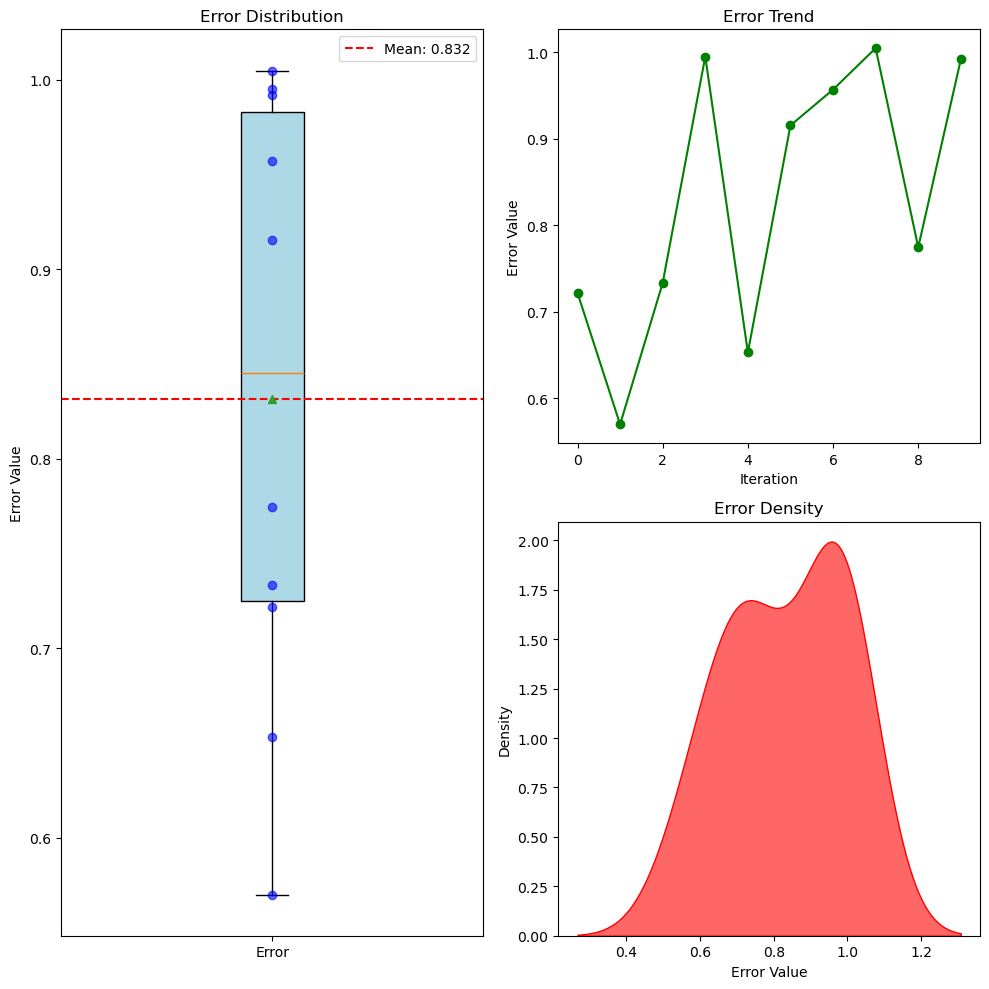

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

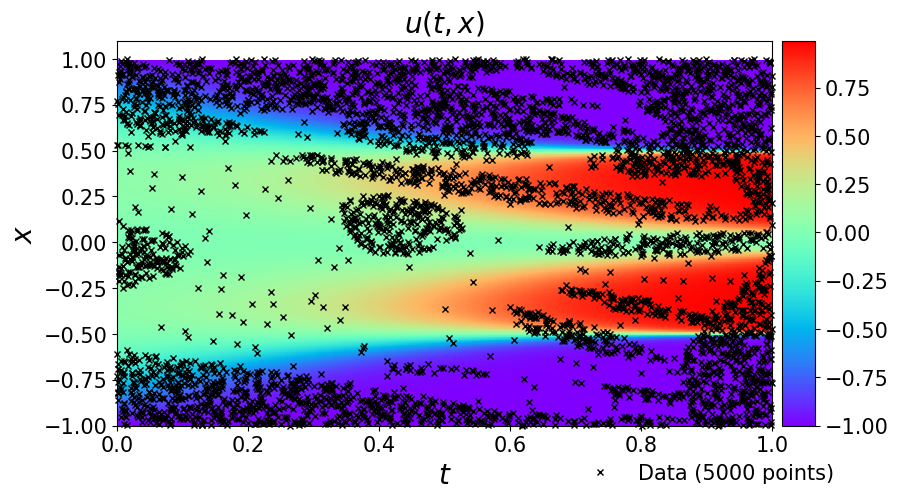

In [10]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


16443


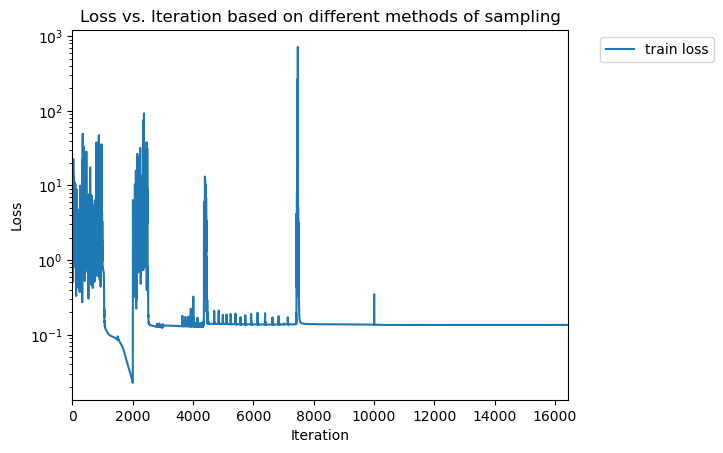

In [12]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


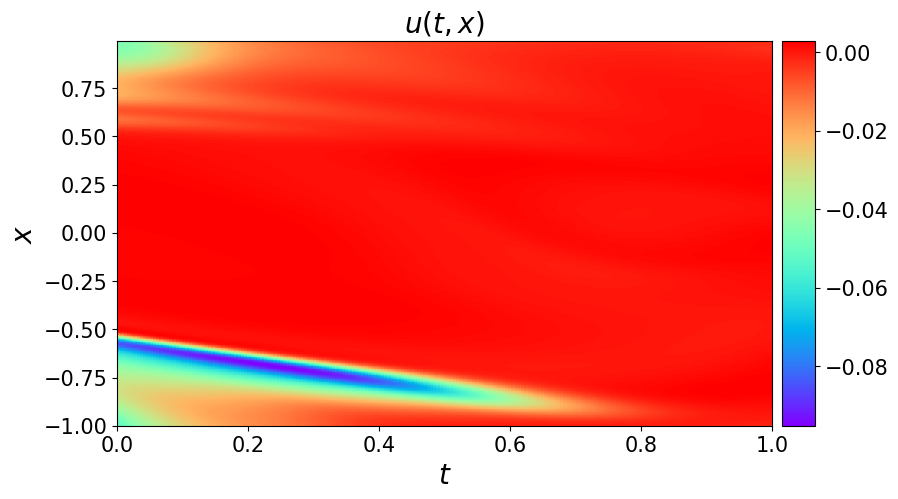

In [13]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

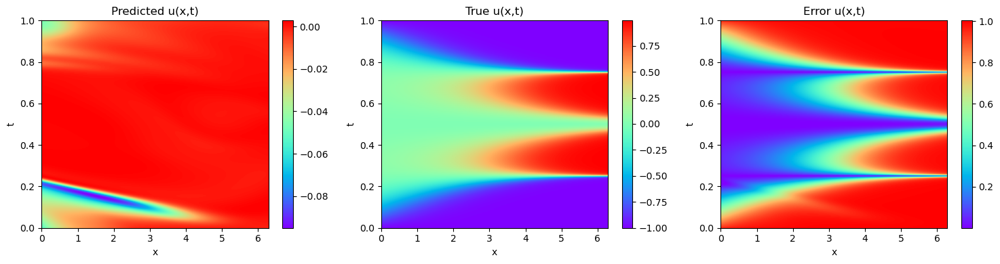

In [14]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [15]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

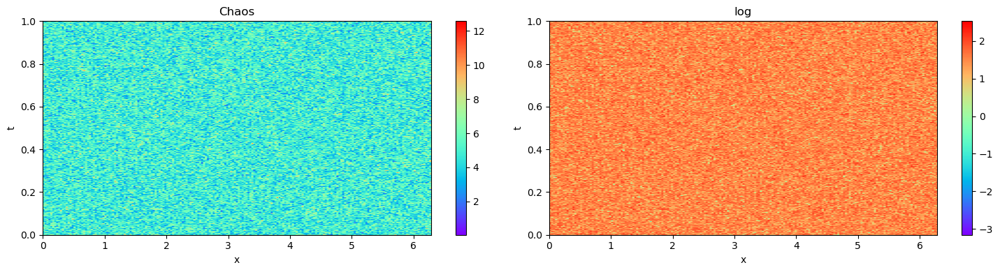

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()